## Merge Data

### 1. Load Data

In [1]:
# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import pandas as pd
from pathlib import Path


# ============================================================
# 2. DEFINE ONEDRIVE DATA FOLDER
# ============================================================

DATA_FOLDER = (
    Path.home()
    / "OneDrive"
    / "Recreation"
    / "Sports"
    / "Futbol"
    / "Futbol Datalake"
)

print("Data folder:")
print(DATA_FOLDER)
print("\nFolder exists:", DATA_FOLDER.exists())


# ============================================================
# 3. DEFINE FILE PATHS
# ============================================================

fbref_file = (
    DATA_FOLDER
    / "2026_World_Cup_Player_Log_FBREF_Standard_Stats.csv"
)

squawka_file = (
    DATA_FOLDER
    / "2026_World_Cup_Player_Log_Squawka_Stats.csv"
)

sofascore_file = (
    DATA_FOLDER
    / "2026_World_Cup_Player_Log_SofaScore_Stats.csv"
)


# ============================================================
# 4. CHECK FILES
# ============================================================

print("\nFBREF file exists:", fbref_file.exists())
print("Squawka file exists:", squawka_file.exists())
print("SofaScore file exists:", sofascore_file.exists())


# ============================================================
# 5. CSV LOADING FUNCTION
#    Tries common encodings automatically
#    Removes empty columns named "Unnamed: ..."
# ============================================================

def load_csv(file_path):

    encodings = [
        "utf-8",
        "utf-8-sig",
        "cp1252",
        "latin1"
    ]

    last_error = None

    for encoding in encodings:

        try:

            df = pd.read_csv(
                file_path,
                encoding=encoding
            )

            # ------------------------------------------------
            # Identify columns automatically named "Unnamed:"
            # ------------------------------------------------

            unnamed_columns = [
                col
                for col in df.columns
                if str(col).startswith("Unnamed:")
            ]

            # ------------------------------------------------
            # Remove only unnamed columns that are fully empty
            # ------------------------------------------------

            empty_unnamed_columns = [
                col
                for col in unnamed_columns
                if df[col].isna().all()
            ]

            if empty_unnamed_columns:

                df = df.drop(
                    columns=empty_unnamed_columns
                )

                print(
                    f"Removed empty unnamed columns from "
                    f"{file_path.name}: "
                    f"{empty_unnamed_columns}"
                )

            print(
                f"Loaded {file_path.name} "
                f"using encoding: {encoding}"
            )

            return df

        except UnicodeDecodeError as error:

            last_error = error
            continue

        except FileNotFoundError:

            raise FileNotFoundError(
                f"File not found:\n{file_path}"
            )

        except pd.errors.EmptyDataError:

            raise ValueError(
                f"The file is empty:\n{file_path}"
            )

        except pd.errors.ParserError as error:

            raise ValueError(
                f"Unable to parse CSV file:\n"
                f"{file_path}\n\n"
                f"Parser error: {error}"
            )

    raise ValueError(
        f"Unable to read {file_path.name} "
        f"using the expected encodings.\n\n"
        f"Last error: {last_error}"
    )


# ============================================================
# 6. VERIFY ALL REQUIRED FILES EXIST
# ============================================================

required_files = {
    "FBREF": fbref_file,
    "Squawka": squawka_file,
    "SofaScore": sofascore_file
}

missing_files = [
    f"{source}: {file_path}"
    for source, file_path in required_files.items()
    if not file_path.exists()
]

if missing_files:

    raise FileNotFoundError(
        "The following required files were not found:\n\n"
        + "\n".join(missing_files)
    )


# ============================================================
# 7. LOAD CSV FILES
# ============================================================

fbref_df = load_csv(fbref_file)
squawka_df = load_csv(squawka_file)
sofascore_df = load_csv(sofascore_file)


# ============================================================
# 8. CONFIRM SUCCESSFUL LOAD
# ============================================================

print("\nFiles loaded successfully!")

print("\nFBREF")
print("Shape:", fbref_df.shape)
print("Columns:", len(fbref_df.columns))

print("\nSQUAWKA")
print("Shape:", squawka_df.shape)
print("Columns:", len(squawka_df.columns))

print("\nSOFASCORE")
print("Shape:", sofascore_df.shape)
print("Columns:", len(sofascore_df.columns))


# ============================================================
# 9. PREVIEW DATA
# ============================================================

print("\nFBREF PREVIEW")
display(fbref_df.head())

print("\nSQUAWKA PREVIEW")
display(squawka_df.head())

print("\nSOFASCORE PREVIEW")
display(sofascore_df.head())


# ============================================================
# 10. REVIEW FINAL COLUMN NAMES
# ============================================================

print("\nFBREF COLUMNS")
print(fbref_df.columns.tolist())

print("\nSQUAWKA COLUMNS")
print(squawka_df.columns.tolist())

print("\nSOFASCORE COLUMNS")
print(sofascore_df.columns.tolist())

Data folder:
C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Datalake

Folder exists: True

FBREF file exists: True
Squawka file exists: True
SofaScore file exists: True
Loaded 2026_World_Cup_Player_Log_FBREF_Standard_Stats.csv using encoding: cp1252
Loaded 2026_World_Cup_Player_Log_Squawka_Stats.csv using encoding: utf-8
Loaded 2026_World_Cup_Player_Log_SofaScore_Stats.csv using encoding: utf-8

Files loaded successfully!

FBREF
Shape: (1039, 25)
Columns: 25

SQUAWKA
Shape: (1248, 97)
Columns: 97

SOFASCORE
Shape: (963, 7)
Columns: 7

FBREF PREVIEW


,Rk,Player,Pos,Squad,Age,Club,Born,MP,Starts,Min,...,PK,PKatt,CrdY,CrdR,Gls.1,Ast.1,G+A.1,G-PK.1,G+A-PK,Matches
0,1,Emiliano Martínez,GK,ar Argentina,33,1.eng Aston Villa,1992,8,8,810,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,Matches
1,2,Unai Simón,GK,es Spain,29,1.es Athletic Club,1997,8,8,750,...,0,0,0,0,0.00,0.00,0.00,0.00,0.00,Matches
2,3,Alexis Mac Allister,MF,ar Argentina,27,1.eng Liverpool,1998,8,7,750,...,0,0,1,0,0.12,0.12,0.24,0.12,0.24,Matches
3,4,Marc Cucurella,DF,es Spain,27,1.eng Chelsea,1998,8,8,750,...,0,0,1,0,0.00,0.24,0.24,0.00,0.24,Matches
4,5,Pau Cubarsí,DF,es Spain,19,1.es Barcelona,2007,8,8,750,...,0,0,1,0,0.00,0.00,0.00,0.00,0.00,Matches



SQUAWKA PREVIEW


,_Scraped Page,№,Team,Player,Goals,Assists,Chances Created,Tackles Made,Fouls,Total Cards,...,Yellow Cards,Red Cards,Handballs,Corners Won,Touches,Ball Recoveries,Possession Lost,Offsides,Touches in Opposition Box,Times Tackled
0,1,1,France,Kylian Mbappé,10,4,18,1,6,1,...,1,0,1,11,385,14,100,7,69,37
1,1,2,Argentina,Lionel Messi,8,4,25,11,3,0,...,0,0,0,9,581,19,156,5,43,38
2,1,3,England,Jude Bellingham,7,1,8,14,9,1,...,1,0,1,5,383,27,88,1,37,22
3,1,3,Norway,Erling Haaland,7,0,6,1,5,0,...,0,0,0,2,120,3,37,0,29,11
4,1,5,France,Ousmane Dembélé,6,2,18,3,0,0,...,0,0,0,6,409,16,117,3,39,13



SOFASCORE PREVIEW


,Team,Player,Distance covered (per 90) (km),Number of Sprints (per 90),Top speed (km/h),Big Chances Missed,Big Chances Created
0,ALG,Adil Boulbina,16.3,21.2,27.9,0,0
1,ALG,Ahmed Nadhir Benbouali,9.7,10.0,28.7,0,0
2,ALG,Aissa Mandi,8.8,5.3,32.1,0,0
3,ALG,Amine Gouiri,9.6,7.5,29.6,0,0
4,ALG,Anis Hadj Moussa,10.8,10.2,29.6,0,0



FBREF COLUMNS
['Rk', 'Player', 'Pos', 'Squad', 'Age', 'Club', 'Born', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G+A', 'G-PK', 'PK', 'PKatt', 'CrdY', 'CrdR', 'Gls.1', 'Ast.1', 'G+A.1', 'G-PK.1', 'G+A-PK', 'Matches']

SQUAWKA COLUMNS
['_Scraped Page', '№', 'Team', 'Player', 'Goals', 'Assists', 'Chances Created', 'Tackles Made', 'Fouls', 'Total Cards', 'Games', 'Minutes', 'Starts', 'Subbed on', 'Subbed off', 'Shots (excl blocks)', 'Shot Accuracy % (excl blocks)', 'Shots On Target', 'Shots Off Target', 'Shots Blocked', 'Shots from Set Pieces', 'Penalties Taken', 'Hit Woodwork', 'Saves Made', 'Saves Made from Inside Box', 'Saves Made from Outside Box', 'Save Percentage %', 'Penalties Faced', 'Penalties Saved', 'Winning Goal', 'Away Goals', 'Home Goals', 'Other Goals', 'Non-penalty Goals', 'Penalty Goals', 'Goals from Inside Box', 'Goals from Outside Box', 'Right Foot Goals', 'Left Foot Goals', 'Conversion Rate %', 'Open-play Passes completed', 'Open Play Passes', 'Passes Attempted', 'Pa

### 2. Register Data in DuckDB

In [2]:
import duckdb

con = duckdb.connect()

con.register("squawka", squawka_df)
con.register("fbref", fbref_df)
con.register("sofascore", sofascore_df)

print("Datasets registered in DuckDB.")

# Optional confirmation
print("\nRegistered DuckDB tables:")
display(con.sql("SHOW TABLES").df())

Datasets registered in DuckDB.

Registered DuckDB tables:


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,name
0,fbref
1,sofascore
2,squawka


### 3. Inspect for Duplicate Lines

In [3]:
duplicate_check = con.sql("""
WITH all_sources AS (

    SELECT
        'Squawka' AS source,
        Player,
        Team
    FROM squawka

    UNION ALL

    SELECT
        'FBREF' AS source,
        Player,
        Squad AS Team
    FROM fbref

    UNION ALL

    SELECT
        'SofaScore' AS source,
        Player,
        Team
    FROM sofascore
)

SELECT
    source,
    Player,
    Team,
    COUNT(*) AS rows
FROM all_sources
GROUP BY
    source,
    Player,
    Team
HAVING COUNT(*) > 1
ORDER BY
    rows DESC,
    source,
    Team,
    Player
""").df()

display(duplicate_check)

,source,Player,Team,rows


### 4. Source Cleaning

In [4]:
# ============================================================
# SOURCE CLEANING FOR SQUAWKA, FBREF, AND SOFASCORE
# ============================================================


# ============================================================
# 1. CREATE CLEAN SQUAWKA VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW squawka_clean AS

SELECT
    *,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(TRIM(Player)),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS player_key,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(TRIM(Team)),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS source_team_key

FROM squawka
""")

print("squawka_clean created.")


# ============================================================
# 2. CREATE CLEAN FBREF VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW fbref_clean AS

SELECT
    *,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(TRIM(Player)),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS player_key,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(
                REGEXP_REPLACE(
                    TRIM(Squad),
                    '^[A-Za-z]{2,3}[ ]+',
                    ''
                )
            ),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS source_team_key

FROM fbref
""")

print("fbref_clean created.")


# ============================================================
# 3. CREATE CLEAN SOFASCORE VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW sofascore_clean AS

SELECT
    *,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(TRIM(Player)),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS player_key,

    LOWER(
        REGEXP_REPLACE(
            STRIP_ACCENTS(TRIM(Team)),
            '[^a-zA-Z0-9]',
            '',
            'g'
        )
    ) AS source_team_key

FROM sofascore
""")

print("sofascore_clean created.")


# ============================================================
# 4. VALIDATE CLEAN VIEWS
# ============================================================

source_cleaning_summary = con.sql("""
SELECT
    'Squawka' AS source,
    COUNT(*) AS rows,
    COUNT(DISTINCT player_key) AS distinct_player_keys,
    COUNT(DISTINCT source_team_key) AS distinct_source_team_keys,
    SUM(
        CASE
            WHEN player_key IS NULL OR player_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_player_keys,
    SUM(
        CASE
            WHEN source_team_key IS NULL OR source_team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_source_team_keys
FROM squawka_clean

UNION ALL

SELECT
    'FBREF' AS source,
    COUNT(*) AS rows,
    COUNT(DISTINCT player_key) AS distinct_player_keys,
    COUNT(DISTINCT source_team_key) AS distinct_source_team_keys,
    SUM(
        CASE
            WHEN player_key IS NULL OR player_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_player_keys,
    SUM(
        CASE
            WHEN source_team_key IS NULL OR source_team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_source_team_keys
FROM fbref_clean

UNION ALL

SELECT
    'SofaScore' AS source,
    COUNT(*) AS rows,
    COUNT(DISTINCT player_key) AS distinct_player_keys,
    COUNT(DISTINCT source_team_key) AS distinct_source_team_keys,
    SUM(
        CASE
            WHEN player_key IS NULL OR player_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_player_keys,
    SUM(
        CASE
            WHEN source_team_key IS NULL OR source_team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_source_team_keys
FROM sofascore_clean
""").df()

display(source_cleaning_summary)


# ============================================================
# 5. PREVIEW CLEANED IDENTIFIERS
# ============================================================

print("\nSQUAWKA CLEAN PREVIEW")

display(
    con.sql("""
    SELECT
        Team,
        Player,
        player_key,
        source_team_key
    FROM squawka_clean
    LIMIT 10
    """).df()
)


print("\nFBREF CLEAN PREVIEW")

display(
    con.sql("""
    SELECT
        Squad,
        Player,
        player_key,
        source_team_key
    FROM fbref_clean
    LIMIT 10
    """).df()
)


print("\nSOFASCORE CLEAN PREVIEW")

display(
    con.sql("""
    SELECT
        Team,
        Player,
        player_key,
        source_team_key
    FROM sofascore_clean
    LIMIT 10
    """).df()
)

squawka_clean created.
fbref_clean created.
sofascore_clean created.


,source,rows,distinct_player_keys,distinct_source_team_keys,missing_player_keys,missing_source_team_keys
0,Squawka,1248,1247,48,0.0,0.0
1,FBREF,1039,1039,48,0.0,0.0
2,SofaScore,963,963,48,0.0,0.0



SQUAWKA CLEAN PREVIEW


,Team,Player,player_key,source_team_key
0,France,Kylian Mbappé,kylianmbappe,france
1,Argentina,Lionel Messi,lionelmessi,argentina
2,England,Jude Bellingham,judebellingham,england
3,Norway,Erling Haaland,erlinghaaland,norway
4,France,Ousmane Dembélé,ousmanedembele,france
5,England,Harry Kane,harrykane,england
6,Spain,Mikel Oyarzabal,mikeloyarzabal,spain
7,Brazil,Vinícius Júnior,viniciusjunior,brazil
8,Mexico,Julián Quiñones,julianquinones,mexico
9,Senegal,Ismaïla Sarr,ismailasarr,senegal



FBREF CLEAN PREVIEW


,Squad,Player,player_key,source_team_key
0,ar Argentina,Emiliano Martínez,emilianomartinez,argentina
1,es Spain,Unai Simón,unaisimon,spain
2,ar Argentina,Alexis Mac Allister,alexismacallister,argentina
3,es Spain,Marc Cucurella,marccucurella,spain
4,es Spain,Pau Cubarsí,paucubarsi,spain
5,ar Argentina,Lionel Messi,lionelmessi,argentina
6,es Spain,Aymeric Laporte,aymericlaporte,spain
7,fr France,Mike Maignan,mikemaignan,france
8,es Spain,Rodri,rodri,spain
9,fr France,Kylian Mbappé,kylianmbappe,france



SOFASCORE CLEAN PREVIEW


,Team,Player,player_key,source_team_key
0,ALG,Adil Boulbina,adilboulbina,alg
1,ALG,Ahmed Nadhir Benbouali,ahmednadhirbenbouali,alg
2,ALG,Aissa Mandi,aissamandi,alg
3,ALG,Amine Gouiri,aminegouiri,alg
4,ALG,Anis Hadj Moussa,anishadjmoussa,alg
5,ALG,Fares Chaibi,fareschaibi,alg
6,ALG,Hicham Boudaoui,hichamboudaoui,alg
7,ALG,Houssem Aouar,houssemaouar,alg
8,ALG,Ibrahim Maza,ibrahimmaza,alg
9,ALG,Jaouen Hadjam,jaouenhadjam,alg


### 5. Audit Player-Name Collisions

In [5]:
# ============================================================
# STEP 5 — AUDIT PLAYER-NAME COLLISIONS
# ============================================================
#
# Run this after:
#   Step 4 — Source Cleaning
#
# Run this before:
#   Step 6 — Validate Team Mapping
#
# A collision is defined as:
# The same normalized player_key appearing for more than one
# team WITHIN THE SAME SOURCE.
#
# We do not compare source_team_key values across providers yet,
# because team identities have not been harmonized at this stage.
#
# This step does not alter the source datasets.
# ============================================================


# ============================================================
# 1. CREATE CONSOLIDATED PLAYER-TEAM VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW all_clean_player_teams AS

SELECT
    'Squawka' AS source,
    Player AS player_name,
    Team AS team_name,
    player_key,
    source_team_key
FROM squawka_clean

UNION ALL

SELECT
    'FBREF' AS source,
    Player AS player_name,
    Squad AS team_name,
    player_key,
    source_team_key
FROM fbref_clean

UNION ALL

SELECT
    'SofaScore' AS source,
    Player AS player_name,
    Team AS team_name,
    player_key,
    source_team_key
FROM sofascore_clean
""")

print("all_clean_player_teams created.")


# ============================================================
# 2. IDENTIFY SAME-NAME COLLISIONS WITHIN EACH SOURCE
# ============================================================

same_name_within_source = con.sql("""
SELECT
    source,
    player_key,

    COUNT(DISTINCT source_team_key)
        AS distinct_teams,

    STRING_AGG(
        DISTINCT player_name,
        ', '
        ORDER BY player_name
    ) AS player_names,

    STRING_AGG(
        DISTINCT team_name,
        ' | '
        ORDER BY team_name
    ) AS teams

FROM all_clean_player_teams

GROUP BY
    source,
    player_key

HAVING COUNT(DISTINCT source_team_key) > 1

ORDER BY
    source,
    distinct_teams DESC,
    player_key
""").df()

print("\n" + "=" * 70)
print("SAME-NAME COLLISIONS WITHIN EACH SOURCE")
print("=" * 70)

print(
    "Collision groups:",
    len(same_name_within_source)
)

display(same_name_within_source)


# ============================================================
# 3. SHOW DETAIL ROWS FOR EACH COLLISION
# ============================================================

same_name_collision_details = con.sql("""
WITH collision_keys AS (

    SELECT
        source,
        player_key

    FROM all_clean_player_teams

    GROUP BY
        source,
        player_key

    HAVING COUNT(DISTINCT source_team_key) > 1
)

SELECT
    p.source,
    p.player_name,
    p.team_name,
    p.player_key,
    p.source_team_key

FROM all_clean_player_teams p

INNER JOIN collision_keys c
    ON p.source = c.source
    AND p.player_key = c.player_key

ORDER BY
    p.source,
    p.player_key,
    p.team_name,
    p.player_name
""").df()

print("\nCOLLISION DETAIL ROWS")
display(same_name_collision_details)


# ============================================================
# 4. CREATE SOURCE-SPECIFIC COLLISION TABLE
# ============================================================
#
# IMPORTANT:
# Both source and player_key are stored.
#
# A collision in one provider does not automatically exclude
# the same normalized name from another provider.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE player_name_collision_keys AS

SELECT
    source,
    player_key,

    COUNT(DISTINCT source_team_key)
        AS distinct_source_teams

FROM all_clean_player_teams

GROUP BY
    source,
    player_key

HAVING COUNT(DISTINCT source_team_key) > 1
""")

print("\nplayer_name_collision_keys created.")


# ============================================================
# 5. COLLISION SUMMARY BY SOURCE
# ============================================================

collision_summary = con.sql("""
WITH source_list AS (

    SELECT 'Squawka' AS source

    UNION ALL

    SELECT 'FBREF' AS source

    UNION ALL

    SELECT 'SofaScore' AS source
),

collision_counts AS (

    SELECT
        source,
        COUNT(*) AS collision_groups

    FROM player_name_collision_keys

    GROUP BY source
)

SELECT
    s.source,

    COALESCE(
        c.collision_groups,
        0
    ) AS collision_groups

FROM source_list s

LEFT JOIN collision_counts c
    ON s.source = c.source

ORDER BY s.source
""").df()

print("\nCOLLISION SUMMARY BY SOURCE")
display(collision_summary)


# ============================================================
# 6. SPECIFIC CHECK FOR EMILIANO MARTINEZ
# ============================================================

emiliano_martinez_check = con.sql("""
SELECT
    source,
    player_name,
    team_name,
    player_key,
    source_team_key

FROM all_clean_player_teams

WHERE player_key = 'emilianomartinez'

ORDER BY
    source,
    team_name,
    player_name
""").df()

print("\nEMILIANO MARTINEZ RECORDS")
display(emiliano_martinez_check)


# ============================================================
# 7. VERIFY EMILIANO MARTINEZ COLLISION STATUS
# ============================================================

emiliano_collision_status = con.sql("""
SELECT
    source,
    player_key,
    distinct_source_teams

FROM player_name_collision_keys

WHERE player_key = 'emilianomartinez'

ORDER BY source
""").df()

print("\nEMILIANO MARTINEZ COLLISION STATUS")
display(emiliano_collision_status)


# ============================================================
# 8. COUNT TOTAL COLLISION GROUPS
# ============================================================

total_collision_count = con.sql("""
SELECT
    COUNT(*) AS total_source_specific_collision_groups
FROM player_name_collision_keys
""").df()

print("\nTOTAL SOURCE-SPECIFIC COLLISION GROUPS")
display(total_collision_count)


# ============================================================
# 9. FINAL VALIDATION
# ============================================================

collision_table_check = con.sql("""
SELECT
    COUNT(*) AS rows,
    COUNT(DISTINCT source) AS sources_with_collisions,
    COUNT(DISTINCT player_key) AS distinct_collision_names

FROM player_name_collision_keys
""").df()

print("\nCOLLISION TABLE VALIDATION")
display(collision_table_check)


# ============================================================
# 10. FINAL CONFIRMATION
# ============================================================

print("\n" + "=" * 70)
print("STEP 5 COMPLETE — PLAYER-NAME COLLISIONS AUDITED")
print("=" * 70)

print(
    "Only names appearing for multiple teams within the same "
    "provider have been flagged."
)

print(
    "Different team representations across providers have not "
    "been treated as player-name collisions."
)

print(
    "Step 6 must join player_name_collision_keys using both "
    "source and player_key."
)

print("=" * 70)

all_clean_player_teams created.

SAME-NAME COLLISIONS WITHIN EACH SOURCE
Collision groups: 1


,source,player_key,distinct_teams,player_names,teams
0,Squawka,emilianomartinez,2,Emiliano Martínez,Argentina | Uruguay



COLLISION DETAIL ROWS


,source,player_name,team_name,player_key,source_team_key
0,Squawka,Emiliano Martínez,Argentina,emilianomartinez,argentina
1,Squawka,Emiliano Martínez,Uruguay,emilianomartinez,uruguay



player_name_collision_keys created.

COLLISION SUMMARY BY SOURCE


,source,collision_groups
0,FBREF,0
1,SofaScore,0
2,Squawka,1



EMILIANO MARTINEZ RECORDS


,source,player_name,team_name,player_key,source_team_key
0,FBREF,Emiliano Martínez,ar Argentina,emilianomartinez,argentina
1,Squawka,Emiliano Martínez,Argentina,emilianomartinez,argentina
2,Squawka,Emiliano Martínez,Uruguay,emilianomartinez,uruguay



EMILIANO MARTINEZ COLLISION STATUS


,source,player_key,distinct_source_teams
0,Squawka,emilianomartinez,2



TOTAL SOURCE-SPECIFIC COLLISION GROUPS


,total_source_specific_collision_groups
0,1



COLLISION TABLE VALIDATION


,rows,sources_with_collisions,distinct_collision_names
0,1,1,1



STEP 5 COMPLETE — PLAYER-NAME COLLISIONS AUDITED
Only names appearing for multiple teams within the same provider have been flagged.
Different team representations across providers have not been treated as player-name collisions.
Step 6 must join player_name_collision_keys using both source and player_key.


### 6. Validate Team Mapping

In [6]:
# ============================================================
# VALIDATE AND STORE CANONICAL TEAM MAPPING
# ============================================================
#
# Prerequisites:
#
#   squawka_clean
#   fbref_clean
#   sofascore_clean
#   player_name_collision_keys
#
# This step:
#
# 1. Excludes ambiguous same-name player keys.
# 2. Uses exact player matches to infer team relationships.
# 3. Selects the strongest team match for each source.
# 4. Validates one-to-one team mappings.
# 5. Stores one reusable canonical team mapping table.
#
# Squawka is used as the canonical team reference because it
# contains the complete 48-team roster.
# ============================================================


# ============================================================
# 1. VERIFY REQUIRED TABLES AND VIEWS EXIST
# ============================================================

required_objects = [
    "squawka_clean",
    "fbref_clean",
    "sofascore_clean",
    "player_name_collision_keys"
]

available_objects = con.sql("""
SELECT table_name
FROM information_schema.tables

UNION

SELECT table_name
FROM information_schema.views
""").df()["table_name"].tolist()

missing_objects = [
    obj
    for obj in required_objects
    if obj not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "Missing required DuckDB objects:\n"
        + "\n".join(missing_objects)
    )

print("All required clean views and collision tables found.")


# ============================================================
# 2. CREATE SAFE PLAYER-MATCH VIEWS
# ============================================================
#
# Remove normalized player names that are associated with more
# than one team.
#
# These names must not be used to infer team mappings.
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW squawka_team_mapping_safe AS

SELECT s.*
FROM squawka_clean s

LEFT JOIN player_name_collision_keys c
    ON s.player_key = c.player_key

WHERE c.player_key IS NULL
""")

con.sql("""
CREATE OR REPLACE VIEW fbref_team_mapping_safe AS

SELECT f.*
FROM fbref_clean f

LEFT JOIN player_name_collision_keys c
    ON f.player_key = c.player_key

WHERE c.player_key IS NULL
""")

con.sql("""
CREATE OR REPLACE VIEW sofascore_team_mapping_safe AS

SELECT sf.*
FROM sofascore_clean sf

LEFT JOIN player_name_collision_keys c
    ON sf.player_key = c.player_key

WHERE c.player_key IS NULL
""")

print("Safe team-mapping views created.")


# ============================================================
# 3. COUNT SQUAWKA ↔ FBREF TEAM-PAIR MATCHES
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE squawka_fbref_team_pair_counts AS

SELECT
    s.Team AS squawka_team,
    s.source_team_key AS squawka_source_team_key,

    f.Squad AS fbref_team,
    f.source_team_key AS fbref_source_team_key,

    COUNT(*) AS matching_players

FROM squawka_team_mapping_safe s

INNER JOIN fbref_team_mapping_safe f
    ON s.player_key = f.player_key

GROUP BY
    s.Team,
    s.source_team_key,
    f.Squad,
    f.source_team_key
""")

print("Squawka-FBREF team-pair counts created.")


# ============================================================
# 4. RANK SQUAWKA ↔ FBREF TEAM MATCHES
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE squawka_fbref_team_mapping AS

WITH ranked AS (

    SELECT
        *,

        ROW_NUMBER() OVER (
            PARTITION BY squawka_source_team_key
            ORDER BY
                matching_players DESC,
                fbref_source_team_key
        ) AS mapping_rank,

        LEAD(matching_players) OVER (
            PARTITION BY squawka_source_team_key
            ORDER BY
                matching_players DESC,
                fbref_source_team_key
        ) AS second_best_matching_players

    FROM squawka_fbref_team_pair_counts
)

SELECT
    squawka_team,
    squawka_source_team_key,

    fbref_team,
    fbref_source_team_key,

    matching_players,

    COALESCE(
        second_best_matching_players,
        0
    ) AS second_best_matching_players,

    matching_players
        - COALESCE(
            second_best_matching_players,
            0
        ) AS match_margin

FROM ranked

WHERE mapping_rank = 1
""")

print("Best Squawka-FBREF team mappings selected.")


# ============================================================
# 5. COUNT SQUAWKA ↔ SOFASCORE TEAM-PAIR MATCHES
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE squawka_sofascore_team_pair_counts AS

SELECT
    s.Team AS squawka_team,
    s.source_team_key AS squawka_source_team_key,

    sf.Team AS sofascore_team,
    sf.source_team_key AS sofascore_source_team_key,

    COUNT(*) AS matching_players

FROM squawka_team_mapping_safe s

INNER JOIN sofascore_team_mapping_safe sf
    ON s.player_key = sf.player_key

GROUP BY
    s.Team,
    s.source_team_key,
    sf.Team,
    sf.source_team_key
""")

print("Squawka-SofaScore team-pair counts created.")


# ============================================================
# 6. RANK SQUAWKA ↔ SOFASCORE TEAM MATCHES
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE squawka_sofascore_team_mapping AS

WITH ranked AS (

    SELECT
        *,

        ROW_NUMBER() OVER (
            PARTITION BY squawka_source_team_key
            ORDER BY
                matching_players DESC,
                sofascore_source_team_key
        ) AS mapping_rank,

        LEAD(matching_players) OVER (
            PARTITION BY squawka_source_team_key
            ORDER BY
                matching_players DESC,
                sofascore_source_team_key
        ) AS second_best_matching_players

    FROM squawka_sofascore_team_pair_counts
)

SELECT
    squawka_team,
    squawka_source_team_key,

    sofascore_team,
    sofascore_source_team_key,

    matching_players,

    COALESCE(
        second_best_matching_players,
        0
    ) AS second_best_matching_players,

    matching_players
        - COALESCE(
            second_best_matching_players,
            0
        ) AS match_margin

FROM ranked

WHERE mapping_rank = 1
""")

print("Best Squawka-SofaScore team mappings selected.")


# ============================================================
# 7. CREATE CONSOLIDATED THREE-SOURCE TEAM MAPPING
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE canonical_team_mapping AS

SELECT
    s.Team AS canonical_team_name,

    -- Squawka clean team representation becomes canonical
    s.source_team_key AS canonical_team_key,

    s.Team AS squawka_team,
    s.source_team_key AS squawka_source_team_key,

    f.fbref_team,
    f.fbref_source_team_key,

    sf.sofascore_team,
    sf.sofascore_source_team_key,

    f.matching_players
        AS squawka_fbref_matching_players,

    f.second_best_matching_players
        AS squawka_fbref_second_best,

    f.match_margin
        AS squawka_fbref_match_margin,

    sf.matching_players
        AS squawka_sofascore_matching_players,

    sf.second_best_matching_players
        AS squawka_sofascore_second_best,

    sf.match_margin
        AS squawka_sofascore_match_margin

FROM (

    SELECT DISTINCT
        Team,
        source_team_key

    FROM squawka_clean

) s

LEFT JOIN squawka_fbref_team_mapping f
    ON s.source_team_key
       = f.squawka_source_team_key

LEFT JOIN squawka_sofascore_team_mapping sf
    ON s.source_team_key
       = sf.squawka_source_team_key
""")

print("canonical_team_mapping created.")


# ============================================================
# 8. DISPLAY CONSOLIDATED TEAM MAPPING
# ============================================================

team_mapping_check = con.sql("""
SELECT *
FROM canonical_team_mapping
ORDER BY canonical_team_name
""").df()

print("\nCONSOLIDATED CANONICAL TEAM MAPPING")
display(team_mapping_check)


# ============================================================
# 9. VALIDATE TEAM COVERAGE
# ============================================================

team_mapping_summary = con.sql("""
SELECT
    COUNT(*) AS canonical_teams,

    COUNT(DISTINCT squawka_source_team_key)
        AS squawka_teams,

    COUNT(DISTINCT fbref_source_team_key)
        AS fbref_teams,

    COUNT(DISTINCT sofascore_source_team_key)
        AS sofascore_teams,

    SUM(
        CASE
            WHEN fbref_source_team_key IS NULL
            THEN 1
            ELSE 0
        END
    ) AS missing_fbref_mappings,

    SUM(
        CASE
            WHEN sofascore_source_team_key IS NULL
            THEN 1
            ELSE 0
        END
    ) AS missing_sofascore_mappings

FROM canonical_team_mapping
""").df()

print("\nTEAM-MAPPING COVERAGE")
display(team_mapping_summary)


# ============================================================
# 10. CHECK FOR ONE SOURCE TEAM MAPPING TO MULTIPLE
#     CANONICAL TEAMS
# ============================================================

mapping_ambiguities = con.sql("""
WITH mappings AS (

    SELECT
        'Squawka' AS source,
        squawka_source_team_key AS source_team_key,
        canonical_team_key
    FROM canonical_team_mapping

    UNION ALL

    SELECT
        'FBREF' AS source,
        fbref_source_team_key AS source_team_key,
        canonical_team_key
    FROM canonical_team_mapping
    WHERE fbref_source_team_key IS NOT NULL

    UNION ALL

    SELECT
        'SofaScore' AS source,
        sofascore_source_team_key AS source_team_key,
        canonical_team_key
    FROM canonical_team_mapping
    WHERE sofascore_source_team_key IS NOT NULL
)

SELECT
    source,
    source_team_key,

    COUNT(DISTINCT canonical_team_key)
        AS canonical_team_count,

    STRING_AGG(
        DISTINCT canonical_team_key,
        ', '
        ORDER BY canonical_team_key
    ) AS canonical_teams

FROM mappings

GROUP BY
    source,
    source_team_key

HAVING COUNT(DISTINCT canonical_team_key) > 1

ORDER BY
    source,
    source_team_key
""").df()

print(
    "\nAmbiguous source-team mappings:",
    len(mapping_ambiguities)
)

display(mapping_ambiguities)


# ============================================================
# 11. IDENTIFY LOW-CONFIDENCE TEAM MAPPINGS
# ============================================================
#
# Diagnostic only.
#
# These mappings should be reviewed when:
#
# - very few players matched, or
# - the best match barely beat the second-best match.
# ============================================================

low_confidence_mappings = con.sql("""
SELECT
    canonical_team_name,

    fbref_team,
    squawka_fbref_matching_players,
    squawka_fbref_second_best,
    squawka_fbref_match_margin,

    sofascore_team,
    squawka_sofascore_matching_players,
    squawka_sofascore_second_best,
    squawka_sofascore_match_margin

FROM canonical_team_mapping

WHERE
       squawka_fbref_matching_players < 5
    OR squawka_sofascore_matching_players < 5
    OR squawka_fbref_match_margin <= 2
    OR squawka_sofascore_match_margin <= 2

ORDER BY canonical_team_name
""").df()

print(
    "\nLow-confidence mappings requiring review:",
    len(low_confidence_mappings)
)

display(low_confidence_mappings)


# ============================================================
# 12. CREATE REUSABLE TEAM ALIAS MAP
# ============================================================
#
# This table is what the next harmonization step will use.
#
# Each row maps one source-specific team key to one canonical
# team key.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE team_alias_map AS

SELECT
    'Squawka' AS source,
    squawka_source_team_key AS source_team_key,
    canonical_team_name,
    canonical_team_key

FROM canonical_team_mapping

UNION ALL

SELECT
    'FBREF' AS source,
    fbref_source_team_key AS source_team_key,
    canonical_team_name,
    canonical_team_key

FROM canonical_team_mapping

WHERE fbref_source_team_key IS NOT NULL

UNION ALL

SELECT
    'SofaScore' AS source,
    sofascore_source_team_key AS source_team_key,
    canonical_team_name,
    canonical_team_key

FROM canonical_team_mapping

WHERE sofascore_source_team_key IS NOT NULL
""")

print("team_alias_map created.")


# ============================================================
# 13. VALIDATE TEAM ALIAS MAP
# ============================================================

team_alias_map_summary = con.sql("""
SELECT
    source,

    COUNT(*) AS mapping_rows,

    COUNT(DISTINCT source_team_key)
        AS source_team_keys,

    COUNT(DISTINCT canonical_team_key)
        AS canonical_team_keys

FROM team_alias_map

GROUP BY source

ORDER BY source
""").df()

print("\nTEAM ALIAS MAP SUMMARY")
display(team_alias_map_summary)


# ============================================================
# 14. HARD VALIDATION
# ============================================================

validation_values = con.sql("""
SELECT
    COUNT(*) AS canonical_teams,

    COUNT(DISTINCT squawka_source_team_key)
        AS squawka_teams,

    COUNT(DISTINCT fbref_source_team_key)
        AS fbref_teams,

    COUNT(DISTINCT sofascore_source_team_key)
        AS sofascore_teams,

    SUM(
        CASE
            WHEN fbref_source_team_key IS NULL
              OR sofascore_source_team_key IS NULL
            THEN 1
            ELSE 0
        END
    ) AS incomplete_team_rows

FROM canonical_team_mapping
""").df().iloc[0]

if validation_values["canonical_teams"] != 48:
    raise RuntimeError(
        "Expected 48 canonical teams, but found "
        f"{validation_values['canonical_teams']}."
    )

if validation_values["squawka_teams"] != 48:
    raise RuntimeError(
        "Squawka does not have 48 unique mapped teams."
    )

if validation_values["fbref_teams"] != 48:
    raise RuntimeError(
        "FBREF does not have 48 unique mapped teams."
    )

if validation_values["sofascore_teams"] != 48:
    raise RuntimeError(
        "SofaScore does not have 48 unique mapped teams."
    )

if validation_values["incomplete_team_rows"] != 0:
    raise RuntimeError(
        "At least one canonical team is missing a source mapping."
    )

if len(mapping_ambiguities) > 0:
    raise RuntimeError(
        "At least one source team maps to multiple canonical teams."
    )


# ============================================================
# 15. FINAL CONFIRMATION
# ============================================================

print("\n" + "=" * 70)
print("STEP 6 COMPLETE — TEAM MAPPING VALIDATED")
print("=" * 70)

print("Canonical teams: 48")
print("Squawka mappings: 48")
print("FBREF mappings: 48")
print("SofaScore mappings: 48")
print("Ambiguous mappings: 0")

print("\nReusable mapping table:")
print("team_alias_map")

print("\nNext step:")
print("Create harmonized views with canonical team_key values.")

print("=" * 70)

All required clean views and collision tables found.
Safe team-mapping views created.
Squawka-FBREF team-pair counts created.
Best Squawka-FBREF team mappings selected.
Squawka-SofaScore team-pair counts created.
Best Squawka-SofaScore team mappings selected.
canonical_team_mapping created.

CONSOLIDATED CANONICAL TEAM MAPPING


,canonical_team_name,canonical_team_key,squawka_team,squawka_source_team_key,fbref_team,fbref_source_team_key,sofascore_team,sofascore_source_team_key,squawka_fbref_matching_players,squawka_fbref_second_best,squawka_fbref_match_margin,squawka_sofascore_matching_players,squawka_sofascore_second_best,squawka_sofascore_match_margin
0,Algeria,algeria,Algeria,algeria,dz Algeria,algeria,ALG,alg,21,0,21,17,0,17
1,Argentina,argentina,Argentina,argentina,ar Argentina,argentina,ARG,arg,20,0,20,22,0,22
2,Australia,australia,Australia,australia,au Australia,australia,AUS,aus,21,0,21,21,0,21
3,Austria,austria,Austria,austria,at Austria,austria,AUT,aut,20,0,20,19,0,19
4,Belgium,belgium,Belgium,belgium,be Belgium,belgium,BEL,bel,23,0,23,21,0,21
5,Bosnia-Herzegovina,bosniaherzegovina,Bosnia-Herzegovina,bosniaherzegovina,ba Bosnia–Herz,bosniaherz,BIH,bih,23,0,23,22,0,22
6,Brazil,brazil,Brazil,brazil,br Brazil,brazil,BRA,bra,21,0,21,21,0,21
7,Canada,canada,Canada,canada,ca Canada,canada,CAN,can,22,0,22,20,0,20
8,Cape Verde Islands,capeverdeislands,Cape Verde Islands,capeverdeislands,cv Cabo Verde,caboverde,CPV,cpv,16,0,16,17,0,17
9,Colombia,colombia,Colombia,colombia,co Colombia,colombia,COL,col,19,0,19,18,0,18



TEAM-MAPPING COVERAGE


,canonical_teams,squawka_teams,fbref_teams,sofascore_teams,missing_fbref_mappings,missing_sofascore_mappings
0,48,48,48,48,0.0,0.0



Ambiguous source-team mappings: 0


,source,source_team_key,canonical_team_count,canonical_teams



Low-confidence mappings requiring review: 0


,canonical_team_name,fbref_team,squawka_fbref_matching_players,squawka_fbref_second_best,squawka_fbref_match_margin,sofascore_team,squawka_sofascore_matching_players,squawka_sofascore_second_best,squawka_sofascore_match_margin


team_alias_map created.

TEAM ALIAS MAP SUMMARY


,source,mapping_rows,source_team_keys,canonical_team_keys
0,FBREF,48,48,48
1,SofaScore,48,48,48
2,Squawka,48,48,48



STEP 6 COMPLETE — TEAM MAPPING VALIDATED
Canonical teams: 48
Squawka mappings: 48
FBREF mappings: 48
SofaScore mappings: 48
Ambiguous mappings: 0

Reusable mapping table:
team_alias_map

Next step:
Create harmonized views with canonical team_key values.


### 7. Create Harmonized Source Views

In [7]:
# ============================================================
# STEP 7 — CREATE HARMONIZED SOURCE VIEWS
# ============================================================
#
# Prerequisites:
#
#   squawka_clean
#   fbref_clean
#   sofascore_clean
#   team_alias_map
#
# This step:
#
# 1. Joins each cleaned source to team_alias_map.
# 2. Adds one shared canonical team_key.
# 3. Preserves the original source-specific team fields.
# 4. Validates that every row receives a canonical team_key.
#
# These harmonized views will be used for player matching and
# dataset blending.
# ============================================================


# ============================================================
# 1. VERIFY REQUIRED OBJECTS EXIST
# ============================================================

required_objects = [
    "squawka_clean",
    "fbref_clean",
    "sofascore_clean",
    "team_alias_map"
]

available_objects = con.sql("""
SELECT table_name
FROM information_schema.tables

UNION

SELECT table_name
FROM information_schema.views
""").df()["table_name"].tolist()

missing_objects = [
    obj
    for obj in required_objects
    if obj not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "Missing required DuckDB objects:\n"
        + "\n".join(missing_objects)
    )

print("All required clean views and mapping tables found.")


# ============================================================
# 2. CREATE HARMONIZED SQUAWKA VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW squawka_harmonized AS

SELECT
    s.*,

    m.canonical_team_name,
    m.canonical_team_key AS team_key

FROM squawka_clean s

LEFT JOIN team_alias_map m
    ON m.source = 'Squawka'
    AND s.source_team_key = m.source_team_key
""")

print("squawka_harmonized created.")


# ============================================================
# 3. CREATE HARMONIZED FBREF VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW fbref_harmonized AS

SELECT
    f.*,

    m.canonical_team_name,
    m.canonical_team_key AS team_key

FROM fbref_clean f

LEFT JOIN team_alias_map m
    ON m.source = 'FBREF'
    AND f.source_team_key = m.source_team_key
""")

print("fbref_harmonized created.")


# ============================================================
# 4. CREATE HARMONIZED SOFASCORE VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW sofascore_harmonized AS

SELECT
    sf.*,

    m.canonical_team_name,
    m.canonical_team_key AS team_key

FROM sofascore_clean sf

LEFT JOIN team_alias_map m
    ON m.source = 'SofaScore'
    AND sf.source_team_key = m.source_team_key
""")

print("sofascore_harmonized created.")


# ============================================================
# 5. VALIDATE ROW COUNTS
# ============================================================

row_count_validation = con.sql("""
SELECT
    'Squawka' AS source,

    (SELECT COUNT(*) FROM squawka_clean)
        AS clean_rows,

    (SELECT COUNT(*) FROM squawka_harmonized)
        AS harmonized_rows

UNION ALL

SELECT
    'FBREF' AS source,

    (SELECT COUNT(*) FROM fbref_clean)
        AS clean_rows,

    (SELECT COUNT(*) FROM fbref_harmonized)
        AS harmonized_rows

UNION ALL

SELECT
    'SofaScore' AS source,

    (SELECT COUNT(*) FROM sofascore_clean)
        AS clean_rows,

    (SELECT COUNT(*) FROM sofascore_harmonized)
        AS harmonized_rows
""").df()

row_count_validation["row_difference"] = (
    row_count_validation["harmonized_rows"]
    - row_count_validation["clean_rows"]
)

print("\nROW COUNT VALIDATION")
display(row_count_validation)


# ============================================================
# 6. VALIDATE TEAM-KEY COVERAGE
# ============================================================

team_key_coverage = con.sql("""
SELECT
    'Squawka' AS source,

    COUNT(*) AS rows,

    COUNT(DISTINCT source_team_key)
        AS source_team_keys,

    COUNT(DISTINCT team_key)
        AS canonical_team_keys,

    SUM(
        CASE
            WHEN team_key IS NULL OR team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_team_key_rows

FROM squawka_harmonized

UNION ALL

SELECT
    'FBREF' AS source,

    COUNT(*) AS rows,

    COUNT(DISTINCT source_team_key)
        AS source_team_keys,

    COUNT(DISTINCT team_key)
        AS canonical_team_keys,

    SUM(
        CASE
            WHEN team_key IS NULL OR team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_team_key_rows

FROM fbref_harmonized

UNION ALL

SELECT
    'SofaScore' AS source,

    COUNT(*) AS rows,

    COUNT(DISTINCT source_team_key)
        AS source_team_keys,

    COUNT(DISTINCT team_key)
        AS canonical_team_keys,

    SUM(
        CASE
            WHEN team_key IS NULL OR team_key = ''
            THEN 1
            ELSE 0
        END
    ) AS missing_team_key_rows

FROM sofascore_harmonized
""").df()

print("\nTEAM-KEY COVERAGE")
display(team_key_coverage)


# ============================================================
# 7. IDENTIFY UNMAPPED TEAM VALUES
# ============================================================

unmapped_team_values = con.sql("""
SELECT DISTINCT
    'Squawka' AS source,
    Team AS source_team_name,
    source_team_key

FROM squawka_harmonized

WHERE team_key IS NULL

UNION ALL

SELECT DISTINCT
    'FBREF' AS source,
    Squad AS source_team_name,
    source_team_key

FROM fbref_harmonized

WHERE team_key IS NULL

UNION ALL

SELECT DISTINCT
    'SofaScore' AS source,
    Team AS source_team_name,
    source_team_key

FROM sofascore_harmonized

WHERE team_key IS NULL

ORDER BY
    source,
    source_team_name
""").df()

print(
    "\nUnmapped source-team values:",
    len(unmapped_team_values)
)

display(unmapped_team_values)


# ============================================================
# 8. VALIDATE CANONICAL TEAM SETS
# ============================================================

canonical_team_set_validation = con.sql("""
WITH source_team_sets AS (

    SELECT DISTINCT
        'Squawka' AS source,
        team_key
    FROM squawka_harmonized
    WHERE team_key IS NOT NULL

    UNION ALL

    SELECT DISTINCT
        'FBREF' AS source,
        team_key
    FROM fbref_harmonized
    WHERE team_key IS NOT NULL

    UNION ALL

    SELECT DISTINCT
        'SofaScore' AS source,
        team_key
    FROM sofascore_harmonized
    WHERE team_key IS NOT NULL
)

SELECT
    source,
    COUNT(DISTINCT team_key) AS canonical_teams

FROM source_team_sets

GROUP BY source

ORDER BY source
""").df()

print("\nCANONICAL TEAM SET VALIDATION")
display(canonical_team_set_validation)


# ============================================================
# 9. COMPARE FBREF TEAM SET AGAINST SQUAWKA
# ============================================================

fbref_missing_from_squawka = con.sql("""
SELECT DISTINCT
    team_key

FROM fbref_harmonized

WHERE team_key IS NOT NULL

EXCEPT

SELECT DISTINCT
    team_key

FROM squawka_harmonized

WHERE team_key IS NOT NULL
""").df()

squawka_missing_from_fbref = con.sql("""
SELECT DISTINCT
    team_key

FROM squawka_harmonized

WHERE team_key IS NOT NULL

EXCEPT

SELECT DISTINCT
    team_key

FROM fbref_harmonized

WHERE team_key IS NOT NULL
""").df()

print(
    "\nFBREF teams not found in Squawka:",
    len(fbref_missing_from_squawka)
)
display(fbref_missing_from_squawka)

print(
    "\nSquawka teams not found in FBREF:",
    len(squawka_missing_from_fbref)
)
display(squawka_missing_from_fbref)


# ============================================================
# 10. COMPARE SOFASCORE TEAM SET AGAINST SQUAWKA
# ============================================================

sofascore_missing_from_squawka = con.sql("""
SELECT DISTINCT
    team_key

FROM sofascore_harmonized

WHERE team_key IS NOT NULL

EXCEPT

SELECT DISTINCT
    team_key

FROM squawka_harmonized

WHERE team_key IS NOT NULL
""").df()

squawka_missing_from_sofascore = con.sql("""
SELECT DISTINCT
    team_key

FROM squawka_harmonized

WHERE team_key IS NOT NULL

EXCEPT

SELECT DISTINCT
    team_key

FROM sofascore_harmonized

WHERE team_key IS NOT NULL
""").df()

print(
    "\nSofaScore teams not found in Squawka:",
    len(sofascore_missing_from_squawka)
)
display(sofascore_missing_from_squawka)

print(
    "\nSquawka teams not found in SofaScore:",
    len(squawka_missing_from_sofascore)
)
display(squawka_missing_from_sofascore)


# ============================================================
# 11. PREVIEW HARMONIZED IDENTIFIERS
# ============================================================

print("\nSQUAWKA HARMONIZED PREVIEW")

display(
    con.sql("""
    SELECT
        Team,
        Player,
        player_key,
        source_team_key,
        canonical_team_name,
        team_key
    FROM squawka_harmonized
    ORDER BY Team, Player
    LIMIT 10
    """).df()
)


print("\nFBREF HARMONIZED PREVIEW")

display(
    con.sql("""
    SELECT
        Squad,
        Player,
        player_key,
        source_team_key,
        canonical_team_name,
        team_key
    FROM fbref_harmonized
    ORDER BY Squad, Player
    LIMIT 10
    """).df()
)


print("\nSOFASCORE HARMONIZED PREVIEW")

display(
    con.sql("""
    SELECT
        Team,
        Player,
        player_key,
        source_team_key,
        canonical_team_name,
        team_key
    FROM sofascore_harmonized
    ORDER BY Team, Player
    LIMIT 10
    """).df()
)


# ============================================================
# 12. CHECK PLAYER-TEAM KEY UNIQUENESS
# ============================================================
#
# The intended blend key is:
#
#   player_key + team_key
#
# This check identifies duplicate records under that key within
# each source.
# ============================================================

duplicate_player_team_keys = con.sql("""
SELECT
    'Squawka' AS source,
    player_key,
    team_key,
    COUNT(*) AS rows

FROM squawka_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

UNION ALL

SELECT
    'FBREF' AS source,
    player_key,
    team_key,
    COUNT(*) AS rows

FROM fbref_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

UNION ALL

SELECT
    'SofaScore' AS source,
    player_key,
    team_key,
    COUNT(*) AS rows

FROM sofascore_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY
    source,
    rows DESC,
    player_key,
    team_key
""").df()

print(
    "\nDuplicate player_key + team_key groups:",
    len(duplicate_player_team_keys)
)

display(duplicate_player_team_keys)


# ============================================================
# 13. HARD VALIDATION
# ============================================================

row_count_errors = row_count_validation[
    row_count_validation["row_difference"] != 0
]

if len(row_count_errors) > 0:
    raise RuntimeError(
        "At least one harmonized view changed the source row count."
    )

missing_team_key_total = int(
    team_key_coverage["missing_team_key_rows"].sum()
)

if missing_team_key_total != 0:
    raise RuntimeError(
        f"{missing_team_key_total} rows are missing a canonical team_key."
    )

for source in ["Squawka", "FBREF", "SofaScore"]:
    source_result = canonical_team_set_validation[
        canonical_team_set_validation["source"] == source
    ]

    if len(source_result) != 1:
        raise RuntimeError(
            f"Canonical team validation is missing source: {source}"
        )

    canonical_teams = int(
        source_result.iloc[0]["canonical_teams"]
    )

    if canonical_teams != 48:
        raise RuntimeError(
            f"{source} has {canonical_teams} canonical teams; expected 48."
        )

if len(fbref_missing_from_squawka) > 0:
    raise RuntimeError(
        "FBREF contains canonical team keys not found in Squawka."
    )

if len(squawka_missing_from_fbref) > 0:
    raise RuntimeError(
        "Squawka contains canonical team keys not found in FBREF."
    )

if len(sofascore_missing_from_squawka) > 0:
    raise RuntimeError(
        "SofaScore contains canonical team keys not found in Squawka."
    )

if len(squawka_missing_from_sofascore) > 0:
    raise RuntimeError(
        "Squawka contains canonical team keys not found in SofaScore."
    )


# ============================================================
# 14. FINAL CONFIRMATION
# ============================================================

print("\n" + "=" * 70)
print("STEP 7 COMPLETE — SOURCE TEAMS HARMONIZED")
print("=" * 70)

print("Harmonized views created:")
print("  squawka_harmonized")
print("  fbref_harmonized")
print("  sofascore_harmonized")

print("\nShared identifiers available:")
print("  player_key")
print("  team_key")

print("\nValidated canonical teams:")
print("  Squawka: 48")
print("  FBREF: 48")
print("  SofaScore: 48")

print("\nNext step:")
print(
    "Validate exact player matches using player_key + team_key."
)

print("=" * 70)

All required clean views and mapping tables found.
squawka_harmonized created.
fbref_harmonized created.
sofascore_harmonized created.

ROW COUNT VALIDATION


,source,clean_rows,harmonized_rows,row_difference
0,Squawka,1248,1248,0
1,FBREF,1039,1039,0
2,SofaScore,963,963,0



TEAM-KEY COVERAGE


,source,rows,source_team_keys,canonical_team_keys,missing_team_key_rows
0,Squawka,1248,48,48,0.0
1,FBREF,1039,48,48,0.0
2,SofaScore,963,48,48,0.0



Unmapped source-team values: 0


,source,source_team_name,source_team_key



CANONICAL TEAM SET VALIDATION


,source,canonical_teams
0,FBREF,48
1,SofaScore,48
2,Squawka,48



FBREF teams not found in Squawka: 0


,team_key



Squawka teams not found in FBREF: 0


,team_key



SofaScore teams not found in Squawka: 0


,team_key



Squawka teams not found in SofaScore: 0


,team_key



SQUAWKA HARMONIZED PREVIEW


,Team,Player,player_key,source_team_key,canonical_team_name,team_key
0,Algeria,Achref Abada,achrefabada,algeria,Algeria,algeria
1,Algeria,Adil Boulbina,adilboulbina,algeria,Algeria,algeria
2,Algeria,Amine Gouiri,aminegouiri,algeria,Algeria,algeria
3,Algeria,Anis Hadj Moussa,anishadjmoussa,algeria,Algeria,algeria
4,Algeria,Aïssa Mandi,aissamandi,algeria,Algeria,algeria
5,Algeria,Farès Chaïbi,fareschaibi,algeria,Algeria,algeria
6,Algeria,Farès Ghedjemis,faresghedjemis,algeria,Algeria,algeria
7,Algeria,Hicham Boudaoui,hichamboudaoui,algeria,Algeria,algeria
8,Algeria,Houssem Aouar,houssemaouar,algeria,Algeria,algeria
9,Algeria,Ibrahim Maza,ibrahimmaza,algeria,Algeria,algeria



FBREF HARMONIZED PREVIEW


,Squad,Player,player_key,source_team_key,canonical_team_name,team_key
0,ar Argentina,Alexis Mac Allister,alexismacallister,argentina,Argentina,argentina
1,ar Argentina,Cristian Romero,cristianromero,argentina,Argentina,argentina
2,ar Argentina,Emiliano Martínez,emilianomartinez,argentina,Argentina,argentina
3,ar Argentina,Enzo Fernández,enzofernandez,argentina,Argentina,argentina
4,ar Argentina,Exequiel Palacios,exequielpalacios,argentina,Argentina,argentina
5,ar Argentina,Facundo Medina,facundomedina,argentina,Argentina,argentina
6,ar Argentina,Flaco López,flacolopez,argentina,Argentina,argentina
7,ar Argentina,Giovani Lo Celso,giovanilocelso,argentina,Argentina,argentina
8,ar Argentina,Giuliano Simeone,giulianosimeone,argentina,Argentina,argentina
9,ar Argentina,Gonzalo Montiel,gonzalomontiel,argentina,Argentina,argentina



SOFASCORE HARMONIZED PREVIEW


,Team,Player,player_key,source_team_key,canonical_team_name,team_key
0,ALG,Adil Boulbina,adilboulbina,alg,Algeria,algeria
1,ALG,Ahmed Nadhir Benbouali,ahmednadhirbenbouali,alg,Algeria,algeria
2,ALG,Aissa Mandi,aissamandi,alg,Algeria,algeria
3,ALG,Amine Gouiri,aminegouiri,alg,Algeria,algeria
4,ALG,Anis Hadj Moussa,anishadjmoussa,alg,Algeria,algeria
5,ALG,Fares Chaibi,fareschaibi,alg,Algeria,algeria
6,ALG,Hicham Boudaoui,hichamboudaoui,alg,Algeria,algeria
7,ALG,Houssem Aouar,houssemaouar,alg,Algeria,algeria
8,ALG,Ibrahim Maza,ibrahimmaza,alg,Algeria,algeria
9,ALG,Jaouen Hadjam,jaouenhadjam,alg,Algeria,algeria



Duplicate player_key + team_key groups: 0


,source,player_key,team_key,rows



STEP 7 COMPLETE — SOURCE TEAMS HARMONIZED
Harmonized views created:
  squawka_harmonized
  fbref_harmonized
  sofascore_harmonized

Shared identifiers available:
  player_key
  team_key

Validated canonical teams:
  Squawka: 48
  FBREF: 48
  SofaScore: 48

Next step:
Validate exact player matches using player_key + team_key.


### 8. Validate Exact Player Matches

In [8]:
# ============================================================
# STEP 8 — IDENTIFY THE SMALLEST DATASET AND VALIDATE
#          THREE-SOURCE PLAYER CONNECTIONS
# ============================================================
#
# Purpose:
#
# Use the smallest player dataset as the reference population.
#
# The smallest dataset is the most conservative starting point
# because its players have the strongest chance of possessing
# usable statistics across all three sources.
#
# This step:
#
# 1. Validates player_key + team_key uniqueness.
# 2. Counts players in Squawka, FBREF, and SofaScore.
# 3. Dynamically identifies the smallest dataset.
# 4. Uses only players from that smallest dataset as the
#    reference population.
# 5. Separates those players into exactly two categories:
#
#       Matched in all three datasets
#       Not matched in all three datasets
#
# 6. Prints every reference player not exactly matched across
#    all three sources.
# 7. Creates reusable tables for the reconciliation step.
#
# Exact identity key:
#
#   player_key + team_key
#
# This step does not perform fuzzy matching, nickname matching,
# alias resolution, or statistical blending.
# ============================================================


# ============================================================
# 1. VERIFY REQUIRED HARMONIZED OBJECTS EXIST
# ============================================================

required_objects = [
    "squawka_harmonized",
    "fbref_harmonized",
    "sofascore_harmonized"
]

available_objects = con.sql("""
SELECT table_name
FROM information_schema.tables

UNION

SELECT table_name
FROM information_schema.views
""").df()["table_name"].tolist()

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "Missing required DuckDB objects:\n"
        + "\n".join(missing_objects)
    )

print("All required harmonized objects found.")


# ============================================================
# 2. VALIDATE PLAYER_KEY + TEAM_KEY UNIQUENESS
# ============================================================
#
# Every source must contain no more than one row for each:
#
#   player_key + team_key
#
# Otherwise, later joins could duplicate player records.
# ============================================================

duplicate_player_team_keys = con.sql("""
SELECT
    'Squawka' AS source,
    player_key,
    team_key,
    COUNT(*) AS row_count

FROM squawka_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

UNION ALL

SELECT
    'FBREF' AS source,
    player_key,
    team_key,
    COUNT(*) AS row_count

FROM fbref_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

UNION ALL

SELECT
    'SofaScore' AS source,
    player_key,
    team_key,
    COUNT(*) AS row_count

FROM sofascore_harmonized

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY
    source,
    row_count DESC,
    team_key,
    player_key
""").df()

print("\nDUPLICATE PLAYER_KEY + TEAM_KEY GROUPS")
print("Duplicate groups:", len(duplicate_player_team_keys))

display(duplicate_player_team_keys)

if len(duplicate_player_team_keys) > 0:
    raise RuntimeError(
        "At least one source contains duplicate "
        "player_key + team_key records. Resolve those "
        "duplicates before continuing."
    )


# ============================================================
# 3. CREATE STANDARDIZED PLAYER-IDENTITY VIEWS
# ============================================================
#
# All three views use the same column structure:
#
#   source
#   player_key
#   team_key
#   canonical_team_name
#   source_player
#   source_team
#
# This allows the smallest dataset to be selected dynamically.
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW squawka_player_identity AS

SELECT DISTINCT
    'Squawka' AS source,

    player_key,
    team_key,
    canonical_team_name,

    Player AS source_player,
    Team AS source_team

FROM squawka_harmonized
""")

con.sql("""
CREATE OR REPLACE VIEW fbref_player_identity AS

SELECT DISTINCT
    'FBREF' AS source,

    player_key,
    team_key,
    canonical_team_name,

    Player AS source_player,
    Squad AS source_team

FROM fbref_harmonized
""")

con.sql("""
CREATE OR REPLACE VIEW sofascore_player_identity AS

SELECT DISTINCT
    'SofaScore' AS source,

    player_key,
    team_key,
    canonical_team_name,

    Player AS source_player,
    Team AS source_team

FROM sofascore_harmonized
""")

print("\nStandardized player-identity views created.")


# ============================================================
# 4. CREATE COMBINED SOURCE-IDENTITY VIEW
# ============================================================

con.sql("""
CREATE OR REPLACE VIEW all_source_player_identities AS

SELECT *
FROM squawka_player_identity

UNION ALL

SELECT *
FROM fbref_player_identity

UNION ALL

SELECT *
FROM sofascore_player_identity
""")

print("all_source_player_identities created.")


# ============================================================
# 5. COUNT PLAYERS IN EACH DATASET
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE source_player_counts AS

SELECT
    source,

    COUNT(*) AS player_identities,

    COUNT(DISTINCT player_key)
        AS distinct_player_keys,

    COUNT(DISTINCT team_key)
        AS teams

FROM all_source_player_identities

GROUP BY source
""")

source_player_counts_output = con.sql("""
SELECT
    source,
    player_identities,
    distinct_player_keys,
    teams

FROM source_player_counts

ORDER BY
    player_identities,
    source
""").df()

print("\nPLAYER COUNTS BY SOURCE")
display(source_player_counts_output)


# ============================================================
# 6. IDENTIFY THE SMALLEST DATASET
# ============================================================

smallest_source_result = con.sql("""
WITH minimum_count AS (

    SELECT
        MIN(player_identities)
            AS minimum_player_count

    FROM source_player_counts
)

SELECT
    s.source,
    s.player_identities,
    s.distinct_player_keys,
    s.teams

FROM source_player_counts s

CROSS JOIN minimum_count m

WHERE s.player_identities
    = m.minimum_player_count

ORDER BY s.source
""").df()

print("\nSMALLEST DATASET CANDIDATE")
display(smallest_source_result)

if len(smallest_source_result) == 0:
    raise RuntimeError(
        "The smallest dataset could not be identified."
    )

if len(smallest_source_result) > 1:
    raise RuntimeError(
        "Multiple sources contain the same minimum number "
        "of player identities. A reference source must be "
        "selected explicitly."
    )

smallest_source = (
    smallest_source_result.iloc[0]["source"]
)

smallest_source_player_count = int(
    smallest_source_result.iloc[0]["player_identities"]
)

print("\nSmallest dataset identified:")
print(f"  {smallest_source}")

print("\nReference player population:")
print(f"  {smallest_source_player_count}")


# ============================================================
# 7. MAP THE SMALLEST SOURCE TO ITS IDENTITY VIEW
# ============================================================

source_view_map = {
    "Squawka": "squawka_player_identity",
    "FBREF": "fbref_player_identity",
    "SofaScore": "sofascore_player_identity"
}

if smallest_source not in source_view_map:
    raise RuntimeError(
        f"No identity-view mapping exists for "
        f"{smallest_source}."
    )

smallest_source_view = source_view_map[
    smallest_source
]

print("\nReference identity view:")
print(f"  {smallest_source_view}")


# ============================================================
# 8. CREATE SMALLEST-DATASET REFERENCE TABLE
# ============================================================
#
# This table contains one row per player identity in the
# smallest source.
# ============================================================

con.sql(f"""
CREATE OR REPLACE TABLE smallest_dataset_players AS

SELECT
    source AS reference_source,

    player_key,
    team_key,
    canonical_team_name,

    source_player AS reference_player,
    source_team AS reference_team

FROM {smallest_source_view}
""")

print("\nsmallest_dataset_players created.")


# ============================================================
# 9. VALIDATE REFERENCE-POPULATION COUNT
# ============================================================

reference_count_validation = con.sql("""
SELECT
    COUNT(*) AS reference_rows,

    COUNT(
        DISTINCT (player_key, team_key)
    ) AS distinct_reference_identities,

    COUNT(
        DISTINCT team_key
    ) AS reference_teams

FROM smallest_dataset_players
""").df()

print("\nREFERENCE POPULATION VALIDATION")
display(reference_count_validation)

reference_validation_row = (
    reference_count_validation.iloc[0]
)

if (
    int(reference_validation_row["reference_rows"])
    != smallest_source_player_count
):
    raise RuntimeError(
        "The smallest-dataset reference table does not "
        "contain the expected number of players."
    )

if (
    int(
        reference_validation_row[
            "reference_rows"
        ]
    )
    != int(
        reference_validation_row[
            "distinct_reference_identities"
        ]
    )
):
    raise RuntimeError(
        "smallest_dataset_players contains duplicate "
        "player_key + team_key identities."
    )


# ============================================================
# 10. CREATE EXACT MATCH TABLE FOR ALL THREE SOURCES
# ============================================================
#
# This table contains every exact player_key + team_key that
# exists in all three datasets.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE exact_matches_all_three AS

SELECT
    s.player_key,
    s.team_key,
    s.canonical_team_name,

    s.source_player
        AS squawka_player,

    s.source_team
        AS squawka_team,

    f.source_player
        AS fbref_player,

    f.source_team
        AS fbref_team,

    sf.source_player
        AS sofascore_player,

    sf.source_team
        AS sofascore_team

FROM squawka_player_identity s

INNER JOIN fbref_player_identity f
    ON s.player_key = f.player_key
    AND s.team_key = f.team_key

INNER JOIN sofascore_player_identity sf
    ON s.player_key = sf.player_key
    AND s.team_key = sf.team_key
""")

print("exact_matches_all_three created.")


# ============================================================
# 11. CREATE REFERENCE-PLAYER MATCH STATUS
# ============================================================
#
# Every row represents one player from the smallest dataset.
#
# Exactly two final categories are created:
#
#   Matched in all three datasets
#   Not matched in all three datasets
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE smallest_dataset_match_status AS

SELECT
    base.reference_source,
    base.reference_player,
    base.reference_team,

    base.player_key,
    base.team_key,
    base.canonical_team_name,

    s.source_player
        AS squawka_player,

    f.source_player
        AS fbref_player,

    sf.source_player
        AS sofascore_player,

    CASE
        WHEN s.player_key IS NOT NULL
        THEN 1
        ELSE 0
    END AS in_squawka,

    CASE
        WHEN f.player_key IS NOT NULL
        THEN 1
        ELSE 0
    END AS in_fbref,

    CASE
        WHEN sf.player_key IS NOT NULL
        THEN 1
        ELSE 0
    END AS in_sofascore,

    (
        CASE
            WHEN s.player_key IS NOT NULL
            THEN 1
            ELSE 0
        END

        +

        CASE
            WHEN f.player_key IS NOT NULL
            THEN 1
            ELSE 0
        END

        +

        CASE
            WHEN sf.player_key IS NOT NULL
            THEN 1
            ELSE 0
        END
    ) AS source_count,

    CASE
        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'Matched in all three datasets'

        ELSE 'Not matched in all three datasets'
    END AS match_category,

    CASE
        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'None'

        WHEN s.player_key IS NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'Squawka'

        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NULL
         AND sf.player_key IS NOT NULL
        THEN 'FBREF'

        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NULL
        THEN 'SofaScore'

        WHEN s.player_key IS NULL
         AND f.player_key IS NULL
         AND sf.player_key IS NOT NULL
        THEN 'Squawka + FBREF'

        WHEN s.player_key IS NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NULL
        THEN 'Squawka + SofaScore'

        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NULL
         AND sf.player_key IS NULL
        THEN 'FBREF + SofaScore'

        ELSE 'Unexpected source combination'
    END AS missing_sources,

    CASE
        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'Squawka + FBREF + SofaScore'

        WHEN s.player_key IS NOT NULL
         AND f.player_key IS NOT NULL
        THEN 'Squawka + FBREF'

        WHEN s.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'Squawka + SofaScore'

        WHEN f.player_key IS NOT NULL
         AND sf.player_key IS NOT NULL
        THEN 'FBREF + SofaScore'

        WHEN s.player_key IS NOT NULL
        THEN 'Squawka only'

        WHEN f.player_key IS NOT NULL
        THEN 'FBREF only'

        WHEN sf.player_key IS NOT NULL
        THEN 'SofaScore only'

        ELSE 'No source found'
    END AS sources_present

FROM smallest_dataset_players base

LEFT JOIN squawka_player_identity s
    ON base.player_key = s.player_key
    AND base.team_key = s.team_key

LEFT JOIN fbref_player_identity f
    ON base.player_key = f.player_key
    AND base.team_key = f.team_key

LEFT JOIN sofascore_player_identity sf
    ON base.player_key = sf.player_key
    AND base.team_key = sf.team_key
""")

print("\nsmallest_dataset_match_status created.")


# ============================================================
# 12. CREATE MATCHED REFERENCE-PLAYER TABLE
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE smallest_dataset_matched_all_three AS

SELECT *

FROM smallest_dataset_match_status

WHERE match_category
    = 'Matched in all three datasets'
""")

print("smallest_dataset_matched_all_three created.")


# ============================================================
# 13. CREATE UNMATCHED REFERENCE-PLAYER TABLE
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE smallest_dataset_not_matched_all_three AS

SELECT *

FROM smallest_dataset_match_status

WHERE match_category
    = 'Not matched in all three datasets'
""")

print("smallest_dataset_not_matched_all_three created.")


# ============================================================
# 14. CREATE TWO-CATEGORY SUMMARY
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE smallest_dataset_match_summary AS

SELECT
    match_category,

    COUNT(*) AS players,

    ROUND(
        100.0 * COUNT(*)
        / SUM(COUNT(*)) OVER (),
        2
    ) AS percent_of_reference_players

FROM smallest_dataset_match_status

GROUP BY match_category
""")

smallest_dataset_match_summary_output = con.sql("""
SELECT
    match_category,
    players,
    percent_of_reference_players

FROM smallest_dataset_match_summary

ORDER BY
    CASE match_category
        WHEN 'Matched in all three datasets'
        THEN 1

        WHEN 'Not matched in all three datasets'
        THEN 2

        ELSE 3
    END
""").df()

print("\nSMALLEST-DATASET MATCH SUMMARY")
display(smallest_dataset_match_summary_output)


# ============================================================
# 15. DISPLAY REFERENCE PLAYERS MATCHED IN ALL THREE
# ============================================================

matched_reference_players_output = con.sql("""
SELECT
    canonical_team_name,

    reference_player,

    squawka_player,
    fbref_player,
    sofascore_player,

    player_key,
    team_key,

    sources_present,
    match_category

FROM smallest_dataset_matched_all_three

ORDER BY
    canonical_team_name,
    reference_player
""").df()

print(
    "\nREFERENCE PLAYERS MATCHED IN ALL THREE DATASETS:",
    len(matched_reference_players_output)
)

display(matched_reference_players_output)


# ============================================================
# 16. PRINT ALL REFERENCE PLAYERS NOT MATCHED IN ALL THREE
# ============================================================
#
# This is the principal output for the next reconciliation
# stage.
# ============================================================

unmatched_reference_players_output = con.sql("""
SELECT
    canonical_team_name,

    reference_source,
    reference_player,

    squawka_player,
    fbref_player,
    sofascore_player,

    player_key,
    team_key,

    in_squawka,
    in_fbref,
    in_sofascore,

    source_count,
    sources_present,
    missing_sources,
    match_category

FROM smallest_dataset_not_matched_all_three

ORDER BY
    canonical_team_name,

    CASE sources_present
        WHEN 'Squawka + FBREF'
        THEN 1

        WHEN 'Squawka + SofaScore'
        THEN 2

        WHEN 'FBREF + SofaScore'
        THEN 3

        WHEN 'Squawka only'
        THEN 4

        WHEN 'FBREF only'
        THEN 5

        WHEN 'SofaScore only'
        THEN 6

        ELSE 7
    END,

    reference_player
""").df()

print(
    "\nREFERENCE PLAYERS NOT MATCHED IN ALL THREE DATASETS:",
    len(unmatched_reference_players_output)
)

display(unmatched_reference_players_output)


# ============================================================
# 17. SUMMARIZE UNMATCHED PLAYERS BY MISSING SOURCE
# ============================================================

unmatched_by_missing_source = con.sql("""
SELECT
    missing_sources,
    sources_present,

    COUNT(*) AS players,

    ROUND(
        100.0 * COUNT(*)
        / SUM(COUNT(*)) OVER (),
        2
    ) AS percent_of_unmatched_reference_players

FROM smallest_dataset_not_matched_all_three

GROUP BY
    missing_sources,
    sources_present

ORDER BY
    players DESC,
    missing_sources
""").df()

print("\nUNMATCHED REFERENCE PLAYERS BY MISSING SOURCE")
display(unmatched_by_missing_source)


# ============================================================
# 18. SUMMARIZE UNMATCHED PLAYERS BY TEAM
# ============================================================

unmatched_reference_players_by_team = con.sql("""
SELECT
    canonical_team_name,

    COUNT(*) AS unmatched_reference_players,

    SUM(
        CASE
            WHEN in_squawka = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_from_squawka,

    SUM(
        CASE
            WHEN in_fbref = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_from_fbref,

    SUM(
        CASE
            WHEN in_sofascore = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_from_sofascore

FROM smallest_dataset_not_matched_all_three

GROUP BY canonical_team_name

ORDER BY
    unmatched_reference_players DESC,
    canonical_team_name
""").df()

print("\nUNMATCHED REFERENCE PLAYERS BY TEAM")
display(unmatched_reference_players_by_team)


# ============================================================
# 19. VALIDATE CATEGORY ASSIGNMENTS
# ============================================================

invalid_category_assignments = con.sql("""
SELECT *

FROM smallest_dataset_match_status

WHERE
    (
        match_category
            = 'Matched in all three datasets'

        AND NOT (
            in_squawka = 1
            AND in_fbref = 1
            AND in_sofascore = 1
        )
    )

    OR

    (
        match_category
            = 'Not matched in all three datasets'

        AND (
            in_squawka = 1
            AND in_fbref = 1
            AND in_sofascore = 1
        )
    )
""").df()

print(
    "\nInvalid category assignments:",
    len(invalid_category_assignments)
)

display(invalid_category_assignments)

if len(invalid_category_assignments) > 0:
    raise RuntimeError(
        "At least one reference player was assigned to the "
        "wrong match category."
    )


# ============================================================
# 20. VALIDATE MATCH-STATUS UNIQUENESS
# ============================================================

match_status_duplicates = con.sql("""
SELECT
    player_key,
    team_key,
    COUNT(*) AS row_count

FROM smallest_dataset_match_status

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1
""").df()

print(
    "\nDuplicate identities in match-status table:",
    len(match_status_duplicates)
)

display(match_status_duplicates)

if len(match_status_duplicates) > 0:
    raise RuntimeError(
        "smallest_dataset_match_status contains duplicate "
        "player_key + team_key identities."
    )


# ============================================================
# 21. VALIDATE REFERENCE POPULATION COUNTS
# ============================================================

reference_population_validation = con.sql("""
SELECT
    (
        SELECT COUNT(*)
        FROM smallest_dataset_players
    ) AS reference_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_match_status
    ) AS classified_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    ) AS matched_all_three,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_not_matched_all_three
    ) AS not_matched_all_three
""").df()

reference_population_validation[
    "classification_difference"
] = (
    reference_population_validation[
        "classified_players"
    ]
    - reference_population_validation[
        "reference_players"
    ]
)

reference_population_validation[
    "category_total_difference"
] = (
    reference_population_validation[
        "matched_all_three"
    ]
    + reference_population_validation[
        "not_matched_all_three"
    ]
    - reference_population_validation[
        "reference_players"
    ]
)

print("\nREFERENCE POPULATION COUNT VALIDATION")
display(reference_population_validation)

population_validation_row = (
    reference_population_validation.iloc[0]
)

if (
    population_validation_row[
        "classification_difference"
    ] != 0
):
    raise RuntimeError(
        "The classified player count does not equal the "
        "smallest-dataset reference population."
    )

if (
    population_validation_row[
        "category_total_difference"
    ] != 0
):
    raise RuntimeError(
        "Matched and unmatched categories do not add up to "
        "the reference-player population."
    )


# ============================================================
# 22. VALIDATE THAT THE REFERENCE SOURCE IS PRESENT
# ============================================================

invalid_reference_presence = con.sql(f"""
SELECT *

FROM smallest_dataset_match_status

WHERE
    CASE
        WHEN '{smallest_source}' = 'Squawka'
        THEN in_squawka

        WHEN '{smallest_source}' = 'FBREF'
        THEN in_fbref

        WHEN '{smallest_source}' = 'SofaScore'
        THEN in_sofascore

        ELSE 0
    END <> 1
""").df()

print(
    "\nReference players missing from their own source:",
    len(invalid_reference_presence)
)

display(invalid_reference_presence)

if len(invalid_reference_presence) > 0:
    raise RuntimeError(
        "At least one reference player is marked as absent "
        "from the smallest dataset."
    )


# ============================================================
# 23. AUDIT SAME PLAYER_KEY ON DIFFERENT TEAMS
# ============================================================
#
# Same normalized names remain distinct because team_key is
# part of the exact identity.
# ============================================================

same_name_different_teams = con.sql("""
SELECT
    player_key,

    COUNT(DISTINCT team_key)
        AS distinct_teams,

    STRING_AGG(
        DISTINCT canonical_team_name,
        ' | '
        ORDER BY canonical_team_name
    ) AS canonical_teams

FROM all_source_player_identities

GROUP BY player_key

HAVING COUNT(DISTINCT team_key) > 1

ORDER BY
    distinct_teams DESC,
    player_key
""").df()

print("\nSAME NORMALIZED NAME ON DIFFERENT TEAMS")
display(same_name_different_teams)


# ============================================================
# 24. SPECIFIC EMILIANO MARTINEZ VALIDATION
# ============================================================

emiliano_martinez_check = con.sql("""
SELECT
    source,
    canonical_team_name,
    source_player,

    player_key,
    team_key

FROM all_source_player_identities

WHERE player_key = 'emilianomartinez'

ORDER BY
    canonical_team_name,
    source
""").df()

print("\nEMILIANO MARTINEZ IDENTITY CHECK")
display(emiliano_martinez_check)


# ============================================================
# 25. CREATE RECONCILIATION INPUT TABLE
# ============================================================
#
# The next step should reconcile only these players.
#
# Every row comes from the smallest dataset and failed to
# connect exactly across all three sources.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE smallest_dataset_players_to_reconcile AS

SELECT
    canonical_team_name,

    reference_source,
    reference_player,
    reference_team,

    squawka_player,
    fbref_player,
    sofascore_player,

    player_key,
    team_key,

    in_squawka,
    in_fbref,
    in_sofascore,

    source_count,
    sources_present,
    missing_sources

FROM smallest_dataset_not_matched_all_three
""")

print("\nsmallest_dataset_players_to_reconcile created.")


# ============================================================
# 26. FINAL COUNTS
# ============================================================

step8_final_counts = con.sql("""
SELECT
    (
        SELECT player_identities
        FROM source_player_counts
        WHERE source = 'Squawka'
    ) AS squawka_players,

    (
        SELECT player_identities
        FROM source_player_counts
        WHERE source = 'FBREF'
    ) AS fbref_players,

    (
        SELECT player_identities
        FROM source_player_counts
        WHERE source = 'SofaScore'
    ) AS sofascore_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_players
    ) AS reference_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    ) AS matched_all_three,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_not_matched_all_three
    ) AS not_matched_all_three
""").df().iloc[0]


# ============================================================
# 27. FINAL CONFIRMATION
# ============================================================

print("\n" + "=" * 70)
print(
    "STEP 8 COMPLETE — SMALLEST-DATASET PLAYER "
    "CONNECTIONS VALIDATED"
)
print("=" * 70)

print("Player counts:")
print(
    f"  Squawka:  "
    f"{int(step8_final_counts['squawka_players'])}"
)
print(
    f"  FBREF:    "
    f"{int(step8_final_counts['fbref_players'])}"
)
print(
    f"  SofaScore:"
    f" {int(step8_final_counts['sofascore_players'])}"
)

print("\nSmallest reference dataset:")
print(f"  {smallest_source}")

print("\nReference-player population:")
print(
    f"  {int(step8_final_counts['reference_players'])}"
)

print("\nMatched in all three datasets:")
print(
    f"  {int(step8_final_counts['matched_all_three'])}"
)

print("\nNot matched in all three datasets:")
print(
    f"  {int(step8_final_counts['not_matched_all_three'])}"
)

print("\nExact identity key:")
print("  player_key + team_key")

print("\nTwo categories created:")
print("  Matched in all three datasets")
print("  Not matched in all three datasets")

print("\nReusable objects created:")
print("  source_player_counts")
print("  smallest_dataset_players")
print("  exact_matches_all_three")
print("  smallest_dataset_match_status")
print("  smallest_dataset_matched_all_three")
print("  smallest_dataset_not_matched_all_three")
print("  smallest_dataset_match_summary")
print("  smallest_dataset_players_to_reconcile")

print("\nNext step:")
print(
    "Reconcile the smallest-dataset players that do not "
    "currently connect across all three sources."
)

print("=" * 70)

All required harmonized objects found.

DUPLICATE PLAYER_KEY + TEAM_KEY GROUPS
Duplicate groups: 0


,source,player_key,team_key,row_count



Standardized player-identity views created.
all_source_player_identities created.

PLAYER COUNTS BY SOURCE


,source,player_identities,distinct_player_keys,teams
0,SofaScore,963,963,48
1,FBREF,1039,1039,48
2,Squawka,1248,1247,48



SMALLEST DATASET CANDIDATE


,source,player_identities,distinct_player_keys,teams
0,SofaScore,963,963,48



Smallest dataset identified:
  SofaScore

Reference player population:
  963

Reference identity view:
  sofascore_player_identity

smallest_dataset_players created.

REFERENCE POPULATION VALIDATION


,reference_rows,distinct_reference_identities,reference_teams
0,963,963,48


exact_matches_all_three created.

smallest_dataset_match_status created.
smallest_dataset_matched_all_three created.
smallest_dataset_not_matched_all_three created.

SMALLEST-DATASET MATCH SUMMARY


,match_category,players,percent_of_reference_players
0,Matched in all three datasets,840,87.23
1,Not matched in all three datasets,123,12.77



REFERENCE PLAYERS MATCHED IN ALL THREE DATASETS: 840


,canonical_team_name,reference_player,squawka_player,fbref_player,sofascore_player,player_key,team_key,sources_present,match_category
0,Algeria,Adil Boulbina,Adil Boulbina,Adil Boulbina,Adil Boulbina,adilboulbina,algeria,Squawka + FBREF + SofaScore,Matched in all three datasets
1,Algeria,Aissa Mandi,Aïssa Mandi,Aïssa Mandi,Aissa Mandi,aissamandi,algeria,Squawka + FBREF + SofaScore,Matched in all three datasets
2,Algeria,Amine Gouiri,Amine Gouiri,Amine Gouiri,Amine Gouiri,aminegouiri,algeria,Squawka + FBREF + SofaScore,Matched in all three datasets
3,Algeria,Anis Hadj Moussa,Anis Hadj Moussa,Anis Hadj Moussa,Anis Hadj Moussa,anishadjmoussa,algeria,Squawka + FBREF + SofaScore,Matched in all three datasets
4,Algeria,Fares Chaibi,Farès Chaïbi,Fares Chaïbi,Fares Chaibi,fareschaibi,algeria,Squawka + FBREF + SofaScore,Matched in all three datasets
...,...,...,...,...,...,...,...,...,...
835,Uzbekistan,Otabek Shukurov,Otabek Shukurov,Otabek Shukurov,Otabek Shukurov,otabekshukurov,uzbekistan,Squawka + FBREF + SofaScore,Matched in all three datasets
836,Uzbekistan,Ruslanbek Jiyanov,Ruslanbek Jiyanov,Ruslanbek Jiyanov,Ruslanbek Jiyanov,ruslanbekjiyanov,uzbekistan,Squawka + FBREF + SofaScore,Matched in all three datasets
837,Uzbekistan,Rustam Ashurmatov,Rustam Ashurmatov,Rustam Ashurmatov,Rustam Ashurmatov,rustamashurmatov,uzbekistan,Squawka + FBREF + SofaScore,Matched in all three datasets
838,Uzbekistan,Sherzod Esanov,Sherzod Esanov,Sherzod Esanov,Sherzod Esanov,sherzodesanov,uzbekistan,Squawka + FBREF + SofaScore,Matched in all three datasets



REFERENCE PLAYERS NOT MATCHED IN ALL THREE DATASETS: 123


,canonical_team_name,reference_source,reference_player,squawka_player,fbref_player,sofascore_player,player_key,team_key,in_squawka,in_fbref,in_sofascore,source_count,sources_present,missing_sources,match_category
0,Algeria,SofaScore,Mohamed Amoura,NaN,Mohamed Amoura,Mohamed Amoura,mohamedamoura,algeria,0,1,1,2,FBREF + SofaScore,Squawka,Not matched in all three datasets
1,Algeria,SofaScore,Ahmed Nadhir Benbouali,NaN,NaN,Ahmed Nadhir Benbouali,ahmednadhirbenbouali,algeria,0,0,1,1,SofaScore only,Squawka + FBREF,Not matched in all three datasets
2,Argentina,SofaScore,Jose Manuel Lopez,José Manuel López,NaN,Jose Manuel Lopez,josemanuellopez,argentina,1,0,1,2,Squawka + SofaScore,FBREF,Not matched in all three datasets
3,Argentina,SofaScore,Nico Paz,Nico Paz,NaN,Nico Paz,nicopaz,argentina,1,0,1,2,Squawka + SofaScore,FBREF,Not matched in all three datasets
4,Argentina,SofaScore,Nicolas Gonzalez,NaN,Nicolás González,Nicolas Gonzalez,nicolasgonzalez,argentina,0,1,1,2,FBREF + SofaScore,Squawka,Not matched in all three datasets
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,Uzbekistan,SofaScore,Odiljon Khamrobekov,Odiljon Khamrobekov,NaN,Odiljon Khamrobekov,odiljonkhamrobekov,uzbekistan,1,0,1,2,Squawka + SofaScore,FBREF,Not matched in all three datasets
119,Uzbekistan,SofaScore,Azizbek Amanov,NaN,NaN,Azizbek Amanov,azizbekamanov,uzbekistan,0,0,1,1,SofaScore only,Squawka + FBREF,Not matched in all three datasets
120,Uzbekistan,SofaScore,Azizjon Ganiev,NaN,NaN,Azizjon Ganiev,azizjonganiev,uzbekistan,0,0,1,1,SofaScore only,Squawka + FBREF,Not matched in all three datasets
121,Uzbekistan,SofaScore,Jamshid Iskandarov,NaN,NaN,Jamshid Iskandarov,jamshidiskandarov,uzbekistan,0,0,1,1,SofaScore only,Squawka + FBREF,Not matched in all three datasets



UNMATCHED REFERENCE PLAYERS BY MISSING SOURCE


,missing_sources,sources_present,players,percent_of_unmatched_reference_players
0,Squawka + FBREF,SofaScore only,70,56.91
1,FBREF,Squawka + SofaScore,31,25.20
2,Squawka,FBREF + SofaScore,22,17.89



UNMATCHED REFERENCE PLAYERS BY TEAM


,canonical_team_name,unmatched_reference_players,missing_from_squawka,missing_from_fbref,missing_from_sofascore
0,Korea Republic,11,11.0,11.0,0.0
1,Jordan,9,7.0,8.0,0.0
2,Norway,8,8.0,8.0,0.0
3,Cape Verde Islands,7,4.0,6.0,0.0
4,Qatar,7,6.0,6.0,0.0
5,Iran,6,6.0,2.0,0.0
6,Uzbekistan,6,4.0,6.0,0.0
7,Iraq,5,3.0,3.0,0.0
8,Saudi Arabia,5,4.0,2.0,0.0
9,United States,5,3.0,5.0,0.0



Invalid category assignments: 0


,reference_source,reference_player,reference_team,player_key,team_key,canonical_team_name,squawka_player,fbref_player,sofascore_player,in_squawka,in_fbref,in_sofascore,source_count,match_category,missing_sources,sources_present



Duplicate identities in match-status table: 0


,player_key,team_key,row_count



REFERENCE POPULATION COUNT VALIDATION


,reference_players,classified_players,matched_all_three,not_matched_all_three,classification_difference,category_total_difference
0,963,963,840,123,0,0



Reference players missing from their own source: 0


,reference_source,reference_player,reference_team,player_key,team_key,canonical_team_name,squawka_player,fbref_player,sofascore_player,in_squawka,in_fbref,in_sofascore,source_count,match_category,missing_sources,sources_present



SAME NORMALIZED NAME ON DIFFERENT TEAMS


,player_key,distinct_teams,canonical_teams
0,emilianomartinez,2,Argentina | Uruguay



EMILIANO MARTINEZ IDENTITY CHECK


,source,canonical_team_name,source_player,player_key,team_key
0,FBREF,Argentina,Emiliano Martínez,emilianomartinez,argentina
1,Squawka,Argentina,Emiliano Martínez,emilianomartinez,argentina
2,Squawka,Uruguay,Emiliano Martínez,emilianomartinez,uruguay



smallest_dataset_players_to_reconcile created.

STEP 8 COMPLETE — SMALLEST-DATASET PLAYER CONNECTIONS VALIDATED
Player counts:
  Squawka:  1248
  FBREF:    1039
  SofaScore: 963

Smallest reference dataset:
  SofaScore

Reference-player population:
  963

Matched in all three datasets:
  840

Not matched in all three datasets:
  123

Exact identity key:
  player_key + team_key

Two categories created:
  Matched in all three datasets
  Not matched in all three datasets

Reusable objects created:
  source_player_counts
  smallest_dataset_players
  exact_matches_all_three
  smallest_dataset_match_status
  smallest_dataset_matched_all_three
  smallest_dataset_not_matched_all_three
  smallest_dataset_match_summary
  smallest_dataset_players_to_reconcile

Next step:
Reconcile the smallest-dataset players that do not currently connect across all three sources.


### 9. Identify Unresolved Players

In [9]:
# ============================================================
# STEP 9 — IDENTIFY AND PRINT ALL UNRESOLVED
#          SOFASCORE PLAYERS
# ============================================================
#
# Purpose:
#
# Step 8 identified SofaScore as the smallest dataset and used
# its players as the reference population.
#
# This step:
#
# 1. Verifies the required Step 8 objects.
# 2. Identifies every SofaScore player not matched exactly
#    across all three datasets.
# 3. Classifies the exact-match problem.
# 4. Prints the complete unresolved-player table.
# 5. Prevents pandas from truncating rows or columns.
# 6. Prints separate complete lists for:
#
#       Missing exact FBREF match
#       Missing exact Squawka match
#       Missing both exact matches
#
# 7. Creates reusable reconciliation tables.
#
# No name reconciliation is performed in this step.
#
# Exact identity key:
#
#   player_key + team_key
# ============================================================


# ============================================================
# 1. IMPORT PANDAS
# ============================================================

import pandas as pd


# ============================================================
# 2. CONFIGURE PANDAS TO SHOW COMPLETE TABLES
# ============================================================
#
# These settings prevent:
#
# - row truncation
# - column truncation
# - shortened column contents
# - wrapping caused by a narrow display width
#
# The script also uses DataFrame.to_string() later, which
# guarantees that all rows are printed in the notebook output.
# ============================================================

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", None)
pd.set_option("display.expand_frame_repr", False)
pd.set_option("display.max_seq_items", None)

print("Pandas configured to display complete tables.")


# ============================================================
# 3. DEFINE COMPLETE-DATAFRAME PRINTING FUNCTION
# ============================================================
#
# display() is useful for formatted notebook tables, but some
# notebook interfaces still create scrollable or abbreviated
# displays.
#
# print(df.to_string()) guarantees that every row is included
# directly in the cell output.
# ============================================================

def print_full_dataframe(
    dataframe,
    title,
    show_index=False
):
    """
    Print every row and every column of a pandas DataFrame.

    Parameters
    ----------
    dataframe : pandas.DataFrame
        DataFrame to print.

    title : str
        Heading printed before the DataFrame.

    show_index : bool
        Whether to include the pandas row index.
    """

    print("\n" + "=" * 100)
    print(title)
    print("=" * 100)

    print(f"Rows: {len(dataframe)}")
    print(f"Columns: {len(dataframe.columns)}")

    if dataframe.empty:
        print("\nNo rows found.")
        return

    print(
        "\n"
        + dataframe.to_string(
            index=show_index,
            max_rows=None,
            max_cols=None,
            line_width=None,
            max_colwidth=None
        )
    )


# ============================================================
# 4. VERIFY REQUIRED STEP 8 OBJECTS EXIST
# ============================================================

required_objects = [
    "smallest_dataset_players",
    "smallest_dataset_match_status",
    "smallest_dataset_matched_all_three",
    "smallest_dataset_not_matched_all_three",
    "smallest_dataset_players_to_reconcile",
    "squawka_player_identity",
    "fbref_player_identity",
    "sofascore_player_identity"
]

available_objects = con.sql("""
SELECT table_name
FROM information_schema.tables

UNION

SELECT table_name
FROM information_schema.views
""").df()["table_name"].tolist()

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "Missing required Step 8 DuckDB objects:\n"
        + "\n".join(missing_objects)
    )

print("\nAll required Step 8 objects found.")


# ============================================================
# 5. VERIFY THAT SOFASCORE IS THE REFERENCE SOURCE
# ============================================================

reference_source_check = con.sql("""
SELECT
    reference_source,
    COUNT(*) AS players

FROM smallest_dataset_players

GROUP BY reference_source

ORDER BY reference_source
""").df()

print_full_dataframe(
    reference_source_check,
    "REFERENCE SOURCE CHECK"
)

if len(reference_source_check) != 1:
    raise RuntimeError(
        "smallest_dataset_players contains more than one "
        "reference source."
    )

reference_source = str(
    reference_source_check.iloc[0]["reference_source"]
)

reference_player_count = int(
    reference_source_check.iloc[0]["players"]
)

if reference_source != "SofaScore":
    raise RuntimeError(
        "The current smallest-dataset reference source is not "
        f"SofaScore. Found: {reference_source}"
    )

print("\nReference source confirmed:")
print(f"  {reference_source}")

print("\nReference-player population:")
print(f"  {reference_player_count}")


# ============================================================
# 6. RECREATE THE UNRESOLVED SOFASCORE PLAYER TABLE
# ============================================================
#
# One row is retained for every SofaScore reference identity
# that does not have the same:
#
#   player_key + team_key
#
# in Squawka, FBREF, and SofaScore.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE unresolved_sofascore_players AS

SELECT
    reference_source,
    reference_player,
    reference_team,

    player_key,
    team_key,
    canonical_team_name,

    squawka_player,
    fbref_player,
    sofascore_player,

    in_squawka,
    in_fbref,
    in_sofascore,

    source_count,
    sources_present,
    missing_sources,
    match_category

FROM smallest_dataset_match_status

WHERE match_category
    = 'Not matched in all three datasets'
""")

print("\nunresolved_sofascore_players created.")


# ============================================================
# 7. VALIDATE THE REFERENCE, MATCHED, AND UNRESOLVED COUNTS
# ============================================================

unresolved_count_validation = con.sql("""
SELECT
    (
        SELECT COUNT(*)
        FROM smallest_dataset_players
    ) AS reference_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    ) AS matched_players,

    (
        SELECT COUNT(*)
        FROM unresolved_sofascore_players
    ) AS unresolved_players
""").df()

unresolved_count_validation[
    "count_difference"
] = (
    unresolved_count_validation["matched_players"]
    + unresolved_count_validation["unresolved_players"]
    - unresolved_count_validation["reference_players"]
)

print_full_dataframe(
    unresolved_count_validation,
    "UNRESOLVED COUNT VALIDATION"
)

validation_row = unresolved_count_validation.iloc[0]

if validation_row["count_difference"] != 0:
    raise RuntimeError(
        "Matched and unresolved player counts do not equal "
        "the SofaScore reference population."
    )

unresolved_player_count = int(
    validation_row["unresolved_players"]
)

print("\nUnresolved SofaScore reference players:")
print(f"  {unresolved_player_count}")


# ============================================================
# 8. VALIDATE THAT EVERY UNRESOLVED PLAYER IS IN SOFASCORE
# ============================================================

invalid_sofascore_reference_rows = con.sql("""
SELECT *

FROM unresolved_sofascore_players

WHERE in_sofascore <> 1
   OR sofascore_player IS NULL
""").df()

print_full_dataframe(
    invalid_sofascore_reference_rows,
    "UNRESOLVED ROWS MISSING A SOFASCORE IDENTITY"
)

if len(invalid_sofascore_reference_rows) > 0:
    raise RuntimeError(
        "At least one unresolved reference player is not "
        "present in SofaScore."
    )


# ============================================================
# 9. CLASSIFY THE EXACT-MATCH ISSUE
# ============================================================
#
# Because SofaScore is the reference dataset, each unresolved
# record should fall into one of these three issue groups:
#
# 1. Missing exact FBREF match
# 2. Missing exact Squawka match
# 3. Missing exact Squawka and FBREF matches
#
# These labels mean that the exact normalized key failed.
# They do not prove that the real player is absent from the
# other dataset.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE unresolved_sofascore_player_issues AS

SELECT
    *,

    CASE
        WHEN in_squawka = 1
         AND in_fbref = 0
         AND in_sofascore = 1
        THEN 'Missing exact FBREF match'

        WHEN in_squawka = 0
         AND in_fbref = 1
         AND in_sofascore = 1
        THEN 'Missing exact Squawka match'

        WHEN in_squawka = 0
         AND in_fbref = 0
         AND in_sofascore = 1
        THEN 'Missing exact Squawka and FBREF matches'

        ELSE 'Unexpected unresolved pattern'
    END AS unresolved_issue_type,

    CASE
        WHEN in_squawka = 1
         AND in_fbref = 0
        THEN
            'Compare SofaScore player with same-team FBREF players'

        WHEN in_squawka = 0
         AND in_fbref = 1
        THEN
            'Compare SofaScore player with same-team Squawka players'

        WHEN in_squawka = 0
         AND in_fbref = 0
        THEN
            'Compare SofaScore player with both same-team sources'

        ELSE
            'Review source-presence fields'
    END AS recommended_next_action

FROM unresolved_sofascore_players
""")

print("unresolved_sofascore_player_issues created.")


# ============================================================
# 10. CREATE UNRESOLVED ISSUE SUMMARY
# ============================================================

unresolved_issue_summary = con.sql("""
SELECT
    unresolved_issue_type,

    COUNT(*) AS players,

    ROUND(
        100.0 * COUNT(*)
        / SUM(COUNT(*)) OVER (),
        2
    ) AS percent_of_unresolved_players

FROM unresolved_sofascore_player_issues

GROUP BY unresolved_issue_type

ORDER BY
    CASE unresolved_issue_type
        WHEN 'Missing exact FBREF match'
        THEN 1

        WHEN 'Missing exact Squawka match'
        THEN 2

        WHEN 'Missing exact Squawka and FBREF matches'
        THEN 3

        ELSE 4
    END
""").df()

print_full_dataframe(
    unresolved_issue_summary,
    "UNRESOLVED PLAYER ISSUE SUMMARY"
)


# ============================================================
# 11. CREATE COMPLETE 128-PLAYER OUTPUT
# ============================================================
#
# This DataFrame contains every unresolved reference player.
#
# It is printed with to_string(), so there will be no:
#
#   ...
#   hidden rows
#   hidden columns
# ============================================================

unresolved_players_output = con.sql("""
SELECT
    canonical_team_name,

    reference_player
        AS sofascore_reference_player,

    squawka_player,
    fbref_player,

    player_key
        AS sofascore_player_key,

    team_key,

    in_squawka,
    in_fbref,
    in_sofascore,

    source_count,
    sources_present,
    missing_sources,

    unresolved_issue_type,
    recommended_next_action

FROM unresolved_sofascore_player_issues

ORDER BY
    canonical_team_name,

    CASE unresolved_issue_type
        WHEN 'Missing exact FBREF match'
        THEN 1

        WHEN 'Missing exact Squawka match'
        THEN 2

        WHEN 'Missing exact Squawka and FBREF matches'
        THEN 3

        ELSE 4
    END,

    reference_player
""").df()


# ============================================================
# 12. PRINT ALL UNRESOLVED PLAYERS WITHOUT TRUNCATION
# ============================================================

print_full_dataframe(
    unresolved_players_output,
    (
        "ALL UNRESOLVED SOFASCORE REFERENCE PLAYERS "
        "— COMPLETE LIST"
    )
)

if len(unresolved_players_output) != unresolved_player_count:
    raise RuntimeError(
        "The printed unresolved-player DataFrame does not "
        "contain the full unresolved population."
    )


# ============================================================
# 13. OPTIONAL NOTEBOOK DISPLAY OF ALL UNRESOLVED PLAYERS
# ============================================================
#
# The printed output above is the guaranteed complete output.
#
# This display() call provides a formatted notebook table.
# Because display.max_rows is None, pandas should not abbreviate
# it, although some notebook front ends may make it scrollable.
# ============================================================

print(
    "\nFORMATTED NOTEBOOK DISPLAY OF ALL UNRESOLVED PLAYERS"
)

display(unresolved_players_output)


# ============================================================
# 14. CREATE AND PRINT COMPLETE LIST:
#     MISSING EXACT FBREF MATCH
# ============================================================

missing_exact_fbref_output = con.sql("""
SELECT
    canonical_team_name,

    reference_player
        AS sofascore_reference_player,

    squawka_player,

    player_key
        AS sofascore_player_key,

    team_key,

    sources_present,
    missing_sources,
    unresolved_issue_type

FROM unresolved_sofascore_player_issues

WHERE in_fbref = 0

ORDER BY
    canonical_team_name,
    reference_player
""").df()

print_full_dataframe(
    missing_exact_fbref_output,
    "ALL PLAYERS MISSING AN EXACT FBREF MATCH"
)


# ============================================================
# 15. CREATE AND PRINT COMPLETE LIST:
#     MISSING EXACT SQUAWKA MATCH
# ============================================================

missing_exact_squawka_output = con.sql("""
SELECT
    canonical_team_name,

    reference_player
        AS sofascore_reference_player,

    fbref_player,

    player_key
        AS sofascore_player_key,

    team_key,

    sources_present,
    missing_sources,
    unresolved_issue_type

FROM unresolved_sofascore_player_issues

WHERE in_squawka = 0

ORDER BY
    canonical_team_name,
    reference_player
""").df()

print_full_dataframe(
    missing_exact_squawka_output,
    "ALL PLAYERS MISSING AN EXACT SQUAWKA MATCH"
)


# ============================================================
# 16. CREATE AND PRINT COMPLETE LIST:
#     MISSING BOTH EXACT MATCHES
# ============================================================

missing_both_exact_matches_output = con.sql("""
SELECT
    canonical_team_name,

    reference_player
        AS sofascore_reference_player,

    player_key
        AS sofascore_player_key,

    team_key,

    sources_present,
    missing_sources,

    unresolved_issue_type,
    recommended_next_action

FROM unresolved_sofascore_player_issues

WHERE in_squawka = 0
  AND in_fbref = 0

ORDER BY
    canonical_team_name,
    reference_player
""").df()

print_full_dataframe(
    missing_both_exact_matches_output,
    (
        "ALL PLAYERS MISSING BOTH EXACT SQUAWKA "
        "AND FBREF MATCHES"
    )
)


# ============================================================
# 17. SUMMARIZE UNRESOLVED PLAYERS BY TEAM
# ============================================================

unresolved_players_by_team = con.sql("""
SELECT
    canonical_team_name,

    COUNT(*) AS unresolved_players,

    SUM(
        CASE
            WHEN in_squawka = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_exact_squawka_match,

    SUM(
        CASE
            WHEN in_fbref = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_exact_fbref_match,

    SUM(
        CASE
            WHEN in_squawka = 0
             AND in_fbref = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_both_exact_matches

FROM unresolved_sofascore_player_issues

GROUP BY canonical_team_name

ORDER BY
    unresolved_players DESC,
    canonical_team_name
""").df()

print_full_dataframe(
    unresolved_players_by_team,
    "UNRESOLVED PLAYERS BY TEAM"
)


# ============================================================
# 18. SUMMARIZE UNRESOLVED PLAYERS BY SOURCE PRESENCE
# ============================================================

unresolved_source_presence_summary = con.sql("""
SELECT
    sources_present,
    missing_sources,

    COUNT(*) AS players,

    ROUND(
        100.0 * COUNT(*)
        / SUM(COUNT(*)) OVER (),
        2
    ) AS percent_of_unresolved_players

FROM unresolved_sofascore_player_issues

GROUP BY
    sources_present,
    missing_sources

ORDER BY
    players DESC,
    sources_present
""").df()

print_full_dataframe(
    unresolved_source_presence_summary,
    "UNRESOLVED PLAYERS BY SOURCE PRESENCE"
)


# ============================================================
# 19. CREATE TEAM-LEVEL REVIEW QUEUE
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE unresolved_sofascore_teams AS

SELECT
    canonical_team_name,
    team_key,

    COUNT(*) AS unresolved_players,

    SUM(
        CASE
            WHEN in_squawka = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_exact_squawka_match,

    SUM(
        CASE
            WHEN in_fbref = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_exact_fbref_match,

    SUM(
        CASE
            WHEN in_squawka = 0
             AND in_fbref = 0
            THEN 1
            ELSE 0
        END
    ) AS missing_both_exact_matches

FROM unresolved_sofascore_player_issues

GROUP BY
    canonical_team_name,
    team_key
""")

print("\nunresolved_sofascore_teams created.")


# ============================================================
# 20. PRINT COMPLETE TEAM REVIEW PRIORITY
# ============================================================

team_review_priority_output = con.sql("""
SELECT
    canonical_team_name,
    team_key,

    unresolved_players,
    missing_exact_squawka_match,
    missing_exact_fbref_match,
    missing_both_exact_matches

FROM unresolved_sofascore_teams

ORDER BY
    unresolved_players DESC,
    missing_both_exact_matches DESC,
    canonical_team_name
""").df()

print_full_dataframe(
    team_review_priority_output,
    "TEAM RECONCILIATION PRIORITY"
)


# ============================================================
# 21. CREATE RECONCILIATION INPUT TABLE
# ============================================================
#
# This is the clean input for the next matching stage.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE unresolved_sofascore_players_to_reconcile AS

SELECT
    canonical_team_name,
    team_key,

    reference_source,

    reference_player
        AS sofascore_player,

    player_key
        AS sofascore_player_key,

    squawka_player,
    fbref_player,

    in_squawka,
    in_fbref,
    in_sofascore,

    source_count,
    sources_present,
    missing_sources,

    unresolved_issue_type,
    recommended_next_action

FROM unresolved_sofascore_player_issues
""")

print(
    "\nunresolved_sofascore_players_to_reconcile created."
)


# ============================================================
# 22. VALIDATE ISSUE-TYPE CLASSIFICATIONS
# ============================================================

invalid_issue_types = con.sql("""
SELECT *

FROM unresolved_sofascore_player_issues

WHERE
    (
        unresolved_issue_type
            = 'Missing exact FBREF match'

        AND NOT (
            in_squawka = 1
            AND in_fbref = 0
            AND in_sofascore = 1
        )
    )

    OR

    (
        unresolved_issue_type
            = 'Missing exact Squawka match'

        AND NOT (
            in_squawka = 0
            AND in_fbref = 1
            AND in_sofascore = 1
        )
    )

    OR

    (
        unresolved_issue_type
            = 'Missing exact Squawka and FBREF matches'

        AND NOT (
            in_squawka = 0
            AND in_fbref = 0
            AND in_sofascore = 1
        )
    )

    OR unresolved_issue_type
        = 'Unexpected unresolved pattern'
""").df()

print_full_dataframe(
    invalid_issue_types,
    "INVALID UNRESOLVED ISSUE CLASSIFICATIONS"
)

if len(invalid_issue_types) > 0:
    raise RuntimeError(
        "At least one unresolved player received an invalid "
        "issue-type classification."
    )


# ============================================================
# 23. VALIDATE UNRESOLVED IDENTITY UNIQUENESS
# ============================================================

unresolved_duplicates = con.sql("""
SELECT
    player_key,
    team_key,
    COUNT(*) AS row_count

FROM unresolved_sofascore_players

GROUP BY
    player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY
    row_count DESC,
    team_key,
    player_key
""").df()

print_full_dataframe(
    unresolved_duplicates,
    "DUPLICATE UNRESOLVED PLAYER IDENTITIES"
)

if len(unresolved_duplicates) > 0:
    raise RuntimeError(
        "unresolved_sofascore_players contains duplicate "
        "player_key + team_key identities."
    )


# ============================================================
# 24. VALIDATE THAT MATCHED PLAYERS ARE NOT UNRESOLVED
# ============================================================

matched_players_in_unresolved_table = con.sql("""
SELECT
    u.*

FROM unresolved_sofascore_players u

INNER JOIN smallest_dataset_matched_all_three m
    ON u.player_key = m.player_key
    AND u.team_key = m.team_key
""").df()

print_full_dataframe(
    matched_players_in_unresolved_table,
    "MATCHED PLAYERS INCORRECTLY INCLUDED AS UNRESOLVED"
)

if len(matched_players_in_unresolved_table) > 0:
    raise RuntimeError(
        "At least one matched player appears in the unresolved "
        "player table."
    )


# ============================================================
# 25. VALIDATE PRINTED OUTPUT ROW COUNT
# ============================================================

printed_output_validation = pd.DataFrame(
    {
        "expected_unresolved_players": [
            unresolved_player_count
        ],
        "printed_unresolved_players": [
            len(unresolved_players_output)
        ],
        "difference": [
            len(unresolved_players_output)
            - unresolved_player_count
        ]
    }
)

print_full_dataframe(
    printed_output_validation,
    "PRINTED OUTPUT COUNT VALIDATION"
)

if (
    printed_output_validation.iloc[0]["difference"]
    != 0
):
    raise RuntimeError(
        "The complete unresolved-player output does not "
        "contain every unresolved player."
    )


# ============================================================
# 26. FINAL STEP 9 COUNTS
# ============================================================

step9_final_counts = con.sql("""
SELECT
    (
        SELECT COUNT(*)
        FROM smallest_dataset_players
    ) AS reference_players,

    (
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    ) AS matched_all_three,

    (
        SELECT COUNT(*)
        FROM unresolved_sofascore_players
    ) AS unresolved_players,

    (
        SELECT COUNT(*)
        FROM unresolved_sofascore_player_issues
        WHERE in_fbref = 0
    ) AS missing_exact_fbref,

    (
        SELECT COUNT(*)
        FROM unresolved_sofascore_player_issues
        WHERE in_squawka = 0
    ) AS missing_exact_squawka,

    (
        SELECT COUNT(*)
        FROM unresolved_sofascore_player_issues
        WHERE in_fbref = 0
          AND in_squawka = 0
    ) AS missing_both_exact_matches,

    (
        SELECT COUNT(DISTINCT team_key)
        FROM unresolved_sofascore_players
    ) AS teams_with_unresolved_players
""").df().iloc[0]


# ============================================================
# 27. FINAL CONFIRMATION
# ============================================================

print("\n" + "=" * 100)
print(
    "STEP 9 COMPLETE — ALL UNRESOLVED "
    "SOFASCORE PLAYERS PRINTED"
)
print("=" * 100)

print("Reference dataset:")
print("  SofaScore")

print("\nReference-player population:")
print(
    f"  {int(step9_final_counts['reference_players'])}"
)

print("\nMatched in all three datasets:")
print(
    f"  {int(step9_final_counts['matched_all_three'])}"
)

print("\nUnresolved reference players:")
print(
    f"  {int(step9_final_counts['unresolved_players'])}"
)

print("\nRows printed in the complete unresolved list:")
print(
    f"  {len(unresolved_players_output)}"
)

print("\nMissing an exact FBREF match:")
print(
    f"  {int(step9_final_counts['missing_exact_fbref'])}"
)

print("\nMissing an exact Squawka match:")
print(
    f"  {int(step9_final_counts['missing_exact_squawka'])}"
)

print("\nMissing exact matches in both sources:")
print(
    f"  {int(step9_final_counts['missing_both_exact_matches'])}"
)

print("\nTeams containing unresolved players:")
print(
    f"  {int(step9_final_counts['teams_with_unresolved_players'])}"
)

print("\nReusable objects created:")
print("  unresolved_sofascore_players")
print("  unresolved_sofascore_player_issues")
print("  unresolved_sofascore_teams")
print("  unresolved_sofascore_players_to_reconcile")

print("\nComplete untruncated DataFrame:")
print("  unresolved_players_output")

print("\nNext step:")
print(
    "Generate same-team Squawka and FBREF candidates for the "
    "complete unresolved SofaScore population."
)

print("=" * 100)

Pandas configured to display complete tables.

All required Step 8 objects found.

REFERENCE SOURCE CHECK
Rows: 1
Columns: 2

reference_source  players
       SofaScore      963

Reference source confirmed:
  SofaScore

Reference-player population:
  963

unresolved_sofascore_players created.

UNRESOLVED COUNT VALIDATION
Rows: 1
Columns: 4

 reference_players  matched_players  unresolved_players  count_difference
               963              840                 123                 0

Unresolved SofaScore reference players:
  123

UNRESOLVED ROWS MISSING A SOFASCORE IDENTITY
Rows: 0
Columns: 16

No rows found.
unresolved_sofascore_player_issues created.

UNRESOLVED PLAYER ISSUE SUMMARY
Rows: 3
Columns: 3

                  unresolved_issue_type  players  percent_of_unresolved_players
              Missing exact FBREF match       31                          25.20
            Missing exact Squawka match       22                          17.89
Missing exact Squawka and FBREF matches    

,canonical_team_name,sofascore_reference_player,squawka_player,fbref_player,sofascore_player_key,team_key,in_squawka,in_fbref,in_sofascore,source_count,sources_present,missing_sources,unresolved_issue_type,recommended_next_action
0,Algeria,Mohamed Amoura,NaN,Mohamed Amoura,mohamedamoura,algeria,0,1,1,2,FBREF + SofaScore,Squawka,Missing exact Squawka match,Compare SofaScore player with same-team Squawka players
1,Algeria,Ahmed Nadhir Benbouali,NaN,NaN,ahmednadhirbenbouali,algeria,0,0,1,1,SofaScore only,Squawka + FBREF,Missing exact Squawka and FBREF matches,Compare SofaScore player with both same-team sources
2,Argentina,Jose Manuel Lopez,José Manuel López,NaN,josemanuellopez,argentina,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players
3,Argentina,Nico Paz,Nico Paz,NaN,nicopaz,argentina,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players
4,Argentina,Nicolas Gonzalez,NaN,Nicolás González,nicolasgonzalez,argentina,0,1,1,2,FBREF + SofaScore,Squawka,Missing exact Squawka match,Compare SofaScore player with same-team Squawka players
5,Australia,Jordan Bos,Jordan Bos,NaN,jordanbos,australia,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players
6,Australia,Mohamed Toure,Mohamed Touré,NaN,mohamedtoure,australia,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players
7,Brazil,Ederson,Ederson,NaN,ederson,brazil,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players
8,Canada,Nathan-Dylan Saliba,NaN,NaN,nathandylansaliba,canada,0,0,1,1,SofaScore only,Squawka + FBREF,Missing exact Squawka and FBREF matches,Compare SofaScore player with both same-team sources
9,Cape Verde Islands,Diney Borges,Diney Borges,NaN,dineyborges,capeverdeislands,1,0,1,2,Squawka + SofaScore,FBREF,Missing exact FBREF match,Compare SofaScore player with same-team FBREF players



ALL PLAYERS MISSING AN EXACT FBREF MATCH
Rows: 101
Columns: 8

canonical_team_name  sofascore_reference_player              squawka_player      sofascore_player_key         team_key     sources_present missing_sources                   unresolved_issue_type
            Algeria      Ahmed Nadhir Benbouali                         NaN      ahmednadhirbenbouali          algeria      SofaScore only Squawka + FBREF Missing exact Squawka and FBREF matches
          Argentina           Jose Manuel Lopez           José Manuel López           josemanuellopez        argentina Squawka + SofaScore           FBREF               Missing exact FBREF match
          Argentina                    Nico Paz                    Nico Paz                   nicopaz        argentina Squawka + SofaScore           FBREF               Missing exact FBREF match
          Australia                  Jordan Bos                  Jordan Bos                 jordanbos        australia Squawka + SofaScore           FBREF  

### 10. Approve Obvious Same-Team Player Name Matches

In [10]:
# ============================================================
# STEP 10 — APPROVE OBVIOUS MATCHES AND SPLIT PLAYERS INTO:
#
#   1. Resolved across all three datasets
#   2. Not resolved across all three datasets
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import sys
import re
import subprocess
import importlib
import unicodedata

import pandas as pd
import numpy as np

from IPython.display import display, HTML


# ============================================================
# 2. INSTALL RAPIDFUZZ IF NEEDED
# ============================================================

try:
    from rapidfuzz import fuzz
    from rapidfuzz.distance import JaroWinkler

except ModuleNotFoundError:

    subprocess.check_call(
        [
            sys.executable,
            "-m",
            "pip",
            "install",
            "rapidfuzz"
        ]
    )

    importlib.invalidate_caches()

    from rapidfuzz import fuzz
    from rapidfuzz.distance import JaroWinkler


# ============================================================
# 3. DISPLAY FUNCTION
# ============================================================

def display_table(dataframe, title):
    """
    Display all rows in a clean notebook table.
    """

    display(
        HTML(
            f"""
            <h3>{title}</h3>
            <p>
                Rows: {len(dataframe):,}
            </p>
            """
        )
    )

    if dataframe.empty:
        display(
            HTML("<p>No rows found.</p>")
        )
        return

    styled = (
        dataframe.style
        .hide(axis="index")
        .format(
            {
                "Squawka score": "{:.2f}",
                "FBREF score": "{:.2f}"
            },
            na_rep=""
        )
        .set_table_styles(
            [
                {
                    "selector": "table",
                    "props": [
                        ("border-collapse", "collapse"),
                        ("font-family", "Arial, sans-serif"),
                        ("font-size", "12px"),
                        ("width", "100%")
                    ]
                },
                {
                    "selector": "th",
                    "props": [
                        ("border", "1px solid #bdbdbd"),
                        ("padding", "7px"),
                        ("text-align", "left"),
                        ("white-space", "normal"),
                        ("position", "sticky"),
                        ("top", "0")
                    ]
                },
                {
                    "selector": "td",
                    "props": [
                        ("border", "1px solid #d6d6d6"),
                        ("padding", "6px"),
                        ("text-align", "left"),
                        ("vertical-align", "top"),
                        ("white-space", "normal")
                    ]
                }
            ]
        )
    )

    display(
        HTML(
            f"""
            <div style="width:100%; overflow-x:auto;">
                {styled.to_html()}
            </div>
            """
        )
    )


# ============================================================
# 4. MATCHING THRESHOLDS
# ============================================================

FUZZY_SCORE_THRESHOLD = 96.0
JARO_WINKLER_THRESHOLD = 97.0
MINIMUM_SCORE_MARGIN = 8.0


# ============================================================
# 5. LOAD THE 128 UNRESOLVED SOFASCORE PLAYERS
# ============================================================

unresolved_df = con.sql("""
SELECT
    canonical_team_name,
    team_key,

    sofascore_player,
    sofascore_player_key,

    squawka_player,
    fbref_player,

    in_squawka,
    in_fbref,
    in_sofascore

FROM unresolved_sofascore_players_to_reconcile

ORDER BY
    canonical_team_name,
    sofascore_player
""").df()

print(
    "Unresolved SofaScore players loaded:",
    len(unresolved_df)
)


# ============================================================
# 6. LOAD SOURCE CANDIDATES
# ============================================================

squawka_candidates = con.sql("""
SELECT
    source_player AS candidate_player,
    player_key AS candidate_player_key,
    team_key

FROM squawka_player_identity
""").df()

fbref_candidates = con.sql("""
SELECT
    source_player AS candidate_player,
    player_key AS candidate_player_key,
    team_key

FROM fbref_player_identity
""").df()


# ============================================================
# 7. REMOVE IDENTITIES ALREADY USED BY EXACT MATCHES
# ============================================================

exact_match_keys = con.sql("""
SELECT DISTINCT
    player_key,
    team_key

FROM smallest_dataset_matched_all_three
""").df()

reserved_pairs = set(
    zip(
        exact_match_keys["player_key"],
        exact_match_keys["team_key"]
    )
)


def remove_reserved(candidate_df):

    candidate_df = candidate_df.copy()

    candidate_df["identity_pair"] = list(
        zip(
            candidate_df["candidate_player_key"],
            candidate_df["team_key"]
        )
    )

    candidate_df = candidate_df[
        ~candidate_df["identity_pair"].isin(
            reserved_pairs
        )
    ].copy()

    return candidate_df.drop(
        columns=["identity_pair"]
    )


squawka_candidates = remove_reserved(
    squawka_candidates
)

fbref_candidates = remove_reserved(
    fbref_candidates
)


# ============================================================
# 8. NAME-NORMALIZATION FUNCTIONS
# ============================================================

def remove_accents(value):

    if pd.isna(value):
        return ""

    value = unicodedata.normalize(
        "NFKD",
        str(value)
    )

    return "".join(
        character
        for character in value
        if not unicodedata.combining(character)
    )


def normalize_spaced(value):

    value = remove_accents(
        value
    ).lower()

    value = re.sub(
        r"[^a-z0-9]+",
        " ",
        value
    )

    return re.sub(
        r"\s+",
        " ",
        value
    ).strip()


def normalize_compact(value):

    return re.sub(
        r"[^a-z0-9]",
        "",
        normalize_spaced(value)
    )


def normalize_token_sorted(value):

    return " ".join(
        sorted(
            normalize_spaced(value).split()
        )
    )


# ============================================================
# 9. SCORE ONE NAME PAIR
# ============================================================

def score_name_pair(
    reference_name,
    candidate_name
):

    reference_spaced = normalize_spaced(
        reference_name
    )

    candidate_spaced = normalize_spaced(
        candidate_name
    )

    exact_compact = int(
        normalize_compact(reference_name)
        == normalize_compact(candidate_name)
    )

    exact_token_sorted = int(
        normalize_token_sorted(reference_name)
        == normalize_token_sorted(candidate_name)
    )

    fuzzy_score = max(
        fuzz.ratio(
            reference_spaced,
            candidate_spaced
        ),
        fuzz.WRatio(
            reference_spaced,
            candidate_spaced
        ),
        fuzz.token_sort_ratio(
            reference_spaced,
            candidate_spaced
        ),
        fuzz.token_set_ratio(
            reference_spaced,
            candidate_spaced
        )
    )

    jaro_score = (
        100.0
        * JaroWinkler.normalized_similarity(
            reference_spaced,
            candidate_spaced
        )
    )

    return {
        "exact_compact":
            exact_compact,

        "exact_token_sorted":
            exact_token_sorted,

        "fuzzy_score":
            float(fuzzy_score),

        "jaro_score":
            float(jaro_score)
    }


# ============================================================
# 10. FIND THE BEST SAME-TEAM CANDIDATE
# ============================================================

def find_best_candidate(
    sofascore_name,
    team_key,
    candidate_df
):

    team_candidates = candidate_df[
        candidate_df["team_key"]
        == team_key
    ]

    if team_candidates.empty:
        return {
            "candidate_player": None,
            "candidate_player_key": None,
            "fuzzy_score": np.nan,
            "jaro_score": np.nan,
            "score_margin": np.nan,
            "approved": False
        }

    scored_candidates = []

    for _, candidate in team_candidates.iterrows():

        scores = score_name_pair(
            sofascore_name,
            candidate["candidate_player"]
        )

        scored_candidates.append(
            {
                "candidate_player":
                    candidate["candidate_player"],

                "candidate_player_key":
                    candidate[
                        "candidate_player_key"
                    ],

                **scores
            }
        )

    scored_df = pd.DataFrame(
        scored_candidates
    )

    scored_df = scored_df.sort_values(
        by=[
            "exact_compact",
            "exact_token_sorted",
            "fuzzy_score",
            "jaro_score"
        ],
        ascending=[
            False,
            False,
            False,
            False
        ]
    ).reset_index(drop=True)

    best = scored_df.iloc[0]

    second_score = (
        scored_df.iloc[1]["fuzzy_score"]
        if len(scored_df) > 1
        else 0.0
    )

    score_margin = (
        best["fuzzy_score"]
        - second_score
    )

    approved = bool(
        best["exact_compact"] == 1
        or best["exact_token_sorted"] == 1
        or (
            best["fuzzy_score"]
            >= FUZZY_SCORE_THRESHOLD
            and best["jaro_score"]
            >= JARO_WINKLER_THRESHOLD
            and score_margin
            >= MINIMUM_SCORE_MARGIN
        )
    )

    return {
        "candidate_player":
            best["candidate_player"],

        "candidate_player_key":
            best["candidate_player_key"],

        "fuzzy_score":
            float(best["fuzzy_score"]),

        "jaro_score":
            float(best["jaro_score"]),

        "score_margin":
            float(score_margin),

        "approved":
            approved
    }


# ============================================================
# 11. MATCH EACH UNRESOLVED PLAYER
# ============================================================

result_rows = []

for _, player in unresolved_df.iterrows():

    sofa_name = player[
        "sofascore_player"
    ]

    team_key = player[
        "team_key"
    ]

    # Existing exact Squawka connection
    if player["in_squawka"] == 1:

        squawka_result = {
            "candidate_player":
                player["squawka_player"],

            "candidate_player_key":
                player["sofascore_player_key"],

            "fuzzy_score":
                100.0,

            "approved":
                True
        }

    else:

        squawka_result = find_best_candidate(
            sofascore_name=sofa_name,
            team_key=team_key,
            candidate_df=squawka_candidates
        )

    # Existing exact FBREF connection
    if player["in_fbref"] == 1:

        fbref_result = {
            "candidate_player":
                player["fbref_player"],

            "candidate_player_key":
                player["sofascore_player_key"],

            "fuzzy_score":
                100.0,

            "approved":
                True
        }

    else:

        fbref_result = find_best_candidate(
            sofascore_name=sofa_name,
            team_key=team_key,
            candidate_df=fbref_candidates
        )

    resolved_all_three = bool(
        squawka_result["approved"]
        and fbref_result["approved"]
    )

    result_rows.append(
        {
            "canonical_team_name":
                player["canonical_team_name"],

            "team_key":
                team_key,

            "sofascore_player":
                sofa_name,

            "sofascore_player_key":
                player[
                    "sofascore_player_key"
                ],

            "matched_squawka_player":
                squawka_result[
                    "candidate_player"
                ],

            "squawka_score":
                squawka_result[
                    "fuzzy_score"
                ],

            "matched_fbref_player":
                fbref_result[
                    "candidate_player"
                ],

            "fbref_score":
                fbref_result[
                    "fuzzy_score"
                ],

            "resolved_all_three":
                int(resolved_all_three),

            "resolution_status":
                (
                    "Resolved across all three"
                    if resolved_all_three
                    else "Not resolved across all three"
                )
        }
    )


match_results = pd.DataFrame(
    result_rows
)


# ============================================================
# 12. SPLIT INTO ONLY TWO OUTPUT GROUPS
# ============================================================

resolved_all_three = (
    match_results[
        match_results[
            "resolved_all_three"
        ] == 1
    ]
    .copy()
)

not_resolved_all_three = (
    match_results[
        match_results[
            "resolved_all_three"
        ] == 0
    ]
    .copy()
)


# ============================================================
# 13. CREATE DUCKDB TABLES
# ============================================================

con.register(
    "step10_match_results_df",
    match_results
)

con.register(
    "step10_resolved_all_three_df",
    resolved_all_three
)

con.register(
    "step10_not_resolved_all_three_df",
    not_resolved_all_three
)

con.sql("""
CREATE OR REPLACE TABLE step10_match_results AS

SELECT *
FROM step10_match_results_df
""")

con.sql("""
CREATE OR REPLACE TABLE step10_resolved_all_three AS

SELECT *
FROM step10_resolved_all_three_df
""")

con.sql("""
CREATE OR REPLACE TABLE step10_not_resolved_all_three AS

SELECT *
FROM step10_not_resolved_all_three_df
""")


# ============================================================
# 14. PREPARE CLEAN OUTPUT TABLES
# ============================================================

resolved_output = (
    resolved_all_three[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "squawka_score",
            "matched_fbref_player",
            "fbref_score",
            "resolution_status"
        ]
    ]
    .rename(
        columns={
            "canonical_team_name":
                "Team",

            "sofascore_player":
                "SofaScore player",

            "matched_squawka_player":
                "Squawka player",

            "squawka_score":
                "Squawka score",

            "matched_fbref_player":
                "FBREF player",

            "fbref_score":
                "FBREF score",

            "resolution_status":
                "Status"
        }
    )
    .sort_values(
        by=[
            "Team",
            "SofaScore player"
        ]
    )
)

not_resolved_output = (
    not_resolved_all_three[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "squawka_score",
            "matched_fbref_player",
            "fbref_score",
            "resolution_status"
        ]
    ]
    .rename(
        columns={
            "canonical_team_name":
                "Team",

            "sofascore_player":
                "SofaScore player",

            "matched_squawka_player":
                "Best Squawka candidate",

            "squawka_score":
                "Squawka score",

            "matched_fbref_player":
                "Best FBREF candidate",

            "fbref_score":
                "FBREF score",

            "resolution_status":
                "Status"
        }
    )
    .sort_values(
        by=[
            "Team",
            "SofaScore player"
        ]
    )
)


# ============================================================
# 15. DISPLAY RESOLVED PLAYERS
# ============================================================

display_table(
    resolved_output,
    "Resolved across all three datasets"
)


# ============================================================
# 16. DISPLAY PLAYERS NOT RESOLVED
# ============================================================

display_table(
    not_resolved_output,
    "Not resolved across all three datasets"
)


# ============================================================
# 17. VALIDATE COUNTS
# ============================================================

if (
    len(resolved_all_three)
    + len(not_resolved_all_three)
    != len(unresolved_df)
):
    raise RuntimeError(
        "Resolved and unresolved counts do not equal "
        "the original unresolved population."
    )


# ============================================================
# 18. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("STEP 10 COMPLETE")
print("=" * 70)

print("Original unresolved players:")
print(f"  {len(unresolved_df)}")

print("\nResolved across all three:")
print(f"  {len(resolved_all_three)}")

print("\nNot resolved across all three:")
print(f"  {len(not_resolved_all_three)}")

print("\nDuckDB tables created:")
print("  step10_match_results")
print("  step10_resolved_all_three")
print("  step10_not_resolved_all_three")

print("=" * 70)

Unresolved SofaScore players loaded: 123


Team,SofaScore player,Squawka player,Squawka score,FBREF player,FBREF score,Status
Congo DR,Meschak Elia,Meschack Elia,96.00,Meschak Elia,100.00,Resolved across all three
France,Kylan Mbappe,Kylian Mbappé,96.00,Kylian Mbappé,96.00,Resolved across all three
Iran,Mohammad Mohebi,Mohammad Mohebbi,96.77,Mohammad Mohebi,100.00,Resolved across all three
Korea Republic,Gi-Hyuk Lee,Lee Gi-Hyuk,100.00,Lee Gi-hyuk,100.00,Resolved across all three
Korea Republic,Gue-sung Cho,Cho Gue-Sung,100.00,Cho Gue-sung,100.00,Resolved across all three
Korea Republic,Han-Beom Lee,Lee Han-Beom,100.00,Lee Han-beom,100.00,Resolved across all three
Korea Republic,Hyeon-gyu Oh,Oh Hyeon-Gyu,100.00,Oh Hyeon-gyu,100.00,Resolved across all three
Korea Republic,Jae-sung Lee,Lee Jae-Sung,100.00,Lee Jae-sung,100.00,Resolved across all three
Korea Republic,Ji-sung Eom,Eom Ji-Sung,100.00,Eom Ji-sung,100.00,Resolved across all three
Korea Republic,Jin-gyu Kim,Kim Jin-Gyu,100.00,Kim Jin-gyu,100.00,Resolved across all three


Team,SofaScore player,Best Squawka candidate,Squawka score,Best FBREF candidate,FBREF score,Status
Algeria,Ahmed Nadhir Benbouali,Nadhir Benbouali,100.00,Nadhir Benbouali,100.00,Not resolved across all three
Algeria,Mohamed Amoura,Mohammed Amoura,96.55,Mohamed Amoura,100.00,Not resolved across all three
Argentina,Jose Manuel Lopez,José Manuel López,100.00,Flaco López,85.50,Not resolved across all three
Argentina,Nico Paz,Nico Paz,100.00,Nicolás Paz,84.21,Not resolved across all three
Argentina,Nicolas Gonzalez,Nico González,89.66,Nicolás González,100.00,Not resolved across all three
Australia,Jordan Bos,Jordan Bos,100.00,Jordy Bos,84.21,Not resolved across all three
Australia,Mohamed Toure,Mohamed Touré,100.00,Mo Touré,85.50,Not resolved across all three
Brazil,Ederson,Ederson,100.00,Éderson Silva,100.00,Not resolved across all three
Canada,Nathan-Dylan Saliba,Nathan Saliba,100.00,Nathan Saliba,100.00,Not resolved across all three
Cape Verde Islands,Dailon Rocha Livramento,Dailon Livramento,100.00,Dailon Livramento,100.00,Not resolved across all three



STEP 10 COMPLETE
Original unresolved players:
  123

Resolved across all three:
  18

Not resolved across all three:
  105

DuckDB tables created:
  step10_match_results
  step10_resolved_all_three
  step10_not_resolved_all_three


### 11. Structured Second-Pass Player Reconciliation

In [11]:
# ============================================================
# STEP 11 — STRUCTURED SECOND-PASS PLAYER RECONCILIATION
# ============================================================
#
# Run this after Steps 1–10 in the same notebook session.
#
# This step attempts to reduce the 107 players left unresolved
# after Step 10 by applying structured name-matching rules.
#
# Main patterns:
#
# 1. Accents and special characters
# 2. Name-order and hyphen differences
# 3. Expanded and shortened names
# 4. Optional particles such as Al, El, De, Abu
# 5. Common nickname and spelling variants
# 6. Minor first-name and surname spelling differences
# 7. Agreement between Squawka and FBREF candidates
#
# Outputs:
#
#   step11_match_results
#   step11_resolved_all_three
#   step11_not_resolved_all_three
#   step11_best_candidates
#
# The script displays only:
#
#   1. Newly resolved players
#   2. Players still unresolved
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import sys
import re
import subprocess
import importlib
import unicodedata

import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 2. USE THE EXISTING DUCKDB CONNECTION
# ============================================================
#
# Do not create a new DuckDB connection here.
# The connection from Steps 1–10 must remain active.
# ============================================================

try:
    con

except NameError:
    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Rerun Steps 1–10 in the same notebook session, then "
        "run Step 11 without restarting the kernel."
    )

print("Existing DuckDB connection found.")


# ============================================================
# 3. INSTALL RAPIDFUZZ IF NEEDED
# ============================================================

try:
    from rapidfuzz import fuzz
    from rapidfuzz.distance import JaroWinkler

except ModuleNotFoundError:

    print("Installing RapidFuzz...")

    subprocess.check_call(
        [
            sys.executable,
            "-m",
            "pip",
            "install",
            "rapidfuzz"
        ]
    )

    importlib.invalidate_caches()

    from rapidfuzz import fuzz
    from rapidfuzz.distance import JaroWinkler

print("RapidFuzz loaded successfully.")


# ============================================================
# 4. VERIFY REQUIRED OBJECTS
# ============================================================

required_objects = [
    "step10_not_resolved_all_three",
    "step10_resolved_all_three",
    "smallest_dataset_matched_all_three",
    "unresolved_sofascore_players_to_reconcile",
    "squawka_player_identity",
    "fbref_player_identity"
]

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()["table_name"].tolist()
)

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "The following required objects are missing:\n\n"
        + "\n".join(
            f"- {object_name}"
            for object_name in missing_objects
        )
        + "\n\nRerun Steps 1–10 in the same notebook session."
    )

print("All required Step 11 objects are available.")


# ============================================================
# 5. LOAD THE PLAYERS LEFT AFTER STEP 10
# ============================================================
#
# Join to the original unresolved table so we retain:
#
#   in_squawka
#   in_fbref
#
# These fields identify source connections that were already
# exact before Step 11 and must not be rematched.
# ============================================================

remaining_df = con.sql("""
SELECT
    s10.canonical_team_name,
    s10.team_key,

    s10.sofascore_player,
    s10.sofascore_player_key,

    original.squawka_player
        AS existing_exact_squawka_player,

    original.fbref_player
        AS existing_exact_fbref_player,

    original.in_squawka,
    original.in_fbref,

    s10.matched_squawka_player
        AS step10_best_squawka_candidate,

    s10.squawka_score
        AS step10_squawka_score,

    s10.matched_fbref_player
        AS step10_best_fbref_candidate,

    s10.fbref_score
        AS step10_fbref_score

FROM step10_not_resolved_all_three s10

LEFT JOIN unresolved_sofascore_players_to_reconcile original
    ON s10.sofascore_player_key
        = original.sofascore_player_key
    AND s10.team_key
        = original.team_key

ORDER BY
    s10.canonical_team_name,
    s10.sofascore_player
""").df()

print("\nPlayers entering Step 11:")
print(f"  {len(remaining_df)}")

if remaining_df.empty:
    raise RuntimeError(
        "step10_not_resolved_all_three contains no rows."
    )


# ============================================================
# 6. CONVERT SOURCE FLAGS TO NUMERIC
# ============================================================

remaining_df["in_squawka"] = (
    pd.to_numeric(
        remaining_df["in_squawka"],
        errors="coerce"
    )
    .fillna(0)
    .astype(int)
)

remaining_df["in_fbref"] = (
    pd.to_numeric(
        remaining_df["in_fbref"],
        errors="coerce"
    )
    .fillna(0)
    .astype(int)
)


# ============================================================
# 7. VALIDATE UNIQUE SOFASCORE IDENTITIES
# ============================================================

duplicate_reference_players = remaining_df[
    remaining_df.duplicated(
        subset=[
            "sofascore_player_key",
            "team_key"
        ],
        keep=False
    )
].copy()

if not duplicate_reference_players.empty:

    display(
        duplicate_reference_players[
            [
                "canonical_team_name",
                "sofascore_player",
                "sofascore_player_key",
                "team_key"
            ]
        ]
    )

    raise RuntimeError(
        "Duplicate SofaScore identities were found in the "
        "Step 10 unresolved population."
    )


# ============================================================
# 8. LOAD SQUAWKA AND FBREF CANDIDATES
# ============================================================

squawka_candidates = con.sql("""
SELECT
    source_player AS candidate_player,
    player_key AS candidate_player_key,
    team_key,
    canonical_team_name

FROM squawka_player_identity
""").df()

fbref_candidates = con.sql("""
SELECT
    source_player AS candidate_player,
    player_key AS candidate_player_key,
    team_key,
    canonical_team_name

FROM fbref_player_identity
""").df()


# ============================================================
# 9. RESERVE IDENTITIES USED BY ORIGINAL EXACT MATCHES
# ============================================================

exact_reserved_df = con.sql("""
SELECT DISTINCT
    player_key,
    team_key

FROM smallest_dataset_matched_all_three
""").df()

reserved_squawka_pairs = set(
    zip(
        exact_reserved_df["player_key"],
        exact_reserved_df["team_key"]
    )
)

reserved_fbref_pairs = set(
    zip(
        exact_reserved_df["player_key"],
        exact_reserved_df["team_key"]
    )
)


# ============================================================
# 10. RESERVE IDENTITIES USED BY STEP 10
# ============================================================

step10_reserved_squawka = con.sql("""
SELECT DISTINCT
    identity.player_key,
    resolved.team_key

FROM step10_resolved_all_three resolved

INNER JOIN squawka_player_identity identity
    ON resolved.team_key = identity.team_key
    AND resolved.matched_squawka_player
        = identity.source_player
""").df()

reserved_squawka_pairs.update(
    zip(
        step10_reserved_squawka["player_key"],
        step10_reserved_squawka["team_key"]
    )
)

step10_reserved_fbref = con.sql("""
SELECT DISTINCT
    identity.player_key,
    resolved.team_key

FROM step10_resolved_all_three resolved

INNER JOIN fbref_player_identity identity
    ON resolved.team_key = identity.team_key
    AND resolved.matched_fbref_player
        = identity.source_player
""").df()

reserved_fbref_pairs.update(
    zip(
        step10_reserved_fbref["player_key"],
        step10_reserved_fbref["team_key"]
    )
)


# ============================================================
# 11. REMOVE ALREADY ASSIGNED SOURCE CANDIDATES
# ============================================================

def remove_reserved_candidates(
    candidate_df,
    reserved_pairs
):
    result = candidate_df.copy()

    result["identity_pair"] = list(
        zip(
            result["candidate_player_key"],
            result["team_key"]
        )
    )

    result = result[
        ~result["identity_pair"].isin(
            reserved_pairs
        )
    ].copy()

    return result.drop(
        columns=["identity_pair"]
    )


squawka_candidates = remove_reserved_candidates(
    squawka_candidates,
    reserved_squawka_pairs
)

fbref_candidates = remove_reserved_candidates(
    fbref_candidates,
    reserved_fbref_pairs
)

print("\nAvailable source candidates:")
print(f"  Squawka: {len(squawka_candidates)}")
print(f"  FBREF:   {len(fbref_candidates)}")


# ============================================================
# 12. DEFINE SPECIAL-CHARACTER TRANSLITERATION
# ============================================================

SPECIAL_CHARACTER_MAP = str.maketrans(
    {
        "ø": "o",
        "Ø": "O",
        "ß": "ss",
        "ẞ": "SS",
        "ł": "l",
        "Ł": "L",
        "đ": "d",
        "Đ": "D",
        "ð": "d",
        "Ð": "D",
        "þ": "th",
        "Þ": "Th",
        "æ": "ae",
        "Æ": "AE",
        "œ": "oe",
        "Œ": "OE",
        "ı": "i",
        "İ": "I",
        "?": " "
    }
)


# ============================================================
# 13. DEFINE OPTIONAL NAME PARTICLES
# ============================================================

OPTIONAL_PARTICLES = {
    "al",
    "el",
    "bin",
    "ben",
    "abu",
    "abou",
    "ibn",
    "de",
    "del",
    "da",
    "di",
    "dos",
    "du",
    "van",
    "von"
}


# ============================================================
# 14. DEFINE COMMON NAME-VARIANT GROUPS
# ============================================================

NAME_VARIANT_GROUPS = [
    {"alexander", "alex"},
    {"alejandro", "alex"},
    {"anthony", "tony"},
    {"benjamin", "ben"},
    {"giovanni", "gio"},
    {"maximilian", "max"},
    {"maximiliano", "maxi"},
    {"mohammad", "mohamed", "mohamad", "mohammed"},
    {"musa", "mousa"},
    {"nicolas", "nico"},
    {"patrick", "patrik"},
    {"william", "willian"},
    {"hamdy", "hamdi"},
    {"rami", "ramy"},
    {"ehsan", "ehsen", "ihsan"},
    {"aymen", "ayman"},
    {"aria", "arya"},
    {"mehdi", "mahdi"},
    {"abdulaziz", "abdelaziz"},
    {"ferasy", "firas"},
    {"feras", "firas"},
    {"salim", "saleem"},
    {"sultan", "soltan"},
    {"zico", "ziko"}
]


# ============================================================
# 15. DEFINE NORMALIZATION FUNCTIONS
# ============================================================

def remove_accents(value):

    if pd.isna(value):
        return ""

    translated_value = str(value).translate(
        SPECIAL_CHARACTER_MAP
    )

    normalized_value = unicodedata.normalize(
        "NFKD",
        translated_value
    )

    return "".join(
        character
        for character in normalized_value
        if not unicodedata.combining(character)
    )


def normalize_spaced(value):

    normalized_value = remove_accents(
        value
    ).lower()

    normalized_value = re.sub(
        r"[^a-z0-9]+",
        " ",
        normalized_value
    )

    normalized_value = re.sub(
        r"\s+",
        " ",
        normalized_value
    ).strip()

    return normalized_value


def normalize_compact(value):

    return re.sub(
        r"[^a-z0-9]",
        "",
        normalize_spaced(value)
    )


def tokenize(value):

    return [
        token
        for token in normalize_spaced(value).split()
        if token
    ]


def tokens_without_particles(value):

    return [
        token
        for token in tokenize(value)
        if token not in OPTIONAL_PARTICLES
    ]


def canonical_name_variant(token):

    for group_number, variant_group in enumerate(
        NAME_VARIANT_GROUPS
    ):
        if token in variant_group:
            return f"name_variant_{group_number}"

    return token


def variant_normalized_tokens(value):

    return [
        canonical_name_variant(token)
        for token in tokens_without_particles(value)
    ]


def sorted_compact_tokens(value):

    return "".join(
        sorted(
            tokens_without_particles(value)
        )
    )


def sorted_variant_tokens(value):

    return "".join(
        sorted(
            variant_normalized_tokens(value)
        )
    )


def first_core_token(value):

    tokens = tokens_without_particles(value)

    return tokens[0] if tokens else ""


def last_core_token(value):

    tokens = tokens_without_particles(value)

    return tokens[-1] if tokens else ""


# ============================================================
# 16. DEFINE STRUCTURED NAME-PATTERN FUNCTIONS
# ============================================================

def token_containment(name_a, name_b):

    tokens_a = set(
        tokens_without_particles(name_a)
    )

    tokens_b = set(
        tokens_without_particles(name_b)
    )

    if not tokens_a or not tokens_b:
        return False

    return bool(
        tokens_a.issubset(tokens_b)
        or tokens_b.issubset(tokens_a)
    )


def variant_token_containment(name_a, name_b):

    tokens_a = set(
        variant_normalized_tokens(name_a)
    )

    tokens_b = set(
        variant_normalized_tokens(name_b)
    )

    if not tokens_a or not tokens_b:
        return False

    return bool(
        tokens_a.issubset(tokens_b)
        or tokens_b.issubset(tokens_a)
    )


def mononym_containment(name_a, name_b):

    tokens_a = tokens_without_particles(name_a)
    tokens_b = tokens_without_particles(name_b)

    if len(tokens_a) == 1 and len(tokens_b) > 1:

        token = tokens_a[0]

        return bool(
            len(token) >= 4
            and token in tokens_b
        )

    if len(tokens_b) == 1 and len(tokens_a) > 1:

        token = tokens_b[0]

        return bool(
            len(token) >= 4
            and token in tokens_a
        )

    return False


def shared_distinctive_token(name_a, name_b):

    tokens_a = set(
        tokens_without_particles(name_a)
    )

    tokens_b = set(
        tokens_without_particles(name_b)
    )

    shared_tokens = tokens_a.intersection(
        tokens_b
    )

    return int(
        any(
            len(token) >= 5
            for token in shared_tokens
        )
    )


# ============================================================
# 17. SCORE ONE NAME PAIR
# ============================================================

def score_name_pair(
    sofascore_name,
    candidate_name
):

    sofa_spaced = normalize_spaced(
        sofascore_name
    )

    candidate_spaced = normalize_spaced(
        candidate_name
    )

    exact_compact = int(
        normalize_compact(sofascore_name)
        == normalize_compact(candidate_name)
    )

    exact_sorted_tokens = int(
        sorted_compact_tokens(sofascore_name)
        == sorted_compact_tokens(candidate_name)
    )

    exact_variant_tokens = int(
        sorted_variant_tokens(sofascore_name)
        == sorted_variant_tokens(candidate_name)
    )

    containment = int(
        token_containment(
            sofascore_name,
            candidate_name
        )
    )

    variant_containment = int(
        variant_token_containment(
            sofascore_name,
            candidate_name
        )
    )

    mononym_match = int(
        mononym_containment(
            sofascore_name,
            candidate_name
        )
    )

    distinctive_token_match = (
        shared_distinctive_token(
            sofascore_name,
            candidate_name
        )
    )

    ratio_score = float(
        fuzz.ratio(
            sofa_spaced,
            candidate_spaced
        )
    )

    weighted_score = float(
        fuzz.WRatio(
            sofa_spaced,
            candidate_spaced
        )
    )

    token_sort_score = float(
        fuzz.token_sort_ratio(
            sofa_spaced,
            candidate_spaced
        )
    )

    token_set_score = float(
        fuzz.token_set_ratio(
            sofa_spaced,
            candidate_spaced
        )
    )

    partial_score = float(
        fuzz.partial_ratio(
            sofa_spaced,
            candidate_spaced
        )
    )

    jaro_score = float(
        100.0
        * JaroWinkler.normalized_similarity(
            sofa_spaced,
            candidate_spaced
        )
    )

    first_name_score = float(
        fuzz.ratio(
            first_core_token(sofascore_name),
            first_core_token(candidate_name)
        )
    )

    surname_score = float(
        fuzz.ratio(
            last_core_token(sofascore_name),
            last_core_token(candidate_name)
        )
    )

    composite_score = max(
        ratio_score,
        weighted_score,
        token_sort_score,
        token_set_score,
        jaro_score
    )

    return {
        "exact_compact":
            exact_compact,

        "exact_sorted_tokens":
            exact_sorted_tokens,

        "exact_variant_tokens":
            exact_variant_tokens,

        "token_containment":
            containment,

        "variant_token_containment":
            variant_containment,

        "mononym_containment":
            mononym_match,

        "shared_distinctive_token":
            distinctive_token_match,

        "ratio_score":
            ratio_score,

        "weighted_score":
            weighted_score,

        "token_sort_score":
            token_sort_score,

        "token_set_score":
            token_set_score,

        "partial_score":
            partial_score,

        "jaro_score":
            jaro_score,

        "first_name_score":
            first_name_score,

        "surname_score":
            surname_score,

        "composite_score":
            composite_score
    }


# ============================================================
# 18. GENERATE SAME-TEAM CANDIDATE SCORES
# ============================================================

def generate_candidate_scores(
    players,
    candidate_pool,
    target_source
):

    candidate_rows = []

    for _, player in players.iterrows():

        if (
            target_source == "Squawka"
            and player["in_squawka"] == 1
        ):
            continue

        if (
            target_source == "FBREF"
            and player["in_fbref"] == 1
        ):
            continue

        same_team_candidates = candidate_pool[
            candidate_pool["team_key"]
            == player["team_key"]
        ]

        for _, candidate in same_team_candidates.iterrows():

            scores = score_name_pair(
                player["sofascore_player"],
                candidate["candidate_player"]
            )

            candidate_rows.append(
                {
                    "canonical_team_name":
                        player[
                            "canonical_team_name"
                        ],

                    "team_key":
                        player["team_key"],

                    "sofascore_player":
                        player["sofascore_player"],

                    "sofascore_player_key":
                        player[
                            "sofascore_player_key"
                        ],

                    "target_source":
                        target_source,

                    "candidate_player":
                        candidate[
                            "candidate_player"
                        ],

                    "candidate_player_key":
                        candidate[
                            "candidate_player_key"
                        ],

                    **scores
                }
            )

    return pd.DataFrame(
        candidate_rows
    )


squawka_scores = generate_candidate_scores(
    remaining_df,
    squawka_candidates,
    "Squawka"
)

fbref_scores = generate_candidate_scores(
    remaining_df,
    fbref_candidates,
    "FBREF"
)

candidate_frames = [
    frame
    for frame in [
        squawka_scores,
        fbref_scores
    ]
    if not frame.empty
]

if not candidate_frames:
    raise RuntimeError(
        "No Step 11 candidate scores were generated."
    )

all_scores = pd.concat(
    candidate_frames,
    ignore_index=True
)


# ============================================================
# 19. RANK CANDIDATES
# ============================================================

all_scores = all_scores.sort_values(
    by=[
        "target_source",
        "team_key",
        "sofascore_player_key",
        "exact_compact",
        "exact_sorted_tokens",
        "exact_variant_tokens",
        "token_containment",
        "variant_token_containment",
        "mononym_containment",
        "composite_score",
        "jaro_score",
        "candidate_player"
    ],
    ascending=[
        True,
        True,
        True,
        False,
        False,
        False,
        False,
        False,
        False,
        False,
        False,
        True
    ]
).reset_index(drop=True)

all_scores["candidate_rank"] = (
    all_scores
    .groupby(
        [
            "target_source",
            "team_key",
            "sofascore_player_key"
        ],
        dropna=False
    )
    .cumcount()
    + 1
)


# ============================================================
# 20. CALCULATE BEST-CANDIDATE SCORE MARGINS
# ============================================================

best_two = (
    all_scores[
        all_scores["candidate_rank"] <= 2
    ]
    .pivot_table(
        index=[
            "target_source",
            "team_key",
            "sofascore_player_key"
        ],
        columns="candidate_rank",
        values="composite_score",
        aggfunc="first"
    )
    .reset_index()
)

best_two.columns.name = None

best_two = best_two.rename(
    columns={
        1: "best_score",
        2: "second_best_score"
    }
)

if "second_best_score" not in best_two.columns:
    best_two["second_best_score"] = 0.0

best_two["second_best_score"] = (
    pd.to_numeric(
        best_two["second_best_score"],
        errors="coerce"
    )
    .fillna(0.0)
)

best_two["best_score"] = pd.to_numeric(
    best_two["best_score"],
    errors="coerce"
)

best_two["score_margin"] = (
    best_two["best_score"]
    - best_two["second_best_score"]
)

all_scores = all_scores.merge(
    best_two[
        [
            "target_source",
            "team_key",
            "sofascore_player_key",
            "second_best_score",
            "score_margin"
        ]
    ],
    on=[
        "target_source",
        "team_key",
        "sofascore_player_key"
    ],
    how="left",
    validate="many_to_one"
)

best_candidates = all_scores[
    all_scores["candidate_rank"] == 1
].copy()


# ============================================================
# 21. CREATE CROSS-SOURCE CONSENSUS
# ============================================================
#
# Cross-source consensus is calculated only where both sources
# still required matching.
# ============================================================

best_squawka = best_candidates[
    best_candidates["target_source"]
    == "Squawka"
].copy()

best_fbref = best_candidates[
    best_candidates["target_source"]
    == "FBREF"
].copy()

consensus_df = best_squawka[
    [
        "team_key",
        "sofascore_player_key",
        "candidate_player",
        "composite_score"
    ]
].merge(
    best_fbref[
        [
            "team_key",
            "sofascore_player_key",
            "candidate_player",
            "composite_score"
        ]
    ],
    on=[
        "team_key",
        "sofascore_player_key"
    ],
    how="outer",
    suffixes=(
        "_squawka",
        "_fbref"
    )
)


def calculate_consensus(row):

    squawka_name = row.get(
        "candidate_player_squawka"
    )

    fbref_name = row.get(
        "candidate_player_fbref"
    )

    if (
        pd.isna(squawka_name)
        or pd.isna(fbref_name)
    ):
        return pd.Series(
            {
                "dual_source_similarity":
                    0.0,

                "dual_source_consensus":
                    0
            }
        )

    structured_consensus = bool(
        normalize_compact(squawka_name)
        == normalize_compact(fbref_name)

        or sorted_compact_tokens(squawka_name)
        == sorted_compact_tokens(fbref_name)

        or sorted_variant_tokens(squawka_name)
        == sorted_variant_tokens(fbref_name)

        or variant_token_containment(
            squawka_name,
            fbref_name
        )
    )

    squawka_normalized = normalize_spaced(
        squawka_name
    )

    fbref_normalized = normalize_spaced(
        fbref_name
    )

    similarity = max(
        fuzz.ratio(
            squawka_normalized,
            fbref_normalized
        ),
        fuzz.WRatio(
            squawka_normalized,
            fbref_normalized
        ),
        fuzz.token_set_ratio(
            squawka_normalized,
            fbref_normalized
        ),
        100.0
        * JaroWinkler.normalized_similarity(
            squawka_normalized,
            fbref_normalized
        )
    )

    squawka_score = pd.to_numeric(
        pd.Series(
            [row.get("composite_score_squawka")]
        ),
        errors="coerce"
    ).iloc[0]

    fbref_score = pd.to_numeric(
        pd.Series(
            [row.get("composite_score_fbref")]
        ),
        errors="coerce"
    ).iloc[0]

    consensus = int(
        (
            structured_consensus
            or similarity >= 90.0
        )
        and squawka_score >= 82.0
        and fbref_score >= 82.0
    )

    return pd.Series(
        {
            "dual_source_similarity":
                float(similarity),

            "dual_source_consensus":
                consensus
        }
    )


if consensus_df.empty:

    consensus_df = pd.DataFrame(
        columns=[
            "team_key",
            "sofascore_player_key",
            "dual_source_similarity",
            "dual_source_consensus"
        ]
    )

else:

    consensus_results = consensus_df.apply(
        calculate_consensus,
        axis=1
    )

    consensus_df = pd.concat(
        [
            consensus_df.reset_index(drop=True),
            consensus_results.reset_index(drop=True)
        ],
        axis=1
    )


best_candidates = best_candidates.merge(
    consensus_df[
        [
            "team_key",
            "sofascore_player_key",
            "dual_source_similarity",
            "dual_source_consensus"
        ]
    ],
    on=[
        "team_key",
        "sofascore_player_key"
    ],
    how="left",
    validate="many_to_one"
)

best_candidates["dual_source_similarity"] = (
    pd.to_numeric(
        best_candidates[
            "dual_source_similarity"
        ],
        errors="coerce"
    )
    .fillna(0.0)
)

best_candidates["dual_source_consensus"] = (
    pd.to_numeric(
        best_candidates[
            "dual_source_consensus"
        ],
        errors="coerce"
    )
    .fillna(0)
    .astype(int)
)


# ============================================================
# 22. APPLY STRUCTURED APPROVAL RULES
# ============================================================

def classify_match(row):

    if row["exact_compact"] == 1:

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Enhanced normalized equality"
            }
        )

    if row["exact_sorted_tokens"] == 1:

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Name-order, spacing, or hyphen variation"
            }
        )

    if row["exact_variant_tokens"] == 1:

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Known first-name or spelling variation"
            }
        )

    if (
        row["token_containment"] == 1
        and row["composite_score"] >= 82.0
        and row["score_margin"] >= 5.0
        and row["shared_distinctive_token"] == 1
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Expanded or shortened name"
            }
        )

    if (
        row["variant_token_containment"] == 1
        and row["composite_score"] >= 82.0
        and row["score_margin"] >= 5.0
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Name variant with expanded or shortened name"
            }
        )

    if (
        row["mononym_containment"] == 1
        and row["score_margin"] >= 7.0
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Unique mononym or preferred name"
            }
        )

    if (
        row["dual_source_consensus"] == 1
        and row["score_margin"] >= 5.0
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "Squawka and FBREF candidate consensus"
            }
        )

    if (
        row["composite_score"] >= 89.0
        and row["jaro_score"] >= 90.0
        and row["score_margin"] >= 7.0
        and row["first_name_score"] >= 80.0
        and row["surname_score"] >= 87.0
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "High first-name and surname similarity"
            }
        )

    if (
        row["composite_score"] >= 92.0
        and row["jaro_score"] >= 92.0
        and row["score_margin"] >= 8.0
    ):

        return pd.Series(
            {
                "approved":
                    True,

                "approval_reason":
                    "High-confidence spelling variation"
            }
        )

    return pd.Series(
        {
            "approved":
                False,

            "approval_reason":
                "Still requires review"
        }
    )


approval_results = best_candidates.apply(
    classify_match,
    axis=1
)

best_candidates = pd.concat(
    [
        best_candidates.reset_index(drop=True),
        approval_results.reset_index(drop=True)
    ],
    axis=1
)


# ============================================================
# 23. ENFORCE ONE-TO-ONE SOURCE ASSIGNMENTS
# ============================================================

approved_before_conflicts = best_candidates[
    best_candidates["approved"] == True
].copy()

assignment_counts = (
    approved_before_conflicts
    .groupby(
        [
            "target_source",
            "team_key",
            "candidate_player_key"
        ],
        dropna=False
    )
    .size()
    .reset_index(
        name="assignment_count"
    )
)

best_candidates = best_candidates.merge(
    assignment_counts,
    on=[
        "target_source",
        "team_key",
        "candidate_player_key"
    ],
    how="left",
    validate="many_to_one"
)

best_candidates["assignment_count"] = (
    best_candidates["assignment_count"]
    .fillna(0)
    .astype(int)
)

conflict_mask = (
    best_candidates["approved"] == True
) & (
    best_candidates["assignment_count"] > 1
)

best_candidates.loc[
    conflict_mask,
    "approved"
] = False

best_candidates.loc[
    conflict_mask,
    "approval_reason"
] = "One-to-one assignment conflict"


# ============================================================
# 24. CREATE APPROVED SOURCE LOOKUPS
# ============================================================

approved_squawka = best_candidates[
    (
        best_candidates["target_source"]
        == "Squawka"
    )
    &
    (
        best_candidates["approved"]
        == True
    )
].copy()

approved_fbref = best_candidates[
    (
        best_candidates["target_source"]
        == "FBREF"
    )
    &
    (
        best_candidates["approved"]
        == True
    )
].copy()

approved_squawka_lookup = {
    (
        row["sofascore_player_key"],
        row["team_key"]
    ): row

    for _, row in approved_squawka.iterrows()
}

approved_fbref_lookup = {
    (
        row["sofascore_player_key"],
        row["team_key"]
    ): row

    for _, row in approved_fbref.iterrows()
}


# ============================================================
# 25. FIND KEYS FOR EXISTING EXACT SOURCE MATCHES
# ============================================================

squawka_identity_lookup = {
    (
        row["team_key"],
        row["candidate_player"]
    ): row["candidate_player_key"]

    for _, row in con.sql("""
        SELECT
            team_key,
            source_player AS candidate_player,
            player_key AS candidate_player_key

        FROM squawka_player_identity
    """).df().iterrows()
}

fbref_identity_lookup = {
    (
        row["team_key"],
        row["candidate_player"]
    ): row["candidate_player_key"]

    for _, row in con.sql("""
        SELECT
            team_key,
            source_player AS candidate_player,
            player_key AS candidate_player_key

        FROM fbref_player_identity
    """).df().iterrows()
}


# ============================================================
# 26. CREATE PLAYER-LEVEL STEP 11 RESULTS
# ============================================================

result_rows = []

for _, player in remaining_df.iterrows():

    identity = (
        player["sofascore_player_key"],
        player["team_key"]
    )

    # --------------------------------------------------------
    # Squawka
    # --------------------------------------------------------

    if player["in_squawka"] == 1:

        squawka_approved = True

        final_squawka_player = (
            player[
                "existing_exact_squawka_player"
            ]
        )

        final_squawka_key = (
            squawka_identity_lookup.get(
                (
                    player["team_key"],
                    final_squawka_player
                )
            )
        )

        final_squawka_score = 100.0

        squawka_reason = (
            "Existing exact match before Step 11"
        )

    else:

        squawka_match = (
            approved_squawka_lookup.get(
                identity
            )
        )

        squawka_approved = (
            squawka_match is not None
        )

        if squawka_approved:

            final_squawka_player = (
                squawka_match[
                    "candidate_player"
                ]
            )

            final_squawka_key = (
                squawka_match[
                    "candidate_player_key"
                ]
            )

            final_squawka_score = (
                float(
                    squawka_match[
                        "composite_score"
                    ]
                )
            )

            squawka_reason = (
                squawka_match[
                    "approval_reason"
                ]
            )

        else:

            final_squawka_player = (
                player[
                    "step10_best_squawka_candidate"
                ]
            )

            final_squawka_key = None

            final_squawka_score = (
                pd.to_numeric(
                    pd.Series(
                        [
                            player[
                                "step10_squawka_score"
                            ]
                        ]
                    ),
                    errors="coerce"
                ).iloc[0]
            )

            squawka_reason = "Not approved"

    # --------------------------------------------------------
    # FBREF
    # --------------------------------------------------------

    if player["in_fbref"] == 1:

        fbref_approved = True

        final_fbref_player = (
            player[
                "existing_exact_fbref_player"
            ]
        )

        final_fbref_key = (
            fbref_identity_lookup.get(
                (
                    player["team_key"],
                    final_fbref_player
                )
            )
        )

        final_fbref_score = 100.0

        fbref_reason = (
            "Existing exact match before Step 11"
        )

    else:

        fbref_match = (
            approved_fbref_lookup.get(
                identity
            )
        )

        fbref_approved = (
            fbref_match is not None
        )

        if fbref_approved:

            final_fbref_player = (
                fbref_match[
                    "candidate_player"
                ]
            )

            final_fbref_key = (
                fbref_match[
                    "candidate_player_key"
                ]
            )

            final_fbref_score = (
                float(
                    fbref_match[
                        "composite_score"
                    ]
                )
            )

            fbref_reason = (
                fbref_match[
                    "approval_reason"
                ]
            )

        else:

            final_fbref_player = (
                player[
                    "step10_best_fbref_candidate"
                ]
            )

            final_fbref_key = None

            final_fbref_score = (
                pd.to_numeric(
                    pd.Series(
                        [
                            player[
                                "step10_fbref_score"
                            ]
                        ]
                    ),
                    errors="coerce"
                ).iloc[0]
            )

            fbref_reason = "Not approved"

    resolved_all_three = bool(
        squawka_approved
        and fbref_approved
    )

    result_rows.append(
        {
            "canonical_team_name":
                player[
                    "canonical_team_name"
                ],

            "team_key":
                player["team_key"],

            "sofascore_player":
                player["sofascore_player"],

            "sofascore_player_key":
                player[
                    "sofascore_player_key"
                ],

            "matched_squawka_player":
                final_squawka_player,

            "matched_squawka_player_key":
                final_squawka_key,

            "squawka_score":
                final_squawka_score,

            "squawka_approval_reason":
                squawka_reason,

            "matched_fbref_player":
                final_fbref_player,

            "matched_fbref_player_key":
                final_fbref_key,

            "fbref_score":
                final_fbref_score,

            "fbref_approval_reason":
                fbref_reason,

            "resolved_all_three":
                int(resolved_all_three),

            "resolution_status":
                (
                    "Resolved across all three"
                    if resolved_all_three
                    else "Not resolved across all three"
                )
        }
    )


step11_results = pd.DataFrame(
    result_rows
)


# ============================================================
# 27. SPLIT INTO TWO OUTPUT GROUPS
# ============================================================

step11_resolved = (
    step11_results[
        step11_results[
            "resolved_all_three"
        ] == 1
    ]
    .copy()
)

step11_not_resolved = (
    step11_results[
        step11_results[
            "resolved_all_three"
        ] == 0
    ]
    .copy()
)


# ============================================================
# 28. SAVE STEP 11 RESULTS TO DUCKDB
# ============================================================

con.register(
    "step11_match_results_df",
    step11_results
)

con.register(
    "step11_resolved_all_three_df",
    step11_resolved
)

con.register(
    "step11_not_resolved_all_three_df",
    step11_not_resolved
)

con.register(
    "step11_best_candidates_df",
    best_candidates
)

con.sql("""
CREATE OR REPLACE TABLE step11_match_results AS

SELECT *
FROM step11_match_results_df
""")

con.sql("""
CREATE OR REPLACE TABLE step11_resolved_all_three AS

SELECT *
FROM step11_resolved_all_three_df
""")

con.sql("""
CREATE OR REPLACE TABLE step11_not_resolved_all_three AS

SELECT *
FROM step11_not_resolved_all_three_df
""")

con.sql("""
CREATE OR REPLACE TABLE step11_best_candidates AS

SELECT *
FROM step11_best_candidates_df
""")


# ============================================================
# 29. PREPARE CLEAN DISPLAY TABLES
# ============================================================
#
# Scores are explicitly converted to numeric before display.
# No custom Styler formatting is used.
# ============================================================

resolved_output = (
    step11_resolved[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "squawka_score",
            "squawka_approval_reason",
            "matched_fbref_player",
            "fbref_score",
            "fbref_approval_reason",
            "resolution_status"
        ]
    ]
    .copy()
    .rename(
        columns={
            "canonical_team_name":
                "Team",

            "sofascore_player":
                "SofaScore player",

            "matched_squawka_player":
                "Squawka player",

            "squawka_score":
                "Squawka score",

            "squawka_approval_reason":
                "Squawka reason",

            "matched_fbref_player":
                "FBREF player",

            "fbref_score":
                "FBREF score",

            "fbref_approval_reason":
                "FBREF reason",

            "resolution_status":
                "Status"
        }
    )
)

not_resolved_output = (
    step11_not_resolved[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "squawka_score",
            "matched_fbref_player",
            "fbref_score",
            "resolution_status"
        ]
    ]
    .copy()
    .rename(
        columns={
            "canonical_team_name":
                "Team",

            "sofascore_player":
                "SofaScore player",

            "matched_squawka_player":
                "Best Squawka candidate",

            "squawka_score":
                "Squawka score",

            "matched_fbref_player":
                "Best FBREF candidate",

            "fbref_score":
                "FBREF score",

            "resolution_status":
                "Status"
        }
    )
)


# ============================================================
# 30. CONVERT SCORES SAFELY
# ============================================================

for output_dataframe in [
    resolved_output,
    not_resolved_output
]:

    output_dataframe["Squawka score"] = (
        pd.to_numeric(
            output_dataframe[
                "Squawka score"
            ],
            errors="coerce"
        )
        .round(2)
    )

    output_dataframe["FBREF score"] = (
        pd.to_numeric(
            output_dataframe[
                "FBREF score"
            ],
            errors="coerce"
        )
        .round(2)
    )


# ============================================================
# 31. SORT OUTPUTS
# ============================================================

resolved_output = (
    resolved_output
    .sort_values(
        by=[
            "Team",
            "SofaScore player"
        ]
    )
    .reset_index(drop=True)
)

not_resolved_output = (
    not_resolved_output
    .sort_values(
        by=[
            "Team",
            "SofaScore player"
        ]
    )
    .reset_index(drop=True)
)


# ============================================================
# 32. DISPLAY ONLY THE TWO MAIN TABLES
# ============================================================

print("\nRESOLVED ACROSS ALL THREE DATASETS IN STEP 11")
print(f"Rows: {len(resolved_output)}")

display(
    resolved_output
)


print("\nSTILL NOT RESOLVED ACROSS ALL THREE DATASETS")
print(f"Rows: {len(not_resolved_output)}")

display(
    not_resolved_output
)


# ============================================================
# 33. VALIDATE COUNTS
# ============================================================

if (
    len(step11_resolved)
    + len(step11_not_resolved)
    != len(remaining_df)
):
    raise RuntimeError(
        "Step 11 resolved and unresolved counts do not equal "
        "the number of players entering Step 11."
    )


# ============================================================
# 34. CALCULATE TOTAL RESOLVED POPULATION
# ============================================================

step8_exact_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    """).fetchone()[0]
)

step10_resolved_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM step10_resolved_all_three
    """).fetchone()[0]
)

step11_resolved_count = int(
    len(step11_resolved)
)

total_resolved_so_far = (
    step8_exact_count
    + step10_resolved_count
    + step11_resolved_count
)


# ============================================================
# 35. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("STEP 11 COMPLETE")
print("=" * 75)

print("Players entering Step 11:")
print(f"  {len(remaining_df)}")

print("\nNewly resolved in Step 11:")
print(f"  {step11_resolved_count}")

print("\nStill unresolved after Step 11:")
print(f"  {len(step11_not_resolved)}")

print("\nTotal resolved reference players so far:")
print(f"  {total_resolved_so_far}")

print("\nDuckDB tables created:")
print("  step11_match_results")
print("  step11_resolved_all_three")
print("  step11_not_resolved_all_three")
print("  step11_best_candidates")

print("=" * 75)

Existing DuckDB connection found.
RapidFuzz loaded successfully.
All required Step 11 objects are available.

Players entering Step 11:
  105

Available source candidates:
  Squawka: 390
  FBREF:   181

RESOLVED ACROSS ALL THREE DATASETS IN STEP 11
Rows: 90


,Team,SofaScore player,Squawka player,Squawka score,Squawka reason,FBREF player,FBREF score,FBREF reason,Status
0,Algeria,Ahmed Nadhir Benbouali,Nadhir Benbouali,100.00,Expanded or shortened name,Nadhir Benbouali,100.00,Expanded or shortened name,Resolved across all three
1,Algeria,Mohamed Amoura,Mohammed Amoura,96.55,Known first-name or spelling variation,Mohamed Amoura,100.00,Existing exact match before Step 11,Resolved across all three
2,Argentina,Nico Paz,Nico Paz,100.00,Existing exact match before Step 11,Nicolás Paz,92.05,Known first-name or spelling variation,Resolved across all three
3,Argentina,Nicolas Gonzalez,Nico González,91.63,Known first-name or spelling variation,Nicolás González,100.00,Existing exact match before Step 11,Resolved across all three
4,Australia,Jordan Bos,Jordan Bos,100.00,Existing exact match before Step 11,Jordy Bos,93.78,High-confidence spelling variation,Resolved across all three
5,Brazil,Ederson,Ederson,100.00,Existing exact match before Step 11,Éderson Silva,100.00,Expanded or shortened name,Resolved across all three
6,Canada,Nathan-Dylan Saliba,Nathan Saliba,100.00,Expanded or shortened name,Nathan Saliba,100.00,Expanded or shortened name,Resolved across all three
7,Cape Verde Islands,Dailon Rocha Livramento,Dailon Livramento,100.00,Expanded or shortened name,Dailon Livramento,100.00,Expanded or shortened name,Resolved across all three
8,Cape Verde Islands,Diney Borges,Diney Borges,100.00,Existing exact match before Step 11,Diney,100.00,Expanded or shortened name,Resolved across all three
9,Cape Verde Islands,Joao Paulo,João Paulo,100.00,Existing exact match before Step 11,João Paulo Fernandes,100.00,Expanded or shortened name,Resolved across all three



STILL NOT RESOLVED ACROSS ALL THREE DATASETS
Rows: 15


,Team,SofaScore player,Best Squawka candidate,Squawka score,Best FBREF candidate,FBREF score,Status
0,Argentina,Jose Manuel Lopez,José Manuel López,100.00,Flaco López,85.50,Not resolved across all three
1,Australia,Mohamed Toure,Mohamed Touré,100.00,Mo Touré,85.50,Not resolved across all three
2,Cape Verde Islands,Gilson Tavares,Gilson Benchimol,60.00,Gilson Benchimol,60.00,Not resolved across all three
3,Cape Verde Islands,Sidney Lopes Cabral,Sidny Cabral,85.50,Sidny Lopes Cabral,97.30,Not resolved across all three
4,Iraq,Manaf Younis,Munaf Younus,83.33,Manaf Younis,100.00,Not resolved across all three
5,Jordan,Husam Ali Mohammad Abudahab,Husam Abu Dahab,85.50,Husam Abu Dahab,85.50,Not resolved across all three
6,Jordan,Mo Abualnadi,Mohammad Abu Al Nadi,75.00,Mo Abualnadi,100.00,Not resolved across all three
7,Jordan,Mohamad Abu Zrayq,Mohammad Abu Zraiq,96.60,Mohammad Abu Hasheesh,68.42,Not resolved across all three
8,Paraguay,Alejandro Romero,Alejandro Romero,100.00,Braian Ojeda,42.86,Not resolved across all three
9,Qatar,Homam Al-Amin,Homam El Amin,95.26,Homam Ahmed,66.67,Not resolved across all three



STEP 11 COMPLETE
Players entering Step 11:
  105

Newly resolved in Step 11:
  90

Still unresolved after Step 11:
  15

Total resolved reference players so far:
  948

DuckDB tables created:
  step11_match_results
  step11_resolved_all_three
  step11_not_resolved_all_three
  step11_best_candidates


### 12. Hard-Coding Remaining Names

In [12]:
# ============================================================
# STEP 12 — FINAL MANUAL HARDCODED RECONCILIATION
# ============================================================
#
# This is the final identity-reconciliation step.
#
# Final tables:
#
#   step12_manual_approvals
#   step12_final_resolved
#   step12_final_unresolved
#   step12_final_reconciliation_map
#
# Run this after Steps 1–11 in the same notebook session.
#
# IMPORTANT:
#
#   This script does NOT assume a hardcoded expected number of
#   resolved or unresolved players.
#
#   Final counts are calculated dynamically from the data.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import re
import unicodedata

import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 2. USE THE EXISTING DUCKDB CONNECTION
# ============================================================

try:
    con

except NameError:
    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run Steps 1–11 in the same notebook session before "
        "running Step 12."
    )

print("Existing DuckDB connection found.")


# ============================================================
# 3. VERIFY REQUIRED TABLES
# ============================================================

required_objects = [
    "step10_resolved_all_three",
    "step11_resolved_all_three",
    "step11_not_resolved_all_three",
    "squawka_player_identity",
    "fbref_player_identity"
]

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()["table_name"].tolist()
)

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "The following required objects are missing:\n\n"
        + "\n".join(
            f"- {object_name}"
            for object_name in missing_objects
        )
        + "\n\nRun Steps 1–11 before running Step 12."
    )

print("All required Step 12 objects are available.")


# ============================================================
# 4. LOAD STEP 10 AND STEP 11 RESULTS
# ============================================================

step10_resolved = con.sql("""
SELECT *
FROM step10_resolved_all_three
""").df()

step11_resolved = con.sql("""
SELECT *
FROM step11_resolved_all_three
""").df()

step11_unresolved = con.sql("""
SELECT *
FROM step11_not_resolved_all_three
""").df()


# Total number of players entering the Step 10–12
# reconciliation process.

starting_reconciliation_count = (
    len(step10_resolved)
    + len(step11_resolved)
    + len(step11_unresolved)
)


print("\nInput counts:")

print(
    f"  Step 10 resolved:   "
    f"{len(step10_resolved)}"
)

print(
    f"  Step 11 resolved:   "
    f"{len(step11_resolved)}"
)

print(
    f"  Step 11 unresolved: "
    f"{len(step11_unresolved)}"
)

print(
    f"  Total entering reconciliation: "
    f"{starting_reconciliation_count}"
)


# ============================================================
# 5. LOAD SOURCE IDENTITY TABLES
# ============================================================

squawka_identity = con.sql("""
SELECT
    canonical_team_name,
    team_key,
    source_player,
    player_key

FROM squawka_player_identity
""").df()

fbref_identity = con.sql("""
SELECT
    canonical_team_name,
    team_key,
    source_player,
    player_key

FROM fbref_player_identity
""").df()


# ============================================================
# 6. DEFINE NORMALIZATION FOR MANUAL LOOKUPS
# ============================================================

SPECIAL_CHARACTER_MAP = str.maketrans(
    {
        "ø": "o",
        "Ø": "O",
        "ß": "ss",
        "ẞ": "SS",
        "ł": "l",
        "Ł": "L",
        "đ": "d",
        "Đ": "D",
        "ð": "d",
        "Ð": "D",
        "þ": "th",
        "Þ": "Th",
        "æ": "ae",
        "Æ": "AE",
        "œ": "oe",
        "Œ": "OE",
        "ı": "i",
        "İ": "I",
        "?": " "
    }
)


def normalize_name(value):
    """
    Normalize a player name for controlled source lookup.
    """

    if pd.isna(value):
        return ""

    value = str(value).translate(
        SPECIAL_CHARACTER_MAP
    )

    value = unicodedata.normalize(
        "NFKD",
        value
    )

    value = "".join(
        character
        for character in value
        if not unicodedata.combining(character)
    )

    value = value.lower()

    value = re.sub(
        r"[^a-z0-9]+",
        "",
        value
    )

    return value


squawka_identity[
    "normalized_source_player"
] = (
    squawka_identity[
        "source_player"
    ]
    .apply(
        normalize_name
    )
)


fbref_identity[
    "normalized_source_player"
] = (
    fbref_identity[
        "source_player"
    ]
    .apply(
        normalize_name
    )
)


# ============================================================
# 7. DEFINE SOURCE-IDENTITY LOOKUP FUNCTION
# ============================================================

def resolve_source_identity(
    identity_dataframe,
    team_key,
    requested_player_name,
    source_name
):
    """
    Resolve a hardcoded source player to exactly one source row
    using team_key and normalized player name.
    """

    if (
        requested_player_name is None
        or pd.isna(
            requested_player_name
        )
    ):

        return {
            "source_player": None,
            "player_key": None
        }


    normalized_requested_name = normalize_name(
        requested_player_name
    )


    matches = identity_dataframe[
        (
            identity_dataframe[
                "team_key"
            ]
            == team_key
        )
        &
        (
            identity_dataframe[
                "normalized_source_player"
            ]
            == normalized_requested_name
        )
    ].copy()


    if len(matches) == 0:

        raise RuntimeError(
            f"No {source_name} identity was found for:\n"
            f"  Team key: {team_key}\n"
            f"  Requested name: {requested_player_name}"
        )


    if len(matches) > 1:

        display(
            matches[
                [
                    "canonical_team_name",
                    "team_key",
                    "source_player",
                    "player_key"
                ]
            ]
        )

        raise RuntimeError(
            f"More than one {source_name} identity matched:\n"
            f"  Team key: {team_key}\n"
            f"  Requested name: {requested_player_name}"
        )


    match = matches.iloc[0]


    return {
        "source_player":
            match[
                "source_player"
            ],

        "player_key":
            match[
                "player_key"
            ]
    }


# ============================================================
# 8. IDENTIFY THE BRAZIL EDERSON STEP 11 RECORD
# ============================================================

ederson_mask = (
    step11_resolved[
        "canonical_team_name"
    ]
    .astype(str)
    .str.strip()
    .str.casefold()
    .eq(
        "brazil"
    )
) & (
    step11_resolved[
        "sofascore_player"
    ]
    .astype(str)
    .str.strip()
    .str.casefold()
    .eq(
        "ederson"
    )
)


ederson_step11 = (
    step11_resolved[
        ederson_mask
    ]
    .copy()
)


if len(ederson_step11) == 0:

    raise RuntimeError(
        "Brazil's SofaScore player Ederson was not found in "
        "step11_resolved_all_three."
    )


if len(ederson_step11) > 1:

    display(
        ederson_step11
    )

    raise RuntimeError(
        "More than one Brazil SofaScore player named Ederson "
        "was found in Step 11."
    )


print(
    "\nStep 11 Ederson record located."
)


display(
    ederson_step11[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "matched_fbref_player"
        ]
    ]
)


# ============================================================
# 9. REMOVE THE INCORRECT EDERSON STEP 11 APPROVAL
# ============================================================

accepted_step11_resolved = (
    step11_resolved[
        ~ederson_mask
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


print(
    "\nAccepted Step 11 matches after removing Ederson:"
)

print(
    f"  {len(accepted_step11_resolved)}"
)


# ============================================================
# 10. DEFINE FINAL MANUAL APPROVALS
# ============================================================

manual_approval_definitions = [
    {
        "canonical_team_name":
            "Brazil",

        "sofascore_player":
            "Ederson",

        "squawka_player":
            "Éderson Silva",

        "fbref_player":
            "Éderson Silva",

        "manual_reason":
            "Corrected goalkeeper/midfielder identity conflict"
    },
    {
        "canonical_team_name":
            "Argentina",

        "sofascore_player":
            "Jose Manuel Lopez",

        "squawka_player":
            "José Manuel López",

        "fbref_player":
            "Flaco López",

        "manual_reason":
            "FBREF preferred-name alias"
    },
    {
        "canonical_team_name":
            "Australia",

        "sofascore_player":
            "Mohamed Toure",

        "squawka_player":
            "Mohamed Touré",

        "fbref_player":
            "Mo Touré",

        "manual_reason":
            "Shortened first-name alias"
    },
    {
        "canonical_team_name":
            "Cape Verde Islands",

        "sofascore_player":
            "Sidney Lopes Cabral",

        "squawka_player":
            "Sidny Cabral",

        "fbref_player":
            "Sidny Lopes Cabral",

        "manual_reason":
            "Spelling and shortened-name variation"
    },
    {
        "canonical_team_name":
            "Iraq",

        "sofascore_player":
            "Manaf Younis",

        "squawka_player":
            "Munaf Younus",

        "fbref_player":
            "Manaf Younis",

        "manual_reason":
            "Transliteration variation"
    },
    {
        "canonical_team_name":
            "Jordan",

        "sofascore_player":
            "Husam Ali Mohammad Abudahab",

        "squawka_player":
            "Husam Abu Dahab",

        "fbref_player":
            "Husam Abu Dahab",

        "manual_reason":
            "Expanded versus shortened Arabic name"
    },
    {
        "canonical_team_name":
            "Jordan",

        "sofascore_player":
            "Mo Abualnadi",

        "squawka_player":
            "Mohammad Abu Al Nadi",

        "fbref_player":
            "Mo Abualnadi",

        "manual_reason":
            "Nickname and expanded Arabic name"
    },
    {
        "canonical_team_name":
            "Qatar",

        "sofascore_player":
            "Mohamed Naceur Almanai",

        "squawka_player":
            "Mohammad Al Manai",

        "fbref_player":
            "Mohamed Manai",

        "manual_reason":
            "Expanded-name and transliteration variation"
    },
    {
        "canonical_team_name":
            "Qatar",

        "sofascore_player":
            "Pedro Miguel",

        "squawka_player":
            "Pedro Miguel",

        "fbref_player":
            "Ró-Ró",

        "manual_reason":
            "FBREF preferred-name alias"
    },
    {
        "canonical_team_name":
            "Saudi Arabia",

        "sofascore_player":
            "Firas Al-Buraikan",

        "squawka_player":
            "Feras Al Brikan",

        "fbref_player":
            "Firas Al-Buraikan",

        "manual_reason":
            "Transliteration and particle variation"
    },
    {
        "canonical_team_name":
            "South Africa",

        "sofascore_player":
            "Sphephelo Sithole",

        "squawka_player":
            "Yaya Sithole",

        "fbref_player":
            "Sphephelo Sithole",

        "manual_reason":
            "Squawka preferred-name alias"
    },
    {
        "canonical_team_name":
            "United States",

        "sofascore_player":
            "Alex Zendejas",

        "squawka_player":
            "Álex Zendejas",

        "fbref_player":
            "Alejandro Zendejas",

        "manual_reason":
            "Shortened first-name alias"
    }
]


manual_definitions_df = pd.DataFrame(
    manual_approval_definitions
)


# ============================================================
# 11. BUILD A REFERENCE LOOKUP FROM STEP 11 RESULTS
# ============================================================

all_step11_players = pd.concat(
    [
        step11_resolved,
        step11_unresolved
    ],
    ignore_index=True
)


all_step11_players[
    "normalized_sofascore_player"
] = (
    all_step11_players[
        "sofascore_player"
    ]
    .apply(
        normalize_name
    )
)


all_step11_players[
    "normalized_team_name"
] = (
    all_step11_players[
        "canonical_team_name"
    ]
    .astype(str)
    .str.strip()
    .str.casefold()
)


# ============================================================
# 12. RESOLVE THE MANUAL APPROVALS TO SOURCE KEYS
# ============================================================

manual_approval_rows = []


for manual_definition in manual_approval_definitions:

    team_name = manual_definition[
        "canonical_team_name"
    ]

    sofascore_name = manual_definition[
        "sofascore_player"
    ]


    reference_matches = all_step11_players[
        (
            all_step11_players[
                "normalized_team_name"
            ]
            == team_name.strip().casefold()
        )
        &
        (
            all_step11_players[
                "normalized_sofascore_player"
            ]
            == normalize_name(
                sofascore_name
            )
        )
    ].copy()


    if len(reference_matches) == 0:

        raise RuntimeError(
            "No Step 11 SofaScore reference was found for:\n"
            f"  Team: {team_name}\n"
            f"  SofaScore player: {sofascore_name}"
        )


    if len(reference_matches) > 1:

        display(
            reference_matches
        )

        raise RuntimeError(
            "Multiple Step 11 references were found for:\n"
            f"  Team: {team_name}\n"
            f"  SofaScore player: {sofascore_name}"
        )


    reference = reference_matches.iloc[0]

    team_key = reference[
        "team_key"
    ]


    squawka_match = resolve_source_identity(
        identity_dataframe=squawka_identity,
        team_key=team_key,
        requested_player_name=manual_definition[
            "squawka_player"
        ],
        source_name="Squawka"
    )


    fbref_match = resolve_source_identity(
        identity_dataframe=fbref_identity,
        team_key=team_key,
        requested_player_name=manual_definition[
            "fbref_player"
        ],
        source_name="FBREF"
    )


    manual_approval_rows.append(
        {
            "canonical_team_name":
                reference[
                    "canonical_team_name"
                ],

            "team_key":
                team_key,

            "sofascore_player":
                reference[
                    "sofascore_player"
                ],

            "sofascore_player_key":
                reference[
                    "sofascore_player_key"
                ],

            "matched_squawka_player":
                squawka_match[
                    "source_player"
                ],

            "matched_squawka_player_key":
                squawka_match[
                    "player_key"
                ],

            "squawka_score":
                100.0,

            "squawka_approval_reason":
                "Step 12 manual hardcoded approval",

            "matched_fbref_player":
                fbref_match[
                    "source_player"
                ],

            "matched_fbref_player_key":
                fbref_match[
                    "player_key"
                ],

            "fbref_score":
                100.0,

            "fbref_approval_reason":
                "Step 12 manual hardcoded approval",

            "manual_reason":
                manual_definition[
                    "manual_reason"
                ],

            "resolution_method":
                "Step 12 manual hardcoded correction",

            "resolved_all_three":
                1,

            "resolution_status":
                "Resolved across all three"
        }
    )


step12_manual_approvals = pd.DataFrame(
    manual_approval_rows
)


# ============================================================
# 13. DISPLAY MANUAL APPROVALS
# ============================================================

print(
    "\nSTEP 12 MANUAL APPROVALS"
)

print(
    f"Rows: "
    f"{len(step12_manual_approvals)}"
)


display(
    step12_manual_approvals[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "matched_fbref_player",
            "manual_reason"
        ]
    ]
)


# ============================================================
# 14. DEFINE FINAL UNRESOLVED PLAYERS
# ============================================================

final_unresolved_definitions = [
    {
        "canonical_team_name":
            "Cape Verde Islands",

        "sofascore_player":
            "Gilson Tavares",

        "approved_squawka_player":
            None,

        "approved_fbref_player":
            None,

        "unresolved_reason":
            "Gilson Benchimol is a different player; no valid "
            "Squawka or FBREF match established"
    },
    {
        "canonical_team_name":
            "Jordan",

        "sofascore_player":
            "Mohamad Abu Zrayq",

        "approved_squawka_player":
            "Mohammad Abu Zraiq",

        "approved_fbref_player":
            None,

        "unresolved_reason":
            "Squawka match is valid, but FBREF candidate "
            "Mohammad Abu Hasheesh is a different player"
    },
    {
        "canonical_team_name":
            "Paraguay",

        "sofascore_player":
            "Alejandro Romero",

        "approved_squawka_player":
            "Alejandro Romero",

        "approved_fbref_player":
            None,

        "unresolved_reason":
            "Squawka match is valid, but FBREF candidate "
            "Braian Ojeda is a different player"
    },
    {
        "canonical_team_name":
            "Qatar",

        "sofascore_player":
            "Homam Al-Amin",

        "approved_squawka_player":
            "Homam El Amin",

        "approved_fbref_player":
            None,

        "unresolved_reason":
            "Squawka match is valid, but FBREF candidate "
            "Homam Ahmed is a different player"
    }
]


# ============================================================
# 15. BUILD FINAL UNRESOLVED RECORDS
# ============================================================

final_unresolved_rows = []


for unresolved_definition in final_unresolved_definitions:

    team_name = unresolved_definition[
        "canonical_team_name"
    ]

    sofascore_name = unresolved_definition[
        "sofascore_player"
    ]


    reference_matches = step11_unresolved[
        (
            step11_unresolved[
                "canonical_team_name"
            ]
            .astype(str)
            .str.strip()
            .str.casefold()
            == team_name.strip().casefold()
        )
        &
        (
            step11_unresolved[
                "sofascore_player"
            ]
            .apply(
                normalize_name
            )
            == normalize_name(
                sofascore_name
            )
        )
    ].copy()


    if len(reference_matches) != 1:

        display(
            reference_matches
        )

        raise RuntimeError(
            "Expected exactly one unresolved reference for:\n"
            f"  Team: {team_name}\n"
            f"  SofaScore player: {sofascore_name}\n"
            f"  Rows found: {len(reference_matches)}"
        )


    reference = reference_matches.iloc[0]

    team_key = reference[
        "team_key"
    ]


    approved_squawka_name = unresolved_definition[
        "approved_squawka_player"
    ]

    approved_fbref_name = unresolved_definition[
        "approved_fbref_player"
    ]


    if approved_squawka_name is not None:

        squawka_match = resolve_source_identity(
            identity_dataframe=squawka_identity,
            team_key=team_key,
            requested_player_name=approved_squawka_name,
            source_name="Squawka"
        )

    else:

        squawka_match = {
            "source_player": None,
            "player_key": None
        }


    if approved_fbref_name is not None:

        fbref_match = resolve_source_identity(
            identity_dataframe=fbref_identity,
            team_key=team_key,
            requested_player_name=approved_fbref_name,
            source_name="FBREF"
        )

    else:

        fbref_match = {
            "source_player": None,
            "player_key": None
        }


    final_unresolved_rows.append(
        {
            "canonical_team_name":
                reference[
                    "canonical_team_name"
                ],

            "team_key":
                team_key,

            "sofascore_player":
                reference[
                    "sofascore_player"
                ],

            "sofascore_player_key":
                reference[
                    "sofascore_player_key"
                ],

            "matched_squawka_player":
                squawka_match[
                    "source_player"
                ],

            "matched_squawka_player_key":
                squawka_match[
                    "player_key"
                ],

            "matched_fbref_player":
                fbref_match[
                    "source_player"
                ],

            "matched_fbref_player_key":
                fbref_match[
                    "player_key"
                ],

            "resolution_method":
                "Step 12 manual review",

            "resolved_all_three":
                0,

            "resolution_status":
                "Not resolved across all three",

            "unresolved_reason":
                unresolved_definition[
                    "unresolved_reason"
                ]
        }
    )


step12_final_unresolved = pd.DataFrame(
    final_unresolved_rows
)


# ============================================================
# 16. STANDARDIZE EXISTING RESOLVED RESULTS
# ============================================================

def standardize_existing_resolved(
    dataframe,
    resolution_method
):
    """
    Standardize Step 10 or Step 11 resolved records and resolve
    their source player keys where needed.
    """

    standardized_rows = []


    for _, row in dataframe.iterrows():

        squawka_match = resolve_source_identity(
            identity_dataframe=squawka_identity,
            team_key=row[
                "team_key"
            ],
            requested_player_name=row[
                "matched_squawka_player"
            ],
            source_name="Squawka"
        )


        fbref_match = resolve_source_identity(
            identity_dataframe=fbref_identity,
            team_key=row[
                "team_key"
            ],
            requested_player_name=row[
                "matched_fbref_player"
            ],
            source_name="FBREF"
        )


        standardized_rows.append(
            {
                "canonical_team_name":
                    row[
                        "canonical_team_name"
                    ],

                "team_key":
                    row[
                        "team_key"
                    ],

                "sofascore_player":
                    row[
                        "sofascore_player"
                    ],

                "sofascore_player_key":
                    row[
                        "sofascore_player_key"
                    ],

                "matched_squawka_player":
                    squawka_match[
                        "source_player"
                    ],

                "matched_squawka_player_key":
                    squawka_match[
                        "player_key"
                    ],

                "matched_fbref_player":
                    fbref_match[
                        "source_player"
                    ],

                "matched_fbref_player_key":
                    fbref_match[
                        "player_key"
                    ],

                "resolution_method":
                    resolution_method,

                "resolved_all_three":
                    1,

                "resolution_status":
                    "Resolved across all three"
            }
        )


    return pd.DataFrame(
        standardized_rows
    )


step10_resolved_standardized = (
    standardize_existing_resolved(
        step10_resolved,
        "Step 10 high-confidence automatic match"
    )
)


step11_resolved_standardized = (
    standardize_existing_resolved(
        accepted_step11_resolved,
        "Step 11 structured automatic match"
    )
)


# ============================================================
# 17. STANDARDIZE STEP 12 MANUAL APPROVALS
# ============================================================

step12_manual_standardized = (
    step12_manual_approvals[
        [
            "canonical_team_name",
            "team_key",
            "sofascore_player",
            "sofascore_player_key",
            "matched_squawka_player",
            "matched_squawka_player_key",
            "matched_fbref_player",
            "matched_fbref_player_key",
            "resolution_method",
            "resolved_all_three",
            "resolution_status"
        ]
    ]
    .copy()
)


# ============================================================
# 18. CREATE FINAL RESOLVED RECONCILIATION TABLE
# ============================================================

step12_final_resolved = pd.concat(
    [
        step10_resolved_standardized,
        step11_resolved_standardized,
        step12_manual_standardized
    ],
    ignore_index=True
)


step12_final_resolved = (
    step12_final_resolved
    .sort_values(
        by=[
            "canonical_team_name",
            "sofascore_player"
        ]
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# 19. CREATE FINAL RECONCILIATION MAP
# ============================================================

final_unresolved_for_map = (
    step12_final_unresolved[
        [
            "canonical_team_name",
            "team_key",
            "sofascore_player",
            "sofascore_player_key",
            "matched_squawka_player",
            "matched_squawka_player_key",
            "matched_fbref_player",
            "matched_fbref_player_key",
            "resolution_method",
            "resolved_all_three",
            "resolution_status"
        ]
    ]
    .copy()
)


step12_final_reconciliation_map = pd.concat(
    [
        step12_final_resolved,
        final_unresolved_for_map
    ],
    ignore_index=True
)


step12_final_reconciliation_map = (
    step12_final_reconciliation_map
    .sort_values(
        by=[
            "resolved_all_three",
            "canonical_team_name",
            "sofascore_player"
        ],
        ascending=[
            False,
            True,
            True
        ]
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# 20. REPORT FINAL COUNTS
# ============================================================
#
# No expected resolved/unresolved numbers are hardcoded.
#
# Counts are calculated entirely from the current data.
#
# Differences in total row count are reported but do not stop
# the script.
#
# ============================================================

actual_final_resolved = len(
    step12_final_resolved
)


actual_final_unresolved = len(
    step12_final_unresolved
)


actual_final_total = len(
    step12_final_reconciliation_map
)


rows_corrected_in_step12 = len(
    step12_manual_standardized
)


total_row_difference = (
    actual_final_total
    - starting_reconciliation_count
)


print("\n" + "=" * 80)
print("FINAL RECONCILIATION COUNT CHECK")
print("=" * 80)


print(
    f"\nPlayers entering reconciliation: "
    f"{starting_reconciliation_count}"
)


print(
    f"Final resolved players: "
    f"{actual_final_resolved}"
)


print(
    f"Final unresolved players: "
    f"{actual_final_unresolved}"
)


print(
    f"Final reconciliation rows: "
    f"{actual_final_total}"
)


print(
    f"Rows manually corrected/approved in Step 12: "
    f"{rows_corrected_in_step12}"
)


print(
    f"Difference between starting and final row count: "
    f"{total_row_difference:+d}"
)


if total_row_difference == 0:

    print(
        "Row-count status: MATCH"
    )

else:

    print(
        "Row-count status: DIFFERENCE DETECTED — "
        "script will continue."
    )


# ============================================================
# 21. VALIDATE UNIQUE SOFASCORE IDENTITIES
# ============================================================

duplicate_reference_identities = (
    step12_final_reconciliation_map[
        step12_final_reconciliation_map.duplicated(
            subset=[
                "sofascore_player_key",
                "team_key"
            ],
            keep=False
        )
    ]
)


if not duplicate_reference_identities.empty:

    display(
        duplicate_reference_identities
    )

    raise RuntimeError(
        "Duplicate SofaScore identities exist in the final "
        "Step 12 reconciliation map."
    )


# ============================================================
# 22. VALIDATE ONE-TO-ONE SQUAWKA ASSIGNMENTS
# ============================================================

resolved_squawka_duplicates = (
    step12_final_resolved[
        step12_final_resolved.duplicated(
            subset=[
                "matched_squawka_player_key",
                "team_key"
            ],
            keep=False
        )
    ]
)


if not resolved_squawka_duplicates.empty:

    display(
        resolved_squawka_duplicates
    )

    raise RuntimeError(
        "A Squawka identity was assigned to more than one "
        "resolved SofaScore player."
    )


# ============================================================
# 23. VALIDATE ONE-TO-ONE FBREF ASSIGNMENTS
# ============================================================

resolved_fbref_duplicates = (
    step12_final_resolved[
        step12_final_resolved.duplicated(
            subset=[
                "matched_fbref_player_key",
                "team_key"
            ],
            keep=False
        )
    ]
)


if not resolved_fbref_duplicates.empty:

    display(
        resolved_fbref_duplicates
    )

    raise RuntimeError(
        "An FBREF identity was assigned to more than one "
        "resolved SofaScore player."
    )


# ============================================================
# 24. SAVE FINAL STEP 12 TABLES TO DUCKDB
# ============================================================

con.register(
    "step12_manual_approvals_df",
    step12_manual_approvals
)


con.register(
    "step12_final_resolved_df",
    step12_final_resolved
)


con.register(
    "step12_final_unresolved_df",
    step12_final_unresolved
)


con.register(
    "step12_final_reconciliation_map_df",
    step12_final_reconciliation_map
)


con.sql("""
CREATE OR REPLACE TABLE step12_manual_approvals AS

SELECT *
FROM step12_manual_approvals_df
""")


con.sql("""
CREATE OR REPLACE TABLE step12_final_resolved AS

SELECT *
FROM step12_final_resolved_df
""")


con.sql("""
CREATE OR REPLACE TABLE step12_final_unresolved AS

SELECT *
FROM step12_final_unresolved_df
""")


con.sql("""
CREATE OR REPLACE TABLE step12_final_reconciliation_map AS

SELECT *
FROM step12_final_reconciliation_map_df
""")


# ============================================================
# 25. DISPLAY FINAL MANUAL APPROVALS
# ============================================================

print(
    "\nFINAL STEP 12 MANUAL APPROVALS"
)

print(
    f"Rows: "
    f"{len(step12_manual_approvals)}"
)


display(
    step12_manual_approvals[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "matched_fbref_player",
            "manual_reason"
        ]
    ]
)


# ============================================================
# 26. DISPLAY FINAL UNRESOLVED PLAYERS
# ============================================================

print(
    "\nFINAL PLAYERS NOT RESOLVED ACROSS ALL THREE"
)

print(
    f"Rows: "
    f"{len(step12_final_unresolved)}"
)


display(
    step12_final_unresolved[
        [
            "canonical_team_name",
            "sofascore_player",
            "matched_squawka_player",
            "matched_fbref_player",
            "unresolved_reason"
        ]
    ]
)


# ============================================================
# 27. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 80)
print("STEP 12 COMPLETE — RECONCILIATION FINALIZED")
print("=" * 80)


print(
    "\nPlayers entering reconciliation:"
)

print(
    f"  {starting_reconciliation_count}"
)


print(
    "\nResolved in Step 10:"
)

print(
    f"  {len(step10_resolved_standardized)}"
)


print(
    "\nAccepted from Step 11:"
)

print(
    f"  {len(step11_resolved_standardized)}"
)


print(
    "\nRows manually corrected/approved in Step 12:"
)

print(
    f"  {rows_corrected_in_step12}"
)


print(
    "\nFinal resolved:"
)

print(
    f"  {actual_final_resolved}"
)


print(
    "\nFinal unresolved:"
)

print(
    f"  {actual_final_unresolved}"
)


print(
    "\nFinal reconciliation total:"
)

print(
    f"  {actual_final_total}"
)


print(
    "\nFinal reconciliation coverage:"
)

if actual_final_total > 0:

    print(
        f"  "
        f"{100 * actual_final_resolved / actual_final_total:.2f}%"
    )

else:

    print(
        "  N/A"
    )


print(
    "\nDuckDB tables created:"
)

print(
    "  step12_manual_approvals"
)

print(
    "  step12_final_resolved"
)

print(
    "  step12_final_unresolved"
)

print(
    "  step12_final_reconciliation_map"
)


print(
    "\nThe final reconciliation map is ready for merging:"
)

print(
    "  step12_final_reconciliation_map"
)


print("=" * 80)

Existing DuckDB connection found.
All required Step 12 objects are available.

Input counts:
  Step 10 resolved:   18
  Step 11 resolved:   90
  Step 11 unresolved: 15
  Total entering reconciliation: 123

Step 11 Ederson record located.


,canonical_team_name,sofascore_player,matched_squawka_player,matched_fbref_player
5,Brazil,Ederson,Ederson,Éderson Silva



Accepted Step 11 matches after removing Ederson:
  89

STEP 12 MANUAL APPROVALS
Rows: 12


,canonical_team_name,sofascore_player,matched_squawka_player,matched_fbref_player,manual_reason
0,Brazil,Ederson,Éderson Silva,Éderson Silva,Corrected goalkeeper/midfielder identity conflict
1,Argentina,Jose Manuel Lopez,José Manuel López,Flaco López,FBREF preferred-name alias
2,Australia,Mohamed Toure,Mohamed Touré,Mo Touré,Shortened first-name alias
3,Cape Verde Islands,Sidney Lopes Cabral,Sidny Cabral,Sidny Lopes Cabral,Spelling and shortened-name variation
4,Iraq,Manaf Younis,Munaf Younus,Manaf Younis,Transliteration variation
5,Jordan,Husam Ali Mohammad Abudahab,Husam Abu Dahab,Husam Abu Dahab,Expanded versus shortened Arabic name
6,Jordan,Mo Abualnadi,Mohammad Abu Al Nadi,Mo Abualnadi,Nickname and expanded Arabic name
7,Qatar,Mohamed Naceur Almanai,Mohammad Al Manai,Mohamed Manai,Expanded-name and transliteration variation
8,Qatar,Pedro Miguel,Pedro Miguel,Ró-Ró,FBREF preferred-name alias
9,Saudi Arabia,Firas Al-Buraikan,Feras Al Brikan,Firas Al-Buraikan,Transliteration and particle variation



FINAL RECONCILIATION COUNT CHECK

Players entering reconciliation: 123
Final resolved players: 119
Final unresolved players: 4
Final reconciliation rows: 123
Rows manually corrected/approved in Step 12: 12
Difference between starting and final row count: +0
Row-count status: MATCH

FINAL STEP 12 MANUAL APPROVALS
Rows: 12


,canonical_team_name,sofascore_player,matched_squawka_player,matched_fbref_player,manual_reason
0,Brazil,Ederson,Éderson Silva,Éderson Silva,Corrected goalkeeper/midfielder identity conflict
1,Argentina,Jose Manuel Lopez,José Manuel López,Flaco López,FBREF preferred-name alias
2,Australia,Mohamed Toure,Mohamed Touré,Mo Touré,Shortened first-name alias
3,Cape Verde Islands,Sidney Lopes Cabral,Sidny Cabral,Sidny Lopes Cabral,Spelling and shortened-name variation
4,Iraq,Manaf Younis,Munaf Younus,Manaf Younis,Transliteration variation
5,Jordan,Husam Ali Mohammad Abudahab,Husam Abu Dahab,Husam Abu Dahab,Expanded versus shortened Arabic name
6,Jordan,Mo Abualnadi,Mohammad Abu Al Nadi,Mo Abualnadi,Nickname and expanded Arabic name
7,Qatar,Mohamed Naceur Almanai,Mohammad Al Manai,Mohamed Manai,Expanded-name and transliteration variation
8,Qatar,Pedro Miguel,Pedro Miguel,Ró-Ró,FBREF preferred-name alias
9,Saudi Arabia,Firas Al-Buraikan,Feras Al Brikan,Firas Al-Buraikan,Transliteration and particle variation



FINAL PLAYERS NOT RESOLVED ACROSS ALL THREE
Rows: 4


,canonical_team_name,sofascore_player,matched_squawka_player,matched_fbref_player,unresolved_reason
0,Cape Verde Islands,Gilson Tavares,NaN,None,Gilson Benchimol is a different player; no valid Squawka or FBREF match established
1,Jordan,Mohamad Abu Zrayq,Mohammad Abu Zraiq,None,"Squawka match is valid, but FBREF candidate Mohammad Abu Hasheesh is a different player"
2,Paraguay,Alejandro Romero,Alejandro Romero,None,"Squawka match is valid, but FBREF candidate Braian Ojeda is a different player"
3,Qatar,Homam Al-Amin,Homam El Amin,None,"Squawka match is valid, but FBREF candidate Homam Ahmed is a different player"



STEP 12 COMPLETE — RECONCILIATION FINALIZED

Players entering reconciliation:
  123

Resolved in Step 10:
  18

Accepted from Step 11:
  89

Rows manually corrected/approved in Step 12:
  12

Final resolved:
  119

Final unresolved:
  4

Final reconciliation total:
  123

Final reconciliation coverage:
  96.75%

DuckDB tables created:
  step12_manual_approvals
  step12_final_resolved
  step12_final_unresolved
  step12_final_reconciliation_map

The final reconciliation map is ready for merging:
  step12_final_reconciliation_map


### 13. Connect all datasets

In [13]:
# ============================================================
# STEP 13 — CONNECT SOFASCORE, SQUAWKA, AND FBREF
# ============================================================
#
# Purpose:
#
# Use the completed player reconciliation to create one master
# dataset containing statistics from all three sources.
#
# Population counts are derived dynamically from the current
# Step 8 and Step 12 outputs. No hardcoded expected counts are
# used in this step.
#
# Main final table:
#
#   world_cup_players_master_three_source
#
# Supporting tables:
#
#   final_three_source_player_map
#   step13_merge_validation
#   step13_players_missing_source_rows
#
# Run this after Step 12 in the same notebook session.
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import re

import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 2. USE THE EXISTING DUCKDB CONNECTION
# ============================================================

try:
    con

except NameError:
    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run Steps 1–12 in the same notebook session before "
        "running Step 13."
    )

print("Existing DuckDB connection found.")


# ============================================================
# 3. VERIFY REQUIRED TABLES AND VIEWS
# ============================================================

required_objects = [
    "smallest_dataset_matched_all_three",
    "step12_final_resolved",
    "step12_final_unresolved",
    "sofascore_player_identity",
    "squawka_player_identity",
    "fbref_player_identity",
    "sofascore_harmonized",
    "squawka_harmonized",
    "fbref_harmonized"
]

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()["table_name"].tolist()
)

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "The following required DuckDB objects are missing:\n\n"
        + "\n".join(
            f"- {object_name}"
            for object_name in missing_objects
        )
        + "\n\nRun the previous steps before running Step 13."
    )

print("All required Step 13 objects are available.")


# ============================================================
# 4. CHECK THE STEP 12 COUNTS
# ============================================================

step8_exact_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM smallest_dataset_matched_all_three
    """).fetchone()[0]
)

step12_resolved_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM step12_final_resolved
    """).fetchone()[0]
)

step12_unresolved_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM step12_final_unresolved
    """).fetchone()[0]
)

print("\nReconciliation counts:")
print(f"  Original exact matches: {step8_exact_count}")
print(f"  Reconciled matches:     {step12_resolved_count}")
print(f"  Final unresolved:       {step12_unresolved_count}")


# ============================================================
# 5. CREATE THE ORIGINAL EXACT-MATCH PLAYER MAP
# ============================================================
#
# For the exact matches, player_key + team_key is identical
# across SofaScore, Squawka, and FBREF.
#
# We still retrieve each source's displayed player name for
# auditability.
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE step13_exact_player_map AS

SELECT
    sofa.canonical_team_name,
    exact_matches.team_key,

    sofa.source_player
        AS sofascore_player,

    exact_matches.player_key
        AS sofascore_player_key,

    squawka.source_player
        AS matched_squawka_player,

    exact_matches.player_key
        AS matched_squawka_player_key,

    fbref.source_player
        AS matched_fbref_player,

    exact_matches.player_key
        AS matched_fbref_player_key,

    'Step 8 exact player_key + team_key match'
        AS resolution_method,

    1 AS resolved_all_three,

    'Resolved across all three'
        AS resolution_status

FROM smallest_dataset_matched_all_three exact_matches

INNER JOIN sofascore_player_identity sofa
    ON exact_matches.player_key = sofa.player_key
    AND exact_matches.team_key = sofa.team_key

INNER JOIN squawka_player_identity squawka
    ON exact_matches.player_key = squawka.player_key
    AND exact_matches.team_key = squawka.team_key

INNER JOIN fbref_player_identity fbref
    ON exact_matches.player_key = fbref.player_key
    AND exact_matches.team_key = fbref.team_key
""")


# ============================================================
# 6. STANDARDIZE THE STEP 12 RESOLVED MAP
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE step13_reconciled_player_map AS

SELECT
    canonical_team_name,
    team_key,

    sofascore_player,
    sofascore_player_key,

    matched_squawka_player,
    matched_squawka_player_key,

    matched_fbref_player,
    matched_fbref_player_key,

    resolution_method,
    resolved_all_three,
    resolution_status

FROM step12_final_resolved

WHERE resolved_all_three = 1
""")


# ============================================================
# 7. COMBINE EXACT AND RECONCILED PLAYER MAPS
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE final_three_source_player_map AS

SELECT *
FROM step13_exact_player_map

UNION ALL

SELECT *
FROM step13_reconciled_player_map
""")


# ============================================================
# 8. LOAD THE FINAL PLAYER MAP
# ============================================================

final_player_map = con.sql("""
SELECT *
FROM final_three_source_player_map

ORDER BY
    canonical_team_name,
    sofascore_player
""").df()

print("\nFinal fully resolved player-map rows:")
print(f"  {len(final_player_map)}")


# ============================================================
# 9. CHECK FINAL MAP COUNT DYNAMICALLY
# ============================================================
#
# The reference final matched-player count is derived from the
# actual upstream tables:
#
#   Step 8 exact matches + Step 12 resolved matches
#
# No hardcoded expected counts are used.
#
# A difference is reported but does NOT stop the script.
# ============================================================

derived_final_count = (
    step8_exact_count
    + step12_resolved_count
)

actual_final_count = len(
    final_player_map
)

final_map_count_difference = (
    actual_final_count
    - derived_final_count
)

print("\nFinal player-map count check:")

print(
    f"  Step 8 exact matches:         "
    f"{step8_exact_count}"
)

print(
    f"  Step 12 resolved matches:     "
    f"{step12_resolved_count}"
)

print(
    f"  Derived reference total:      "
    f"{derived_final_count}"
)

print(
    f"  Actual final player-map rows: "
    f"{actual_final_count}"
)

print(
    f"  Difference:                   "
    f"{final_map_count_difference:+d}"
)

if final_map_count_difference == 0:

    print(
        "  Status: MATCH"
    )

else:

    print(
        "  Status: DIFFERENCE DETECTED — script will continue."
    )


# ============================================================
# 10. VALIDATE UNIQUE SOFASCORE IDENTITIES
# ============================================================

duplicate_sofascore_assignments = con.sql("""
SELECT
    sofascore_player_key,
    team_key,
    COUNT(*) AS row_count

FROM final_three_source_player_map

GROUP BY
    sofascore_player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY row_count DESC
""").df()

if not duplicate_sofascore_assignments.empty:

    display(
        duplicate_sofascore_assignments
    )

    raise RuntimeError(
        "Duplicate SofaScore identities exist in the final "
        "three-source player map."
    )


# ============================================================
# 11. VALIDATE UNIQUE SQUAWKA ASSIGNMENTS
# ============================================================

duplicate_squawka_assignments = con.sql("""
SELECT
    matched_squawka_player_key,
    team_key,
    COUNT(*) AS row_count

FROM final_three_source_player_map

GROUP BY
    matched_squawka_player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY row_count DESC
""").df()

if not duplicate_squawka_assignments.empty:

    display(
        duplicate_squawka_assignments
    )

    raise RuntimeError(
        "A Squawka identity was assigned to more than one "
        "SofaScore player."
    )


# ============================================================
# 12. VALIDATE UNIQUE FBREF ASSIGNMENTS
# ============================================================

duplicate_fbref_assignments = con.sql("""
SELECT
    matched_fbref_player_key,
    team_key,
    COUNT(*) AS row_count

FROM final_three_source_player_map

GROUP BY
    matched_fbref_player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY row_count DESC
""").df()

if not duplicate_fbref_assignments.empty:

    display(
        duplicate_fbref_assignments
    )

    raise RuntimeError(
        "An FBREF identity was assigned to more than one "
        "SofaScore player."
    )

print(
    "One-to-one player assignments validated successfully."
)


# ============================================================
# 13. VALIDATE SOURCE-TABLE UNIQUENESS
# ============================================================
#
# Each harmonized source must contain no more than one row for
# each player_key + team_key.
# ============================================================

source_tables = [
    "sofascore_harmonized",
    "squawka_harmonized",
    "fbref_harmonized"
]

for source_table in source_tables:

    duplicates = con.sql(f"""
        SELECT
            player_key,
            team_key,
            COUNT(*) AS row_count

        FROM {source_table}

        GROUP BY
            player_key,
            team_key

        HAVING COUNT(*) > 1

        ORDER BY row_count DESC
    """).df()

    if not duplicates.empty:

        print(
            f"\nDuplicate identities found in "
            f"{source_table}:"
        )

        display(
            duplicates
        )

        raise RuntimeError(
            f"{source_table} contains duplicate "
            "player_key + team_key rows."
        )

print(
    "All three harmonized source tables are unique by identity."
)


# ============================================================
# 14. DEFINE SQL IDENTIFIER HELPERS
# ============================================================

def quote_identifier(identifier):
    """
    Safely quote a DuckDB column or table identifier.
    """

    escaped_identifier = str(
        identifier
    ).replace(
        '"',
        '""'
    )

    return f'"{escaped_identifier}"'


def clean_alias(value):
    """
    Convert a source column name into a safe SQL alias.
    """

    alias = str(
        value
    ).strip().lower()

    alias = re.sub(
        r"[^a-z0-9]+",
        "_",
        alias
    )

    alias = re.sub(
        r"_+",
        "_",
        alias
    ).strip(
        "_"
    )

    if not alias:
        alias = "unnamed_column"

    if alias[0].isdigit():
        alias = f"column_{alias}"

    return alias


# ============================================================
# 15. GET SOURCE COLUMN NAMES
# ============================================================

def get_table_columns(table_name):
    """
    Return DuckDB column names in their original order.
    """

    describe_df = con.sql(
        f"DESCRIBE {quote_identifier(table_name)}"
    ).df()

    return describe_df[
        "column_name"
    ].tolist()


sofascore_columns = get_table_columns(
    "sofascore_harmonized"
)

squawka_columns = get_table_columns(
    "squawka_harmonized"
)

fbref_columns = get_table_columns(
    "fbref_harmonized"
)

print("\nSource column counts:")

print(
    f"  SofaScore: "
    f"{len(sofascore_columns)}"
)

print(
    f"  Squawka:   "
    f"{len(squawka_columns)}"
)

print(
    f"  FBREF:     "
    f"{len(fbref_columns)}"
)


# ============================================================
# 16. BUILD PREFIXED SOURCE SELECT LISTS
# ============================================================
#
# Join columns are excluded from the source-prefixed output:
#
#   player_key
#   team_key
#   canonical_team_name
#
# Every other source column is retained and prefixed.
# ============================================================

join_columns_to_exclude = {
    "player_key",
    "team_key",
    "canonical_team_name"
}


def build_prefixed_select_list(
    table_alias,
    source_prefix,
    columns
):
    """
    Create SQL expressions such as:

        sofa."Min" AS "sofascore_min"
        squawka."Goals" AS "squawka_goals"
        fbref."xG" AS "fbref_xg"

    Duplicate cleaned aliases receive numeric suffixes.
    """

    select_expressions = []
    used_aliases = {}

    for column in columns:

        if column in join_columns_to_exclude:
            continue

        base_alias = (
            f"{source_prefix}_"
            f"{clean_alias(column)}"
        )

        alias_count = used_aliases.get(
            base_alias,
            0
        )

        if alias_count == 0:

            final_alias = (
                base_alias
            )

        else:

            final_alias = (
                f"{base_alias}_"
                f"{alias_count + 1}"
            )

        used_aliases[
            base_alias
        ] = (
            alias_count + 1
        )

        expression = (
            f"{table_alias}."
            f"{quote_identifier(column)} "
            f"AS "
            f"{quote_identifier(final_alias)}"
        )

        select_expressions.append(
            expression
        )

    return select_expressions


sofascore_select_expressions = (
    build_prefixed_select_list(
        table_alias="sofa",
        source_prefix="sofascore",
        columns=sofascore_columns
    )
)


squawka_select_expressions = (
    build_prefixed_select_list(
        table_alias="squawka",
        source_prefix="squawka",
        columns=squawka_columns
    )
)


fbref_select_expressions = (
    build_prefixed_select_list(
        table_alias="fbref",
        source_prefix="fbref",
        columns=fbref_columns
    )
)


all_source_select_expressions = (
    sofascore_select_expressions
    + squawka_select_expressions
    + fbref_select_expressions
)


# ============================================================
# 17. CREATE THE FINAL THREE-SOURCE MASTER TABLE
# ============================================================
#
# The approved player map controls all joins.
#
# SofaScore:
#   map.sofascore_player_key + map.team_key
#
# Squawka:
#   map.matched_squawka_player_key + map.team_key
#
# FBREF:
#   map.matched_fbref_player_key + map.team_key
# ============================================================

master_select_columns = [
    'map.canonical_team_name',
    'map.team_key',

    'map.sofascore_player',
    'map.sofascore_player_key',

    'map.matched_squawka_player',
    'map.matched_squawka_player_key',

    'map.matched_fbref_player',
    'map.matched_fbref_player_key',

    'map.resolution_method',
    'map.resolution_status'
]

master_select_columns.extend(
    all_source_select_expressions
)

master_select_sql = ",\n    ".join(
    master_select_columns
)

create_master_sql = f"""
CREATE OR REPLACE TABLE
    world_cup_players_master_three_source
AS

SELECT
    {master_select_sql}

FROM final_three_source_player_map map

INNER JOIN sofascore_harmonized sofa
    ON map.sofascore_player_key
        = sofa.player_key
    AND map.team_key
        = sofa.team_key

INNER JOIN squawka_harmonized squawka
    ON map.matched_squawka_player_key
        = squawka.player_key
    AND map.team_key
        = squawka.team_key

INNER JOIN fbref_harmonized fbref
    ON map.matched_fbref_player_key
        = fbref.player_key
    AND map.team_key
        = fbref.team_key
"""

con.sql(
    create_master_sql
)


# ============================================================
# 18. CHECK FOR PLAYER-MAP ROWS MISSING A SOURCE RECORD
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE step13_players_missing_source_rows AS

SELECT
    map.canonical_team_name,
    map.team_key,

    map.sofascore_player,
    map.sofascore_player_key,

    map.matched_squawka_player,
    map.matched_squawka_player_key,

    map.matched_fbref_player,
    map.matched_fbref_player_key,

    CASE
        WHEN sofa.player_key IS NULL
        THEN 1
        ELSE 0
    END AS missing_sofascore_row,

    CASE
        WHEN squawka.player_key IS NULL
        THEN 1
        ELSE 0
    END AS missing_squawka_row,

    CASE
        WHEN fbref.player_key IS NULL
        THEN 1
        ELSE 0
    END AS missing_fbref_row

FROM final_three_source_player_map map

LEFT JOIN sofascore_harmonized sofa
    ON map.sofascore_player_key
        = sofa.player_key
    AND map.team_key
        = sofa.team_key

LEFT JOIN squawka_harmonized squawka
    ON map.matched_squawka_player_key
        = squawka.player_key
    AND map.team_key
        = squawka.team_key

LEFT JOIN fbref_harmonized fbref
    ON map.matched_fbref_player_key
        = fbref.player_key
    AND map.team_key
        = fbref.team_key

WHERE
    sofa.player_key IS NULL
    OR squawka.player_key IS NULL
    OR fbref.player_key IS NULL

ORDER BY
    map.canonical_team_name,
    map.sofascore_player
""")


missing_source_rows = con.sql("""
SELECT *
FROM step13_players_missing_source_rows
""").df()


if not missing_source_rows.empty:

    print(
        "\nSome approved player-map rows did not locate a "
        "row in all three harmonized source tables:"
    )

    display(
        missing_source_rows
    )

    raise RuntimeError(
        "The final player map contains source keys that did "
        "not join to all three harmonized datasets."
    )


print(
    "\nEvery approved player joined to all three source tables."
)


# ============================================================
# 19. CHECK FINAL MASTER ROW COUNT DYNAMICALLY
# ============================================================
#
# The reference master-table row count is the actual number of
# approved rows in final_three_source_player_map.
#
# No hardcoded expected count is used.
#
# A difference is reported but does NOT stop the script.
# ============================================================

final_master_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM world_cup_players_master_three_source
    """).fetchone()[0]
)


approved_player_map_count = len(
    final_player_map
)


master_count_difference = (
    final_master_count
    - approved_player_map_count
)


print(
    "\nFinal master-table row-count check:"
)


print(
    f"  Approved player-map rows: "
    f"{approved_player_map_count}"
)


print(
    f"  Final master-table rows:  "
    f"{final_master_count}"
)


print(
    f"  Difference:               "
    f"{master_count_difference:+d}"
)


if master_count_difference == 0:

    print(
        "  Status: MATCH"
    )

else:

    print(
        "  Status: DIFFERENCE DETECTED — script will continue."
    )


# ============================================================
# 20. VALIDATE FINAL MASTER IDENTITY UNIQUENESS
# ============================================================

master_duplicates = con.sql("""
SELECT
    sofascore_player_key,
    team_key,
    COUNT(*) AS row_count

FROM world_cup_players_master_three_source

GROUP BY
    sofascore_player_key,
    team_key

HAVING COUNT(*) > 1

ORDER BY row_count DESC
""").df()


if not master_duplicates.empty:

    display(
        master_duplicates
    )

    raise RuntimeError(
        "The final master dataset contains duplicate "
        "SofaScore reference identities."
    )


print(
    "Final master identities are unique."
)


# ============================================================
# 21. CREATE A MERGE-VALIDATION SUMMARY
# ============================================================

con.sql("""
CREATE OR REPLACE TABLE step13_merge_validation AS

SELECT
    'Exact Step 8 matches' AS validation_item,
    COUNT(*)::BIGINT AS row_count

FROM step13_exact_player_map

UNION ALL

SELECT
    'Reconciled Step 10–12 matches',
    COUNT(*)::BIGINT

FROM step13_reconciled_player_map

UNION ALL

SELECT
    'Final approved player map',
    COUNT(*)::BIGINT

FROM final_three_source_player_map

UNION ALL

SELECT
    'Final three-source master table',
    COUNT(*)::BIGINT

FROM world_cup_players_master_three_source

UNION ALL

SELECT
    'Final unresolved players',
    COUNT(*)::BIGINT

FROM step12_final_unresolved

UNION ALL

SELECT
    'Approved players missing source rows',
    COUNT(*)::BIGINT

FROM step13_players_missing_source_rows
""")


merge_validation = con.sql("""
SELECT *
FROM step13_merge_validation
""").df()


print(
    "\nSTEP 13 MERGE VALIDATION"
)


display(
    merge_validation
)


# ============================================================
# 22. DISPLAY A SAMPLE OF THE FINAL MASTER DATASET
# ============================================================

master_sample = con.sql("""
SELECT *
FROM world_cup_players_master_three_source

ORDER BY
    canonical_team_name,
    sofascore_player

LIMIT 10
""").df()


print(
    "\nFINAL THREE-SOURCE MASTER DATASET SAMPLE"
)


display(
    master_sample
)


# ============================================================
# 23. DISPLAY FINAL MASTER TABLE DIMENSIONS
# ============================================================

master_column_count = int(
    con.sql("""
        SELECT COUNT(*)

        FROM information_schema.columns

        WHERE table_name
            = 'world_cup_players_master_three_source'
    """).fetchone()[0]
)


print(
    "\nFinal master-table dimensions:"
)


print(
    f"  Rows:    "
    f"{final_master_count}"
)


print(
    f"  Columns: "
    f"{master_column_count}"
)


# ============================================================
# 24. OPTIONAL PANDAS DATAFRAME
# ============================================================
#
# This loads the complete final master table into a pandas
# DataFrame for later review or processing.
# ============================================================

world_cup_players_master_three_source = con.sql("""
SELECT *
FROM world_cup_players_master_three_source

ORDER BY
    canonical_team_name,
    sofascore_player
""").df()


# ============================================================
# 25. EXPORT FINAL CSV AND CREATE EMBEDDED DOWNLOAD LINK
# ============================================================

from pathlib import Path
from IPython.display import display, HTML
import base64
import html


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Log_Three_Source_Blend.csv"
)

OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ------------------------------------------------------------
# Export the final DuckDB table
# ------------------------------------------------------------

if OUTPUT_FILE.exists():

    OUTPUT_FILE.unlink()


duckdb_output_path = (
    OUTPUT_FILE
    .as_posix()
    .replace(
        "'",
        "''"
    )
)


con.execute(
    f"""
    COPY world_cup_players_master_three_source
    TO '{duckdb_output_path}'
    (
        FORMAT CSV,
        HEADER TRUE,
        DELIMITER ',',
        QUOTE '"',
        ESCAPE '"'
    )
    """
)


# ------------------------------------------------------------
# Validate the exported file
# ------------------------------------------------------------

if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The CSV file was not created successfully."
    )


file_size_bytes = (
    OUTPUT_FILE
    .stat()
    .st_size
)


if file_size_bytes == 0:

    raise RuntimeError(
        "The CSV file was created but is empty."
    )


print(
    "\nCSV export completed successfully."
)


print(
    f"File name: "
    f"{OUTPUT_FILENAME}"
)


print(
    f"Rows:      "
    f"{final_master_count:,}"
)


print(
    f"Columns:   "
    f"{master_column_count:,}"
)


print(
    f"File size: "
    f"{file_size_bytes / 1024 / 1024:.2f} MB"
)


# ------------------------------------------------------------
# Read the CSV and encode it inside the download link
# ------------------------------------------------------------

with open(
    OUTPUT_FILE,
    "rb"
) as csv_file:

    csv_bytes = (
        csv_file.read()
    )


csv_base64 = base64.b64encode(
    csv_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


# ------------------------------------------------------------
# Display a direct browser download button
# ------------------------------------------------------------

download_html = f"""
<div style="margin-top:18px; margin-bottom:18px;">
    <a
        href="data:text/csv;base64,{csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:12px 18px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #888;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download {safe_filename}
    </a>
</div>
"""


print(
    "\nClick the button below to download the CSV:"
)


display(
    HTML(
        download_html
    )
)

Existing DuckDB connection found.
All required Step 13 objects are available.

Reconciliation counts:
  Original exact matches: 840
  Reconciled matches:     119
  Final unresolved:       4

Final fully resolved player-map rows:
  959

Final player-map count check:
  Step 8 exact matches:         840
  Step 12 resolved matches:     119
  Derived reference total:      959
  Actual final player-map rows: 959
  Difference:                   +0
  Status: MATCH
One-to-one player assignments validated successfully.
All three harmonized source tables are unique by identity.

Source column counts:
  SofaScore: 11
  Squawka:   101
  FBREF:     29

Every approved player joined to all three source tables.

Final master-table row-count check:
  Approved player-map rows: 959
  Final master-table rows:  959
  Difference:               +0
  Status: MATCH
Final master identities are unique.

STEP 13 MERGE VALIDATION


,validation_item,row_count
0,Exact Step 8 matches,840
1,Reconciled Step 10–12 matches,119
2,Final approved player map,959
3,Final three-source master table,959
4,Final unresolved players,4
5,Approved players missing source rows,0



FINAL THREE-SOURCE MASTER DATASET SAMPLE


,canonical_team_name,team_key,sofascore_player,sofascore_player_key,matched_squawka_player,matched_squawka_player_key,matched_fbref_player,matched_fbref_player_key,resolution_method,resolution_status,sofascore_team,sofascore_player_1,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,sofascore_big_chances_missed,sofascore_big_chances_created,sofascore_source_team_key,squawka_scraped_page,squawka_unnamed_column,squawka_team,squawka_player,squawka_goals,squawka_assists,squawka_chances_created,squawka_tackles_made,squawka_fouls,squawka_total_cards,squawka_games,squawka_minutes,squawka_starts,squawka_subbed_on,squawka_subbed_off,squawka_shots_excl_blocks,squawka_shot_accuracy_excl_blocks,squawka_shots_on_target,squawka_shots_off_target,squawka_shots_blocked,squawka_shots_from_set_pieces,squawka_penalties_taken,squawka_hit_woodwork,squawka_saves_made,squawka_saves_made_from_inside_box,squawka_saves_made_from_outside_box,squawka_save_percentage,squawka_penalties_faced,squawka_penalties_saved,squawka_winning_goal,squawka_away_goals,squawka_home_goals,squawka_other_goals,squawka_non_penalty_goals,squawka_penalty_goals,squawka_goals_from_inside_box,squawka_goals_from_outside_box,squawka_right_foot_goals,squawka_left_foot_goals,squawka_conversion_rate,squawka_open_play_passes_completed,squawka_open_play_passes,squawka_passes_attempted,squawka_passes_completed,squawka_passing_accuracy,squawka_long_passes_attempted,squawka_long_passes_completed,squawka_long_pass_accuracy,squawka_crosses_attempted,squawka_crosses_completed,squawka_crossing_accuracy,squawka_open_play_crosses_completed,squawka_corners_taken,squawka_through_balls,squawka_lay_offs_completed,squawka_passes_completed_opp_half,squawka_passes_completed_own_half,squawka_forward_passes,squawka_backward_passes,squawka_sideways_passes,squawka_take_ons_overrun,squawka_duels_contested,squawka_fouls_from_tackle_attempts,squawka_last_man_tackles_made,squawka_take_ons_completed,squawka_take_on_success,squawka_fouls_won,squawka_penalties_won,squawka_aerial_duels_contested,squawka_aerial_duels_won,squawka_aerial_duel_success,squawka_ground_duels_contested,squawka_ground_duels_won,squawka_duels_won,squawka_ground_duel_success,squawka_clearances,squawka_interceptions,squawka_blocked_shots,squawka_clean_sheets,squawka_goals_conceded,squawka_goals_conceded_inside_box,squawka_goals_conceded_outside_box,squawka_own_goals,squawka_penalty_goals_conceded,squawka_shots_on_target_faced,squawka_shots_on_target_faced_inside_the_box,squawka_shots_on_target_faced_outside_the_box,squawka_yellow_cards,squawka_red_cards,squawka_handballs,squawka_corners_won,squawka_touches,squawka_ball_recoveries,squawka_possession_lost,squawka_offsides,squawka_touches_in_opposition_box,squawka_times_tackled,squawka_source_team_key,fbref_rk,fbref_player,fbref_pos,fbref_squad,fbref_age,fbref_club,fbref_born,fbref_mp,fbref_starts,fbref_min,fbref_column_90s,fbref_gls,fbref_ast,fbref_g_a,fbref_g_pk,fbref_pk,fbref_pkatt,fbref_crdy,fbref_crdr,fbref_gls_1,fbref_ast_1,fbref_g_a_1,fbref_g_pk_1,fbref_g_a_pk,fbref_matches,fbref_source_team_key
0,Algeria,algeria,Adil Boulbina,adilboulbina,Adil Boulbina,adilboulbina,Adil Boulbina,adilboulbina,Step 8 exact player_key + team_key match,Resolved across all three,ALG,Adil Boulbina,16.3,21.2,27.9,0,0,alg,35,179,Algeria,Adil Boulbina,0,0,1,0,0,0,4,0,0,2,0,0,0.00,0,0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,15,17,17,15,88.24,1,1,100.00,0,0,0.0,0,0,0,0,11,4,1,5,11,0,5,0,0,0,0.00,0,0,0,0,0.00,5,0,0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26,1,9,1,1,5,algeria,953,Adil Boulbina,FW,dz Algeria,23,1.qa Al Duhail SC,2003,2,0,19,0.2,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,Matches,algeria
1,Algeria,algeria,Ahmed Nadhir Benbouali,ahmednadhirbenbouali,Nadhir Benbouali,nadhirbenbouali,Nadhir Benbouali,nadhirbenbouali,Step 11 structured automatic match,Resolved across all three,ALG,Ahmed Nadhir Benbouali,9.7,10.0,28.7,0,0,alg,13,58,Algeria,Nadhir Benbouali,1,0,


Final master-table dimensions:
  Rows:    959
  Columns: 142

CSV export completed successfully.
File name: 2026_World_Cup_Player_Log_Three_Source_Blend.csv
Rows:      959
Columns:   142
File size: 0.55 MB

Click the button below to download the CSV:


### 14. Validate the Three-Source Blended Dataset

In [14]:
# ============================================================
# STEP 14 — VALIDATE THE THREE-SOURCE BLENDED DATASET
# ============================================================
#
# Automated validations:
#
# 1. Row counts
# 2. Unique player identities
# 3. Source identity and displayed-name consistency
# 4. Missing source rows
# 5. Full column-by-column value comparison
# 6. Null-pattern comparison
# 7. Numeric aggregate-total comparison
# 8. Exported CSV versus DuckDB comparison
#
# Manual validation:
#
# 9. Targeted player spot-check sample
#
# Expected final matched population:
#
#   959 players
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path
import re

import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 2. USE THE EXISTING DUCKDB CONNECTION
# ============================================================

try:
    con

except NameError:
    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run Steps 1–13 in the same notebook session before "
        "running Step 14."
    )

print("Existing DuckDB connection found.")


# ============================================================
# 3. VALIDATION SETTINGS
# ============================================================

MASTER_TABLE = (
    "world_cup_players_master_three_source"
)

PLAYER_MAP_TABLE = (
    "final_three_source_player_map"
)

CSV_FILENAME = (
    "2026_World_Cup_Player_Log_Three_Source_Blend.csv"
)

CSV_FILE = Path.cwd() / CSV_FILENAME

EXPECTED_FINAL_ROWS = 959
EXPECTED_FINAL_UNRESOLVED = 4

NUMERIC_ABSOLUTE_TOLERANCE = 1e-8
NUMERIC_RELATIVE_TOLERANCE = 1e-8

MANUAL_SAMPLE_SIZE = 20
RANDOM_SEED = 42


# ============================================================
# 4. VERIFY REQUIRED DUCKDB OBJECTS
# ============================================================

required_objects = [
    PLAYER_MAP_TABLE,
    MASTER_TABLE,
    "sofascore_harmonized",
    "squawka_harmonized",
    "fbref_harmonized",
    "sofascore_player_identity",
    "squawka_player_identity",
    "fbref_player_identity",
    "step12_manual_approvals",
    "step12_final_unresolved"
]

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()["table_name"].tolist()
)

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in available_objects
]

if missing_objects:
    raise RuntimeError(
        "The following required DuckDB objects are missing:\n\n"
        + "\n".join(
            f"- {object_name}"
            for object_name in missing_objects
        )
        + "\n\nRun the previous workflow steps before Step 14."
    )

print("All required Step 14 objects are available.")


# ============================================================
# 5. HELPER FUNCTIONS
# ============================================================

def quote_identifier(identifier):
    """
    Safely quote a DuckDB identifier.
    """

    escaped_identifier = str(identifier).replace(
        '"',
        '""'
    )

    return f'"{escaped_identifier}"'


def clean_alias(value):
    """
    Reproduce the source-column alias logic used in Step 13.
    """

    alias = str(value).strip().lower()

    alias = re.sub(
        r"[^a-z0-9]+",
        "_",
        alias
    )

    alias = re.sub(
        r"_+",
        "_",
        alias
    ).strip("_")

    if not alias:
        alias = "unnamed_column"

    if alias[0].isdigit():
        alias = f"column_{alias}"

    return alias


def get_table_schema(table_name):
    """
    Return DuckDB schema metadata.
    """

    return con.sql(
        f"DESCRIBE {quote_identifier(table_name)}"
    ).df()


def get_table_columns(table_name):
    """
    Return columns in their original order.
    """

    return get_table_schema(
        table_name
    )["column_name"].tolist()


def is_numeric_duckdb_type(type_name):
    """
    Determine whether a DuckDB type is numeric.
    """

    normalized_type = str(
        type_name
    ).upper()

    numeric_type_patterns = [
        "TINYINT",
        "SMALLINT",
        "INTEGER",
        "BIGINT",
        "HUGEINT",
        "UTINYINT",
        "USMALLINT",
        "UINTEGER",
        "UBIGINT",
        "FLOAT",
        "REAL",
        "DOUBLE",
        "DECIMAL",
        "NUMERIC"
    ]

    return any(
        normalized_type.startswith(
            numeric_pattern
        )
        for numeric_pattern
        in numeric_type_patterns
    )


def build_source_column_map(
    source_table,
    source_prefix
):
    """
    Recreate the relationship between original source columns
    and the prefixed master-table columns.
    """

    excluded_columns = {
        "player_key",
        "team_key",
        "canonical_team_name"
    }

    schema_df = get_table_schema(
        source_table
    )

    used_aliases = {}
    mapping_rows = []

    for _, schema_row in schema_df.iterrows():

        original_column = schema_row[
            "column_name"
        ]

        if original_column in excluded_columns:
            continue

        base_alias = (
            f"{source_prefix}_"
            f"{clean_alias(original_column)}"
        )

        previous_count = used_aliases.get(
            base_alias,
            0
        )

        if previous_count == 0:
            master_column = base_alias

        else:
            master_column = (
                f"{base_alias}_"
                f"{previous_count + 1}"
            )

        used_aliases[base_alias] = (
            previous_count + 1
        )

        mapping_rows.append(
            {
                "source_table":
                    source_table,

                "source_prefix":
                    source_prefix,

                "original_column":
                    original_column,

                "master_column":
                    master_column,

                "duckdb_type":
                    schema_row["column_type"],

                "is_numeric":
                    int(
                        is_numeric_duckdb_type(
                            schema_row[
                                "column_type"
                            ]
                        )
                    )
            }
        )

    return pd.DataFrame(
        mapping_rows
    )


def compare_numeric_series(
    expected_series,
    actual_series,
    absolute_tolerance=NUMERIC_ABSOLUTE_TOLERANCE,
    relative_tolerance=NUMERIC_RELATIVE_TOLERANCE
):
    """
    Compare numeric values while treating paired nulls as equal
    and allowing a tiny floating-point tolerance.
    """

    expected_original_null = (
        expected_series.isna()
    )

    actual_original_null = (
        actual_series.isna()
    )

    null_mismatch_mask = (
        expected_original_null
        != actual_original_null
    )

    expected_numeric = pd.to_numeric(
        expected_series,
        errors="coerce"
    )

    actual_numeric = pd.to_numeric(
        actual_series,
        errors="coerce"
    )

    expected_conversion_failure = (
        ~expected_original_null
        & expected_numeric.isna()
    )

    actual_conversion_failure = (
        ~actual_original_null
        & actual_numeric.isna()
    )

    conversion_mismatch_mask = (
        expected_conversion_failure
        != actual_conversion_failure
    )

    both_numeric = (
        ~expected_numeric.isna()
        & ~actual_numeric.isna()
    )

    numeric_value_mismatch_mask = pd.Series(
        False,
        index=expected_series.index
    )

    numeric_value_mismatch_mask.loc[
        both_numeric
    ] = ~np.isclose(
        expected_numeric.loc[
            both_numeric
        ],
        actual_numeric.loc[
            both_numeric
        ],
        atol=absolute_tolerance,
        rtol=relative_tolerance,
        equal_nan=True
    )

    both_conversion_failures = (
        expected_conversion_failure
        & actual_conversion_failure
    )

    conversion_failure_text_mismatch = pd.Series(
        False,
        index=expected_series.index
    )

    conversion_failure_text_mismatch.loc[
        both_conversion_failures
    ] = (
        expected_series.loc[
            both_conversion_failures
        ].astype(str)
        != actual_series.loc[
            both_conversion_failures
        ].astype(str)
    )

    value_mismatch_mask = (
        numeric_value_mismatch_mask
        | conversion_mismatch_mask
        | conversion_failure_text_mismatch
    )

    mismatch_mask = (
        null_mismatch_mask
        | value_mismatch_mask
    )

    return {
        "mismatch_mask":
            mismatch_mask,

        "null_mismatch_mask":
            null_mismatch_mask,

        "value_mismatch_mask":
            value_mismatch_mask
    }


def compare_text_series(
    expected_series,
    actual_series
):
    """
    Compare text values exactly while treating paired nulls as
    equal.
    """

    expected_null = (
        expected_series.isna()
    )

    actual_null = (
        actual_series.isna()
    )

    null_mismatch_mask = (
        expected_null
        != actual_null
    )

    both_non_null = (
        ~expected_null
        & ~actual_null
    )

    value_mismatch_mask = pd.Series(
        False,
        index=expected_series.index
    )

    value_mismatch_mask.loc[
        both_non_null
    ] = (
        expected_series.loc[
            both_non_null
        ].astype(str)
        != actual_series.loc[
            both_non_null
        ].astype(str)
    )

    mismatch_mask = (
        null_mismatch_mask
        | value_mismatch_mask
    )

    return {
        "mismatch_mask":
            mismatch_mask,

        "null_mismatch_mask":
            null_mismatch_mask,

        "value_mismatch_mask":
            value_mismatch_mask
    }


def validation_status(passed):
    """
    Return PASS or FAIL.
    """

    return "PASS" if passed else "FAIL"


def is_minutes_column(column_name):
    """
    Identify minutes-related columns.
    """

    normalized_column = str(
        column_name
    ).strip().lower()

    normalized_column = re.sub(
        r"[^a-z0-9]+",
        "_",
        normalized_column
    )

    normalized_column = re.sub(
        r"_+",
        "_",
        normalized_column
    ).strip("_")

    column_tokens = set(
        normalized_column.split("_")
    )

    minute_tokens = {
        "min",
        "mins",
        "minute",
        "minutes"
    }

    return bool(
        column_tokens
        & minute_tokens
    )


def numeric_column_profile(
    dataframe,
    column_name
):
    """
    Profile a possible manual-review metric.
    """

    numeric_values = pd.to_numeric(
        dataframe[column_name],
        errors="coerce"
    )

    non_null_values = numeric_values.dropna()

    if non_null_values.empty:

        return {
            "usable": False,
            "non_null_count": 0,
            "nonzero_count": 0,
            "unique_count": 0,
            "total": np.nan
        }

    nonzero_count = int(
        (
            non_null_values.abs()
            > NUMERIC_ABSOLUTE_TOLERANCE
        ).sum()
    )

    unique_count = int(
        non_null_values.nunique()
    )

    return {
        "usable":
            (
                nonzero_count > 0
                and unique_count > 1
            ),

        "non_null_count":
            len(non_null_values),

        "nonzero_count":
            nonzero_count,

        "unique_count":
            unique_count,

        "total":
            float(
                non_null_values.sum()
            )
    }


def choose_representative_column(
    dataframe,
    column_map,
    preferred_terms,
    excluded_terms=None,
    require_nonzero=True
):
    """
    Select a useful numeric metric for manual review.
    """

    if excluded_terms is None:
        excluded_terms = []

    numeric_candidates = column_map[
        column_map[
            "is_numeric"
        ] == 1
    ].copy()

    candidate_rows = []

    for _, mapping_row in (
        numeric_candidates.iterrows()
    ):

        master_column = mapping_row[
            "master_column"
        ]

        original_column = mapping_row[
            "original_column"
        ]

        if master_column not in dataframe.columns:
            continue

        searchable_name = (
            f"{original_column} {master_column}"
        ).lower()

        excluded = any(
            excluded_term.lower()
            in searchable_name
            for excluded_term
            in excluded_terms
        )

        if excluded:
            continue

        profile = numeric_column_profile(
            dataframe,
            master_column
        )

        if (
            require_nonzero
            and not profile["usable"]
        ):
            continue

        preference_rank = (
            len(preferred_terms) + 1
        )

        matching_term = None

        for term_rank, preferred_term in enumerate(
            preferred_terms
        ):

            if (
                preferred_term.lower()
                in searchable_name
            ):

                preference_rank = term_rank
                matching_term = preferred_term
                break

        candidate_rows.append(
            {
                "original_column":
                    original_column,

                "master_column":
                    master_column,

                "preference_rank":
                    preference_rank,

                "matching_term":
                    matching_term,

                "non_null_count":
                    profile[
                        "non_null_count"
                    ],

                "nonzero_count":
                    profile[
                        "nonzero_count"
                    ],

                "unique_count":
                    profile[
                        "unique_count"
                    ],

                "total":
                    profile[
                        "total"
                    ]
            }
        )

    candidate_df = pd.DataFrame(
        candidate_rows
    )

    if candidate_df.empty:
        return None, candidate_df

    candidate_df = (
        candidate_df
        .sort_values(
            by=[
                "preference_rank",
                "nonzero_count",
                "unique_count"
            ],
            ascending=[
                True,
                False,
                False
            ]
        )
        .reset_index(drop=True)
    )

    selected_column = candidate_df.loc[
        0,
        "master_column"
    ]

    return selected_column, candidate_df


# ============================================================
# 6. BUILD SOURCE-COLUMN MAPS
# ============================================================

sofascore_column_map = build_source_column_map(
    source_table="sofascore_harmonized",
    source_prefix="sofascore"
)

squawka_column_map = build_source_column_map(
    source_table="squawka_harmonized",
    source_prefix="squawka"
)

fbref_column_map = build_source_column_map(
    source_table="fbref_harmonized",
    source_prefix="fbref"
)

all_column_maps = pd.concat(
    [
        sofascore_column_map,
        squawka_column_map,
        fbref_column_map
    ],
    ignore_index=True
)

master_columns = set(
    get_table_columns(
        MASTER_TABLE
    )
)

missing_master_columns = all_column_maps[
    ~all_column_maps[
        "master_column"
    ].isin(master_columns)
].copy()

if not missing_master_columns.empty:

    print(
        "\nExpected source columns missing from the "
        "blended table:"
    )

    display(missing_master_columns)

    raise RuntimeError(
        "Some expected prefixed source columns are missing "
        "from the blended master table."
    )

print("\nSource columns mapped to the blended table:")
print(f"  SofaScore: {len(sofascore_column_map)}")
print(f"  Squawka:   {len(squawka_column_map)}")
print(f"  FBREF:     {len(fbref_column_map)}")
print(f"  Total:     {len(all_column_maps)}")


# ============================================================
# VALIDATION 1 — ROW COUNTS
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 1 — ROW COUNTS")
print("=" * 80)

player_map_count = int(
    con.sql(
        f"""
        SELECT COUNT(*)
        FROM {quote_identifier(PLAYER_MAP_TABLE)}
        """
    ).fetchone()[0]
)

master_row_count = int(
    con.sql(
        f"""
        SELECT COUNT(*)
        FROM {quote_identifier(MASTER_TABLE)}
        """
    ).fetchone()[0]
)

unresolved_count = int(
    con.sql("""
        SELECT COUNT(*)
        FROM step12_final_unresolved
    """).fetchone()[0]
)

row_count_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Expected final matched population",

            "expected":
                EXPECTED_FINAL_ROWS,

            "actual":
                master_row_count,

            "difference":
                master_row_count
                - EXPECTED_FINAL_ROWS,

            "status":
                validation_status(
                    master_row_count
                    == EXPECTED_FINAL_ROWS
                )
        },
        {
            "validation_item":
                "Player map versus master table",

            "expected":
                player_map_count,

            "actual":
                master_row_count,

            "difference":
                master_row_count
                - player_map_count,

            "status":
                validation_status(
                    master_row_count
                    == player_map_count
                )
        },
        {
            "validation_item":
                "Final unresolved population",

            "expected":
                EXPECTED_FINAL_UNRESOLVED,

            "actual":
                unresolved_count,

            "difference":
                unresolved_count
                - EXPECTED_FINAL_UNRESOLVED,

            "status":
                validation_status(
                    unresolved_count
                    == EXPECTED_FINAL_UNRESOLVED
                )
        }
    ]
)

display(row_count_validation)


# ============================================================
# VALIDATION 2 — UNIQUE PLAYER IDENTITIES
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 2 — UNIQUE PLAYER IDENTITIES")
print("=" * 80)

duplicate_sofascore_keys = con.sql(
    f"""
    SELECT
        sofascore_player_key,
        team_key,
        COUNT(*) AS duplicate_count

    FROM {quote_identifier(MASTER_TABLE)}

    GROUP BY
        sofascore_player_key,
        team_key

    HAVING COUNT(*) > 1

    ORDER BY duplicate_count DESC
    """
).df()

duplicate_squawka_keys = con.sql(
    f"""
    SELECT
        matched_squawka_player_key,
        team_key,
        COUNT(*) AS duplicate_count

    FROM {quote_identifier(MASTER_TABLE)}

    GROUP BY
        matched_squawka_player_key,
        team_key

    HAVING COUNT(*) > 1

    ORDER BY duplicate_count DESC
    """
).df()

duplicate_fbref_keys = con.sql(
    f"""
    SELECT
        matched_fbref_player_key,
        team_key,
        COUNT(*) AS duplicate_count

    FROM {quote_identifier(MASTER_TABLE)}

    GROUP BY
        matched_fbref_player_key,
        team_key

    HAVING COUNT(*) > 1

    ORDER BY duplicate_count DESC
    """
).df()

unique_key_validation = pd.DataFrame(
    [
        {
            "source":
                "SofaScore",

            "duplicate_identities":
                len(duplicate_sofascore_keys),

            "status":
                validation_status(
                    duplicate_sofascore_keys.empty
                )
        },
        {
            "source":
                "Squawka",

            "duplicate_identities":
                len(duplicate_squawka_keys),

            "status":
                validation_status(
                    duplicate_squawka_keys.empty
                )
        },
        {
            "source":
                "FBREF",

            "duplicate_identities":
                len(duplicate_fbref_keys),

            "status":
                validation_status(
                    duplicate_fbref_keys.empty
                )
        }
    ]
)

display(unique_key_validation)

if not duplicate_sofascore_keys.empty:
    print("\nDuplicate SofaScore identities:")
    display(duplicate_sofascore_keys)

if not duplicate_squawka_keys.empty:
    print("\nDuplicate Squawka identities:")
    display(duplicate_squawka_keys)

if not duplicate_fbref_keys.empty:
    print("\nDuplicate FBREF identities:")
    display(duplicate_fbref_keys)


# ============================================================
# VALIDATION 3 — SOURCE IDENTITIES AND DISPLAYED NAMES
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 3 — SOURCE IDENTITIES AND DISPLAYED NAMES")
print("=" * 80)

identity_validation = con.sql(
    f"""
    SELECT
        master.canonical_team_name,
        master.team_key,

        master.sofascore_player,
        sofa.source_player
            AS original_sofascore_player,

        master.matched_squawka_player,
        squawka.source_player
            AS original_squawka_player,

        master.matched_fbref_player,
        fbref.source_player
            AS original_fbref_player,

        CASE
            WHEN master.sofascore_player
                IS NOT DISTINCT FROM sofa.source_player
            THEN 0
            ELSE 1
        END AS sofascore_name_mismatch,

        CASE
            WHEN master.matched_squawka_player
                IS NOT DISTINCT FROM squawka.source_player
            THEN 0
            ELSE 1
        END AS squawka_name_mismatch,

        CASE
            WHEN master.matched_fbref_player
                IS NOT DISTINCT FROM fbref.source_player
            THEN 0
            ELSE 1
        END AS fbref_name_mismatch

    FROM {quote_identifier(MASTER_TABLE)} master

    LEFT JOIN sofascore_player_identity sofa
        ON master.sofascore_player_key
            = sofa.player_key
        AND master.team_key
            = sofa.team_key

    LEFT JOIN squawka_player_identity squawka
        ON master.matched_squawka_player_key
            = squawka.player_key
        AND master.team_key
            = squawka.team_key

    LEFT JOIN fbref_player_identity fbref
        ON master.matched_fbref_player_key
            = fbref.player_key
        AND master.team_key
            = fbref.team_key
    """
).df()

identity_mismatches = identity_validation[
    (
        identity_validation[
            "sofascore_name_mismatch"
        ] == 1
    )
    |
    (
        identity_validation[
            "squawka_name_mismatch"
        ] == 1
    )
    |
    (
        identity_validation[
            "fbref_name_mismatch"
        ] == 1
    )
].copy()

identity_summary = pd.DataFrame(
    [
        {
            "source":
                "SofaScore",

            "name_mismatches":
                int(
                    identity_validation[
                        "sofascore_name_mismatch"
                    ].sum()
                ),

            "status":
                validation_status(
                    identity_validation[
                        "sofascore_name_mismatch"
                    ].sum() == 0
                )
        },
        {
            "source":
                "Squawka",

            "name_mismatches":
                int(
                    identity_validation[
                        "squawka_name_mismatch"
                    ].sum()
                ),

            "status":
                validation_status(
                    identity_validation[
                        "squawka_name_mismatch"
                    ].sum() == 0
                )
        },
        {
            "source":
                "FBREF",

            "name_mismatches":
                int(
                    identity_validation[
                        "fbref_name_mismatch"
                    ].sum()
                ),

            "status":
                validation_status(
                    identity_validation[
                        "fbref_name_mismatch"
                    ].sum() == 0
                )
        }
    ]
)

display(identity_summary)

if not identity_mismatches.empty:

    print("\nIdentity-name mismatches:")

    display(identity_mismatches)


# ============================================================
# VALIDATION 4 — MISSING SOURCE ROWS
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 4 — MISSING SOURCE ROWS")
print("=" * 80)

missing_source_rows = con.sql(
    f"""
    SELECT
        map.canonical_team_name,
        map.team_key,

        map.sofascore_player,
        map.sofascore_player_key,

        map.matched_squawka_player,
        map.matched_squawka_player_key,

        map.matched_fbref_player,
        map.matched_fbref_player_key,

        CASE
            WHEN sofa.player_key IS NULL
            THEN 1
            ELSE 0
        END AS missing_sofascore_row,

        CASE
            WHEN squawka.player_key IS NULL
            THEN 1
            ELSE 0
        END AS missing_squawka_row,

        CASE
            WHEN fbref.player_key IS NULL
            THEN 1
            ELSE 0
        END AS missing_fbref_row

    FROM {quote_identifier(PLAYER_MAP_TABLE)} map

    LEFT JOIN sofascore_harmonized sofa
        ON map.sofascore_player_key
            = sofa.player_key
        AND map.team_key
            = sofa.team_key

    LEFT JOIN squawka_harmonized squawka
        ON map.matched_squawka_player_key
            = squawka.player_key
        AND map.team_key
            = squawka.team_key

    LEFT JOIN fbref_harmonized fbref
        ON map.matched_fbref_player_key
            = fbref.player_key
        AND map.team_key
            = fbref.team_key

    WHERE
        sofa.player_key IS NULL
        OR squawka.player_key IS NULL
        OR fbref.player_key IS NULL

    ORDER BY
        map.canonical_team_name,
        map.sofascore_player
    """
).df()

if missing_source_rows.empty:

    missing_sofascore_count = 0
    missing_squawka_count = 0
    missing_fbref_count = 0

else:

    missing_sofascore_count = int(
        missing_source_rows[
            "missing_sofascore_row"
        ].sum()
    )

    missing_squawka_count = int(
        missing_source_rows[
            "missing_squawka_row"
        ].sum()
    )

    missing_fbref_count = int(
        missing_source_rows[
            "missing_fbref_row"
        ].sum()
    )

missing_source_summary = pd.DataFrame(
    [
        {
            "source":
                "SofaScore",

            "missing_rows":
                missing_sofascore_count,

            "status":
                validation_status(
                    missing_sofascore_count == 0
                )
        },
        {
            "source":
                "Squawka",

            "missing_rows":
                missing_squawka_count,

            "status":
                validation_status(
                    missing_squawka_count == 0
                )
        },
        {
            "source":
                "FBREF",

            "missing_rows":
                missing_fbref_count,

            "status":
                validation_status(
                    missing_fbref_count == 0
                )
        }
    ]
)

display(missing_source_summary)

if not missing_source_rows.empty:

    print("\nApproved players missing source rows:")

    display(missing_source_rows)


# ============================================================
# 7. LOAD PLAYER MAP AND MASTER DATAFRAMES
# ============================================================

player_map_df = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(PLAYER_MAP_TABLE)}
    """
).df()

master_df = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(MASTER_TABLE)}
    """
).df()

reference_identity_columns = [
    "sofascore_player_key",
    "team_key"
]

player_map_df = (
    player_map_df
    .sort_values(
        by=reference_identity_columns
    )
    .reset_index(drop=True)
)

master_df = (
    master_df
    .sort_values(
        by=reference_identity_columns
    )
    .reset_index(drop=True)
)


# ============================================================
# 8. BUILD EXPECTED SOURCE DATAFRAMES
# ============================================================

def build_expected_source_dataframe(
    source_table,
    source_column_map,
    map_player_key_column
):
    """
    Build expected source values for every approved player.

    The source-specific player key is renamed temporarily to
    avoid duplicate column labels.
    """

    source_df = con.sql(
        f"""
        SELECT *
        FROM {quote_identifier(source_table)}
        """
    ).df()

    required_source_columns = {
        "player_key",
        "team_key"
    }

    missing_required_source_columns = (
        required_source_columns
        - set(source_df.columns)
    )

    if missing_required_source_columns:
        raise RuntimeError(
            f"{source_table} is missing required identity "
            "columns:\n\n"
            + "\n".join(
                f"- {column}"
                for column
                in sorted(
                    missing_required_source_columns
                )
            )
        )

    source_duplicates = source_df[
        source_df.duplicated(
            subset=[
                "player_key",
                "team_key"
            ],
            keep=False
        )
    ].copy()

    if not source_duplicates.empty:

        print(
            f"\nDuplicate source identities found in "
            f"{source_table}:"
        )

        display(
            source_duplicates[
                [
                    "player_key",
                    "team_key"
                ]
            ]
        )

        raise RuntimeError(
            f"{source_table} is not unique by "
            "player_key + team_key."
        )

    required_map_columns = [
        "sofascore_player_key",
        "team_key"
    ]

    if (
        map_player_key_column
        not in required_map_columns
    ):
        required_map_columns.append(
            map_player_key_column
        )

    missing_map_columns = [
        column
        for column in required_map_columns
        if column not in player_map_df.columns
    ]

    if missing_map_columns:
        raise RuntimeError(
            "The final player map is missing required "
            "columns:\n\n"
            + "\n".join(
                f"- {column}"
                for column in missing_map_columns
            )
        )

    map_subset = player_map_df[
        required_map_columns
    ].copy()

    if (
        map_player_key_column
        == "sofascore_player_key"
    ):

        map_subset[
            "_source_player_key"
        ] = map_subset[
            "sofascore_player_key"
        ]

    else:

        map_subset = map_subset.rename(
            columns={
                map_player_key_column:
                    "_source_player_key"
            }
        )

    duplicate_map_source_keys = map_subset[
        map_subset.duplicated(
            subset=[
                "_source_player_key",
                "team_key"
            ],
            keep=False
        )
    ].copy()

    if not duplicate_map_source_keys.empty:

        print(
            f"\nDuplicate mapped identities found while "
            f"preparing {source_table}:"
        )

        display(
            duplicate_map_source_keys
        )

        raise RuntimeError(
            f"The mapped keys for {source_table} are not "
            "one-to-one."
        )

    expected_df = map_subset.merge(
        source_df,
        left_on=[
            "_source_player_key",
            "team_key"
        ],
        right_on=[
            "player_key",
            "team_key"
        ],
        how="left",
        validate="one_to_one",
        suffixes=(
            "_map",
            "_source"
        ),
        indicator=True
    )

    missing_joined_rows = expected_df[
        expected_df["_merge"]
        != "both"
    ].copy()

    if not missing_joined_rows.empty:

        print(
            f"\nMapped players missing from "
            f"{source_table}:"
        )

        display(
            missing_joined_rows[
                [
                    "sofascore_player_key",
                    "team_key",
                    "_source_player_key",
                    "_merge"
                ]
            ]
        )

        raise RuntimeError(
            f"Some mapped player identities did not join to "
            f"{source_table}."
        )

    rename_dictionary = {
        mapping_row["original_column"]:
            mapping_row["master_column"]

        for _, mapping_row
        in source_column_map.iterrows()
    }

    source_output_columns = (
        source_column_map[
            "original_column"
        ].tolist()
    )

    missing_source_columns = [
        column
        for column in source_output_columns
        if column not in expected_df.columns
    ]

    if missing_source_columns:
        raise RuntimeError(
            f"The following expected columns from "
            f"{source_table} are missing after the join:\n\n"
            + "\n".join(
                f"- {column}"
                for column
                in missing_source_columns
            )
        )

    expected_df = expected_df[
        [
            "sofascore_player_key",
            "team_key"
        ]
        + source_output_columns
    ].copy()

    expected_df = expected_df.rename(
        columns=rename_dictionary
    )

    expected_df = (
        expected_df
        .sort_values(
            by=[
                "sofascore_player_key",
                "team_key"
            ]
        )
        .reset_index(drop=True)
    )

    if len(expected_df) != len(player_map_df):
        raise RuntimeError(
            f"Unexpected row count while preparing "
            f"{source_table}.\n"
            f"Expected: {len(player_map_df)}\n"
            f"Actual:   {len(expected_df)}"
        )

    return expected_df


expected_sofascore_df = (
    build_expected_source_dataframe(
        source_table="sofascore_harmonized",
        source_column_map=sofascore_column_map,
        map_player_key_column=(
            "sofascore_player_key"
        )
    )
)

expected_squawka_df = (
    build_expected_source_dataframe(
        source_table="squawka_harmonized",
        source_column_map=squawka_column_map,
        map_player_key_column=(
            "matched_squawka_player_key"
        )
    )
)

expected_fbref_df = (
    build_expected_source_dataframe(
        source_table="fbref_harmonized",
        source_column_map=fbref_column_map,
        map_player_key_column=(
            "matched_fbref_player_key"
        )
    )
)

print("\nExpected source datasets prepared:")
print(
    f"  SofaScore rows: "
    f"{len(expected_sofascore_df)}"
)
print(
    f"  Squawka rows:   "
    f"{len(expected_squawka_df)}"
)
print(
    f"  FBREF rows:     "
    f"{len(expected_fbref_df)}"
)


# ============================================================
# VALIDATION 5 — FULL COLUMN-BY-COLUMN VALUE COMPARISON
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 5 — FULL COLUMN-BY-COLUMN VALUE COMPARISON")
print("=" * 80)

column_validation_rows = []
detailed_value_mismatch_rows = []


def validate_source_columns(
    expected_df,
    source_column_map,
    source_name
):
    """
    Compare every blended value against its source value.
    """

    if len(expected_df) != len(master_df):
        raise RuntimeError(
            f"{source_name} expected rows do not equal "
            "the blended master rows."
        )

    for _, mapping_row in (
        source_column_map.iterrows()
    ):

        original_column = mapping_row[
            "original_column"
        ]

        master_column = mapping_row[
            "master_column"
        ]

        is_numeric = bool(
            mapping_row[
                "is_numeric"
            ]
        )

        expected_series = expected_df[
            master_column
        ]

        actual_series = master_df[
            master_column
        ]

        if is_numeric:

            comparison = compare_numeric_series(
                expected_series,
                actual_series
            )

        else:

            comparison = compare_text_series(
                expected_series,
                actual_series
            )

        mismatch_mask = comparison[
            "mismatch_mask"
        ]

        null_mismatch_mask = comparison[
            "null_mismatch_mask"
        ]

        value_mismatch_mask = comparison[
            "value_mismatch_mask"
        ]

        mismatch_count = int(
            mismatch_mask.sum()
        )

        null_mismatch_count = int(
            null_mismatch_mask.sum()
        )

        value_mismatch_count = int(
            value_mismatch_mask.sum()
        )

        column_validation_rows.append(
            {
                "source":
                    source_name,

                "original_column":
                    original_column,

                "master_column":
                    master_column,

                "duckdb_type":
                    mapping_row[
                        "duckdb_type"
                    ],

                "rows_compared":
                    len(expected_series),

                "value_mismatches":
                    value_mismatch_count,

                "null_mismatches":
                    null_mismatch_count,

                "total_mismatches":
                    mismatch_count,

                "status":
                    validation_status(
                        mismatch_count == 0
                    )
            }
        )

        if mismatch_count > 0:

            mismatch_indexes = (
                mismatch_mask[
                    mismatch_mask
                ]
                .index
                .tolist()
            )

            for mismatch_index in (
                mismatch_indexes[:100]
            ):

                detailed_value_mismatch_rows.append(
                    {
                        "source":
                            source_name,

                        "original_column":
                            original_column,

                        "master_column":
                            master_column,

                        "canonical_team_name":
                            master_df.loc[
                                mismatch_index,
                                "canonical_team_name"
                            ],

                        "sofascore_player":
                            master_df.loc[
                                mismatch_index,
                                "sofascore_player"
                            ],

                        "sofascore_player_key":
                            master_df.loc[
                                mismatch_index,
                                "sofascore_player_key"
                            ],

                        "team_key":
                            master_df.loc[
                                mismatch_index,
                                "team_key"
                            ],

                        "expected_value":
                            expected_series.loc[
                                mismatch_index
                            ],

                        "actual_value":
                            actual_series.loc[
                                mismatch_index
                            ]
                    }
                )


validate_source_columns(
    expected_df=expected_sofascore_df,
    source_column_map=sofascore_column_map,
    source_name="SofaScore"
)

validate_source_columns(
    expected_df=expected_squawka_df,
    source_column_map=squawka_column_map,
    source_name="Squawka"
)

validate_source_columns(
    expected_df=expected_fbref_df,
    source_column_map=fbref_column_map,
    source_name="FBREF"
)

column_value_validation = pd.DataFrame(
    column_validation_rows
)

detailed_value_mismatches = pd.DataFrame(
    detailed_value_mismatch_rows,
    columns=[
        "source",
        "original_column",
        "master_column",
        "canonical_team_name",
        "sofascore_player",
        "sofascore_player_key",
        "team_key",
        "expected_value",
        "actual_value"
    ]
)

source_value_summary = (
    column_value_validation
    .groupby(
        "source",
        as_index=False
    )
    .agg(
        columns_compared=(
            "master_column",
            "count"
        ),
        columns_with_mismatches=(
            "total_mismatches",
            lambda values:
                int(
                    (
                        values > 0
                    ).sum()
                )
        ),
        total_value_mismatches=(
            "value_mismatches",
            "sum"
        ),
        total_null_mismatches=(
            "null_mismatches",
            "sum"
        ),
        total_mismatches=(
            "total_mismatches",
            "sum"
        )
    )
)

source_value_summary[
    "status"
] = source_value_summary[
    "total_mismatches"
].apply(
    lambda value:
        validation_status(
            value == 0
        )
)

display(source_value_summary)

columns_with_mismatches = (
    column_value_validation[
        column_value_validation[
            "total_mismatches"
        ] > 0
    ]
    .copy()
)

if not columns_with_mismatches.empty:

    print("\nColumns with value mismatches:")

    display(columns_with_mismatches)

    print(
        "\nDetailed mismatch examples "
        "(maximum 100 per column):"
    )

    display(detailed_value_mismatches)

else:

    print(
        "\nEvery copied source value matches its "
        "original source value."
    )


# ============================================================
# VALIDATION 6 — NULL-PATTERN VALIDATION
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 6 — NULL-PATTERN VALIDATION")
print("=" * 80)

null_validation = (
    column_value_validation[
        [
            "source",
            "original_column",
            "master_column",
            "rows_compared",
            "null_mismatches"
        ]
    ]
    .copy()
)

null_validation[
    "status"
] = null_validation[
    "null_mismatches"
].apply(
    lambda value:
        validation_status(
            value == 0
        )
)

null_summary = (
    null_validation
    .groupby(
        "source",
        as_index=False
    )
    .agg(
        columns_compared=(
            "master_column",
            "count"
        ),
        columns_with_null_mismatches=(
            "null_mismatches",
            lambda values:
                int(
                    (
                        values > 0
                    ).sum()
                )
        ),
        total_null_mismatches=(
            "null_mismatches",
            "sum"
        )
    )
)

null_summary[
    "status"
] = null_summary[
    "total_null_mismatches"
].apply(
    lambda value:
        validation_status(
            value == 0
        )
)

display(null_summary)


# ============================================================
# VALIDATION 7 — NUMERIC AGGREGATE TOTALS
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 7 — NUMERIC AGGREGATE TOTALS")
print("=" * 80)

aggregate_validation_rows = []


def validate_numeric_aggregates(
    expected_df,
    source_column_map,
    source_name
):
    """
    Compare numeric totals before and after the blend.
    """

    numeric_column_map = source_column_map[
        source_column_map[
            "is_numeric"
        ] == 1
    ]

    for _, mapping_row in (
        numeric_column_map.iterrows()
    ):

        master_column = mapping_row[
            "master_column"
        ]

        expected_numeric = pd.to_numeric(
            expected_df[
                master_column
            ],
            errors="coerce"
        )

        actual_numeric = pd.to_numeric(
            master_df[
                master_column
            ],
            errors="coerce"
        )

        expected_total = expected_numeric.sum(
            skipna=True
        )

        actual_total = actual_numeric.sum(
            skipna=True
        )

        totals_match = bool(
            np.isclose(
                expected_total,
                actual_total,
                atol=NUMERIC_ABSOLUTE_TOLERANCE,
                rtol=NUMERIC_RELATIVE_TOLERANCE,
                equal_nan=True
            )
        )

        aggregate_validation_rows.append(
            {
                "source":
                    source_name,

                "original_column":
                    mapping_row[
                        "original_column"
                    ],

                "master_column":
                    master_column,

                "original_mapped_total":
                    expected_total,

                "blended_total":
                    actual_total,

                "difference":
                    actual_total
                    - expected_total,

                "status":
                    validation_status(
                        totals_match
                    )
            }
        )


validate_numeric_aggregates(
    expected_df=expected_sofascore_df,
    source_column_map=sofascore_column_map,
    source_name="SofaScore"
)

validate_numeric_aggregates(
    expected_df=expected_squawka_df,
    source_column_map=squawka_column_map,
    source_name="Squawka"
)

validate_numeric_aggregates(
    expected_df=expected_fbref_df,
    source_column_map=fbref_column_map,
    source_name="FBREF"
)

aggregate_validation = pd.DataFrame(
    aggregate_validation_rows
)

aggregate_summary = (
    aggregate_validation
    .groupby(
        "source",
        as_index=False
    )
    .agg(
        numeric_columns_compared=(
            "master_column",
            "count"
        ),
        aggregate_mismatches=(
            "status",
            lambda values:
                int(
                    (
                        values == "FAIL"
                    ).sum()
                )
        )
    )
)

aggregate_summary[
    "status"
] = aggregate_summary[
    "aggregate_mismatches"
].apply(
    lambda value:
        validation_status(
            value == 0
        )
)

display(aggregate_summary)


# ============================================================
# VALIDATION 8 — CSV VERSUS DUCKDB
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 8 — CSV VERSUS DUCKDB")
print("=" * 80)

csv_validation_rows = []
csv_column_validation_rows = []
csv_detailed_mismatch_rows = []

csv_df = None

if not CSV_FILE.exists():

    csv_validation_rows.append(
        {
            "validation_item":
                "CSV file exists",

            "expected":
                "File available",

            "actual":
                "File not found",

            "difference":
                None,

            "status":
                "WARNING"
        }
    )

    print(
        "The CSV file was not found in the notebook's "
        "current working directory:"
    )

    print(f"  {CSV_FILE}")

else:

    csv_df = pd.read_csv(
        CSV_FILE,
        low_memory=False
    )

    csv_validation_rows.append(
        {
            "validation_item":
                "CSV file exists",

            "expected":
                "File available",

            "actual":
                "File available",

            "difference":
                None,

            "status":
                "PASS"
        }
    )

    csv_validation_rows.append(
        {
            "validation_item":
                "CSV row count",

            "expected":
                len(master_df),

            "actual":
                len(csv_df),

            "difference":
                len(csv_df)
                - len(master_df),

            "status":
                validation_status(
                    len(csv_df)
                    == len(master_df)
                )
        }
    )

    csv_validation_rows.append(
        {
            "validation_item":
                "CSV column count",

            "expected":
                len(master_df.columns),

            "actual":
                len(csv_df.columns),

            "difference":
                len(csv_df.columns)
                - len(master_df.columns),

            "status":
                validation_status(
                    len(csv_df.columns)
                    == len(master_df.columns)
                )
        }
    )

    csv_columns_match = (
        list(csv_df.columns)
        == list(master_df.columns)
    )

    csv_validation_rows.append(
        {
            "validation_item":
                "CSV column names and order",

            "expected":
                "Same as DuckDB",

            "actual":
                (
                    "Same as DuckDB"
                    if csv_columns_match
                    else "Different"
                ),

            "difference":
                None,

            "status":
                validation_status(
                    csv_columns_match
                )
        }
    )

    if {
        "sofascore_player_key",
        "team_key"
    }.issubset(csv_df.columns):

        csv_df = (
            csv_df
            .sort_values(
                by=[
                    "sofascore_player_key",
                    "team_key"
                ]
            )
            .reset_index(drop=True)
        )

    master_schema = get_table_schema(
        MASTER_TABLE
    )

    master_type_lookup = dict(
        zip(
            master_schema[
                "column_name"
            ],
            master_schema[
                "column_type"
            ]
        )
    )

    shared_columns = [
        column
        for column in master_df.columns
        if column in csv_df.columns
    ]

    if len(csv_df) == len(master_df):

        for column in shared_columns:

            expected_series = master_df[
                column
            ]

            actual_series = csv_df[
                column
            ]

            is_numeric_column = (
                is_numeric_duckdb_type(
                    master_type_lookup.get(
                        column,
                        ""
                    )
                )
            )

            if is_numeric_column:

                comparison = compare_numeric_series(
                    expected_series,
                    actual_series
                )

            else:

                comparison = compare_text_series(
                    expected_series,
                    actual_series
                )

            mismatch_count = int(
                comparison[
                    "mismatch_mask"
                ].sum()
            )

            csv_column_validation_rows.append(
                {
                    "column":
                        column,

                    "duckdb_type":
                        master_type_lookup.get(
                            column
                        ),

                    "mismatches":
                        mismatch_count,

                    "status":
                        validation_status(
                            mismatch_count == 0
                        )
                }
            )


csv_validation = pd.DataFrame(
    csv_validation_rows
)

csv_column_validation = pd.DataFrame(
    csv_column_validation_rows,
    columns=[
        "column",
        "duckdb_type",
        "mismatches",
        "status"
    ]
)

display(csv_validation)

if not csv_column_validation.empty:

    csv_column_summary = pd.DataFrame(
        [
            {
                "columns_compared":
                    len(
                        csv_column_validation
                    ),

                "columns_with_mismatches":
                    int(
                        (
                            csv_column_validation[
                                "mismatches"
                            ] > 0
                        ).sum()
                    ),

                "total_cell_mismatches":
                    int(
                        csv_column_validation[
                            "mismatches"
                        ].sum()
                    ),

                "status":
                    validation_status(
                        csv_column_validation[
                            "mismatches"
                        ].sum() == 0
                    )
            }
        ]
    )

    display(csv_column_summary)


# ============================================================
# VALIDATION 9 — TARGETED MANUAL SPOT-CHECK SAMPLE
# ============================================================

print("\n" + "=" * 80)
print("VALIDATION 9 — TARGETED MANUAL SPOT-CHECK SAMPLE")
print("=" * 80)


# ============================================================
# DEFINE PRIORITY MANUAL-REVIEW PLAYERS
# ============================================================

manual_priority_players = [
    ("Brazil", "Ederson"),
    ("Argentina", "Jose Manuel Lopez"),
    ("Australia", "Mohamed Toure"),
    (
        "Cape Verde Islands",
        "Sidney Lopes Cabral"
    ),
    ("Iraq", "Manaf Younis"),
    (
        "Jordan",
        "Husam Ali Mohammad Abudahab"
    ),
    ("Jordan", "Mo Abualnadi"),
    (
        "Qatar",
        "Mohamed Naceur Almanai"
    ),
    ("Qatar", "Pedro Miguel"),
    (
        "Saudi Arabia",
        "Firas Al-Buraikan"
    ),
    (
        "South Africa",
        "Sphephelo Sithole"
    ),
    (
        "United States",
        "Alex Zendejas"
    )
]


# ============================================================
# IDENTIFY PRIORITY PLAYERS
# ============================================================

priority_mask = pd.Series(
    False,
    index=master_df.index
)

for team_name, player_name in manual_priority_players:

    player_match = (
        master_df[
            "canonical_team_name"
        ]
        .astype(str)
        .eq(team_name)
        &
        master_df[
            "sofascore_player"
        ]
        .astype(str)
        .eq(player_name)
    )

    priority_mask = (
        priority_mask
        | player_match
    )

manual_priority_sample = master_df[
    priority_mask
].copy()


# ============================================================
# ADD RANDOM PLAYERS UNTIL SAMPLE REACHES 20
# ============================================================

remaining_sample_size = max(
    0,
    MANUAL_SAMPLE_SIZE
    - len(manual_priority_sample)
)

random_pool = master_df[
    ~priority_mask
].copy()

if remaining_sample_size > 0:

    random_sample = random_pool.sample(
        n=min(
            remaining_sample_size,
            len(random_pool)
        ),
        random_state=RANDOM_SEED
    )

else:

    random_sample = random_pool.iloc[
        0:0
    ].copy()

manual_sample = pd.concat(
    [
        manual_priority_sample,
        random_sample
    ],
    ignore_index=True
)


# ============================================================
# SELECT SOFASCORE METRIC
# ============================================================

sofascore_sample_metric, sofascore_metric_candidates = (
    choose_representative_column(
        dataframe=master_df,
        column_map=sofascore_column_map,
        preferred_terms=[
            "rating",
            "goals",
            "assists",
            "shots",
            "passes",
            "tackles",
            "interceptions",
            "appearances"
        ],
        excluded_terms=[],
        require_nonzero=True
    )
)


# ============================================================
# SELECT NON-MINUTES SQUAWKA METRIC
# ============================================================

squawka_non_minutes_map = (
    squawka_column_map[
        ~squawka_column_map[
            "original_column"
        ].apply(
            is_minutes_column
        )
        &
        ~squawka_column_map[
            "master_column"
        ].apply(
            is_minutes_column
        )
    ]
    .copy()
)

squawka_sample_metric, squawka_metric_candidates = (
    choose_representative_column(
        dataframe=master_df,
        column_map=squawka_non_minutes_map,
        preferred_terms=[
            "goals",
            "assists",
            "shots",
            "chances_created",
            "key_passes",
            "passes",
            "tackles",
            "interceptions",
            "clearances",
            "recoveries",
            "duels",
            "touches"
        ],
        excluded_terms=[
            "minute",
            "minutes",
            "mins"
        ],
        require_nonzero=True
    )
)

if squawka_sample_metric is None:

    raise RuntimeError(
        "No useful non-minutes Squawka numeric column was "
        "found.\n\n"
        "All available non-minutes Squawka numeric columns "
        "were blank, constant, or zero for every player."
    )


# ============================================================
# SELECT FBREF METRIC
# ============================================================

fbref_sample_metric, fbref_metric_candidates = (
    choose_representative_column(
        dataframe=master_df,
        column_map=fbref_column_map,
        preferred_terms=[
            "goals",
            "assists",
            "starts",
            "shots",
            "passes",
            "tackles",
            "interceptions",
            "cards"
        ],
        excluded_terms=[],
        require_nonzero=True
    )
)


# ============================================================
# GET ORIGINAL SOURCE COLUMN NAMES
# ============================================================

def get_original_metric_name(
    column_map,
    master_column
):
    """
    Return the original source-column name.
    """

    if master_column is None:
        return None

    matching_rows = column_map[
        column_map[
            "master_column"
        ] == master_column
    ]

    if matching_rows.empty:
        return master_column

    return matching_rows.iloc[0][
        "original_column"
    ]


sofascore_original_metric_name = (
    get_original_metric_name(
        sofascore_column_map,
        sofascore_sample_metric
    )
)

squawka_original_metric_name = (
    get_original_metric_name(
        squawka_column_map,
        squawka_sample_metric
    )
)

fbref_original_metric_name = (
    get_original_metric_name(
        fbref_column_map,
        fbref_sample_metric
    )
)


# ============================================================
# DISPLAY SELECTED METRICS
# ============================================================

print("\nMetrics selected for manual review:")

print(
    f"  SofaScore: "
    f"{sofascore_original_metric_name} "
    f"({sofascore_sample_metric})"
)

print(
    f"  Squawka:   "
    f"{squawka_original_metric_name} "
    f"({squawka_sample_metric})"
)

print(
    f"  FBREF:     "
    f"{fbref_original_metric_name} "
    f"({fbref_sample_metric})"
)

selected_squawka_profile = numeric_column_profile(
    master_df,
    squawka_sample_metric
)

print("\nSelected Squawka metric profile:")

print(
    f"  Non-null values: "
    f"{selected_squawka_profile['non_null_count']:,}"
)

print(
    f"  Nonzero values:  "
    f"{selected_squawka_profile['nonzero_count']:,}"
)

print(
    f"  Unique values:   "
    f"{selected_squawka_profile['unique_count']:,}"
)

print(
    f"  Column total:    "
    f"{selected_squawka_profile['total']:,.4f}"
)


# ============================================================
# BUILD MANUAL-REVIEW TABLE
# ============================================================
#
# Each player name is printed directly beside its source's
# metric name and value.
# ============================================================

manual_spot_check_sample = pd.DataFrame(
    {
        "team":
            manual_sample[
                "canonical_team_name"
            ],

        "sofascore_player":
            manual_sample[
                "sofascore_player"
            ],

        "sofascore_metric_name":
            sofascore_original_metric_name,

        "sofascore_metric_value":
            (
                manual_sample[
                    sofascore_sample_metric
                ]
                if (
                    sofascore_sample_metric
                    is not None
                )
                else np.nan
            ),

        "squawka_player":
            manual_sample[
                "matched_squawka_player"
            ],

        "squawka_metric_name":
            squawka_original_metric_name,

        "squawka_metric_value":
            manual_sample[
                squawka_sample_metric
            ],

        "fbref_player":
            manual_sample[
                "matched_fbref_player"
            ],

        "fbref_metric_name":
            fbref_original_metric_name,

        "fbref_metric_value":
            (
                manual_sample[
                    fbref_sample_metric
                ]
                if (
                    fbref_sample_metric
                    is not None
                )
                else np.nan
            ),

        "resolution_method":
            manual_sample[
                "resolution_method"
            ]
    }
)


# ============================================================
# SORT MANUAL TABLE
# ============================================================

manual_spot_check_sample = (
    manual_spot_check_sample
    .sort_values(
        by=[
            "team",
            "sofascore_player"
        ]
    )
    .reset_index(drop=True)
)


# ============================================================
# DISPLAY ALL MANUAL-REVIEW COLUMNS WITHOUT TRUNCATION
# ============================================================

previous_max_columns = pd.get_option(
    "display.max_columns"
)

previous_display_width = pd.get_option(
    "display.width"
)

previous_max_colwidth = pd.get_option(
    "display.max_colwidth"
)

pd.set_option(
    "display.max_columns",
    None
)

pd.set_option(
    "display.width",
    250
)

pd.set_option(
    "display.max_colwidth",
    40
)

print(
    "\nReview each source name and its adjacent metric value."
)

print(
    "\nThe Squawka metric is not a minutes column and has "
    "confirmed nonzero values."
)

display(
    manual_spot_check_sample
)

pd.set_option(
    "display.max_columns",
    previous_max_columns
)

pd.set_option(
    "display.width",
    previous_display_width
)

pd.set_option(
    "display.max_colwidth",
    previous_max_colwidth
)


# ============================================================
# DISPLAY TOP ELIGIBLE SQUAWKA METRICS
# ============================================================

print(
    "\nTop eligible non-minutes Squawka metrics:"
)

display(
    squawka_metric_candidates[
        [
            "original_column",
            "master_column",
            "matching_term",
            "non_null_count",
            "nonzero_count",
            "unique_count",
            "total"
        ]
    ].head(15)
)


# ============================================================
# 10. CREATE FINAL PASS/FAIL SUMMARY
# ============================================================

row_count_pass = bool(
    (
        row_count_validation[
            "status"
        ] == "PASS"
    ).all()
)

unique_keys_pass = bool(
    duplicate_sofascore_keys.empty
    and duplicate_squawka_keys.empty
    and duplicate_fbref_keys.empty
)

identity_pass = bool(
    identity_mismatches.empty
)

missing_rows_pass = bool(
    missing_source_rows.empty
)

value_comparison_pass = bool(
    column_value_validation[
        "total_mismatches"
    ].sum() == 0
)

null_validation_pass = bool(
    null_validation[
        "null_mismatches"
    ].sum() == 0
)

aggregate_validation_pass = bool(
    (
        aggregate_validation[
            "status"
        ] == "PASS"
    ).all()
)

if not CSV_FILE.exists():

    csv_validation_status = "WARNING"
    csv_issues_found = None

elif csv_column_validation.empty:

    csv_validation_status = "FAIL"
    csv_issues_found = None

else:

    csv_structure_pass = bool(
        (
            csv_validation[
                "status"
            ] == "PASS"
        ).all()
    )

    csv_values_pass = bool(
        csv_column_validation[
            "mismatches"
        ].sum() == 0
    )

    csv_validation_status = (
        "PASS"
        if (
            csv_structure_pass
            and csv_values_pass
        )
        else "FAIL"
    )

    csv_issues_found = int(
        csv_column_validation[
            "mismatches"
        ].sum()
    )


final_validation_summary = pd.DataFrame(
    [
        {
            "validation_number":
                1,

            "validation_name":
                "Row counts",

            "status":
                validation_status(
                    row_count_pass
                ),

            "issues_found":
                int(
                    (
                        row_count_validation[
                            "status"
                        ] == "FAIL"
                    ).sum()
                )
        },
        {
            "validation_number":
                2,

            "validation_name":
                "Unique player identities",

            "status":
                validation_status(
                    unique_keys_pass
                ),

            "issues_found":
                (
                    len(
                        duplicate_sofascore_keys
                    )
                    + len(
                        duplicate_squawka_keys
                    )
                    + len(
                        duplicate_fbref_keys
                    )
                )
        },
        {
            "validation_number":
                3,

            "validation_name":
                "Source identities and names",

            "status":
                validation_status(
                    identity_pass
                ),

            "issues_found":
                len(
                    identity_mismatches
                )
        },
        {
            "validation_number":
                4,

            "validation_name":
                "Missing source rows",

            "status":
                validation_status(
                    missing_rows_pass
                ),

            "issues_found":
                len(
                    missing_source_rows
                )
        },
        {
            "validation_number":
                5,

            "validation_name":
                "Column-by-column values",

            "status":
                validation_status(
                    value_comparison_pass
                ),

            "issues_found":
                int(
                    column_value_validation[
                        "total_mismatches"
                    ].sum()
                )
        },
        {
            "validation_number":
                6,

            "validation_name":
                "Null patterns",

            "status":
                validation_status(
                    null_validation_pass
                ),

            "issues_found":
                int(
                    null_validation[
                        "null_mismatches"
                    ].sum()
                )
        },
        {
            "validation_number":
                7,

            "validation_name":
                "Numeric aggregate totals",

            "status":
                validation_status(
                    aggregate_validation_pass
                ),

            "issues_found":
                int(
                    (
                        aggregate_validation[
                            "status"
                        ] == "FAIL"
                    ).sum()
                )
        },
        {
            "validation_number":
                8,

            "validation_name":
                "CSV versus DuckDB",

            "status":
                csv_validation_status,

            "issues_found":
                csv_issues_found
        },
        {
            "validation_number":
                9,

            "validation_name":
                "Manual spot-check sample",

            "status":
                "MANUAL REVIEW",

            "issues_found":
                None
        }
    ]
)


# ============================================================
# 11. SAVE VALIDATION TABLES TO DUCKDB
# ============================================================

validation_tables = {
    "step14_row_count_validation":
        row_count_validation,

    "step14_unique_key_validation":
        unique_key_validation,

    "step14_identity_mismatches":
        identity_mismatches,

    "step14_missing_source_rows":
        missing_source_rows,

    "step14_column_value_validation":
        column_value_validation,

    "step14_detailed_value_mismatches":
        detailed_value_mismatches,

    "step14_null_validation":
        null_validation,

    "step14_aggregate_validation":
        aggregate_validation,

    "step14_csv_validation":
        csv_validation,

    "step14_csv_column_validation":
        csv_column_validation,

    "step14_manual_spot_check_sample":
        manual_spot_check_sample,

    "step14_final_validation_summary":
        final_validation_summary
}

for (
    table_name,
    dataframe
) in validation_tables.items():

    dataframe_to_save = (
        dataframe.copy()
    )

    if len(
        dataframe_to_save.columns
    ) == 0:

        dataframe_to_save = pd.DataFrame(
            {
                "no_issues_found": [
                    True
                ]
            }
        )

    registration_name = (
        f"{table_name}_df"
    )

    try:
        con.unregister(
            registration_name
        )
    except Exception:
        pass

    con.register(
        registration_name,
        dataframe_to_save
    )

    con.sql(
        f"""
        CREATE OR REPLACE TABLE
            {quote_identifier(table_name)}
        AS

        SELECT *
        FROM {quote_identifier(registration_name)}
        """
    )


# ============================================================
# 12. DISPLAY FINAL VALIDATION SUMMARY
# ============================================================

print("\n" + "=" * 88)
print("STEP 14 — FINAL VALIDATION SUMMARY")
print("=" * 88)

display(final_validation_summary)

automated_results = (
    final_validation_summary[
        final_validation_summary[
            "validation_number"
        ] <= 8
    ]
)

automated_failures = int(
    (
        automated_results[
            "status"
        ] == "FAIL"
    ).sum()
)

automated_warnings = int(
    (
        automated_results[
            "status"
        ] == "WARNING"
    ).sum()
)

if automated_failures == 0:

    overall_status = (
        "AUTOMATED VALIDATION PASSED"
    )

else:

    overall_status = (
        "AUTOMATED VALIDATION FAILED"
    )

print("\nOverall automated status:")
print(f"  {overall_status}")

print("\nAutomated failures:")
print(f"  {automated_failures}")

print("\nAutomated warnings:")
print(f"  {automated_warnings}")

print("\nRows validated:")
print(f"  {master_row_count:,}")

print("\nSource columns validated:")
print(
    f"  "
    f"{len(column_value_validation):,}"
)

individual_values_compared = (
    master_row_count
    * len(
        column_value_validation
    )
)

print("\nIndividual source values compared:")
print(
    f"  "
    f"{individual_values_compared:,}"
)

total_source_mismatches = int(
    column_value_validation[
        "total_mismatches"
    ].sum()
)

print("\nTotal source-value mismatches:")
print(
    f"  "
    f"{total_source_mismatches:,}"
)

total_null_mismatches = int(
    null_validation[
        "null_mismatches"
    ].sum()
)

print("\nTotal null-pattern mismatches:")
print(
    f"  "
    f"{total_null_mismatches:,}"
)

numeric_aggregate_mismatches = int(
    (
        aggregate_validation[
            "status"
        ] == "FAIL"
    ).sum()
)

print("\nNumeric aggregate mismatches:")
print(
    f"  "
    f"{numeric_aggregate_mismatches:,}"
)

print("\nManual spot-check rows prepared:")
print(
    f"  "
    f"{len(manual_spot_check_sample)}"
)

print("\nManual-review Squawka metric:")
print(
    f"  "
    f"{squawka_original_metric_name}"
)

print("\nValidation tables created:")
print("  step14_row_count_validation")
print("  step14_unique_key_validation")
print("  step14_identity_mismatches")
print("  step14_missing_source_rows")
print("  step14_column_value_validation")
print("  step14_detailed_value_mismatches")
print("  step14_null_validation")
print("  step14_aggregate_validation")
print("  step14_csv_validation")
print("  step14_csv_column_validation")
print("  step14_manual_spot_check_sample")
print("  step14_final_validation_summary")

print("\nFinal human action:")
print(
    "Review each source name beside its adjacent metric value "
    "in the Validation 9 table."
)

print("=" * 88)

Existing DuckDB connection found.
All required Step 14 objects are available.

Source columns mapped to the blended table:
  SofaScore: 8
  Squawka:   98
  FBREF:     26
  Total:     132

VALIDATION 1 — ROW COUNTS


,validation_item,expected,actual,difference,status
0,Expected final matched population,959,959,0,PASS
1,Player map versus master table,959,959,0,PASS
2,Final unresolved population,4,4,0,PASS



VALIDATION 2 — UNIQUE PLAYER IDENTITIES


,source,duplicate_identities,status
0,SofaScore,0,PASS
1,Squawka,0,PASS
2,FBREF,0,PASS



VALIDATION 3 — SOURCE IDENTITIES AND DISPLAYED NAMES


,source,name_mismatches,status
0,SofaScore,0,PASS
1,Squawka,0,PASS
2,FBREF,0,PASS



VALIDATION 4 — MISSING SOURCE ROWS


,source,missing_rows,status
0,SofaScore,0,PASS
1,Squawka,0,PASS
2,FBREF,0,PASS



Expected source datasets prepared:
  SofaScore rows: 959
  Squawka rows:   959
  FBREF rows:     959

VALIDATION 5 — FULL COLUMN-BY-COLUMN VALUE COMPARISON


,source,columns_compared,columns_with_mismatches,total_value_mismatches,total_null_mismatches,total_mismatches,status
0,FBREF,26,0,0,0,0,PASS
1,SofaScore,8,0,0,0,0,PASS
2,Squawka,98,0,0,0,0,PASS



Every copied source value matches its original source value.

VALIDATION 6 — NULL-PATTERN VALIDATION


,source,columns_compared,columns_with_null_mismatches,total_null_mismatches,status
0,FBREF,26,0,0,PASS
1,SofaScore,8,0,0,PASS
2,Squawka,98,0,0,PASS



VALIDATION 7 — NUMERIC AGGREGATE TOTALS


,source,numeric_columns_compared,aggregate_mismatches,status
0,FBREF,20,0,PASS
1,SofaScore,5,0,PASS
2,Squawka,95,0,PASS



VALIDATION 8 — CSV VERSUS DUCKDB


,validation_item,expected,actual,difference,status
0,CSV file exists,File available,File available,NaN,PASS
1,CSV row count,959,959,0.0,PASS
2,CSV column count,142,142,0.0,PASS
3,CSV column names and order,Same as DuckDB,Same as DuckDB,NaN,PASS


,columns_compared,columns_with_mismatches,total_cell_mismatches,status
0,142,0,0,PASS



VALIDATION 9 — TARGETED MANUAL SPOT-CHECK SAMPLE

Metrics selected for manual review:
  SofaScore: Distance covered (per 90) (km) (sofascore_distance_covered_per_90_km)
  Squawka:   Goals Conceded (squawka_goals_conceded)
  FBREF:     Starts (fbref_starts)

Selected Squawka metric profile:
  Non-null values: 959
  Nonzero values:  797
  Unique values:   13
  Column total:    3,049.0000

Review each source name and its adjacent metric value.

The Squawka metric is not a minutes column and has confirmed nonzero values.


,team,sofascore_player,sofascore_metric_name,sofascore_metric_value,squawka_player,squawka_metric_name,squawka_metric_value,fbref_player,fbref_metric_name,fbref_metric_value,resolution_method
0,Argentina,Jose Manuel Lopez,Distance covered (per 90) (km),6.7,José Manuel López,Goals Conceded,0,Flaco López,Starts,0,Step 12 manual hardcoded correction
1,Australia,Mohamed Toure,Distance covered (per 90) (km),9.8,Mohamed Touré,Goals Conceded,2,Mo Touré,Starts,2,Step 12 manual hardcoded correction
2,Austria,Marco Friedl,Distance covered (per 90) (km),10.1,Marco Friedl,Goals Conceded,1,Marco Friedl,Starts,0,Step 8 exact player_key + team_key m...
3,Brazil,Ederson,Distance covered (per 90) (km),18.7,Éderson Silva,Goals Conceded,2,Éderson Silva,Starts,0,Step 12 manual hardcoded correction
4,Cape Verde Islands,Sidney Lopes Cabral,Distance covered (per 90) (km),9.5,Sidny Cabral,Goals Conceded,5,Sidny Lopes Cabral,Starts,3,Step 12 manual hardcoded correction
5,England,Reece James,Distance covered (per 90) (km),9.3,Reece James,Goals Conceded,3,Reece James,Starts,3,Step 8 exact player_key + team_key m...
6,Ghana,Antoine Semenyo,Distance covered (per 90) (km),9.9,Antoine Semenyo,Goals Conceded,3,Antoine Semenyo,Starts,4,Step 8 exact player_key + team_key m...
7,Iraq,Manaf Younis,Distance covered (per 90) (km),9.5,Munaf Younus,Goals Conceded,4,Manaf Younis,Starts,0,Step 12 manual hardcoded correction
8,Jordan,Husam Ali Mohammad Abudahab,Distance covered (per 90) (km),9.0,Husam Abu Dahab,Goals Conceded,5,Husam Abu Dahab,Starts,2,Step 12 manual hardcoded correction
9,Jordan,Mo Abualnadi,Distance covered (per 90) (km),9.7,Mohammad Abu Al Nadi,Goals Conceded,1,Mo Abualnadi,Starts,1,Step 12 manual hardcoded correction



Top eligible non-minutes Squawka metrics:


,original_column,master_column,matching_term,non_null_count,nonzero_count,unique_count,total
0,Goals Conceded,squawka_goals_conceded,goals,959,797,13,3049.0
1,Goals Conceded Inside Box,squawka_goals_conceded_inside_box,goals,959,774,11,2627.0
2,Goals Conceded Outside Box,squawka_goals_conceded_outside_box,goals,959,308,4,422.0
3,Goals,squawka_goals,goals,959,178,10,294.0
4,Non-penalty Goals,squawka_non_penalty_goals,goals,959,175,9,278.0
5,Goals from Inside Box,squawka_goals_from_inside_box,goals,959,152,9,251.0
6,Penalty Goals Conceded,squawka_penalty_goals_conceded,goals,959,136,3,155.0
7,Home Goals,squawka_home_goals,goals,959,112,7,168.0
8,Right Foot Goals,squawka_right_foot_goals,goals,959,111,6,160.0
9,Away Goals,squawka_away_goals,goals,959,95,6,126.0



STEP 14 — FINAL VALIDATION SUMMARY


,validation_number,validation_name,status,issues_found
0,1,Row counts,PASS,0.0
1,2,Unique player identities,PASS,0.0
2,3,Source identities and names,PASS,0.0
3,4,Missing source rows,PASS,0.0
4,5,Column-by-column values,PASS,0.0
5,6,Null patterns,PASS,0.0
6,7,Numeric aggregate totals,PASS,0.0
7,8,CSV versus DuckDB,PASS,0.0
8,9,Manual spot-check sample,MANUAL REVIEW,NaN



Overall automated status:
  AUTOMATED VALIDATION PASSED

Automated failures:
  0

Automated warnings:
  0

Rows validated:
  959

Source columns validated:
  132

Individual source values compared:
  126,588

Total source-value mismatches:
  0

Total null-pattern mismatches:
  0

Numeric aggregate mismatches:
  0

Manual spot-check rows prepared:
  20

Manual-review Squawka metric:
  Goals Conceded

Validation tables created:
  step14_row_count_validation
  step14_unique_key_validation
  step14_identity_mismatches
  step14_missing_source_rows
  step14_column_value_validation
  step14_detailed_value_mismatches
  step14_null_validation
  step14_aggregate_validation
  step14_csv_validation
  step14_csv_column_validation
  step14_manual_spot_check_sample
  step14_final_validation_summary

Final human action:
Review each source name beside its adjacent metric value in the Validation 9 table.


### 15. Validate Reconciled Identities

In [15]:
# ============================================================
# STEP 15 — MANUALLY AUDIT ALL RECONCILED IDENTITIES
# ============================================================
#
# Purpose:
#
# Create a review table containing every player whose identity
# required reconciliation rather than an exact three-source
# match.
#
# Visual order:
#
#   Team
#
#   SofaScore player
#   SofaScore statistic name
#   SofaScore statistic value
#
#   Squawka player
#   Squawka statistic name
#   Squawka statistic value
#
#   FBREF player
#   FBREF statistic name
#   FBREF statistic value
#
#   Resolution method
#   Manual review result
#   Manual review notes
#
# The Squawka statistic:
#
#   - cannot be a minutes field
#   - cannot be blank for everyone
#   - cannot be zero for everyone
#
# IMPORTANT:
#
#   No hardcoded expected reconciled-player count is used.
#
#   The number of reconciled players is derived dynamically
#   from the current reconciliation output.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import base64
import html
import re

import numpy as np
import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. CONFIRM THE DUCKDB CONNECTION EXISTS
# ============================================================

try:

    con

except NameError:

    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run Steps 1–14 in the same notebook session before "
        "running Step 15."
    )


print(
    "Existing DuckDB connection found."
)


# ============================================================
# 3. SETTINGS
# ============================================================

MASTER_TABLE = (
    "world_cup_players_master_three_source"
)


RECONCILED_MAP_TABLE = (
    "step13_reconciled_player_map"
)


NUMERIC_TOLERANCE = (
    1e-8
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Reconciled_Player_Manual_Audit.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 4. HELPER FUNCTIONS
# ============================================================

def quote_identifier(identifier):
    """
    Safely quote a DuckDB identifier.
    """

    escaped_identifier = (
        str(identifier)
        .replace(
            '"',
            '""'
        )
    )

    return (
        f'"{escaped_identifier}"'
    )


def normalize_column_name(column_name):
    """
    Normalize a column name for keyword matching.
    """

    normalized = (
        str(column_name)
        .strip()
        .lower()
    )

    normalized = re.sub(
        r"[^a-z0-9]+",
        "_",
        normalized
    )

    normalized = re.sub(
        r"_+",
        "_",
        normalized
    ).strip(
        "_"
    )

    return normalized


def is_minutes_column(column_name):
    """
    Identify columns representing minutes.
    """

    normalized = normalize_column_name(
        column_name
    )

    tokens = set(
        normalized.split(
            "_"
        )
    )

    minute_tokens = {
        "min",
        "mins",
        "minute",
        "minutes"
    }

    return bool(
        tokens
        & minute_tokens
    )


def numeric_column_profile(
    dataframe,
    column_name
):
    """
    Profile a numeric column to determine whether it is useful
    for manual review.
    """

    numeric_values = pd.to_numeric(
        dataframe[
            column_name
        ],
        errors="coerce"
    )

    non_null_values = (
        numeric_values
        .dropna()
    )

    if non_null_values.empty:

        return {
            "usable":
                False,

            "non_null_count":
                0,

            "nonzero_count":
                0,

            "unique_count":
                0,

            "total":
                np.nan
        }


    nonzero_count = int(
        (
            non_null_values.abs()
            > NUMERIC_TOLERANCE
        )
        .sum()
    )


    unique_count = int(
        non_null_values
        .nunique()
    )


    return {
        "usable":
            (
                nonzero_count > 0
                and unique_count > 1
            ),

        "non_null_count":
            int(
                len(
                    non_null_values
                )
            ),

        "nonzero_count":
            nonzero_count,

        "unique_count":
            unique_count,

        "total":
            float(
                non_null_values
                .sum()
            )
    }


def choose_source_metric(
    dataframe,
    source_prefix,
    preferred_terms,
    exclude_minutes=False
):
    """
    Automatically choose a useful numeric source statistic.

    The function prioritizes familiar football statistics and
    requires the selected column to contain nonzero variation.
    """

    source_columns = [
        column
        for column in dataframe.columns
        if column.startswith(
            f"{source_prefix}_"
        )
    ]


    candidate_rows = []


    for column in source_columns:

        if (
            exclude_minutes
            and is_minutes_column(
                column
            )
        ):

            continue


        profile = numeric_column_profile(
            dataframe,
            column
        )


        if not profile[
            "usable"
        ]:

            continue


        normalized_column = normalize_column_name(
            column
        )


        preference_rank = (
            len(
                preferred_terms
            )
            + 1
        )


        matching_term = (
            None
        )


        for rank, preferred_term in enumerate(
            preferred_terms
        ):

            normalized_term = normalize_column_name(
                preferred_term
            )


            if (
                normalized_term
                in normalized_column
            ):

                preference_rank = (
                    rank
                )

                matching_term = (
                    preferred_term
                )

                break


        candidate_rows.append(
            {
                "column":
                    column,

                "matching_term":
                    matching_term,

                "preference_rank":
                    preference_rank,

                "non_null_count":
                    profile[
                        "non_null_count"
                    ],

                "nonzero_count":
                    profile[
                        "nonzero_count"
                    ],

                "unique_count":
                    profile[
                        "unique_count"
                    ],

                "total":
                    profile[
                        "total"
                    ]
            }
        )


    candidate_df = pd.DataFrame(
        candidate_rows
    )


    if candidate_df.empty:

        raise RuntimeError(
            f"No useful numeric metric was found for "
            f"{source_prefix}."
        )


    candidate_df = (
        candidate_df
        .sort_values(
            by=[
                "preference_rank",
                "nonzero_count",
                "unique_count"
            ],
            ascending=[
                True,
                False,
                False
            ]
        )
        .reset_index(
            drop=True
        )
    )


    selected_column = (
        candidate_df
        .loc[
            0,
            "column"
        ]
    )


    return (
        selected_column,
        candidate_df
    )


def readable_metric_name(
    source_prefix,
    master_column
):
    """
    Convert a prefixed master-table column into a readable
    source statistic name.
    """

    prefix = (
        f"{source_prefix}_"
    )


    if master_column.startswith(
        prefix
    ):

        metric_name = (
            master_column[
                len(prefix):
            ]
        )

    else:

        metric_name = (
            master_column
        )


    metric_name = (
        metric_name
        .replace(
            "_",
            " "
        )
    )


    return (
        metric_name
    )


# ============================================================
# 5. VERIFY REQUIRED TABLES
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


required_objects = [
    MASTER_TABLE
]


missing_objects = [
    table_name
    for table_name in required_objects
    if table_name not in available_objects
]


if missing_objects:

    raise RuntimeError(
        "Required DuckDB objects are missing:\n\n"
        + "\n".join(
            f"- {table_name}"
            for table_name
            in missing_objects
        )
    )


# ============================================================
# 6. LOAD THE FINAL MASTER TABLE
# ============================================================

master_df = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(MASTER_TABLE)}
    """
).df()


print(
    "\nFinal master table loaded:"
)


print(
    f"  Rows:    "
    f"{len(master_df):,}"
)


print(
    f"  Columns: "
    f"{len(master_df.columns):,}"
)


# ============================================================
# 7. IDENTIFY ALL RECONCILED PLAYERS
# ============================================================
#
# Preferred method:
#
#   Use step13_reconciled_player_map
#
# Fallback:
#
#   Filter the master table using resolution_method.
#
# No expected population size is hardcoded.
#
# ============================================================

if (
    RECONCILED_MAP_TABLE
    in available_objects
):

    reconciled_map_df = con.sql(
        f"""
        SELECT *
        FROM {quote_identifier(RECONCILED_MAP_TABLE)}
        """
    ).df()


    required_map_keys = {
        "sofascore_player_key",
        "team_key"
    }


    missing_map_keys = (
        required_map_keys
        - set(
            reconciled_map_df.columns
        )
    )


    if missing_map_keys:

        raise RuntimeError(
            f"{RECONCILED_MAP_TABLE} is missing:\n\n"
            + "\n".join(
                f"- {column}"
                for column
                in sorted(
                    missing_map_keys
                )
            )
        )


    reconciled_df = master_df.merge(
        reconciled_map_df[
            [
                "sofascore_player_key",
                "team_key"
            ]
        ]
        .drop_duplicates(),

        on=[
            "sofascore_player_key",
            "team_key"
        ],

        how="inner",

        validate="one_to_one"
    )


    reconciliation_source = (
        RECONCILED_MAP_TABLE
    )


else:

    if (
        "resolution_method"
        not in master_df.columns
    ):

        raise RuntimeError(
            "The reconciled map table was not found, and the "
            "master table does not contain resolution_method."
        )


    resolution_text = (
        master_df[
            "resolution_method"
        ]
        .fillna(
            ""
        )
        .astype(
            str
        )
        .str.lower()
    )


    reconciled_df = (
        master_df[
            ~resolution_text
            .str.contains(
                "exact",
                regex=False
            )
        ]
        .copy()
    )


    reconciliation_source = (
        "resolution_method fallback"
    )


# ============================================================
# 8. REPORT RECONCILED POPULATION
# ============================================================
#
# The reconciled population is whatever the current upstream
# reconciliation process produces.
#
# No fixed expected number is used.
#
# ============================================================

actual_reconciled_rows = len(
    reconciled_df
)


print(
    "\nReconciled population source:"
)


print(
    f"  {reconciliation_source}"
)


print(
    "\nReconciled players found:"
)


print(
    f"  {actual_reconciled_rows:,}"
)


if actual_reconciled_rows == 0:

    raise RuntimeError(
        "No reconciled players were found. "
        "There is therefore nothing to audit."
    )


print(
    "\nReconciled population loaded successfully."
)


# ============================================================
# 9. SELECT A SOFASCORE STATISTIC
# ============================================================

sofascore_metric, sofascore_candidates = (
    choose_source_metric(
        dataframe=
            reconciled_df,

        source_prefix=
            "sofascore",

        preferred_terms=[
            "rating",
            "goals",
            "assists",
            "shots",
            "key passes",
            "passes",
            "tackles",
            "interceptions",
            "appearances",
            "minutes"
        ],

        exclude_minutes=
            False
    )
)


# ============================================================
# 10. SELECT A NON-MINUTES SQUAWKA STATISTIC
# ============================================================

squawka_metric, squawka_candidates = (
    choose_source_metric(
        dataframe=
            reconciled_df,

        source_prefix=
            "squawka",

        preferred_terms=[
            "goals",
            "assists",
            "shots",
            "chances created",
            "key passes",
            "passes",
            "tackles",
            "interceptions",
            "recoveries",
            "clearances",
            "duels",
            "touches"
        ],

        exclude_minutes=
            True
    )
)


if is_minutes_column(
    squawka_metric
):

    raise RuntimeError(
        "The automatically selected Squawka statistic is a "
        "minutes column. The audit table was not created."
    )


# ============================================================
# 11. SELECT AN FBREF STATISTIC
# ============================================================

fbref_metric, fbref_candidates = (
    choose_source_metric(
        dataframe=
            reconciled_df,

        source_prefix=
            "fbref",

        preferred_terms=[
            "goals",
            "assists",
            "starts",
            "shots",
            "passes",
            "tackles",
            "interceptions",
            "cards",
            "minutes"
        ],

        exclude_minutes=
            False
    )
)


# ============================================================
# 12. CREATE READABLE STATISTIC NAMES
# ============================================================

sofascore_metric_name = (
    readable_metric_name(
        source_prefix=
            "sofascore",

        master_column=
            sofascore_metric
    )
)


squawka_metric_name = (
    readable_metric_name(
        source_prefix=
            "squawka",

        master_column=
            squawka_metric
    )
)


fbref_metric_name = (
    readable_metric_name(
        source_prefix=
            "fbref",

        master_column=
            fbref_metric
    )
)


# ============================================================
# 13. DISPLAY THE SELECTED STATISTICS
# ============================================================

print(
    "\nStatistics selected for the reconciled-player audit:"
)


print(
    f"  SofaScore: "
    f"{sofascore_metric_name} "
    f"({sofascore_metric})"
)


print(
    f"  Squawka:   "
    f"{squawka_metric_name} "
    f"({squawka_metric})"
)


print(
    f"  FBREF:     "
    f"{fbref_metric_name} "
    f"({fbref_metric})"
)


squawka_profile = numeric_column_profile(
    reconciled_df,
    squawka_metric
)


print(
    "\nSelected Squawka statistic profile:"
)


print(
    f"  Non-null values: "
    f"{squawka_profile['non_null_count']:,}"
)


print(
    f"  Nonzero values:  "
    f"{squawka_profile['nonzero_count']:,}"
)


print(
    f"  Unique values:   "
    f"{squawka_profile['unique_count']:,}"
)


print(
    f"  Column total:    "
    f"{squawka_profile['total']:,.4f}"
)


# ============================================================
# 14. BUILD THE MANUAL-AUDIT TABLE
# ============================================================
#
# Each source's player name, statistic name, and statistic value
# are placed immediately next to each other.
#
# ============================================================

required_identity_columns = [
    "canonical_team_name",
    "sofascore_player",
    "matched_squawka_player",
    "matched_fbref_player"
]


missing_identity_columns = [
    column
    for column
    in required_identity_columns
    if column
    not in reconciled_df.columns
]


if missing_identity_columns:

    raise RuntimeError(
        "The master table is missing identity columns:\n\n"
        + "\n".join(
            f"- {column}"
            for column
            in missing_identity_columns
        )
    )


if (
    "resolution_method"
    in reconciled_df.columns
):

    resolution_method_values = (
        reconciled_df[
            "resolution_method"
        ]
    )

else:

    resolution_method_values = (
        "Reconciled"
    )


manual_audit = pd.DataFrame(
    {
        # ----------------------------------------------------
        # Team
        # ----------------------------------------------------

        "team":
            reconciled_df[
                "canonical_team_name"
            ],


        # ----------------------------------------------------
        # SofaScore block
        # ----------------------------------------------------

        "sofascore_player":
            reconciled_df[
                "sofascore_player"
            ],

        "sofascore_statistic":
            sofascore_metric_name,

        "sofascore_value":
            reconciled_df[
                sofascore_metric
            ],


        # ----------------------------------------------------
        # Squawka block
        # ----------------------------------------------------

        "squawka_player":
            reconciled_df[
                "matched_squawka_player"
            ],

        "squawka_statistic":
            squawka_metric_name,

        "squawka_value":
            reconciled_df[
                squawka_metric
            ],


        # ----------------------------------------------------
        # FBREF block
        # ----------------------------------------------------

        "fbref_player":
            reconciled_df[
                "matched_fbref_player"
            ],

        "fbref_statistic":
            fbref_metric_name,

        "fbref_value":
            reconciled_df[
                fbref_metric
            ],


        # ----------------------------------------------------
        # Reconciliation details
        # ----------------------------------------------------

        "resolution_method":
            resolution_method_values,


        # ----------------------------------------------------
        # Fields for manual review
        # ----------------------------------------------------

        "manual_review_result":
            "",

        "manual_review_notes":
            ""
    }
)


# ============================================================
# 15. ADD AUDIT ROW NUMBERS
# ============================================================

manual_audit = (
    manual_audit
    .sort_values(
        by=[
            "team",
            "sofascore_player"
        ]
    )
    .reset_index(
        drop=True
    )
)


manual_audit.insert(
    0,
    "audit_number",
    range(
        1,
        len(
            manual_audit
        )
        + 1
    )
)


# ============================================================
# 16. VALIDATE THE AUDIT TABLE DYNAMICALLY
# ============================================================
#
# The audit table must contain the same number of rows as the
# reconciled population identified above.
#
# No hardcoded expected population is used.
#
# ============================================================

audit_row_count = len(
    manual_audit
)


audit_count_difference = (
    audit_row_count
    - actual_reconciled_rows
)


print(
    "\nManual-audit row-count check:"
)


print(
    f"  Reconciled players identified: "
    f"{actual_reconciled_rows:,}"
)


print(
    f"  Audit-table rows created:      "
    f"{audit_row_count:,}"
)


print(
    f"  Difference:                    "
    f"{audit_count_difference:+d}"
)


if audit_count_difference == 0:

    print(
        "  Status: MATCH"
    )

else:

    print(
        "  Status: DIFFERENCE DETECTED — script will continue."
    )


# ------------------------------------------------------------
# Check for duplicate reconciled identities
# ------------------------------------------------------------

duplicate_audit_rows = reconciled_df[
    reconciled_df.duplicated(
        subset=[
            "sofascore_player_key",
            "team_key"
        ],
        keep=False
    )
].copy()


if not duplicate_audit_rows.empty:

    print(
        "\nDuplicated reconciled identities:"
    )


    display(
        duplicate_audit_rows[
            [
                "canonical_team_name",
                "sofascore_player",
                "sofascore_player_key",
                "team_key"
            ]
        ]
    )


    raise RuntimeError(
        "Duplicate reconciled identities were found."
    )


print(
    "\nManual-audit identity validation:"
)


print(
    f"  PASS — "
    f"{audit_row_count:,} unique reconciled identities."
)


# ============================================================
# 17. PRINT ALL RECONCILED ROWS WITHOUT TRUNCATION
# ============================================================

previous_max_rows = pd.get_option(
    "display.max_rows"
)


previous_max_columns = pd.get_option(
    "display.max_columns"
)


previous_width = pd.get_option(
    "display.width"
)


previous_max_colwidth = pd.get_option(
    "display.max_colwidth"
)


pd.set_option(
    "display.max_rows",
    None
)


pd.set_option(
    "display.max_columns",
    None
)


pd.set_option(
    "display.width",
    320
)


pd.set_option(
    "display.max_colwidth",
    45
)


print(
    "\n"
    + "=" * 100
)


print(
    f"ALL {audit_row_count:,} RECONCILED PLAYERS — "
    "MANUAL AUDIT"
)


print(
    "=" * 100
)


print(
    "\nFor each row, compare the adjacent player name and "
    "statistic against the corresponding original dataset."
)


print(
    "\nEnter PASS or FAIL in manual_review_result and record "
    "any relevant explanation in manual_review_notes."
)


display(
    manual_audit
)


pd.set_option(
    "display.max_rows",
    previous_max_rows
)


pd.set_option(
    "display.max_columns",
    previous_max_columns
)


pd.set_option(
    "display.width",
    previous_width
)


pd.set_option(
    "display.max_colwidth",
    previous_max_colwidth
)


# ============================================================
# 18. SAVE THE AUDIT TABLE TO DUCKDB
# ============================================================

registration_name = (
    "step15_manual_audit_df"
)


try:

    con.unregister(
        registration_name
    )

except Exception:

    pass


con.register(
    registration_name,
    manual_audit
)


con.sql("""
    CREATE OR REPLACE TABLE
        step15_manual_audit
    AS

    SELECT *
    FROM step15_manual_audit_df
""")


print(
    "\nDuckDB table created:"
)


print(
    "  step15_manual_audit"
)


# ============================================================
# 19. EXPORT THE MANUAL-AUDIT CHECKLIST TO CSV
# ============================================================

manual_audit.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The audit CSV was not created."
    )


if (
    OUTPUT_FILE
    .stat()
    .st_size
    == 0
):

    raise RuntimeError(
        "The audit CSV was created but is empty."
    )


print(
    "\nAudit CSV created successfully:"
)


print(
    f"  File: "
    f"{OUTPUT_FILENAME}"
)


print(
    f"  Rows: "
    f"{audit_row_count:,}"
)


print(
    f"  Size: "
    f"{OUTPUT_FILE.stat().st_size / 1024:.2f} KB"
)


# ============================================================
# 20. CREATE AN EMBEDDED DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as audit_file:

    audit_bytes = (
        audit_file
        .read()
    )


audit_base64 = base64.b64encode(
    audit_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:18px; margin-bottom:18px;">
    <a
        href="data:text/csv;base64,{audit_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:12px 18px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download the reconciled-player manual audit
    </a>
</div>
"""


print(
    "\nDownload the editable manual-audit checklist:"
)


display(
    HTML(
        download_html
    )
)


# ============================================================
# 21. DISPLAY ALTERNATIVE SQUAWKA STATISTICS
# ============================================================

print(
    "\nTop eligible non-minutes Squawka statistics:"
)


display(
    squawka_candidates[
        [
            "column",
            "matching_term",
            "non_null_count",
            "nonzero_count",
            "unique_count",
            "total"
        ]
    ]
    .head(
        15
    )
)


# ============================================================
# 22. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "STEP 15 COMPLETE — "
    "RECONCILED PLAYERS READY FOR REVIEW"
)


print(
    "=" * 100
)


print(
    "\nPlayers included:"
)


print(
    f"  {audit_row_count:,}"
)


print(
    "\nReconciliation source:"
)


print(
    f"  {reconciliation_source}"
)


print(
    "\nSofaScore statistic:"
)


print(
    f"  {sofascore_metric_name}"
)


print(
    "\nSquawka statistic:"
)


print(
    f"  {squawka_metric_name}"
)


print(
    "\nFBREF statistic:"
)


print(
    f"  {fbref_metric_name}"
)


print(
    "\nManual result column:"
)


print(
    "  manual_review_result"
)


print(
    "\nSuggested entries:"
)


print(
    "  PASS"
)


print(
    "  FAIL"
)


print(
    "\nNotes column:"
)


print(
    "  manual_review_notes"
)


print(
    "\nDuckDB table:"
)


print(
    "  step15_manual_audit"
)


print(
    "\nCSV checklist:"
)


print(
    f"  {OUTPUT_FILENAME}"
)


print(
    "\nCompletion rule:"
)


print(
    f"  All {audit_row_count:,} rows should contain PASS or FAIL "
    "before the identity audit is considered complete."
)


print(
    "=" * 100
)

Existing DuckDB connection found.

Final master table loaded:
  Rows:    959
  Columns: 142

Reconciled population source:
  step13_reconciled_player_map

Reconciled players found:
  119

Reconciled population loaded successfully.

Statistics selected for the reconciled-player audit:
  SofaScore: top speed km h (sofascore_top_speed_km_h)
  Squawka:   goals conceded (squawka_goals_conceded)
  FBREF:     starts (fbref_starts)

Selected Squawka statistic profile:
  Non-null values: 119
  Nonzero values:  97
  Unique values:   12
  Column total:    355.0000

Manual-audit row-count check:
  Reconciled players identified: 119
  Audit-table rows created:      119
  Difference:                    +0
  Status: MATCH

Manual-audit identity validation:
  PASS — 119 unique reconciled identities.

ALL 119 RECONCILED PLAYERS — MANUAL AUDIT

For each row, compare the adjacent player name and statistic against the corresponding original dataset.

Enter PASS or FAIL in manual_review_result and record a

,audit_number,team,sofascore_player,sofascore_statistic,sofascore_value,squawka_player,squawka_statistic,squawka_value,fbref_player,fbref_statistic,fbref_value,resolution_method,manual_review_result,manual_review_notes
0,1,Algeria,Ahmed Nadhir Benbouali,top speed km h,28.7,Nadhir Benbouali,goals conceded,0,Nadhir Benbouali,starts,0,Step 11 structured automatic match,,
1,2,Algeria,Mohamed Amoura,top speed km h,30.3,Mohammed Amoura,goals conceded,1,Mohamed Amoura,starts,0,Step 11 structured automatic match,,
2,3,Argentina,Jose Manuel Lopez,top speed km h,25.3,José Manuel López,goals conceded,0,Flaco López,starts,0,Step 12 manual hardcoded correction,,
3,4,Argentina,Nico Paz,top speed km h,31.9,Nico Paz,goals conceded,1,Nicolás Paz,starts,1,Step 11 structured automatic match,,
4,5,Argentina,Nicolas Gonzalez,top speed km h,35.4,Nico González,goals conceded,2,Nicolás González,starts,1,Step 11 structured automatic match,,
5,6,Australia,Jordan Bos,top speed km h,34.7,Jordan Bos,goals conceded,3,Jordy Bos,starts,4,Step 11 structured automatic match,,
6,7,Australia,Mohamed Toure,top speed km h,34.7,Mohamed Touré,goals conceded,2,Mo Touré,starts,2,Step 12 manual hardcoded correction,,
7,8,Brazil,Ederson,top speed km h,32.6,Éderson Silva,goals conceded,2,Éderson Silva,starts,0,Step 12 manual hardcoded correction,,
8,9,Canada,Nathan-Dylan Saliba,top speed km h,34.9,Nathan Saliba,goals conceded,2,Nathan Saliba,starts,2,Step 11 structured automatic match,,
9,10,Cape Verde Islands,Dailon Rocha Livramento,top speed km h,34.0,Dailon Livramento,goals conceded,2,Dailon Livramento,starts,2,Step 11 structured automatic match,,



DuckDB table created:
  step15_manual_audit

Audit CSV created successfully:
  File: 2026_World_Cup_Reconciled_Player_Manual_Audit.csv
  Rows: 119
  Size: 16.92 KB

Download the editable manual-audit checklist:



Top eligible non-minutes Squawka statistics:


,column,matching_term,non_null_count,nonzero_count,unique_count,total
0,squawka_goals_conceded,goals,119,97,12,355.0
1,squawka_goals_conceded_inside_box,goals,119,93,10,297.0
2,squawka_goals_conceded_outside_box,goals,119,40,4,58.0
3,squawka_penalty_goals_conceded,goals,119,20,3,22.0
4,squawka_goals,goals,119,17,4,29.0
5,squawka_non_penalty_goals,goals,119,17,4,28.0
6,squawka_goals_from_inside_box,goals,119,15,4,24.0
7,squawka_home_goals,goals,119,12,4,21.0
8,squawka_right_foot_goals,goals,119,7,4,14.0
9,squawka_away_goals,goals,119,7,3,8.0



STEP 15 COMPLETE — RECONCILED PLAYERS READY FOR REVIEW

Players included:
  119

Reconciliation source:
  step13_reconciled_player_map

SofaScore statistic:
  top speed km h

Squawka statistic:
  goals conceded

FBREF statistic:
  starts

Manual result column:
  manual_review_result

Suggested entries:
  PASS
  FAIL

Notes column:
  manual_review_notes

DuckDB table:
  step15_manual_audit

CSV checklist:
  2026_World_Cup_Reconciled_Player_Manual_Audit.csv

Completion rule:
  All 119 rows should contain PASS or FAIL before the identity audit is considered complete.


## Preprocess Data

### 16. Remove Literal Duplicate Features

In [16]:
### Did not find a definitive way of doing this step that is backed up by papers
### Decided to use ChatGPT to give me the best interpretation of duplicate columns

In [17]:
# ============================================================
# REMOVE OBVIOUS DUPLICATE COLUMNS — RAW MASTER DATA ONLY
# ============================================================
#
# Purpose:
#
#   Remove obvious duplicate variables directly from the
#   upstream blended/reconciled master table BEFORE the later
#   per-90 conversion step.
#
#
# IMPORTANT:
#
#   This script uses ONLY:
#
#       world_cup_players_master_three_source
#
#   It DOES NOT:
#
#       - use world_cup_players_final
#       - search arbitrary CSV files
#       - define per-90 duplicate groups
#       - depend on later-stage PCA datasets
#
#
# SOURCE RETENTION RULES
#
#   Goals:
#
#       KEEP:
#           squawka_goals
#
#       REMOVE:
#           fbref_gls
#           fbref_gls_1
#
#
#   Assists:
#
#       KEEP:
#           squawka_assists
#
#       REMOVE:
#           fbref_ast
#           fbref_ast_1
#
#
#   Non-penalty goals:
#
#       KEEP:
#           squawka_non_penalty_goals
#
#       REMOVE:
#           fbref_g_pk
#           fbref_g_pk_1
#
#
#   Goals + assists duplicate:
#
#       KEEP:
#           fbref_g_a
#
#       REMOVE:
#           fbref_g_a_1
#
#
#   Appearances / matches:
#
#       KEEP:
#           fbref_mp
#
#       REMOVE:
#           fbref_matches
#           squawka_games
#
#
#   Minutes:
#
#       KEEP:
#           fbref_min
#
#       REMOVE:
#           squawka_minutes
#
#
#   Starts:
#
#       KEEP:
#           fbref_starts
#
#       REMOVE:
#           squawka_starts
#
#
#   Player/team identities:
#
#       Keep one canonical representation.
#
#
# Output DataFrame:
#
#   world_cup_players_master_deduplicated
#
#
# Output DuckDB table:
#
#   world_cup_players_master_deduplicated
#
#
# Output CSV:
#
#   2026_World_Cup_Player_Master_Deduplicated.csv
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import base64
import html

import numpy as np
import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. CONFIRM DUCKDB CONNECTION EXISTS
# ============================================================

try:

    con

except NameError:

    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run the preceding blending/reconciliation steps in "
        "the same notebook session before running this step."
    )


# ============================================================
# 3. SETTINGS
# ============================================================

SOURCE_TABLE = (
    "world_cup_players_master_three_source"
)


OUTPUT_TABLE = (
    "world_cup_players_master_deduplicated"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Master_Deduplicated.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 4. VERIFY SOURCE TABLE EXISTS
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


if SOURCE_TABLE not in available_objects:

    raise RuntimeError(
        f"Required source table not found:\n\n"
        f"  {SOURCE_TABLE}\n\n"
        "Run the upstream blending/reconciliation steps first."
    )


# ============================================================
# 5. LOAD RAW MASTER TABLE
# ============================================================

source_df = con.sql(
    f"""
    SELECT *
    FROM {SOURCE_TABLE}
    """
).df()


SOURCE_NAME = (
    f"{SOURCE_TABLE} "
    "(DuckDB master table)"
)


print(
    "=" * 100
)


print(
    "REMOVE OBVIOUS DUPLICATE COLUMNS — RAW MASTER DATA"
)


print(
    "=" * 100
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nSource rows: "
    f"{len(source_df):,}"
)


print(
    f"Source columns: "
    f"{source_df.shape[1]:,}"
)


# ============================================================
# 6. HELPER FUNCTION
# ============================================================

def existing_columns(
    dataframe,
    candidates
):

    return [
        column
        for column in candidates
        if column in dataframe.columns
    ]


# ============================================================
# 7. DEFINE RAW DUPLICATE GROUPS
# ============================================================

duplicate_groups = []


# ============================================================
# 7A. APPEARANCES / MATCHES / GAMES
# ============================================================

if "fbref_mp" not in source_df.columns:

    raise RuntimeError(
        "`fbref_mp` is missing. "
        "The appearances retention rule cannot be applied."
    )


duplicate_groups.append(
    {
        "category":
            "Appearances / matches / games",

        "retain":
            "fbref_mp",

        "remove":
            existing_columns(
                source_df,
                [
                    "fbref_matches",
                    "squawka_games"
                ]
            )
    }
)


# ============================================================
# 7B. MINUTES
# ============================================================

if "fbref_min" not in source_df.columns:

    raise RuntimeError(
        "`fbref_min` is missing. "
        "The minutes retention rule cannot be applied."
    )


duplicate_groups.append(
    {
        "category":
            "Minutes",

        "retain":
            "fbref_min",

        "remove":
            existing_columns(
                source_df,
                [
                    "squawka_minutes"
                ]
            )
    }
)


# ============================================================
# 7C. STARTS
# ============================================================

if "fbref_starts" in source_df.columns:

    duplicate_groups.append(
        {
            "category":
                "Starts",

            "retain":
                "fbref_starts",

            "remove":
                existing_columns(
                    source_df,
                    [
                        "squawka_starts"
                    ]
                )
        }
    )


# ============================================================
# 7D. GOALS
# ============================================================
#
# KEEP:
#
#   squawka_goals
#
# REMOVE:
#
#   fbref_gls
#   fbref_gls_1
#
# ============================================================

if "squawka_goals" not in source_df.columns:

    raise RuntimeError(
        "`squawka_goals` is missing. "
        "The requested goals retention rule cannot be applied."
    )


duplicate_groups.append(
    {
        "category":
            "Goals",

        "retain":
            "squawka_goals",

        "remove":
            existing_columns(
                source_df,
                [
                    "fbref_gls",
                    "fbref_gls_1"
                ]
            )
    }
)


# ============================================================
# 7E. ASSISTS
# ============================================================
#
# KEEP:
#
#   squawka_assists
#
# REMOVE:
#
#   fbref_ast
#   fbref_ast_1
#
# ============================================================

if "squawka_assists" not in source_df.columns:

    raise RuntimeError(
        "`squawka_assists` is missing. "
        "The requested assists retention rule cannot be applied."
    )


duplicate_groups.append(
    {
        "category":
            "Assists",

        "retain":
            "squawka_assists",

        "remove":
            existing_columns(
                source_df,
                [
                    "fbref_ast",
                    "fbref_ast_1"
                ]
            )
    }
)


# ============================================================
# 7F. NON-PENALTY GOALS
# ============================================================
#
# KEEP:
#
#   squawka_non_penalty_goals
#
# REMOVE:
#
#   fbref_g_pk
#   fbref_g_pk_1
#
# ============================================================

if "squawka_non_penalty_goals" not in source_df.columns:

    raise RuntimeError(
        "`squawka_non_penalty_goals` is missing. "
        "The requested non-penalty-goals retention rule "
        "cannot be applied."
    )


duplicate_groups.append(
    {
        "category":
            "Non-penalty goals",

        "retain":
            "squawka_non_penalty_goals",

        "remove":
            existing_columns(
                source_df,
                [
                    "fbref_g_pk",
                    "fbref_g_pk_1"
                ]
            )
    }
)


# ============================================================
# 7G. GOALS + ASSISTS DUPLICATE
# ============================================================
#
# KEEP:
#
#   fbref_g_a
#
# REMOVE:
#
#   fbref_g_a_1
#
# ============================================================

if "fbref_g_a" in source_df.columns:

    duplicate_groups.append(
        {
            "category":
                "Goals + assists",

            "retain":
                "fbref_g_a",

            "remove":
                existing_columns(
                    source_df,
                    [
                        "fbref_g_a_1"
                    ]
                )
        }
    )


# ============================================================
# 7H. PENALTY GOALS
# ============================================================
#
# Retain FBref version if present.
#
# ============================================================

raw_fbref_pk_candidates = existing_columns(
    source_df,
    [
        "fbref_pk",
        "fbref_pk_1"
    ]
)


if raw_fbref_pk_candidates:

    duplicate_groups.append(
        {
            "category":
                "Penalty goals",

            "retain":
                raw_fbref_pk_candidates[
                    0
                ],

            "remove":
                existing_columns(
                    source_df,
                    [
                        "squawka_penalty_goals",
                        "squawka_penalty_goal"
                    ]
                )
        }
    )


# ============================================================
# 7I. PENALTY ATTEMPTS
# ============================================================

raw_fbref_pkatt_candidates = existing_columns(
    source_df,
    [
        "fbref_pkatt",
        "fbref_pkatt_1"
    ]
)


if raw_fbref_pkatt_candidates:

    duplicate_groups.append(
        {
            "category":
                "Penalty attempts",

            "retain":
                raw_fbref_pkatt_candidates[
                    0
                ],

            "remove":
                existing_columns(
                    source_df,
                    [
                        "squawka_penalties_taken",
                        "squawka_penalty_attempts"
                    ]
                )
        }
    )


# ============================================================
# 7J. YELLOW CARDS
# ============================================================

raw_fbref_yellow_candidates = existing_columns(
    source_df,
    [
        "fbref_crdy",
        "fbref_crdy_1"
    ]
)


if raw_fbref_yellow_candidates:

    duplicate_groups.append(
        {
            "category":
                "Yellow cards",

            "retain":
                raw_fbref_yellow_candidates[
                    0
                ],

            "remove":
                existing_columns(
                    source_df,
                    [
                        "squawka_yellow_cards",
                        "squawka_yellow_card"
                    ]
                )
        }
    )


# ============================================================
# 7K. RED CARDS
# ============================================================

raw_fbref_red_candidates = existing_columns(
    source_df,
    [
        "fbref_crdr",
        "fbref_crdr_1"
    ]
)


if raw_fbref_red_candidates:

    duplicate_groups.append(
        {
            "category":
                "Red cards",

            "retain":
                raw_fbref_red_candidates[
                    0
                ],

            "remove":
                existing_columns(
                    source_df,
                    [
                        "squawka_red_cards",
                        "squawka_red_card"
                    ]
                )
        }
    )


# ============================================================
# 7L. PLAYER NAME
# ============================================================

if "sofascore_player" not in source_df.columns:

    raise RuntimeError(
        "`sofascore_player` is missing."
    )


duplicate_groups.append(
    {
        "category":
            "Player name",

        "retain":
            "sofascore_player",

        "remove":
            existing_columns(
                source_df,
                [
                    "sofascore_player_1",
                    "squawka_player",
                    "fbref_player",
                    "matched_squawka_player",
                    "matched_fbref_player"
                ]
            )
    }
)


# ============================================================
# 7M. PLAYER KEY
# ============================================================

if "sofascore_player_key" in source_df.columns:

    duplicate_groups.append(
        {
            "category":
                "Player key",

            "retain":
                "sofascore_player_key",

            "remove":
                existing_columns(
                    source_df,
                    [
                        "matched_squawka_player_key",
                        "matched_fbref_player_key"
                    ]
                )
        }
    )


# ============================================================
# 7N. TEAM NAME
# ============================================================

if "canonical_team_name" not in source_df.columns:

    raise RuntimeError(
        "`canonical_team_name` is missing."
    )


duplicate_groups.append(
    {
        "category":
            "Team name",

        "retain":
            "canonical_team_name",

        "remove":
            existing_columns(
                source_df,
                [
                    "sofascore_team",
                    "squawka_team",
                    "fbref_squad"
                ]
            )
    }
)


# ============================================================
# 7O. TEAM KEY
# ============================================================

if "team_key" in source_df.columns:

    duplicate_groups.append(
        {
            "category":
                "Team key",

            "retain":
                "team_key",

            "remove":
                existing_columns(
                    source_df,
                    [
                        "sofascore_source_team_key",
                        "squawka_source_team_key",
                        "fbref_source_team_key"
                    ]
                )
        }
    )


# ============================================================
# 8. CHECK RAW BLOCKED-SHOTS VARIABLES
# ============================================================
#
# These are NOT automatically assumed to be duplicates:
#
#   squawka_blocked_shots
#   squawka_shots_blocked
#
# One is removed only if values are identical.
#
# ============================================================

BLOCKED_SHOTS_KEEP = (
    "squawka_blocked_shots"
)


BLOCKED_SHOTS_CANDIDATE = (
    "squawka_shots_blocked"
)


blocked_shots_duplicate_confirmed = (
    False
)


if (
    BLOCKED_SHOTS_KEEP in source_df.columns
    and
    BLOCKED_SHOTS_CANDIDATE in source_df.columns
):

    keep_values = pd.to_numeric(
        source_df[
            BLOCKED_SHOTS_KEEP
        ],
        errors="coerce"
    )


    candidate_values = pd.to_numeric(
        source_df[
            BLOCKED_SHOTS_CANDIDATE
        ],
        errors="coerce"
    )


    both_present = (
        keep_values.notna()
        &
        candidate_values.notna()
    )


    one_missing_only = (
        keep_values.isna()
        ^
        candidate_values.isna()
    )


    if both_present.any():

        max_difference = float(
            (
                keep_values[
                    both_present
                ]
                -
                candidate_values[
                    both_present
                ]
            )
            .abs()
            .max()
        )


    else:

        max_difference = (
            0.0
        )


    missing_pattern_equal = (
        not one_missing_only.any()
    )


    blocked_shots_duplicate_confirmed = (
        max_difference
        <= 1e-12
        and
        missing_pattern_equal
    )


    print(
        "\n"
        + "=" * 100
    )


    print(
        "RAW BLOCKED-SHOTS DUPLICATION CHECK"
    )


    print(
        "=" * 100
    )


    print(
        f"\nMaximum absolute difference: "
        f"{max_difference:.12f}"
    )


    print(
        f"Missing-value patterns identical: "
        f"{missing_pattern_equal}"
    )


    print(
        f"Duplicate confirmed: "
        f"{blocked_shots_duplicate_confirmed}"
    )


    if blocked_shots_duplicate_confirmed:

        duplicate_groups.append(
            {
                "category":
                    "Blocked shots — identical raw columns",

                "retain":
                    BLOCKED_SHOTS_KEEP,

                "remove":
                    [
                        BLOCKED_SHOTS_CANDIDATE
                    ]
            }
        )


# ============================================================
# 9. BUILD REMOVAL PLAN
# ============================================================

removal_rows = []


columns_to_remove = []


for group in duplicate_groups:

    retained_column = (
        group[
            "retain"
        ]
    )


    if retained_column not in source_df.columns:

        continue


    for duplicate_column in group[
        "remove"
    ]:

        if duplicate_column == retained_column:

            continue


        if duplicate_column in source_df.columns:

            removal_rows.append(
                {
                    "category":
                        group[
                            "category"
                        ],

                    "retained_column":
                        retained_column,

                    "duplicate_column":
                        duplicate_column
                }
            )


            columns_to_remove.append(
                duplicate_column
            )


columns_to_remove = list(
    dict.fromkeys(
        columns_to_remove
    )
)


duplicate_removal_plan = pd.DataFrame(
    removal_rows
)


# ============================================================
# 10. PRINT REMOVAL PLAN
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "RAW DUPLICATE REMOVAL PLAN"
)


print(
    "=" * 100
)


if duplicate_removal_plan.empty:

    print(
        "\nNo raw duplicate columns found."
    )


else:

    display(
        duplicate_removal_plan
    )


# ============================================================
# 11. PRINT RETENTION PLAN
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "FIELDS RETAINED"
)


print(
    "=" * 100
)


for group in duplicate_groups:

    retained_column = (
        group[
            "retain"
        ]
    )


    if retained_column not in source_df.columns:

        continue


    print(
        f"\n{group['category']}:"
    )


    print(
        f"  KEEP: "
        f"{retained_column}"
    )


    existing_removed = [
        column
        for column in group[
            "remove"
        ]
        if column in source_df.columns
    ]


    if existing_removed:

        for column in existing_removed:

            print(
                f"  REMOVE: "
                f"{column}"
            )


    else:

        print(
            "  REMOVE: None found"
        )


# ============================================================
# 12. CREATE DEDUPLICATED MASTER DATASET
# ============================================================

world_cup_players_master_deduplicated = (
    source_df
    .drop(
        columns=columns_to_remove,
        errors="raise"
    )
    .copy()
)


# ============================================================
# 13. VALIDATE ROW COUNT
# ============================================================

if (
    len(
        world_cup_players_master_deduplicated
    )
    != len(
        source_df
    )
):

    raise RuntimeError(
        "Row count changed unexpectedly during duplicate "
        "column removal."
    )


print(
    "\nRow-count validation: PASS"
)


# ============================================================
# 14. VALIDATE REMOVED COLUMNS ARE GONE
# ============================================================

remaining_removed_columns = [
    column
    for column in columns_to_remove
    if column
    in world_cup_players_master_deduplicated.columns
]


if remaining_removed_columns:

    raise RuntimeError(
        "One or more duplicate columns remain:\n"
        +
        "\n".join(
            remaining_removed_columns
        )
    )


print(
    "Duplicate-column removal validation: PASS"
)


# ============================================================
# 15. VALIDATE SQUAWKA ATTACKING VARIABLES RETAINED
# ============================================================

required_squawka_variables = [
    "squawka_goals",
    "squawka_assists",
    "squawka_non_penalty_goals"
]


missing_squawka_variables = [
    column
    for column in required_squawka_variables
    if column
    not in world_cup_players_master_deduplicated.columns
]


if missing_squawka_variables:

    raise RuntimeError(
        "One or more required Squawka variables disappeared:\n"
        +
        "\n".join(
            missing_squawka_variables
        )
    )


print(
    "Squawka goals/assists/non-penalty goals retention: PASS"
)


# ============================================================
# 16. VALIDATE ALL CONFIRMED FBREF DUPLICATES REMOVED
# ============================================================

confirmed_fbref_duplicates = [
    "fbref_gls",
    "fbref_gls_1",
    "fbref_ast",
    "fbref_ast_1",
    "fbref_g_pk",
    "fbref_g_pk_1",
    "fbref_g_a_1"
]


remaining_confirmed_duplicates = [
    column
    for column in confirmed_fbref_duplicates
    if column
    in world_cup_players_master_deduplicated.columns
]


if remaining_confirmed_duplicates:

    raise RuntimeError(
        "One or more confirmed FBref duplicates remain:\n"
        +
        "\n".join(
            remaining_confirmed_duplicates
        )
    )


print(
    "Confirmed FBref duplicate removal: PASS"
)


# ============================================================
# 17. VALIDATE FBREF_G_A RETAINED
# ============================================================

if "fbref_g_a" in source_df.columns:

    if (
        "fbref_g_a"
        not in world_cup_players_master_deduplicated.columns
    ):

        raise RuntimeError(
            "`fbref_g_a` disappeared unexpectedly."
        )


print(
    "Goals + assists duplicate validation: PASS"
)


# ============================================================
# 18. VALIDATE APPEARANCES
# ============================================================

if (
    "fbref_mp"
    not in world_cup_players_master_deduplicated.columns
):

    raise RuntimeError(
        "`fbref_mp` disappeared unexpectedly."
    )


for duplicate_column in [
    "fbref_matches",
    "squawka_games"
]:

    if (
        duplicate_column
        in world_cup_players_master_deduplicated.columns
    ):

        raise RuntimeError(
            f"`{duplicate_column}` remains after deduplication."
        )


print(
    "Appearances / matches validation: PASS"
)


# ============================================================
# 19. VALIDATE MINUTES
# ============================================================

if (
    "fbref_min"
    not in world_cup_players_master_deduplicated.columns
):

    raise RuntimeError(
        "`fbref_min` disappeared unexpectedly."
    )


if (
    "squawka_minutes"
    in world_cup_players_master_deduplicated.columns
):

    raise RuntimeError(
        "`squawka_minutes` remains after deduplication."
    )


print(
    "Minutes validation: PASS"
)


# ============================================================
# 20. CALCULATE SUMMARY
# ============================================================

original_column_count = (
    source_df.shape[
        1
    ]
)


final_column_count = (
    world_cup_players_master_deduplicated.shape[
        1
    ]
)


number_removed = (
    original_column_count
    - final_column_count
)


# ============================================================
# 21. DISPLAY REMOVED COLUMNS
# ============================================================

removed_columns_df = pd.DataFrame(
    {
        "removed_column":
            columns_to_remove
    }
)


print(
    "\n"
    + "=" * 100
)


print(
    "COLUMNS REMOVED"
)


print(
    "=" * 100
)


if removed_columns_df.empty:

    print(
        "\nNone."
    )


else:

    display(
        removed_columns_df
    )


# ============================================================
# 22. DISPLAY FINAL COLUMN LIST
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "FINAL DEDUPLICATED MASTER COLUMN LIST"
)


print(
    "=" * 100
)


for (
    column_number,
    column
) in enumerate(
    world_cup_players_master_deduplicated.columns,
    start=1
):

    print(
        f"{column_number:>3}. "
        f"{column}"
    )


# ============================================================
# 23. SAVE DEDUPLICATED MASTER TO DUCKDB
# ============================================================

registration_name = (
    "world_cup_players_master_deduplicated_df"
)


try:

    con.unregister(
        registration_name
    )


except Exception:

    pass


con.register(
    registration_name,
    world_cup_players_master_deduplicated
)


con.sql(
    f"""
    CREATE OR REPLACE TABLE
        {OUTPUT_TABLE}
    AS

    SELECT *
    FROM
        {registration_name}
    """
)


print(
    "\nDuckDB table created:"
)


print(
    f"  {OUTPUT_TABLE}"
)


# ============================================================
# 24. EXPORT TO CSV
# ============================================================

world_cup_players_master_deduplicated.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# 25. VALIDATE SAVED CSV
# ============================================================

if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The deduplicated CSV was not created."
    )


if (
    OUTPUT_FILE.stat().st_size
    == 0
):

    raise RuntimeError(
        "The deduplicated CSV was created but is empty."
    )


csv_validation = pd.read_csv(
    OUTPUT_FILE,
    low_memory=False
)


if (
    csv_validation.shape
    != world_cup_players_master_deduplicated.shape
):

    raise RuntimeError(
        "Saved CSV dimensions do not match the deduplicated "
        "master DataFrame."
    )


if (
    list(
        csv_validation.columns
    )
    != list(
        world_cup_players_master_deduplicated.columns
    )
):

    raise RuntimeError(
        "Saved CSV column names/order do not match the "
        "deduplicated master DataFrame."
    )


print(
    "CSV validation: PASS"
)


# ============================================================
# 26. CREATE DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as csv_file:

    csv_bytes = (
        csv_file.read()
    )


csv_base64 = base64.b64encode(
    csv_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:20px; margin-bottom:20px;">
    <a
        href="data:text/csv;base64,{csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:13px 19px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download deduplicated World Cup player master dataset
    </a>
</div>
"""


display(
    HTML(
        download_html
    )
)


# ============================================================
# 27. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "RAW MASTER DEDUPLICATION COMPLETE"
)


print(
    "=" * 100
)


print(
    "\nSource table:"
)


print(
    f"  {SOURCE_TABLE}"
)


print(
    f"\nRows preserved: "
    f"{len(world_cup_players_master_deduplicated):,}"
)


print(
    f"\nOriginal columns: "
    f"{original_column_count:,}"
)


print(
    f"Duplicate columns removed: "
    f"{number_removed:,}"
)


print(
    f"Final columns: "
    f"{final_column_count:,}"
)


print(
    "\nSquawka attacking metrics retained:"
)


print(
    "  squawka_goals"
)


print(
    "  squawka_assists"
)


print(
    "  squawka_non_penalty_goals"
)


print(
    "\nConfirmed FBref duplicates removed:"
)


for column in confirmed_fbref_duplicates:

    if column in source_df.columns:

        print(
            f"  {column}"
        )


print(
    "\nGoals + assists retained:"
)


if "fbref_g_a" in world_cup_players_master_deduplicated.columns:

    print(
        "  fbref_g_a"
    )


print(
    "\nAppearances retained:"
)


print(
    "  fbref_mp"
)


print(
    "\nMinutes retained:"
)


print(
    "  fbref_min"
)


print(
    "\nOutput pandas DataFrame:"
)


print(
    "  world_cup_players_master_deduplicated"
)


print(
    "\nOutput DuckDB table:"
)


print(
    f"  {OUTPUT_TABLE}"
)


print(
    "\nOutput CSV:"
)


print(
    f"  {OUTPUT_FILE}"
)


print(
    "\nNEXT STEP:"
)


print(
    "  Use world_cup_players_master_deduplicated as the "
    "upstream dataset for all subsequent cleaning."
)


print(
    "=" * 100
)

REMOVE OBVIOUS DUPLICATE COLUMNS — RAW MASTER DATA

Source dataset:
  world_cup_players_master_three_source (DuckDB master table)

Source rows: 959
Source columns: 142

RAW BLOCKED-SHOTS DUPLICATION CHECK

Maximum absolute difference: 0.000000000000
Missing-value patterns identical: True
Duplicate confirmed: True

RAW DUPLICATE REMOVAL PLAN


,category,retained_column,duplicate_column
0,Appearances / matches / games,fbref_mp,fbref_matches
1,Appearances / matches / games,fbref_mp,squawka_games
2,Minutes,fbref_min,squawka_minutes
3,Starts,fbref_starts,squawka_starts
4,Goals,squawka_goals,fbref_gls
5,Goals,squawka_goals,fbref_gls_1
6,Assists,squawka_assists,fbref_ast
7,Assists,squawka_assists,fbref_ast_1
8,Non-penalty goals,squawka_non_penalty_goals,fbref_g_pk
9,Non-penalty goals,squawka_non_penalty_goals,fbref_g_pk_1



FIELDS RETAINED

Appearances / matches / games:
  KEEP: fbref_mp
  REMOVE: fbref_matches
  REMOVE: squawka_games

Minutes:
  KEEP: fbref_min
  REMOVE: squawka_minutes

Starts:
  KEEP: fbref_starts
  REMOVE: squawka_starts

Goals:
  KEEP: squawka_goals
  REMOVE: fbref_gls
  REMOVE: fbref_gls_1

Assists:
  KEEP: squawka_assists
  REMOVE: fbref_ast
  REMOVE: fbref_ast_1

Non-penalty goals:
  KEEP: squawka_non_penalty_goals
  REMOVE: fbref_g_pk
  REMOVE: fbref_g_pk_1

Goals + assists:
  KEEP: fbref_g_a
  REMOVE: fbref_g_a_1

Penalty goals:
  KEEP: fbref_pk
  REMOVE: squawka_penalty_goals

Penalty attempts:
  KEEP: fbref_pkatt
  REMOVE: squawka_penalties_taken

Yellow cards:
  KEEP: fbref_crdy
  REMOVE: squawka_yellow_cards

Red cards:
  KEEP: fbref_crdr
  REMOVE: squawka_red_cards

Player name:
  KEEP: sofascore_player
  REMOVE: sofascore_player_1
  REMOVE: squawka_player
  REMOVE: fbref_player
  REMOVE: matched_squawka_player
  REMOVE: matched_fbref_player

Player key:
  KEEP: sofascore_

,removed_column
0,fbref_matches
1,squawka_games
2,squawka_minutes
3,squawka_starts
4,fbref_gls
5,fbref_gls_1
6,fbref_ast
7,fbref_ast_1
8,fbref_g_pk
9,fbref_g_pk_1



FINAL DEDUPLICATED MASTER COLUMN LIST
  1. canonical_team_name
  2. team_key
  3. sofascore_player
  4. sofascore_player_key
  5. resolution_method
  6. resolution_status
  7. sofascore_distance_covered_per_90_km
  8. sofascore_number_of_sprints_per_90
  9. sofascore_top_speed_km_h
 10. sofascore_big_chances_missed
 11. sofascore_big_chances_created
 12. squawka_scraped_page
 13. squawka_unnamed_column
 14. squawka_goals
 15. squawka_assists
 16. squawka_chances_created
 17. squawka_tackles_made
 18. squawka_fouls
 19. squawka_total_cards
 20. squawka_subbed_on
 21. squawka_subbed_off
 22. squawka_shots_excl_blocks
 23. squawka_shot_accuracy_excl_blocks
 24. squawka_shots_on_target
 25. squawka_shots_off_target
 26. squawka_shots_from_set_pieces
 27. squawka_hit_woodwork
 28. squawka_saves_made
 29. squawka_saves_made_from_inside_box
 30. squawka_saves_made_from_outside_box
 31. squawka_save_percentage
 32. squawka_penalties_faced
 33. squawka_penalties_saved
 34. squawka_winning_goal


RAW MASTER DEDUPLICATION COMPLETE

Source table:
  world_cup_players_master_three_source

Rows preserved: 959

Original columns: 142
Duplicate columns removed: 29
Final columns: 113

Squawka attacking metrics retained:
  squawka_goals
  squawka_assists
  squawka_non_penalty_goals

Confirmed FBref duplicates removed:
  fbref_gls
  fbref_gls_1
  fbref_ast
  fbref_ast_1
  fbref_g_pk
  fbref_g_pk_1
  fbref_g_a_1

Goals + assists retained:
  fbref_g_a

Appearances retained:
  fbref_mp

Minutes retained:
  fbref_min

Output pandas DataFrame:
  world_cup_players_master_deduplicated

Output DuckDB table:
  world_cup_players_master_deduplicated

Output CSV:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Master_Deduplicated.csv

NEXT STEP:
  Use world_cup_players_master_deduplicated as the upstream dataset for all subsequent cleaning.


### 17. Remove Mathematical Duplication Features

In [18]:
# ============================================================
# REMOVE MATHEMATICALLY REDUNDANT VARIABLES
# ============================================================
#
# Purpose:
#
#   Continue directly from the completed literal-duplication
#   step and remove the mathematically redundant aggregate
#   variables that you approved.
#
#
# Starting dataset:
#
#   world_cup_players_master_deduplicated
#
#
# Approved mathematical redundancy removals:
#
#   REMOVE:
#       fbref_g_a
#
#   RETAIN:
#       squawka_goals
#       squawka_assists
#
#
#   REMOVE:
#       fbref_g_a_pk
#
#   RETAIN:
#       squawka_non_penalty_goals
#       squawka_assists
#
#
#   REMOVE:
#       fbref_column_90s
#
#   RETAIN:
#       fbref_min
#
#
#   REMOVE:
#       squawka_duels_contested
#
#   RETAIN:
#       squawka_ground_duels_contested
#       squawka_aerial_duels_contested
#
#
#   REMOVE:
#       squawka_duels_won
#
#   RETAIN:
#       squawka_ground_duels_won
#       squawka_aerial_duels_won
#
#
#   REMOVE:
#       squawka_saves_made
#
#   RETAIN:
#       squawka_saves_made_from_inside_box
#       squawka_saves_made_from_outside_box
#
#
#   REMOVE:
#       squawka_shots_on_target_faced
#
#   RETAIN:
#       squawka_shots_on_target_faced_inside_the_box
#       squawka_shots_on_target_faced_outside_the_box
#
#
#   REMOVE:
#       squawka_goals_conceded
#
#   RETAIN:
#       squawka_goals_conceded_inside_box
#       squawka_goals_conceded_outside_box
#
#
#   REMOVE:
#       squawka_total_cards
#
#   RETAIN:
#       fbref_crdy
#       fbref_crdr
#
#
# IMPORTANT PIPELINE CONNECTION:
#
#   Step 17 expects:
#
#       world_cup_players_master_three_source
#
#   Therefore this script replaces that DuckDB table with the
#   mathematically deduplicated dataset after first preserving
#   the original master as a backup.
#
#
# Backup table:
#
#   world_cup_players_master_three_source_pre_deduplication
#
#
# Intermediate pandas DataFrame:
#
#   world_cup_players_master_math_deduplicated
#
#
# Final DuckDB table used by Step 17:
#
#   world_cup_players_master_three_source
#
#
# Output CSV:
#
#   2026_World_Cup_Player_Master_Mathematically_Deduplicated.csv
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import base64
import html

import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. SETTINGS
# ============================================================

SOURCE_TABLE = (
    "world_cup_players_master_deduplicated"
)


ORIGINAL_MASTER_TABLE = (
    "world_cup_players_master_three_source"
)


BACKUP_TABLE = (
    "world_cup_players_master_three_source_pre_deduplication"
)


FINAL_TABLE = (
    "world_cup_players_master_three_source"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Master_Mathematically_Deduplicated.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 3. CONFIRM DUCKDB CONNECTION
# ============================================================

try:

    con

except NameError:

    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run the preceding workflow steps in the same notebook "
        "session before running this step."
    )


# ============================================================
# 4. CHECK AVAILABLE TABLES / VIEWS
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


# ============================================================
# 5. LOAD OUTPUT FROM LITERAL-DUPLICATION STEP
# ============================================================

source_df = None

SOURCE_NAME = None


if (
    "world_cup_players_master_deduplicated"
    in globals()
):

    candidate_df = globals()[
        "world_cup_players_master_deduplicated"
    ]


    if isinstance(
        candidate_df,
        pd.DataFrame
    ):

        source_df = (
            candidate_df
            .copy()
        )


        SOURCE_NAME = (
            "world_cup_players_master_deduplicated "
            "(pandas DataFrame)"
        )


if source_df is None:

    if SOURCE_TABLE not in available_objects:

        raise RuntimeError(
            "Could not find the output from the literal "
            "duplication step:\n\n"
            f"  {SOURCE_TABLE}"
        )


    source_df = con.sql(
        f"""
        SELECT *
        FROM {SOURCE_TABLE}
        """
    ).df()


    SOURCE_NAME = (
        f"{SOURCE_TABLE} "
        "(DuckDB table)"
    )


# ============================================================
# 6. REPORT SOURCE DATASET
# ============================================================

print(
    "=" * 100
)


print(
    "MATHEMATICAL REDUNDANCY REMOVAL"
)


print(
    "=" * 100
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nRows: "
    f"{len(source_df):,}"
)


print(
    f"Columns before mathematical deduplication: "
    f"{source_df.shape[1]:,}"
)


# ============================================================
# 7. DEFINE MATHEMATICAL REDUNDANCY RULES
# ============================================================

mathematical_redundancy_rules = [

    {
        "concept":
            "Goals + assists",

        "remove":
            "fbref_g_a",

        "retain":
            [
                "squawka_goals",
                "squawka_assists"
            ]
    },


    {
        "concept":
            "Non-penalty goals + assists",

        "remove":
            "fbref_g_a_pk",

        "retain":
            [
                "squawka_non_penalty_goals",
                "squawka_assists"
            ]
    },


    {
        "concept":
            "90-minute equivalents",

        "remove":
            "fbref_column_90s",

        "retain":
            [
                "fbref_min"
            ]
    },


    {
        "concept":
            "Total duels contested",

        "remove":
            "squawka_duels_contested",

        "retain":
            [
                "squawka_ground_duels_contested",
                "squawka_aerial_duels_contested"
            ]
    },


    {
        "concept":
            "Total duels won",

        "remove":
            "squawka_duels_won",

        "retain":
            [
                "squawka_ground_duels_won",
                "squawka_aerial_duels_won"
            ]
    },


    {
        "concept":
            "Total saves",

        "remove":
            "squawka_saves_made",

        "retain":
            [
                "squawka_saves_made_from_inside_box",
                "squawka_saves_made_from_outside_box"
            ]
    },


    {
        "concept":
            "Total shots on target faced",

        "remove":
            "squawka_shots_on_target_faced",

        "retain":
            [
                "squawka_shots_on_target_faced_inside_the_box",
                "squawka_shots_on_target_faced_outside_the_box"
            ]
    },


    {
        "concept":
            "Total goals conceded",

        "remove":
            "squawka_goals_conceded",

        "retain":
            [
                "squawka_goals_conceded_inside_box",
                "squawka_goals_conceded_outside_box"
            ]
    },


    {
        "concept":
            "Total cards",

        "remove":
            "squawka_total_cards",

        "retain":
            [
                "fbref_crdy",
                "fbref_crdr"
            ]
    }
]


# ============================================================
# 8. VERIFY RETAINED COMPONENT VARIABLES EXIST
# ============================================================

missing_retained_variables = []


for rule in mathematical_redundancy_rules:

    for retained_variable in rule[
        "retain"
    ]:

        if retained_variable not in source_df.columns:

            missing_retained_variables.append(
                {
                    "concept":
                        rule[
                            "concept"
                        ],

                    "missing_variable":
                        retained_variable
                }
            )


if missing_retained_variables:

    missing_retained_df = pd.DataFrame(
        missing_retained_variables
    )


    print(
        "\n"
        + "=" * 100
    )


    print(
        "MISSING REQUIRED COMPONENT VARIABLES"
    )


    print(
        "=" * 100
    )


    display(
        missing_retained_df
    )


    raise RuntimeError(
        "One or more component variables required for the "
        "approved mathematical redundancy removals are missing."
    )


print(
    "\nUnderlying component-variable validation: PASS"
)


# ============================================================
# 9. BUILD MATHEMATICAL REMOVAL PLAN
# ============================================================

removal_rows = []

columns_to_remove = []


for rule in mathematical_redundancy_rules:

    redundant_variable = (
        rule[
            "remove"
        ]
    )


    exists = (
        redundant_variable
        in source_df.columns
    )


    removal_rows.append(
        {
            "concept":
                rule[
                    "concept"
                ],

            "remove_variable":
                redundant_variable,

            "retained_variables":
                " + ".join(
                    rule[
                        "retain"
                    ]
                ),

            "remove_variable_exists":
                exists
        }
    )


    if exists:

        columns_to_remove.append(
            redundant_variable
        )


columns_to_remove = list(
    dict.fromkeys(
        columns_to_remove
    )
)


mathematical_removal_plan = pd.DataFrame(
    removal_rows
)


# ============================================================
# 10. PRINT MATHEMATICAL REMOVAL PLAN
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "MATHEMATICAL REDUNDANCY REMOVAL PLAN"
)


print(
    "=" * 100
)


display(
    mathematical_removal_plan
)


# ============================================================
# 11. CREATE MATHEMATICALLY DEDUPLICATED DATASET
# ============================================================

world_cup_players_master_math_deduplicated = (
    source_df
    .drop(
        columns=columns_to_remove,
        errors="raise"
    )
    .copy()
)


# ============================================================
# 12. VALIDATE ROW COUNT
# ============================================================

if (
    len(
        world_cup_players_master_math_deduplicated
    )
    != len(
        source_df
    )
):

    raise RuntimeError(
        "Row count changed unexpectedly during mathematical "
        "redundancy removal."
    )


print(
    "\nRow-count validation: PASS"
)


# ============================================================
# 13. VALIDATE REMOVED VARIABLES ARE GONE
# ============================================================

remaining_redundant_variables = [
    column
    for column in columns_to_remove
    if column
    in world_cup_players_master_math_deduplicated.columns
]


if remaining_redundant_variables:

    raise RuntimeError(
        "One or more mathematically redundant variables "
        "remain:\n"
        +
        "\n".join(
            remaining_redundant_variables
        )
    )


print(
    "Mathematical-redundancy removal validation: PASS"
)


# ============================================================
# 14. VALIDATE UNDERLYING COMPONENT VARIABLES REMAIN
# ============================================================

required_retained_variables = []


for rule in mathematical_redundancy_rules:

    required_retained_variables.extend(
        rule[
            "retain"
        ]
    )


required_retained_variables = list(
    dict.fromkeys(
        required_retained_variables
    )
)


missing_after_removal = [
    column
    for column in required_retained_variables
    if column
    not in world_cup_players_master_math_deduplicated.columns
]


if missing_after_removal:

    raise RuntimeError(
        "One or more required underlying variables disappeared "
        "unexpectedly:\n"
        +
        "\n".join(
            missing_after_removal
        )
    )


print(
    "Underlying component-variable retention: PASS"
)


# ============================================================
# 15. CALCULATE SUMMARY
# ============================================================

original_row_count = (
    len(
        source_df
    )
)


final_row_count = (
    len(
        world_cup_players_master_math_deduplicated
    )
)


original_column_count = (
    source_df.shape[
        1
    ]
)


final_column_count = (
    world_cup_players_master_math_deduplicated.shape[
        1
    ]
)


number_removed = (
    original_column_count
    - final_column_count
)


# ============================================================
# 16. PRINT VARIABLES REMOVED
# ============================================================

removed_columns_df = pd.DataFrame(
    {
        "removed_mathematically_redundant_variable":
            columns_to_remove
    }
)


print(
    "\n"
    + "=" * 100
)


print(
    "MATHEMATICALLY REDUNDANT VARIABLES REMOVED"
)


print(
    "=" * 100
)


if removed_columns_df.empty:

    print(
        "\nNone."
    )


else:

    display(
        removed_columns_df
    )


# ============================================================
# 17. PRINT VARIABLES RETAINED INSTEAD
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "UNDERLYING VARIABLES RETAINED"
)


print(
    "=" * 100
)


for rule in mathematical_redundancy_rules:

    print(
        f"\n{rule['concept']}:"
    )


    print(
        f"  REMOVE: "
        f"{rule['remove']}"
    )


    for retained_variable in rule[
        "retain"
    ]:

        print(
            f"  KEEP:   "
            f"{retained_variable}"
        )


# ============================================================
# 18. DISPLAY FINAL COLUMN LIST
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "FINAL COLUMN LIST AFTER MATHEMATICAL REDUNDANCY REMOVAL"
)


print(
    "=" * 100
)


for (
    column_number,
    column
) in enumerate(
    world_cup_players_master_math_deduplicated.columns,
    start=1
):

    print(
        f"{column_number:>3}. "
        f"{column}"
    )


# ============================================================
# 19. CREATE BACKUP OF ORIGINAL THREE-SOURCE MASTER
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


if BACKUP_TABLE not in available_objects:

    if ORIGINAL_MASTER_TABLE not in available_objects:

        raise RuntimeError(
            "The original three-source master table could not "
            "be found for backup."
        )


    con.sql(
        f"""
        CREATE TABLE
            {BACKUP_TABLE}
        AS

        SELECT *
        FROM
            {ORIGINAL_MASTER_TABLE}
        """
    )


    print(
        "\nOriginal master table backed up as:"
    )


    print(
        f"  {BACKUP_TABLE}"
    )


else:

    print(
        "\nOriginal master backup already exists:"
    )


    print(
        f"  {BACKUP_TABLE}"
    )


# ============================================================
# 20. REGISTER CLEANED DATAFRAME
# ============================================================

registration_name = (
    "world_cup_players_master_math_deduplicated_df"
)


try:

    con.unregister(
        registration_name
    )


except Exception:

    pass


con.register(
    registration_name,
    world_cup_players_master_math_deduplicated
)


# ============================================================
# 21. SAVE CLEANED DATASET USING STEP 17 SOURCE TABLE NAME
# ============================================================

con.sql(
    f"""
    CREATE OR REPLACE TABLE
        {FINAL_TABLE}
    AS

    SELECT *
    FROM
        {registration_name}
    """
)


print(
    "\nCleaned Step 17 source table created:"
)


print(
    f"  {FINAL_TABLE}"
)


# ============================================================
# 22. VALIDATE STEP 17 SOURCE TABLE
# ============================================================

step17_row_count = int(
    con.sql(
        f"""
        SELECT COUNT(*)
        FROM {FINAL_TABLE}
        """
    ).fetchone()[0]
)


step17_columns = con.sql(
    f"""
    DESCRIBE {FINAL_TABLE}
    """
).df()[
    "column_name"
].tolist()


if (
    step17_row_count
    != final_row_count
):

    raise RuntimeError(
        "The Step 17 source-table row count does not match "
        "the mathematically deduplicated dataset."
    )


if (
    step17_columns
    != list(
        world_cup_players_master_math_deduplicated.columns
    )
):

    raise RuntimeError(
        "The Step 17 source-table columns do not match "
        "the mathematically deduplicated dataset."
    )


print(
    "Step 17 source-table validation: PASS"
)


# ============================================================
# 23. EXPLICITLY VERIFY REMOVED VARIABLES ARE NOT IN STEP 17
# ============================================================

step17_redundant_variables = [
    column
    for column in columns_to_remove
    if column
    in step17_columns
]


if step17_redundant_variables:

    raise RuntimeError(
        "One or more mathematically redundant variables "
        "remain in the Step 17 source table:\n"
        +
        "\n".join(
            step17_redundant_variables
        )
    )


print(
    "Step 17 mathematical-redundancy validation: PASS"
)


# ============================================================
# 24. EXPORT CLEANED DATASET TO CSV
# ============================================================

world_cup_players_master_math_deduplicated.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# 25. VALIDATE SAVED CSV
# ============================================================

if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The mathematically deduplicated CSV was not created."
    )


if (
    OUTPUT_FILE.stat().st_size
    == 0
):

    raise RuntimeError(
        "The mathematically deduplicated CSV was created "
        "but is empty."
    )


csv_validation = pd.read_csv(
    OUTPUT_FILE,
    low_memory=False
)


if (
    csv_validation.shape
    != world_cup_players_master_math_deduplicated.shape
):

    raise RuntimeError(
        "Saved CSV dimensions do not match the mathematically "
        "deduplicated DataFrame."
    )


if (
    list(
        csv_validation.columns
    )
    != list(
        world_cup_players_master_math_deduplicated.columns
    )
):

    raise RuntimeError(
        "Saved CSV column names/order do not match the "
        "mathematically deduplicated DataFrame."
    )


print(
    "CSV validation: PASS"
)


# ============================================================
# 26. CREATE DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as csv_file:

    csv_bytes = (
        csv_file.read()
    )


csv_base64 = base64.b64encode(
    csv_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:20px; margin-bottom:20px;">
    <a
        href="data:text/csv;base64,{csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:13px 19px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download mathematically deduplicated World Cup dataset
    </a>
</div>
"""


display(
    HTML(
        download_html
    )
)


# ============================================================
# 27. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "MATHEMATICAL REDUNDANCY REMOVAL COMPLETE"
)


print(
    "=" * 100
)


print(
    "\nInput from literal-duplication step:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nRows preserved: "
    f"{final_row_count:,}"
)


print(
    f"\nColumns before: "
    f"{original_column_count:,}"
)


print(
    f"Mathematically redundant variables removed: "
    f"{number_removed:,}"
)


print(
    f"Columns after: "
    f"{final_column_count:,}"
)


print(
    "\nVariables removed:"
)


for column in columns_to_remove:

    print(
        f"  {column}"
    )


print(
    "\nOriginal blended-master backup:"
)


print(
    f"  {BACKUP_TABLE}"
)


print(
    "\nSource table now ready for Step 17:"
)


print(
    f"  {FINAL_TABLE}"
)


print(
    "\nIntermediate pandas DataFrame:"
)


print(
    "  world_cup_players_master_math_deduplicated"
)


print(
    "\nOutput CSV:"
)


print(
    f"  {OUTPUT_FILE}"
)


print(
    "\nSTEP 17 CONNECTION:"
)


print(
    "  Step 17 already uses:"
)


print(
    '  SOURCE_TABLE = "world_cup_players_master_three_source"'
)


print(
    "\n  No SOURCE_TABLE name change is required in Step 17."
)


print(
    "=" * 100
)

MATHEMATICAL REDUNDANCY REMOVAL

Source dataset:
  world_cup_players_master_deduplicated (pandas DataFrame)

Rows: 959
Columns before mathematical deduplication: 113

Underlying component-variable validation: PASS

MATHEMATICAL REDUNDANCY REMOVAL PLAN


,concept,remove_variable,retained_variables,remove_variable_exists
0,Goals + assists,fbref_g_a,squawka_goals + squawka_assists,True
1,Non-penalty goals + assists,fbref_g_a_pk,squawka_non_penalty_goals + squawka_assists,True
2,90-minute equivalents,fbref_column_90s,fbref_min,True
3,Total duels contested,squawka_duels_contested,squawka_ground_duels_contested + squawka_aerial_duels_contested,True
4,Total duels won,squawka_duels_won,squawka_ground_duels_won + squawka_aerial_duels_won,True
5,Total saves,squawka_saves_made,squawka_saves_made_from_inside_box + squawka_saves_made_from_outside_box,True
6,Total shots on target faced,squawka_shots_on_target_faced,squawka_shots_on_target_faced_inside_the_box + squawka_shots_on_target_faced_outside_the_box,True
7,Total goals conceded,squawka_goals_conceded,squawka_goals_conceded_inside_box + squawka_goals_conceded_outside_box,True
8,Total cards,squawka_total_cards,fbref_crdy + fbref_crdr,True



Row-count validation: PASS
Mathematical-redundancy removal validation: PASS
Underlying component-variable retention: PASS

MATHEMATICALLY REDUNDANT VARIABLES REMOVED


,removed_mathematically_redundant_variable
0,fbref_g_a
1,fbref_g_a_pk
2,fbref_column_90s
3,squawka_duels_contested
4,squawka_duels_won
5,squawka_saves_made
6,squawka_shots_on_target_faced
7,squawka_goals_conceded
8,squawka_total_cards



UNDERLYING VARIABLES RETAINED

Goals + assists:
  REMOVE: fbref_g_a
  KEEP:   squawka_goals
  KEEP:   squawka_assists

Non-penalty goals + assists:
  REMOVE: fbref_g_a_pk
  KEEP:   squawka_non_penalty_goals
  KEEP:   squawka_assists

90-minute equivalents:
  REMOVE: fbref_column_90s
  KEEP:   fbref_min

Total duels contested:
  REMOVE: squawka_duels_contested
  KEEP:   squawka_ground_duels_contested
  KEEP:   squawka_aerial_duels_contested

Total duels won:
  REMOVE: squawka_duels_won
  KEEP:   squawka_ground_duels_won
  KEEP:   squawka_aerial_duels_won

Total saves:
  REMOVE: squawka_saves_made
  KEEP:   squawka_saves_made_from_inside_box
  KEEP:   squawka_saves_made_from_outside_box

Total shots on target faced:
  REMOVE: squawka_shots_on_target_faced
  KEEP:   squawka_shots_on_target_faced_inside_the_box
  KEEP:   squawka_shots_on_target_faced_outside_the_box

Total goals conceded:
  REMOVE: squawka_goals_conceded
  KEEP:   squawka_goals_conceded_inside_box
  KEEP:   squawka_goals_


MATHEMATICAL REDUNDANCY REMOVAL COMPLETE

Input from literal-duplication step:
  world_cup_players_master_deduplicated (pandas DataFrame)

Rows preserved: 959

Columns before: 113
Mathematically redundant variables removed: 9
Columns after: 104

Variables removed:
  fbref_g_a
  fbref_g_a_pk
  fbref_column_90s
  squawka_duels_contested
  squawka_duels_won
  squawka_saves_made
  squawka_shots_on_target_faced
  squawka_goals_conceded
  squawka_total_cards

Original blended-master backup:
  world_cup_players_master_three_source_pre_deduplication

Source table now ready for Step 17:
  world_cup_players_master_three_source

Intermediate pandas DataFrame:
  world_cup_players_master_math_deduplicated

Output CSV:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Master_Mathematically_Deduplicated.csv

STEP 17 CONNECTION:
  Step 17 already uses:
  SOURCE_TABLE = "world_cup_players_master_three_source"

  No SOURCE_TABLE name change is required in Step 17

### 18. Calculate Raw stats to per 90 Metrics

In [19]:
# ============================================================
# STEP 17 — CREATE THE PER-90 ANALYSIS DATASET
# ============================================================
#
# Starting dataset:
#
#   world_cup_players_master_three_source
#
# Final dataset:
#
#   world_cup_players_master_three_source_per90
#
# Final dataset contains ONLY:
#
#   1. Identifiers / metadata
#   2. Exposure / participation variables
#   3. Metrics that should remain as-is
#   4. Newly calculated per-90 metrics
#
# Raw count statistics are REMOVED after their corresponding
# per-90 versions are created.
#
# IMPORTANT:
#
#   FBREF minutes are used as the denominator for ALL raw
#   count statistics:
#
#       metric_per_90 = metric / fbref_min * 90
#
#   Squawka minutes are retained as an exposure field for
#   traceability, but they are NOT used as the denominator
#   because the scraped Squawka minutes field is zero.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path
import base64
import html

import numpy as np
import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. CONFIRM DUCKDB CONNECTION
# ============================================================

try:
    con

except NameError:
    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run the previous workflow steps in the same notebook "
        "session before running Step 16."
    )

print("Existing DuckDB connection found.")


# ============================================================
# 3. SETTINGS
# ============================================================

SOURCE_TABLE = (
    "world_cup_players_master_three_source"
)

FINAL_TABLE = (
    "world_cup_players_master_three_source_per90"
)

OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Log_Three_Source_Per90.csv"
)

OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)

PER90_DENOMINATOR = (
    "fbref_min"
)


# ============================================================
# 4. HELPER FUNCTIONS
# ============================================================

def quote_identifier(identifier):
    """
    Safely quote a DuckDB identifier.
    """

    escaped = str(identifier).replace(
        '"',
        '""'
    )

    return f'"{escaped}"'


def get_columns(table_name):
    """
    Return columns from a DuckDB table in their current order.
    """

    return con.sql(
        f"""
        DESCRIBE {quote_identifier(table_name)}
        """
    ).df()["column_name"].tolist()


def keep_existing_columns(
    requested_columns,
    actual_columns
):
    """
    Keep only requested columns that actually exist.
    """

    return [
        column
        for column in requested_columns
        if column in actual_columns
    ]


# ============================================================
# 5. VERIFY SOURCE TABLE
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()["table_name"].tolist()
)

if SOURCE_TABLE not in available_objects:

    raise RuntimeError(
        f"The blended source table was not found:\n\n"
        f"  {SOURCE_TABLE}"
    )

source_columns = get_columns(
    SOURCE_TABLE
)

source_row_count = int(
    con.sql(
        f"""
        SELECT COUNT(*)
        FROM {quote_identifier(SOURCE_TABLE)}
        """
    ).fetchone()[0]
)

print("\nBlended source table found:")
print(f"  {SOURCE_TABLE}")

print("\nSource dimensions:")
print(
    f"  Rows:    "
    f"{source_row_count:,}"
)
print(
    f"  Columns: "
    f"{len(source_columns):,}"
)


# ============================================================
# 6. CATEGORY 1 — IDENTIFIERS / METADATA
# ============================================================
#
# These columns remain in the final dataset for:
#
#   - player identification
#   - team identification
#   - source reconciliation
#   - filtering
#   - interpretation
#
# They are not performance features for PCA.
# ============================================================

identifier_columns_requested = [

    # --------------------------------------------------------
    # Master reconciliation fields
    # --------------------------------------------------------

    "canonical_team_name",
    "team_key",

    "sofascore_player",
    "sofascore_player_key",

    "matched_squawka_player",
    "matched_squawka_player_key",

    "matched_fbref_player",
    "matched_fbref_player_key",

    "resolution_method",

    # --------------------------------------------------------
    # Original SofaScore metadata
    # --------------------------------------------------------

    "sofascore_team",
    "sofascore_player_1",
    "sofascore_source_team_key",

    # --------------------------------------------------------
    # Original Squawka metadata
    # --------------------------------------------------------

    "squawka_scraped_page",
    "squawka_unnamed_column",
    "squawka_no",
    "squawka_team",
    "squawka_player",
    "squawka_source_team_key",

    # --------------------------------------------------------
    # Original FBREF metadata
    # --------------------------------------------------------

    "fbref_rk",
    "fbref_player",
    "fbref_pos",
    "fbref_squad",
    "fbref_age",
    "fbref_club",
    "fbref_born",
    "fbref_matches",
    "fbref_source_team_key"
]


identifier_columns = keep_existing_columns(
    identifier_columns_requested,
    source_columns
)


# ============================================================
# 7. AUTOMATICALLY CAPTURE OTHER MASTER-LEVEL METADATA
# ============================================================
#
# Any non-source-prefixed column not already classified is
# treated as reconciliation/master metadata.
# ============================================================

source_prefixes = (
    "sofascore_",
    "squawka_",
    "fbref_"
)

for column in source_columns:

    if (
        not column.startswith(
            source_prefixes
        )
        and column
        not in identifier_columns
    ):

        identifier_columns.append(
            column
        )


# ============================================================
# 8. CATEGORY 2 — EXPOSURE / PARTICIPATION
# ============================================================
#
# These remain in the final dataset but should normally NOT
# enter the PCA feature matrix.
#
# FBREF minutes are the common denominator used below.
# ============================================================

exposure_columns_requested = [

    # --------------------------------------------------------
    # FBREF
    # --------------------------------------------------------

    "fbref_mp",
    "fbref_starts",
    "fbref_min",
    "fbref_column_90s",
    "fbref_90s",

    # --------------------------------------------------------
    # Squawka
    # --------------------------------------------------------

    "squawka_games",
    "squawka_minutes",
    "squawka_starts",
    "squawka_subbed_on",
    "squawka_subbed_off"
]


exposure_columns = keep_existing_columns(
    exposure_columns_requested,
    source_columns
)


# ============================================================
# 9. VERIFY FBREF MINUTES EXIST
# ============================================================

if PER90_DENOMINATOR not in source_columns:

    raise RuntimeError(
        "The required per-90 denominator is missing:\n\n"
        f"  {PER90_DENOMINATOR}"
    )


# ============================================================
# 10. CHECK FBREF MINUTES
# ============================================================

minutes_validation = con.sql(
    f"""
    SELECT
        COUNT(*) AS total_rows,

        COUNT(*) FILTER (
            WHERE {quote_identifier(PER90_DENOMINATOR)}
                IS NULL
        ) AS null_minutes,

        COUNT(*) FILTER (
            WHERE {quote_identifier(PER90_DENOMINATOR)}
                = 0
        ) AS zero_minutes,

        COUNT(*) FILTER (
            WHERE {quote_identifier(PER90_DENOMINATOR)}
                < 0
        ) AS negative_minutes,

        MIN(
            {quote_identifier(PER90_DENOMINATOR)}
        ) AS minimum_minutes,

        MAX(
            {quote_identifier(PER90_DENOMINATOR)}
        ) AS maximum_minutes

    FROM {quote_identifier(SOURCE_TABLE)}
    """
).df()

print("\nFBREF minutes validation:")

display(
    minutes_validation
)

invalid_minutes = int(
    minutes_validation.loc[
        0,
        "null_minutes"
    ]
    + minutes_validation.loc[
        0,
        "zero_minutes"
    ]
    + minutes_validation.loc[
        0,
        "negative_minutes"
    ]
)

if invalid_minutes > 0:

    raise RuntimeError(
        "FBREF minutes contain null, zero, or negative values.\n\n"
        "Per-90 conversion has been stopped."
    )

print(
    "\nPASS — FBREF minutes can be used as the common "
    "per-90 denominator."
)


# ============================================================
# 11. CATEGORY 3 — RAW COUNT STATISTICS
# ============================================================
#
# Every column in this category will:
#
#   1. be converted to per 90
#   2. receive a new *_per_90 column
#   3. NOT be retained in raw-count form
#
# ============================================================

raw_count_columns_requested = [

    # ========================================================
    # SOFASCORE RAW COUNTS
    # ========================================================

    "sofascore_big_chances_missed",
    "sofascore_big_chances_created",


    # ========================================================
    # SQUAWKA — ATTACKING / CREATION
    # ========================================================

    "squawka_goals",
    "squawka_assists",
    "squawka_chances_created",

    "squawka_shots_excl_blocks",
    "squawka_shots_on_target",
    "squawka_shots_off_target",
    "squawka_shots_blocked",
    "squawka_shots_from_set_pieces",

    "squawka_penalties_taken",
    "squawka_hit_woodwork",

    "squawka_winning_goal",
    "squawka_away_goals",
    "squawka_home_goals",
    "squawka_other_goals",

    "squawka_non_penalty_goals",
    "squawka_penalty_goals",

    "squawka_goals_from_inside_box",
    "squawka_goals_from_outside_box",

    "squawka_right_foot_goals",
    "squawka_left_foot_goals",


    # ========================================================
    # SQUAWKA — PASSING
    # ========================================================

    "squawka_open_play_passes_completed",
    "squawka_open_play_passes",

    "squawka_passes_attempted",
    "squawka_passes_completed",

    "squawka_long_passes_attempted",
    "squawka_long_passes_completed",

    "squawka_crosses_attempted",
    "squawka_crosses_completed",

    "squawka_open_play_crosses_completed",

    "squawka_corners_taken",

    "squawka_through_balls",

    "squawka_lay_offs_completed",

    "squawka_passes_completed_opp_half",
    "squawka_passes_completed_own_half",

    "squawka_forward_passes",
    "squawka_backward_passes",
    "squawka_sideways_passes",


    # ========================================================
    # SQUAWKA — DRIBBLING / DUELS
    # ========================================================

    "squawka_take_ons_overrun",

    "squawka_duels_contested",

    "squawka_fouls_from_tackle_attempts",

    "squawka_last_man_tackles_made",

    "squawka_take_ons_completed",

    "squawka_fouls_won",

    "squawka_penalties_won",

    "squawka_aerial_duels_contested",
    "squawka_aerial_duels_won",

    "squawka_ground_duels_contested",
    "squawka_ground_duels_won",

    "squawka_duels_won",


    # ========================================================
    # SQUAWKA — DEFENSIVE
    # ========================================================

    "squawka_tackles_made",

    "squawka_fouls",

    "squawka_total_cards",

    "squawka_clearances",

    "squawka_interceptions",

    "squawka_blocked_shots",

    "squawka_clean_sheets",

    "squawka_goals_conceded",

    "squawka_goals_conceded_inside_box",
    "squawka_goals_conceded_outside_box",

    "squawka_own_goals",

    "squawka_penalty_goals_conceded",

    "squawka_yellow_cards",
    "squawka_red_cards",

    "squawka_handballs",


    # ========================================================
    # SQUAWKA — GOALKEEPING
    # ========================================================

    "squawka_saves_made",

    "squawka_saves_made_from_inside_box",
    "squawka_saves_made_from_outside_box",

    "squawka_penalties_faced",
    "squawka_penalties_saved",

    "squawka_shots_on_target_faced",

    "squawka_shots_on_target_faced_inside_the_box",

    "squawka_shots_on_target_faced_outside_the_box",


    # ========================================================
    # SQUAWKA — POSSESSION / MISCELLANEOUS
    # ========================================================

    "squawka_corners_won",

    "squawka_touches",

    "squawka_ball_recoveries",

    "squawka_possession_lost",

    "squawka_offsides",

    "squawka_touches_in_opposition_box",

    "squawka_times_tackled",


    # ========================================================
    # FBREF RAW COUNTS
    # ========================================================

    "fbref_gls",
    "fbref_ast",
    "fbref_g_a",
    "fbref_g_pk",

    "fbref_pk",
    "fbref_pkatt",

    "fbref_crdy",
    "fbref_crdr"
]


raw_count_columns = keep_existing_columns(
    raw_count_columns_requested,
    source_columns
)


# ============================================================
# 12. CATEGORY 4 — ALREADY NORMALIZED / LEAVE AS IS
# ============================================================
#
# These should NOT be divided by minutes.
# ============================================================

leave_as_is_columns_requested = [

    # ========================================================
    # SOFASCORE — ALREADY PER 90
    # ========================================================

    "sofascore_distance_covered_per_90_km",

    "sofascore_number_of_sprints_per_90",


    # ========================================================
    # SOFASCORE — INTENSITY / MAXIMUM
    # ========================================================

    "sofascore_top_speed_km_h",


    # ========================================================
    # SQUAWKA — PERCENTAGES / RATIOS
    # ========================================================

    "squawka_shot_accuracy_excl_blocks",

    "squawka_save_percentage",

    "squawka_conversion_rate",

    "squawka_passing_accuracy",

    "squawka_long_pass_accuracy",

    "squawka_crossing_accuracy",

    "squawka_take_on_success",

    "squawka_aerial_duel_success",

    "squawka_ground_duel_success",


    # ========================================================
    # FBREF — ALREADY PER 90
    # ========================================================

    "fbref_gls_1",
    "fbref_ast_1",
    "fbref_g_a_1",
    "fbref_g_pk_1",
    "fbref_g_a_pk"
]


leave_as_is_columns = keep_existing_columns(
    leave_as_is_columns_requested,
    source_columns
)


# ============================================================
# 13. CHECK FOR OVERLAPPING CLASSIFICATIONS
# ============================================================

category_sets = {
    "IDENTIFIER_METADATA":
        set(identifier_columns),

    "EXPOSURE_PARTICIPATION":
        set(exposure_columns),

    "RAW_COUNT":
        set(raw_count_columns),

    "LEAVE_AS_IS":
        set(leave_as_is_columns)
}

overlap_rows = []

category_names = list(
    category_sets.keys()
)

for i in range(
    len(category_names)
):

    for j in range(
        i + 1,
        len(category_names)
    ):

        category_a = (
            category_names[i]
        )

        category_b = (
            category_names[j]
        )

        overlap = (
            category_sets[category_a]
            & category_sets[category_b]
        )

        for column in sorted(
            overlap
        ):

            overlap_rows.append(
                {
                    "column":
                        column,

                    "category_1":
                        category_a,

                    "category_2":
                        category_b
                }
            )

classification_overlaps = pd.DataFrame(
    overlap_rows,
    columns=[
        "column",
        "category_1",
        "category_2"
    ]
)

if not classification_overlaps.empty:

    print(
        "\nColumns assigned to more than one category:"
    )

    display(
        classification_overlaps
    )

    raise RuntimeError(
        "Column-category overlap detected."
    )


# ============================================================
# 14. FIND ANY UNCLASSIFIED COLUMNS
# ============================================================

classified_columns = (
    set(identifier_columns)
    | set(exposure_columns)
    | set(raw_count_columns)
    | set(leave_as_is_columns)
)

unclassified_columns = [
    column
    for column in source_columns
    if column not in classified_columns
]


# ============================================================
# 15. DISPLAY THE FOUR-CATEGORY CLASSIFICATION SUMMARY
# ============================================================

classification_summary = pd.DataFrame(
    [
        {
            "category":
                "1. Identifier / metadata",

            "columns":
                len(identifier_columns),

            "final_action":
                "KEEP"
        },
        {
            "category":
                "2. Exposure / participation",

            "columns":
                len(exposure_columns),

            "final_action":
                "KEEP"
        },
        {
            "category":
                "3. Raw count",

            "columns":
                len(raw_count_columns),

            "final_action":
                "CONVERT TO PER 90, THEN REMOVE RAW"
        },
        {
            "category":
                "4. Already normalized / rate / intensity",

            "columns":
                len(leave_as_is_columns),

            "final_action":
                "KEEP AS IS"
        }
    ]
)

print("\n" + "=" * 90)
print("COLUMN CLASSIFICATION SUMMARY")
print("=" * 90)

display(
    classification_summary
)


# ============================================================
# 16. STOP IF ANY COLUMNS ARE UNCLASSIFIED
# ============================================================

if unclassified_columns:

    print(
        "\nThe following columns have NOT yet been classified:"
    )

    unclassified_df = pd.DataFrame(
        {
            "unclassified_column":
                unclassified_columns
        }
    )

    display(
        unclassified_df
    )

    raise RuntimeError(
        f"{len(unclassified_columns)} columns remain "
        "unclassified.\n\n"
        "The transformation has been intentionally stopped "
        "so that no variables are accidentally deleted or "
        "misclassified."
    )

print(
    "\nPASS — every source column belongs to exactly one "
    "of the four categories."
)


# ============================================================
# 17. CREATE A FULL FEATURE-DICTIONARY TABLE
# ============================================================

feature_dictionary_rows = []

for column in identifier_columns:

    feature_dictionary_rows.append(
        {
            "original_column":
                column,

            "category":
                "IDENTIFIER_METADATA",

            "transformation":
                "KEEP",

            "final_column":
                column
        }
    )

for column in exposure_columns:

    feature_dictionary_rows.append(
        {
            "original_column":
                column,

            "category":
                "EXPOSURE_PARTICIPATION",

            "transformation":
                "KEEP",

            "final_column":
                column
        }
    )

for column in leave_as_is_columns:

    feature_dictionary_rows.append(
        {
            "original_column":
                column,

            "category":
                "LEAVE_AS_IS",

            "transformation":
                "KEEP",

            "final_column":
                column
        }
    )

for column in raw_count_columns:

    feature_dictionary_rows.append(
        {
            "original_column":
                column,

            "category":
                "RAW_COUNT",

            "transformation":
                (
                    "DIVIDE BY fbref_min "
                    "AND MULTIPLY BY 90"
                ),

            "final_column":
                f"{column}_per_90"
        }
    )


feature_dictionary = pd.DataFrame(
    feature_dictionary_rows
)


# ============================================================
# 18. ORDER THE FEATURE DICTIONARY
# ============================================================

category_order = {
    "IDENTIFIER_METADATA": 1,
    "EXPOSURE_PARTICIPATION": 2,
    "LEAVE_AS_IS": 3,
    "RAW_COUNT": 4
}

feature_dictionary[
    "_category_order"
] = feature_dictionary[
    "category"
].map(
    category_order
)

feature_dictionary = (
    feature_dictionary
    .sort_values(
        by=[
            "_category_order",
            "original_column"
        ]
    )
    .drop(
        columns=[
            "_category_order"
        ]
    )
    .reset_index(drop=True)
)

print(
    "\nComplete feature dictionary:"
)

display(
    feature_dictionary
)


# ============================================================
# 19. SAVE FEATURE DICTIONARY TO DUCKDB
# ============================================================

try:
    con.unregister(
        "step16_feature_dictionary_df"
    )
except Exception:
    pass

con.register(
    "step16_feature_dictionary_df",
    feature_dictionary
)

con.sql("""
    CREATE OR REPLACE TABLE
        step16_feature_dictionary
    AS

    SELECT *
    FROM step16_feature_dictionary_df
""")


# ============================================================
# 20. BUILD THE FINAL SELECT LIST
# ============================================================
#
# Final column order:
#
#   1. identifiers / metadata
#   2. exposure / participation
#   3. leave-as-is metrics
#   4. newly created per-90 metrics
#
# RAW COUNTS ARE NOT SELECTED.
# ============================================================

final_select_expressions = []


# ============================================================
# IDENTIFIERS / METADATA
# ============================================================

for column in identifier_columns:

    final_select_expressions.append(
        quote_identifier(
            column
        )
    )


# ============================================================
# EXPOSURE / PARTICIPATION
# ============================================================

for column in exposure_columns:

    final_select_expressions.append(
        quote_identifier(
            column
        )
    )


# ============================================================
# LEAVE-AS-IS METRICS
# ============================================================

for column in leave_as_is_columns:

    final_select_expressions.append(
        quote_identifier(
            column
        )
    )


# ============================================================
# NEW PER-90 METRICS
# ============================================================

for column in raw_count_columns:

    raw_identifier = quote_identifier(
        column
    )

    denominator_identifier = quote_identifier(
        PER90_DENOMINATOR
    )

    new_column_name = (
        f"{column}_per_90"
    )

    new_identifier = quote_identifier(
        new_column_name
    )

    expression = f"""
        CASE

            WHEN {denominator_identifier} > 0
            THEN (
                CAST(
                    {raw_identifier}
                    AS DOUBLE
                )
                / CAST(
                    {denominator_identifier}
                    AS DOUBLE
                )
            ) * 90.0

            ELSE NULL

        END AS {new_identifier}
    """

    final_select_expressions.append(
        expression
    )


# ============================================================
# 21. CREATE FINAL PER-90 DUCKDB TABLE
# ============================================================

final_select_sql = ",\n".join(
    final_select_expressions
)

con.sql(
    f"""
    CREATE OR REPLACE TABLE
        {quote_identifier(FINAL_TABLE)}
    AS

    SELECT
        {final_select_sql}

    FROM
        {quote_identifier(SOURCE_TABLE)}
    """
)

print("\nFinal per-90 DuckDB table created:")
print(f"  {FINAL_TABLE}")


# ============================================================
# 22. LOAD FINAL DATASET INTO PANDAS
# ============================================================

world_cup_players_master_three_source_per90 = (
    con.sql(
        f"""
        SELECT *
        FROM {quote_identifier(FINAL_TABLE)}
        """
    ).df()
)


# ============================================================
# 23. VALIDATE ROW COUNT
# ============================================================

final_row_count = len(
    world_cup_players_master_three_source_per90
)

if (
    final_row_count
    != source_row_count
):

    raise RuntimeError(
        "Row count changed during the per-90 transformation.\n\n"
        f"Before: {source_row_count:,}\n"
        f"After:  {final_row_count:,}"
    )

print("\nRow-count validation:")
print(
    f"  Before transformation: "
    f"{source_row_count:,}"
)
print(
    f"  After transformation:  "
    f"{final_row_count:,}"
)
print(
    "  Status: PASS"
)


# ============================================================
# 24. VALIDATE THAT RAW COUNT COLUMNS WERE REMOVED
# ============================================================

final_columns = list(
    world_cup_players_master_three_source_per90.columns
)

raw_columns_still_present = [
    column
    for column in raw_count_columns
    if column in final_columns
]

if raw_columns_still_present:

    print(
        "\nRaw count columns unexpectedly retained:"
    )

    display(
        pd.DataFrame(
            {
                "raw_column":
                    raw_columns_still_present
            }
        )
    )

    raise RuntimeError(
        "Raw count columns remain in the final dataset."
    )

print(
    "\nRaw-count removal validation:"
)

print(
    f"  Raw columns converted: "
    f"{len(raw_count_columns):,}"
)

print(
    "  Raw columns remaining: 0"
)

print(
    "  Status: PASS"
)


# ============================================================
# 25. VALIDATE THAT EVERY PER-90 COLUMN EXISTS
# ============================================================

expected_per90_columns = [
    f"{column}_per_90"
    for column in raw_count_columns
]

missing_per90_columns = [
    column
    for column in expected_per90_columns
    if column not in final_columns
]

if missing_per90_columns:

    print(
        "\nExpected per-90 columns missing:"
    )

    display(
        pd.DataFrame(
            {
                "missing_per90_column":
                    missing_per90_columns
            }
        )
    )

    raise RuntimeError(
        "One or more per-90 variables were not created."
    )

print(
    "\nPer-90 creation validation:"
)

print(
    f"  Expected new per-90 columns: "
    f"{len(expected_per90_columns):,}"
)

print(
    f"  Created new per-90 columns:  "
    f"{len(expected_per90_columns):,}"
)

print(
    "  Status: PASS"
)


# ============================================================
# 26. VALIDATE EVERY PER-90 CALCULATION
# ============================================================

source_df_validation = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(SOURCE_TABLE)}
    """
).df()

per90_validation_rows = []

for raw_column in raw_count_columns:

    per90_column = (
        f"{raw_column}_per_90"
    )

    expected_values = (
        pd.to_numeric(
            source_df_validation[
                raw_column
            ],
            errors="coerce"
        )
        /
        pd.to_numeric(
            source_df_validation[
                PER90_DENOMINATOR
            ],
            errors="coerce"
        )
        * 90.0
    )

    actual_values = pd.to_numeric(
        world_cup_players_master_three_source_per90[
            per90_column
        ],
        errors="coerce"
    )

    matching = np.isclose(
        expected_values,
        actual_values,
        rtol=1e-10,
        atol=1e-10,
        equal_nan=True
    )

    mismatch_count = int(
        (
            ~matching
        ).sum()
    )

    per90_validation_rows.append(
        {
            "raw_column":
                raw_column,

            "per90_column":
                per90_column,

            "rows_checked":
                len(actual_values),

            "mismatches":
                mismatch_count,

            "status":
                (
                    "PASS"
                    if mismatch_count == 0
                    else "FAIL"
                )
        }
    )


per90_calculation_validation = pd.DataFrame(
    per90_validation_rows
)

per90_calculation_failures = (
    per90_calculation_validation[
        per90_calculation_validation[
            "status"
        ] == "FAIL"
    ]
)

print(
    "\nIndependent per-90 calculation validation:"
)

if per90_calculation_failures.empty:

    print(
        f"  All "
        f"{len(per90_calculation_validation):,} "
        f"new per-90 variables passed."
    )

else:

    print(
        "\nPer-90 calculation failures:"
    )

    display(
        per90_calculation_failures
    )

    raise RuntimeError(
        "One or more per-90 calculations failed validation."
    )


# ============================================================
# 27. SAVE PER-90 VALIDATION TABLE
# ============================================================

try:
    con.unregister(
        "step16_per90_validation_df"
    )
except Exception:
    pass

con.register(
    "step16_per90_validation_df",
    per90_calculation_validation
)

con.sql("""
    CREATE OR REPLACE TABLE
        step16_per90_calculation_validation
    AS

    SELECT *
    FROM step16_per90_validation_df
""")


# ============================================================
# 28. CREATE FINAL DATASET SUMMARY
# ============================================================

final_identifier_count = len(
    identifier_columns
)

final_exposure_count = len(
    exposure_columns
)

final_leave_as_is_count = len(
    leave_as_is_columns
)

final_per90_count = len(
    expected_per90_columns
)

expected_final_column_count = (
    final_identifier_count
    + final_exposure_count
    + final_leave_as_is_count
    + final_per90_count
)

actual_final_column_count = len(
    final_columns
)

final_dataset_summary = pd.DataFrame(
    [
        {
            "final_category":
                "Identifier / metadata",

            "columns":
                final_identifier_count
        },
        {
            "final_category":
                "Exposure / participation",

            "columns":
                final_exposure_count
        },
        {
            "final_category":
                "Leave as is",

            "columns":
                final_leave_as_is_count
        },
        {
            "final_category":
                "New per-90 metrics",

            "columns":
                final_per90_count
        }
    ]
)

print("\n" + "=" * 90)
print("FINAL DATASET STRUCTURE")
print("=" * 90)

display(
    final_dataset_summary
)

print(
    f"\nExpected final columns: "
    f"{expected_final_column_count:,}"
)

print(
    f"Actual final columns:   "
    f"{actual_final_column_count:,}"
)

if (
    expected_final_column_count
    != actual_final_column_count
):

    raise RuntimeError(
        "Final dataset column count does not match the "
        "expected four-category structure."
    )

print(
    "\nFinal column-count validation:"
)
print(
    "  PASS"
)


# ============================================================
# 29. PRINT THE FINAL COLUMN LIST BY CATEGORY
# ============================================================

print("\n" + "=" * 90)
print("CATEGORY 1 — IDENTIFIERS / METADATA")
print("=" * 90)

for column in identifier_columns:
    print(column)


print("\n" + "=" * 90)
print("CATEGORY 2 — EXPOSURE / PARTICIPATION")
print("=" * 90)

for column in exposure_columns:
    print(column)


print("\n" + "=" * 90)
print("CATEGORY 3 — LEAVE AS IS")
print("=" * 90)

for column in leave_as_is_columns:
    print(column)


print("\n" + "=" * 90)
print("CATEGORY 4 — NEW PER-90 METRICS")
print("=" * 90)

for column in expected_per90_columns:
    print(column)


# ============================================================
# 30. PREVIEW FINAL DATASET
# ============================================================

previous_max_columns = pd.get_option(
    "display.max_columns"
)

previous_width = pd.get_option(
    "display.width"
)

pd.set_option(
    "display.max_columns",
    None
)

pd.set_option(
    "display.width",
    320
)

print("\n" + "=" * 90)
print("FINAL PER-90 DATASET PREVIEW")
print("=" * 90)

display(
    world_cup_players_master_three_source_per90.head(
        10
    )
)

pd.set_option(
    "display.max_columns",
    previous_max_columns
)

pd.set_option(
    "display.width",
    previous_width
)


# ============================================================
# 31. EXPORT FINAL DATASET TO CSV
# ============================================================

world_cup_players_master_three_source_per90.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)

if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The final per-90 CSV was not created."
    )

if OUTPUT_FILE.stat().st_size == 0:

    raise RuntimeError(
        "The final per-90 CSV was created but is empty."
    )

print("\nFinal CSV created successfully:")

print(
    f"  File: "
    f"{OUTPUT_FILENAME}"
)

print(
    f"  Rows: "
    f"{final_row_count:,}"
)

print(
    f"  Columns: "
    f"{actual_final_column_count:,}"
)

print(
    f"  Size: "
    f"{OUTPUT_FILE.stat().st_size / 1024 / 1024:.2f} MB"
)


# ============================================================
# 32. CREATE EMBEDDED DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as csv_file:

    csv_bytes = (
        csv_file.read()
    )


csv_base64 = base64.b64encode(
    csv_bytes
).decode(
    "ascii"
)

safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:18px; margin-bottom:18px;">
    <a
        href="data:text/csv;base64,{csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:12px 18px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download the final per-90 World Cup dataset
    </a>
</div>
"""


print(
    "\nDownload the transformed dataset:"
)

display(
    HTML(
        download_html
    )
)


# ============================================================
# 33. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 100)
print("STEP 16 COMPLETE — PER-90 ANALYSIS DATASET CREATED")
print("=" * 100)

print("\nStarting table:")
print(
    f"  {SOURCE_TABLE}"
)

print("\nFinal DuckDB table:")
print(
    f"  {FINAL_TABLE}"
)

print("\nFinal pandas DataFrame:")
print(
    "  world_cup_players_master_three_source_per90"
)

print("\nFinal CSV:")
print(
    f"  {OUTPUT_FILENAME}"
)

print("\nRows retained:")
print(
    f"  {final_row_count:,}"
)

print("\nIdentifier / metadata columns:")
print(
    f"  {final_identifier_count:,}"
)

print("\nExposure / participation columns:")
print(
    f"  {final_exposure_count:,}"
)

print("\nLeave-as-is metrics:")
print(
    f"  {final_leave_as_is_count:,}"
)

print("\nRaw count metrics converted:")
print(
    f"  {len(raw_count_columns):,}"
)

print("\nNew per-90 metrics created:")
print(
    f"  {final_per90_count:,}"
)

print("\nRaw count metrics retained:")
print(
    "  0"
)

print("\nPer-90 denominator:")
print(
    f"  {PER90_DENOMINATOR}"
)

print("\nValidation:")
print(
    "  All rows preserved"
)
print(
    "  All source columns classified"
)
print(
    "  Raw count columns removed"
)
print(
    "  All expected per-90 columns created"
)
print(
    "  Every per-90 calculation independently rechecked"
)

print("=" * 100)

Existing DuckDB connection found.

Blended source table found:
  world_cup_players_master_three_source

Source dimensions:
  Rows:    959
  Columns: 104

FBREF minutes validation:


,total_rows,null_minutes,zero_minutes,negative_minutes,minimum_minutes,maximum_minutes
0,959,0,0,0,1,750



PASS — FBREF minutes can be used as the common per-90 denominator.

COLUMN CLASSIFICATION SUMMARY


,category,columns,final_action
0,1. Identifier / metadata,13,KEEP
1,2. Exposure / participation,5,KEEP
2,3. Raw count,74,"CONVERT TO PER 90, THEN REMOVE RAW"
3,4. Already normalized / rate / intensity,12,KEEP AS IS



PASS — every source column belongs to exactly one of the four categories.

Complete feature dictionary:


,original_column,category,transformation,final_column
0,canonical_team_name,IDENTIFIER_METADATA,KEEP,canonical_team_name
1,fbref_age,IDENTIFIER_METADATA,KEEP,fbref_age
2,fbref_born,IDENTIFIER_METADATA,KEEP,fbref_born
3,fbref_club,IDENTIFIER_METADATA,KEEP,fbref_club
4,fbref_pos,IDENTIFIER_METADATA,KEEP,fbref_pos
5,fbref_rk,IDENTIFIER_METADATA,KEEP,fbref_rk
6,resolution_method,IDENTIFIER_METADATA,KEEP,resolution_method
7,resolution_status,IDENTIFIER_METADATA,KEEP,resolution_status
8,sofascore_player,IDENTIFIER_METADATA,KEEP,sofascore_player
9,sofascore_player_key,IDENTIFIER_METADATA,KEEP,sofascore_player_key



Final per-90 DuckDB table created:
  world_cup_players_master_three_source_per90

Row-count validation:
  Before transformation: 959
  After transformation:  959
  Status: PASS

Raw-count removal validation:
  Raw columns converted: 74
  Raw columns remaining: 0
  Status: PASS

Per-90 creation validation:
  Expected new per-90 columns: 74
  Created new per-90 columns:  74
  Status: PASS

Independent per-90 calculation validation:
  All 74 new per-90 variables passed.

FINAL DATASET STRUCTURE


,final_category,columns
0,Identifier / metadata,13
1,Exposure / participation,5
2,Leave as is,12
3,New per-90 metrics,74



Expected final columns: 104
Actual final columns:   104

Final column-count validation:
  PASS

CATEGORY 1 — IDENTIFIERS / METADATA
canonical_team_name
team_key
sofascore_player
sofascore_player_key
resolution_method
squawka_scraped_page
squawka_unnamed_column
fbref_rk
fbref_pos
fbref_age
fbref_club
fbref_born
resolution_status

CATEGORY 2 — EXPOSURE / PARTICIPATION
fbref_mp
fbref_starts
fbref_min
squawka_subbed_on
squawka_subbed_off

CATEGORY 3 — LEAVE AS IS
sofascore_distance_covered_per_90_km
sofascore_number_of_sprints_per_90
sofascore_top_speed_km_h
squawka_shot_accuracy_excl_blocks
squawka_save_percentage
squawka_conversion_rate
squawka_passing_accuracy
squawka_long_pass_accuracy
squawka_crossing_accuracy
squawka_take_on_success
squawka_aerial_duel_success
squawka_ground_duel_success

CATEGORY 4 — NEW PER-90 METRICS
sofascore_big_chances_missed_per_90
sofascore_big_chances_created_per_90
squawka_goals_per_90
squawka_assists_per_90
squawka_chances_created_per_90
squawka_shots_exc

,canonical_team_name,team_key,sofascore_player,sofascore_player_key,resolution_method,squawka_scraped_page,squawka_unnamed_column,fbref_rk,fbref_pos,fbref_age,fbref_club,fbref_born,resolution_status,fbref_mp,fbref_starts,fbref_min,squawka_subbed_on,squawka_subbed_off,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,squawka_shot_accuracy_excl_blocks,squawka_save_percentage,squawka_conversion_rate,squawka_passing_accuracy,squawka_long_pass_accuracy,squawka_crossing_accuracy,squawka_take_on_success,squawka_aerial_duel_success,squawka_ground_duel_success,sofascore_big_chances_missed_per_90,sofascore_big_chances_created_per_90,squawka_goals_per_90,squawka_assists_per_90,squawka_chances_created_per_90,squawka_shots_excl_blocks_per_90,squawka_shots_on_target_per_90,squawka_shots_off_target_per_90,squawka_shots_from_set_pieces_per_90,squawka_hit_woodwork_per_90,squawka_winning_goal_per_90,squawka_away_goals_per_90,squawka_home_goals_per_90,squawka_other_goals_per_90,squawka_non_penalty_goals_per_90,squawka_goals_from_inside_box_per_90,squawka_goals_from_outside_box_per_90,squawka_right_foot_goals_per_90,squawka_left_foot_goals_per_90,squawka_open_play_passes_completed_per_90,squawka_open_play_passes_per_90,squawka_passes_attempted_per_90,squawka_passes_completed_per_90,squawka_long_passes_attempted_per_90,squawka_long_passes_completed_per_90,squawka_crosses_attempted_per_90,squawka_crosses_completed_per_90,squawka_open_play_crosses_completed_per_90,squawka_corners_taken_per_90,squawka_through_balls_per_90,squawka_lay_offs_completed_per_90,squawka_passes_completed_opp_half_per_90,squawka_passes_completed_own_half_per_90,squawka_forward_passes_per_90,squawka_backward_passes_per_90,squawka_sideways_passes_per_90,squawka_take_ons_overrun_per_90,squawka_fouls_from_tackle_attempts_per_90,squawka_last_man_tackles_made_per_90,squawka_take_ons_completed_per_90,squawka_fouls_won_per_90,squawka_penalties_won_per_90,squawka_aerial_duels_contested_per_90,squawka_aerial_duels_won_per_90,squawka_ground_duels_contested_per_90,squawka_ground_duels_won_per_90,squawka_tackles_made_per_90,squawka_fouls_per_90,squawka_clearances_per_90,squawka_interceptions_per_90,squawka_blocked_shots_per_90,squawka_clean_sheets_per_90,squawka_goals_conceded_inside_box_per_90,squawka_goals_conceded_outside_box_per_90,squawka_own_goals_per_90,squawka_penalty_goals_conceded_per_90,squawka_handballs_per_90,squawka_saves_made_from_inside_box_per_90,squawka_saves_made_from_outside_box_per_90,squawka_penalties_faced_per_90,squawka_penalties_saved_per_90,squawka_shots_on_target_faced_inside_the_box_per_90,squawka_shots_on_target_faced_outside_the_box_per_90,squawka_corners_won_per_90,squawka_touches_per_90,squawka_ball_recoveries_per_90,squawka_possession_lost_per_90,squawka_offsides_per_90,squawka_touches_in_opposition_box_per_90,squawka_times_tackled_per_90,fbref_pk_per_90,fbref_pkatt_per_90,fbref_crdy_per_90,fbref_crdr_per_90
0,France,france,Kylan Mbappe,kylanmbappe,Step 10 high-confidence automatic match,1,1,10,FW,27,1.es Real Madrid,1998,Resolved across all three,8,8,695,0,4,8.5,12.6,35.3,63.89,0.0,24.39,85.90,80.00,0.00,41.03,50.00,35.21,1.035971,0.258993,1.294964,0.517986,2.330935,4.661871,2.978417,1.683453,0.000000,0.258993,0.517986,0.129496,1.165468,0.0,1.165468,1.035971,0.258993,0.906475,0.388489,24.345324,28.618705,30.302158,26.028777,2.589928,2.071942,0.647482,0.000000,0.000000,0.647482,0.647482,1.683453,22.791367,3.237410,6.863309,7.640288,15.798561,1.035971,0.000000,0.00000,2.071942,1.035971,0.129496,0.258993,0.129496,9.194245,3.237410,0.129496,0.776978,0.000000,0.000000,0.647482,0.129496,1.165468,0.129496,0.0,0.258993,0.129496,0.0,0.0,0.0,0.0,1.165468,0.129496,1.424460,49.856115,1.812950,12.949640,0.906475,8.935252,4.791367,0.129496,0.258993,0.129496,0.0
1,Argentina,argentina,Lionel Messi,lionelmessi,Step 8 exact player_key + team_key match,1,2,6,FW,38,1.us Inter Miami,1987,Resolved across all three,8,7,740,1,1,6.6,


Final CSV created successfully:
  File: 2026_World_Cup_Player_Log_Three_Source_Per90.csv
  Rows: 959
  Columns: 104
  Size: 0.84 MB

Download the transformed dataset:



STEP 16 COMPLETE — PER-90 ANALYSIS DATASET CREATED

Starting table:
  world_cup_players_master_three_source

Final DuckDB table:
  world_cup_players_master_three_source_per90

Final pandas DataFrame:
  world_cup_players_master_three_source_per90

Final CSV:
  2026_World_Cup_Player_Log_Three_Source_Per90.csv

Rows retained:
  959

Identifier / metadata columns:
  13

Exposure / participation columns:
  5

Leave-as-is metrics:
  12

Raw count metrics converted:
  74

New per-90 metrics created:
  74

Raw count metrics retained:
  0

Per-90 denominator:
  fbref_min

Validation:
  All rows preserved
  All source columns classified
  Raw count columns removed
  All expected per-90 columns created
  Every per-90 calculation independently rechecked


### 19. Remove Goalkeepers

In [20]:
# ============================================================
# STEP 19 — REMOVE GOALKEEPERS
# ============================================================
#
# Starting dataset:
#
#   world_cup_players_master_three_source_per90
#
#
# Goal:
#
#   Remove all players whose FBREF position contains "GK".
#
#
# Final dataset:
#
#   world_cup_players_master_three_source_per90_no_gk
#
#
# IMPORTANT:
#
#   Earlier deduplication steps removed redundant player-name
#   fields such as:
#
#       matched_squawka_player
#       matched_fbref_player
#
#   Therefore this script uses the retained canonical player
#   identifier:
#
#       sofascore_player
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import pandas as pd

from IPython.display import display


# ============================================================
# 2. CONFIRM DUCKDB CONNECTION
# ============================================================

try:

    con

except NameError:

    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run the previous workflow steps in the same notebook "
        "session before running this step."
    )


# ============================================================
# 3. SETTINGS
# ============================================================

SOURCE_TABLE = (
    "world_cup_players_master_three_source_per90"
)


FINAL_TABLE = (
    "world_cup_players_master_three_source_per90_no_gk"
)


POSITION_COLUMN = (
    "fbref_pos"
)


PLAYER_COLUMN = (
    "sofascore_player"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


MINUTES_COLUMN = (
    "fbref_min"
)


# ============================================================
# 4. VERIFY SOURCE TABLE EXISTS
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


if SOURCE_TABLE not in available_objects:

    raise RuntimeError(
        f"The source table was not found:\n\n"
        f"  {SOURCE_TABLE}"
    )


# ============================================================
# 5. GET SOURCE COLUMNS
# ============================================================

source_columns = con.sql(
    f"""
    DESCRIBE "{SOURCE_TABLE}"
    """
).df()[
    "column_name"
].tolist()


# ============================================================
# 6. VERIFY REQUIRED COLUMNS EXIST
# ============================================================

required_columns = [
    TEAM_COLUMN,
    PLAYER_COLUMN,
    POSITION_COLUMN,
    MINUTES_COLUMN
]


missing_required_columns = [
    column
    for column in required_columns
    if column not in source_columns
]


if missing_required_columns:

    raise RuntimeError(
        "The following required columns are missing:\n\n"
        +
        "\n".join(
            missing_required_columns
        )
    )


# ============================================================
# 7. COUNT PLAYERS BEFORE FILTERING
# ============================================================

before_count = int(
    con.sql(
        f"""
        SELECT COUNT(*)
        FROM "{SOURCE_TABLE}"
        """
    ).fetchone()[0]
)


# ============================================================
# 8. INSPECT FBREF POSITION VALUES
# ============================================================

print(
    "\nFBREF position values before filtering:"
)


position_counts = con.sql(
    f"""
    SELECT
        "{POSITION_COLUMN}" AS position,
        COUNT(*) AS players

    FROM "{SOURCE_TABLE}"

    GROUP BY
        "{POSITION_COLUMN}"

    ORDER BY
        players DESC,
        position
    """
).df()


display(
    position_counts
)


# ============================================================
# 9. IDENTIFY GOALKEEPERS
# ============================================================
#
# This catches:
#
#   GK
#   GK,DF
#   DF,GK
#
# and any other FBREF position string containing "GK".
#
# ============================================================

goalkeepers = con.sql(
    f"""
    SELECT
        "{TEAM_COLUMN}" AS canonical_team_name,
        "{PLAYER_COLUMN}" AS player,
        "{POSITION_COLUMN}" AS fbref_position,
        "{MINUTES_COLUMN}" AS fbref_min

    FROM "{SOURCE_TABLE}"

    WHERE
        UPPER(
            COALESCE(
                CAST(
                    "{POSITION_COLUMN}"
                    AS VARCHAR
                ),
                ''
            )
        ) LIKE '%GK%'

    ORDER BY
        "{TEAM_COLUMN}",
        "{PLAYER_COLUMN}"
    """
).df()


# ============================================================
# 10. DISPLAY PLAYERS THAT WILL BE REMOVED
# ============================================================

print(
    "\nGoalkeepers identified for removal:"
)


print(
    f"  {len(goalkeepers):,}"
)


display(
    goalkeepers
)


# ============================================================
# 11. CREATE OUTFIELD-ONLY TABLE
# ============================================================

con.sql(
    f"""
    CREATE OR REPLACE TABLE
        "{FINAL_TABLE}"
    AS

    SELECT *
    FROM "{SOURCE_TABLE}"

    WHERE
        UPPER(
            COALESCE(
                CAST(
                    "{POSITION_COLUMN}"
                    AS VARCHAR
                ),
                ''
            )
        ) NOT LIKE '%GK%'
    """
)


# ============================================================
# 12. LOAD FINAL DATASET INTO PANDAS
# ============================================================

world_cup_players_master_three_source_per90_no_gk = (
    con.sql(
        f"""
        SELECT *
        FROM "{FINAL_TABLE}"
        """
    ).df()
)


# ============================================================
# 13. COUNT PLAYERS AFTER FILTERING
# ============================================================

after_count = len(
    world_cup_players_master_three_source_per90_no_gk
)


removed_count = (
    before_count
    - after_count
)


# ============================================================
# 14. VALIDATE NO GOALKEEPERS REMAIN
# ============================================================

remaining_goalkeepers = int(
    con.sql(
        f"""
        SELECT COUNT(*)

        FROM "{FINAL_TABLE}"

        WHERE
            UPPER(
                COALESCE(
                    CAST(
                        "{POSITION_COLUMN}"
                        AS VARCHAR
                    ),
                    ''
                )
            ) LIKE '%GK%'
        """
    ).fetchone()[0]
)


if remaining_goalkeepers != 0:

    raise RuntimeError(
        "Goalkeeper filtering failed. "
        f"{remaining_goalkeepers} goalkeeper rows remain."
    )


# ============================================================
# 15. VALIDATE REMOVED COUNT
# ============================================================

if removed_count != len(
    goalkeepers
):

    raise RuntimeError(
        "The number of removed rows does not match the "
        "number of goalkeeper rows identified before filtering."
    )


# ============================================================
# 16. VALIDATE COLUMN COUNT DID NOT CHANGE
# ============================================================

final_columns = con.sql(
    f"""
    DESCRIBE "{FINAL_TABLE}"
    """
).df()[
    "column_name"
].tolist()


if len(
    final_columns
) != len(
    source_columns
):

    raise RuntimeError(
        "Column count changed unexpectedly while removing "
        "goalkeepers."
    )


# ============================================================
# 17. DISPLAY VALIDATION SUMMARY
# ============================================================

filter_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Players before filtering",

            "value":
                before_count
        },

        {
            "validation_item":
                "Goalkeepers identified",

            "value":
                len(
                    goalkeepers
                )
        },

        {
            "validation_item":
                "Players removed",

            "value":
                removed_count
        },

        {
            "validation_item":
                "Players remaining",

            "value":
                after_count
        },

        {
            "validation_item":
                "Goalkeepers remaining",

            "value":
                remaining_goalkeepers
        }
    ]
)


print(
    "\n"
    + "=" * 80
)


print(
    "GOALKEEPER FILTER VALIDATION"
)


print(
    "=" * 80
)


display(
    filter_validation
)


# ============================================================
# 18. DISPLAY POSITION VALUES AFTER FILTERING
# ============================================================

print(
    "\nFBREF position values after filtering:"
)


position_counts_after = con.sql(
    f"""
    SELECT
        "{POSITION_COLUMN}" AS position,
        COUNT(*) AS players

    FROM "{FINAL_TABLE}"

    GROUP BY
        "{POSITION_COLUMN}"

    ORDER BY
        players DESC,
        position
    """
).df()


display(
    position_counts_after
)


# ============================================================
# 19. PREVIEW FINAL OUTFIELD DATASET
# ============================================================

print(
    "\nFinal outfield-only dataset preview:"
)


display(
    world_cup_players_master_three_source_per90_no_gk.head(
        10
    )
)


# ============================================================
# 20. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 90
)


print(
    "STEP 17 COMPLETE — GOALKEEPERS REMOVED"
)


print(
    "=" * 90
)


print(
    "\nStarting table:"
)


print(
    f"  {SOURCE_TABLE}"
)


print(
    "\nFinal table:"
)


print(
    f"  {FINAL_TABLE}"
)


print(
    "\nFinal pandas DataFrame:"
)


print(
    "  world_cup_players_master_three_source_per90_no_gk"
)


print(
    "\nPlayers before:"
)


print(
    f"  {before_count:,}"
)


print(
    "\nGoalkeepers removed:"
)


print(
    f"  {removed_count:,}"
)


print(
    "\nOutfield players remaining:"
)


print(
    f"  {after_count:,}"
)


print(
    "\nGoalkeepers remaining:"
)


print(
    f"  {remaining_goalkeepers:,}"
)


print(
    "=" * 90
)


FBREF position values before filtering:


,position,players
0,MF,342
1,DF,297
2,FW,156
3,FWMF,74
4,DFMF,37
5,MFFW,36
6,MFDF,12
7,DFFW,3
8,GK,2



Goalkeepers identified for removal:
  2


,canonical_team_name,player,fbref_position,fbref_min
0,Cape Verde Islands,Vozinha,GK,390
1,Panama,Orlando Mosquera,GK,270



GOALKEEPER FILTER VALIDATION


,validation_item,value
0,Players before filtering,959
1,Goalkeepers identified,2
2,Players removed,2
3,Players remaining,957
4,Goalkeepers remaining,0



FBREF position values after filtering:


,position,players
0,MF,342
1,DF,297
2,FW,156
3,FWMF,74
4,DFMF,37
5,MFFW,36
6,MFDF,12
7,DFFW,3



Final outfield-only dataset preview:


,canonical_team_name,team_key,sofascore_player,sofascore_player_key,resolution_method,squawka_scraped_page,squawka_unnamed_column,fbref_rk,fbref_pos,fbref_age,fbref_club,fbref_born,resolution_status,fbref_mp,fbref_starts,fbref_min,squawka_subbed_on,squawka_subbed_off,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,squawka_shot_accuracy_excl_blocks,squawka_save_percentage,squawka_conversion_rate,squawka_passing_accuracy,squawka_long_pass_accuracy,squawka_crossing_accuracy,squawka_take_on_success,squawka_aerial_duel_success,squawka_ground_duel_success,sofascore_big_chances_missed_per_90,sofascore_big_chances_created_per_90,squawka_goals_per_90,squawka_assists_per_90,squawka_chances_created_per_90,squawka_shots_excl_blocks_per_90,squawka_shots_on_target_per_90,squawka_shots_off_target_per_90,squawka_shots_from_set_pieces_per_90,squawka_hit_woodwork_per_90,squawka_winning_goal_per_90,squawka_away_goals_per_90,squawka_home_goals_per_90,squawka_other_goals_per_90,squawka_non_penalty_goals_per_90,squawka_goals_from_inside_box_per_90,squawka_goals_from_outside_box_per_90,squawka_right_foot_goals_per_90,squawka_left_foot_goals_per_90,squawka_open_play_passes_completed_per_90,squawka_open_play_passes_per_90,squawka_passes_attempted_per_90,squawka_passes_completed_per_90,squawka_long_passes_attempted_per_90,squawka_long_passes_completed_per_90,squawka_crosses_attempted_per_90,squawka_crosses_completed_per_90,squawka_open_play_crosses_completed_per_90,squawka_corners_taken_per_90,squawka_through_balls_per_90,squawka_lay_offs_completed_per_90,squawka_passes_completed_opp_half_per_90,squawka_passes_completed_own_half_per_90,squawka_forward_passes_per_90,squawka_backward_passes_per_90,squawka_sideways_passes_per_90,squawka_take_ons_overrun_per_90,squawka_fouls_from_tackle_attempts_per_90,squawka_last_man_tackles_made_per_90,squawka_take_ons_completed_per_90,squawka_fouls_won_per_90,squawka_penalties_won_per_90,squawka_aerial_duels_contested_per_90,squawka_aerial_duels_won_per_90,squawka_ground_duels_contested_per_90,squawka_ground_duels_won_per_90,squawka_tackles_made_per_90,squawka_fouls_per_90,squawka_clearances_per_90,squawka_interceptions_per_90,squawka_blocked_shots_per_90,squawka_clean_sheets_per_90,squawka_goals_conceded_inside_box_per_90,squawka_goals_conceded_outside_box_per_90,squawka_own_goals_per_90,squawka_penalty_goals_conceded_per_90,squawka_handballs_per_90,squawka_saves_made_from_inside_box_per_90,squawka_saves_made_from_outside_box_per_90,squawka_penalties_faced_per_90,squawka_penalties_saved_per_90,squawka_shots_on_target_faced_inside_the_box_per_90,squawka_shots_on_target_faced_outside_the_box_per_90,squawka_corners_won_per_90,squawka_touches_per_90,squawka_ball_recoveries_per_90,squawka_possession_lost_per_90,squawka_offsides_per_90,squawka_touches_in_opposition_box_per_90,squawka_times_tackled_per_90,fbref_pk_per_90,fbref_pkatt_per_90,fbref_crdy_per_90,fbref_crdr_per_90
0,France,france,Kylan Mbappe,kylanmbappe,Step 10 high-confidence automatic match,1,1,10,FW,27,1.es Real Madrid,1998,Resolved across all three,8,8,695,0,4,8.5,12.6,35.3,63.89,0.0,24.39,85.90,80.00,0.00,41.03,50.00,35.21,1.035971,0.258993,1.294964,0.517986,2.330935,4.661871,2.978417,1.683453,0.000000,0.258993,0.517986,0.129496,1.165468,0.0,1.165468,1.035971,0.258993,0.906475,0.388489,24.345324,28.618705,30.302158,26.028777,2.589928,2.071942,0.647482,0.000000,0.000000,0.647482,0.647482,1.683453,22.791367,3.237410,6.863309,7.640288,15.798561,1.035971,0.000000,0.00000,2.071942,1.035971,0.129496,0.258993,0.129496,9.194245,3.237410,0.129496,0.776978,0.000000,0.000000,0.647482,0.129496,1.165468,0.129496,0.0,0.258993,0.129496,0.0,0.0,0.0,0.0,1.165468,0.129496,1.424460,49.856115,1.812950,12.949640,0.906475,8.935252,4.791367,0.129496,0.258993,0.129496,0.0
1,Argentina,argentina,Lionel Messi,lionelmessi,Step 8 exact player_key + team_key match,1,2,6,FW,38,1.us Inter Miami,1987,Resolved across all three,8,7,740,1,1,6.6,


STEP 17 COMPLETE — GOALKEEPERS REMOVED

Starting table:
  world_cup_players_master_three_source_per90

Final table:
  world_cup_players_master_three_source_per90_no_gk

Final pandas DataFrame:
  world_cup_players_master_three_source_per90_no_gk

Players before:
  959

Goalkeepers removed:
  2

Outfield players remaining:
  957

Goalkeepers remaining:
  0


### 20. Perform an Elbow Analysis for Minimum Exposure Threshold

In [21]:
# ============================================================
# MINIMUM EXPOSURE THRESHOLD — GEOMETRIC ELBOW ANALYSIS
# ============================================================
#
# This step identifies a data-driven minimum playing-time
# threshold before PCA / ROBPCA / Sparse PCA.
#
# Player exposure is defined as:
#
#       player minutes / team available minutes
#
# Thresholds from 5% to 70% are tested and the proportion of
# players retained at each threshold is calculated, producing
# a sample-retention curve.
#
# The elbow is identified using a geometric maximum-distance
# criterion. First, both axes of the retention curve are
# normalized to a 0–1 scale. A straight line ("endpoint chord")
# is then drawn between the first point of the curve (5%
# threshold) and the final point (70% threshold).
#
# For every threshold, the perpendicular distance between the
# observed retention curve and this endpoint chord is calculated.
# The threshold with the greatest distance is interpreted as the
# elbow: the point of greatest departure from a simple linear
# trade-off between increasing exposure requirements and losing
# observations.
#
# This approach belongs to the broader family of geometric
# knee/elbow-detection methods. Methodological precedent includes
# Phillips & Rosenfeld (1987), who describe maximum-deviation
# approaches for detecting dominant points on curves, and
# Satopää et al. (2011), who formalized automated knee detection
# for normalized system-behavior curves in the Kneedle framework.
#
# NOTE: The procedure implemented here is a geometric
# maximum-distance-from-chord criterion; it should not be
# described as the complete Kneedle algorithm.
#
# In this dataset, the maximum distance occurs at approximately
# 21% of team-available minutes, retaining 684 of 957 players
# (71.47%) while maintaining representation from all 48 teams.
#
# No performance variables or PCA results are used to identify
# this threshold, keeping the exposure decision independent of
# the subsequent multivariate analysis.
#
# References:
# Phillips, T.Y. & Rosenfeld, A. (1987). A method of curve
# partitioning using arc-chord distance.
# Pattern Recognition Letters, 5(4), 285–288.
#
# Satopää, V., Albrecht, J., Irwin, D. & Raghavan, B. (2011).
# Finding a "Kneedle" in a Haystack: Detecting Knee Points in
# System Behavior. 31st International Conference on Distributed
# Computing Systems Workshops.
# ============================================================

In [22]:
# ============================================================
# PREPROCESSING DIAGNOSTIC
# MINIMUM EXPOSURE THRESHOLD USING ELBOW ANALYSIS
# PLOTLY VERSION
# ============================================================
#
# PURPOSE
# -------
#
# Identify a data-driven candidate minimum playing-time
# exposure criterion BEFORE PCA / ROBPCA / SPCA.
#
#
# Player exposure is defined as:
#
#       player minutes
#       ----------------------
#       team available minutes
#
#
# The script:
#
#   1. Starts from the goalkeeper-filtered outfield dataset.
#
#   2. Attaches the official total available minutes for each
#      national team.
#
#   3. Calculates each player's proportion of available team
#      minutes played.
#
#   4. Tests participation thresholds from 5% to 70% in
#      increments of 1 percentage point.
#
#   5. At every threshold records:
#
#          players retained
#          players removed
#          percentage retained
#          percentage removed
#          teams retained
#          players retained per team
#          median actual minutes among retained players
#
#   6. Constructs the:
#
#          participation threshold
#                    vs
#          sample retention
#
#      curve.
#
#   7. Detects the geometric elbow using the maximum
#      perpendicular distance from the straight line
#      connecting the first and final points of the
#      normalized retention curve.
#
#
# INTERPRETATION
# --------------
#
# The detected elbow is treated as a CANDIDATE minimum
# exposure threshold.
#
# It identifies the point where increasingly strict exposure
# requirements begin producing greater sample loss relative
# to the change in the retention curve.
#
#
# IMPORTANT
# ---------
#
# This analysis uses ONLY:
#
#   - player minutes
#   - team available minutes
#   - sample retention
#   - team representation
#
# It DOES NOT use:
#
#   - performance variables
#   - PCA
#   - ROBPCA
#   - Sparse PCA
#   - component scores
#   - loadings
#   - outlier classifications
#
#
# Therefore the exposure threshold is determined independently
# of the later multivariate analysis.
#
#
# This script is DIAGNOSTIC ONLY.
#
# It does NOT permanently delete players.
#
#
# PLOTTING
# --------
#
# Plotly is used instead of Matplotlib.
#
# This avoids the local Matplotlib font error caused by the
# missing LastResortHE-Regular.ttf file.
#
#
# Starting dataset:
#
#   world_cup_players_master_three_source_per90_no_gk
#
#
# Main outputs:
#
#   elbow_threshold_curve
#   elbow_candidate_threshold
#   elbow_candidate_percentage
#   elbow_candidate_summary
#   elbow_neighborhood
#   elbow_team_retention
#   elbow_team_size_diagnostic
#   elbow_players_retained
#   elbow_players_removed
#
#   fig_elbow_retention
#   fig_elbow_distance
#   fig_team_retention
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

from IPython.display import display


# ------------------------------------------------------------
# Plotly
# ------------------------------------------------------------

try:

    import plotly.graph_objects as go
    import plotly.io as pio

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run this once in a notebook cell:\n\n"
        "    %pip install plotly\n\n"
        "Then restart the kernel and rerun this script."
    ) from error


# ============================================================
# 2. PLOTLY RENDERER
# ============================================================
#
# In most Jupyter environments, Plotly automatically selects
# the correct renderer.
#
# We leave it on automatic/default behavior.
#
# ============================================================

print(
    "\nPlotly renderer:"
)

print(
    f"  {pio.renderers.default}"
)


# ============================================================
# 3. SETTINGS
# ============================================================

SOURCE_DATAFRAME = (
    "world_cup_players_master_three_source_per90_no_gk"
)


SOURCE_TABLE = (
    "world_cup_players_master_three_source_per90_no_gk"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


PLAYER_COLUMN = (
    "sofascore_player"
)


MINUTES_COLUMN = (
    "fbref_min"
)


POSITION_COLUMN = (
    "fbref_pos"
)


# ------------------------------------------------------------
# Elbow search range
# ------------------------------------------------------------

MIN_THRESHOLD = 0.05

MAX_THRESHOLD = 0.70

THRESHOLD_STEP = 0.01


# ============================================================
# 4. HARD-CODED OFFICIAL TEAM AVAILABLE MINUTES
# ============================================================

TEAM_AVAILABLE_MINUTES = {

    "Argentina": 810,
    "England": 750,
    "Spain": 750,
    "France": 720,

    "Switzerland": 600,

    "Belgium": 570,
    "Morocco": 570,
    "Norway": 570,

    "Colombia": 480,
    "Egypt": 480,
    "Paraguay": 480,

    "Brazil": 450,
    "Canada": 450,
    "Mexico": 450,
    "Portugal": 450,
    "United States": 450,

    "Australia": 390,
    "Cape Verde Islands": 390,
    "Germany": 390,
    "Netherlands": 390,
    "Senegal": 390,

    "Algeria": 360,
    "Austria": 360,
    "Bosnia-Herzegovina": 360,
    "Congo DR": 360,
    "Côte d'Ivoire": 360,
    "Croatia": 360,
    "Ecuador": 360,
    "Ghana": 360,
    "Japan": 360,
    "South Africa": 360,
    "Sweden": 360,

    "Curaçao": 270,
    "Czechia": 270,
    "Haiti": 270,
    "IR Iran": 270,
    "Iraq": 270,
    "Jordan": 270,
    "Korea Republic": 270,
    "New Zealand": 270,
    "Panama": 270,
    "Qatar": 270,
    "Saudi Arabia": 270,
    "Scotland": 270,
    "Tunisia": 270,
    "Türkiye": 270,
    "Uruguay": 270,
    "Uzbekistan": 270
}


# ============================================================
# 5. TEAM-NAME ALIASES
# ============================================================

TEAM_NAME_ALIASES = {

    "USA":
        "United States",

    "United States of America":
        "United States",

    "Cabo Verde":
        "Cape Verde Islands",

    "Cape Verde":
        "Cape Verde Islands",

    "Bosnia and Herzegovina":
        "Bosnia-Herzegovina",

    "Bosnia & Herzegovina":
        "Bosnia-Herzegovina",

    "Bosnia–Herzegovina":
        "Bosnia-Herzegovina",

    "Iran":
        "IR Iran",

    "Ivory Coast":
        "Côte d'Ivoire",

    "Cote d'Ivoire":
        "Côte d'Ivoire",

    "Cote dIvoire":
        "Côte d'Ivoire",

    "Curacao":
        "Curaçao",

    "Turkey":
        "Türkiye",

    "Czech Republic":
        "Czechia",

    "South Korea":
        "Korea Republic"
}


# ============================================================
# 6. LOAD SOURCE DATASET
# ============================================================

source_df = None

SOURCE_NAME = None


if (
    SOURCE_DATAFRAME in globals()
    and
    isinstance(
        globals()[SOURCE_DATAFRAME],
        pd.DataFrame
    )
):

    source_df = (

        globals()[SOURCE_DATAFRAME]

        .copy()

        .reset_index(
            drop=True
        )
    )


    SOURCE_NAME = (
        f"{SOURCE_DATAFRAME} "
        "(pandas DataFrame)"
    )


else:

    if "con" not in globals():

        raise RuntimeError(
            "Could not find the source pandas DataFrame and "
            "DuckDB connection `con` is not active."
        )


    available_objects = set(

        con.sql(
            """
            SELECT table_name
            FROM information_schema.tables

            UNION

            SELECT table_name
            FROM information_schema.views
            """
        )

        .df()[
            "table_name"
        ]

        .tolist()
    )


    if SOURCE_TABLE not in available_objects:

        raise RuntimeError(
            "Could not find source dataset:\n\n"
            f"  {SOURCE_DATAFRAME}\n"
            f"  or\n"
            f"  {SOURCE_TABLE}"
        )


    source_df = (

        con.sql(
            f"""
            SELECT *
            FROM "{SOURCE_TABLE}"
            """
        )

        .df()
    )


    SOURCE_NAME = (
        f"{SOURCE_TABLE} "
        "(DuckDB table)"
    )


# ============================================================
# 7. VERIFY REQUIRED COLUMNS
# ============================================================

required_columns = [

    TEAM_COLUMN,
    PLAYER_COLUMN,
    MINUTES_COLUMN,
    POSITION_COLUMN
]


missing_columns = [

    column

    for column
    in required_columns

    if column
    not in source_df.columns
]


if missing_columns:

    raise RuntimeError(
        "Required columns are missing:\n\n"
        +
        "\n".join(
            missing_columns
        )
    )


# ============================================================
# 8. VERIFY GOALKEEPERS HAVE ALREADY BEEN REMOVED
# ============================================================

goalkeeper_mask = (

    source_df[
        POSITION_COLUMN
    ]

    .fillna("")

    .astype(str)

    .str.upper()

    .str.contains(
        "GK",
        regex=False
    )
)


remaining_goalkeepers = int(
    goalkeeper_mask.sum()
)


if remaining_goalkeepers != 0:

    raise RuntimeError(
        f"{remaining_goalkeepers:,} goalkeeper observations "
        "remain.\n\n"
        "Run the goalkeeper-removal step before this "
        "exposure analysis."
    )


# ============================================================
# 9. CONVERT MINUTES TO NUMERIC
# ============================================================

source_df[
    MINUTES_COLUMN
] = pd.to_numeric(

    source_df[
        MINUTES_COLUMN
    ],

    errors="coerce"
)


# ============================================================
# 10. VALIDATE PLAYER MINUTES
# ============================================================

missing_minutes = int(

    source_df[
        MINUTES_COLUMN
    ]

    .isna()

    .sum()
)


if missing_minutes > 0:

    raise RuntimeError(
        f"{missing_minutes:,} players have missing minutes."
    )


if (
    source_df[
        MINUTES_COLUMN
    ]
    <
    0
).any():

    raise RuntimeError(
        "Negative player-minute values were found."
    )


# ============================================================
# 11. VERIFY PLAYER / TEAM UNIQUENESS
# ============================================================

duplicate_mask = (

    source_df

    .duplicated(

        subset=[
            TEAM_COLUMN,
            PLAYER_COLUMN
        ],

        keep=False
    )
)


if duplicate_mask.any():

    duplicate_rows = (

        source_df.loc[
            duplicate_mask,
            [
                TEAM_COLUMN,
                PLAYER_COLUMN,
                MINUTES_COLUMN
            ]
        ]

        .sort_values(
            [
                TEAM_COLUMN,
                PLAYER_COLUMN
            ]
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate player/team rows:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team observations remain."
    )


# ============================================================
# 12. CREATE WORKING DATASET
# ============================================================

working_df = (

    source_df

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 13. NORMALIZE TEAM NAMES
# ============================================================

working_df[
    "_team_lookup_name"
] = (

    working_df[
        TEAM_COLUMN
    ]

    .astype(str)

    .replace(
        TEAM_NAME_ALIASES
    )
)


# ============================================================
# 14. VERIFY ALL TEAMS MATCH OFFICIAL TEAM MINUTES
# ============================================================

unmatched_teams = sorted(

    set(
        working_df[
            "_team_lookup_name"
        ]
        .unique()
        .tolist()
    )

    -

    set(
        TEAM_AVAILABLE_MINUTES.keys()
    )
)


if unmatched_teams:

    print(
        "\nUnmatched team names:"
    )


    for team in unmatched_teams:

        print(
            f"  {team}"
        )


    raise RuntimeError(
        "One or more teams could not be matched to the "
        "official team-minute dictionary."
    )


# ============================================================
# 15. ATTACH TEAM AVAILABLE MINUTES
# ============================================================

working_df[
    "team_available_minutes"
] = (

    working_df[
        "_team_lookup_name"
    ]

    .map(
        TEAM_AVAILABLE_MINUTES
    )
)


if (
    working_df[
        "team_available_minutes"
    ]
    .isna()
    .any()
):

    raise RuntimeError(
        "One or more teams have missing available minutes."
    )


# ============================================================
# 16. CALCULATE PARTICIPATION RATIO
# ============================================================

working_df[
    "team_participation_ratio"
] = (

    working_df[
        MINUTES_COLUMN
    ]

    /

    working_df[
        "team_available_minutes"
    ]
)


working_df[
    "team_participation_percentage"
] = (

    working_df[
        "team_participation_ratio"
    ]

    *
    100
)


# ============================================================
# 17. VALIDATE PARTICIPATION RATIOS
# ============================================================

if not np.isfinite(

    working_df[
        "team_participation_ratio"
    ]

).all():

    raise RuntimeError(
        "Non-finite participation ratios were found."
    )


if (
    working_df[
        "team_participation_ratio"
    ]
    <
    0
).any():

    raise RuntimeError(
        "Negative participation ratios were found."
    )


# ============================================================
# 18. BASIC DATASET INFORMATION
# ============================================================

original_players = len(
    working_df
)


all_teams = sorted(

    working_df[
        TEAM_COLUMN
    ]

    .unique()

    .tolist()
)


original_teams = len(
    all_teams
)


print(
    "\n"
    + "=" * 120
)


print(
    "MINIMUM EXPOSURE ELBOW ANALYSIS"
)


print(
    "=" * 120
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nOriginal outfield players:"
)


print(
    f"  {original_players:,}"
)


print(
    "\nTeams:"
)


print(
    f"  {original_teams:,}"
)


print(
    "\nParticipation threshold range:"
)


print(
    f"  {MIN_THRESHOLD * 100:.0f}% "
    f"to "
    f"{MAX_THRESHOLD * 100:.0f}%"
)


print(
    "\nIncrement:"
)


print(
    f"  {THRESHOLD_STEP * 100:.0f} "
    "percentage point"
)


# ============================================================
# 19. PARTICIPATION-RATIO DESCRIPTIVES
# ============================================================

participation_summary = pd.DataFrame(
    {

        "statistic": [

            "minimum",
            "Q1",
            "median",
            "mean",
            "Q3",
            "maximum"
        ],

        "participation_percentage": [

            working_df[
                "team_participation_percentage"
            ].min(),

            working_df[
                "team_participation_percentage"
            ].quantile(
                0.25
            ),

            working_df[
                "team_participation_percentage"
            ].median(),

            working_df[
                "team_participation_percentage"
            ].mean(),

            working_df[
                "team_participation_percentage"
            ].quantile(
                0.75
            ),

            working_df[
                "team_participation_percentage"
            ].max()
        ]
    }
)


participation_summary[
    "participation_percentage"
] = (

    participation_summary[
        "participation_percentage"
    ]

    .round(
        2
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "PARTICIPATION DISTRIBUTION"
)


print(
    "=" * 120
)


display(
    participation_summary
)


# ============================================================
# 20. CREATE DENSE PARTICIPATION THRESHOLD GRID
# ============================================================

threshold_grid = np.arange(

    MIN_THRESHOLD,

    MAX_THRESHOLD
    +
    (
        THRESHOLD_STEP
        /
        2
    ),

    THRESHOLD_STEP
)


threshold_grid = np.round(
    threshold_grid,
    4
)


# ============================================================
# 21. BUILD SAMPLE-RETENTION CURVE
# ============================================================

elbow_rows = []

team_threshold_rows = []


for threshold in threshold_grid:

    # --------------------------------------------------------
    # Players satisfying this exposure threshold
    # --------------------------------------------------------

    eligible_mask = (

        working_df[
            "team_participation_ratio"
        ]

        >=
        threshold
    )


    eligible_df = (

        working_df.loc[
            eligible_mask
        ]

        .copy()
    )


    # --------------------------------------------------------
    # Player counts
    # --------------------------------------------------------

    players_retained = len(
        eligible_df
    )


    players_removed = (

        original_players

        -
        players_retained
    )


    percentage_retained = (

        players_retained

        /
        original_players

        *
        100
    )


    percentage_removed = (

        players_removed

        /
        original_players

        *
        100
    )


    # --------------------------------------------------------
    # Number of teams represented
    # --------------------------------------------------------

    teams_retained = int(

        eligible_df[
            TEAM_COLUMN
        ]

        .nunique()
    )


    # --------------------------------------------------------
    # Player counts for every team
    # --------------------------------------------------------

    retained_by_team = (

        eligible_df

        .groupby(
            TEAM_COLUMN
        )

        .size()

        .reindex(
            all_teams,
            fill_value=0
        )
    )


    mean_players_per_team = float(
        retained_by_team.mean()
    )


    median_players_per_team = float(
        retained_by_team.median()
    )


    Q1_players_per_team = float(

        retained_by_team.quantile(
            0.25
        )
    )


    Q3_players_per_team = float(

        retained_by_team.quantile(
            0.75
        )
    )


    minimum_players_per_team = int(
        retained_by_team.min()
    )


    maximum_players_per_team = int(
        retained_by_team.max()
    )


    # --------------------------------------------------------
    # Actual player-minute descriptives
    # --------------------------------------------------------

    if players_retained > 0:

        mean_minutes_retained = float(

            eligible_df[
                MINUTES_COLUMN
            ]

            .mean()
        )


        median_minutes_retained = float(

            eligible_df[
                MINUTES_COLUMN
            ]

            .median()
        )


        minimum_minutes_retained = float(

            eligible_df[
                MINUTES_COLUMN
            ]

            .min()
        )


    else:

        mean_minutes_retained = np.nan

        median_minutes_retained = np.nan

        minimum_minutes_retained = np.nan


    # --------------------------------------------------------
    # Threshold-level output
    # --------------------------------------------------------

    elbow_rows.append(
        {

            "threshold_decimal":
                threshold,

            "threshold_percentage":
                threshold * 100,

            "players_retained":
                players_retained,

            "players_removed":
                players_removed,

            "percentage_retained":
                percentage_retained,

            "percentage_removed":
                percentage_removed,

            "teams_retained":
                teams_retained,

            "mean_players_per_team":
                mean_players_per_team,

            "median_players_per_team":
                median_players_per_team,

            "Q1_players_per_team":
                Q1_players_per_team,

            "Q3_players_per_team":
                Q3_players_per_team,

            "minimum_players_per_team":
                minimum_players_per_team,

            "maximum_players_per_team":
                maximum_players_per_team,

            "mean_minutes_retained":
                mean_minutes_retained,

            "median_minutes_retained":
                median_minutes_retained,

            "minimum_minutes_retained":
                minimum_minutes_retained
        }
    )


    # --------------------------------------------------------
    # Team-level output
    # --------------------------------------------------------

    for team in all_teams:

        team_available_minutes = int(

            working_df.loc[
                working_df[
                    TEAM_COLUMN
                ]
                ==
                team,
                "team_available_minutes"
            ]

            .iloc[
                0
            ]
        )


        minimum_required_minutes = int(

            np.ceil(
                team_available_minutes
                *
                threshold
            )
        )


        team_threshold_rows.append(
            {

                "threshold_decimal":
                    threshold,

                "threshold_percentage":
                    threshold * 100,

                TEAM_COLUMN:
                    team,

                "team_available_minutes":
                    team_available_minutes,

                "minimum_required_minutes":
                    minimum_required_minutes,

                "players_retained":
                    int(
                        retained_by_team.loc[
                            team
                        ]
                    )
            }
        )


# ============================================================
# 22. CREATE RETENTION DATAFRAMES
# ============================================================

elbow_threshold_curve = pd.DataFrame(
    elbow_rows
)


team_retention_all_thresholds = pd.DataFrame(
    team_threshold_rows
)


# ============================================================
# 23. CALCULATE ADDITIONAL PLAYER LOSS AT EACH STEP
# ============================================================

elbow_threshold_curve[
    "additional_players_lost_from_previous_1pct"
] = (

    elbow_threshold_curve[
        "players_retained"
    ]

    .shift(
        1
    )

    -

    elbow_threshold_curve[
        "players_retained"
    ]
)


elbow_threshold_curve.loc[
    0,
    "additional_players_lost_from_previous_1pct"
] = np.nan


# ============================================================
# 24. NORMALIZE RETENTION CURVE
# ============================================================

x = (

    elbow_threshold_curve[
        "threshold_percentage"
    ]

    .to_numpy(
        dtype=float
    )
)


y = (

    elbow_threshold_curve[
        "percentage_retained"
    ]

    .to_numpy(
        dtype=float
    )
)


x_range = (

    x.max()

    -

    x.min()
)


y_range = (

    y.max()

    -

    y.min()
)


if x_range == 0:

    raise RuntimeError(
        "Threshold range is zero."
    )


if y_range == 0:

    raise RuntimeError(
        "Retention curve does not vary."
    )


x_normalized = (

    (
        x
        -
        x.min()
    )

    /

    x_range
)


y_normalized = (

    (
        y
        -
        y.min()
    )

    /

    y_range
)


# ============================================================
# 25. DEFINE ENDPOINT CHORD
# ============================================================

x1 = float(
    x_normalized[
        0
    ]
)


y1 = float(
    y_normalized[
        0
    ]
)


x2 = float(
    x_normalized[
        -1
    ]
)


y2 = float(
    y_normalized[
        -1
    ]
)


# ============================================================
# 26. CALCULATE PERPENDICULAR DISTANCE
# ============================================================

numerator = np.abs(

    (
        y2
        -
        y1
    )
    *
    x_normalized

    -

    (
        x2
        -
        x1
    )
    *
    y_normalized

    +

    (
        x2
        *
        y1
    )

    -

    (
        y2
        *
        x1
    )
)


denominator = np.sqrt(

    (
        y2
        -
        y1
    )
    ** 2

    +

    (
        x2
        -
        x1
    )
    ** 2
)


if denominator == 0:

    raise RuntimeError(
        "The normalized retention-curve endpoints are "
        "identical."
    )


elbow_distances = (

    numerator

    /

    denominator
)


elbow_threshold_curve[
    "elbow_distance"
] = elbow_distances


# ============================================================
# 27. IDENTIFY ELBOW
# ============================================================

elbow_index = int(

    np.argmax(
        elbow_distances
    )
)


elbow_candidate_threshold = float(

    elbow_threshold_curve.loc[
        elbow_index,
        "threshold_decimal"
    ]
)


elbow_candidate_percentage = float(

    elbow_threshold_curve.loc[
        elbow_index,
        "threshold_percentage"
    ]
)


elbow_max_distance = float(

    elbow_threshold_curve.loc[
        elbow_index,
        "elbow_distance"
    ]
)


# ============================================================
# 28. CREATE ELBOW SUMMARY
# ============================================================

elbow_candidate_summary = (

    elbow_threshold_curve.loc[
        [
            elbow_index
        ],
        [
            "threshold_decimal",
            "threshold_percentage",
            "players_retained",
            "players_removed",
            "percentage_retained",
            "percentage_removed",
            "teams_retained",
            "mean_players_per_team",
            "median_players_per_team",
            "Q1_players_per_team",
            "Q3_players_per_team",
            "minimum_players_per_team",
            "maximum_players_per_team",
            "mean_minutes_retained",
            "median_minutes_retained",
            "minimum_minutes_retained",
            "elbow_distance"
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "DETECTED SAMPLE-RETENTION ELBOW"
)


print(
    "=" * 120
)


print(
    "\nCandidate minimum participation threshold:"
)


print(
    f"  {elbow_candidate_percentage:.0f}%"
)


print(
    "\nMaximum normalized distance from endpoint chord:"
)


print(
    f"  {elbow_max_distance:.6f}"
)


display(
    elbow_candidate_summary
)


# ============================================================
# 29. CREATE ELBOW NEIGHBORHOOD
# ============================================================

local_lower = (

    elbow_candidate_threshold

    -

    0.05
)


local_upper = (

    elbow_candidate_threshold

    +

    0.05
)


elbow_neighborhood = (

    elbow_threshold_curve[
        (
            elbow_threshold_curve[
                "threshold_decimal"
            ]
            >=
            local_lower
        )

        &

        (
            elbow_threshold_curve[
                "threshold_decimal"
            ]
            <=
            local_upper
        )
    ][
        [
            "threshold_percentage",
            "players_retained",
            "players_removed",
            "percentage_retained",
            "percentage_removed",
            "additional_players_lost_from_previous_1pct",
            "median_players_per_team",
            "minimum_players_per_team",
            "median_minutes_retained",
            "elbow_distance"
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "THRESHOLDS AROUND THE ELBOW"
)


print(
    "=" * 120
)


display(
    elbow_neighborhood
)


# ============================================================
# 30. CREATE RETAINED / REMOVED PLAYER DATASETS
# ============================================================

elbow_keep_mask = (

    working_df[
        "team_participation_ratio"
    ]

    >=
    elbow_candidate_threshold
)


elbow_players_retained = (

    working_df.loc[
        elbow_keep_mask
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


elbow_players_removed = (

    working_df.loc[
        ~elbow_keep_mask
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 31. TEAM RETENTION AT ELBOW
# ============================================================

elbow_team_retention = (

    team_retention_all_thresholds[
        np.isclose(
            team_retention_all_thresholds[
                "threshold_decimal"
            ],
            elbow_candidate_threshold
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 32. ADD ORIGINAL PLAYER COUNTS PER TEAM
# ============================================================

players_before_by_team = (

    working_df

    .groupby(
        TEAM_COLUMN
    )

    .size()

    .rename(
        "players_before"
    )

    .reset_index()
)


elbow_team_retention = (

    elbow_team_retention

    .merge(

        players_before_by_team,

        on=
            TEAM_COLUMN,

        how=
            "left"
    )
)


# ============================================================
# 33. CALCULATE TEAM-LEVEL RETENTION
# ============================================================

elbow_team_retention[
    "players_removed"
] = (

    elbow_team_retention[
        "players_before"
    ]

    -

    elbow_team_retention[
        "players_retained"
    ]
)


elbow_team_retention[
    "percentage_players_retained"
] = (

    elbow_team_retention[
        "players_retained"
    ]

    /

    elbow_team_retention[
        "players_before"
    ]

    *
    100
)


elbow_team_retention[
    "percentage_players_retained"
] = (

    elbow_team_retention[
        "percentage_players_retained"
    ]

    .round(
        2
    )
)


elbow_team_retention = (

    elbow_team_retention[
        [
            TEAM_COLUMN,
            "team_available_minutes",
            "minimum_required_minutes",
            "players_before",
            "players_retained",
            "players_removed",
            "percentage_players_retained"
        ]
    ]

    .sort_values(
        [
            "players_retained",
            "team_available_minutes",
            TEAM_COLUMN
        ],

        ascending=[
            True,
            False,
            True
        ]
    )

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 130
)


print(
    "TEAM REPRESENTATION AT ELBOW THRESHOLD"
)


print(
    "=" * 130
)


display(
    elbow_team_retention
)


# ============================================================
# 34. TEAM-SIZE DIAGNOSTIC
# ============================================================

team_size_diagnostic_rows = []


for cutoff in [
    5,
    6,
    7,
    8,
    9,
    10,
    11,
    12
]:

    teams_below_cutoff = int(

        (
            elbow_team_retention[
                "players_retained"
            ]

            <
            cutoff
        )

        .sum()
    )


    team_size_diagnostic_rows.append(
        {

            "players_per_team_cutoff":
                f"< {cutoff}",

            "teams_below_cutoff":
                teams_below_cutoff
        }
    )


elbow_team_size_diagnostic = pd.DataFrame(
    team_size_diagnostic_rows
)


print(
    "\n"
    + "=" * 120
)


print(
    "TEAM-SIZE DIAGNOSTIC AT ELBOW"
)


print(
    "=" * 120
)


display(
    elbow_team_size_diagnostic
)


# ============================================================
# 35. PLOT 1 — SAMPLE RETENTION CURVE
# ============================================================

fig_elbow_retention = go.Figure()


fig_elbow_retention.add_trace(

    go.Scatter(

        x=
            elbow_threshold_curve[
                "threshold_percentage"
            ],

        y=
            elbow_threshold_curve[
                "percentage_retained"
            ],

        mode=
            "lines+markers",

        name=
            "Sample retention",

        customdata=
            elbow_threshold_curve[
                [
                    "players_retained",
                    "players_removed",
                    "median_players_per_team",
                    "minimum_players_per_team"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>Threshold: %{x:.0f}%</b><br>"
                "Sample retained: %{y:.2f}%<br>"
                "Players retained: %{customdata[0]:,.0f}<br>"
                "Players removed: %{customdata[1]:,.0f}<br>"
                "Median players/team: %{customdata[2]:.1f}<br>"
                "Minimum players/team: %{customdata[3]:.0f}"
                "<extra></extra>"
            )
    )
)


fig_elbow_retention.add_trace(

    go.Scatter(

        x=[
            elbow_candidate_percentage
        ],

        y=[
            elbow_threshold_curve.loc[
                elbow_index,
                "percentage_retained"
            ]
        ],

        mode=
            "markers+text",

        name=
            "Detected elbow",

        text=[
            (
                f"ELBOW = "
                f"{elbow_candidate_percentage:.0f}%"
            )
        ],

        textposition=
            "top right",

        marker=dict(
            size=16
        ),

        hovertemplate=
            (
                "<b>Detected elbow</b><br>"
                "Threshold: %{x:.0f}%<br>"
                "Sample retained: %{y:.2f}%"
                "<extra></extra>"
            )
    )
)


fig_elbow_retention.add_vline(

    x=
        elbow_candidate_percentage,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Elbow "
            f"{elbow_candidate_percentage:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_elbow_retention.update_layout(

    title=dict(
        text=
            "Participation Threshold vs Sample Retention",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Original players retained (%)",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_elbow_retention.update_xaxes(

    range=[
        MIN_THRESHOLD * 100 - 1,
        MAX_THRESHOLD * 100 + 1
    ],

    dtick=
        5
)


fig_elbow_retention.update_yaxes(

    rangemode=
        "tozero"
)


fig_elbow_retention.show()


# ============================================================
# 36. PLOT 2 — GEOMETRIC ELBOW DISTANCE
# ============================================================

fig_elbow_distance = go.Figure()


fig_elbow_distance.add_trace(

    go.Scatter(

        x=
            elbow_threshold_curve[
                "threshold_percentage"
            ],

        y=
            elbow_threshold_curve[
                "elbow_distance"
            ],

        mode=
            "lines+markers",

        name=
            "Normalized chord distance",

        hovertemplate=
            (
                "Threshold: %{x:.0f}%<br>"
                "Normalized distance: %{y:.6f}"
                "<extra></extra>"
            )
    )
)


fig_elbow_distance.add_trace(

    go.Scatter(

        x=[
            elbow_candidate_percentage
        ],

        y=[
            elbow_max_distance
        ],

        mode=
            "markers+text",

        name=
            "Maximum distance",

        text=[
            (
                f"MAX = "
                f"{elbow_candidate_percentage:.0f}%"
            )
        ],

        textposition=
            "top right",

        marker=dict(
            size=16
        ),

        hovertemplate=
            (
                "<b>Maximum chord distance</b><br>"
                "Threshold: %{x:.0f}%<br>"
                "Distance: %{y:.6f}"
                "<extra></extra>"
            )
    )
)


fig_elbow_distance.add_vline(

    x=
        elbow_candidate_percentage,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Elbow "
            f"{elbow_candidate_percentage:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_elbow_distance.update_layout(

    title=dict(
        text=
            "Geometric Elbow Detection",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Normalized distance from endpoint chord",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_elbow_distance.update_xaxes(

    range=[
        MIN_THRESHOLD * 100 - 1,
        MAX_THRESHOLD * 100 + 1
    ],

    dtick=
        5
)


fig_elbow_distance.show()


# ============================================================
# 37. PLOT 3 — TEAM REPRESENTATION
# ============================================================

fig_team_retention = go.Figure()


fig_team_retention.add_trace(

    go.Scatter(

        x=
            elbow_threshold_curve[
                "threshold_percentage"
            ],

        y=
            elbow_threshold_curve[
                "median_players_per_team"
            ],

        mode=
            "lines+markers",

        name=
            "Median players per team",

        hovertemplate=
            (
                "Threshold: %{x:.0f}%<br>"
                "Median players/team: %{y:.1f}"
                "<extra></extra>"
            )
    )
)


fig_team_retention.add_trace(

    go.Scatter(

        x=
            elbow_threshold_curve[
                "threshold_percentage"
            ],

        y=
            elbow_threshold_curve[
                "minimum_players_per_team"
            ],

        mode=
            "lines+markers",

        name=
            "Minimum players per team",

        hovertemplate=
            (
                "Threshold: %{x:.0f}%<br>"
                "Minimum players/team: %{y:.0f}"
                "<extra></extra>"
            )
    )
)


fig_team_retention.add_vline(

    x=
        elbow_candidate_percentage,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Elbow "
            f"{elbow_candidate_percentage:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_team_retention.update_layout(

    title=dict(
        text=
            "Team Representation Across Exposure Thresholds",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Players retained per team",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_team_retention.update_xaxes(

    range=[
        MIN_THRESHOLD * 100 - 1,
        MAX_THRESHOLD * 100 + 1
    ],

    dtick=
        5
)


fig_team_retention.show()


# ============================================================
# 38. FULL RETENTION CURVE DISPLAY
# ============================================================

elbow_curve_display = (

    elbow_threshold_curve[
        [
            "threshold_percentage",
            "players_retained",
            "players_removed",
            "percentage_retained",
            "percentage_removed",
            "teams_retained",
            "median_players_per_team",
            "minimum_players_per_team",
            "maximum_players_per_team",
            "median_minutes_retained",
            "additional_players_lost_from_previous_1pct",
            "elbow_distance"
        ]
    ]

    .copy()
)


print(
    "\n"
    + "=" * 140
)


print(
    "FULL PARTICIPATION-THRESHOLD RETENTION CURVE"
)


print(
    "=" * 140
)


display(
    elbow_curve_display
)


# ============================================================
# 39. FINAL SUMMARY
# ============================================================

candidate_row = (

    elbow_threshold_curve.loc[
        elbow_index
    ]
)


print(
    "\n"
    + "=" * 120
)


print(
    "ELBOW ANALYSIS COMPLETE"
)


print(
    "=" * 120
)


print(
    "\nDataset analysed:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nOriginal players:"
)


print(
    f"  {original_players:,}"
)


print(
    "\nCandidate elbow threshold:"
)


print(
    f"  {elbow_candidate_percentage:.0f}%"
)


print(
    "\nPlayers retained:"
)


print(
    f"  "
    f"{int(candidate_row['players_retained']):,}"
)


print(
    "\nPlayers removed:"
)


print(
    f"  "
    f"{int(candidate_row['players_removed']):,}"
)


print(
    "\nPercentage retained:"
)


print(
    f"  "
    f"{candidate_row['percentage_retained']:.2f}%"
)


print(
    "\nPercentage removed:"
)


print(
    f"  "
    f"{candidate_row['percentage_removed']:.2f}%"
)


print(
    "\nTeams retained:"
)


print(
    f"  "
    f"{int(candidate_row['teams_retained']):,}"
)


print(
    "\nMedian players retained per team:"
)


print(
    f"  "
    f"{candidate_row['median_players_per_team']:.1f}"
)


print(
    "\nMinimum players retained by any team:"
)


print(
    f"  "
    f"{int(candidate_row['minimum_players_per_team'])}"
)


print(
    "\nMedian actual minutes among retained players:"
)


print(
    f"  "
    f"{candidate_row['median_minutes_retained']:.1f}"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_elbow_retention"
)


print(
    "  fig_elbow_distance"
)


print(
    "  fig_team_retention"
)


print(
    "\nMain output objects:"
)


print(
    "  elbow_threshold_curve"
)


print(
    "  elbow_candidate_threshold"
)


print(
    "  elbow_candidate_percentage"
)


print(
    "  elbow_candidate_summary"
)


print(
    "  elbow_neighborhood"
)


print(
    "  elbow_team_retention"
)


print(
    "  elbow_team_size_diagnostic"
)


print(
    "  elbow_players_retained"
)


print(
    "  elbow_players_removed"
)


print(
    "\nIMPORTANT:"
)


print(
    "  This analysis used exposure and retention only."
)


print(
    "  No performance variables were used to select "
    "the elbow."
)


print(
    "  No PCA / ROBPCA / SPCA results were used."
)


print(
    "  No observations were permanently deleted."
)


print(
    "  No source DuckDB table was overwritten."
)


print(
    "\nPlotting backend:"
)


print(
    "  Plotly"
)


print(
    "\n"
    + "=" * 120
)


Plotly renderer:
  plotly_mimetype+notebook

MINIMUM EXPOSURE ELBOW ANALYSIS

Source dataset:
  world_cup_players_master_three_source_per90_no_gk (pandas DataFrame)

Original outfield players:
  957

Teams:
  48

Participation threshold range:
  5% to 70%

Increment:
  1 percentage point

PARTICIPATION DISTRIBUTION


,statistic,participation_percentage
0,minimum,0.13
1,Q1,17.04
2,median,48.89
3,mean,49.88
4,Q3,80.42
5,maximum,100.00



DETECTED SAMPLE-RETENTION ELBOW

Candidate minimum participation threshold:
  21%

Maximum normalized distance from endpoint chord:
  0.065447


,threshold_decimal,threshold_percentage,players_retained,players_removed,percentage_retained,percentage_removed,teams_retained,mean_players_per_team,median_players_per_team,Q1_players_per_team,Q3_players_per_team,minimum_players_per_team,maximum_players_per_team,mean_minutes_retained,median_minutes_retained,minimum_minutes_retained,elbow_distance
0,0.21,21.0,684,273,71.473354,28.526646,48,14.25,14.0,13.0,15.0,12,17,264.896199,250.0,57.0,0.065447



THRESHOLDS AROUND THE ELBOW


,threshold_percentage,players_retained,players_removed,percentage_retained,percentage_removed,additional_players_lost_from_previous_1pct,median_players_per_team,minimum_players_per_team,median_minutes_retained,elbow_distance
0,16.0,732,225,76.489028,23.510972,16.0,15.0,13,238.0,0.059013
1,17.0,719,238,75.130617,24.869383,13.0,15.0,12,241.0,0.064609
2,18.0,712,245,74.399164,25.600836,7.0,15.0,12,242.5,0.062600
3,19.0,704,253,73.563218,26.436782,8.0,14.5,12,245.0,0.061860
4,20.0,698,259,72.936259,27.063741,6.0,14.0,12,247.0,0.058584
5,21.0,684,273,71.473354,28.526646,14.0,14.0,12,250.0,0.065447
6,22.0,678,279,70.846395,29.153605,6.0,14.0,12,251.0,0.062172
7,23.0,674,283,70.428422,29.571578,4.0,14.0,12,252.5,0.056362
8,24.0,669,288,69.905956,30.094044,5.0,14.0,12,254.0,0.051819
9,25.0,665,292,69.487983,30.512017,4.0,14.0,12,255.0,0.046010



TEAM REPRESENTATION AT ELBOW THRESHOLD


,canonical_team_name,team_available_minutes,minimum_required_minutes,players_before,players_retained,players_removed,percentage_players_retained
0,Colombia,480,101,19,12,7,63.16
1,Curaçao,270,57,21,12,9,57.14
2,Jordan,270,57,16,12,4,75.00
3,Uruguay,270,57,15,12,3,80.00
4,Brazil,450,95,21,13,8,61.90
5,Netherlands,390,82,20,13,7,65.00
6,Congo DR,360,76,20,13,7,65.00
7,Ecuador,360,76,19,13,6,68.42
8,Haiti,270,57,17,13,4,76.47
9,Iran,270,57,19,13,6,68.42



TEAM-SIZE DIAGNOSTIC AT ELBOW


,players_per_team_cutoff,teams_below_cutoff
0,< 5,0
1,< 6,0
2,< 7,0
3,< 8,0
4,< 9,0
5,< 10,0
6,< 11,0
7,< 12,0



FULL PARTICIPATION-THRESHOLD RETENTION CURVE


,threshold_percentage,players_retained,players_removed,percentage_retained,percentage_removed,teams_retained,median_players_per_team,minimum_players_per_team,maximum_players_per_team,median_minutes_retained,additional_players_lost_from_previous_1pct,elbow_distance
0,5.0,873,84,91.222571,8.777429,48,18.5,14,21,199.0,NaN,0.000000
1,6.0,860,97,89.864159,10.135841,48,18.0,14,21,204.0,13.0,0.005595
2,7.0,848,109,88.610240,11.389760,48,18.0,14,21,208.0,12.0,0.009923
3,8.0,835,122,87.251829,12.748171,48,18.0,13,20,212.0,13.0,0.015519
4,9.0,821,136,85.788924,14.211076,48,17.0,13,19,217.0,14.0,0.022381
5,10.0,814,143,85.057471,14.942529,48,17.0,13,19,218.0,7.0,0.020373
6,11.0,803,154,83.908046,16.091954,48,17.0,13,19,223.0,11.0,0.023434
7,12.0,785,172,82.027168,17.972832,48,16.0,13,19,225.0,18.0,0.035365
8,13.0,769,188,80.355277,19.644723,48,16.0,13,19,233.0,16.0,0.044762
9,14.0,760,197,79.414838,20.585162,48,16.0,13,19,234.0,9.0,0.045288



ELBOW ANALYSIS COMPLETE

Dataset analysed:
  world_cup_players_master_three_source_per90_no_gk (pandas DataFrame)

Original players:
  957

Candidate elbow threshold:
  21%

Players retained:
  684

Players removed:
  273

Percentage retained:
  71.47%

Percentage removed:
  28.53%

Teams retained:
  48

Median players retained per team:
  14.0

Minimum players retained by any team:
  12

Median actual minutes among retained players:
  250.0

Plot objects:
  fig_elbow_retention
  fig_elbow_distance
  fig_team_retention

Main output objects:
  elbow_threshold_curve
  elbow_candidate_threshold
  elbow_candidate_percentage
  elbow_candidate_summary
  elbow_neighborhood
  elbow_team_retention
  elbow_team_size_diagnostic
  elbow_players_retained
  elbow_players_removed

IMPORTANT:
  This analysis used exposure and retention only.
  No performance variables were used to select the elbow.
  No PCA / ROBPCA / SPCA results were used.
  No observations were permanently deleted.
  No source Duc

### 21. Bootstrap PCA Stability Sensitivity Analysis

In [23]:
# ==================================================================================================
# BOOTSTRAP PCA STABILITY SENSITIVITY ANALYSIS
# ==================================================================================================
#
# PURPOSE
# -------
#
# The previous elbow analysis identified 21% of team-available
# minutes as a candidate minimum-exposure threshold using only
# playing-time and sample-retention information.
#
# This step does NOT search for a new threshold from scratch.
# Instead, it asks whether stricter exposure requirements above
# the 21% elbow materially improve the stability of the PCA
# structure.
#
# At each exposure threshold:
#
#   1. Eligible players are retained.
#   2. The performance variables are standardized.
#   3. A reference PCA is fitted.
#   4. Players are repeatedly resampled WITH REPLACEMENT.
#   5. PCA is re-fitted to every bootstrap sample.
#   6. Bootstrap components are matched to the reference
#      components.
#   7. Similarity between loading vectors is measured.
#
# Bootstrapping therefore asks:
#
#       "If the sample of players were slightly different,
#        would PCA recover approximately the same structure?"
#
# PCA components may reverse sign or switch order across
# bootstrap samples without representing genuinely different
# solutions. Absolute loading-vector similarity and the
# Hungarian assignment algorithm are therefore used to match
# components correctly.
#
# The important comparison is not whether PCA reaches an
# arbitrary stability cutoff. Instead, the analysis evaluates
# whether increasing the exposure requirement above the elbow
# produces a meaningful improvement in PCA stability.
#
# If stability remains approximately unchanged as the exposure
# threshold increases, there is little evidence that removing
# additional players provides a structural-stability benefit.
#
# PCA is used here only as a SENSITIVITY / ROBUSTNESS analysis.
# It is not the definitive PCA performed later in the pipeline.
#
# Missing performance values are not imputed. Complete-case
# filtering is performed separately at each threshold.
#
# References:
#
# Daudin, J.J., Duby, C. & Trecourt, P. (1988).
# Stability of principal component analysis studied by the
# bootstrap method. Statistics, 19(2), 241-258.
#
# Besse, P. (1992).
# PCA stability and choice of dimensionality.
# Statistics & Probability Letters, 13(5), 405-410.
#
# Timmerman, M.E., Kiers, H.A.L. & Smilde, A.K. (2007).
# Estimating confidence intervals for principal component
# loadings: A comparison between the bootstrap and asymptotic
# results. British Journal of Mathematical and Statistical
# Psychology, 60(2), 295-314.
#
# Linting, M., Meulman, J.J., Groenen, P.J.F. &
# van der Kooij, A.J. (2007).
# Stability of nonlinear principal components analysis:
# An empirical study using the balanced bootstrap.
# Psychological Methods, 12(3), 359-379.
#
# ==================================================================================================

In [24]:
# ==================================================================================================
# BOOTSTRAP PCA STABILITY SENSITIVITY ANALYSIS
# PLOTLY VERSION
# ==================================================================================================
#
# PURPOSE
# -------
#
# The previous elbow analysis identified 21% of team-available
# minutes as a candidate minimum-exposure threshold using only
# playing-time and sample-retention information.
#
# This step does NOT search for a new threshold from scratch.
# Instead, it asks whether stricter exposure requirements above
# the 21% elbow materially improve the stability of the PCA
# structure.
#
# At each exposure threshold:
#
#   1. Eligible players are retained.
#   2. The performance variables are standardized.
#   3. A reference PCA is fitted.
#   4. Players are repeatedly resampled WITH REPLACEMENT.
#   5. PCA is re-fitted to every bootstrap sample.
#   6. Bootstrap components are matched to the reference
#      components.
#   7. Similarity between loading vectors is measured.
#
# Bootstrapping therefore asks:
#
#       "If the sample of players were slightly different,
#        would PCA recover approximately the same structure?"
#
# PCA components may reverse sign or switch order across
# bootstrap samples without representing genuinely different
# solutions. Absolute loading-vector similarity and the
# Hungarian assignment algorithm are therefore used to match
# components correctly.
#
# The important comparison is not whether PCA reaches an
# arbitrary stability cutoff. Instead, the analysis evaluates
# whether increasing the exposure requirement above the elbow
# produces a meaningful improvement in PCA stability.
#
# If stability remains approximately unchanged, or declines,
# as the exposure threshold increases, then there is little
# evidence that removing additional players provides a
# structural-stability benefit.
#
# PCA is used here only as a SENSITIVITY / ROBUSTNESS analysis.
# It is not the definitive PCA performed later in the pipeline.
#
# Missing performance values are not imputed. Complete-case
# filtering is performed separately at each threshold.
#
#
# PLOTTING
# --------
#
# Plotly is used instead of Matplotlib.
#
# This avoids the local Matplotlib font error caused by the
# missing LastResortHE-Regular.ttf file.
#
#
# References:
#
# Daudin, J.J., Duby, C. & Trecourt, P. (1988).
# Stability of principal component analysis studied by the
# bootstrap method. Statistics, 19(2), 241-258.
#
# Besse, P. (1992).
# PCA stability and choice of dimensionality.
# Statistics & Probability Letters, 13(5), 405-410.
#
# Timmerman, M.E., Kiers, H.A.L. & Smilde, A.K. (2007).
# Estimating confidence intervals for principal component
# loadings: A comparison between the bootstrap and asymptotic
# results. British Journal of Mathematical and Statistical
# Psychology, 60(2), 295-314.
#
# Linting, M., Meulman, J.J., Groenen, P.J.F. &
# van der Kooij, A.J. (2007).
# Stability of nonlinear principal components analysis:
# An empirical study using the balanced bootstrap.
# Psychological Methods, 12(3), 359-379.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import warnings

import numpy as np
import pandas as pd

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from scipy.optimize import linear_sum_assignment

from IPython.display import display


# --------------------------------------------------------------------------------------------------
# Plotly
# --------------------------------------------------------------------------------------------------

try:

    import plotly.graph_objects as go
    import plotly.io as pio

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run this once in a notebook cell:\n\n"
        "    %pip install plotly\n\n"
        "Then restart the kernel and rerun this script."
    ) from error


print(
    "\nPlotly renderer:"
)

print(
    f"  {pio.renderers.default}"
)


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

SOURCE_DATAFRAME = (
    "world_cup_players_master_three_source_per90_no_gk"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


PLAYER_COLUMN = (
    "sofascore_player"
)


MINUTES_COLUMN = (
    "fbref_min"
)


# --------------------------------------------------------------------------------------------------
# Starting threshold
# --------------------------------------------------------------------------------------------------

if (
    "elbow_candidate_threshold"
    in globals()
):

    START_THRESHOLD = float(
        elbow_candidate_threshold
    )

else:

    START_THRESHOLD = 0.21

    print(
        "\nWARNING:"
    )

    print(
        "  elbow_candidate_threshold was not found."
    )

    print(
        "  Falling back to 21%."
    )


# --------------------------------------------------------------------------------------------------
# Highest threshold tested
# --------------------------------------------------------------------------------------------------

MAX_THRESHOLD = 0.60


# --------------------------------------------------------------------------------------------------
# One-percentage-point increments
# --------------------------------------------------------------------------------------------------

THRESHOLD_STEP = 0.01


# --------------------------------------------------------------------------------------------------
# Number of bootstrap repetitions
#
# Use 100 while developing.
# Increase to 500-1000 for the final analysis.
# --------------------------------------------------------------------------------------------------

N_BOOTSTRAPS = 100


# --------------------------------------------------------------------------------------------------
# Random seed
# --------------------------------------------------------------------------------------------------

RANDOM_STATE = 42


# --------------------------------------------------------------------------------------------------
# Maximum number of PCs evaluated
# --------------------------------------------------------------------------------------------------

MAX_COMPONENTS_TO_TEST = 20


# --------------------------------------------------------------------------------------------------
# Practical tolerance for "material improvement"
#
# If the BEST median mean-PC similarity above the elbow improves
# by less than this amount, we interpret the gain as negligible.
#
# 0.01 = one percentage point of similarity.
# --------------------------------------------------------------------------------------------------

MATERIAL_IMPROVEMENT_THRESHOLD = 0.01


# ==================================================================================================
# 3. LOAD SOURCE DATASET
# ==================================================================================================

if (
    SOURCE_DATAFRAME
    in globals()
    and
    isinstance(
        globals()[
            SOURCE_DATAFRAME
        ],
        pd.DataFrame
    )
):

    bootstrap_source_df = (

        globals()[
            SOURCE_DATAFRAME
        ]

        .copy()

        .reset_index(
            drop=True
        )
    )


    SOURCE_NAME = (

        SOURCE_DATAFRAME
        +
        " (pandas DataFrame)"
    )


else:

    raise RuntimeError(
        f"Could not find pandas DataFrame:\n\n"
        f"  {SOURCE_DATAFRAME}\n\n"
        "Run the preceding preprocessing steps first."
    )


# ==================================================================================================
# 4. USE PARTICIPATION RATIOS FROM ELBOW STEP
# ==================================================================================================

if (
    "working_df"
    in globals()
    and
    isinstance(
        globals()[
            "working_df"
        ],
        pd.DataFrame
    )
    and
    "team_participation_ratio"
    in globals()[
        "working_df"
    ].columns
):

    analysis_df = (

        globals()[
            "working_df"
        ]

        .copy()

        .reset_index(
            drop=True
        )
    )


    PARTICIPATION_SOURCE = (
        "working_df from elbow-analysis step"
    )


else:

    raise RuntimeError(
        "Could not find `working_df` containing "
        "`team_participation_ratio`.\n\n"
        "Run the elbow-analysis step immediately before "
        "this bootstrap sensitivity analysis."
    )


# ==================================================================================================
# 5. BASIC VALIDATION
# ==================================================================================================

required_columns = [

    TEAM_COLUMN,

    PLAYER_COLUMN,

    MINUTES_COLUMN,

    "team_available_minutes",

    "team_participation_ratio"
]


missing_required_columns = [

    column

    for column
    in required_columns

    if column
    not in analysis_df.columns
]


if missing_required_columns:

    raise RuntimeError(
        "Required columns are missing:\n\n"
        +
        "\n".join(
            missing_required_columns
        )
    )


# ==================================================================================================
# 6. DETERMINE PERFORMANCE VARIABLES
# ==================================================================================================

performance_variables = None


# --------------------------------------------------------------------------------------------------
# Option A — existing pca_variables
# --------------------------------------------------------------------------------------------------

if (
    "pca_variables"
    in globals()
):

    candidate_variables = [

        column

        for column
        in list(
            globals()[
                "pca_variables"
            ]
        )

        if column
        in analysis_df.columns
    ]


    if (
        len(
            candidate_variables
        )
        >=
        2
    ):

        performance_variables = (
            candidate_variables
        )

        PERFORMANCE_VARIABLE_SOURCE = (
            "existing pca_variables"
        )


# --------------------------------------------------------------------------------------------------
# Option B — columns from existing X_df
# --------------------------------------------------------------------------------------------------

if (
    performance_variables
    is None
    and
    "X_df"
    in globals()
    and
    isinstance(
        globals()[
            "X_df"
        ],
        pd.DataFrame
    )
):

    candidate_variables = [

        column

        for column
        in globals()[
            "X_df"
        ].columns

        if column
        in analysis_df.columns
    ]


    if (
        len(
            candidate_variables
        )
        >=
        2
    ):

        performance_variables = (
            candidate_variables
        )

        PERFORMANCE_VARIABLE_SOURCE = (
            "existing X_df columns"
        )


# ==================================================================================================
# 7. FALLBACK PERFORMANCE-VARIABLE DETECTION
# ==================================================================================================

if (
    performance_variables
    is None
):

    numeric_columns = (

        analysis_df

        .select_dtypes(
            include=[
                np.number
            ]
        )

        .columns

        .tolist()
    )


    excluded_exact_columns = {

        MINUTES_COLUMN,

        "team_available_minutes",

        "team_participation_ratio",

        "team_participation_percentage"
    }


    excluded_name_fragments = [

        "minute",

        "90s",

        "appearance",

        "matches",

        "match_count",

        "starts",

        "start_count",

        "age",

        "shirt",

        "jersey",

        "_id",

        "index"
    ]


    performance_variables = []


    for column in numeric_columns:

        column_lower = (
            column.lower()
        )


        if (
            column
            in
            excluded_exact_columns
        ):

            continue


        if any(

            fragment
            in
            column_lower

            for fragment
            in excluded_name_fragments
        ):

            continue


        performance_variables.append(
            column
        )


    PERFORMANCE_VARIABLE_SOURCE = (
        "automatically detected numeric performance variables"
    )


# ==================================================================================================
# 8. VALIDATE PERFORMANCE VARIABLES
# ==================================================================================================

if (
    performance_variables
    is None
    or
    len(
        performance_variables
    )
    <
    2
):

    raise RuntimeError(
        "Could not identify enough performance variables "
        "for PCA."
    )


for column in performance_variables:

    analysis_df[
        column
    ] = pd.to_numeric(

        analysis_df[
            column
        ],

        errors="coerce"
    )


print(
    "\n"
    + "=" * 120
)


print(
    "BOOTSTRAP PCA STABILITY SENSITIVITY ANALYSIS"
)


print(
    "=" * 120
)


print(
    "\nSource:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nParticipation ratios from:"
)


print(
    f"  {PARTICIPATION_SOURCE}"
)


print(
    "\nPerformance-variable source:"
)


print(
    f"  {PERFORMANCE_VARIABLE_SOURCE}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {len(performance_variables):,}"
)


print(
    "\nExposure thresholds:"
)


print(
    f"  {START_THRESHOLD * 100:.0f}% "
    f"to "
    f"{MAX_THRESHOLD * 100:.0f}%"
)


print(
    "\nBootstrap repetitions per threshold:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


# ==================================================================================================
# 9. REPORT GLOBAL MISSINGNESS
# ==================================================================================================

missing_by_variable = (

    analysis_df[
        performance_variables
    ]

    .isna()

    .sum()

    .sort_values(
        ascending=False
    )
)


missing_by_variable = (

    missing_by_variable[
        missing_by_variable
        >
        0
    ]
)


print(
    "\n"
    + "=" * 120
)


print(
    "PERFORMANCE-VARIABLE MISSINGNESS"
)


print(
    "=" * 120
)


if (
    len(
        missing_by_variable
    )
    ==
    0
):

    print(
        "\nNo missing values in selected performance variables."
    )


else:

    display(

        missing_by_variable

        .rename(
            "missing_values"
        )

        .to_frame()
    )


# ==================================================================================================
# 10. HELPER — FIT STANDARDIZED PCA
# ==================================================================================================

def fit_standardized_pca(
    X,
    n_components
):

    scaler = StandardScaler()


    X_standardized = (

        scaler

        .fit_transform(
            X
        )
    )


    pca = PCA(
        n_components=
            n_components
    )


    pca.fit(
        X_standardized
    )


    loading_directions = (

        pca
        .components_
        .T
    )


    return (
        scaler,
        pca,
        loading_directions
    )


# ==================================================================================================
# 11. HELPER — NORMALIZE LOADING COLUMNS
# ==================================================================================================

def normalize_loading_columns(
    loadings
):

    norms = np.linalg.norm(

        loadings,

        axis=0,

        keepdims=True
    )


    norms[
        norms
        ==
        0
    ] = np.nan


    normalized = (

        loadings

        /
        norms
    )


    return normalized


# ==================================================================================================
# 12. HELPER — MATCH PCA COMPONENTS
# ==================================================================================================

def match_pca_components(
    reference_loadings,
    bootstrap_loadings
):

    reference_normalized = (

        normalize_loading_columns(
            reference_loadings
        )
    )


    bootstrap_normalized = (

        normalize_loading_columns(
            bootstrap_loadings
        )
    )


    similarity_matrix = np.abs(

        reference_normalized.T

        @

        bootstrap_normalized
    )


    row_indices, column_indices = (

        linear_sum_assignment(
            -
            similarity_matrix
        )
    )


    matched_similarities = (

        similarity_matrix[
            row_indices,
            column_indices
        ]
    )


    return (

        similarity_matrix,

        row_indices,

        column_indices,

        matched_similarities
    )


# ==================================================================================================
# 13. CREATE THRESHOLD GRID
# ==================================================================================================

bootstrap_start_threshold = (

    np.ceil(

        START_THRESHOLD

        /

        THRESHOLD_STEP
    )

    *

    THRESHOLD_STEP
)


threshold_grid = np.arange(

    bootstrap_start_threshold,

    MAX_THRESHOLD
    +
    (
        THRESHOLD_STEP
        /
        2
    ),

    THRESHOLD_STEP
)


threshold_grid = np.round(
    threshold_grid,
    4
)


# ==================================================================================================
# 14. RANDOM GENERATOR
# ==================================================================================================

rng = np.random.default_rng(
    RANDOM_STATE
)


# ==================================================================================================
# 15. STORAGE OBJECTS
# ==================================================================================================

threshold_summary_rows = []

component_summary_rows = []

bootstrap_iteration_rows = []

reference_solution_by_threshold = {}


all_teams = sorted(

    analysis_df[
        TEAM_COLUMN
    ]

    .unique()

    .tolist()
)


# ==================================================================================================
# 16. LOOP THROUGH EXPOSURE THRESHOLDS
# ==================================================================================================

for threshold_position, threshold in enumerate(

    threshold_grid,

    start=1
):

    print(
        "\n"
        + "-" * 120
    )


    print(
        f"THRESHOLD "
        f"{threshold * 100:.0f}% "
        f"({threshold_position}/"
        f"{len(threshold_grid)})"
    )


    # ==============================================================================================
    # 16A. APPLY EXPOSURE FILTER
    # ==============================================================================================

    threshold_df_before_complete_case = (

        analysis_df[
            analysis_df[
                "team_participation_ratio"
            ]
            >=
            threshold
        ]

        .copy()

        .reset_index(
            drop=True
        )
    )


    N_before_complete_case = len(
        threshold_df_before_complete_case
    )


    # ==============================================================================================
    # 16B. COMPLETE-CASE FILTER
    # ==============================================================================================

    complete_case_mask = (

        threshold_df_before_complete_case[
            performance_variables
        ]

        .notna()

        .all(
            axis=1
        )
    )


    threshold_df = (

        threshold_df_before_complete_case.loc[
            complete_case_mask
        ]

        .copy()

        .reset_index(
            drop=True
        )
    )


    N = len(
        threshold_df
    )


    players_removed_for_missingness = (

        N_before_complete_case
        -
        N
    )


    print(
        f"  Eligible before complete-case filter: "
        f"{N_before_complete_case:,}"
    )


    print(
        f"  Complete-case players: "
        f"{N:,}"
    )


    print(
        f"  Removed for missing performance values: "
        f"{players_removed_for_missingness:,}"
    )


    if (
        N
        <
        3
    ):

        print(
            "  Skipped: insufficient complete-case observations."
        )

        continue


    # ==============================================================================================
    # 16C. REMOVE ZERO-VARIANCE VARIABLES
    # ==============================================================================================

    threshold_variances = (

        threshold_df[
            performance_variables
        ]

        .var(
            ddof=0
        )
    )


    active_variables = (

        threshold_variances[
            threshold_variances
            >
            0
        ]

        .index

        .tolist()
    )


    P = len(
        active_variables
    )


    zero_variance_variables_removed = (

        len(
            performance_variables
        )

        -
        P
    )


    if (
        P
        <
        2
    ):

        print(
            "  Skipped: fewer than two active variables."
        )

        continue


    # ==============================================================================================
    # 16D. NUMBER OF COMPONENTS
    # ==============================================================================================

    n_components = min(

        MAX_COMPONENTS_TO_TEST,

        P,

        N
        -
        1
    )


    # ==============================================================================================
    # 16E. CREATE REFERENCE MATRIX
    # ==============================================================================================

    X_reference = (

        threshold_df[
            active_variables
        ]

        .to_numpy(
            dtype=float
        )
    )


    # ==============================================================================================
    # 16F. FIT REFERENCE PCA
    # ==============================================================================================

    (
        reference_scaler,
        reference_pca,
        reference_loadings

    ) = fit_standardized_pca(

        X_reference,

        n_components
    )


    reference_solution_by_threshold[
        threshold
    ] = {

        "N":
            N,

        "P":
            P,

        "variables":
            active_variables,

        "loadings":
            reference_loadings,

        "explained_variance_ratio":
            reference_pca
            .explained_variance_ratio_
            .copy(),

        "eigenvalues":
            reference_pca
            .explained_variance_
            .copy()
    }


    # ==============================================================================================
    # 16G. BOOTSTRAP STORAGE
    # ==============================================================================================

    bootstrap_mean_similarity = []

    bootstrap_median_similarity = []

    bootstrap_minimum_similarity = []


    component_similarity_values = [

        []

        for _
        in range(
            n_components
        )
    ]


    successful_bootstraps = 0

    skipped_bootstraps = 0


    # ==============================================================================================
    # 16H. BOOTSTRAP LOOP
    # ==============================================================================================

    for bootstrap_iteration in range(
        1,
        N_BOOTSTRAPS
        +
        1
    ):

        bootstrap_sample_indices = (

            rng

            .integers(

                low=0,

                high=N,

                size=N
            )
        )


        X_bootstrap = (

            X_reference[
                bootstrap_sample_indices,
                :
            ]
        )


        bootstrap_variances = np.var(

            X_bootstrap,

            axis=0
        )


        if (
            bootstrap_variances
            <=
            0
        ).any():

            skipped_bootstraps += 1

            continue


        try:

            (
                bootstrap_scaler,
                bootstrap_pca,
                bootstrap_loadings

            ) = fit_standardized_pca(

                X_bootstrap,

                n_components
            )


            (
                similarity_matrix,
                reference_indices,
                bootstrap_indices_matched,
                matched_similarities

            ) = match_pca_components(

                reference_loadings,
                bootstrap_loadings
            )


        except Exception as error:

            skipped_bootstraps += 1


            warnings.warn(
                f"Bootstrap {bootstrap_iteration} failed "
                f"at threshold {threshold * 100:.0f}%: "
                f"{error}"
            )


            continue


        successful_bootstraps += 1


        replicate_mean = float(
            np.mean(
                matched_similarities
            )
        )


        replicate_median = float(
            np.median(
                matched_similarities
            )
        )


        replicate_minimum = float(
            np.min(
                matched_similarities
            )
        )


        bootstrap_mean_similarity.append(
            replicate_mean
        )


        bootstrap_median_similarity.append(
            replicate_median
        )


        bootstrap_minimum_similarity.append(
            replicate_minimum
        )


        for (
            reference_component,
            similarity
        ) in zip(

            reference_indices,

            matched_similarities
        ):

            component_similarity_values[
                int(
                    reference_component
                )
            ].append(
                float(
                    similarity
                )
            )


        bootstrap_iteration_rows.append(
            {

                "threshold_decimal":
                    threshold,

                "threshold_percentage":
                    threshold
                    *
                    100,

                "bootstrap_iteration":
                    bootstrap_iteration,

                "mean_component_similarity":
                    replicate_mean,

                "median_component_similarity":
                    replicate_median,

                "minimum_component_similarity":
                    replicate_minimum
            }
        )


    # ==============================================================================================
    # 16I. CHECK BOOTSTRAP SUCCESS
    # ==============================================================================================

    if (
        successful_bootstraps
        ==
        0
    ):

        print(
            "  No successful bootstrap PCA replications."
        )

        continue


    bootstrap_mean_similarity = np.asarray(
        bootstrap_mean_similarity,
        dtype=float
    )


    bootstrap_median_similarity = np.asarray(
        bootstrap_median_similarity,
        dtype=float
    )


    bootstrap_minimum_similarity = np.asarray(
        bootstrap_minimum_similarity,
        dtype=float
    )


    # ==============================================================================================
    # 16J. TEAM REPRESENTATION
    # ==============================================================================================

    retained_by_team = (

        threshold_df

        .groupby(
            TEAM_COLUMN
        )

        .size()

        .reindex(
            all_teams,
            fill_value=0
        )
    )


    # ==============================================================================================
    # 16K. THRESHOLD-LEVEL SUMMARY
    # ==============================================================================================

    threshold_summary_rows.append(
        {

            "threshold_decimal":
                threshold,

            "threshold_percentage":
                threshold
                *
                100,

            "players_before_complete_case":
                N_before_complete_case,

            "players_after_complete_case":
                N,

            "players_removed_missing_performance":
                players_removed_for_missingness,

            "performance_variables":
                P,

            "zero_variance_variables_removed":
                zero_variance_variables_removed,

            "N_to_P":
                (
                    N
                    /
                    P
                ),

            "components_tested":
                n_components,

            "successful_bootstraps":
                successful_bootstraps,

            "skipped_bootstraps":
                skipped_bootstraps,

            "mean_of_bootstrap_mean_similarity":
                float(
                    np.mean(
                        bootstrap_mean_similarity
                    )
                ),

            "median_bootstrap_mean_similarity":
                float(
                    np.median(
                        bootstrap_mean_similarity
                    )
                ),

            "p10_bootstrap_mean_similarity":
                float(
                    np.quantile(
                        bootstrap_mean_similarity,
                        0.10
                    )
                ),

            "p90_bootstrap_mean_similarity":
                float(
                    np.quantile(
                        bootstrap_mean_similarity,
                        0.90
                    )
                ),

            "median_bootstrap_median_similarity":
                float(
                    np.median(
                        bootstrap_median_similarity
                    )
                ),

            "median_bootstrap_minimum_similarity":
                float(
                    np.median(
                        bootstrap_minimum_similarity
                    )
                ),

            "p10_bootstrap_minimum_similarity":
                float(
                    np.quantile(
                        bootstrap_minimum_similarity,
                        0.10
                    )
                ),

            "teams_retained":
                int(
                    threshold_df[
                        TEAM_COLUMN
                    ]
                    .nunique()
                ),

            "median_players_per_team":
                float(
                    retained_by_team.median()
                ),

            "minimum_players_per_team":
                int(
                    retained_by_team.min()
                ),

            "median_player_minutes":
                float(
                    threshold_df[
                        MINUTES_COLUMN
                    ]
                    .median()
                )
        }
    )


    # ==============================================================================================
    # 16L. COMPONENT-LEVEL SUMMARY
    # ==============================================================================================

    for component_index in range(
        n_components
    ):

        values = np.asarray(

            component_similarity_values[
                component_index
            ],

            dtype=float
        )


        if (
            len(
                values
            )
            ==
            0
        ):

            continue


        component_summary_rows.append(
            {

                "threshold_decimal":
                    threshold,

                "threshold_percentage":
                    threshold
                    *
                    100,

                "component":
                    (
                        f"PC"
                        f"{component_index + 1}"
                    ),

                "reference_eigenvalue":
                    float(
                        reference_pca
                        .explained_variance_[
                            component_index
                        ]
                    ),

                "reference_variance_explained":
                    float(
                        reference_pca
                        .explained_variance_ratio_[
                            component_index
                        ]
                    ),

                "mean_bootstrap_similarity":
                    float(
                        np.mean(
                            values
                        )
                    ),

                "median_bootstrap_similarity":
                    float(
                        np.median(
                            values
                        )
                    ),

                "p10_bootstrap_similarity":
                    float(
                        np.quantile(
                            values,
                            0.10
                        )
                    ),

                "p90_bootstrap_similarity":
                    float(
                        np.quantile(
                            values,
                            0.90
                        )
                    ),

                "minimum_bootstrap_similarity":
                    float(
                        np.min(
                            values
                        )
                    )
            }
        )


    print(
        f"  Variables: "
        f"{P:,}"
    )


    print(
        f"  N:P: "
        f"{N / P:.2f}:1"
    )


    print(
        f"  PCs compared: "
        f"{n_components}"
    )


    print(
        f"  Successful bootstraps: "
        f"{successful_bootstraps:,}"
    )


    print(
        f"  Median mean-PC similarity: "
        f"{np.median(bootstrap_mean_similarity):.4f}"
    )


    print(
        f"  Median worst-PC similarity: "
        f"{np.median(bootstrap_minimum_similarity):.4f}"
    )


# ==================================================================================================
# 17. BUILD RESULT TABLES
# ==================================================================================================

bootstrap_threshold_summary = (

    pd.DataFrame(
        threshold_summary_rows
    )

    .sort_values(
        "threshold_decimal"
    )

    .reset_index(
        drop=True
    )
)


bootstrap_component_summary = (

    pd.DataFrame(
        component_summary_rows
    )

    .sort_values(
        [
            "threshold_decimal",
            "component"
        ]
    )

    .reset_index(
        drop=True
    )
)


bootstrap_iteration_results = (

    pd.DataFrame(
        bootstrap_iteration_rows
    )

    .sort_values(
        [
            "threshold_decimal",
            "bootstrap_iteration"
        ]
    )

    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 18. CHANGE IN STABILITY RELATIVE TO ELBOW
# ==================================================================================================

if (
    len(
        bootstrap_threshold_summary
    )
    >
    0
):

    baseline_mean_similarity = float(

        bootstrap_threshold_summary.loc[
            0,
            "median_bootstrap_mean_similarity"
        ]
    )


    baseline_minimum_similarity = float(

        bootstrap_threshold_summary.loc[
            0,
            "median_bootstrap_minimum_similarity"
        ]
    )


    bootstrap_threshold_summary[
        "change_in_mean_similarity_from_elbow"
    ] = (

        bootstrap_threshold_summary[
            "median_bootstrap_mean_similarity"
        ]

        -
        baseline_mean_similarity
    )


    bootstrap_threshold_summary[
        "change_in_minimum_similarity_from_elbow"
    ] = (

        bootstrap_threshold_summary[
            "median_bootstrap_minimum_similarity"
        ]

        -
        baseline_minimum_similarity
    )


# ==================================================================================================
# 19. DISPLAY THRESHOLD RESULTS
# ==================================================================================================

print(
    "\n"
    + "=" * 160
)


print(
    "BOOTSTRAP PCA STABILITY BY EXPOSURE THRESHOLD"
)


print(
    "=" * 160
)


display(
    bootstrap_threshold_summary
)


# ==================================================================================================
# 20. DISPLAY COMPONENT RESULTS
# ==================================================================================================

print(
    "\n"
    + "=" * 160
)


print(
    "COMPONENT-LEVEL BOOTSTRAP STABILITY"
)


print(
    "=" * 160
)


display(
    bootstrap_component_summary
)


# ==================================================================================================
# 21. PLOTLY — OVERALL PCA STABILITY
# ==================================================================================================

fig_bootstrap_overall_stability = go.Figure()


fig_bootstrap_overall_stability.add_trace(

    go.Scatter(

        x=
            bootstrap_threshold_summary[
                "threshold_percentage"
            ],

        y=
            bootstrap_threshold_summary[
                "median_bootstrap_mean_similarity"
            ],

        mode=
            "lines+markers",

        name=
            "Median mean matched-PC similarity",

        customdata=
            bootstrap_threshold_summary[
                [
                    "players_after_complete_case",
                    "components_tested",
                    "N_to_P"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>Threshold: %{x:.0f}%</b><br>"
                "Median similarity: %{y:.4f}<br>"
                "Players: %{customdata[0]:,.0f}<br>"
                "PCs compared: %{customdata[1]:.0f}<br>"
                "N:P: %{customdata[2]:.2f}:1"
                "<extra></extra>"
            )
    )
)


fig_bootstrap_overall_stability.add_trace(

    go.Scatter(

        x=
            bootstrap_threshold_summary[
                "threshold_percentage"
            ],

        y=
            bootstrap_threshold_summary[
                "p10_bootstrap_mean_similarity"
            ],

        mode=
            "lines+markers",

        name=
            "10th percentile mean matched-PC similarity",

        hovertemplate=
            (
                "Threshold: %{x:.0f}%<br>"
                "10th percentile similarity: %{y:.4f}"
                "<extra></extra>"
            )
    )
)


fig_bootstrap_overall_stability.add_vline(

    x=
        START_THRESHOLD
        *
        100,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Exposure elbow "
            f"{START_THRESHOLD * 100:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_bootstrap_overall_stability.update_layout(

    title=dict(
        text=
            "PCA Stability Across Increasing Exposure Requirements",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Bootstrap PCA similarity",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_bootstrap_overall_stability.update_xaxes(

    dtick=
        5
)


fig_bootstrap_overall_stability.update_yaxes(

    range=[
        0,
        1
    ]
)


fig_bootstrap_overall_stability.show()


# ==================================================================================================
# 22. PLOTLY — WORST COMPONENT
# ==================================================================================================

fig_bootstrap_worst_component = go.Figure()


fig_bootstrap_worst_component.add_trace(

    go.Scatter(

        x=
            bootstrap_threshold_summary[
                "threshold_percentage"
            ],

        y=
            bootstrap_threshold_summary[
                "median_bootstrap_minimum_similarity"
            ],

        mode=
            "lines+markers",

        name=
            "Median worst matched-PC similarity",

        customdata=
            bootstrap_threshold_summary[
                [
                    "players_after_complete_case",
                    "components_tested"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>Threshold: %{x:.0f}%</b><br>"
                "Median worst-PC similarity: %{y:.4f}<br>"
                "Players: %{customdata[0]:,.0f}<br>"
                "PCs compared: %{customdata[1]:.0f}"
                "<extra></extra>"
            )
    )
)


fig_bootstrap_worst_component.add_trace(

    go.Scatter(

        x=
            bootstrap_threshold_summary[
                "threshold_percentage"
            ],

        y=
            bootstrap_threshold_summary[
                "p10_bootstrap_minimum_similarity"
            ],

        mode=
            "lines+markers",

        name=
            "10th percentile worst matched-PC similarity",

        hovertemplate=
            (
                "Threshold: %{x:.0f}%<br>"
                "10th percentile worst-PC similarity: %{y:.4f}"
                "<extra></extra>"
            )
    )
)


fig_bootstrap_worst_component.add_vline(

    x=
        START_THRESHOLD
        *
        100,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Exposure elbow "
            f"{START_THRESHOLD * 100:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_bootstrap_worst_component.update_layout(

    title=dict(
        text=
            "Least-Stable PCA Component Across Exposure Thresholds",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Bootstrap PCA similarity",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_bootstrap_worst_component.update_xaxes(

    dtick=
        5
)


fig_bootstrap_worst_component.update_yaxes(

    range=[
        0,
        1
    ]
)


fig_bootstrap_worst_component.show()


# ==================================================================================================
# 23. PLOTLY — CHANGE RELATIVE TO ELBOW
# ==================================================================================================

fig_bootstrap_change_from_elbow = go.Figure()


fig_bootstrap_change_from_elbow.add_trace(

    go.Scatter(

        x=
            bootstrap_threshold_summary[
                "threshold_percentage"
            ],

        y=
            bootstrap_threshold_summary[
                "change_in_mean_similarity_from_elbow"
            ],

        mode=
            "lines+markers",

        name=
            "Change from elbow",

        customdata=
            bootstrap_threshold_summary[
                [
                    "players_after_complete_case",
                    "median_bootstrap_mean_similarity"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>Threshold: %{x:.0f}%</b><br>"
                "Change from elbow: %{y:+.4f}<br>"
                "Players retained: %{customdata[0]:,.0f}<br>"
                "Median similarity: %{customdata[1]:.4f}"
                "<extra></extra>"
            )
    )
)


fig_bootstrap_change_from_elbow.add_hline(

    y=
        0,

    line_dash=
        "dash"
)


fig_bootstrap_change_from_elbow.add_hline(

    y=
        MATERIAL_IMPROVEMENT_THRESHOLD,

    line_dash=
        "dot",

    annotation_text=
        (
            f"Material improvement = "
            f"+{MATERIAL_IMPROVEMENT_THRESHOLD:.2f}"
        ),

    annotation_position=
        "top left"
)


fig_bootstrap_change_from_elbow.add_vline(

    x=
        START_THRESHOLD
        *
        100,

    line_dash=
        "dash",

    annotation_text=
        (
            f"Exposure elbow "
            f"{START_THRESHOLD * 100:.0f}%"
        ),

    annotation_position=
        "top"
)


fig_bootstrap_change_from_elbow.update_layout(

    title=dict(
        text=
            "Does a Stricter Exposure Filter Improve PCA Stability?",
        x=
            0.5
    ),

    xaxis_title=
        "Minimum team participation threshold (%)",

    yaxis_title=
        "Change in PCA stability relative to elbow",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600,

    hovermode=
        "closest"
)


fig_bootstrap_change_from_elbow.update_xaxes(

    dtick=
        5
)


fig_bootstrap_change_from_elbow.show()


# ==================================================================================================
# 24. KEY THRESHOLD COMPARISON
# ==================================================================================================

report_thresholds = sorted(
    set(
        [
            round(
                START_THRESHOLD
                *
                100
            ),

            30,

            40,

            50,

            60
        ]
    )
)


bootstrap_selected_threshold_comparison = (

    bootstrap_threshold_summary[
        bootstrap_threshold_summary[
            "threshold_percentage"
        ]
        .round()
        .isin(
            report_thresholds
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 160
)


print(
    "KEY EXPOSURE-THRESHOLD COMPARISON"
)


print(
    "=" * 160
)


display(
    bootstrap_selected_threshold_comparison
)


# ==================================================================================================
# 25. AUTOMATED INTERPRETATION
# ==================================================================================================

if (
    len(
        bootstrap_threshold_summary
    )
    >
    0
):

    baseline_row = (
        bootstrap_threshold_summary.iloc[0]
    )


    stricter_rows = (

        bootstrap_threshold_summary.iloc[1:]

        .copy()
    )


    baseline_similarity = float(
        baseline_row[
            "median_bootstrap_mean_similarity"
        ]
    )


    baseline_n = int(
        baseline_row[
            "players_after_complete_case"
        ]
    )


    baseline_threshold_percentage = float(
        baseline_row[
            "threshold_percentage"
        ]
    )


    strictest_row = (
        bootstrap_threshold_summary.iloc[-1]
    )


    strictest_similarity = float(
        strictest_row[
            "median_bootstrap_mean_similarity"
        ]
    )


    strictest_n = int(
        strictest_row[
            "players_after_complete_case"
        ]
    )


    strictest_threshold_percentage = float(
        strictest_row[
            "threshold_percentage"
        ]
    )


    strictest_change = (

        strictest_similarity

        -

        baseline_similarity
    )


    if (
        len(
            stricter_rows
        )
        >
        0
    ):

        best_stricter_index = (

            stricter_rows[
                "median_bootstrap_mean_similarity"
            ]

            .idxmax()
        )


        best_stricter_row = (

            bootstrap_threshold_summary.loc[
                best_stricter_index
            ]
        )


        best_stricter_threshold_percentage = float(
            best_stricter_row[
                "threshold_percentage"
            ]
        )


        best_stricter_similarity = float(
            best_stricter_row[
                "median_bootstrap_mean_similarity"
            ]
        )


        best_stricter_n = int(
            best_stricter_row[
                "players_after_complete_case"
            ]
        )


        best_improvement = (

            best_stricter_similarity

            -

            baseline_similarity
        )


    else:

        best_stricter_threshold_percentage = np.nan

        best_stricter_similarity = np.nan

        best_stricter_n = np.nan

        best_improvement = np.nan


    players_lost_at_strictest = (

        baseline_n

        -

        strictest_n
    )


    percentage_sample_lost_relative_to_elbow = (

        players_lost_at_strictest

        /

        baseline_n

        *

        100
    )


    # ----------------------------------------------------------------------------------------------
    # Interpretation rule
    # ----------------------------------------------------------------------------------------------

    if (
        np.isnan(
            best_improvement
        )
    ):

        interpretation_code = (
            "INSUFFICIENT_COMPARISON"
        )


    elif (
        best_improvement
        <
        MATERIAL_IMPROVEMENT_THRESHOLD
    ):

        interpretation_code = (
            "NO_MATERIAL_IMPROVEMENT"
        )


    else:

        interpretation_code = (
            "MATERIAL_IMPROVEMENT_FOUND"
        )


# ==================================================================================================
# 26. PRINT AUTOMATED CONCLUSION
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "BOOTSTRAP SENSITIVITY CONCLUSION"
)


print(
    "=" * 140
)


if (
    len(
        bootstrap_threshold_summary
    )
    ==
    0
):

    print(
        "\nNo valid bootstrap results were produced."
    )


else:

    print(
        "\nBaseline exposure threshold:"
    )


    print(
        f"  {baseline_threshold_percentage:.0f}%"
    )


    print(
        "\nPlayers retained at baseline:"
    )


    print(
        f"  {baseline_n:,}"
    )


    print(
        "\nMedian mean-PC similarity at baseline:"
    )


    print(
        f"  {baseline_similarity:.4f}"
    )


    print(
        "\nBest stricter threshold tested:"
    )


    print(
        f"  {best_stricter_threshold_percentage:.0f}%"
    )


    print(
        "\nBest median mean-PC similarity above baseline:"
    )


    print(
        f"  {best_stricter_similarity:.4f}"
    )


    print(
        "\nBest improvement over elbow:"
    )


    print(
        f"  {best_improvement:+.4f}"
    )


    print(
        "\nStrictest threshold tested:"
    )


    print(
        f"  {strictest_threshold_percentage:.0f}%"
    )


    print(
        "\nPlayers retained at strictest threshold:"
    )


    print(
        f"  {strictest_n:,}"
    )


    print(
        "\nChange in median mean-PC similarity at strictest "
        "threshold relative to elbow:"
    )


    print(
        f"  {strictest_change:+.4f}"
    )


    print(
        "\nAdditional players lost from elbow to strictest threshold:"
    )


    print(
        f"  {players_lost_at_strictest:,}"
    )


    print(
        "\nPercentage of elbow sample additionally lost:"
    )


    print(
        f"  {percentage_sample_lost_relative_to_elbow:.2f}%"
    )


    print(
        "\n"
        + "-" * 140
    )


    print(
        "INTERPRETATION"
    )


    print(
        "-" * 140
    )


    if (
        interpretation_code
        ==
        "NO_MATERIAL_IMPROVEMENT"
    ):

        print(
            "\nCONCLUSION:"
        )


        print(
            f"  Increasing the minimum exposure requirement "
            f"above the {baseline_threshold_percentage:.0f}% "
            "elbow did NOT produce a material improvement in "
            "bootstrap PCA stability."
        )


        print(
            "\nWHY:"
        )


        print(
            f"  The best stricter threshold improved median "
            f"mean-PC similarity by only "
            f"{best_improvement:+.4f}, which is below the "
            f"predefined material-improvement criterion of "
            f"{MATERIAL_IMPROVEMENT_THRESHOLD:.2f}."
        )


        print(
            f"  At the strictest tested threshold "
            f"({strictest_threshold_percentage:.0f}%), "
            f"median mean-PC similarity changed by "
            f"{strictest_change:+.4f} relative to the elbow."
        )


        print(
            f"  This stricter rule also reduced the sample "
            f"from {baseline_n:,} to {strictest_n:,} players, "
            f"removing an additional {players_lost_at_strictest:,} "
            "observations."
        )


        print(
            "\nDECISION:"
        )


        print(
            f"  The independently identified "
            f"{baseline_threshold_percentage:.0f}% exposure "
            "elbow remains the preferred preprocessing "
            "threshold because stricter filtering does not "
            "provide a meaningful PCA-stability benefit."
        )


    elif (
        interpretation_code
        ==
        "MATERIAL_IMPROVEMENT_FOUND"
    ):

        print(
            "\nCONCLUSION:"
        )


        print(
            "  At least one stricter exposure threshold produced "
            "a material improvement in bootstrap PCA stability."
        )


        print(
            "\nWHY:"
        )


        print(
            f"  The strongest improvement occurred at "
            f"{best_stricter_threshold_percentage:.0f}%, where "
            f"median mean-PC similarity increased by "
            f"{best_improvement:+.4f} relative to the elbow."
        )


        print(
            "\nDECISION:"
        )


        print(
            "  The exposure threshold should not be finalized "
            "from the elbow alone. The trade-off between this "
            "stability improvement and the additional sample "
            "loss should be reviewed."
        )


    else:

        print(
            "\nCONCLUSION:"
        )


        print(
            "  The bootstrap results were insufficient to compare "
            "the elbow against stricter exposure thresholds."
        )


# ==================================================================================================
# 27. CREATE MACHINE-READABLE CONCLUSION OBJECT
# ==================================================================================================

if (
    len(
        bootstrap_threshold_summary
    )
    >
    0
):

    bootstrap_sensitivity_conclusion = pd.DataFrame(
        [
            {

                "baseline_threshold_percentage":
                    baseline_threshold_percentage,

                "baseline_N":
                    baseline_n,

                "baseline_median_mean_pc_similarity":
                    baseline_similarity,

                "best_stricter_threshold_percentage":
                    best_stricter_threshold_percentage,

                "best_stricter_N":
                    best_stricter_n,

                "best_stricter_median_mean_pc_similarity":
                    best_stricter_similarity,

                "best_improvement_from_elbow":
                    best_improvement,

                "strictest_threshold_percentage":
                    strictest_threshold_percentage,

                "strictest_N":
                    strictest_n,

                "strictest_similarity":
                    strictest_similarity,

                "strictest_change_from_elbow":
                    strictest_change,

                "additional_players_lost_at_strictest":
                    players_lost_at_strictest,

                "additional_percentage_lost_at_strictest":
                    percentage_sample_lost_relative_to_elbow,

                "material_improvement_threshold":
                    MATERIAL_IMPROVEMENT_THRESHOLD,

                "interpretation":
                    interpretation_code
            }
        ]
    )


    print(
        "\n"
        + "=" * 140
    )


    print(
        "BOOTSTRAP SENSITIVITY CONCLUSION TABLE"
    )


    print(
        "=" * 140
    )


    display(
        bootstrap_sensitivity_conclusion
    )


# ==================================================================================================
# 28. FINAL SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 120
)


print(
    "BOOTSTRAP PCA SENSITIVITY ANALYSIS COMPLETE"
)


print(
    "=" * 120
)


print(
    "\nExposure elbow used as baseline:"
)


print(
    f"  {START_THRESHOLD * 100:.0f}%"
)


print(
    "\nHighest exposure threshold tested:"
)


print(
    f"  {MAX_THRESHOLD * 100:.0f}%"
)


print(
    "\nBootstrap repetitions per threshold:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nMaximum PCs evaluated:"
)


print(
    f"  {MAX_COMPONENTS_TO_TEST}"
)


print(
    "\nMaterial improvement criterion:"
)


print(
    f"  {MATERIAL_IMPROVEMENT_THRESHOLD:.2f}"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_bootstrap_overall_stability"
)


print(
    "  fig_bootstrap_worst_component"
)


print(
    "  fig_bootstrap_change_from_elbow"
)


print(
    "\nMain output objects:"
)


print(
    "  bootstrap_threshold_summary"
)


print(
    "  bootstrap_component_summary"
)


print(
    "  bootstrap_iteration_results"
)


print(
    "  bootstrap_selected_threshold_comparison"
)


print(
    "  bootstrap_sensitivity_conclusion"
)


print(
    "  reference_solution_by_threshold"
)


print(
    "\nIMPORTANT:"
)


print(
    "  The elbow was identified independently of PCA."
)


print(
    "  Bootstrap PCA was used only to test whether stricter "
    "exposure filtering materially improved structural "
    "stability."
)


print(
    "  No source observations were permanently deleted."
)


print(
    "\nPlotting backend:"
)


print(
    "  Plotly"
)


print(
    "\n"
    + "=" * 120
)


Plotly renderer:
  plotly_mimetype+notebook

BOOTSTRAP PCA STABILITY SENSITIVITY ANALYSIS

Source:
  world_cup_players_master_three_source_per90_no_gk (pandas DataFrame)

Participation ratios from:
  working_df from elbow-analysis step

Performance-variable source:
  automatically detected numeric performance variables

Performance variables:
  91

Exposure thresholds:
  21% to 60%

Bootstrap repetitions per threshold:
  100

PERFORMANCE-VARIABLE MISSINGNESS


,missing_values
sofascore_top_speed_km_h,1
sofascore_number_of_sprints_per_90,1
sofascore_distance_covered_per_90_km,1



------------------------------------------------------------------------------------------------------------------------
THRESHOLD 21% (1/40)
  Eligible before complete-case filter: 684
  Complete-case players: 684
  Removed for missing performance values: 0
  Variables: 86
  N:P: 7.95:1
  PCs compared: 20
  Successful bootstraps: 100
  Median mean-PC similarity: 0.6904
  Median worst-PC similarity: 0.3038

------------------------------------------------------------------------------------------------------------------------
THRESHOLD 22% (2/40)
  Eligible before complete-case filter: 678
  Complete-case players: 678
  Removed for missing performance values: 0
  Variables: 86
  N:P: 7.88:1
  PCs compared: 20
  Successful bootstraps: 100
  Median mean-PC similarity: 0.6909
  Median worst-PC similarity: 0.3152

------------------------------------------------------------------------------------------------------------------------
THRESHOLD 23% (3/40)
  Eligible before complete-case fil

,threshold_decimal,threshold_percentage,players_before_complete_case,players_after_complete_case,players_removed_missing_performance,performance_variables,zero_variance_variables_removed,N_to_P,components_tested,successful_bootstraps,skipped_bootstraps,mean_of_bootstrap_mean_similarity,median_bootstrap_mean_similarity,p10_bootstrap_mean_similarity,p90_bootstrap_mean_similarity,median_bootstrap_median_similarity,median_bootstrap_minimum_similarity,p10_bootstrap_minimum_similarity,teams_retained,median_players_per_team,minimum_players_per_team,median_player_minutes,change_in_mean_similarity_from_elbow,change_in_minimum_similarity_from_elbow
0,0.21,21.0,684,684,0,86,5,7.953488,20,100,0,0.691128,0.690358,0.658597,0.731451,0.678075,0.303775,0.139767,48,14.0,12,250.0,0.000000,0.000000
1,0.22,22.0,678,678,0,86,5,7.883721,20,100,0,0.694285,0.690918,0.661030,0.728790,0.690393,0.315173,0.156827,48,14.0,12,251.0,0.000560,0.011398
2,0.23,23.0,674,674,0,86,5,7.837209,20,100,0,0.692608,0.695062,0.653044,0.728517,0.684702,0.312742,0.151702,48,14.0,12,252.5,0.004705,0.008968
3,0.24,24.0,669,669,0,86,5,7.779070,20,100,0,0.688579,0.688388,0.657045,0.725408,0.682208,0.308808,0.142212,48,14.0,12,254.0,-0.001970,0.005033
4,0.25,25.0,665,665,0,86,5,7.732558,20,100,0,0.696245,0.694177,0.664445,0.733797,0.697387,0.298956,0.116330,48,14.0,12,255.0,0.003819,-0.004818
5,0.26,26.0,652,652,0,86,5,7.581395,20,100,0,0.689873,0.690956,0.649848,0.725768,0.689282,0.288152,0.127019,48,13.0,11,259.0,0.000599,-0.015623
6,0.27,27.0,643,643,0,86,5,7.476744,20,100,0,0.690247,0.690265,0.658117,0.728440,0.684473,0.294797,0.130012,48,13.0,11,260.0,-0.000093,-0.008978
7,0.28,28.0,636,636,0,86,5,7.395349,20,100,0,0.685718,0.685070,0.650372,0.724072,0.671528,0.257990,0.087774,48,13.0,11,261.5,-0.005288,-0.045785
8,0.29,29.0,627,627,0,86,5,7.290698,20,100,0,0.687686,0.687303,0.655961,0.719373,0.677832,0.298476,0.106619,48,13.0,11,264.0,-0.003055,-0.005298
9,0.30,30.0,620,620,0,86,5,7.209302,20,100,0,0.682224,0.681388,0.646870,0.714372,0.677779,0.263815,0.123161,48,13.0,10,264.0,-0.008970,-0.039960



COMPONENT-LEVEL BOOTSTRAP STABILITY


,threshold_decimal,threshold_percentage,component,reference_eigenvalue,reference_variance_explained,mean_bootstrap_similarity,median_bootstrap_similarity,p10_bootstrap_similarity,p90_bootstrap_similarity,minimum_bootstrap_similarity
0,0.21,21.0,PC1,13.919440,0.161617,0.994739,0.995345,0.991824,0.997201,0.980597
1,0.21,21.0,PC10,1.803617,0.020942,0.664371,0.671290,0.534161,0.824249,0.347275
2,0.21,21.0,PC11,1.720737,0.019979,0.624590,0.626991,0.489360,0.769009,0.348566
3,0.21,21.0,PC12,1.644987,0.019100,0.626958,0.624333,0.493111,0.771105,0.424611
4,0.21,21.0,PC13,1.530270,0.017768,0.570674,0.572038,0.429552,0.700308,0.263492
5,0.21,21.0,PC14,1.485769,0.017251,0.590390,0.586181,0.452702,0.738123,0.330986
6,0.21,21.0,PC15,1.387711,0.016113,0.553868,0.553816,0.381687,0.689142,0.192485
7,0.21,21.0,PC16,1.366702,0.015869,0.548139,0.554230,0.377722,0.687058,0.299869
8,0.21,21.0,PC17,1.258647,0.014614,0.531278,0.533295,0.344989,0.711861,0.260003
9,0.21,21.0,PC18,1.235007,0.014340,0.492102,0.471414,0.355161,0.628970,0.049164



KEY EXPOSURE-THRESHOLD COMPARISON


,threshold_decimal,threshold_percentage,players_before_complete_case,players_after_complete_case,players_removed_missing_performance,performance_variables,zero_variance_variables_removed,N_to_P,components_tested,successful_bootstraps,skipped_bootstraps,mean_of_bootstrap_mean_similarity,median_bootstrap_mean_similarity,p10_bootstrap_mean_similarity,p90_bootstrap_mean_similarity,median_bootstrap_median_similarity,median_bootstrap_minimum_similarity,p10_bootstrap_minimum_similarity,teams_retained,median_players_per_team,minimum_players_per_team,median_player_minutes,change_in_mean_similarity_from_elbow,change_in_minimum_similarity_from_elbow
0,0.21,21.0,684,684,0,86,5,7.953488,20,100,0,0.691128,0.690358,0.658597,0.731451,0.678075,0.303775,0.139767,48,14.0,12,250.0,0.000000,0.000000
1,0.30,30.0,620,620,0,86,5,7.209302,20,100,0,0.682224,0.681388,0.646870,0.714372,0.677779,0.263815,0.123161,48,13.0,10,264.0,-0.008970,-0.039960
2,0.40,40.0,543,543,0,86,5,6.313953,20,100,0,0.674615,0.674933,0.635920,0.708243,0.660444,0.274301,0.152705,48,11.0,9,270.0,-0.015425,-0.029474
3,0.50,50.0,475,475,0,86,5,5.523256,20,98,2,0.676299,0.676818,0.641812,0.706271,0.677591,0.273148,0.163386,48,10.0,8,272.0,-0.013539,-0.030627
4,0.60,60.0,403,403,0,86,5,4.686047,20,100,0,0.663262,0.662913,0.624066,0.702259,0.652945,0.261085,0.150111,48,9.0,5,304.0,-0.027445,-0.042689



BOOTSTRAP SENSITIVITY CONCLUSION

Baseline exposure threshold:
  21%

Players retained at baseline:
  684

Median mean-PC similarity at baseline:
  0.6904

Best stricter threshold tested:
  23%

Best median mean-PC similarity above baseline:
  0.6951

Best improvement over elbow:
  +0.0047

Strictest threshold tested:
  60%

Players retained at strictest threshold:
  403

Change in median mean-PC similarity at strictest threshold relative to elbow:
  -0.0274

Additional players lost from elbow to strictest threshold:
  281

Percentage of elbow sample additionally lost:
  41.08%

--------------------------------------------------------------------------------------------------------------------------------------------
INTERPRETATION
--------------------------------------------------------------------------------------------------------------------------------------------

CONCLUSION:
  Increasing the minimum exposure requirement above the 21% elbow did NOT produce a material improvemen

,baseline_threshold_percentage,baseline_N,baseline_median_mean_pc_similarity,best_stricter_threshold_percentage,best_stricter_N,best_stricter_median_mean_pc_similarity,best_improvement_from_elbow,strictest_threshold_percentage,strictest_N,strictest_similarity,strictest_change_from_elbow,additional_players_lost_at_strictest,additional_percentage_lost_at_strictest,material_improvement_threshold,interpretation
0,21.0,684,0.690358,23.0,674,0.695062,0.004705,60.0,403,0.662913,-0.027445,281,41.081871,0.01,NO_MATERIAL_IMPROVEMENT



BOOTSTRAP PCA SENSITIVITY ANALYSIS COMPLETE

Exposure elbow used as baseline:
  21%

Highest exposure threshold tested:
  60%

Bootstrap repetitions per threshold:
  100

Maximum PCs evaluated:
  20

Material improvement criterion:
  0.01

Plot objects:
  fig_bootstrap_overall_stability
  fig_bootstrap_worst_component
  fig_bootstrap_change_from_elbow

Main output objects:
  bootstrap_threshold_summary
  bootstrap_component_summary
  bootstrap_iteration_results
  bootstrap_selected_threshold_comparison
  bootstrap_sensitivity_conclusion
  reference_solution_by_threshold

IMPORTANT:
  The elbow was identified independently of PCA.
  Bootstrap PCA was used only to test whether stricter exposure filtering materially improved structural stability.
  No source observations were permanently deleted.

Plotting backend:
  Plotly



### 22. Build Dataset

In [25]:
# ============================================================
# STEP 22 — CREATE FINAL WORLD CUP PLAYER DATASET
# APPLY SELECTED 21% MINIMUM EXPOSURE THRESHOLD
# ============================================================
#
# Starting dataset:
#
#   world_cup_players_master_three_source_per90_no_gk
#
#
# This dataset already contains:
#
#   - validated three-source player matches
#   - literal duplicate variables removed upstream
#   - mathematically redundant variables removed upstream
#   - deduplicated identifiers / metadata
#   - exposure / participation variables
#   - leave-as-is normalized metrics
#   - raw count metrics converted to per 90
#   - original raw count metrics removed
#   - goalkeepers removed using FBREF position
#
#
# MINIMUM EXPOSURE DECISION
# -------------------------
#
# The preceding elbow analysis identified approximately 21%
# of team-available minutes as the data-driven minimum-exposure
# candidate.
#
# Bootstrap PCA sensitivity analysis subsequently showed that
# increasing the exposure threshold above 21% did not materially
# improve PCA stability, while substantially reducing the sample.
#
# Therefore this step applies:
#
#       player minutes
#       ----------------------   >= 0.21
#       team available minutes
#
#
# Players below this threshold are removed before the final
# analytical dataset is frozen.
#
#
# IMPORTANT:
#
# The downstream output names are intentionally kept EXACTLY
# the same as in the previous pipeline:
#
# Final DuckDB table:
#
#   world_cup_players_final
#
# Final pandas DataFrame:
#
#   world_cup_players_final
#
# Final CSV:
#
#   2026_World_Cup_Player_Log_Final.csv
#
#
# This preserves compatibility with all downstream scripts.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import base64
import html

import numpy as np
import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. CONFIRM DUCKDB CONNECTION
# ============================================================

try:

    con

except NameError:

    raise RuntimeError(
        "The DuckDB connection named `con` is not active.\n\n"
        "Run the previous workflow steps in the same notebook "
        "session before running this step."
    )


print(
    "Existing DuckDB connection found."
)


# ============================================================
# 3. SETTINGS
# ============================================================

SOURCE_TABLE = (
    "world_cup_players_master_three_source_per90_no_gk"
)


FINAL_TABLE = (
    "world_cup_players_final"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Log_Final.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


POSITION_COLUMN = (
    "fbref_pos"
)


MINUTES_COLUMN = (
    "fbref_min"
)


PLAYER_COLUMN = (
    "sofascore_player"
)


PLAYER_KEY_COLUMN = (
    "sofascore_player_key"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


TEAM_KEY_COLUMN = (
    "team_key"
)


# ============================================================
# 4. SELECTED MINIMUM EXPOSURE THRESHOLD
# ============================================================
#
# Prefer the elbow-analysis object if it is available.
#
# Otherwise fall back to the selected 21% threshold.
#
# ============================================================

if (
    "elbow_candidate_threshold"
    in globals()
):

    MINIMUM_PARTICIPATION_THRESHOLD = float(
        elbow_candidate_threshold
    )


    THRESHOLD_SOURCE = (
        "elbow_candidate_threshold from prior analysis"
    )


else:

    MINIMUM_PARTICIPATION_THRESHOLD = 0.21


    THRESHOLD_SOURCE = (
        "hard-coded selected threshold: 21%"
    )


print(
    "\nMinimum participation threshold:"
)


print(
    f"  "
    f"{MINIMUM_PARTICIPATION_THRESHOLD * 100:.2f}%"
)


print(
    "\nThreshold source:"
)


print(
    f"  {THRESHOLD_SOURCE}"
)


# ============================================================
# 5. HARD-CODED OFFICIAL TEAM AVAILABLE MINUTES
# ============================================================

TEAM_AVAILABLE_MINUTES = {

    "Argentina": 810,
    "England": 750,
    "Spain": 750,
    "France": 720,

    "Switzerland": 600,

    "Belgium": 570,
    "Morocco": 570,
    "Norway": 570,

    "Colombia": 480,
    "Egypt": 480,
    "Paraguay": 480,

    "Brazil": 450,
    "Canada": 450,
    "Mexico": 450,
    "Portugal": 450,
    "United States": 450,

    "Australia": 390,
    "Cape Verde Islands": 390,
    "Germany": 390,
    "Netherlands": 390,
    "Senegal": 390,

    "Algeria": 360,
    "Austria": 360,
    "Bosnia-Herzegovina": 360,
    "Congo DR": 360,
    "Côte d'Ivoire": 360,
    "Croatia": 360,
    "Ecuador": 360,
    "Ghana": 360,
    "Japan": 360,
    "South Africa": 360,
    "Sweden": 360,

    "Curaçao": 270,
    "Czechia": 270,
    "Haiti": 270,
    "IR Iran": 270,
    "Iraq": 270,
    "Jordan": 270,
    "Korea Republic": 270,
    "New Zealand": 270,
    "Panama": 270,
    "Qatar": 270,
    "Saudi Arabia": 270,
    "Scotland": 270,
    "Tunisia": 270,
    "Türkiye": 270,
    "Uruguay": 270,
    "Uzbekistan": 270
}


# ============================================================
# 6. TEAM-NAME ALIASES
# ============================================================

TEAM_NAME_ALIASES = {

    "USA":
        "United States",

    "United States of America":
        "United States",

    "Cabo Verde":
        "Cape Verde Islands",

    "Cape Verde":
        "Cape Verde Islands",

    "Bosnia and Herzegovina":
        "Bosnia-Herzegovina",

    "Bosnia & Herzegovina":
        "Bosnia-Herzegovina",

    "Bosnia–Herzegovina":
        "Bosnia-Herzegovina",

    "Iran":
        "IR Iran",

    "Ivory Coast":
        "Côte d'Ivoire",

    "Cote d'Ivoire":
        "Côte d'Ivoire",

    "Cote dIvoire":
        "Côte d'Ivoire",

    "Curacao":
        "Curaçao",

    "Turkey":
        "Türkiye",

    "Czech Republic":
        "Czechia",

    "South Korea":
        "Korea Republic"
}


# ============================================================
# 7. HELPER FUNCTION
# ============================================================

def quote_identifier(
    identifier
):

    """
    Safely quote a DuckDB identifier.
    """

    escaped_identifier = (
        str(
            identifier
        )
        .replace(
            '"',
            '""'
        )
    )


    return (
        f'"{escaped_identifier}"'
    )


# ============================================================
# 8. VERIFY SOURCE TABLE EXISTS
# ============================================================

available_objects = set(
    con.sql("""
        SELECT table_name
        FROM information_schema.tables

        UNION

        SELECT table_name
        FROM information_schema.views
    """).df()[
        "table_name"
    ].tolist()
)


if SOURCE_TABLE not in available_objects:

    raise RuntimeError(
        "The outfield per-90 source dataset was not found:\n\n"
        f"  {SOURCE_TABLE}\n\n"
        "Run the upstream per-90 conversion and goalkeeper "
        "removal steps first."
    )


print(
    "\nSource dataset found:"
)


print(
    f"  {SOURCE_TABLE}"
)


# ============================================================
# 9. LOAD SOURCE DATASET INTO PANDAS
# ============================================================

source_df = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(SOURCE_TABLE)}
    """
).df()


source_row_count = len(
    source_df
)


source_column_count = len(
    source_df.columns
)


source_columns = list(
    source_df.columns
)


print(
    "\nSource dataset dimensions:"
)


print(
    f"  Rows:    "
    f"{source_row_count:,}"
)


print(
    f"  Columns: "
    f"{source_column_count:,}"
)


# ============================================================
# 10. VERIFY CRITICAL COLUMNS
# ============================================================

required_columns = [

    TEAM_COLUMN,

    TEAM_KEY_COLUMN,

    PLAYER_COLUMN,

    PLAYER_KEY_COLUMN,

    POSITION_COLUMN,

    MINUTES_COLUMN
]


missing_required_columns = [
    column
    for column
    in required_columns
    if column
    not in source_columns
]


if missing_required_columns:

    print(
        "\nRequired columns missing:"
    )


    display(
        pd.DataFrame(
            {
                "missing_column":
                    missing_required_columns
            }
        )
    )


    raise RuntimeError(
        "The final source dataset is missing one or more "
        "critical columns."
    )


print(
    "\nCritical-column validation:"
)


print(
    "  PASS"
)


# ============================================================
# 11. VERIFY REMOVED DUPLICATE IDENTITY COLUMNS STAY REMOVED
# ============================================================

duplicate_identity_columns = [

    "matched_squawka_player",

    "matched_fbref_player",

    "matched_squawka_player_key",

    "matched_fbref_player_key",

    "squawka_player",

    "fbref_player"
]


duplicate_identity_columns_remaining = [
    column
    for column
    in duplicate_identity_columns
    if column
    in source_columns
]


if duplicate_identity_columns_remaining:

    print(
        "\nDuplicate identity columns unexpectedly present:"
    )


    display(
        pd.DataFrame(
            {
                "unexpected_column":
                    duplicate_identity_columns_remaining
            }
        )
    )


    raise RuntimeError(
        "One or more duplicate identity columns that were "
        "removed upstream have reappeared."
    )


print(
    "\nDuplicate identity-column validation:"
)


print(
    "  PASS"
)


# ============================================================
# 12. VERIFY REMOVED REDUNDANT VARIABLES STAY REMOVED
# ============================================================

forbidden_redundant_columns = [

    "fbref_gls",
    "fbref_gls_1",
    "fbref_gls_per_90",

    "fbref_ast",
    "fbref_ast_1",
    "fbref_ast_per_90",

    "fbref_g_pk",
    "fbref_g_pk_1",
    "fbref_g_pk_per_90",

    "fbref_g_a",
    "fbref_g_a_1",
    "fbref_g_a_per_90",

    "fbref_g_a_pk",
    "fbref_g_a_pk_per_90",

    "fbref_column_90s",

    "squawka_duels_contested",
    "squawka_duels_contested_per_90",

    "squawka_duels_won",
    "squawka_duels_won_per_90",

    "squawka_saves_made",
    "squawka_saves_made_per_90",

    "squawka_shots_on_target_faced",
    "squawka_shots_on_target_faced_per_90",

    "squawka_goals_conceded",
    "squawka_goals_conceded_per_90",

    "squawka_total_cards",
    "squawka_total_cards_per_90"
]


forbidden_columns_present = [
    column
    for column
    in forbidden_redundant_columns
    if column
    in source_columns
]


if forbidden_columns_present:

    print(
        "\n"
        + "=" * 90
    )


    print(
        "PIPELINE LINEAGE ERROR"
    )


    print(
        "=" * 90
    )


    display(
        pd.DataFrame(
            {
                "unexpected_redundant_column":
                    forbidden_columns_present
            }
        )
    )


    raise RuntimeError(
        "The source dataset contains variables that were "
        "removed upstream."
    )


print(
    "\nLiteral / mathematical redundancy lineage validation:"
)


print(
    "  PASS"
)


# ============================================================
# 13. VERIFY EXPECTED RETAINED VARIABLES STILL EXIST
# ============================================================

expected_retained_columns = [

    "squawka_goals_per_90",

    "squawka_assists_per_90",

    "squawka_non_penalty_goals_per_90",

    "squawka_ground_duels_contested_per_90",

    "squawka_aerial_duels_contested_per_90",

    "squawka_ground_duels_won_per_90",

    "squawka_aerial_duels_won_per_90"
]


missing_expected_retained_columns = [
    column
    for column
    in expected_retained_columns
    if column
    not in source_columns
]


if missing_expected_retained_columns:

    print(
        "\nExpected retained variables missing:"
    )


    display(
        pd.DataFrame(
            {
                "missing_retained_column":
                    missing_expected_retained_columns
            }
        )
    )


    raise RuntimeError(
        "One or more expected retained performance variables "
        "are missing."
    )


print(
    "\nRetained-component validation:"
)


print(
    "  PASS"
)


# ============================================================
# 14. VERIFY NO GOALKEEPERS REMAIN
# ============================================================

goalkeeper_mask = (

    source_df[
        POSITION_COLUMN
    ]

    .fillna(
        ""
    )

    .astype(
        str
    )

    .str.upper()

    .str.contains(
        "GK",
        regex=False
    )
)


remaining_goalkeepers = int(
    goalkeeper_mask.sum()
)


print(
    "\nGoalkeeper validation:"
)


print(
    f"  Goalkeepers remaining: "
    f"{remaining_goalkeepers:,}"
)


if remaining_goalkeepers > 0:

    goalkeeper_rows = (

        source_df.loc[
            goalkeeper_mask,
            [
                TEAM_COLUMN,
                PLAYER_COLUMN,
                POSITION_COLUMN,
                MINUTES_COLUMN
            ]
        ]

        .copy()
    )


    display(
        goalkeeper_rows
    )


    raise RuntimeError(
        "Goalkeepers remain in the source dataset."
    )


print(
    "  Status: PASS"
)


# ============================================================
# 15. VERIFY FBREF MINUTES ARE VALID
# ============================================================

source_df[
    MINUTES_COLUMN
] = pd.to_numeric(
    source_df[
        MINUTES_COLUMN
    ],
    errors="coerce"
)


minutes_validation = pd.DataFrame(
    [
        {
            "total_rows":
                len(
                    source_df
                ),

            "null_minutes":
                int(
                    source_df[
                        MINUTES_COLUMN
                    ]
                    .isna()
                    .sum()
                ),

            "nonpositive_minutes":
                int(
                    (
                        source_df[
                            MINUTES_COLUMN
                        ]
                        <=
                        0
                    )
                    .sum()
                ),

            "minimum_minutes":
                source_df[
                    MINUTES_COLUMN
                ]
                .min(),

            "maximum_minutes":
                source_df[
                    MINUTES_COLUMN
                ]
                .max()
        }
    ]
)


print(
    "\nMinutes validation:"
)


display(
    minutes_validation
)


invalid_minutes = int(
    minutes_validation.loc[
        0,
        "null_minutes"
    ]
    +
    minutes_validation.loc[
        0,
        "nonpositive_minutes"
    ]
)


if invalid_minutes > 0:

    raise RuntimeError(
        "Invalid FBREF minutes remain in the final source "
        "dataset."
    )


print(
    "Minutes validation status: PASS"
)


# ============================================================
# 16. NORMALIZE TEAM NAMES FOR EXPOSURE LOOKUP
# ============================================================

source_df[
    "_team_lookup_name"
] = (

    source_df[
        TEAM_COLUMN
    ]

    .astype(
        str
    )

    .replace(
        TEAM_NAME_ALIASES
    )
)


# ============================================================
# 17. VERIFY ALL TEAMS MATCH OFFICIAL TEAM MINUTES
# ============================================================

unmatched_teams = sorted(
    set(
        source_df[
            "_team_lookup_name"
        ]
        .unique()
        .tolist()
    )
    -
    set(
        TEAM_AVAILABLE_MINUTES.keys()
    )
)


if unmatched_teams:

    print(
        "\nUnmatched teams:"
    )


    for team in unmatched_teams:

        print(
            f"  {team}"
        )


    raise RuntimeError(
        "One or more teams could not be matched to official "
        "team-available minutes."
    )


print(
    "\nTeam-minute lookup validation:"
)


print(
    "  PASS"
)


# ============================================================
# 18. ATTACH TEAM AVAILABLE MINUTES
# ============================================================

source_df[
    "team_available_minutes"
] = (

    source_df[
        "_team_lookup_name"
    ]

    .map(
        TEAM_AVAILABLE_MINUTES
    )
)


# ============================================================
# 19. CALCULATE PARTICIPATION RATIO
# ============================================================

source_df[
    "team_participation_ratio"
] = (

    source_df[
        MINUTES_COLUMN
    ]

    /

    source_df[
        "team_available_minutes"
    ]
)


source_df[
    "team_participation_percentage"
] = (

    source_df[
        "team_participation_ratio"
    ]

    *
    100
)


# ============================================================
# 20. VALIDATE PARTICIPATION RATIOS
# ============================================================

if not np.isfinite(
    source_df[
        "team_participation_ratio"
    ]
).all():

    raise RuntimeError(
        "Non-finite participation ratios were found."
    )


if (
    source_df[
        "team_participation_ratio"
    ]
    <
    0
).any():

    raise RuntimeError(
        "Negative participation ratios were found."
    )


# ============================================================
# 21. APPLY SELECTED EXPOSURE THRESHOLD
# ============================================================

exposure_keep_mask = (

    source_df[
        "team_participation_ratio"
    ]

    >=
    MINIMUM_PARTICIPATION_THRESHOLD
)


players_before_exposure_filter = len(
    source_df
)


players_after_exposure_filter = int(
    exposure_keep_mask.sum()
)


players_removed_exposure_filter = (

    players_before_exposure_filter

    -
    players_after_exposure_filter
)


percentage_retained_exposure_filter = (

    players_after_exposure_filter

    /
    players_before_exposure_filter

    *
    100
)


percentage_removed_exposure_filter = (

    players_removed_exposure_filter

    /
    players_before_exposure_filter

    *
    100
)


print(
    "\n"
    + "=" * 100
)


print(
    "APPLY MINIMUM EXPOSURE THRESHOLD"
)


print(
    "=" * 100
)


print(
    "\nMinimum participation threshold:"
)


print(
    f"  "
    f"{MINIMUM_PARTICIPATION_THRESHOLD * 100:.2f}%"
)


print(
    "\nPlayers before exposure filter:"
)


print(
    f"  "
    f"{players_before_exposure_filter:,}"
)


print(
    "\nPlayers retained:"
)


print(
    f"  "
    f"{players_after_exposure_filter:,}"
)


print(
    "\nPlayers removed:"
)


print(
    f"  "
    f"{players_removed_exposure_filter:,}"
)


print(
    "\nPercentage retained:"
)


print(
    f"  "
    f"{percentage_retained_exposure_filter:.2f}%"
)


print(
    "\nPercentage removed:"
)


print(
    f"  "
    f"{percentage_removed_exposure_filter:.2f}%"
)


# ============================================================
# 22. CREATE RETAINED AND REMOVED AUDIT DATASETS
# ============================================================

exposure_retained_players = (

    source_df.loc[
        exposure_keep_mask
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


exposure_removed_players = (

    source_df.loc[
        ~exposure_keep_mask
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 23. TEAM-LEVEL RETENTION SUMMARY
# ============================================================

players_before_by_team = (

    source_df

    .groupby(
        TEAM_COLUMN
    )

    .size()

    .rename(
        "players_before"
    )

    .reset_index()
)


players_after_by_team = (

    exposure_retained_players

    .groupby(
        TEAM_COLUMN
    )

    .size()

    .rename(
        "players_retained"
    )

    .reset_index()
)


team_available_lookup = (

    source_df[
        [
            TEAM_COLUMN,
            "team_available_minutes"
        ]
    ]

    .drop_duplicates()
)


exposure_team_retention = (

    team_available_lookup

    .merge(
        players_before_by_team,
        on=
            TEAM_COLUMN,
        how=
            "left"
    )

    .merge(
        players_after_by_team,
        on=
            TEAM_COLUMN,
        how=
            "left"
    )
)


exposure_team_retention[
    "players_retained"
] = (

    exposure_team_retention[
        "players_retained"
    ]

    .fillna(
        0
    )

    .astype(
        int
    )
)


exposure_team_retention[
    "players_removed"
] = (

    exposure_team_retention[
        "players_before"
    ]

    -
    exposure_team_retention[
        "players_retained"
    ]
)


exposure_team_retention[
    "minimum_required_minutes"
] = np.ceil(

    exposure_team_retention[
        "team_available_minutes"
    ]

    *
    MINIMUM_PARTICIPATION_THRESHOLD
).astype(
    int
)


exposure_team_retention[
    "percentage_players_retained"
] = (

    exposure_team_retention[
        "players_retained"
    ]

    /
    exposure_team_retention[
        "players_before"
    ]

    *
    100
)


exposure_team_retention[
    "percentage_players_retained"
] = (

    exposure_team_retention[
        "percentage_players_retained"
    ]

    .round(
        2
    )
)


exposure_team_retention = (

    exposure_team_retention

    .sort_values(
        [
            "players_retained",
            TEAM_COLUMN
        ],

        ascending=[
            True,
            True
        ]
    )

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 110
)


print(
    "TEAM REPRESENTATION AFTER EXPOSURE FILTER"
)


print(
    "=" * 110
)


display(
    exposure_team_retention
)


# ============================================================
# 24. VERIFY ALL TEAMS REMAIN REPRESENTED
# ============================================================

teams_before_filter = int(
    source_df[
        TEAM_COLUMN
    ]
    .nunique()
)


teams_after_filter = int(
    exposure_retained_players[
        TEAM_COLUMN
    ]
    .nunique()
)


print(
    "\nTeam representation:"
)


print(
    f"  Teams before filter: "
    f"{teams_before_filter:,}"
)


print(
    f"  Teams after filter:  "
    f"{teams_after_filter:,}"
)


if (
    teams_after_filter
    !=
    teams_before_filter
):

    missing_teams_after_filter = sorted(
        set(
            source_df[
                TEAM_COLUMN
            ]
            .unique()
        )
        -
        set(
            exposure_retained_players[
                TEAM_COLUMN
            ]
            .unique()
        )
    )


    print(
        "\nWARNING — teams lost after exposure filter:"
    )


    for team in missing_teams_after_filter:

        print(
            f"  {team}"
        )


else:

    print(
        "  Status: PASS — all teams remain represented."
    )


# ============================================================
# 25. REMOVE TEMPORARY LOOKUP COLUMN
# ============================================================
#
# Keep the useful exposure diagnostics:
#
#   team_available_minutes
#   team_participation_ratio
#   team_participation_percentage
#
# Remove only the internal lookup helper.
#
# ============================================================

if (
    "_team_lookup_name"
    in exposure_retained_players.columns
):

    exposure_retained_players = (

        exposure_retained_players

        .drop(
            columns=[
                "_team_lookup_name"
            ]
        )
    )


if (
    "_team_lookup_name"
    in exposure_removed_players.columns
):

    exposure_removed_players = (

        exposure_removed_players

        .drop(
            columns=[
                "_team_lookup_name"
            ]
        )
    )


# ============================================================
# 26. VERIFY PLAYER IDENTITIES REMAIN UNIQUE
# ============================================================

duplicate_players = (

    exposure_retained_players

    .groupby(
        [
            PLAYER_KEY_COLUMN,
            TEAM_KEY_COLUMN
        ]
    )

    .size()

    .reset_index(
        name=
            "row_count"
    )
)


duplicate_players = (

    duplicate_players[
        duplicate_players[
            "row_count"
        ]
        >
        1
    ]

    .copy()
)


print(
    "\nPlayer uniqueness validation:"
)


if duplicate_players.empty:

    print(
        "  Duplicate player identities: 0"
    )


    print(
        "  Status: PASS"
    )


else:

    display(
        duplicate_players
    )


    raise RuntimeError(
        "Duplicate player identities remain after exposure "
        "filtering."
    )


# ============================================================
# 27. IDENTIFY PER-90 COLUMNS
# ============================================================

retained_columns = list(
    exposure_retained_players.columns
)


per90_columns = [
    column
    for column
    in retained_columns
    if (
        column.endswith(
            "_per_90"
        )
        or
        "_per_90_" in column
    )
]


print(
    "\nPer-90 metrics retained:"
)


print(
    f"  {len(per90_columns):,}"
)


if not per90_columns:

    raise RuntimeError(
        "No per-90 metrics were found after exposure filtering."
    )


# ============================================================
# 28. CREATE FINAL DUCKDB TABLE
# ============================================================
#
# IMPORTANT:
#
# The output table name remains unchanged:
#
#   world_cup_players_final
#
# This preserves downstream automation.
#
# ============================================================

try:

    con.unregister(
        "world_cup_players_final_filtered_df"
    )

except Exception:

    pass


con.register(
    "world_cup_players_final_filtered_df",
    exposure_retained_players
)


con.sql(
    f"""
    CREATE OR REPLACE TABLE
        {quote_identifier(FINAL_TABLE)}
    AS

    SELECT *
    FROM
        world_cup_players_final_filtered_df
    """
)


print(
    "\nFinal DuckDB table created:"
)


print(
    f"  {FINAL_TABLE}"
)


# ============================================================
# 29. LOAD FINAL DATASET INTO PANDAS
# ============================================================

world_cup_players_final = con.sql(
    f"""
    SELECT *
    FROM {quote_identifier(FINAL_TABLE)}
    """
).df()


final_row_count = len(
    world_cup_players_final
)


final_column_count = len(
    world_cup_players_final.columns
)


# ============================================================
# 30. VALIDATE FINAL DIMENSIONS
# ============================================================

expected_final_rows = (
    players_after_exposure_filter
)


expected_final_columns = len(
    exposure_retained_players.columns
)


print(
    "\nFinal dimension validation:"
)


print(
    f"  Source rows before exposure filter: "
    f"{source_row_count:,}"
)


print(
    f"  Expected retained rows:             "
    f"{expected_final_rows:,}"
)


print(
    f"  Final rows:                         "
    f"{final_row_count:,}"
)


print(
    f"  Expected columns: "
    f"{expected_final_columns:,}"
)


print(
    f"  Final columns:    "
    f"{final_column_count:,}"
)


if (
    final_row_count
    !=
    expected_final_rows
):

    raise RuntimeError(
        "Final row count does not match the number of players "
        "retained by the exposure threshold."
    )


if (
    final_column_count
    !=
    expected_final_columns
):

    raise RuntimeError(
        "Final column count changed unexpectedly."
    )


print(
    "  Status: PASS"
)


# ============================================================
# 31. VERIFY FINAL DATASET SATISFIES THRESHOLD
# ============================================================

below_threshold_final = int(
    (
        world_cup_players_final[
            "team_participation_ratio"
        ]
        <
        MINIMUM_PARTICIPATION_THRESHOLD
    )
    .sum()
)


print(
    "\nFinal exposure-threshold validation:"
)


print(
    f"  Players below threshold remaining: "
    f"{below_threshold_final:,}"
)


if (
    below_threshold_final
    !=
    0
):

    raise RuntimeError(
        "Players below the selected exposure threshold remain "
        "in world_cup_players_final."
    )


print(
    "  Status: PASS"
)


# ============================================================
# 32. VERIFY FINAL TABLE HAS NO GOALKEEPERS
# ============================================================

final_goalkeeper_count = int(

    world_cup_players_final[
        POSITION_COLUMN
    ]

    .fillna(
        ""
    )

    .astype(
        str
    )

    .str.upper()

    .str.contains(
        "GK",
        regex=False
    )

    .sum()
)


if (
    final_goalkeeper_count
    !=
    0
):

    raise RuntimeError(
        "Goalkeeper validation failed after final-table "
        "creation."
    )


# ============================================================
# 33. FINAL LINEAGE CHECK
# ============================================================

final_forbidden_columns = [
    column
    for column
    in forbidden_redundant_columns
    if column
    in world_cup_players_final.columns
]


if final_forbidden_columns:

    raise RuntimeError(
        "A redundant variable reappeared after creation of "
        "`world_cup_players_final`:\n"
        +
        "\n".join(
            final_forbidden_columns
        )
    )


print(
    "\nFinal lineage validation:"
)


print(
    "  PASS"
)


# ============================================================
# 34. CLASSIFY FINAL COLUMNS FOR SUMMARY
# ============================================================

exposure_columns_expected = [

    "fbref_mp",

    "fbref_starts",

    "fbref_min",

    "squawka_subbed_on",

    "squawka_subbed_off",

    "team_available_minutes",

    "team_participation_ratio",

    "team_participation_percentage"
]


final_exposure_columns = [
    column
    for column
    in exposure_columns_expected
    if column
    in world_cup_players_final.columns
]


final_per90_columns = [
    column
    for column
    in world_cup_players_final.columns
    if (
        column.endswith(
            "_per_90"
        )
        or
        "_per_90_" in column
    )
]


# ============================================================
# 35. CREATE FINAL DATASET SUMMARY
# ============================================================

final_summary = pd.DataFrame(
    [

        {
            "item":
                "Players before exposure filter",

            "value":
                players_before_exposure_filter
        },

        {
            "item":
                "Minimum exposure threshold (%)",

            "value":
                MINIMUM_PARTICIPATION_THRESHOLD
                *
                100
        },

        {
            "item":
                "Players removed by exposure filter",

            "value":
                players_removed_exposure_filter
        },

        {
            "item":
                "Final rows",

            "value":
                final_row_count
        },

        {
            "item":
                "Percentage retained",

            "value":
                percentage_retained_exposure_filter
        },

        {
            "item":
                "Final columns",

            "value":
                final_column_count
        },

        {
            "item":
                "Teams retained",

            "value":
                teams_after_filter
        },

        {
            "item":
                "Goalkeepers remaining",

            "value":
                int(
                    final_goalkeeper_count
                )
        },

        {
            "item":
                "Per-90 metrics",

            "value":
                len(
                    final_per90_columns
                )
        },

        {
            "item":
                "Exposure columns retained",

            "value":
                len(
                    final_exposure_columns
                )
        },

        {
            "item":
                "Duplicate identities",

            "value":
                len(
                    duplicate_players
                )
        },

        {
            "item":
                "Forbidden redundant variables",

            "value":
                len(
                    final_forbidden_columns
                )
        },

        {
            "item":
                "Players below selected threshold",

            "value":
                below_threshold_final
        }
    ]
)


print(
    "\n"
    + "=" * 100
)


print(
    "FINAL DATASET SUMMARY"
)


print(
    "=" * 100
)


display(
    final_summary
)


# ============================================================
# 36. DISPLAY FINAL COLUMN LIST
# ============================================================

print(
    "\n"
    + "=" * 90
)


print(
    "FINAL DATASET COLUMNS"
)


print(
    "=" * 90
)


for (
    column_number,
    column
) in enumerate(
    world_cup_players_final.columns,
    start=1
):

    print(
        f"{column_number:>3}. "
        f"{column}"
    )


# ============================================================
# 37. PREVIEW FINAL DATASET
# ============================================================

previous_max_columns = pd.get_option(
    "display.max_columns"
)


previous_width = pd.get_option(
    "display.width"
)


previous_max_colwidth = pd.get_option(
    "display.max_colwidth"
)


pd.set_option(
    "display.max_columns",
    None
)


pd.set_option(
    "display.width",
    350
)


pd.set_option(
    "display.max_colwidth",
    45
)


print(
    "\n"
    + "=" * 90
)


print(
    "FINAL DATASET PREVIEW"
)


print(
    "=" * 90
)


display(
    world_cup_players_final.head(
        10
    )
)


pd.set_option(
    "display.max_columns",
    previous_max_columns
)


pd.set_option(
    "display.width",
    previous_width
)


pd.set_option(
    "display.max_colwidth",
    previous_max_colwidth
)


# ============================================================
# 38. SAVE FINAL DATASET SUMMARY TO DUCKDB
# ============================================================

try:

    con.unregister(
        "step22_final_summary_df"
    )


except Exception:

    pass


con.register(
    "step22_final_summary_df",
    final_summary
)


con.sql("""
    CREATE OR REPLACE TABLE
        step22_final_dataset_summary
    AS

    SELECT *
    FROM
        step22_final_summary_df
""")


# ============================================================
# 39. SAVE EXPOSURE-RETENTION AUDIT TO DUCKDB
# ============================================================

try:

    con.unregister(
        "step22_exposure_team_retention_df"
    )


except Exception:

    pass


con.register(
    "step22_exposure_team_retention_df",
    exposure_team_retention
)


con.sql("""
    CREATE OR REPLACE TABLE
        step22_exposure_team_retention
    AS

    SELECT *
    FROM
        step22_exposure_team_retention_df
""")


# ============================================================
# 40. EXPORT FINAL DATASET TO CSV
# ============================================================
#
# IMPORTANT:
#
# The output filename remains exactly the same as before.
#
# ============================================================

world_cup_players_final.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The final CSV file was not created."
    )


if (
    OUTPUT_FILE.stat().st_size
    ==
    0
):

    raise RuntimeError(
        "The final CSV file was created but is empty."
    )


# ============================================================
# 41. RELOAD EXPORTED CSV
# ============================================================

final_csv_validation = pd.read_csv(
    OUTPUT_FILE,
    low_memory=False
)


csv_row_count = len(
    final_csv_validation
)


csv_column_count = len(
    final_csv_validation.columns
)


print(
    "\nExported CSV validation:"
)


print(
    f"  DuckDB rows: "
    f"{final_row_count:,}"
)


print(
    f"  CSV rows:    "
    f"{csv_row_count:,}"
)


print(
    f"  DuckDB columns: "
    f"{final_column_count:,}"
)


print(
    f"  CSV columns:    "
    f"{csv_column_count:,}"
)


if (
    csv_row_count
    !=
    final_row_count
):

    raise RuntimeError(
        "CSV row count does not match the final dataset."
    )


if (
    csv_column_count
    !=
    final_column_count
):

    raise RuntimeError(
        "CSV column count does not match the final dataset."
    )


if (
    list(
        final_csv_validation.columns
    )
    !=
    list(
        world_cup_players_final.columns
    )
):

    raise RuntimeError(
        "CSV column names/order do not match the final "
        "DuckDB dataset."
    )


print(
    "  Status: PASS"
)


# ============================================================
# 42. DISPLAY FINAL CSV DETAILS
# ============================================================

print(
    "\nFinal CSV created successfully:"
)


print(
    f"  File: "
    f"{OUTPUT_FILENAME}"
)


print(
    f"  Rows: "
    f"{final_row_count:,}"
)


print(
    f"  Columns: "
    f"{final_column_count:,}"
)


print(
    f"  File size: "
    f"{OUTPUT_FILE.stat().st_size / 1024 / 1024:.2f} MB"
)


# ============================================================
# 43. CREATE EMBEDDED DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as final_csv_file:

    final_csv_bytes = (
        final_csv_file.read()
    )


final_csv_base64 = base64.b64encode(
    final_csv_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:20px; margin-bottom:20px;">
    <a
        href="data:text/csv;base64,{final_csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:13px 19px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download the final 2026 World Cup player dataset
    </a>
</div>
"""


print(
    "\nDownload the final dataset:"
)


display(
    HTML(
        download_html
    )
)


# ============================================================
# 44. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 22 COMPLETE — FINAL WORLD CUP PLAYER DATASET CREATED"
)


print(
    "=" * 110
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_TABLE}"
)


print(
    "\nApplied minimum participation threshold:"
)


print(
    f"  "
    f"{MINIMUM_PARTICIPATION_THRESHOLD * 100:.2f}%"
)


print(
    "\nPlayers before exposure filter:"
)


print(
    f"  "
    f"{players_before_exposure_filter:,}"
)


print(
    "\nPlayers removed:"
)


print(
    f"  "
    f"{players_removed_exposure_filter:,}"
)


print(
    "\nPlayers retained:"
)


print(
    f"  "
    f"{final_row_count:,}"
)


print(
    "\nPercentage retained:"
)


print(
    f"  "
    f"{percentage_retained_exposure_filter:.2f}%"
)


print(
    "\nTeams retained:"
)


print(
    f"  "
    f"{teams_after_filter:,}"
)


print(
    "\nMinimum players retained by any team:"
)


print(
    f"  "
    f"{int(exposure_team_retention['players_retained'].min())}"
)


print(
    "\nMedian players retained per team:"
)


print(
    f"  "
    f"{exposure_team_retention['players_retained'].median():.1f}"
)


print(
    "\nFinal DuckDB table:"
)


print(
    f"  {FINAL_TABLE}"
)


print(
    "\nFinal pandas DataFrame:"
)


print(
    "  world_cup_players_final"
)


print(
    "\nFinal CSV:"
)


print(
    f"  {OUTPUT_FILENAME}"
)


print(
    "\nFinal columns:"
)


print(
    f"  {final_column_count:,}"
)


print(
    "\nGoalkeepers remaining:"
)


print(
    f"  {int(final_goalkeeper_count):,}"
)


print(
    "\nPlayers below selected exposure threshold:"
)


print(
    f"  {below_threshold_final:,}"
)


print(
    "\nPer-90 metrics retained:"
)


print(
    f"  {len(final_per90_columns):,}"
)


print(
    "\nForbidden redundant variables remaining:"
)


print(
    f"  {len(final_forbidden_columns):,}"
)


print(
    "\nFinal validation:"
)


print(
    "  Selected minimum exposure criterion applied"
)


print(
    "  Final row count matches retained exposure population"
)


print(
    "  All retained players satisfy the exposure threshold"
)


print(
    "  Player identities remain unique"
)


print(
    "  No goalkeeper positions remain"
)


print(
    "  Literal duplicate variables remain removed"
)


print(
    "  Mathematical redundant variables remain removed"
)


print(
    "  Per-90 metrics remain present"
)


print(
    "  Exported CSV structure matches DuckDB"
)


print(
    "\nDOWNSTREAM-COMPATIBLE FINAL DATASET READY:"
)


print(
    "  world_cup_players_final"
)


print(
    "\nDOWNSTREAM-COMPATIBLE FINAL TABLE READY:"
)


print(
    "  world_cup_players_final"
)


print(
    "\nDOWNSTREAM-COMPATIBLE CSV READY:"
)


print(
    f"  {OUTPUT_FILENAME}"
)


print(
    "=" * 110
)

Existing DuckDB connection found.

Minimum participation threshold:
  21.00%

Threshold source:
  elbow_candidate_threshold from prior analysis

Source dataset found:
  world_cup_players_master_three_source_per90_no_gk

Source dataset dimensions:
  Rows:    957
  Columns: 104

Critical-column validation:
  PASS

Duplicate identity-column validation:
  PASS

Literal / mathematical redundancy lineage validation:
  PASS

Retained-component validation:
  PASS

Goalkeeper validation:
  Goalkeepers remaining: 0
  Status: PASS

Minutes validation:


,total_rows,null_minutes,nonpositive_minutes,minimum_minutes,maximum_minutes
0,957,0,0,1,750


Minutes validation status: PASS

Team-minute lookup validation:
  PASS

APPLY MINIMUM EXPOSURE THRESHOLD

Minimum participation threshold:
  21.00%

Players before exposure filter:
  957

Players retained:
  684

Players removed:
  273

Percentage retained:
  71.47%

Percentage removed:
  28.53%

TEAM REPRESENTATION AFTER EXPOSURE FILTER


,canonical_team_name,team_available_minutes,players_before,players_retained,players_removed,minimum_required_minutes,percentage_players_retained
0,Colombia,480,19,12,7,101,63.16
1,Curaçao,270,21,12,9,57,57.14
2,Jordan,270,16,12,4,57,75.00
3,Uruguay,270,15,12,3,57,80.00
4,Brazil,450,21,13,8,95,61.90
5,Congo DR,360,20,13,7,76,65.00
6,Ecuador,360,19,13,6,76,68.42
7,Haiti,270,17,13,4,57,76.47
8,Iran,270,19,13,6,57,68.42
9,Korea Republic,270,19,13,6,57,68.42



Team representation:
  Teams before filter: 48
  Teams after filter:  48
  Status: PASS — all teams remain represented.

Player uniqueness validation:
  Duplicate player identities: 0
  Status: PASS

Per-90 metrics retained:
  76

Final DuckDB table created:
  world_cup_players_final

Final dimension validation:
  Source rows before exposure filter: 957
  Expected retained rows:             684
  Final rows:                         684
  Expected columns: 107
  Final columns:    107
  Status: PASS

Final exposure-threshold validation:
  Players below threshold remaining: 0
  Status: PASS

Final lineage validation:
  PASS

FINAL DATASET SUMMARY


,item,value
0,Players before exposure filter,957.000000
1,Minimum exposure threshold (%),21.000000
2,Players removed by exposure filter,273.000000
3,Final rows,684.000000
4,Percentage retained,71.473354
5,Final columns,107.000000
6,Teams retained,48.000000
7,Goalkeepers remaining,0.000000
8,Per-90 metrics,76.000000
9,Exposure columns retained,8.000000



FINAL DATASET COLUMNS
  1. canonical_team_name
  2. team_key
  3. sofascore_player
  4. sofascore_player_key
  5. resolution_method
  6. squawka_scraped_page
  7. squawka_unnamed_column
  8. fbref_rk
  9. fbref_pos
 10. fbref_age
 11. fbref_club
 12. fbref_born
 13. resolution_status
 14. fbref_mp
 15. fbref_starts
 16. fbref_min
 17. squawka_subbed_on
 18. squawka_subbed_off
 19. sofascore_distance_covered_per_90_km
 20. sofascore_number_of_sprints_per_90
 21. sofascore_top_speed_km_h
 22. squawka_shot_accuracy_excl_blocks
 23. squawka_save_percentage
 24. squawka_conversion_rate
 25. squawka_passing_accuracy
 26. squawka_long_pass_accuracy
 27. squawka_crossing_accuracy
 28. squawka_take_on_success
 29. squawka_aerial_duel_success
 30. squawka_ground_duel_success
 31. sofascore_big_chances_missed_per_90
 32. sofascore_big_chances_created_per_90
 33. squawka_goals_per_90
 34. squawka_assists_per_90
 35. squawka_chances_created_per_90
 36. squawka_shots_excl_blocks_per_90
 37. squawka

,canonical_team_name,team_key,sofascore_player,sofascore_player_key,resolution_method,squawka_scraped_page,squawka_unnamed_column,fbref_rk,fbref_pos,fbref_age,fbref_club,fbref_born,resolution_status,fbref_mp,fbref_starts,fbref_min,squawka_subbed_on,squawka_subbed_off,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,squawka_shot_accuracy_excl_blocks,squawka_save_percentage,squawka_conversion_rate,squawka_passing_accuracy,squawka_long_pass_accuracy,squawka_crossing_accuracy,squawka_take_on_success,squawka_aerial_duel_success,squawka_ground_duel_success,sofascore_big_chances_missed_per_90,sofascore_big_chances_created_per_90,squawka_goals_per_90,squawka_assists_per_90,squawka_chances_created_per_90,squawka_shots_excl_blocks_per_90,squawka_shots_on_target_per_90,squawka_shots_off_target_per_90,squawka_shots_from_set_pieces_per_90,squawka_hit_woodwork_per_90,squawka_winning_goal_per_90,squawka_away_goals_per_90,squawka_home_goals_per_90,squawka_other_goals_per_90,squawka_non_penalty_goals_per_90,squawka_goals_from_inside_box_per_90,squawka_goals_from_outside_box_per_90,squawka_right_foot_goals_per_90,squawka_left_foot_goals_per_90,squawka_open_play_passes_completed_per_90,squawka_open_play_passes_per_90,squawka_passes_attempted_per_90,squawka_passes_completed_per_90,squawka_long_passes_attempted_per_90,squawka_long_passes_completed_per_90,squawka_crosses_attempted_per_90,squawka_crosses_completed_per_90,squawka_open_play_crosses_completed_per_90,squawka_corners_taken_per_90,squawka_through_balls_per_90,squawka_lay_offs_completed_per_90,squawka_passes_completed_opp_half_per_90,squawka_passes_completed_own_half_per_90,squawka_forward_passes_per_90,squawka_backward_passes_per_90,squawka_sideways_passes_per_90,squawka_take_ons_overrun_per_90,squawka_fouls_from_tackle_attempts_per_90,squawka_last_man_tackles_made_per_90,squawka_take_ons_completed_per_90,squawka_fouls_won_per_90,squawka_penalties_won_per_90,squawka_aerial_duels_contested_per_90,squawka_aerial_duels_won_per_90,squawka_ground_duels_contested_per_90,squawka_ground_duels_won_per_90,squawka_tackles_made_per_90,squawka_fouls_per_90,squawka_clearances_per_90,squawka_interceptions_per_90,squawka_blocked_shots_per_90,squawka_clean_sheets_per_90,squawka_goals_conceded_inside_box_per_90,squawka_goals_conceded_outside_box_per_90,squawka_own_goals_per_90,squawka_penalty_goals_conceded_per_90,squawka_handballs_per_90,squawka_saves_made_from_inside_box_per_90,squawka_saves_made_from_outside_box_per_90,squawka_penalties_faced_per_90,squawka_penalties_saved_per_90,squawka_shots_on_target_faced_inside_the_box_per_90,squawka_shots_on_target_faced_outside_the_box_per_90,squawka_corners_won_per_90,squawka_touches_per_90,squawka_ball_recoveries_per_90,squawka_possession_lost_per_90,squawka_offsides_per_90,squawka_touches_in_opposition_box_per_90,squawka_times_tackled_per_90,fbref_pk_per_90,fbref_pkatt_per_90,fbref_crdy_per_90,fbref_crdr_per_90,team_available_minutes,team_participation_ratio,team_participation_percentage
0,France,france,Kylan Mbappe,kylanmbappe,Step 10 high-confidence automatic match,1,1,10,FW,27,1.es Real Madrid,1998,Resolved across all three,8,8,695,0,4,8.5,12.6,35.3,63.89,0.0,24.39,85.90,80.00,0.00,41.03,50.00,35.21,1.035971,0.258993,1.294964,0.517986,2.330935,4.661871,2.978417,1.683453,0.000000,0.258993,0.517986,0.129496,1.165468,0.0,1.165468,1.035971,0.258993,0.906475,0.388489,24.345324,28.618705,30.302158,26.028777,2.589928,2.071942,0.647482,0.000000,0.000000,0.647482,0.647482,1.683453,22.791367,3.237410,6.863309,7.640288,15.798561,1.035971,0.000000,0.00000,2.071942,1.035971,0.129496,0.258993,0.129496,9.194245,3.237410,0.129496,0.776978,0.000000,0.000000,0.647482,0.129496,1.165468,0.129496,0.0,0.258993,0.129496,0.0,0.0,0.0,0.0,1.165468,0.129496,1.424460,49.856115,1.812950,12.949640,0.906475,8.935252,4.791367,0.129496,0.258993,0.129496,0.0,720,0.965278,96.527778
1,Argentina,argentina,Lionel Messi,lionelmessi,Step 8 exact pla


Exported CSV validation:
  DuckDB rows: 684
  CSV rows:    684
  DuckDB columns: 107
  CSV columns:    107
  Status: PASS

Final CSV created successfully:
  File: 2026_World_Cup_Player_Log_Final.csv
  Rows: 684
  Columns: 107
  File size: 0.68 MB

Download the final dataset:



STEP 22 COMPLETE — FINAL WORLD CUP PLAYER DATASET CREATED

Source dataset:
  world_cup_players_master_three_source_per90_no_gk

Applied minimum participation threshold:
  21.00%

Players before exposure filter:
  957

Players removed:
  273

Players retained:
  684

Percentage retained:
  71.47%

Teams retained:
  48

Minimum players retained by any team:
  12

Median players retained per team:
  14.0

Final DuckDB table:
  world_cup_players_final

Final pandas DataFrame:
  world_cup_players_final

Final CSV:
  2026_World_Cup_Player_Log_Final.csv

Final columns:
  107

Goalkeepers remaining:
  0

Players below selected exposure threshold:
  0

Per-90 metrics retained:
  76

Forbidden redundant variables remaining:
  0

Final validation:
  Selected minimum exposure criterion applied
  Final row count matches retained exposure population
  All retained players satisfy the exposure threshold
  Player identities remain unique
  No goalkeeper positions remain
  Literal duplicate variables 

### 23. Remove Non-Performance Metrics

In [26]:
### Done with Subject Matter Expertise. Leveraged ChatGPT for help

In [27]:
# ============================================================
# CREATE PERFORMANCE-ONLY WORLD CUP PLAYER DATASET
# ============================================================
#
# Goal:
#
#   Create a dataset containing only:
#
#       1. Player name
#       2. Team name
#       3. On-field performance variables
#
#
# Performance variables retained are:
#
#   - per-90 metrics
#   - percentages
#   - accuracies
#   - success rates
#   - other direct performance rates
#
#
# Explicitly removed:
#
#   - IDs / keys
#   - matching metadata
#   - age / birth / club
#   - position
#   - appearances
#   - starts
#   - minutes
#   - substitution variables
#   - goalkeeper-specific metrics
#   - non-performance metadata
#
#
# IMPORTANT:
#
#   Literal and mathematical redundancy were already handled
#   upstream.
#
#   Therefore this step MUST start only from:
#
#       world_cup_players_final
#
#   It must NOT use:
#
#       world_cup_players_final_deduplicated
#
#
# Starting DataFrame:
#
#   world_cup_players_final
#
#
# Output DataFrame:
#
#   world_cup_players_performance_only
#
#
# Output DuckDB table:
#
#   world_cup_players_performance_only
#
#
# Output CSV:
#
#   2026_World_Cup_Player_Performance_Only.csv
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import base64
import html

import pandas as pd

from IPython.display import display, HTML


# ============================================================
# 2. LOAD SOURCE DATASET
# ============================================================
#
# IMPORTANT:
#
#   Use ONLY the final cleaned dataset created in Step 18.
#
# ============================================================

try:

    source_df = (
        world_cup_players_final
        .copy()
    )

    SOURCE_NAME = (
        "world_cup_players_final "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_final
        """).df()

        SOURCE_NAME = (
            "world_cup_players_final "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not locate `world_cup_players_final`.\n\n"
            "Run Step 18 before creating the performance-only "
            "dataset."
        ) from exc


print(
    "=" * 100
)


print(
    "CREATE PERFORMANCE-ONLY PLAYER DATASET"
)


print(
    "=" * 100
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nRows:"
)


print(
    f"  {len(source_df):,}"
)


print(
    "\nColumns:"
)


print(
    f"  {source_df.shape[1]:,}"
)


# ============================================================
# 3. OUTPUT SETTINGS
# ============================================================

OUTPUT_TABLE = (
    "world_cup_players_performance_only"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Performance_Only.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 4. VERIFY OLD REDUNDANT VARIABLES HAVE NOT REAPPEARED
# ============================================================
#
# These variables were removed upstream during literal or
# mathematical redundancy cleaning.
#
# Their raw or per-90 descendants must NOT be present here.
#
# ============================================================

FORBIDDEN_REDUNDANT_COLUMNS = [

    # --------------------------------------------------------
    # OLD FBREF DUPLICATES OF RETAINED SQUAWKA VARIABLES
    # --------------------------------------------------------

    "fbref_gls",
    "fbref_gls_1",
    "fbref_gls_per_90",

    "fbref_ast",
    "fbref_ast_1",
    "fbref_ast_per_90",

    "fbref_g_pk",
    "fbref_g_pk_1",
    "fbref_g_pk_per_90",


    # --------------------------------------------------------
    # MATHEMATICALLY REDUNDANT FBREF VARIABLES
    # --------------------------------------------------------

    "fbref_g_a",
    "fbref_g_a_1",
    "fbref_g_a_per_90",

    "fbref_g_a_pk",
    "fbref_g_a_pk_per_90",

    "fbref_column_90s",


    # --------------------------------------------------------
    # MATHEMATICALLY REDUNDANT SQUAWKA AGGREGATES
    # --------------------------------------------------------

    "squawka_duels_contested",
    "squawka_duels_contested_per_90",

    "squawka_duels_won",
    "squawka_duels_won_per_90",

    "squawka_saves_made",
    "squawka_saves_made_per_90",

    "squawka_shots_on_target_faced",
    "squawka_shots_on_target_faced_per_90",

    "squawka_goals_conceded",
    "squawka_goals_conceded_per_90",

    "squawka_total_cards",
    "squawka_total_cards_per_90"
]


forbidden_columns_present = [

    column

    for column
    in FORBIDDEN_REDUNDANT_COLUMNS

    if column
    in source_df.columns
]


if forbidden_columns_present:

    print(
        "\n"
        + "=" * 100
    )


    print(
        "PIPELINE LINEAGE ERROR"
    )


    print(
        "=" * 100
    )


    print(
        "\nRedundant variables removed upstream have reappeared:"
    )


    display(
        pd.DataFrame(
            {
                "unexpected_redundant_column":
                    forbidden_columns_present
            }
        )
    )


    raise RuntimeError(
        "The performance-only source dataset contains variables "
        "that should have been removed upstream."
    )


print(
    "\nPipeline lineage validation: PASS"
)


# ============================================================
# 5. IDENTIFICATION COLUMNS TO RETAIN
# ============================================================
#
# Only the human-readable player and team names are retained.
#
# ============================================================

IDENTIFICATION_COLUMNS = [

    "sofascore_player",

    "canonical_team_name"
]


# ============================================================
# 6. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_identification_columns = [

    column

    for column
    in IDENTIFICATION_COLUMNS

    if column
    not in source_df.columns
]


if missing_identification_columns:

    raise RuntimeError(
        "Required identification columns are missing:\n"
        +
        "\n".join(
            missing_identification_columns
        )
    )


# ============================================================
# 7. PERFORMANCE RATIO / RATE VARIABLES
# ============================================================
#
# These do not necessarily end with "_per_90", but they are
# direct player-performance rates or percentages.
#
# Goalkeeper save percentage is intentionally excluded.
#
# ============================================================

PERFORMANCE_RATIO_COLUMNS = [

    "sofascore_distance_covered_per_90_km",

    "sofascore_number_of_sprints_per_90",

    "sofascore_top_speed_km_h",

    "squawka_shot_accuracy_excl_blocks",

    "squawka_conversion_rate",

    "squawka_passing_accuracy",

    "squawka_long_pass_accuracy",

    "squawka_crossing_accuracy",

    "squawka_take_on_success",

    "squawka_aerial_duel_success",

    "squawka_ground_duel_success"
]


# ============================================================
# 8. GOALKEEPER-SPECIFIC VARIABLES TO EXCLUDE
# ============================================================

GOALKEEPER_COLUMNS = {

    "squawka_save_percentage",

    "squawka_clean_sheets_per_90",

    "squawka_goals_conceded_per_90",

    "squawka_goals_conceded_inside_box_per_90",

    "squawka_goals_conceded_outside_box_per_90",

    "squawka_penalty_goals_conceded_per_90",

    "squawka_saves_made_per_90",

    "squawka_saves_made_from_inside_box_per_90",

    "squawka_saves_made_from_outside_box_per_90",

    "squawka_penalties_faced_per_90",

    "squawka_penalties_saved_per_90",

    "squawka_shots_on_target_faced_per_90",

    "squawka_shots_on_target_faced_inside_the_box_per_90",

    "squawka_shots_on_target_faced_outside_the_box_per_90"
}


# ============================================================
# 9. VARIABLES EXPLICITLY EXCLUDED
# ============================================================

NON_PERFORMANCE_COLUMNS = {

    # --------------------------------------------------------
    # Identifiers / matching metadata
    # --------------------------------------------------------

    "team_key",

    "sofascore_player_key",

    "resolution_method",

    "resolution_status",

    "squawka_scraped_page",

    "squawka_unnamed_column",

    "fbref_rk",


    # --------------------------------------------------------
    # Player metadata
    # --------------------------------------------------------

    "fbref_pos",

    "fbref_age",

    "fbref_club",

    "fbref_born",


    # --------------------------------------------------------
    # Playing-time / participation
    # --------------------------------------------------------

    "fbref_mp",

    "fbref_starts",

    "fbref_min",

    "squawka_subbed_on",

    "squawka_subbed_off"
}


# ============================================================
# 10. IDENTIFY ALL PER-90 PERFORMANCE VARIABLES
# ============================================================
#
# General rule:
#
#   Keep columns ending in "_per_90"
#
# EXCEPT:
#
#   - goalkeeper-specific variables
#   - explicitly excluded non-performance variables
#   - previously removed redundant variables
#
# ============================================================

per90_performance_columns = [

    column

    for column
    in source_df.columns

    if (
        column.endswith(
            "_per_90"
        )

        and column
        not in GOALKEEPER_COLUMNS

        and column
        not in NON_PERFORMANCE_COLUMNS

        and column
        not in FORBIDDEN_REDUNDANT_COLUMNS
    )
]


# ============================================================
# 11. ADD PERFORMANCE RATIOS / RATES
# ============================================================

existing_ratio_columns = [

    column

    for column
    in PERFORMANCE_RATIO_COLUMNS

    if column
    in source_df.columns
]


performance_columns = list(
    dict.fromkeys(
        existing_ratio_columns
        +
        per90_performance_columns
    )
)


# ============================================================
# 12. VERIFY PERFORMANCE VARIABLES EXIST
# ============================================================

if not performance_columns:

    raise RuntimeError(
        "No performance variables were identified."
    )


# ============================================================
# 13. CREATE FINAL COLUMN LIST
# ============================================================

final_columns = (

    IDENTIFICATION_COLUMNS

    +

    performance_columns
)


final_columns = list(
    dict.fromkeys(
        final_columns
    )
)


# ============================================================
# 14. CREATE PERFORMANCE-ONLY DATASET
# ============================================================

world_cup_players_performance_only = (

    source_df[
        final_columns
    ]

    .copy()
)


# ============================================================
# 15. VALIDATE SOURCE ROW COUNT WAS PRESERVED
# ============================================================

if (
    len(
        world_cup_players_performance_only
    )
    != len(
        source_df
    )
):

    raise RuntimeError(
        "Row count changed unexpectedly while creating the "
        "performance-only dataset."
    )


print(
    "Row-count validation: PASS"
)


# ============================================================
# 16. VALIDATE NO FORBIDDEN REDUNDANT VARIABLES REMAIN
# ============================================================

redundant_variables_remaining = [

    column

    for column
    in world_cup_players_performance_only.columns

    if column
    in FORBIDDEN_REDUNDANT_COLUMNS
]


if redundant_variables_remaining:

    raise RuntimeError(
        "Redundant variables remain in the performance-only "
        "dataset:\n"
        +
        "\n".join(
            redundant_variables_remaining
        )
    )


print(
    "Redundancy validation: PASS"
)


# ============================================================
# 17. VALIDATE NO GOALKEEPER VARIABLES REMAIN
# ============================================================

goalkeeper_variables_remaining = [

    column

    for column
    in world_cup_players_performance_only.columns

    if column
    in GOALKEEPER_COLUMNS
]


if goalkeeper_variables_remaining:

    raise RuntimeError(
        "Goalkeeper-specific variables remain unexpectedly:\n"
        +
        "\n".join(
            goalkeeper_variables_remaining
        )
    )


print(
    "Goalkeeper-variable validation: PASS"
)


# ============================================================
# 18. VALIDATE PARTICIPATION VARIABLES ARE GONE
# ============================================================

PARTICIPATION_VARIABLES = {

    "fbref_mp",

    "fbref_starts",

    "fbref_min",

    "squawka_subbed_on",

    "squawka_subbed_off"
}


participation_variables_remaining = [

    column

    for column
    in world_cup_players_performance_only.columns

    if column
    in PARTICIPATION_VARIABLES
]


if participation_variables_remaining:

    raise RuntimeError(
        "Participation variables remain unexpectedly:\n"
        +
        "\n".join(
            participation_variables_remaining
        )
    )


print(
    "Participation-variable validation: PASS"
)


# ============================================================
# 19. VERIFY ALL NON-ID VARIABLES ARE PERFORMANCE VARIABLES
# ============================================================

unexpected_columns = [

    column

    for column
    in world_cup_players_performance_only.columns

    if (
        column
        not in IDENTIFICATION_COLUMNS

        and column
        not in performance_columns
    )
]


if unexpected_columns:

    raise RuntimeError(
        "Unexpected columns found in performance dataset:\n"
        +
        "\n".join(
            unexpected_columns
        )
    )


print(
    "Performance-variable validation: PASS"
)


# ============================================================
# 20. VERIFY ALL PERFORMANCE VARIABLES ARE NUMERIC
# ============================================================

non_numeric_performance_columns = [

    column

    for column
    in performance_columns

    if not pd.api.types.is_numeric_dtype(
        world_cup_players_performance_only[
            column
        ]
    )
]


if non_numeric_performance_columns:

    raise RuntimeError(
        "Non-numeric performance variables found:\n"
        +
        "\n".join(
            non_numeric_performance_columns
        )
    )


print(
    "Numeric performance-variable validation: PASS"
)


# ============================================================
# 21. CREATE REMOVAL AUDIT TABLE
# ============================================================

removed_columns = [

    column

    for column
    in source_df.columns

    if column
    not in final_columns
]


removal_audit_rows = []


for column in removed_columns:

    if column in GOALKEEPER_COLUMNS:

        reason = (
            "Goalkeeper-specific metric"
        )


    elif column in PARTICIPATION_VARIABLES:

        reason = (
            "Playing-time / participation variable"
        )


    elif column in FORBIDDEN_REDUNDANT_COLUMNS:

        reason = (
            "Literal or mathematical redundancy removed "
            "upstream"
        )


    elif column in NON_PERFORMANCE_COLUMNS:

        reason = (
            "Metadata / identifier / non-performance variable"
        )


    else:

        reason = (
            "Not selected as direct per-90 or ratio "
            "performance metric"
        )


    removal_audit_rows.append(
        {
            "column":
                column,

            "reason_removed":
                reason
        }
    )


removal_audit = pd.DataFrame(
    removal_audit_rows
)


# ============================================================
# 22. PRINT DATASET SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "PERFORMANCE-ONLY DATASET SUMMARY"
)


print(
    "=" * 100
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nRows:"
)


print(
    f"  {len(world_cup_players_performance_only):,}"
)


print(
    "\nOriginal columns:"
)


print(
    f"  {source_df.shape[1]:,}"
)


print(
    "\nFinal columns:"
)


print(
    f"  {world_cup_players_performance_only.shape[1]:,}"
)


print(
    "\nIdentification columns:"
)


print(
    f"  {len(IDENTIFICATION_COLUMNS):,}"
)


print(
    "\nPerformance columns:"
)


print(
    f"  {len(performance_columns):,}"
)


print(
    "\nColumns removed:"
)


print(
    f"  {len(removed_columns):,}"
)


# ============================================================
# 23. PRINT FINAL PERFORMANCE VARIABLES
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "PERFORMANCE VARIABLES RETAINED"
)


print(
    "=" * 100
)


for number, column in enumerate(
    performance_columns,
    start=1
):

    print(
        f"{number:>3}. "
        f"{column}"
    )


# ============================================================
# 24. DISPLAY REMOVAL AUDIT
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "REMOVED COLUMNS AND REASONS"
)


print(
    "=" * 100
)


display(
    removal_audit
)


# ============================================================
# 25. DISPLAY FINAL COLUMN LIST
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "FINAL DATASET COLUMNS"
)


print(
    "=" * 100
)


for number, column in enumerate(
    world_cup_players_performance_only.columns,
    start=1
):

    print(
        f"{number:>3}. "
        f"{column}"
    )


# ============================================================
# 26. PREVIEW DATASET
# ============================================================

previous_max_columns = pd.get_option(
    "display.max_columns"
)


previous_width = pd.get_option(
    "display.width"
)


pd.set_option(
    "display.max_columns",
    None
)


pd.set_option(
    "display.width",
    350
)


print(
    "\n"
    + "=" * 100
)


print(
    "PERFORMANCE-ONLY DATASET PREVIEW"
)


print(
    "=" * 100
)


display(
    world_cup_players_performance_only.head(
        10
    )
)


pd.set_option(
    "display.max_columns",
    previous_max_columns
)


pd.set_option(
    "display.width",
    previous_width
)


# ============================================================
# 27. SAVE REMOVAL AUDIT
# ============================================================

REMOVAL_AUDIT_FILENAME = (
    "2026_World_Cup_Player_Performance_Removal_Audit.csv"
)


REMOVAL_AUDIT_FILE = (
    Path.cwd()
    / REMOVAL_AUDIT_FILENAME
)


removal_audit.to_csv(
    REMOVAL_AUDIT_FILE,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# 28. SAVE PERFORMANCE DATASET TO DUCKDB
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    try:

        con.unregister(
            "world_cup_players_performance_only_df"
        )


    except Exception:

        pass


    con.register(
        "world_cup_players_performance_only_df",
        world_cup_players_performance_only
    )


    con.sql(
        f"""
        CREATE OR REPLACE TABLE
            {OUTPUT_TABLE}
        AS

        SELECT *
        FROM
            world_cup_players_performance_only_df
        """
    )


    print(
        "\nDuckDB table created:"
    )


    print(
        f"  {OUTPUT_TABLE}"
    )


else:

    print(
        "\nDuckDB connection not found. "
        "Skipping DuckDB save."
    )


# ============================================================
# 29. EXPORT PERFORMANCE DATASET TO CSV
# ============================================================

world_cup_players_performance_only.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "Performance-only CSV was not created."
    )


if OUTPUT_FILE.stat().st_size == 0:

    raise RuntimeError(
        "Performance-only CSV is empty."
    )


# ============================================================
# 30. RELOAD AND VALIDATE CSV
# ============================================================

csv_validation = pd.read_csv(
    OUTPUT_FILE,
    low_memory=False
)


if (
    len(
        csv_validation
    )
    != len(
        world_cup_players_performance_only
    )
):

    raise RuntimeError(
        "CSV row count does not match performance dataset."
    )


if (
    csv_validation.shape[
        1
    ]
    != world_cup_players_performance_only.shape[
        1
    ]
):

    raise RuntimeError(
        "CSV column count does not match performance dataset."
    )


if (
    list(
        csv_validation.columns
    )
    != list(
        world_cup_players_performance_only.columns
    )
):

    raise RuntimeError(
        "CSV column order does not match performance dataset."
    )


print(
    "\nCSV validation: PASS"
)


# ============================================================
# 31. CREATE DOWNLOAD BUTTON
# ============================================================

with open(
    OUTPUT_FILE,
    "rb"
) as csv_file:

    csv_bytes = (
        csv_file.read()
    )


csv_base64 = base64.b64encode(
    csv_bytes
).decode(
    "ascii"
)


safe_filename = html.escape(
    OUTPUT_FILENAME,
    quote=True
)


download_html = f"""
<div style="margin-top:20px; margin-bottom:20px;">
    <a
        href="data:text/csv;base64,{csv_base64}"
        download="{safe_filename}"
        style="
            display:inline-block;
            padding:13px 19px;
            font-size:16px;
            font-weight:600;
            text-decoration:none;
            border:1px solid #777;
            border-radius:7px;
            cursor:pointer;
        "
    >
        Download performance-only World Cup player dataset
    </a>
</div>
"""


display(
    HTML(
        download_html
    )
)


# ============================================================
# 32. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "PERFORMANCE-ONLY DATASET COMPLETE"
)


print(
    "=" * 100
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nIdentification retained:"
)


print(
    "  sofascore_player"
)


print(
    "  canonical_team_name"
)


print(
    "\nParticipation variables:"
)


print(
    "  Removed"
)


print(
    "\nGoalkeeper-specific metrics:"
)


print(
    "  Removed"
)


print(
    "\nUpstream redundant variables:"
)


print(
    "  Confirmed absent"
)


print(
    "\nPerformance metrics retained:"
)


print(
    f"  {len(performance_columns):,}"
)


print(
    "\nOutput pandas DataFrame:"
)


print(
    "  world_cup_players_performance_only"
)


if duckdb_available:

    print(
        "\nOutput DuckDB table:"
    )


    print(
        f"  {OUTPUT_TABLE}"
    )


print(
    "\nOutput CSV:"
)


print(
    f"  {OUTPUT_FILE}"
)


print(
    "\nRemoval audit:"
)


print(
    f"  {REMOVAL_AUDIT_FILE}"
)


print(
    "\nPIPELINE LINEAGE:"
)


print(
    "  world_cup_players_final"
)


print(
    "  -> world_cup_players_performance_only"
)


print(
    "\n  No reference to "
    "world_cup_players_final_deduplicated remains."
)


print(
    "=" * 100
)

CREATE PERFORMANCE-ONLY PLAYER DATASET

Source dataset:
  world_cup_players_final (pandas DataFrame)

Rows:
  684

Columns:
  107

Pipeline lineage validation: PASS
Row-count validation: PASS
Redundancy validation: PASS
Goalkeeper-variable validation: PASS
Participation-variable validation: PASS
Performance-variable validation: PASS
Numeric performance-variable validation: PASS

PERFORMANCE-ONLY DATASET SUMMARY

Source dataset:
  world_cup_players_final (pandas DataFrame)

Rows:
  684

Original columns:
  107

Final columns:
  77

Identification columns:
  2

Performance columns:
  75

Columns removed:
  30

PERFORMANCE VARIABLES RETAINED
  1. sofascore_distance_covered_per_90_km
  2. sofascore_number_of_sprints_per_90
  3. sofascore_top_speed_km_h
  4. squawka_shot_accuracy_excl_blocks
  5. squawka_conversion_rate
  6. squawka_passing_accuracy
  7. squawka_long_pass_accuracy
  8. squawka_crossing_accuracy
  9. squawka_take_on_success
 10. squawka_aerial_duel_success
 11. squawka_groun

,column,reason_removed
0,team_key,Metadata / identifier / non-performance variable
1,sofascore_player_key,Metadata / identifier / non-performance variable
2,resolution_method,Metadata / identifier / non-performance variable
3,squawka_scraped_page,Metadata / identifier / non-performance variable
4,squawka_unnamed_column,Metadata / identifier / non-performance variable
5,fbref_rk,Metadata / identifier / non-performance variable
6,fbref_pos,Metadata / identifier / non-performance variable
7,fbref_age,Metadata / identifier / non-performance variable
8,fbref_club,Metadata / identifier / non-performance variable
9,fbref_born,Metadata / identifier / non-performance variable



FINAL DATASET COLUMNS
  1. sofascore_player
  2. canonical_team_name
  3. sofascore_distance_covered_per_90_km
  4. sofascore_number_of_sprints_per_90
  5. sofascore_top_speed_km_h
  6. squawka_shot_accuracy_excl_blocks
  7. squawka_conversion_rate
  8. squawka_passing_accuracy
  9. squawka_long_pass_accuracy
 10. squawka_crossing_accuracy
 11. squawka_take_on_success
 12. squawka_aerial_duel_success
 13. squawka_ground_duel_success
 14. sofascore_big_chances_missed_per_90
 15. sofascore_big_chances_created_per_90
 16. squawka_goals_per_90
 17. squawka_assists_per_90
 18. squawka_chances_created_per_90
 19. squawka_shots_excl_blocks_per_90
 20. squawka_shots_on_target_per_90
 21. squawka_shots_off_target_per_90
 22. squawka_shots_from_set_pieces_per_90
 23. squawka_hit_woodwork_per_90
 24. squawka_winning_goal_per_90
 25. squawka_away_goals_per_90
 26. squawka_home_goals_per_90
 27. squawka_other_goals_per_90
 28. squawka_non_penalty_goals_per_90
 29. squawka_goals_from_inside_box_per

,sofascore_player,canonical_team_name,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,squawka_shot_accuracy_excl_blocks,squawka_conversion_rate,squawka_passing_accuracy,squawka_long_pass_accuracy,squawka_crossing_accuracy,squawka_take_on_success,squawka_aerial_duel_success,squawka_ground_duel_success,sofascore_big_chances_missed_per_90,sofascore_big_chances_created_per_90,squawka_goals_per_90,squawka_assists_per_90,squawka_chances_created_per_90,squawka_shots_excl_blocks_per_90,squawka_shots_on_target_per_90,squawka_shots_off_target_per_90,squawka_shots_from_set_pieces_per_90,squawka_hit_woodwork_per_90,squawka_winning_goal_per_90,squawka_away_goals_per_90,squawka_home_goals_per_90,squawka_other_goals_per_90,squawka_non_penalty_goals_per_90,squawka_goals_from_inside_box_per_90,squawka_goals_from_outside_box_per_90,squawka_right_foot_goals_per_90,squawka_left_foot_goals_per_90,squawka_open_play_passes_completed_per_90,squawka_open_play_passes_per_90,squawka_passes_attempted_per_90,squawka_passes_completed_per_90,squawka_long_passes_attempted_per_90,squawka_long_passes_completed_per_90,squawka_crosses_attempted_per_90,squawka_crosses_completed_per_90,squawka_open_play_crosses_completed_per_90,squawka_corners_taken_per_90,squawka_through_balls_per_90,squawka_lay_offs_completed_per_90,squawka_passes_completed_opp_half_per_90,squawka_passes_completed_own_half_per_90,squawka_forward_passes_per_90,squawka_backward_passes_per_90,squawka_sideways_passes_per_90,squawka_take_ons_overrun_per_90,squawka_fouls_from_tackle_attempts_per_90,squawka_last_man_tackles_made_per_90,squawka_take_ons_completed_per_90,squawka_fouls_won_per_90,squawka_penalties_won_per_90,squawka_aerial_duels_contested_per_90,squawka_aerial_duels_won_per_90,squawka_ground_duels_contested_per_90,squawka_ground_duels_won_per_90,squawka_tackles_made_per_90,squawka_fouls_per_90,squawka_clearances_per_90,squawka_interceptions_per_90,squawka_blocked_shots_per_90,squawka_own_goals_per_90,squawka_handballs_per_90,squawka_corners_won_per_90,squawka_touches_per_90,squawka_ball_recoveries_per_90,squawka_possession_lost_per_90,squawka_offsides_per_90,squawka_touches_in_opposition_box_per_90,squawka_times_tackled_per_90,fbref_pk_per_90,fbref_pkatt_per_90,fbref_crdy_per_90,fbref_crdr_per_90
0,Kylan Mbappe,France,8.5,12.6,35.3,63.89,24.39,85.90,80.00,0.00,41.03,50.00,35.21,1.035971,0.258993,1.294964,0.517986,2.330935,4.661871,2.978417,1.683453,0.000000,0.258993,0.517986,0.129496,1.165468,0.0,1.165468,1.035971,0.258993,0.906475,0.388489,24.345324,28.618705,30.302158,26.028777,2.589928,2.071942,0.647482,0.000000,0.000000,0.647482,0.647482,1.683453,22.791367,3.237410,6.863309,7.640288,15.798561,1.035971,0.000000,0.00000,2.071942,1.035971,0.129496,0.258993,0.129496,9.194245,3.237410,0.129496,0.776978,0.000000,0.000000,0.647482,0.0,0.129496,1.424460,49.856115,1.812950,12.949640,0.906475,8.935252,4.791367,0.129496,0.258993,0.129496,0.0
1,Lionel Messi,Argentina,6.6,3.6,30.9,64.29,22.86,81.43,42.86,37.04,71.79,66.67,57.84,0.364865,0.972973,0.972973,0.486486,3.040541,3.405405,2.189189,1.216216,0.121622,0.121622,0.243243,0.121622,0.851351,0.0,0.972973,0.729730,0.243243,0.121622,0.851351,31.378378,38.797297,42.567568,34.662162,2.554054,1.094595,6.567568,2.432432,0.972973,4.621622,1.824324,2.554054,29.918919,7.175676,14.108108,8.756757,19.702703,0.729730,0.243243,0.00000,3.405405,2.432432,0.000000,0.364865,0.243243,12.405405,7.175676,1.337838,0.364865,0.121622,0.121622,0.851351,0.0,0.000000,1.094595,70.662162,2.310811,18.972973,0.608108,5.229730,4.621622,0.000000,0.243243,0.000000,0.0
2,Jude Bellingham,England,10.1,12.7,33.0,76.47,36.84,81.55,60.00,12.50,69.23,11.11,58.33,0.586319,0.439739,1.026059,0.146580,1.172638,2.491857,1.905537,0.586319,0.000000,0.146580,0.439739,0.879479,0.146580,0.0,1.026059,1.026059,0.000000,0.586319,0.293160,26.677524,32.980456,34.153094,27.850163,2.931596,1.758958,1.172638,0.146580,0.146580,0.000000,0.732899,3.224756,18


DuckDB table created:
  world_cup_players_performance_only

CSV validation: PASS



PERFORMANCE-ONLY DATASET COMPLETE

Source dataset:
  world_cup_players_final (pandas DataFrame)

Identification retained:
  sofascore_player
  canonical_team_name

Participation variables:
  Removed

Goalkeeper-specific metrics:
  Removed

Upstream redundant variables:
  Confirmed absent

Performance metrics retained:
  75

Output pandas DataFrame:
  world_cup_players_performance_only

Output DuckDB table:
  world_cup_players_performance_only

Output CSV:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Performance_Only.csv

Removal audit:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Performance_Removal_Audit.csv

PIPELINE LINEAGE:
  world_cup_players_final
  -> world_cup_players_performance_only

  No reference to world_cup_players_final_deduplicated remains.


### 24. Drop Instances with Missing Values

In [28]:
# ============================================================
# DROP INSTANCES WITH MISSING VALUES
# ============================================================
#
# Purpose:
#
#   Remove every player observation containing at least one
#   missing value from the performance-only dataset.
#
# Starting dataset:
#
#   world_cup_players_performance_only
#
# Method:
#
#   pandas.DataFrame.dropna()
#
# Output DataFrame:
#
#   world_cup_players_performance_complete_cases
#
# Output DuckDB table:
#
#   world_cup_players_performance_complete_cases
#
# Output CSV:
#
#   2026_World_Cup_Player_Performance_Complete_Cases.csv
#
# The script reports:
#
#   - Original instances
#   - Remaining instances
#   - Instances dropped
#   - Percentage dropped
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import pandas as pd


# ============================================================
# 2. LOAD PERFORMANCE-ONLY DATASET
# ============================================================
#
# First use the pandas DataFrame created by the previous step.
#
# If it is not available, fall back to the DuckDB table.
#
# ============================================================

try:

    source_df = (
        world_cup_players_performance_only
        .copy()
    )

    SOURCE_NAME = (
        "world_cup_players_performance_only "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_performance_only
        """).df()

        SOURCE_NAME = (
            "world_cup_players_performance_only "
            "(DuckDB table)"
        )

    except Exception as exc:

        raise RuntimeError(
            "Could not locate "
            "`world_cup_players_performance_only`."
        ) from exc


# ============================================================
# 3. DEFINE OUTPUT SETTINGS
# ============================================================

OUTPUT_TABLE = (
    "world_cup_players_performance_complete_cases"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Performance_Complete_Cases.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 4. COUNT ORIGINAL INSTANCES
# ============================================================

original_instances = len(
    source_df
)


if original_instances == 0:

    raise RuntimeError(
        "The performance-only dataset contains zero rows."
    )


# ============================================================
# 5. IDENTIFY ROWS CONTAINING MISSING VALUES
# ============================================================
#
# A row is marked for removal if ANY column contains NaN/NA.
#
# ============================================================

missing_row_mask = (
    source_df
    .isna()
    .any(
        axis=1
    )
)


instances_with_missing_values = int(
    missing_row_mask.sum()
)


# ============================================================
# 6. DROP ROWS CONTAINING MISSING VALUES
# ============================================================

world_cup_players_performance_complete_cases = (
    source_df
    .dropna()
    .copy()
    .reset_index(
        drop=True
    )
)


# ============================================================
# 7. CALCULATE FINAL COUNTS
# ============================================================

remaining_instances = len(
    world_cup_players_performance_complete_cases
)


instances_dropped = (
    original_instances
    - remaining_instances
)


percentage_dropped = (
    instances_dropped
    / original_instances
    * 100
)


# ============================================================
# 8. VALIDATE DROPNA RESULT
# ============================================================

remaining_missing_values = int(
    world_cup_players_performance_complete_cases
    .isna()
    .sum()
    .sum()
)


if remaining_missing_values != 0:

    raise RuntimeError(
        "Missing values remain after dropna()."
    )


if (
    instances_with_missing_values
    != instances_dropped
):

    raise RuntimeError(
        "The number of rows identified with missing values "
        "does not equal the number of rows dropped."
    )


# ============================================================
# 9. SAVE COMPLETE-CASE DATASET TO DUCKDB
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    try:

        con.unregister(
            "world_cup_players_performance_complete_cases_df"
        )

    except Exception:

        pass


    con.register(
        "world_cup_players_performance_complete_cases_df",
        world_cup_players_performance_complete_cases
    )


    con.sql(
        f"""
        CREATE OR REPLACE TABLE
            {OUTPUT_TABLE}
        AS

        SELECT *
        FROM
            world_cup_players_performance_complete_cases_df
        """
    )


# ============================================================
# 10. EXPORT COMPLETE-CASE DATASET TO CSV
# ============================================================

world_cup_players_performance_complete_cases.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The complete-case CSV was not created."
    )


if OUTPUT_FILE.stat().st_size == 0:

    raise RuntimeError(
        "The complete-case CSV was created but is empty."
    )


# ============================================================
# 11. PRINT DROPNA SUMMARY
# ============================================================

print("\n" + "=" * 80)
print("MISSING-VALUE ROW FILTER COMPLETE")
print("=" * 80)


print(
    f"\nSource dataset:"
)

print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nOriginal instances:"
)

print(
    f"  {original_instances:,}"
)


print(
    f"\nInstances dropped:"
)

print(
    f"  {instances_dropped:,}"
)


print(
    f"\nPercentage dropped:"
)

print(
    f"  {percentage_dropped:.2f}%"
)


print(
    f"\nRemaining instances:"
)

print(
    f"  {remaining_instances:,}"
)


print(
    f"\nRemaining missing values:"
)

print(
    f"  {remaining_missing_values:,}"
)


print(
    f"\nOutput pandas DataFrame:"
)

print(
    "  world_cup_players_performance_complete_cases"
)


if duckdb_available:

    print(
        f"\nOutput DuckDB table:"
    )

    print(
        f"  {OUTPUT_TABLE}"
    )


print(
    f"\nOutput CSV:"
)

print(
    f"  {OUTPUT_FILE}"
)


print("\n" + "=" * 80)


MISSING-VALUE ROW FILTER COMPLETE

Source dataset:
  world_cup_players_performance_only (pandas DataFrame)

Original instances:
  684

Instances dropped:
  0

Percentage dropped:
  0.00%

Remaining instances:
  684

Remaining missing values:
  0

Output pandas DataFrame:
  world_cup_players_performance_complete_cases

Output DuckDB table:
  world_cup_players_performance_complete_cases

Output CSV:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Performance_Complete_Cases.csv



## Preprocess PCA

### 25. Establish the final sample size and the number of variables

In [29]:
# (1988) Guadagnoli & Velicer: Relation of Sample Size to the stability of component patters
## Results indicated that, contrary to the popular rules, sample size as a function of the number of variables was not an important
## factor in determining stability. Component saturation and absoulte sample size were the most important factors.

In [30]:
# ============================================================
# STEP 25 — FINAL PCA SAMPLE SIZE AND VARIABLE COUNT
# ============================================================
#
# Purpose:
#
# Report only:
#
#   N = number of player observations
#   p = number of performance variables intended for PCA
#
# Starting dataset:
#
#   world_cup_players_performance_complete_cases
#
# IMPORTANT:
#
# This is the complete-case dataset created in the immediately
# preceding missing-value filtering step.
#
# The following identification columns are NOT included in p:
#
#   sofascore_player
#   canonical_team_name
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import pandas as pd


# ============================================================
# 2. LOAD COMPLETE-CASE PERFORMANCE DATASET
# ============================================================
#
# First try the pandas DataFrame created in the previous step.
#
# If that is not available, fall back to the DuckDB table.
#
# ============================================================

try:

    source_df = (
        world_cup_players_performance_complete_cases
        .copy()
    )

    SOURCE_NAME = (
        "world_cup_players_performance_complete_cases "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_performance_complete_cases
        """).df()

        SOURCE_NAME = (
            "world_cup_players_performance_complete_cases "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not find "
            "`world_cup_players_performance_complete_cases`."
        ) from exc


# ============================================================
# 3. DEFINE IDENTIFICATION COLUMNS
# ============================================================

IDENTIFIER_COLUMNS = [
    "sofascore_player",
    "canonical_team_name"
]


# ============================================================
# 4. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_identifier_columns = [
    column
    for column in IDENTIFIER_COLUMNS
    if column not in source_df.columns
]


if missing_identifier_columns:

    raise RuntimeError(
        "Missing required identification columns:\n"
        +
        "\n".join(
            missing_identifier_columns
        )
    )


# ============================================================
# 5. IDENTIFY PERFORMANCE VARIABLES ONLY
# ============================================================
#
# Player name and team name are excluded.
#
# Only the remaining performance variables are counted in p.
#
# ============================================================

pca_variables = [
    column
    for column in source_df.columns
    if column not in IDENTIFIER_COLUMNS
]


# ============================================================
# 6. VERIFY PERFORMANCE VARIABLES ARE NUMERIC
# ============================================================

non_numeric_variables = [
    column
    for column in pca_variables
    if not pd.api.types.is_numeric_dtype(
        source_df[
            column
        ]
    )
]


if non_numeric_variables:

    raise RuntimeError(
        "Non-numeric performance variables found:\n"
        +
        "\n".join(
            non_numeric_variables
        )
    )


# ============================================================
# 7. VERIFY COMPLETE-CASE DATASET HAS NO MISSING VALUES
# ============================================================

remaining_missing_values = int(
    source_df
    .isna()
    .sum()
    .sum()
)


if remaining_missing_values != 0:

    raise RuntimeError(
        "The complete-case performance dataset still contains "
        f"{remaining_missing_values:,} missing values."
    )


# ============================================================
# 8. CALCULATE FINAL SAMPLE SIZE N
# ============================================================

N = len(
    source_df
)


# ============================================================
# 9. CALCULATE FINAL NUMBER OF PCA VARIABLES p
# ============================================================
#
# p includes ONLY performance variables.
#
# It does NOT include:
#
#   - sofascore_player
#   - canonical_team_name
#
# ============================================================

p = len(
    pca_variables
)


# ============================================================
# 10. PRINT RESULTS
# ============================================================

print("\n" + "=" * 70)
print("STEP 25 — FINAL PCA SAMPLE SIZE AND VARIABLE COUNT")
print("=" * 70)


print(
    f"\nDataset used:"
)

print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nFinal sample size (N): "
    f"{N:,}"
)


print(
    f"Final number of performance variables (p): "
    f"{p:,}"
)


print("=" * 70)


STEP 25 — FINAL PCA SAMPLE SIZE AND VARIABLE COUNT

Dataset used:
  world_cup_players_performance_complete_cases (pandas DataFrame)

Final sample size (N): 684
Final number of performance variables (p): 75


### 26. Calculate Sample Size Ratio and Absolute Ranges

In [31]:
# Minimum Sample Size Recommendations for Conducting Factor Analyses - Mundfrom, Shaw & Ke (2005)
## Suggested minimums for sample size include from 3 to 20 times the number of variables and absoulte ranges from 100 to 0ver 1000.
## For the most part, there is little empirical evidence to support these recommendations

In [32]:
# ============================================================
# STEP 26 — SAMPLE SIZE HEURISTIC CHECKS
# ============================================================
#
# Purpose:
#
# Calculate:
#
#   N:p = number of observations / number of PCA variables
#
# Then perform two descriptive heuristic checks:
#
#   1. Observations-to-variable ratio:
#      3:1 to 20:1
#
#   2. Absolute sample size:
#      100 to 1000+ observations
#
# Starting dataset:
#
#   world_cup_players_performance_complete_cases
#
# IMPORTANT:
#
# This is the complete-case dataset created after removing
# player observations containing missing values.
#
# Player name and team name are identification columns only
# and are NOT included in p.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import pandas as pd


# ============================================================
# 2. LOAD COMPLETE-CASE PERFORMANCE DATASET
# ============================================================
#
# First try the pandas DataFrame created in the previous step.
#
# If that is not available, fall back to the DuckDB table.
#
# ============================================================

try:

    source_df = (
        world_cup_players_performance_complete_cases
        .copy()
    )

    SOURCE_NAME = (
        "world_cup_players_performance_complete_cases "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_performance_complete_cases
        """).df()

        SOURCE_NAME = (
            "world_cup_players_performance_complete_cases "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not find "
            "`world_cup_players_performance_complete_cases`."
        ) from exc


# ============================================================
# 3. DEFINE IDENTIFICATION COLUMNS
# ============================================================

IDENTIFIER_COLUMNS = [
    "sofascore_player",
    "canonical_team_name"
]


# ============================================================
# 4. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_identifier_columns = [
    column
    for column in IDENTIFIER_COLUMNS
    if column not in source_df.columns
]


if missing_identifier_columns:

    raise RuntimeError(
        "Missing required identification columns:\n"
        +
        "\n".join(
            missing_identifier_columns
        )
    )


# ============================================================
# 5. IDENTIFY PCA PERFORMANCE VARIABLES
# ============================================================

pca_variables = [
    column
    for column in source_df.columns
    if column not in IDENTIFIER_COLUMNS
]


# ============================================================
# 6. VERIFY PCA VARIABLES ARE NUMERIC
# ============================================================

non_numeric_variables = [
    column
    for column in pca_variables
    if not pd.api.types.is_numeric_dtype(
        source_df[
            column
        ]
    )
]


if non_numeric_variables:

    raise RuntimeError(
        "Non-numeric PCA variables found:\n"
        +
        "\n".join(
            non_numeric_variables
        )
    )


# ============================================================
# 7. VERIFY COMPLETE-CASE DATASET HAS NO MISSING VALUES
# ============================================================

remaining_missing_values = int(
    source_df
    .isna()
    .sum()
    .sum()
)


if remaining_missing_values != 0:

    raise RuntimeError(
        "The complete-case performance dataset still contains "
        f"{remaining_missing_values:,} missing values."
    )


# ============================================================
# 8. CALCULATE N AND p
# ============================================================

N = len(
    source_df
)


p = len(
    pca_variables
)


if p == 0:

    raise RuntimeError(
        "No PCA performance variables were found."
    )


# ============================================================
# 9. CALCULATE OBSERVATIONS-TO-VARIABLE RATIO
# ============================================================

n_to_p_ratio = (
    N
    / p
)


# ============================================================
# 10. DEFINE N:p REFERENCE RANGE
# ============================================================

RATIO_LOWER_BOUND = 3.0

RATIO_UPPER_BOUND = 20.0


# ============================================================
# 11. N:p PASS / FAIL CHECK
# ============================================================

if (
    RATIO_LOWER_BOUND
    <= n_to_p_ratio
    <= RATIO_UPPER_BOUND
):

    ratio_result = (
        "PASS"
    )

else:

    ratio_result = (
        "FAIL"
    )


# ============================================================
# 12. DEFINE ABSOLUTE SAMPLE-SIZE REFERENCE
# ============================================================
#
# Absolute sample-size heuristic:
#
#   100 observations or more
#
# The literature reviewed in this stage also discusses
# recommendations extending to samples of 1000 or more.
#
# For this check:
#
#   N < 100    = FAIL
#   N >= 100   = PASS
#
# ============================================================

ABSOLUTE_N_MINIMUM = (
    100
)


# ============================================================
# 13. ABSOLUTE SAMPLE-SIZE PASS / FAIL CHECK
# ============================================================

if (
    N
    >= ABSOLUTE_N_MINIMUM
):

    absolute_n_result = (
        "PASS"
    )

else:

    absolute_n_result = (
        "FAIL"
    )


# ============================================================
# 14. CLASSIFY ABSOLUTE SAMPLE SIZE
# ============================================================

if N < 100:

    absolute_n_category = (
        "Below 100"
    )


elif N < 1000:

    absolute_n_category = (
        "100 to 999"
    )


else:

    absolute_n_category = (
        "1000 or more"
    )


# ============================================================
# 15. PRINT RESULTS
# ============================================================

print(
    "\n"
    + "=" * 80
)

print(
    "STEP 26 — SAMPLE SIZE HEURISTIC CHECKS"
)

print(
    "=" * 80
)


print(
    "\nDataset used:"
)

print(
    f"  {SOURCE_NAME}"
)


print(
    f"\nSample size (N): "
    f"{N:,}"
)


print(
    f"Number of PCA variables (p): "
    f"{p:,}"
)


# ------------------------------------------------------------
# N:p CHECK
# ------------------------------------------------------------

print(
    "\n"
    + "-" * 80
)

print(
    "OBSERVATIONS-TO-VARIABLE RATIO CHECK"
)

print(
    "-" * 80
)


print(
    f"\nN:p ratio: "
    f"{n_to_p_ratio:.2f}:1"
)


print(
    f"Reference range: "
    f"{RATIO_LOWER_BOUND:.0f}:1 "
    f"to "
    f"{RATIO_UPPER_BOUND:.0f}:1"
)


print(
    f"Result: "
    f"{ratio_result}"
)


# ------------------------------------------------------------
# ABSOLUTE N CHECK
# ------------------------------------------------------------

print(
    "\n"
    + "-" * 80
)

print(
    "ABSOLUTE SAMPLE-SIZE CHECK"
)

print(
    "-" * 80
)


print(
    f"\nAbsolute sample size: "
    f"{N:,}"
)


print(
    f"Reference minimum: "
    f"{ABSOLUTE_N_MINIMUM:,}"
)


print(
    f"Absolute sample-size category: "
    f"{absolute_n_category}"
)


print(
    f"Result: "
    f"{absolute_n_result}"
)


print(
    "\n"
    + "=" * 80
)

print(
    "STEP 26 COMPLETE"
)

print(
    "=" * 80
)


STEP 26 — SAMPLE SIZE HEURISTIC CHECKS

Dataset used:
  world_cup_players_performance_complete_cases (pandas DataFrame)

Sample size (N): 684
Number of PCA variables (p): 75

--------------------------------------------------------------------------------
OBSERVATIONS-TO-VARIABLE RATIO CHECK
--------------------------------------------------------------------------------

N:p ratio: 9.12:1
Reference range: 3:1 to 20:1
Result: PASS

--------------------------------------------------------------------------------
ABSOLUTE SAMPLE-SIZE CHECK
--------------------------------------------------------------------------------

Absolute sample size: 684
Reference minimum: 100
Absolute sample-size category: 100 to 999
Result: PASS

STEP 26 COMPLETE


### 27. Run a Robust Multivariate Outlier Diagnostic (ROBPCA)

In [33]:
# (2003) ROBPCA: A New Approach to Robust Principal Component Analysis
### As PCA is highly sensitive to outlying observations, I run this method to detect outliers. This separates the data in 4:
### Regular Observations, Good Leverage Points, Orthogonal Points and Bad Leverage Points
### Intuition says that we should remove the Bad Leverage Points to reduce the outliers in the dataset

In C:\Users\david\anaconda3_new\Lib\site-packages\matplotlib\mpl-data\stylelib\bmh.mplstyle: The text.hinting_factor rcParam was deprecated in Matplotlib 3.11 and will be removed in 3.13.
In C:\Users\david\anaconda3_new\Lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: The text.hinting_factor rcParam was deprecated in Matplotlib 3.11 and will be removed in 3.13.
In C:\Users\david\anaconda3_new\Lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle: The text.kerning_factor rcParam was deprecated in Matplotlib 3.11 and will be removed in 3.13.
C:\Users\david\anaconda3_new\Lib\site-packages\sklearn\base.py:474: FutureWarning:

`BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.




Minutes successfully attached from:
  world_cup_players_final


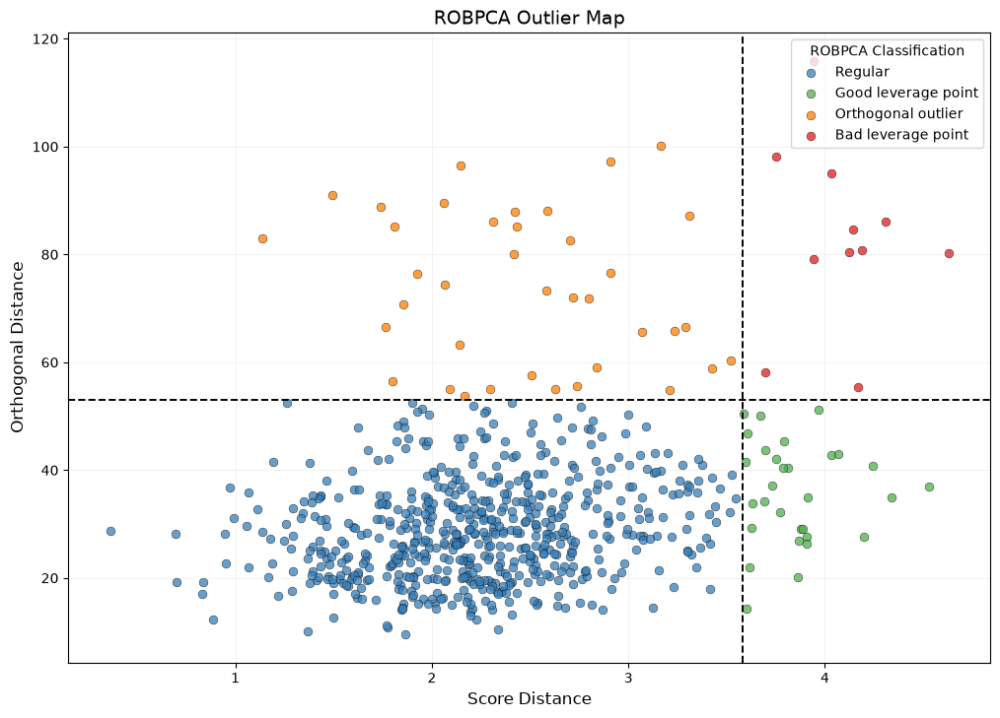

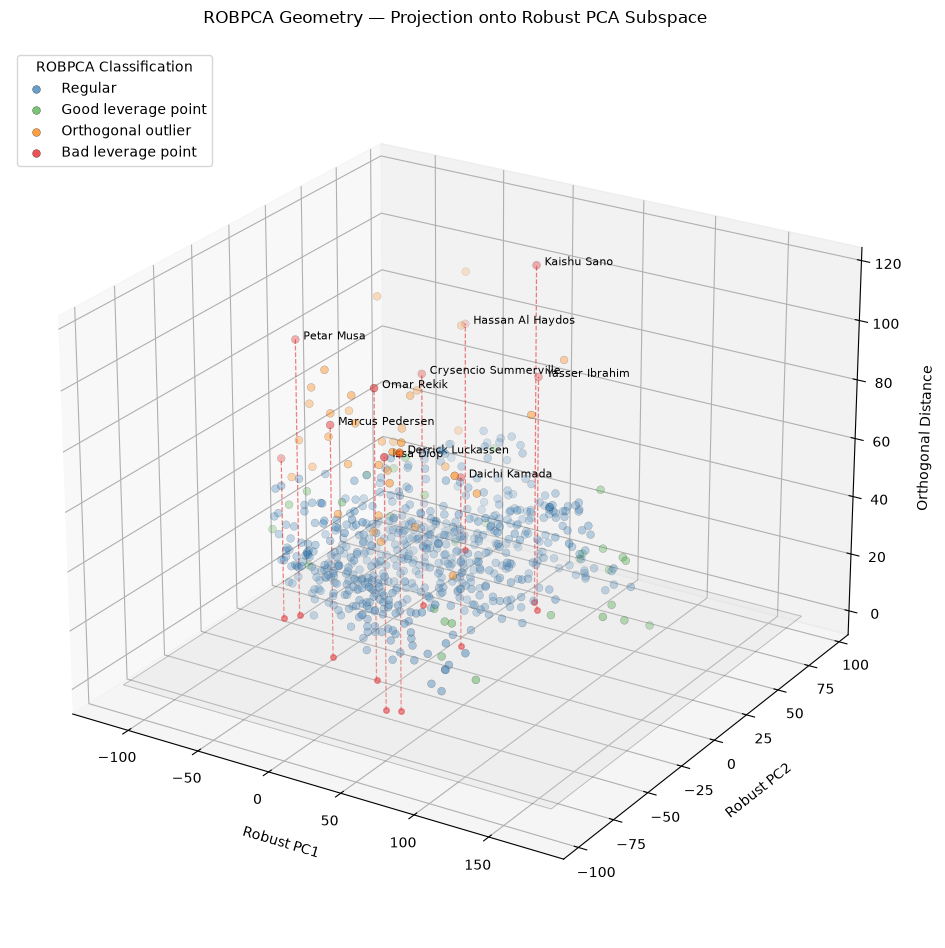


ROBPCA CLASSIFICATION SUMMARY


,classification,player_count,percentage
0,Regular,605,88.45
1,Good leverage point,30,4.39
2,Orthogonal outlier,38,5.56
3,Bad leverage point,11,1.61



PLAYING-TIME DIAGNOSTIC BY ROBPCA CATEGORY

Question:
  Are orthogonal outliers associated with substantially lower playing-time exposure?

Minutes source:
  world_cup_players_final

Primary statistic for interpretation:
  Median minutes



,robpca_classification,N,mean_minutes,median_minutes,Q1_minutes,Q3_minutes,minimum_minutes,maximum_minutes
0,Regular,605,267.23,254.0,166.00,349.0,61,750
1,Good leverage point,30,275.10,255.0,145.75,360.0,76,724
2,Orthogonal outlier,38,223.18,218.5,103.75,300.0,88,480
3,Bad leverage point,11,252.82,236.0,180.00,299.5,57,476



FOCUSED ROBPCA MINUTES COMPARISON

Median minutes — Regular:
  254.00

Median minutes — Good leverage point:
  255.00

Median minutes — Orthogonal outlier:
  218.50

Median minutes — Bad leverage point:
  236.00

Orthogonal outlier median minus Regular median:
  -35.50 minutes

Orthogonal median as proportion of Regular median:
  0.860
  (86.0%)

Orthogonal outlier median minus Good leverage median:
  -36.50 minutes

Orthogonal median as proportion of Good leverage median:
  0.857
  (85.7%)

FULL BAD LEVERAGE POINT TABLE

Bad leverage points: 11
Score-distance cutoff: 3.5822
Orthogonal-distance cutoff: 52.9911


,outlier_rank,sofascore_player,canonical_team_name,fbref_min,robpca_score_distance,robpca_orthogonal_distance,robust_PC1,robust_PC2,robpca_classification
0,1,Kaishu Sano,Japan,270,3.941552,115.875624,29.300396,48.943961,Bad leverage point
1,2,Omar Rekik,Tunisia,180,3.753260,98.189016,5.715954,-42.206722,Bad leverage point
2,3,Petar Musa,Croatia,110,4.033632,95.037424,-82.562501,-10.338376,Bad leverage point
3,4,Derrick Luckassen,Ghana,180,4.311013,86.021303,40.234258,-59.310033,Bad leverage point
4,5,Issa Diop,Morocco,476,4.141697,84.588739,32.274011,-61.789791,Bad leverage point
5,6,Yasser Ibrahim,Egypt,467,4.187239,80.816219,36.716732,43.048541,Bad leverage point
6,7,Crysencio Summerville,Netherlands,253,4.124287,80.359122,-26.372201,22.938444,Bad leverage point
7,8,Hassan Al Haydos,Qatar,57,4.628902,80.151311,-47.015794,75.812726,Bad leverage point
8,9,Marcus Pedersen,Norway,236,3.941513,79.167470,-33.192739,-34.496329,Bad leverage point
9,10,Daichi Kamada,Japan,329,3.694451,58.090268,23.952551,-0.272571,Bad leverage point



STEP 27 COMPLETE

Dataset used:
  world_cup_players_performance_complete_cases (pandas DataFrame)

Players analysed:
  684

Performance variables used:
  74

Regular observations:
  605

Good leverage points:
  30

Orthogonal outliers:
  38

Bad leverage points:
  11

Total flagged:
  79

Percentage flagged:
  11.55%

Minutes source:
  world_cup_players_final

Primary minutes diagnostic:
  minutes_by_robpca_category

Median comparison:
  robpca_minutes_median_comparison

DuckDB diagnostic tables:
  robpca_results_with_minutes
  minutes_by_robpca_category

IMPORTANT:
  No additional observations were removed by the playing-time diagnostic.
  The diagnostic only evaluates whether ROBPCA classification is associated with playing-time exposure.



In [34]:
# ============================================================
# STEP 27 — ROBUST PCA OUTLIER ASSESSMENT (ROBPCA)
# + PLAYING-TIME DIAGNOSTIC BY ROBPCA CATEGORY
# ============================================================
#
# Purpose:
#
#   Run ROBPCA on the complete-case performance dataset.
#
#   Produce:
#
#       1. ROBPCA Outlier Map
#
#          X = Score Distance
#          Y = Orthogonal Distance
#
#       2. Geometric ROBPCA projection visualization
#
#          X = Robust PC1
#          Y = Robust PC2
#          Z = Orthogonal Distance
#
#       3. Full Bad Leverage Point table
#
#       4. Minutes-played diagnostic by ROBPCA category:
#
#          - N
#          - Mean minutes
#          - Median minutes
#          - Q1
#          - Q3
#          - Minimum
#          - Maximum
#
#
# MAIN QUESTION OF NEW DIAGNOSTIC:
#
#   Are orthogonal outliers systematically associated
#   with substantially lower playing-time exposure?
#
#
# IMPORTANT:
#
#   This script DOES NOT remove orthogonal outliers.
#
#   It only evaluates whether ROBPCA classification is
#   associated with playing-time exposure.
#
#
# Published ROBPCA basis:
#
#   Hubert, M., Rousseeuw, P. J.,
#   & Vanden Branden, K. (2005)
#
#   "ROBPCA: A New Approach to Robust Principal
#   Component Analysis"
#
#
# Starting dataset:
#
#   world_cup_players_performance_complete_cases
#
#
# ROBPCA identification columns:
#
#   sofascore_player
#   canonical_team_name
#
#
# Minutes column:
#
#   fbref_min
#
#
# ============================================================


# ============================================================
# 1. INSTALL ROBPY IF NECESSARY
# ============================================================

import sys
import subprocess
import importlib.util


if importlib.util.find_spec("robpy") is None:

    subprocess.check_call(
        [
            sys.executable,
            "-m",
            "pip",
            "install",
            "robpy"
        ]
    )


# ============================================================
# 2. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

from robpy.pca.robpca import ROBPCA

from IPython.display import display


# ============================================================
# 3. FIX MATPLOTLIB FONT ISSUE
# ============================================================

matplotlib.rcParams[
    "font.enable_last_resort"
] = False


matplotlib.rcParams[
    "font.family"
] = "DejaVu Sans"


# ============================================================
# 4. SETTINGS
# ============================================================

PLAYER_COLUMN = (
    "sofascore_player"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


MINUTES_COLUMN = (
    "fbref_min"
)


IDENTIFIER_COLUMNS = [
    PLAYER_COLUMN,
    TEAM_COLUMN
]


# ============================================================
# 5. LOAD COMPLETE-CASE PERFORMANCE DATASET
# ============================================================

try:

    source_df = (
        world_cup_players_performance_complete_cases
        .copy()
    )

    SOURCE_NAME = (
        "world_cup_players_performance_complete_cases "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_performance_complete_cases
        """).df()

        SOURCE_NAME = (
            "world_cup_players_performance_complete_cases "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not find "
            "`world_cup_players_performance_complete_cases`."
        ) from exc


# ============================================================
# 6. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_identifier_columns = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in source_df.columns
]


if missing_identifier_columns:

    raise RuntimeError(
        "Missing required identification columns:\n"
        +
        "\n".join(
            missing_identifier_columns
        )
    )


# ============================================================
# 7. CREATE A CLEAN PLAYER-IDENTITY KEY
# ============================================================
#
# We use:
#
#   sofascore_player
#   canonical_team_name
#
# to attach fbref_min later.
#
# ============================================================

player_identity_df = (

    source_df[
        IDENTIFIER_COLUMNS
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 8. REMOVE KNOWN ZERO-VARIANCE VARIABLE
# ============================================================

ZERO_VARIANCE_COLUMNS_TO_REMOVE = [
    "squawka_other_goals_per_90"
]


removed_zero_variance_columns = []


for column in ZERO_VARIANCE_COLUMNS_TO_REMOVE:

    if column in source_df.columns:

        source_df = (
            source_df
            .drop(
                columns=[
                    column
                ]
            )
        )

        removed_zero_variance_columns.append(
            column
        )


# ============================================================
# 9. IDENTIFY ROBPCA PERFORMANCE VARIABLES
# ============================================================

pca_variables = [
    column
    for column
    in source_df.columns
    if column not in IDENTIFIER_COLUMNS
]


if len(pca_variables) == 0:

    raise RuntimeError(
        "No PCA performance variables were found."
    )


# ============================================================
# 10. IMPORTANT:
#     REMOVE MINUTES FROM ROBPCA IF PRESENT
# ============================================================
#
# fbref_min is being used only as a DIAGNOSTIC variable.
#
# It must NOT accidentally become a performance variable in
# the ROBPCA analysis.
#
# ============================================================

if MINUTES_COLUMN in pca_variables:

    pca_variables.remove(
        MINUTES_COLUMN
    )


# ============================================================
# 11. VERIFY PERFORMANCE VARIABLES ARE NUMERIC
# ============================================================

non_numeric_variables = [
    column
    for column
    in pca_variables
    if not pd.api.types.is_numeric_dtype(
        source_df[
            column
        ]
    )
]


if non_numeric_variables:

    raise RuntimeError(
        "Non-numeric PCA variables found:\n"
        +
        "\n".join(
            non_numeric_variables
        )
    )


# ============================================================
# 12. CREATE ROBPCA MATRIX
# ============================================================

X_df = (
    source_df[
        pca_variables
    ]
    .copy()
)


X_df = (
    X_df
    .replace(
        [
            np.inf,
            -np.inf
        ],
        np.nan
    )
)


# ============================================================
# 13. VERIFY NO MISSING VALUES REMAIN
# ============================================================

missing_count = int(
    X_df
    .isna()
    .sum()
    .sum()
)


if missing_count > 0:

    missing_by_variable = (
        X_df
        .isna()
        .sum()
    )


    missing_by_variable = (
        missing_by_variable[
            missing_by_variable > 0
        ]
        .sort_values(
            ascending=False
        )
    )


    display(
        missing_by_variable
        .rename(
            "missing_count"
        )
        .to_frame()
    )


    raise RuntimeError(
        "The ROBPCA matrix still contains missing "
        "or infinite values."
    )


# ============================================================
# 14. CHECK FOR ADDITIONAL ZERO-VARIANCE VARIABLES
# ============================================================

additional_zero_variance_variables = [
    column
    for column
    in pca_variables
    if X_df[
        column
    ].nunique(
        dropna=True
    ) <= 1
]


if additional_zero_variance_variables:

    print(
        "\nAdditional zero-variance variables found:"
    )


    for variable in additional_zero_variance_variables:

        print(
            f"  {variable}"
        )


    raise RuntimeError(
        "Additional zero-variance variables remain."
    )


# ============================================================
# 15. CONVERT TO NUMPY MATRIX
# ============================================================

X = (
    X_df
    .to_numpy(
        dtype=float
    )
)


N = X.shape[
    0
]


p = X.shape[
    1
]


# ============================================================
# 16. RUN ROBPCA
# ============================================================

robpca_model = ROBPCA(
    n_components=None,
    k_min_var_explained=0.80,
    alpha=0.75,
    final_MCD_step=True,
    random_seed=42
)


robpca_model.fit(
    X
)


# ============================================================
# 17. OBTAIN SCORE DISTANCE AND ORTHOGONAL DISTANCE
# ============================================================

(
    score_distances,
    orthogonal_distances,
    score_distance_cutoff,
    orthogonal_distance_cutoff
) = robpca_model.plot_outlier_map(
    X,
    return_distances=True
)


plt.close(
    "all"
)


score_distances = (
    np.asarray(
        score_distances
    )
    .reshape(
        -1
    )
)


orthogonal_distances = (
    np.asarray(
        orthogonal_distances
    )
    .reshape(
        -1
    )
)


score_distance_cutoff = float(
    score_distance_cutoff
)


orthogonal_distance_cutoff = float(
    orthogonal_distance_cutoff
)


# ============================================================
# 18. CLASSIFY EACH OBSERVATION
# ============================================================

def classify_robpca_observation(
    score_distance,
    orthogonal_distance
):

    high_score_distance = (
        score_distance
        > score_distance_cutoff
    )


    high_orthogonal_distance = (
        orthogonal_distance
        > orthogonal_distance_cutoff
    )


    if (
        not high_score_distance
        and
        not high_orthogonal_distance
    ):

        return (
            "Regular"
        )


    elif (
        high_score_distance
        and
        not high_orthogonal_distance
    ):

        return (
            "Good leverage point"
        )


    elif (
        not high_score_distance
        and
        high_orthogonal_distance
    ):

        return (
            "Orthogonal outlier"
        )


    else:

        return (
            "Bad leverage point"
        )


# ============================================================
# 19. CREATE PLAYER-LEVEL ROBPCA RESULTS
# ============================================================

robpca_results = (
    player_identity_df
    .copy()
    .reset_index(
        drop=True
    )
)


robpca_results[
    "robpca_score_distance"
] = (
    score_distances
)


robpca_results[
    "robpca_orthogonal_distance"
] = (
    orthogonal_distances
)


robpca_results[
    "robpca_classification"
] = [

    classify_robpca_observation(
        score_distance,
        orthogonal_distance
    )

    for (
        score_distance,
        orthogonal_distance
    )

    in zip(
        score_distances,
        orthogonal_distances
    )
]


# ============================================================
# 20. FUNCTION — CREATE SAFE MINUTES LOOKUP
# ============================================================
#
# Purpose:
#
#   Create one fbref_min value for each:
#
#       player + team
#
#   If duplicate player/team combinations contain conflicting
#   minute values, STOP instead of silently choosing one.
#
# ============================================================

def create_minutes_lookup(
    candidate_df,
    source_name
):

    required_columns = [
        PLAYER_COLUMN,
        TEAM_COLUMN,
        MINUTES_COLUMN
    ]


    if not all(
        column in candidate_df.columns
        for column in required_columns
    ):

        return None


    lookup = (

        candidate_df[
            required_columns
        ]

        .copy()
    )


    lookup[
        MINUTES_COLUMN
    ] = pd.to_numeric(
        lookup[
            MINUTES_COLUMN
        ],
        errors="coerce"
    )


    # --------------------------------------------------------
    # Check duplicate key consistency
    # --------------------------------------------------------

    duplicate_consistency = (

        lookup

        .groupby(
            [
                PLAYER_COLUMN,
                TEAM_COLUMN
            ],
            dropna=False
        )[
            MINUTES_COLUMN
        ]

        .nunique(
            dropna=False
        )
    )


    conflicting_keys = (
        duplicate_consistency[
            duplicate_consistency > 1
        ]
    )


    if len(
        conflicting_keys
    ) > 0:

        raise RuntimeError(
            "Conflicting minutes values were found for the "
            "same player/team combination in:\n\n"
            f"  {source_name}\n\n"
            "Do not attach minutes until these conflicts "
            "have been resolved."
        )


    lookup = (

        lookup

        .drop_duplicates(
            subset=[
                PLAYER_COLUMN,
                TEAM_COLUMN
            ]
        )

        .reset_index(
            drop=True
        )
    )


    return lookup


# ============================================================
# 21. ATTACH MINUTES TO ROBPCA RESULTS
# ============================================================
#
# Priority:
#
#   1. source_df itself, if fbref_min exists
#
#   2. world_cup_players_final
#
#   3. other likely aligned DataFrames
#
#   4. DuckDB fallback
#
#
# IMPORTANT:
#
# fbref_min is NOT used to fit ROBPCA.
#
# ============================================================

minutes_lookup = None

MINUTES_SOURCE_NAME = None


# ------------------------------------------------------------
# Candidate pandas DataFrames
# ------------------------------------------------------------

POSSIBLE_MINUTES_DATAFRAMES = [

    (
        "source_df",
        source_df
    )
]


possible_global_dataframe_names = [

    "world_cup_players_final",

    "world_cup_players_performance_only",

    "world_cup_players_performance_complete_cases",

    "world_cup_players_master_three_source_per90_no_gk",

    "world_cup_players_master_three_source_per90"
]


for dataframe_name in possible_global_dataframe_names:

    if dataframe_name in globals():

        candidate_object = globals()[
            dataframe_name
        ]


        if isinstance(
            candidate_object,
            pd.DataFrame
        ):

            POSSIBLE_MINUTES_DATAFRAMES.append(
                (
                    dataframe_name,
                    candidate_object
                )
            )


for (
    dataframe_name,
    candidate_dataframe
) in POSSIBLE_MINUTES_DATAFRAMES:

    candidate_lookup = (
        create_minutes_lookup(
            candidate_dataframe,
            dataframe_name
        )
    )


    if candidate_lookup is None:

        continue


    test_merge = (

        robpca_results[
            [
                PLAYER_COLUMN,
                TEAM_COLUMN
            ]
        ]

        .merge(
            candidate_lookup,
            on=[
                PLAYER_COLUMN,
                TEAM_COLUMN
            ],
            how="left",
            validate="one_to_one"
        )
    )


    recovered_minutes = int(
        test_merge[
            MINUTES_COLUMN
        ]
        .notna()
        .sum()
    )


    if recovered_minutes == len(
        robpca_results
    ):

        minutes_lookup = (
            candidate_lookup
        )


        MINUTES_SOURCE_NAME = (
            dataframe_name
        )


        break


# ------------------------------------------------------------
# DuckDB fallback
# ------------------------------------------------------------

if minutes_lookup is None:

    try:

        available_objects = set(
            con.sql("""
                SELECT table_name
                FROM information_schema.tables

                UNION

                SELECT table_name
                FROM information_schema.views
            """).df()[
                "table_name"
            ].tolist()
        )


        POSSIBLE_MINUTES_TABLES = [

            "world_cup_players_final",

            "world_cup_players_performance_only",

            "world_cup_players_performance_complete_cases",

            "world_cup_players_master_three_source_per90_no_gk",

            "world_cup_players_master_three_source_per90"
        ]


        for table_name in POSSIBLE_MINUTES_TABLES:

            if table_name not in available_objects:

                continue


            table_columns = con.sql(
                f"""
                DESCRIBE "{table_name}"
                """
            ).df()[
                "column_name"
            ].tolist()


            required_minutes_columns = [
                PLAYER_COLUMN,
                TEAM_COLUMN,
                MINUTES_COLUMN
            ]


            if not all(
                column in table_columns
                for column in required_minutes_columns
            ):

                continue


            candidate_dataframe = con.sql(
                f"""
                SELECT
                    "{PLAYER_COLUMN}",
                    "{TEAM_COLUMN}",
                    "{MINUTES_COLUMN}"

                FROM "{table_name}"
                """
            ).df()


            candidate_lookup = (
                create_minutes_lookup(
                    candidate_dataframe,
                    f"{table_name} (DuckDB)"
                )
            )


            test_merge = (

                robpca_results[
                    [
                        PLAYER_COLUMN,
                        TEAM_COLUMN
                    ]
                ]

                .merge(
                    candidate_lookup,
                    on=[
                        PLAYER_COLUMN,
                        TEAM_COLUMN
                    ],
                    how="left",
                    validate="one_to_one"
                )
            )


            recovered_minutes = int(
                test_merge[
                    MINUTES_COLUMN
                ]
                .notna()
                .sum()
            )


            if recovered_minutes == len(
                robpca_results
            ):

                minutes_lookup = (
                    candidate_lookup
                )


                MINUTES_SOURCE_NAME = (
                    f"{table_name} (DuckDB)"
                )


                break


    except Exception:

        pass


# ============================================================
# 22. REQUIRE MINUTES FOR THIS DIAGNOSTIC
# ============================================================

if minutes_lookup is None:

    raise RuntimeError(
        "ROBPCA completed, but `fbref_min` could not be "
        "matched to every ROBPCA observation.\n\n"
        "The new playing-time diagnostic therefore cannot "
        "be performed safely."
    )


# ============================================================
# 23. MERGE MINUTES INTO ROBPCA RESULTS
# ============================================================

robpca_results = (

    robpca_results

    .merge(
        minutes_lookup,
        on=[
            PLAYER_COLUMN,
            TEAM_COLUMN
        ],
        how="left",
        validate="one_to_one"
    )
)


robpca_results[
    MINUTES_COLUMN
] = pd.to_numeric(
    robpca_results[
        MINUTES_COLUMN
    ],
    errors="coerce"
)


missing_minutes_after_merge = int(
    robpca_results[
        MINUTES_COLUMN
    ]
    .isna()
    .sum()
)


if missing_minutes_after_merge > 0:

    raise RuntimeError(
        "Some ROBPCA observations are still missing minutes "
        "after the merge.\n\n"
        f"Missing minutes: "
        f"{missing_minutes_after_merge:,}"
    )


print(
    "\nMinutes successfully attached from:"
)


print(
    f"  {MINUTES_SOURCE_NAME}"
)


# ============================================================
# 24. DEFINE COLORS
# ============================================================

CLASS_COLORS = {

    "Regular":
        "#377eb8",

    "Good leverage point":
        "#4daf4a",

    "Orthogonal outlier":
        "#ff7f00",

    "Bad leverage point":
        "#e41a1c"
}


CLASS_ORDER = [

    "Regular",

    "Good leverage point",

    "Orthogonal outlier",

    "Bad leverage point"
]


# ============================================================
# 25. GRAPH 1 — ROBPCA OUTLIER MAP
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        8
    )
)


for classification in CLASS_ORDER:

    mask = (
        robpca_results[
            "robpca_classification"
        ]
        == classification
    )


    ax.scatter(
        robpca_results.loc[
            mask,
            "robpca_score_distance"
        ],

        robpca_results.loc[
            mask,
            "robpca_orthogonal_distance"
        ],

        label=classification,

        color=CLASS_COLORS[
            classification
        ],

        s=40,

        alpha=0.75,

        edgecolors="black",

        linewidths=0.35
    )


ax.axvline(
    x=score_distance_cutoff,
    color="black",
    linestyle="--",
    linewidth=1.4
)


ax.axhline(
    y=orthogonal_distance_cutoff,
    color="black",
    linestyle="--",
    linewidth=1.4
)


ax.set_xlabel(
    "Score Distance",
    fontsize=12
)


ax.set_ylabel(
    "Orthogonal Distance",
    fontsize=12
)


ax.set_title(
    "ROBPCA Outlier Map",
    fontsize=14
)


ax.legend(
    title="ROBPCA Classification",
    loc="upper right"
)


ax.grid(
    alpha=0.15
)


fig.subplots_adjust(
    left=0.11,
    right=0.96,
    bottom=0.11,
    top=0.91
)


plt.show()


# ============================================================
# 26. OBTAIN ROBUST COMPONENT SCORES
# ============================================================

robust_scores = (
    robpca_model
    .transform(
        X
    )
)


robust_scores = (
    np.asarray(
        robust_scores
    )
)


# ============================================================
# 27. VERIFY AT LEAST TWO COMPONENTS EXIST
# ============================================================

if robust_scores.shape[
    1
] < 2:

    raise RuntimeError(
        "ROBPCA retained fewer than two components, so the "
        "geometric ROBPCA visualization cannot be created."
    )


# ============================================================
# 28. ADD ROBUST PC1 AND PC2 SCORES
# ============================================================

robpca_results[
    "robust_PC1"
] = (
    robust_scores[
        :,
        0
    ]
)


robpca_results[
    "robust_PC2"
] = (
    robust_scores[
        :,
        1
    ]
)


# ============================================================
# 29. CREATE BAD LEVERAGE POINT TABLE
# ============================================================

bad_leverage_points = (
    robpca_results[
        robpca_results[
            "robpca_classification"
        ]
        == "Bad leverage point"
    ]
    .copy()
)


bad_leverage_points = (
    bad_leverage_points
    .sort_values(
        by=[
            "robpca_orthogonal_distance",
            "robpca_score_distance"
        ],
        ascending=[
            False,
            False
        ]
    )
    .reset_index(
        drop=True
    )
)


bad_leverage_points.insert(
    0,
    "outlier_rank",
    range(
        1,
        len(
            bad_leverage_points
        )
        + 1
    )
)


# ============================================================
# 30. GRAPH 2 — GEOMETRIC ROBPCA PROJECTION
# ============================================================

fig = plt.figure(
    figsize=(
        13,
        10
    )
)


ax = fig.add_subplot(
    111,
    projection="3d"
)


# ============================================================
# 31. DEFINE ROBUST PCA PLANE
# ============================================================

pc1_min = (
    robpca_results[
        "robust_PC1"
    ]
    .min()
)


pc1_max = (
    robpca_results[
        "robust_PC1"
    ]
    .max()
)


pc2_min = (
    robpca_results[
        "robust_PC2"
    ]
    .min()
)


pc2_max = (
    robpca_results[
        "robust_PC2"
    ]
    .max()
)


pc1_padding = (
    (
        pc1_max
        - pc1_min
    )
    * 0.08
)


pc2_padding = (
    (
        pc2_max
        - pc2_min
    )
    * 0.08
)


plane_x = np.linspace(
    pc1_min - pc1_padding,
    pc1_max + pc1_padding,
    2
)


plane_y = np.linspace(
    pc2_min - pc2_padding,
    pc2_max + pc2_padding,
    2
)


plane_X, plane_Y = np.meshgrid(
    plane_x,
    plane_y
)


plane_Z = np.zeros_like(
    plane_X
)


# ============================================================
# 32. DRAW ROBUST PCA PLANE
# ============================================================

ax.plot_surface(
    plane_X,
    plane_Y,
    plane_Z,

    color="#d9d9d9",

    alpha=0.22,

    edgecolor="black",

    linewidth=0.7,

    shade=False
)


# ============================================================
# 33. PLOT ALL OBSERVATIONS
# ============================================================

for classification in CLASS_ORDER:

    mask = (
        robpca_results[
            "robpca_classification"
        ]
        == classification
    )


    ax.scatter(
        robpca_results.loc[
            mask,
            "robust_PC1"
        ],

        robpca_results.loc[
            mask,
            "robust_PC2"
        ],

        robpca_results.loc[
            mask,
            "robpca_orthogonal_distance"
        ],

        color=CLASS_COLORS[
            classification
        ],

        label=classification,

        s=32,

        alpha=0.75,

        edgecolors="black",

        linewidths=0.25
    )


# ============================================================
# 34. DRAW PROJECTION LINES FOR BAD LEVERAGE POINTS
# ============================================================

for _, row in bad_leverage_points.iterrows():

    x_value = (
        row[
            "robust_PC1"
        ]
    )

    y_value = (
        row[
            "robust_PC2"
        ]
    )

    z_value = (
        row[
            "robpca_orthogonal_distance"
        ]
    )


    ax.plot(
        [
            x_value,
            x_value
        ],

        [
            y_value,
            y_value
        ],

        [
            0,
            z_value
        ],

        linestyle="--",

        color=CLASS_COLORS[
            "Bad leverage point"
        ],

        linewidth=0.9,

        alpha=0.55
    )


    ax.scatter(
        [
            x_value
        ],

        [
            y_value
        ],

        [
            0
        ],

        color=CLASS_COLORS[
            "Bad leverage point"
        ],

        s=16,

        alpha=0.75
    )


# ============================================================
# 35. LABEL MOST EXTREME BAD LEVERAGE POINTS
# ============================================================

NUMBER_TO_LABEL = (
    10
)


bad_leverage_to_label = (
    bad_leverage_points
    .head(
        NUMBER_TO_LABEL
    )
)


for _, row in bad_leverage_to_label.iterrows():

    ax.text(
        row[
            "robust_PC1"
        ],

        row[
            "robust_PC2"
        ],

        row[
            "robpca_orthogonal_distance"
        ],

        "  "
        + str(
            row[
                PLAYER_COLUMN
            ]
        ),

        fontsize=8,

        color="black"
    )


# ============================================================
# 36. FORMAT GEOMETRIC ROBPCA PLOT
# ============================================================

ax.set_xlabel(
    "Robust PC1",
    labelpad=10
)


ax.set_ylabel(
    "Robust PC2",
    labelpad=10
)


ax.set_zlabel(
    "Orthogonal Distance",
    labelpad=10
)


ax.set_title(
    "ROBPCA Geometry — Projection onto Robust PCA Subspace",
    pad=18
)


ax.legend(
    title="ROBPCA Classification",
    loc="upper left"
)


ax.view_init(
    elev=24,
    azim=-58
)


fig.subplots_adjust(
    left=0.02,
    right=0.90,
    bottom=0.03,
    top=0.92
)


plt.show()


# ============================================================
# 37. CREATE CLASSIFICATION SUMMARY
# ============================================================

classification_counts = (
    robpca_results[
        "robpca_classification"
    ]
    .value_counts()
    .reindex(
        CLASS_ORDER,
        fill_value=0
    )
    .rename_axis(
        "classification"
    )
    .reset_index(
        name="player_count"
    )
)


classification_counts[
    "percentage"
] = (
    classification_counts[
        "player_count"
    ]
    / len(
        robpca_results
    )
    * 100
)


classification_counts[
    "percentage"
] = (
    classification_counts[
        "percentage"
    ]
    .round(
        2
    )
)


# ============================================================
# 38. PRINT CLASSIFICATION SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "ROBPCA CLASSIFICATION SUMMARY"
)


print(
    "=" * 100
)


display(
    classification_counts
)


# ============================================================
# 39. NEW ANALYSIS:
#     MINUTES PLAYED BY ROBPCA CATEGORY
# ============================================================
#
# This is the focused diagnostic we agreed on.
#
# For each ROBPCA category report:
#
#   N
#   Mean
#   Median
#   Q1
#   Q3
#   Minimum
#   Maximum
#
#
# PRIMARY descriptive quantity:
#
#   MEDIAN MINUTES
#
# because playing-time distributions can be strongly skewed.
#
# ============================================================

minutes_by_robpca_category = (

    robpca_results

    .groupby(
        "robpca_classification"
    )[
        MINUTES_COLUMN
    ]

    .agg(
        N="count",

        mean_minutes="mean",

        median_minutes="median",

        minimum_minutes="min",

        maximum_minutes="max"
    )

    .reset_index()
)


# ------------------------------------------------------------
# Add Q1
# ------------------------------------------------------------

q1_minutes = (

    robpca_results

    .groupby(
        "robpca_classification"
    )[
        MINUTES_COLUMN
    ]

    .quantile(
        0.25
    )

    .rename(
        "Q1_minutes"
    )

    .reset_index()
)


# ------------------------------------------------------------
# Add Q3
# ------------------------------------------------------------

q3_minutes = (

    robpca_results

    .groupby(
        "robpca_classification"
    )[
        MINUTES_COLUMN
    ]

    .quantile(
        0.75
    )

    .rename(
        "Q3_minutes"
    )

    .reset_index()
)


minutes_by_robpca_category = (

    minutes_by_robpca_category

    .merge(
        q1_minutes,
        on="robpca_classification",
        how="left"
    )

    .merge(
        q3_minutes,
        on="robpca_classification",
        how="left"
    )
)


# ============================================================
# 40. REORDER COLUMNS
# ============================================================

minutes_by_robpca_category = (

    minutes_by_robpca_category[
        [
            "robpca_classification",
            "N",
            "mean_minutes",
            "median_minutes",
            "Q1_minutes",
            "Q3_minutes",
            "minimum_minutes",
            "maximum_minutes"
        ]
    ]
)


# ============================================================
# 41. ORDER ROBPCA CATEGORIES CONSISTENTLY
# ============================================================

minutes_by_robpca_category[
    "robpca_classification"
] = pd.Categorical(
    minutes_by_robpca_category[
        "robpca_classification"
    ],
    categories=CLASS_ORDER,
    ordered=True
)


minutes_by_robpca_category = (

    minutes_by_robpca_category

    .sort_values(
        "robpca_classification"
    )

    .reset_index(
        drop=True
    )
)


# ============================================================
# 42. ROUND DESCRIPTIVE STATISTICS
# ============================================================

minutes_columns_to_round = [

    "mean_minutes",

    "median_minutes",

    "Q1_minutes",

    "Q3_minutes",

    "minimum_minutes",

    "maximum_minutes"
]


minutes_by_robpca_category[
    minutes_columns_to_round
] = (

    minutes_by_robpca_category[
        minutes_columns_to_round
    ]

    .round(
        2
    )
)


# ============================================================
# 43. PRINT MINUTES DIAGNOSTIC
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "PLAYING-TIME DIAGNOSTIC BY ROBPCA CATEGORY"
)


print(
    "=" * 120
)


print(
    "\nQuestion:"
)


print(
    "  Are orthogonal outliers associated with "
    "substantially lower playing-time exposure?"
)


print(
    "\nMinutes source:"
)


print(
    f"  {MINUTES_SOURCE_NAME}"
)


print(
    "\nPrimary statistic for interpretation:"
)


print(
    "  Median minutes"
)


print()


display(
    minutes_by_robpca_category
)


# ============================================================
# 44. FOCUSED MEDIAN COMPARISON
# ============================================================
#
# We compare:
#
#   Orthogonal outliers
#
# against:
#
#   Regular observations
#
# and:
#
#   Good leverage points
#
#
# No hypothesis test is performed here.
#
# This is deliberately a descriptive diagnostic.
#
# ============================================================

def get_category_median(
    category_name
):

    matching_rows = (

        minutes_by_robpca_category[
            minutes_by_robpca_category[
                "robpca_classification"
            ]
            ==
            category_name
        ]
    )


    if matching_rows.empty:

        return np.nan


    return float(
        matching_rows.iloc[
            0
        ][
            "median_minutes"
        ]
    )


regular_median_minutes = (
    get_category_median(
        "Regular"
    )
)


good_leverage_median_minutes = (
    get_category_median(
        "Good leverage point"
    )
)


orthogonal_median_minutes = (
    get_category_median(
        "Orthogonal outlier"
    )
)


bad_leverage_median_minutes = (
    get_category_median(
        "Bad leverage point"
    )
)


# ============================================================
# 45. CALCULATE DESCRIPTIVE DIFFERENCES
# ============================================================

orthogonal_vs_regular_difference = np.nan


orthogonal_vs_good_difference = np.nan


orthogonal_vs_regular_ratio = np.nan


orthogonal_vs_good_ratio = np.nan


if (
    np.isfinite(
        orthogonal_median_minutes
    )
    and
    np.isfinite(
        regular_median_minutes
    )
):

    orthogonal_vs_regular_difference = (
        orthogonal_median_minutes
        -
        regular_median_minutes
    )


    if regular_median_minutes != 0:

        orthogonal_vs_regular_ratio = (
            orthogonal_median_minutes
            /
            regular_median_minutes
        )


if (
    np.isfinite(
        orthogonal_median_minutes
    )
    and
    np.isfinite(
        good_leverage_median_minutes
    )
):

    orthogonal_vs_good_difference = (
        orthogonal_median_minutes
        -
        good_leverage_median_minutes
    )


    if good_leverage_median_minutes != 0:

        orthogonal_vs_good_ratio = (
            orthogonal_median_minutes
            /
            good_leverage_median_minutes
        )


# ============================================================
# 46. PRINT FOCUSED MEDIAN RESULTS
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "FOCUSED ROBPCA MINUTES COMPARISON"
)


print(
    "=" * 120
)


print(
    "\nMedian minutes — Regular:"
)


if np.isfinite(
    regular_median_minutes
):

    print(
        f"  {regular_median_minutes:,.2f}"
    )

else:

    print(
        "  Category not present"
    )


print(
    "\nMedian minutes — Good leverage point:"
)


if np.isfinite(
    good_leverage_median_minutes
):

    print(
        f"  {good_leverage_median_minutes:,.2f}"
    )

else:

    print(
        "  Category not present"
    )


print(
    "\nMedian minutes — Orthogonal outlier:"
)


if np.isfinite(
    orthogonal_median_minutes
):

    print(
        f"  {orthogonal_median_minutes:,.2f}"
    )

else:

    print(
        "  Category not present"
    )


print(
    "\nMedian minutes — Bad leverage point:"
)


if np.isfinite(
    bad_leverage_median_minutes
):

    print(
        f"  {bad_leverage_median_minutes:,.2f}"
    )

else:

    print(
        "  Category not present"
    )


# ------------------------------------------------------------
# Orthogonal vs Regular
# ------------------------------------------------------------

if np.isfinite(
    orthogonal_vs_regular_difference
):

    print(
        "\nOrthogonal outlier median minus "
        "Regular median:"
    )


    print(
        f"  "
        f"{orthogonal_vs_regular_difference:,.2f} minutes"
    )


if np.isfinite(
    orthogonal_vs_regular_ratio
):

    print(
        "\nOrthogonal median as proportion "
        "of Regular median:"
    )


    print(
        f"  "
        f"{orthogonal_vs_regular_ratio:.3f}"
    )


    print(
        f"  "
        f"({orthogonal_vs_regular_ratio * 100:.1f}%)"
    )


# ------------------------------------------------------------
# Orthogonal vs Good Leverage
# ------------------------------------------------------------

if np.isfinite(
    orthogonal_vs_good_difference
):

    print(
        "\nOrthogonal outlier median minus "
        "Good leverage median:"
    )


    print(
        f"  "
        f"{orthogonal_vs_good_difference:,.2f} minutes"
    )


if np.isfinite(
    orthogonal_vs_good_ratio
):

    print(
        "\nOrthogonal median as proportion "
        "of Good leverage median:"
    )


    print(
        f"  "
        f"{orthogonal_vs_good_ratio:.3f}"
    )


    print(
        f"  "
        f"({orthogonal_vs_good_ratio * 100:.1f}%)"
    )


# ============================================================
# 47. CREATE SMALL MEDIAN-COMPARISON TABLE
# ============================================================

robpca_minutes_median_comparison = pd.DataFrame(
    [
        {
            "robpca_classification":
                "Regular",

            "median_minutes":
                regular_median_minutes
        },

        {
            "robpca_classification":
                "Good leverage point",

            "median_minutes":
                good_leverage_median_minutes
        },

        {
            "robpca_classification":
                "Orthogonal outlier",

            "median_minutes":
                orthogonal_median_minutes
        },

        {
            "robpca_classification":
                "Bad leverage point",

            "median_minutes":
                bad_leverage_median_minutes
        }
    ]
)


# ============================================================
# 48. PRINT FULL BAD LEVERAGE POINT TABLE
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "FULL BAD LEVERAGE POINT TABLE"
)


print(
    "=" * 120
)


print(
    f"\nBad leverage points: "
    f"{len(bad_leverage_points):,}"
)


print(
    f"Score-distance cutoff: "
    f"{score_distance_cutoff:.4f}"
)


print(
    f"Orthogonal-distance cutoff: "
    f"{orthogonal_distance_cutoff:.4f}"
)


previous_max_rows = pd.get_option(
    "display.max_rows"
)


previous_max_columns = pd.get_option(
    "display.max_columns"
)


previous_width = pd.get_option(
    "display.width"
)


previous_max_colwidth = pd.get_option(
    "display.max_colwidth"
)


pd.set_option(
    "display.max_rows",
    None
)


pd.set_option(
    "display.max_columns",
    None
)


pd.set_option(
    "display.width",
    300
)


pd.set_option(
    "display.max_colwidth",
    None
)


display(
    bad_leverage_points[
        [
            "outlier_rank",
            PLAYER_COLUMN,
            TEAM_COLUMN,
            MINUTES_COLUMN,
            "robpca_score_distance",
            "robpca_orthogonal_distance",
            "robust_PC1",
            "robust_PC2",
            "robpca_classification"
        ]
    ]
)


pd.set_option(
    "display.max_rows",
    previous_max_rows
)


pd.set_option(
    "display.max_columns",
    previous_max_columns
)


pd.set_option(
    "display.width",
    previous_width
)


pd.set_option(
    "display.max_colwidth",
    previous_max_colwidth
)


# ============================================================
# 49. SAVE DIAGNOSTIC TABLES TO DUCKDB IF AVAILABLE
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    # --------------------------------------------------------
    # Full ROBPCA results including minutes
    # --------------------------------------------------------

    try:

        con.unregister(
            "robpca_results_with_minutes_df"
        )

    except Exception:

        pass


    con.register(
        "robpca_results_with_minutes_df",
        robpca_results
    )


    con.sql("""
        CREATE OR REPLACE TABLE
            robpca_results_with_minutes
        AS

        SELECT *
        FROM
            robpca_results_with_minutes_df
    """)


    # --------------------------------------------------------
    # Minutes summary
    # --------------------------------------------------------

    try:

        con.unregister(
            "minutes_by_robpca_category_df"
        )

    except Exception:

        pass


    con.register(
        "minutes_by_robpca_category_df",
        minutes_by_robpca_category
    )


    con.sql("""
        CREATE OR REPLACE TABLE
            minutes_by_robpca_category
        AS

        SELECT *
        FROM
            minutes_by_robpca_category_df
    """)


# ============================================================
# 50. FINAL COUNTS
# ============================================================

regular_count = int(
    (
        robpca_results[
            "robpca_classification"
        ]
        == "Regular"
    )
    .sum()
)


good_leverage_count = int(
    (
        robpca_results[
            "robpca_classification"
        ]
        == "Good leverage point"
    )
    .sum()
)


orthogonal_outlier_count = int(
    (
        robpca_results[
            "robpca_classification"
        ]
        == "Orthogonal outlier"
    )
    .sum()
)


bad_leverage_count = int(
    (
        robpca_results[
            "robpca_classification"
        ]
        == "Bad leverage point"
    )
    .sum()
)


total_flagged = (
    good_leverage_count
    + orthogonal_outlier_count
    + bad_leverage_count
)


percentage_flagged = (
    total_flagged
    / N
    * 100
)


# ============================================================
# 51. FINAL STEP 27 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "STEP 27 COMPLETE"
)


print(
    "=" * 100
)


print(
    "\nDataset used:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nPlayers analysed:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables used:"
)


print(
    f"  {p:,}"
)


print(
    "\nRegular observations:"
)


print(
    f"  {regular_count:,}"
)


print(
    "\nGood leverage points:"
)


print(
    f"  {good_leverage_count:,}"
)


print(
    "\nOrthogonal outliers:"
)


print(
    f"  {orthogonal_outlier_count:,}"
)


print(
    "\nBad leverage points:"
)


print(
    f"  {bad_leverage_count:,}"
)


print(
    "\nTotal flagged:"
)


print(
    f"  {total_flagged:,}"
)


print(
    "\nPercentage flagged:"
)


print(
    f"  {percentage_flagged:.2f}%"
)


print(
    "\nMinutes source:"
)


print(
    f"  {MINUTES_SOURCE_NAME}"
)


print(
    "\nPrimary minutes diagnostic:"
)


print(
    "  minutes_by_robpca_category"
)


print(
    "\nMedian comparison:"
)


print(
    "  robpca_minutes_median_comparison"
)


if duckdb_available:

    print(
        "\nDuckDB diagnostic tables:"
    )


    print(
        "  robpca_results_with_minutes"
    )


    print(
        "  minutes_by_robpca_category"
    )


print(
    "\nIMPORTANT:"
)


print(
    "  No additional observations were removed by the "
    "playing-time diagnostic."
)


print(
    "  The diagnostic only evaluates whether ROBPCA "
    "classification is associated with playing-time exposure."
)


print(
    "\n"
    + "=" * 100
)

### 28. Remove Bad Leverage Points & Orthogonal Outliers from Main Dataset

In [35]:
### Removing Bad Leverage Points from ROBPCA is a common practice

In [36]:
# ============================================================
# STEP 28 — REMOVE BAD LEVERAGE POINTS ONLY
# ============================================================
#
# Purpose:
#
#   Remove only observations classified by ROBPCA as:
#
#       "Bad leverage point"
#
#
# Retain:
#
#       "Regular"
#       "Good leverage point"
#       "Orthogonal outlier"
#
#
# Rationale:
#
#   Bad leverage points are unusual both in their position
#   within the PCA subspace and in their orthogonal distance
#   from that subspace. They are therefore treated as the
#   strongest multivariate outlier class identified by ROBPCA.
#
#   Orthogonal outliers are retained in this version so their
#   influence can be evaluated separately rather than removing
#   both ROBPCA outlier classes simultaneously.
#
#
# Starting dataset:
#
#   world_cup_players_performance_complete_cases
#
#
# ROBPCA results required:
#
#   robpca_results
#
#
# Output DataFrame:
#
#   world_cup_players_performance_robpca_clean
#
#
# Output DuckDB table:
#
#   world_cup_players_performance_robpca_clean
#
#
# Output CSV:
#
#   2026_World_Cup_Player_Performance_ROBPCA_Clean.csv
#
#
# NOTE:
#
#   Output object names are intentionally kept unchanged so
#   downstream scripts continue to run automatically.
#
#
# ROBPCA decision rule:
#
#   KEEP:
#
#       Regular
#       Good leverage point
#       Orthogonal outlier
#
#
#   REMOVE:
#
#       Bad leverage point
#
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

from pathlib import Path

import pandas as pd

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

IDENTIFIER_COLUMNS = [
    "sofascore_player",
    "canonical_team_name"
]


CLASSIFICATION_COLUMN = (
    "robpca_classification"
)


CLASSES_TO_REMOVE = [
    "Bad leverage point"
]


CLASSES_TO_RETAIN = [
    "Regular",
    "Good leverage point",
    "Orthogonal outlier"
]


OUTPUT_TABLE = (
    "world_cup_players_performance_robpca_clean"
)


OUTPUT_FILENAME = (
    "2026_World_Cup_Player_Performance_ROBPCA_Clean.csv"
)


OUTPUT_FILE = (
    Path.cwd()
    / OUTPUT_FILENAME
)


# ============================================================
# 3. LOAD COMPLETE-CASE PERFORMANCE DATASET
# ============================================================

try:

    source_df = (
        world_cup_players_performance_complete_cases
        .copy()
    )


    SOURCE_NAME = (
        "world_cup_players_performance_complete_cases "
        "(pandas DataFrame)"
    )


except NameError:

    try:

        source_df = con.sql("""
            SELECT *
            FROM world_cup_players_performance_complete_cases
        """).df()


        SOURCE_NAME = (
            "world_cup_players_performance_complete_cases "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not find "
            "`world_cup_players_performance_complete_cases`."
        ) from exc


# ============================================================
# 4. VERIFY ROBPCA RESULTS EXIST
# ============================================================

try:

    robpca_results


except NameError:

    raise RuntimeError(
        "Could not find `robpca_results`.\n\n"
        "Run the ROBPCA classification step before running "
        "this filtering step."
    )


if not isinstance(
    robpca_results,
    pd.DataFrame
):

    raise RuntimeError(
        "`robpca_results` exists but is not a pandas DataFrame."
    )


# ============================================================
# 5. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_source_identifiers = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in source_df.columns
]


if missing_source_identifiers:

    raise RuntimeError(
        "The source dataset is missing identification "
        "columns:\n"
        +
        "\n".join(
            missing_source_identifiers
        )
    )


missing_robpca_identifiers = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in robpca_results.columns
]


if missing_robpca_identifiers:

    raise RuntimeError(
        "The ROBPCA results are missing identification "
        "columns:\n"
        +
        "\n".join(
            missing_robpca_identifiers
        )
    )


if (
    CLASSIFICATION_COLUMN
    not in robpca_results.columns
):

    raise RuntimeError(
        "`robpca_results` does not contain "
        "`robpca_classification`."
    )


# ============================================================
# 6. VERIFY ROBPCA CLASSIFICATIONS ARE VALID
# ============================================================

expected_classes = {
    "Regular",
    "Good leverage point",
    "Orthogonal outlier",
    "Bad leverage point"
}


observed_classes = set(
    robpca_results[
        CLASSIFICATION_COLUMN
    ]
    .dropna()
    .unique()
    .tolist()
)


unexpected_classes = (
    observed_classes
    -
    expected_classes
)


if unexpected_classes:

    raise RuntimeError(
        "Unexpected ROBPCA classifications found:\n\n"
        +
        "\n".join(
            sorted(
                unexpected_classes
            )
        )
    )


# ============================================================
# 7. VERIFY ROBPCA KEY UNIQUENESS
# ============================================================

duplicate_robpca_keys = (

    robpca_results

    .duplicated(
        subset=IDENTIFIER_COLUMNS,
        keep=False
    )
)


if duplicate_robpca_keys.any():

    duplicate_rows = (

        robpca_results.loc[
            duplicate_robpca_keys,
            IDENTIFIER_COLUMNS
            +
            [
                CLASSIFICATION_COLUMN
            ]
        ]

        .sort_values(
            IDENTIFIER_COLUMNS
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate ROBPCA player/team keys:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team keys exist in "
        "`robpca_results`."
    )


# ============================================================
# 8. VERIFY SOURCE KEY UNIQUENESS
# ============================================================

duplicate_source_keys = (

    source_df

    .duplicated(
        subset=IDENTIFIER_COLUMNS,
        keep=False
    )
)


if duplicate_source_keys.any():

    duplicate_rows = (

        source_df.loc[
            duplicate_source_keys,
            IDENTIFIER_COLUMNS
        ]

        .sort_values(
            IDENTIFIER_COLUMNS
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate source player/team keys:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team keys exist in the source "
        "performance dataset."
    )


# ============================================================
# 9. COUNT ORIGINAL OBSERVATIONS
# ============================================================

original_instances = len(
    source_df
)


# ============================================================
# 10. CREATE CLASSIFICATION COUNTS BEFORE REMOVAL
# ============================================================

classification_counts_before = (

    robpca_results[
        CLASSIFICATION_COLUMN
    ]

    .value_counts()

    .reindex(
        [
            "Regular",
            "Good leverage point",
            "Orthogonal outlier",
            "Bad leverage point"
        ],
        fill_value=0
    )

    .rename_axis(
        "robpca_classification"
    )

    .reset_index(
        name="player_count"
    )
)


classification_counts_before[
    "percentage"
] = (

    classification_counts_before[
        "player_count"
    ]
    /
    original_instances
    *
    100
)


classification_counts_before[
    "percentage"
] = (

    classification_counts_before[
        "percentage"
    ]

    .round(
        2
    )
)


# ============================================================
# 11. IDENTIFY REGULAR OBSERVATIONS
# ============================================================

regular_players = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Regular"
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 12. IDENTIFY GOOD LEVERAGE POINTS
# ============================================================

good_leverage_players = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Good leverage point"
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 13. IDENTIFY ORTHOGONAL OUTLIERS
# ============================================================
#
# IMPORTANT:
#
# These players are RETAINED in this version.
#
# ============================================================

orthogonal_outlier_players = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Orthogonal outlier"
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 14. IDENTIFY BAD LEVERAGE POINTS
# ============================================================
#
# These are the ONLY observations removed.
#
# ============================================================

bad_leverage_players = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Bad leverage point"
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 15. CREATE REMOVAL LIST
# ============================================================

robpca_players_to_remove = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        .isin(
            CLASSES_TO_REMOVE
        )
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 16. CREATE RETAINED PLAYER LIST
# ============================================================

robpca_players_to_retain = (

    robpca_results[
        robpca_results[
            CLASSIFICATION_COLUMN
        ]
        .isin(
            CLASSES_TO_RETAIN
        )
    ][
        IDENTIFIER_COLUMNS
        +
        [
            CLASSIFICATION_COLUMN
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 17. REPORT PRE-FILTER ROBPCA COUNTS
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "ROBPCA CLASSIFICATION COUNTS BEFORE REMOVAL"
)


print(
    "=" * 100
)


display(
    classification_counts_before
)


# ============================================================
# 18. MERGE ROBPCA CLASSIFICATION BACK TO MAIN DATASET
# ============================================================

classified_df = (

    source_df

    .merge(
        robpca_results[
            IDENTIFIER_COLUMNS
            +
            [
                CLASSIFICATION_COLUMN
            ]
        ],

        on=IDENTIFIER_COLUMNS,

        how="left",

        validate="one_to_one"
    )
)


# ============================================================
# 19. VERIFY EVERY SOURCE ROW RECEIVED A CLASSIFICATION
# ============================================================

unclassified_rows = int(
    classified_df[
        CLASSIFICATION_COLUMN
    ]
    .isna()
    .sum()
)


if unclassified_rows > 0:

    unclassified_players = (

        classified_df[
            classified_df[
                CLASSIFICATION_COLUMN
            ]
            .isna()
        ][
            IDENTIFIER_COLUMNS
        ]

        .copy()
    )


    print(
        "\nUnclassified observations:"
    )


    display(
        unclassified_players
    )


    raise RuntimeError(
        f"{unclassified_rows:,} source observations did not "
        "receive a ROBPCA classification."
    )


# ============================================================
# 20. VERIFY CLASSIFICATION MERGE PRESERVED ROW COUNT
# ============================================================

if (
    len(
        classified_df
    )
    !=
    original_instances
):

    raise RuntimeError(
        "The classification merge changed the number of "
        "source rows."
    )


# ============================================================
# 21. REMOVE BAD LEVERAGE POINTS ONLY
# ============================================================

world_cup_players_performance_robpca_clean = (

    classified_df[
        classified_df[
            CLASSIFICATION_COLUMN
        ]
        .isin(
            CLASSES_TO_RETAIN
        )
    ]

    .drop(
        columns=[
            CLASSIFICATION_COLUMN
        ]
    )

    .copy()

    .reset_index(
        drop=True
    )
)


# ============================================================
# 22. CALCULATE REMOVAL COUNTS
# ============================================================

regular_count = len(
    regular_players
)


good_leverage_count = len(
    good_leverage_players
)


orthogonal_outlier_count = len(
    orthogonal_outlier_players
)


bad_leverage_removed = len(
    bad_leverage_players
)


expected_total_removed = (
    bad_leverage_removed
)


final_instances = len(
    world_cup_players_performance_robpca_clean
)


instances_removed = (
    original_instances
    -
    final_instances
)


percentage_removed = (

    instances_removed

    /
    original_instances

    *
    100
)


percentage_retained = (

    final_instances

    /
    original_instances

    *
    100
)


# ============================================================
# 23. VALIDATE TOTAL REMOVAL COUNT
# ============================================================

if (
    instances_removed
    !=
    expected_total_removed
):

    raise RuntimeError(
        "The number of removed observations does not match "
        "the expected number of Bad leverage points.\n\n"
        f"Bad leverage points identified: "
        f"{bad_leverage_removed:,}\n"
        f"Rows actually removed: "
        f"{instances_removed:,}"
    )


# ============================================================
# 24. VERIFY NO BAD LEVERAGE POINTS REMAIN
# ============================================================

remaining_bad_leverage = (

    world_cup_players_performance_robpca_clean

    .merge(
        bad_leverage_players[
            IDENTIFIER_COLUMNS
        ],

        on=IDENTIFIER_COLUMNS,

        how="inner"
    )
)


if not remaining_bad_leverage.empty:

    print(
        "\nBad leverage points unexpectedly remaining:"
    )


    display(
        remaining_bad_leverage
    )


    raise RuntimeError(
        "One or more Bad leverage points remain in the "
        "filtered dataset."
    )


# ============================================================
# 25. VERIFY ORTHOGONAL OUTLIERS WERE RETAINED
# ============================================================

retained_orthogonal_check = (

    world_cup_players_performance_robpca_clean

    .merge(
        orthogonal_outlier_players[
            IDENTIFIER_COLUMNS
        ],

        on=IDENTIFIER_COLUMNS,

        how="inner"
    )
)


orthogonal_outliers_retained = len(
    retained_orthogonal_check
)


if (
    orthogonal_outliers_retained
    !=
    orthogonal_outlier_count
):

    raise RuntimeError(
        "Not all Orthogonal outliers were retained.\n\n"
        f"Orthogonal outliers identified: "
        f"{orthogonal_outlier_count:,}\n"
        f"Orthogonal outliers retained: "
        f"{orthogonal_outliers_retained:,}"
    )


# ============================================================
# 26. VERIFY ALL REMAINING PLAYERS BELONG TO RETAINED CLASSES
# ============================================================

remaining_classification_check = (

    world_cup_players_performance_robpca_clean

    .merge(
        robpca_results[
            IDENTIFIER_COLUMNS
            +
            [
                CLASSIFICATION_COLUMN
            ]
        ],

        on=IDENTIFIER_COLUMNS,

        how="left",

        validate="one_to_one"
    )
)


unexpected_remaining_classes = (

    set(
        remaining_classification_check[
            CLASSIFICATION_COLUMN
        ]
        .dropna()
        .unique()
        .tolist()
    )

    -

    set(
        CLASSES_TO_RETAIN
    )
)


if unexpected_remaining_classes:

    raise RuntimeError(
        "Unexpected ROBPCA classes remain after filtering:\n\n"
        +
        "\n".join(
            sorted(
                unexpected_remaining_classes
            )
        )
    )


# ============================================================
# 27. COUNT RETAINED ROBPCA CLASSES
# ============================================================

regular_retained = int(
    (
        remaining_classification_check[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Regular"
    )
    .sum()
)


good_leverage_retained = int(
    (
        remaining_classification_check[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Good leverage point"
    )
    .sum()
)


orthogonal_outliers_retained = int(
    (
        remaining_classification_check[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Orthogonal outlier"
    )
    .sum()
)


bad_leverage_remaining = int(
    (
        remaining_classification_check[
            CLASSIFICATION_COLUMN
        ]
        ==
        "Bad leverage point"
    )
    .sum()
)


if (
    bad_leverage_remaining
    !=
    0
):

    raise RuntimeError(
        "Bad leverage points remain after filtering."
    )


# ============================================================
# 28. CREATE VALIDATION SUMMARY
# ============================================================

removal_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Original observations",

            "value":
                original_instances
        },

        {
            "validation_item":
                "Regular observations retained",

            "value":
                regular_retained
        },

        {
            "validation_item":
                "Good leverage points retained",

            "value":
                good_leverage_retained
        },

        {
            "validation_item":
                "Orthogonal outliers retained",

            "value":
                orthogonal_outliers_retained
        },

        {
            "validation_item":
                "Bad leverage points removed",

            "value":
                bad_leverage_removed
        },

        {
            "validation_item":
                "Total observations removed",

            "value":
                instances_removed
        },

        {
            "validation_item":
                "Final observations",

            "value":
                final_instances
        }
    ]
)


# ============================================================
# 29. CREATE RETAINED CLASSIFICATION SUMMARY
# ============================================================

retained_classification_summary = pd.DataFrame(
    [
        {
            "robpca_classification":
                "Regular",

            "players_retained":
                regular_retained
        },

        {
            "robpca_classification":
                "Good leverage point",

            "players_retained":
                good_leverage_retained
        },

        {
            "robpca_classification":
                "Orthogonal outlier",

            "players_retained":
                orthogonal_outliers_retained
        }
    ]
)


# ============================================================
# 30. SAVE FILTERED DATASET TO DUCKDB
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    try:

        con.unregister(
            "world_cup_players_performance_robpca_clean_df"
        )

    except Exception:

        pass


    con.register(
        "world_cup_players_performance_robpca_clean_df",
        world_cup_players_performance_robpca_clean
    )


    con.sql(
        f"""
        CREATE OR REPLACE TABLE
            "{OUTPUT_TABLE}"
        AS

        SELECT *
        FROM
            world_cup_players_performance_robpca_clean_df
        """
    )


# ============================================================
# 31. EXPORT FILTERED DATASET TO CSV
# ============================================================

world_cup_players_performance_robpca_clean.to_csv(
    OUTPUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


if not OUTPUT_FILE.exists():

    raise RuntimeError(
        "The filtered CSV was not created."
    )


if (
    OUTPUT_FILE.stat().st_size
    ==
    0
):

    raise RuntimeError(
        "The filtered CSV was created but is empty."
    )


# ============================================================
# 32. PRINT BAD LEVERAGE POINTS REMOVED
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "BAD LEVERAGE POINTS REMOVED"
)


print(
    "=" * 110
)


print(
    f"\nBad leverage points removed: "
    f"{bad_leverage_removed:,}"
)


display(
    bad_leverage_players
)


# ============================================================
# 33. PRINT ORTHOGONAL OUTLIERS RETAINED
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "ORTHOGONAL OUTLIERS RETAINED"
)


print(
    "=" * 110
)


print(
    f"\nOrthogonal outliers retained: "
    f"{orthogonal_outliers_retained:,}"
)


display(
    orthogonal_outlier_players
)


# ============================================================
# 34. PRINT COMPLETE REMOVAL LIST
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "ALL ROBPCA OBSERVATIONS REMOVED"
)


print(
    "=" * 110
)


print(
    f"\nTotal observations removed: "
    f"{instances_removed:,}"
)


display(
    robpca_players_to_remove
)


# ============================================================
# 35. PRINT VALIDATION SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "ROBPCA FILTER VALIDATION"
)


print(
    "=" * 110
)


display(
    removal_validation
)


# ============================================================
# 36. PRINT RETAINED CLASSIFICATION SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "ROBPCA CLASSES RETAINED"
)


print(
    "=" * 110
)


display(
    retained_classification_summary
)


# ============================================================
# 37. PREVIEW FINAL DATASET
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "FINAL ROBPCA-CLEAN DATASET PREVIEW"
)


print(
    "=" * 110
)


display(
    world_cup_players_performance_robpca_clean
    .head(
        10
    )
)


# ============================================================
# 38. FINAL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 28 COMPLETE — BAD LEVERAGE POINT REMOVAL"
)


print(
    "=" * 110
)


print(
    "\nSource dataset:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nOriginal observations:"
)


print(
    f"  {original_instances:,}"
)


print(
    "\nRegular observations retained:"
)


print(
    f"  {regular_retained:,}"
)


print(
    "\nGood leverage points retained:"
)


print(
    f"  {good_leverage_retained:,}"
)


print(
    "\nOrthogonal outliers retained:"
)


print(
    f"  {orthogonal_outliers_retained:,}"
)


print(
    "\nBad leverage points removed:"
)


print(
    f"  {bad_leverage_removed:,}"
)


print(
    "\nTotal observations removed:"
)


print(
    f"  {instances_removed:,}"
)


print(
    "\nPercentage removed:"
)


print(
    f"  {percentage_removed:.2f}%"
)


print(
    "\nFinal observations:"
)


print(
    f"  {final_instances:,}"
)


print(
    "\nPercentage retained:"
)


print(
    f"  {percentage_retained:.2f}%"
)


print(
    "\nOutput pandas DataFrame:"
)


print(
    "  world_cup_players_performance_robpca_clean"
)


if duckdb_available:

    print(
        "\nOutput DuckDB table:"
    )


    print(
        f"  {OUTPUT_TABLE}"
    )


print(
    "\nOutput CSV:"
)


print(
    f"  {OUTPUT_FILE}"
)


print(
    "\nROBPCA filtering rule:"
)


print(
    "  KEEP:"
)


print(
    "    Regular"
)


print(
    "    Good leverage point"
)


print(
    "    Orthogonal outlier"
)


print(
    "\n  REMOVE:"
)


print(
    "    Bad leverage point"
)


print(
    "\nValidation:"
)


print(
    f"  Bad leverage points remaining: "
    f"{bad_leverage_remaining:,}"
)


print(
    f"  Orthogonal outliers retained: "
    f"{orthogonal_outliers_retained:,}"
)


print(
    "\nDownstream-compatible object retained:"
)


print(
    "  world_cup_players_performance_robpca_clean"
)


print(
    "\n"
    + "=" * 110
)


ROBPCA CLASSIFICATION COUNTS BEFORE REMOVAL


,robpca_classification,player_count,percentage
0,Regular,605,88.45
1,Good leverage point,30,4.39
2,Orthogonal outlier,38,5.56
3,Bad leverage point,11,1.61



BAD LEVERAGE POINTS REMOVED

Bad leverage points removed: 11


,sofascore_player,canonical_team_name,robpca_classification
0,Brian Brobbey,Netherlands,Bad leverage point
1,Daichi Kamada,Japan,Bad leverage point
2,Crysencio Summerville,Netherlands,Bad leverage point
3,Yasser Ibrahim,Egypt,Bad leverage point
4,Hassan Al Haydos,Qatar,Bad leverage point
5,Petar Musa,Croatia,Bad leverage point
6,Kaishu Sano,Japan,Bad leverage point
7,Omar Rekik,Tunisia,Bad leverage point
8,Derrick Luckassen,Ghana,Bad leverage point
9,Marcus Pedersen,Norway,Bad leverage point



ORTHOGONAL OUTLIERS RETAINED

Orthogonal outliers retained: 38


,sofascore_player,canonical_team_name,robpca_classification
0,Kai Havertz,Germany,Orthogonal outlier
1,Lautaro Martinez,Argentina,Orthogonal outlier
2,Maximiliano Araujo,Uruguay,Orthogonal outlier
3,Livano Comenencia,Curaçao,Orthogonal outlier
4,Nikola Vlasic,Croatia,Orthogonal outlier
5,Viktor Gyokeres,Sweden,Orthogonal outlier
6,Daizen Maeda,Japan,Orthogonal outlier
7,Luis Romo,Mexico,Orthogonal outlier
8,Hazem Mastouri,Tunisia,Orthogonal outlier
9,Rafael Leao,Portugal,Orthogonal outlier



ALL ROBPCA OBSERVATIONS REMOVED

Total observations removed: 11


,sofascore_player,canonical_team_name,robpca_classification
0,Brian Brobbey,Netherlands,Bad leverage point
1,Daichi Kamada,Japan,Bad leverage point
2,Crysencio Summerville,Netherlands,Bad leverage point
3,Yasser Ibrahim,Egypt,Bad leverage point
4,Hassan Al Haydos,Qatar,Bad leverage point
5,Petar Musa,Croatia,Bad leverage point
6,Kaishu Sano,Japan,Bad leverage point
7,Omar Rekik,Tunisia,Bad leverage point
8,Derrick Luckassen,Ghana,Bad leverage point
9,Marcus Pedersen,Norway,Bad leverage point



ROBPCA FILTER VALIDATION


,validation_item,value
0,Original observations,684
1,Regular observations retained,605
2,Good leverage points retained,30
3,Orthogonal outliers retained,38
4,Bad leverage points removed,11
5,Total observations removed,11
6,Final observations,673



ROBPCA CLASSES RETAINED


,robpca_classification,players_retained
0,Regular,605
1,Good leverage point,30
2,Orthogonal outlier,38



FINAL ROBPCA-CLEAN DATASET PREVIEW


,sofascore_player,canonical_team_name,sofascore_distance_covered_per_90_km,sofascore_number_of_sprints_per_90,sofascore_top_speed_km_h,squawka_shot_accuracy_excl_blocks,squawka_conversion_rate,squawka_passing_accuracy,squawka_long_pass_accuracy,squawka_crossing_accuracy,squawka_take_on_success,squawka_aerial_duel_success,squawka_ground_duel_success,sofascore_big_chances_missed_per_90,sofascore_big_chances_created_per_90,squawka_goals_per_90,squawka_assists_per_90,squawka_chances_created_per_90,squawka_shots_excl_blocks_per_90,squawka_shots_on_target_per_90,squawka_shots_off_target_per_90,squawka_shots_from_set_pieces_per_90,squawka_hit_woodwork_per_90,squawka_winning_goal_per_90,squawka_away_goals_per_90,squawka_home_goals_per_90,squawka_other_goals_per_90,squawka_non_penalty_goals_per_90,squawka_goals_from_inside_box_per_90,squawka_goals_from_outside_box_per_90,squawka_right_foot_goals_per_90,squawka_left_foot_goals_per_90,squawka_open_play_passes_completed_per_90,squawka_open_play_passes_per_90,squawka_passes_attempted_per_90,squawka_passes_completed_per_90,squawka_long_passes_attempted_per_90,squawka_long_passes_completed_per_90,squawka_crosses_attempted_per_90,squawka_crosses_completed_per_90,squawka_open_play_crosses_completed_per_90,squawka_corners_taken_per_90,squawka_through_balls_per_90,squawka_lay_offs_completed_per_90,squawka_passes_completed_opp_half_per_90,squawka_passes_completed_own_half_per_90,squawka_forward_passes_per_90,squawka_backward_passes_per_90,squawka_sideways_passes_per_90,squawka_take_ons_overrun_per_90,squawka_fouls_from_tackle_attempts_per_90,squawka_last_man_tackles_made_per_90,squawka_take_ons_completed_per_90,squawka_fouls_won_per_90,squawka_penalties_won_per_90,squawka_aerial_duels_contested_per_90,squawka_aerial_duels_won_per_90,squawka_ground_duels_contested_per_90,squawka_ground_duels_won_per_90,squawka_tackles_made_per_90,squawka_fouls_per_90,squawka_clearances_per_90,squawka_interceptions_per_90,squawka_blocked_shots_per_90,squawka_own_goals_per_90,squawka_handballs_per_90,squawka_corners_won_per_90,squawka_touches_per_90,squawka_ball_recoveries_per_90,squawka_possession_lost_per_90,squawka_offsides_per_90,squawka_touches_in_opposition_box_per_90,squawka_times_tackled_per_90,fbref_pk_per_90,fbref_pkatt_per_90,fbref_crdy_per_90,fbref_crdr_per_90
0,Kylan Mbappe,France,8.5,12.6,35.3,63.89,24.39,85.90,80.00,0.00,41.03,50.00,35.21,1.035971,0.258993,1.294964,0.517986,2.330935,4.661871,2.978417,1.683453,0.000000,0.258993,0.517986,0.129496,1.165468,0.0,1.165468,1.035971,0.258993,0.906475,0.388489,24.345324,28.618705,30.302158,26.028777,2.589928,2.071942,0.647482,0.000000,0.000000,0.647482,0.647482,1.683453,22.791367,3.237410,6.863309,7.640288,15.798561,1.035971,0.000000,0.00000,2.071942,1.035971,0.129496,0.258993,0.129496,9.194245,3.237410,0.129496,0.776978,0.000000,0.000000,0.647482,0.0,0.129496,1.424460,49.856115,1.812950,12.949640,0.906475,8.935252,4.791367,0.129496,0.258993,0.129496,0.0
1,Lionel Messi,Argentina,6.6,3.6,30.9,64.29,22.86,81.43,42.86,37.04,71.79,66.67,57.84,0.364865,0.972973,0.972973,0.486486,3.040541,3.405405,2.189189,1.216216,0.121622,0.121622,0.243243,0.121622,0.851351,0.0,0.972973,0.729730,0.243243,0.121622,0.851351,31.378378,38.797297,42.567568,34.662162,2.554054,1.094595,6.567568,2.432432,0.972973,4.621622,1.824324,2.554054,29.918919,7.175676,14.108108,8.756757,19.702703,0.729730,0.243243,0.00000,3.405405,2.432432,0.000000,0.364865,0.243243,12.405405,7.175676,1.337838,0.364865,0.121622,0.121622,0.851351,0.0,0.000000,1.094595,70.662162,2.310811,18.972973,0.608108,5.229730,4.621622,0.000000,0.243243,0.000000,0.0
2,Jude Bellingham,England,10.1,12.7,33.0,76.47,36.84,81.55,60.00,12.50,69.23,11.11,58.33,0.586319,0.439739,1.026059,0.146580,1.172638,2.491857,1.905537,0.586319,0.000000,0.146580,0.439739,0.879479,0.146580,0.0,1.026059,1.026059,0.000000,0.586319,0.293160,26.677524,32.980456,34.153094,27.850163,2.931596,1.758958,1.172638,0.146580,0.146580,0.000000,0.732899,3.224756,18


STEP 28 COMPLETE — BAD LEVERAGE POINT REMOVAL

Source dataset:
  world_cup_players_performance_complete_cases (pandas DataFrame)

Original observations:
  684

Regular observations retained:
  605

Good leverage points retained:
  30

Orthogonal outliers retained:
  38

Bad leverage points removed:
  11

Total observations removed:
  11

Percentage removed:
  1.61%

Final observations:
  673

Percentage retained:
  98.39%

Output pandas DataFrame:
  world_cup_players_performance_robpca_clean

Output DuckDB table:
  world_cup_players_performance_robpca_clean

Output CSV:
  C:\Users\david\OneDrive\Recreation\Sports\Futbol\Futbol Notebooks\2026_World_Cup_Player_Performance_ROBPCA_Clean.csv

ROBPCA filtering rule:
  KEEP:
    Regular
    Good leverage point
    Orthogonal outlier

  REMOVE:
    Bad leverage point

Validation:
  Bad leverage points remaining: 0
  Orthogonal outliers retained: 38

Downstream-compatible object retained:
  world_cup_players_performance_robpca_clean



### 29. Recheck PCA Sample Size after preprocessing

In [37]:
# ============================================================
# STEP 29 — RECHECK PCA SAMPLE SIZE AFTER ROBPCA CLEANING
# ============================================================
#
# Purpose:
#
#   Recalculate the PCA sample-size diagnostics after:
#
#       - complete-case filtering
#       - zero-variance variable removal
#       - ROBPCA assessment
#       - removal of orthogonal outliers
#       - removal of bad leverage points
#
#
# Starting dataset:
#
#   world_cup_players_performance_robpca_clean
#
#
# Checks:
#
#   1. Final sample size (N)
#
#   2. Final number of PCA variables (p)
#
#   3. Observations-to-variable ratio (N:p)
#
#   4. Historical N:p heuristic:
#
#          3:1 to 20:1
#
#   5. Absolute sample-size heuristic:
#
#          N >= 100
#
#   6. Absolute sample-size category:
#
#          Below 100
#          100 to 999
#          1000 or more
#
#   7. Missing / infinite values
#
#   8. Remaining zero-variance variables
#
#
# IMPORTANT:
#
#   Player name and team name are identification columns only
#   and are NOT included in p.
#
#
#   The known zero-variance variable:
#
#       squawka_other_goals_per_90
#
#   is excluded if it is still present.
#
#
# Output objects:
#
#   source_df
#   pca_variables
#   analysis_df
#
# These can be used directly by the following standardization
# and PCA steps.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import pandas as pd
import numpy as np

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

SOURCE_DATAFRAME = (
    "world_cup_players_performance_robpca_clean"
)


SOURCE_TABLE = (
    "world_cup_players_performance_robpca_clean"
)


IDENTIFIER_COLUMNS = [
    "sofascore_player",
    "canonical_team_name"
]


KNOWN_ZERO_VARIANCE_COLUMNS = [
    "squawka_other_goals_per_90"
]


# ============================================================
# 3. LOAD STEP 25 ROBPCA-CLEAN DATASET
# ============================================================
#
# Priority:
#
#   1. pandas DataFrame
#   2. DuckDB table
#
# ============================================================

source_df = None

SOURCE_NAME = None


if (
    SOURCE_DATAFRAME in globals()
    and
    isinstance(
        globals()[
            SOURCE_DATAFRAME
        ],
        pd.DataFrame
    )
):

    source_df = (

        globals()[
            SOURCE_DATAFRAME
        ]

        .copy()
    )


    SOURCE_NAME = (
        f"{SOURCE_DATAFRAME} "
        "(pandas DataFrame)"
    )


else:

    try:

        source_df = con.sql(
            f"""
            SELECT *
            FROM "{SOURCE_TABLE}"
            """
        ).df()


        SOURCE_NAME = (
            f"{SOURCE_TABLE} "
            "(DuckDB table)"
        )


    except Exception as exc:

        raise RuntimeError(
            "Could not find the Step 25 ROBPCA-clean "
            "dataset.\n\n"
            "Expected:\n"
            f"  {SOURCE_DATAFRAME}\n\n"
            "Run Step 25 before running Step 26."
        ) from exc


# ============================================================
# 4. VERIFY SOURCE DATASET IS NOT EMPTY
# ============================================================

if source_df.empty:

    raise RuntimeError(
        "The Step 25 ROBPCA-clean dataset is empty."
    )


# ============================================================
# 5. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_identifier_columns = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in source_df.columns
]


if missing_identifier_columns:

    raise RuntimeError(
        "Missing required identification columns:\n"
        +
        "\n".join(
            missing_identifier_columns
        )
    )


# ============================================================
# 6. CHECK FOR DUPLICATE PLAYER / TEAM KEYS
# ============================================================

duplicate_keys = (

    source_df

    .duplicated(
        subset=IDENTIFIER_COLUMNS,
        keep=False
    )
)


duplicate_key_count = int(
    duplicate_keys.sum()
)


if duplicate_key_count > 0:

    duplicate_rows = (

        source_df.loc[
            duplicate_keys,
            IDENTIFIER_COLUMNS
        ]

        .sort_values(
            IDENTIFIER_COLUMNS
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate player/team keys found:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team observations remain in the "
        "ROBPCA-clean dataset."
    )


# ============================================================
# 7. EXCLUDE KNOWN ZERO-VARIANCE VARIABLE
# ============================================================
#
# Step 24 identified:
#
#   squawka_other_goals_per_90
#
# as zero variance.
#
# Step 25 primarily removed observations, so this column may
# still be present in the persisted dataset.
#
# We remove it here before calculating p.
#
# ============================================================

zero_variance_columns_removed = []


for column in KNOWN_ZERO_VARIANCE_COLUMNS:

    if column in source_df.columns:

        source_df = (

            source_df

            .drop(
                columns=[
                    column
                ]
            )

            .copy()
        )


        zero_variance_columns_removed.append(
            column
        )


# ============================================================
# 8. IDENTIFY FINAL PCA PERFORMANCE VARIABLES
# ============================================================
#
# Everything except the identification columns should now
# represent a PCA performance variable.
#
# ============================================================

pca_variables = [
    column
    for column
    in source_df.columns
    if column
    not in IDENTIFIER_COLUMNS
]


if len(
    pca_variables
) == 0:

    raise RuntimeError(
        "No PCA performance variables were found."
    )


# ============================================================
# 9. VERIFY PCA VARIABLES ARE NUMERIC
# ============================================================

non_numeric_variables = [
    column
    for column
    in pca_variables
    if not pd.api.types.is_numeric_dtype(
        source_df[
            column
        ]
    )
]


if non_numeric_variables:

    print(
        "\nNon-numeric variables found:"
    )


    for variable in non_numeric_variables:

        print(
            f"  {variable}"
        )


    raise RuntimeError(
        "One or more PCA variables are non-numeric."
    )


# ============================================================
# 10. CREATE FINAL PCA ANALYSIS MATRIX
# ============================================================

analysis_df = (

    source_df[
        pca_variables
    ]

    .copy()

    .replace(
        [
            np.inf,
            -np.inf
        ],
        np.nan
    )
)


# ============================================================
# 11. RECHECK MISSING / INFINITE VALUES
# ============================================================

remaining_missing_values = int(
    analysis_df
    .isna()
    .sum()
    .sum()
)


if remaining_missing_values == 0:

    missing_value_result = (
        "PASS"
    )


else:

    missing_value_result = (
        "FAIL"
    )


# ------------------------------------------------------------
# Detailed missing-value table if needed
# ------------------------------------------------------------

missing_by_variable = (

    analysis_df
    .isna()
    .sum()
)


missing_by_variable = (

    missing_by_variable[
        missing_by_variable > 0
    ]

    .sort_values(
        ascending=False
    )
)


# ============================================================
# 12. RECHECK FOR ZERO-VARIANCE VARIABLES
# ============================================================

remaining_zero_variance_variables = [
    column
    for column
    in pca_variables
    if analysis_df[
        column
    ]
    .nunique(
        dropna=True
    )
    <= 1
]


if len(
    remaining_zero_variance_variables
) == 0:

    zero_variance_result = (
        "PASS"
    )


else:

    zero_variance_result = (
        "FAIL"
    )


# ============================================================
# 13. CALCULATE FINAL N AND p
# ============================================================

N = len(
    source_df
)


p = len(
    pca_variables
)


# ============================================================
# 14. VERIFY N AND p ARE VALID
# ============================================================

if N <= 0:

    raise RuntimeError(
        "Final sample size N is zero."
    )


if p <= 0:

    raise RuntimeError(
        "Final number of PCA variables p is zero."
    )


# ============================================================
# 15. CALCULATE OBSERVATIONS-TO-VARIABLE RATIO
# ============================================================

n_to_p_ratio = (
    N
    /
    p
)


# ============================================================
# 16. DEFINE N:p HEURISTIC RANGE
# ============================================================

RATIO_LOWER_BOUND = (
    3.0
)


RATIO_UPPER_BOUND = (
    20.0
)


# ============================================================
# 17. N:p PASS / FAIL CHECK
# ============================================================

if (
    RATIO_LOWER_BOUND
    <=
    n_to_p_ratio
    <=
    RATIO_UPPER_BOUND
):

    ratio_result = (
        "PASS"
    )


else:

    ratio_result = (
        "FAIL"
    )


# ============================================================
# 18. DEFINE ABSOLUTE SAMPLE-SIZE HEURISTIC
# ============================================================

ABSOLUTE_N_MINIMUM = (
    100
)


# ============================================================
# 19. ABSOLUTE SAMPLE-SIZE PASS / FAIL CHECK
# ============================================================

if (
    N
    >=
    ABSOLUTE_N_MINIMUM
):

    absolute_n_result = (
        "PASS"
    )


else:

    absolute_n_result = (
        "FAIL"
    )


# ============================================================
# 20. CLASSIFY ABSOLUTE SAMPLE SIZE
# ============================================================

if N < 100:

    absolute_n_category = (
        "Below 100"
    )


elif N < 1000:

    absolute_n_category = (
        "100 to 999"
    )


else:

    absolute_n_category = (
        "1000 or more"
    )


# ============================================================
# 21. CALCULATE N IMPLIED BY 3:1
# ============================================================

minimum_n_for_3_to_1 = (
    p
    *
    RATIO_LOWER_BOUND
)


# ============================================================
# 22. CALCULATE N CORRESPONDING TO 20:1
# ============================================================

n_for_20_to_1 = (
    p
    *
    RATIO_UPPER_BOUND
)


# ============================================================
# 23. CALCULATE SAMPLE-SIZE MARGIN ABOVE 3:1
# ============================================================

sample_size_margin_above_3_to_1 = (
    N
    -
    minimum_n_for_3_to_1
)


# ============================================================
# 24. CALCULATE PERCENTAGE ABOVE MINIMUM 3:1 N
# ============================================================

percentage_above_minimum_n = (

    sample_size_margin_above_3_to_1

    /
    minimum_n_for_3_to_1

    *
    100
)


# ============================================================
# 25. CREATE OVERALL STATUS
# ============================================================
#
# Overall PASS requires:
#
#   - N:p heuristic PASS
#   - absolute N PASS
#   - no missing/infinite values
#   - no remaining zero-variance variables
#
# ============================================================

if (
    ratio_result
    ==
    "PASS"

    and

    absolute_n_result
    ==
    "PASS"

    and

    missing_value_result
    ==
    "PASS"

    and

    zero_variance_result
    ==
    "PASS"
):

    overall_result = (
        "PASS"
    )


else:

    overall_result = (
        "FAIL"
    )


# ============================================================
# 26. CREATE FINAL VALIDATION SUMMARY TABLE
# ============================================================

sample_size_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Final sample size (N)",

            "value":
                N,

            "result":
                absolute_n_result
        },

        {
            "validation_item":
                "Final number of variables (p)",

            "value":
                p,

            "result":
                "INFO"
        },

        {
            "validation_item":
                "N:p ratio",

            "value":
                round(
                    n_to_p_ratio,
                    4
                ),

            "result":
                ratio_result
        },

        {
            "validation_item":
                "Missing / infinite values",

            "value":
                remaining_missing_values,

            "result":
                missing_value_result
        },

        {
            "validation_item":
                "Remaining zero-variance variables",

            "value":
                len(
                    remaining_zero_variance_variables
                ),

            "result":
                zero_variance_result
        },

        {
            "validation_item":
                "Duplicate player/team rows",

            "value":
                duplicate_key_count,

            "result":
                (
                    "PASS"
                    if duplicate_key_count == 0
                    else "FAIL"
                )
        }
    ]
)


# ============================================================
# 27. PRINT DATASET SOURCE
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "STEP 29 — PCA SAMPLE SIZE RECHECK "
    "AFTER ROBPCA CLEANING"
)


print(
    "=" * 100
)


print(
    "\nDataset used:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nPreprocessing represented by this dataset:"
)


print(
    "  Complete-case filtering"
)


print(
    "  Zero-variance handling"
)


print(
    "  ROBPCA assessment"
)


print(
    "  Orthogonal outlier removal"
)


print(
    "  Bad leverage point removal"
)


# ============================================================
# 28. PRINT ZERO-VARIANCE COLUMN REMOVAL
# ============================================================

print(
    "\nKnown zero-variance columns removed here:"
)


if zero_variance_columns_removed:

    for variable in zero_variance_columns_removed:

        print(
            f"  {variable}"
        )


else:

    print(
        "  None — already absent"
    )


# ============================================================
# 29. PRINT FINAL N AND p
# ============================================================

print(
    "\n"
    + "-" * 100
)


print(
    "FINAL DATASET DIMENSIONS"
)


print(
    "-" * 100
)


print(
    "\nFinal sample size (N):"
)


print(
    f"  {N:,}"
)


print(
    "\nFinal number of PCA variables (p):"
)


print(
    f"  {p:,}"
)


# ============================================================
# 30. PRINT OBSERVATIONS-TO-VARIABLE CHECK
# ============================================================

print(
    "\n"
    + "-" * 100
)


print(
    "OBSERVATIONS-TO-VARIABLE RATIO CHECK"
)


print(
    "-" * 100
)


print(
    "\nN:p ratio:"
)


print(
    f"  {n_to_p_ratio:.2f}:1"
)


print(
    "\nReference range:"
)


print(
    f"  "
    f"{RATIO_LOWER_BOUND:.0f}:1 "
    f"to "
    f"{RATIO_UPPER_BOUND:.0f}:1"
)


print(
    "\nMinimum N for 3:1 with current p:"
)


print(
    f"  {minimum_n_for_3_to_1:,.0f}"
)


print(
    "\nCurrent N above 3:1 minimum by:"
)


print(
    f"  {sample_size_margin_above_3_to_1:,.0f} observations"
)


print(
    "\nPercentage above 3:1 minimum:"
)


print(
    f"  {percentage_above_minimum_n:.2f}%"
)


print(
    "\nN corresponding to 20:1 with current p:"
)


print(
    f"  {n_for_20_to_1:,.0f}"
)


print(
    "\nResult:"
)


print(
    f"  {ratio_result}"
)


# ============================================================
# 31. PRINT ABSOLUTE SAMPLE-SIZE CHECK
# ============================================================

print(
    "\n"
    + "-" * 100
)


print(
    "ABSOLUTE SAMPLE-SIZE CHECK"
)


print(
    "-" * 100
)


print(
    "\nAbsolute sample size:"
)


print(
    f"  {N:,}"
)


print(
    "\nReference minimum:"
)


print(
    f"  {ABSOLUTE_N_MINIMUM:,}"
)


print(
    "\nAbsolute sample-size category:"
)


print(
    f"  {absolute_n_category}"
)


print(
    "\nResult:"
)


print(
    f"  {absolute_n_result}"
)


# ============================================================
# 32. PRINT DATA-INTEGRITY RECHECKS
# ============================================================

print(
    "\n"
    + "-" * 100
)


print(
    "FINAL PCA MATRIX INTEGRITY CHECK"
)


print(
    "-" * 100
)


print(
    "\nMissing or infinite values:"
)


print(
    f"  {remaining_missing_values:,}"
)


print(
    "\nMissing-value result:"
)


print(
    f"  {missing_value_result}"
)


if remaining_missing_values > 0:

    print(
        "\nVariables containing missing/infinite values:"
    )


    display(
        missing_by_variable
        .rename(
            "missing_count"
        )
        .to_frame()
    )


print(
    "\nRemaining zero-variance variables:"
)


print(
    f"  {len(remaining_zero_variance_variables):,}"
)


if remaining_zero_variance_variables:

    for variable in remaining_zero_variance_variables:

        print(
            f"    - {variable}"
        )


print(
    "\nZero-variance result:"
)


print(
    f"  {zero_variance_result}"
)


print(
    "\nDuplicate player/team rows:"
)


print(
    f"  {duplicate_key_count:,}"
)


# ============================================================
# 33. DISPLAY COMPLETE VALIDATION TABLE
# ============================================================

print(
    "\n"
    + "-" * 100
)


print(
    "STEP 29 VALIDATION TABLE"
)


print(
    "-" * 100
)


display(
    sample_size_validation
)


# ============================================================
# 34. PRINT FINAL STEP RESULT
# ============================================================

print(
    "\n"
    + "=" * 100
)


print(
    "STEP 29 RESULT"
)


print(
    "=" * 100
)


print(
    f"\nFinal N: "
    f"{N:,}"
)


print(
    f"Final p: "
    f"{p:,}"
)


print(
    f"Final N:p: "
    f"{n_to_p_ratio:.2f}:1"
)


print(
    f"Absolute N category: "
    f"{absolute_n_category}"
)


print(
    f"\nMissing/infinite check: "
    f"{missing_value_result}"
)


print(
    f"Zero-variance check: "
    f"{zero_variance_result}"
)


print(
    f"N:p check: "
    f"{ratio_result}"
)


print(
    f"Absolute N check: "
    f"{absolute_n_result}"
)


print(
    f"\nOverall result: "
    f"{overall_result}"
)


# ============================================================
# 35. NEXT-STEP OBJECTS
# ============================================================
#
# These objects deliberately remain available for next step:
#
#   source_df
#       ROBPCA-clean player dataset
#
#   pca_variables
#       final list of performance variables
#
#   analysis_df
#       numeric PCA matrix before standardization
#
# ============================================================

print(
    "\nObjects ready for the next PCA step:"
)


print(
    "  source_df"
)


print(
    "  pca_variables"
)


print(
    "  analysis_df"
)


print(
    "\n"
    + "=" * 100
)


STEP 29 — PCA SAMPLE SIZE RECHECK AFTER ROBPCA CLEANING

Dataset used:
  world_cup_players_performance_robpca_clean (pandas DataFrame)

Preprocessing represented by this dataset:
  Complete-case filtering
  Zero-variance handling
  ROBPCA assessment
  Orthogonal outlier removal
  Bad leverage point removal

Known zero-variance columns removed here:
  squawka_other_goals_per_90

----------------------------------------------------------------------------------------------------
FINAL DATASET DIMENSIONS
----------------------------------------------------------------------------------------------------

Final sample size (N):
  673

Final number of PCA variables (p):
  74

----------------------------------------------------------------------------------------------------
OBSERVATIONS-TO-VARIABLE RATIO CHECK
----------------------------------------------------------------------------------------------------

N:p ratio:
  9.09:1

Reference range:
  3:1 to 20:1

Minimum N for 3:1 with cur

,validation_item,value,result
0,Final sample size (N),673.0000,PASS
1,Final number of variables (p),74.0000,INFO
2,N:p ratio,9.0946,PASS
3,Missing / infinite values,0.0000,PASS
4,Remaining zero-variance variables,0.0000,PASS
5,Duplicate player/team rows,0.0000,PASS



STEP 29 RESULT

Final N: 673
Final p: 74
Final N:p: 9.09:1
Absolute N category: 100 to 999

Missing/infinite check: PASS
Zero-variance check: PASS
N:p check: PASS
Absolute N check: PASS

Overall result: PASS

Objects ready for the next PCA step:
  source_df
  pca_variables
  analysis_df



## Run Classic PCA and Interpret Results

### 30. Standardize Performance Variables Before PCA

In [38]:
# (2016) Jolliffe & Cadima - Principal Component Analysis: A review and Recent Developments
## "However, the properties of PCA have some undesirable features when these variables have different units of measurement.
## While there is nothing inherently wrong, from a strictly mathematical point of view, with linear combinations of variables with different 
## units of measurement (their use is widespread in, for instance, linear regression), the fact that PCA is deﬁned by a criterion (variance) 
## that depends on units of measurement implies that PCs based on the covariance matrix S will change if the units of 
## measurement on one or more of the variables change (unless all p variables undergo a common change of scale, in which case the 
## new covariance matrix is merely a scalar multiple of the old one, hence with the same eigenvectors and the same proportion of 
## total variance explained by each PC). 
## To overcome this undesirable feature, it is common practice to begin by standardizing the variables."

In [39]:
# ============================================================
# STEP 30 — STANDARDIZE PERFORMANCE VARIABLES BEFORE PCA
# BAD-LEVERAGE-ONLY REMOVAL VERSION
# ============================================================
#
# Purpose:
#
#   Standardize all PCA performance variables using z-scores:
#
#       z = (x - mean) / standard deviation
#
#
# STRICT STARTING DATASET:
#
#   world_cup_players_performance_robpca_clean
#
#
# This dataset must contain:
#
#   - Regular observations
#   - Good leverage points
#   - Orthogonal outliers
#
#
# It must NOT contain:
#
#   - Bad leverage points
#
#
# Expected current ROBPCA logic:
#
#   Regular                 -> KEEP
#   Good leverage point     -> KEEP
#   Orthogonal outlier      -> KEEP
#   Bad leverage point      -> REMOVE
#
#
# IMPORTANT:
#
#   This script deliberately validates the sample entering
#   standardization against `robpca_results`.
#
#   Expected retained observations are calculated as:
#
#       Regular
#       +
#       Good leverage point
#       +
#       Orthogonal outlier
#
#
# Identification columns:
#
#   sofascore_player
#   canonical_team_name
#
# These columns are preserved but are NOT standardized.
#
#
# Published basis:
#
#   Jolliffe, I. T. & Cadima, J. (2016)
#
#   "Principal component analysis:
#   a review and recent developments"
#
#
# Output DataFrame:
#
#   world_cup_players_performance_standardized
#
#
# Output DuckDB table:
#
#   world_cup_players_performance_standardized
#
#
# Objects preserved for PCA / Sparse PCA:
#
#   source_df
#   pca_variables
#   X_df
#   scaler
#   X_standardized
#   standardized_performance_df
#   world_cup_players_performance_standardized
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

SOURCE_DATAFRAME = (
    "world_cup_players_performance_robpca_clean"
)


OUTPUT_TABLE = (
    "world_cup_players_performance_standardized"
)


PLAYER_COLUMN = (
    "sofascore_player"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


IDENTIFIER_COLUMNS = [
    PLAYER_COLUMN,
    TEAM_COLUMN
]


KNOWN_ZERO_VARIANCE_COLUMNS = [
    "squawka_other_goals_per_90"
]


ROBPCA_CLASSIFICATION_COLUMN = (
    "robpca_classification"
)


# ============================================================
# CURRENT ROBPCA FILTERING RULE
# ============================================================

ROBPCA_CLASSES_TO_RETAIN = [
    "Regular",
    "Good leverage point",
    "Orthogonal outlier"
]


ROBPCA_CLASSES_TO_REMOVE = [
    "Bad leverage point"
]


TOLERANCE = (
    1e-10
)


# ============================================================
# 3. STRICTLY REQUIRE STEP 28 OUTPUT DATAFRAME
# ============================================================

if (
    SOURCE_DATAFRAME
    not in globals()
):

    raise RuntimeError(
        "Could not find the Step 28 dataset:\n\n"
        f"  {SOURCE_DATAFRAME}\n\n"
        "Run Step 28 first.\n\n"
        "Step 30 requires the dataset in which ONLY "
        "Bad Leverage Points were removed."
    )


if not isinstance(
    globals()[
        SOURCE_DATAFRAME
    ],
    pd.DataFrame
):

    raise RuntimeError(
        f"`{SOURCE_DATAFRAME}` exists but is not a "
        "pandas DataFrame."
    )


source_df = (

    globals()[
        SOURCE_DATAFRAME
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


SOURCE_NAME = (
    f"{SOURCE_DATAFRAME} "
    "(pandas DataFrame — Step 28 output)"
)


# ============================================================
# 4. VERIFY ROBPCA RESULTS EXIST
# ============================================================

if (
    "robpca_results"
    not in globals()
):

    raise RuntimeError(
        "`robpca_results` was not found.\n\n"
        "Run the ROBPCA classification step before Step 30."
    )


if not isinstance(
    robpca_results,
    pd.DataFrame
):

    raise RuntimeError(
        "`robpca_results` exists but is not a pandas DataFrame."
    )


# ============================================================
# 5. VERIFY ROBPCA CLASSIFICATION COLUMN
# ============================================================

if (
    ROBPCA_CLASSIFICATION_COLUMN
    not in robpca_results.columns
):

    raise RuntimeError(
        "`robpca_results` does not contain:\n\n"
        f"  {ROBPCA_CLASSIFICATION_COLUMN}"
    )


# ============================================================
# 6. VERIFY IDENTIFICATION COLUMNS EXIST
# ============================================================

missing_source_identifiers = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in source_df.columns
]


if missing_source_identifiers:

    raise RuntimeError(
        "The Step 28 source dataset is missing identification "
        "columns:\n\n"
        +
        "\n".join(
            missing_source_identifiers
        )
    )


missing_robpca_identifiers = [
    column
    for column
    in IDENTIFIER_COLUMNS
    if column
    not in robpca_results.columns
]


if missing_robpca_identifiers:

    raise RuntimeError(
        "ROBPCA results are missing identification columns:\n\n"
        +
        "\n".join(
            missing_robpca_identifiers
        )
    )


# ============================================================
# 7. VERIFY ROBPCA KEY UNIQUENESS
# ============================================================

duplicate_robpca_keys = (

    robpca_results

    .duplicated(
        subset=
            IDENTIFIER_COLUMNS,

        keep=False
    )
)


if duplicate_robpca_keys.any():

    duplicate_rows = (

        robpca_results.loc[
            duplicate_robpca_keys,
            IDENTIFIER_COLUMNS
            +
            [
                ROBPCA_CLASSIFICATION_COLUMN
            ]
        ]

        .sort_values(
            IDENTIFIER_COLUMNS
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate ROBPCA player/team keys:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team keys exist in "
        "`robpca_results`."
    )


# ============================================================
# 8. VERIFY SOURCE KEY UNIQUENESS
# ============================================================

duplicate_source_keys = (

    source_df

    .duplicated(
        subset=
            IDENTIFIER_COLUMNS,

        keep=False
    )
)


if duplicate_source_keys.any():

    duplicate_rows = (

        source_df.loc[
            duplicate_source_keys,
            IDENTIFIER_COLUMNS
        ]

        .sort_values(
            IDENTIFIER_COLUMNS
        )

        .reset_index(
            drop=True
        )
    )


    print(
        "\nDuplicate Step 28 player/team keys:"
    )


    display(
        duplicate_rows
    )


    raise RuntimeError(
        "Duplicate player/team rows remain in the "
        "ROBPCA-clean dataset."
    )


# ============================================================
# 9. CALCULATE EXPECTED SAMPLE DIRECTLY FROM ROBPCA
# ============================================================
#
# KEEP:
#
#   Regular
#   Good leverage point
#   Orthogonal outlier
#
#
# REMOVE:
#
#   Bad leverage point
#
# ============================================================

expected_retained = int(
    robpca_results[
        ROBPCA_CLASSIFICATION_COLUMN
    ]
    .isin(
        ROBPCA_CLASSES_TO_RETAIN
    )
    .sum()
)


expected_removed = int(
    robpca_results[
        ROBPCA_CLASSIFICATION_COLUMN
    ]
    .isin(
        ROBPCA_CLASSES_TO_REMOVE
    )
    .sum()
)


robpca_total = len(
    robpca_results
)


# ============================================================
# 10. CALCULATE CLASS-SPECIFIC COUNTS
# ============================================================

regular_expected = int(
    (
        robpca_results[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Regular"
    )
    .sum()
)


good_leverage_expected = int(
    (
        robpca_results[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Good leverage point"
    )
    .sum()
)


orthogonal_expected = int(
    (
        robpca_results[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Orthogonal outlier"
    )
    .sum()
)


bad_leverage_expected = int(
    (
        robpca_results[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Bad leverage point"
    )
    .sum()
)


# ============================================================
# 11. CALCULATE ACTUAL SAMPLE ENTERING STEP 30
# ============================================================

actual_retained = len(
    source_df
)


# ============================================================
# 12. PRINT STRICT SOURCE VALIDATION
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 30 — STRICT SOURCE VALIDATION"
)


print(
    "=" * 110
)


print(
    "\nROBPCA observations originally classified:"
)


print(
    f"  {robpca_total:,}"
)


print(
    "\nROBPCA class counts:"
)


print(
    f"  Regular:             "
    f"{regular_expected:,}"
)


print(
    f"  Good leverage point: "
    f"{good_leverage_expected:,}"
)


print(
    f"  Orthogonal outlier:  "
    f"{orthogonal_expected:,}"
)


print(
    f"  Bad leverage point:  "
    f"{bad_leverage_expected:,}"
)


print(
    "\nROBPCA observations expected to be removed:"
)


print(
    f"  {expected_removed:,}"
)


print(
    "\nROBPCA observations expected to remain:"
)


print(
    f"  {expected_retained:,}"
)


print(
    "\nRows actually entering Step 30:"
)


print(
    f"  {actual_retained:,}"
)


# ============================================================
# 13. STOP IF WRONG DATASET ENTERED STEP 30
# ============================================================

if (
    actual_retained
    !=
    expected_retained
):

    raise RuntimeError(
        "\nWRONG DATASET ENTERED STEP 30.\n\n"
        f"ROBPCA says {expected_retained:,} observations "
        "should remain after removing Bad Leverage Points "
        "ONLY.\n\n"
        f"But `{SOURCE_DATAFRAME}` contains "
        f"{actual_retained:,} observations.\n\n"
        "Expected filtering rule:\n"
        "  KEEP: Regular\n"
        "  KEEP: Good leverage point\n"
        "  KEEP: Orthogonal outlier\n"
        "  REMOVE: Bad leverage point\n\n"
        "Do NOT standardize this dataset.\n\n"
        "Rerun Step 28 first."
    )


print(
    "\nSTRICT SOURCE CHECK:"
)


print(
    "  PASS"
)


# ============================================================
# 14. VERIFY SOURCE DATASET IS NOT EMPTY
# ============================================================

if source_df.empty:

    raise RuntimeError(
        "The ROBPCA-clean dataset is empty."
    )


# ============================================================
# 15. VERIFY ACTUAL PLAYERS MATCH EXPECTED ROBPCA CLASSES
# ============================================================

classification_check = (

    source_df[
        IDENTIFIER_COLUMNS
    ]

    .merge(
        robpca_results[
            IDENTIFIER_COLUMNS
            +
            [
                ROBPCA_CLASSIFICATION_COLUMN
            ]
        ],

        on=
            IDENTIFIER_COLUMNS,

        how="left",

        validate="one_to_one"
    )
)


# ============================================================
# 16. VERIFY EVERY PLAYER RECEIVED CLASSIFICATION
# ============================================================

unmatched_classifications = int(
    classification_check[
        ROBPCA_CLASSIFICATION_COLUMN
    ]
    .isna()
    .sum()
)


if unmatched_classifications > 0:

    unmatched_players = (

        classification_check[
            classification_check[
                ROBPCA_CLASSIFICATION_COLUMN
            ]
            .isna()
        ]

        .copy()
    )


    print(
        "\nPlayers not found in ROBPCA results:"
    )


    display(
        unmatched_players
    )


    raise RuntimeError(
        f"{unmatched_classifications:,} Step 30 observations "
        "could not be matched back to ROBPCA results."
    )


# ============================================================
# 17. VERIFY NO BAD LEVERAGE POINTS REMAIN
# ============================================================

bad_leverage_rows_in_source = (

    classification_check[
        classification_check[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Bad leverage point"
    ]

    .copy()
)


if not bad_leverage_rows_in_source.empty:

    print(
        "\nBad leverage points unexpectedly entering Step 30:"
    )


    display(
        bad_leverage_rows_in_source
    )


    raise RuntimeError(
        "Step 30 source still contains one or more "
        "Bad Leverage Points."
    )


# ============================================================
# 18. VERIFY ORTHOGONAL OUTLIERS ARE PRESENT / RETAINED
# ============================================================

orthogonal_rows_in_source = int(
    (
        classification_check[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Orthogonal outlier"
    )
    .sum()
)


if (
    orthogonal_rows_in_source
    !=
    orthogonal_expected
):

    raise RuntimeError(
        "Orthogonal Outlier retention check failed.\n\n"
        f"Expected Orthogonal Outliers retained: "
        f"{orthogonal_expected:,}\n"
        f"Observed in Step 30 source: "
        f"{orthogonal_rows_in_source:,}"
    )


# ============================================================
# 19. VERIFY ONLY EXPECTED CLASSES REMAIN
# ============================================================

remaining_classes = set(
    classification_check[
        ROBPCA_CLASSIFICATION_COLUMN
    ]
    .unique()
    .tolist()
)


unexpected_classes = (

    remaining_classes

    -
    set(
        ROBPCA_CLASSES_TO_RETAIN
    )
)


if unexpected_classes:

    raise RuntimeError(
        "Unexpected ROBPCA classes remain in the Step 30 "
        "source dataset:\n\n"
        +
        "\n".join(
            sorted(
                unexpected_classes
            )
        )
    )


# ============================================================
# 20. PRINT RETAINED ROBPCA CLASS COUNTS
# ============================================================

retained_class_counts = (

    classification_check[
        ROBPCA_CLASSIFICATION_COLUMN
    ]

    .value_counts()

    .reindex(
        ROBPCA_CLASSES_TO_RETAIN,
        fill_value=0
    )

    .rename_axis(
        "robpca_classification"
    )

    .reset_index(
        name="observations"
    )
)


print(
    "\n"
    + "=" * 110
)


print(
    "ROBPCA CLASSES ENTERING STANDARDIZATION"
)


print(
    "=" * 110
)


display(
    retained_class_counts
)


# ============================================================
# 21. REMOVE KNOWN ZERO-VARIANCE VARIABLE IF STILL PRESENT
# ============================================================

removed_zero_variance_columns = []


for column in KNOWN_ZERO_VARIANCE_COLUMNS:

    if column in source_df.columns:

        source_df = (

            source_df

            .drop(
                columns=[
                    column
                ]
            )

            .copy()
        )


        removed_zero_variance_columns.append(
            column
        )


# ============================================================
# 22. IDENTIFY PERFORMANCE VARIABLES
# ============================================================

pca_variables = [
    column
    for column
    in source_df.columns
    if column
    not in IDENTIFIER_COLUMNS
]


if (
    len(
        pca_variables
    )
    ==
    0
):

    raise RuntimeError(
        "No PCA performance variables were found."
    )


# ============================================================
# 23. VERIFY PERFORMANCE VARIABLES ARE NUMERIC
# ============================================================

non_numeric_variables = [
    column
    for column
    in pca_variables
    if not pd.api.types.is_numeric_dtype(
        source_df[
            column
        ]
    )
]


if non_numeric_variables:

    print(
        "\nNon-numeric PCA variables found:"
    )


    for variable in non_numeric_variables:

        print(
            f"  {variable}"
        )


    raise RuntimeError(
        "One or more PCA variables are non-numeric."
    )


# ============================================================
# 24. CREATE PERFORMANCE MATRIX
# ============================================================

X_df = (

    source_df[
        pca_variables
    ]

    .copy()

    .replace(
        [
            np.inf,
            -np.inf
        ],
        np.nan
    )
)


# ============================================================
# 25. VERIFY NO MISSING / INFINITE VALUES REMAIN
# ============================================================

missing_count = int(
    X_df
    .isna()
    .sum()
    .sum()
)


if missing_count > 0:

    missing_by_variable = (

        X_df
        .isna()
        .sum()
    )


    missing_by_variable = (

        missing_by_variable[
            missing_by_variable
            >
            0
        ]

        .sort_values(
            ascending=False
        )
    )


    print(
        "\nVariables containing missing / infinite values:"
    )


    display(
        missing_by_variable
        .rename(
            "missing_count"
        )
        .to_frame()
    )


    raise RuntimeError(
        "The performance matrix contains missing or infinite "
        f"values: {missing_count:,}"
    )


# ============================================================
# 26. VERIFY NO ZERO-VARIANCE VARIABLES REMAIN
# ============================================================

zero_variance_variables = [
    column
    for column
    in pca_variables
    if X_df[
        column
    ]
    .nunique(
        dropna=True
    )
    <= 1
]


if zero_variance_variables:

    print(
        "\nZero-variance variables found:"
    )


    for variable in zero_variance_variables:

        print(
            f"  {variable}"
        )


    raise RuntimeError(
        "Zero-variance variables remain in the final "
        "performance matrix."
    )


# ============================================================
# 27. REPORT FINAL INPUT DIMENSIONS
# ============================================================

N = X_df.shape[
    0
]


p = X_df.shape[
    1
]


if (
    N
    !=
    expected_retained
):

    raise RuntimeError(
        "The final matrix row count changed before "
        "standardization."
    )


print(
    "\n"
    + "=" * 110
)


print(
    "STEP 30 — STANDARDIZATION INPUT"
)


print(
    "=" * 110
)


print(
    "\nDataset used:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nObservations entering standardization:"
)


print(
    f"  {N:,}"
)


print(
    "\nExpected observations from ROBPCA:"
)


print(
    f"  {expected_retained:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {p:,}"
)


print(
    "\nKnown zero-variance variables removed in this step:"
)


if removed_zero_variance_columns:

    for variable in removed_zero_variance_columns:

        print(
            f"  {variable}"
        )


else:

    print(
        "  None — already absent"
    )


# ============================================================
# 28. CREATE STANDARD SCALER
# ============================================================

scaler = StandardScaler(
    with_mean=True,
    with_std=True
)


# ============================================================
# 29. STANDARDIZE PERFORMANCE VARIABLES
# ============================================================

X_standardized = (

    scaler

    .fit_transform(
        X_df
    )
)


# ============================================================
# 30. VERIFY STANDARDIZED MATRIX DIMENSIONS
# ============================================================

if (
    X_standardized.shape
    !=
    X_df.shape
):

    raise RuntimeError(
        "Standardization changed the matrix dimensions."
    )


# ============================================================
# 31. VERIFY STANDARDIZED ROW COUNT
# ============================================================

if (
    X_standardized.shape[
        0
    ]
    !=
    expected_retained
):

    raise RuntimeError(
        "The standardized matrix does not contain the "
        "expected ROBPCA-clean sample."
    )


# ============================================================
# 32. VERIFY STANDARDIZED MATRIX IS FINITE
# ============================================================

if not np.isfinite(
    X_standardized
).all():

    raise RuntimeError(
        "The standardized matrix contains NaN or "
        "infinite values."
    )


# ============================================================
# 33. CONVERT STANDARDIZED MATRIX BACK TO DATAFRAME
# ============================================================

standardized_performance_df = pd.DataFrame(

    X_standardized,

    columns=
        pca_variables,

    index=
        source_df.index
)


# ============================================================
# 34. REATTACH PLAYER AND TEAM IDENTIFIERS
# ============================================================

world_cup_players_performance_standardized = (

    pd.concat(
        [
            source_df[
                IDENTIFIER_COLUMNS
            ]
            .reset_index(
                drop=True
            ),

            standardized_performance_df
            .reset_index(
                drop=True
            )
        ],

        axis=1
    )
)


# ============================================================
# 35. VERIFY OUTPUT ROW COUNT
# ============================================================

standardized_output_rows = len(
    world_cup_players_performance_standardized
)


if (
    standardized_output_rows
    !=
    expected_retained
):

    raise RuntimeError(
        "The final standardized DataFrame has the wrong "
        "number of observations.\n\n"
        f"Expected: {expected_retained:,}\n"
        f"Observed: {standardized_output_rows:,}"
    )


# ============================================================
# 36. VERIFY OUTPUT COLUMN COUNT
# ============================================================

expected_output_columns = (
    len(
        IDENTIFIER_COLUMNS
    )
    +
    len(
        pca_variables
    )
)


if (
    world_cup_players_performance_standardized.shape[
        1
    ]
    !=
    expected_output_columns
):

    raise RuntimeError(
        "Unexpected number of columns in the standardized "
        "output dataset."
    )


# ============================================================
# 37. VERIFY BAD LEVERAGE POINTS DID NOT RETURN
# ============================================================

final_identity_check = (

    world_cup_players_performance_standardized[
        IDENTIFIER_COLUMNS
    ]

    .merge(
        robpca_results[
            IDENTIFIER_COLUMNS
            +
            [
                ROBPCA_CLASSIFICATION_COLUMN
            ]
        ],

        on=
            IDENTIFIER_COLUMNS,

        how="left",

        validate="one_to_one"
    )
)


bad_leverage_in_output = (

    final_identity_check[
        final_identity_check[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Bad leverage point"
    ]
)


if not bad_leverage_in_output.empty:

    print(
        "\nBad leverage points found in standardized output:"
    )


    display(
        bad_leverage_in_output
    )


    raise RuntimeError(
        "A Bad Leverage Point returned after standardization."
    )


# ============================================================
# 38. VERIFY ORTHOGONAL OUTLIERS REMAIN IN OUTPUT
# ============================================================

orthogonal_outliers_in_output = int(
    (
        final_identity_check[
            ROBPCA_CLASSIFICATION_COLUMN
        ]
        ==
        "Orthogonal outlier"
    )
    .sum()
)


if (
    orthogonal_outliers_in_output
    !=
    orthogonal_expected
):

    raise RuntimeError(
        "Orthogonal Outlier retention failed after "
        "standardization.\n\n"
        f"Expected: "
        f"{orthogonal_expected:,}\n"
        f"Observed: "
        f"{orthogonal_outliers_in_output:,}"
    )


# ============================================================
# 39. CALCULATE STANDARDIZATION CHECKS
# ============================================================

standardized_means = (
    standardized_performance_df
    .mean()
)


standardized_std = (
    standardized_performance_df
    .std(
        ddof=0
    )
)


maximum_absolute_mean = float(
    standardized_means
    .abs()
    .max()
)


maximum_std_deviation_from_one = float(
    (
        standardized_std
        -
        1
    )
    .abs()
    .max()
)


# ============================================================
# 40. CHECK STANDARDIZED MEANS
# ============================================================

if (
    maximum_absolute_mean
    <=
    TOLERANCE
):

    mean_check = (
        "PASS"
    )


else:

    mean_check = (
        "FAIL"
    )


# ============================================================
# 41. CHECK STANDARDIZED STANDARD DEVIATIONS
# ============================================================

if (
    maximum_std_deviation_from_one
    <=
    TOLERANCE
):

    std_check = (
        "PASS"
    )


else:

    std_check = (
        "FAIL"
    )


# ============================================================
# 42. CREATE FINAL STANDARDIZATION STATUS
# ============================================================

if (
    mean_check
    ==
    "PASS"

    and

    std_check
    ==
    "PASS"
):

    overall_standardization_result = (
        "PASS"
    )


else:

    overall_standardization_result = (
        "FAIL"
    )


# ============================================================
# 43. CREATE STANDARDIZATION VALIDATION TABLE
# ============================================================

standardization_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Expected ROBPCA-clean observations",

            "value":
                expected_retained,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Observations entering standardization",

            "value":
                N,

            "result":
                (
                    "PASS"
                    if N
                    ==
                    expected_retained
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "Observations in standardized output",

            "value":
                standardized_output_rows,

            "result":
                (
                    "PASS"
                    if standardized_output_rows
                    ==
                    expected_retained
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "Regular observations retained",

            "value":
                regular_expected,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Good leverage points retained",

            "value":
                good_leverage_expected,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Orthogonal outliers retained",

            "value":
                orthogonal_outliers_in_output,

            "result":
                (
                    "PASS"
                    if orthogonal_outliers_in_output
                    ==
                    orthogonal_expected
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "Bad leverage points in output",

            "value":
                len(
                    bad_leverage_in_output
                ),

            "result":
                (
                    "PASS"
                    if len(
                        bad_leverage_in_output
                    )
                    ==
                    0
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "Performance variables standardized",

            "value":
                p,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Maximum absolute standardized mean",

            "value":
                maximum_absolute_mean,

            "result":
                mean_check
        },

        {
            "validation_item":
                "Maximum SD deviation from 1",

            "value":
                maximum_std_deviation_from_one,

            "result":
                std_check
        },

        {
            "validation_item":
                "Missing / infinite standardized values",

            "value":
                int(
                    np.size(
                        X_standardized
                    )
                    -
                    np.isfinite(
                        X_standardized
                    )
                    .sum()
                ),

            "result":
                "PASS"
        }
    ]
)


# ============================================================
# 44. SAVE STANDARDIZED DATASET TO DUCKDB
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    try:

        con.unregister(
            "world_cup_players_performance_standardized_df"
        )

    except Exception:

        pass


    con.register(
        "world_cup_players_performance_standardized_df",
        world_cup_players_performance_standardized
    )


    con.sql(
        f"""
        CREATE OR REPLACE TABLE
            "{OUTPUT_TABLE}"
        AS

        SELECT *
        FROM
            world_cup_players_performance_standardized_df
        """
    )


    persisted_row_count = int(
        con.sql(
            f"""
            SELECT COUNT(*)
            FROM "{OUTPUT_TABLE}"
            """
        ).fetchone()[
            0
        ]
    )


    if (
        persisted_row_count
        !=
        expected_retained
    ):

        raise RuntimeError(
            "The persisted standardized DuckDB table has "
            "the wrong number of rows.\n\n"
            f"Expected: {expected_retained:,}\n"
            f"Observed: {persisted_row_count:,}"
        )


else:

    persisted_row_count = None


# ============================================================
# 45. PRINT STANDARDIZATION VALIDATION TABLE
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 30 — STANDARDIZATION VALIDATION"
)


print(
    "=" * 110
)


display(
    standardization_validation
)


# ============================================================
# 46. PRINT STEP 30 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 30 — PERFORMANCE VARIABLE STANDARDIZATION COMPLETE"
)


print(
    "=" * 110
)


print(
    "\nDataset used:"
)


print(
    f"  {SOURCE_NAME}"
)


print(
    "\nROBPCA observations originally classified:"
)


print(
    f"  {robpca_total:,}"
)


print(
    "\nROBPCA filtering rule:"
)


print(
    "  KEEP:"
)


print(
    "    Regular"
)


print(
    "    Good leverage point"
)


print(
    "    Orthogonal outlier"
)


print(
    "\n  REMOVE:"
)


print(
    "    Bad leverage point"
)


print(
    "\nROBPCA observations removed upstream:"
)


print(
    f"  {expected_removed:,}"
)


print(
    "\nROBPCA observations retained:"
)


print(
    f"  {expected_retained:,}"
)


print(
    "\nRegular observations retained:"
)


print(
    f"  {regular_expected:,}"
)


print(
    "\nGood leverage points retained:"
)


print(
    f"  {good_leverage_expected:,}"
)


print(
    "\nOrthogonal outliers retained:"
)


print(
    f"  {orthogonal_outliers_in_output:,}"
)


print(
    "\nBad leverage points retained:"
)


print(
    f"  {len(bad_leverage_in_output):,}"
)


print(
    "\nObservations standardized:"
)


print(
    f"  {N:,}"
)


print(
    "\nFinal standardized observations:"
)


print(
    f"  {standardized_output_rows:,}"
)


print(
    "\nPerformance variables standardized:"
)


print(
    f"  {len(pca_variables):,}"
)


print(
    "\nIdentification columns preserved:"
)


for column in IDENTIFIER_COLUMNS:

    print(
        f"  {column}"
    )


print(
    "\nMaximum absolute standardized mean:"
)


print(
    f"  {maximum_absolute_mean:.12f}"
)


print(
    "\nMean ≈ 0 check:"
)


print(
    f"  {mean_check}"
)


print(
    "\nMaximum deviation of SD from 1:"
)


print(
    f"  {maximum_std_deviation_from_one:.12f}"
)


print(
    "\nStandard deviation ≈ 1 check:"
)


print(
    f"  {std_check}"
)


print(
    "\nOverall standardization result:"
)


print(
    f"  {overall_standardization_result}"
)


print(
    "\nOutput pandas DataFrame:"
)


print(
    "  world_cup_players_performance_standardized"
)


if duckdb_available:

    print(
        "\nOutput DuckDB table:"
    )


    print(
        f"  {OUTPUT_TABLE}"
    )


    print(
        "\nRows persisted to DuckDB:"
    )


    print(
        f"  {persisted_row_count:,}"
    )


# ============================================================
# 47. PRINT TOP 5 — BIG CHANCES CREATED PER 90
# ============================================================
#
# Uses ORIGINAL non-standardized values from the SAME
# Step 28 sample being standardized.
#
# ============================================================

BIG_CHANCES_CREATED_COLUMN = (
    "sofascore_big_chances_created_per_90"
)


if (
    BIG_CHANCES_CREATED_COLUMN
    not in source_df.columns
):

    raise RuntimeError(
        "Could not find the expected column:\n"
        f"  {BIG_CHANCES_CREATED_COLUMN}"
    )


top_5_big_chances_created = (

    source_df[
        [
            PLAYER_COLUMN,
            TEAM_COLUMN,
            BIG_CHANCES_CREATED_COLUMN
        ]
    ]

    .sort_values(
        by=
            BIG_CHANCES_CREATED_COLUMN,

        ascending=False
    )

    .head(
        5
    )

    .reset_index(
        drop=True
    )
)


top_5_big_chances_created.insert(
    0,
    "rank",
    range(
        1,
        len(
            top_5_big_chances_created
        )
        +
        1
    )
)


print(
    "\n"
    + "=" * 110
)


print(
    "TOP 5 — BIG CHANCES CREATED PER 90 "
    "(BAD-LEVERAGE-REMOVED SAMPLE)"
)


print(
    "=" * 110
)


display(
    top_5_big_chances_created
)


# ============================================================
# 48. FINAL STEP 30 PIPELINE CHECK
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "FINAL STEP 30 PIPELINE CHECK"
)


print(
    "=" * 110
)


print(
    "\nExpected retained after ROBPCA filtering:"
)


print(
    f"  {expected_retained:,}"
)


print(
    "\nRows entering scaler:"
)


print(
    f"  {X_df.shape[0]:,}"
)


print(
    "\nRows leaving scaler:"
)


print(
    f"  {X_standardized.shape[0]:,}"
)


print(
    "\nRows in standardized DataFrame:"
)


print(
    f"  {len(world_cup_players_performance_standardized):,}"
)


if (
    expected_retained
    ==
    X_df.shape[
        0
    ]
    ==
    X_standardized.shape[
        0
    ]
    ==
    len(
        world_cup_players_performance_standardized
    )
):

    print(
        "\nPIPELINE ROW-CONSISTENCY CHECK:"
    )


    print(
        "  PASS"
    )


else:

    raise RuntimeError(
        "Row-count inconsistency detected somewhere in "
        "Step 30."
    )


# ============================================================
# 49. FINAL ROBPCA CLASS RETENTION CHECK
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "FINAL ROBPCA CLASS RETENTION CHECK"
)


print(
    "=" * 110
)


final_class_counts = (

    final_identity_check[
        ROBPCA_CLASSIFICATION_COLUMN
    ]

    .value_counts()

    .reindex(
        [
            "Regular",
            "Good leverage point",
            "Orthogonal outlier",
            "Bad leverage point"
        ],
        fill_value=0
    )

    .rename_axis(
        "robpca_classification"
    )

    .reset_index(
        name="observations"
    )
)


display(
    final_class_counts
)


if (
    int(
        final_class_counts.loc[
            final_class_counts[
                "robpca_classification"
            ]
            ==
            "Bad leverage point",
            "observations"
        ]
        .iloc[
            0
        ]
    )
    !=
    0
):

    raise RuntimeError(
        "Bad Leverage Points remain in the standardized "
        "dataset."
    )


print(
    "\nROBPCA CLASS CHECK:"
)


print(
    "  PASS"
)


print(
    "\nOrthogonal Outliers were intentionally retained."
)


# ============================================================
# 50. KEEP CORE OBJECTS READY FOR PCA / SPARSE PCA
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "OBJECTS READY FOR PCA / SPARSE PCA"
)


print(
    "=" * 110
)


print(
    "\n  source_df"
)


print(
    "  pca_variables"
)


print(
    "  X_df"
)


print(
    "  scaler"
)


print(
    "  X_standardized"
)


print(
    "  standardized_performance_df"
)


print(
    "  world_cup_players_performance_standardized"
)


print(
    "\n"
    + "=" * 110
)


# ============================================================
# 51. STEP 30 COMPLETE
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 30 COMPLETE"
)


print(
    "=" * 110
)


print(
    "\nFiltering assumption entering this step:"
)


print(
    "  Regular observations retained"
)


print(
    "  Good leverage points retained"
)


print(
    "  Orthogonal outliers retained"
)


print(
    "  Bad leverage points removed"
)


print(
    "\nStandardized dataset ready:"
)


print(
    "  world_cup_players_performance_standardized"
)


print(
    "\n"
    + "=" * 110
)


STEP 30 — STRICT SOURCE VALIDATION

ROBPCA observations originally classified:
  684

ROBPCA class counts:
  Regular:             605
  Good leverage point: 30
  Orthogonal outlier:  38
  Bad leverage point:  11

ROBPCA observations expected to be removed:
  11

ROBPCA observations expected to remain:
  673

Rows actually entering Step 30:
  673

STRICT SOURCE CHECK:
  PASS

ROBPCA CLASSES ENTERING STANDARDIZATION


,robpca_classification,observations
0,Regular,605
1,Good leverage point,30
2,Orthogonal outlier,38



STEP 30 — STANDARDIZATION INPUT

Dataset used:
  world_cup_players_performance_robpca_clean (pandas DataFrame — Step 28 output)

Observations entering standardization:
  673

Expected observations from ROBPCA:
  673

Performance variables:
  74

Known zero-variance variables removed in this step:
  squawka_other_goals_per_90

STEP 30 — STANDARDIZATION VALIDATION


,validation_item,value,result
0,Expected ROBPCA-clean observations,6.730000e+02,PASS
1,Observations entering standardization,6.730000e+02,PASS
2,Observations in standardized output,6.730000e+02,PASS
3,Regular observations retained,6.050000e+02,PASS
4,Good leverage points retained,3.000000e+01,PASS
5,Orthogonal outliers retained,3.800000e+01,PASS
6,Bad leverage points in output,0.000000e+00,PASS
7,Performance variables standardized,7.400000e+01,PASS
8,Maximum absolute standardized mean,1.066342e-15,PASS
9,Maximum SD deviation from 1,2.187139e-14,PASS



STEP 30 — PERFORMANCE VARIABLE STANDARDIZATION COMPLETE

Dataset used:
  world_cup_players_performance_robpca_clean (pandas DataFrame — Step 28 output)

ROBPCA observations originally classified:
  684

ROBPCA filtering rule:
  KEEP:
    Regular
    Good leverage point
    Orthogonal outlier

  REMOVE:
    Bad leverage point

ROBPCA observations removed upstream:
  11

ROBPCA observations retained:
  673

Regular observations retained:
  605

Good leverage points retained:
  30

Orthogonal outliers retained:
  38

Bad leverage points retained:
  0

Observations standardized:
  673

Final standardized observations:
  673

Performance variables standardized:
  74

Identification columns preserved:
  sofascore_player
  canonical_team_name

Maximum absolute standardized mean:
  0.000000000000

Mean ≈ 0 check:
  PASS

Maximum deviation of SD from 1:
  0.000000000000

Standard deviation ≈ 1 check:
  PASS

Overall standardization result:
  PASS

Output pandas DataFrame:
  world_cup_players_p

,rank,sofascore_player,canonical_team_name,sofascore_big_chances_created_per_90
0,1,Juan Fernando Quintero,Colombia,2.231405
1,2,Houssem Aouar,Algeria,1.560694
2,3,Johan Manzambi,Switzerland,1.356784
3,4,Gabriel Martinelli,Brazil,1.258741
4,5,Aaron Hickey,Scotland,1.216216



FINAL STEP 30 PIPELINE CHECK

Expected retained after ROBPCA filtering:
  673

Rows entering scaler:
  673

Rows leaving scaler:
  673

Rows in standardized DataFrame:
  673

PIPELINE ROW-CONSISTENCY CHECK:
  PASS

FINAL ROBPCA CLASS RETENTION CHECK


,robpca_classification,observations
0,Regular,605
1,Good leverage point,30
2,Orthogonal outlier,38
3,Bad leverage point,0



ROBPCA CLASS CHECK:
  PASS

Orthogonal Outliers were intentionally retained.

OBJECTS READY FOR PCA / SPARSE PCA

  source_df
  pca_variables
  X_df
  scaler
  X_standardized
  standardized_performance_df
  world_cup_players_performance_standardized


STEP 30 COMPLETE

Filtering assumption entering this step:
  Regular observations retained
  Good leverage points retained
  Orthogonal outliers retained
  Bad leverage points removed

Standardized dataset ready:
  world_cup_players_performance_standardized



### 31. Run Classical PCA

In [40]:
# ============================================================
# STEP 31 — CLASSICAL PRINCIPAL COMPONENT ANALYSIS
# ============================================================
#
# PURPOSE
# -------
#
# Perform Classical Principal Component Analysis (PCA) on the
# standardized player-performance matrix produced in Step 30.
#
# This step ONLY estimates the complete PCA solution.
#
# It does NOT yet decide how many principal components should
# be retained.
#
# Component-retention decisions will be evaluated separately
# in subsequent steps using methods such as:
#
#   - Scree plot
#   - Kaiser criterion
#   - Explained / cumulative variance
#   - Component saturation
#   - Parallel analysis or other retention diagnostics
#
#
# INPUTS FROM STEP 30
# -------------------
#
#   X_standardized
#   pca_variables
#   source_df
#
#
# PCA is fitted to the already standardized performance
# variables. Therefore, each variable enters the analysis on
# the same variance scale.
#
#
# THIS STEP PRODUCES
# ------------------
#
#   pca_model
#
#       Fitted sklearn PCA model.
#
#   pca_eigenvalues
#
#       Eigenvalue associated with every principal component.
#
#   pca_explained_variance_ratio
#
#       Proportion of total variance explained by each PC.
#
#   pca_explained_variance_percent
#
#       Percentage of total variance explained by each PC.
#
#   pca_cumulative_variance_percent
#
#       Cumulative percentage of variance explained.
#
#   pca_eigenvectors
#
#       Raw PCA eigenvectors.
#
#   pca_loadings
#
#       Variable-component loadings, calculated as:
#
#           eigenvector * sqrt(eigenvalue)
#
#   pca_scores
#
#       Player coordinates in the complete PCA space.
#
#   pca_summary
#
#       Component-level eigenvalue and explained-variance table.
#
#
# IMPORTANT
# ---------
#
# NO component-retention rule is applied in Step 31.
#
# All mathematically available principal components are kept.
#
# This allows Scree, Kaiser, component saturation, and other
# retention diagnostics to be applied independently afterward
# without changing or re-fitting the underlying PCA solution.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

from sklearn.decomposition import PCA

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

PLAYER_COLUMN = (
    "sofascore_player"
)


TEAM_COLUMN = (
    "canonical_team_name"
)


IDENTIFIER_COLUMNS = [
    PLAYER_COLUMN,
    TEAM_COLUMN
]


# Numerical tolerance used for validation.

TOLERANCE = 1e-10


# ============================================================
# 3. VERIFY STEP 30 OBJECTS EXIST
# ============================================================

required_objects = [
    "X_standardized",
    "pca_variables"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 30 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 30 before running Step 31."
    )


# ============================================================
# 4. CREATE PCA INPUT MATRIX
# ============================================================

X_pca = np.asarray(
    X_standardized,
    dtype=float
)


# ============================================================
# 5. VERIFY MATRIX IS TWO-DIMENSIONAL
# ============================================================

if (
    X_pca.ndim
    !=
    2
):

    raise RuntimeError(
        "`X_standardized` must be a two-dimensional matrix."
    )


# ============================================================
# 6. GET SAMPLE DIMENSIONS
# ============================================================

N, P = X_pca.shape


# ============================================================
# 7. VERIFY VARIABLE COUNT
# ============================================================

if (
    P
    !=
    len(
        pca_variables
    )
):

    raise RuntimeError(
        "The number of columns in X_standardized does not "
        "match the number of pca_variables.\n\n"
        f"X_standardized columns: {P:,}\n"
        f"pca_variables:          {len(pca_variables):,}"
    )


# ============================================================
# 8. VERIFY MATRIX IS FINITE
# ============================================================

if not np.isfinite(
    X_pca
).all():

    raise RuntimeError(
        "The PCA input matrix contains NaN or infinite values."
    )


# ============================================================
# 9. VERIFY PCA MATRIX IS STANDARDIZED
# ============================================================
#
# Step 30 should already have standardized every variable to:
#
#       mean ≈ 0
#       standard deviation ≈ 1
#
# ============================================================

input_means = np.mean(
    X_pca,
    axis=0
)


input_standard_deviations = np.std(
    X_pca,
    axis=0,
    ddof=0
)


maximum_absolute_input_mean = float(
    np.max(
        np.abs(
            input_means
        )
    )
)


maximum_input_sd_deviation = float(
    np.max(
        np.abs(
            input_standard_deviations
            -
            1
        )
    )
)


if (
    maximum_absolute_input_mean
    >
    TOLERANCE
):

    raise RuntimeError(
        "The PCA matrix does not appear to be centered.\n\n"
        f"Maximum absolute variable mean: "
        f"{maximum_absolute_input_mean:.12f}"
    )


if (
    maximum_input_sd_deviation
    >
    TOLERANCE
):

    raise RuntimeError(
        "The PCA matrix does not appear to have unit "
        "variance.\n\n"
        f"Maximum SD deviation from 1: "
        f"{maximum_input_sd_deviation:.12f}"
    )


# ============================================================
# 10. PRINT INPUT VALIDATION
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "STEP 31 — CLASSICAL PCA INPUT VALIDATION"
)


print(
    "=" * 110
)


print(
    "\nObservations:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nN:P ratio:"
)


print(
    f"  {N / P:.2f}:1"
)


print(
    "\nMaximum absolute variable mean:"
)


print(
    f"  {maximum_absolute_input_mean:.12f}"
)


print(
    "\nMaximum SD deviation from 1:"
)


print(
    f"  {maximum_input_sd_deviation:.12f}"
)


print(
    "\nStandardization validation:"
)


print(
    "  PASS"
)


# ============================================================
# 11. DETERMINE MAXIMUM NUMBER OF PCA COMPONENTS
# ============================================================
#
# PCA can estimate at most:
#
#       min(N, P)
#
# components.
#
# Since N > P in the current dataset, this should equal the
# number of performance variables.
#
# ============================================================

maximum_components = min(
    N,
    P
)


# ============================================================
# 12. FIT CLASSICAL PCA
# ============================================================
#
# No n_components restriction is specified.
#
# Therefore the FULL PCA solution is estimated.
#
# ============================================================

pca_model = PCA(
    n_components=None,
    svd_solver="full"
)


pca_scores_array = (

    pca_model

    .fit_transform(
        X_pca
    )
)


# ============================================================
# 13. EXTRACT PCA EIGENVALUES
# ============================================================

pca_eigenvalues = (

    pca_model
    .explained_variance_
    .copy()
)


# ============================================================
# 14. EXTRACT EXPLAINED-VARIANCE RATIOS
# ============================================================

pca_explained_variance_ratio = (

    pca_model
    .explained_variance_ratio_
    .copy()
)


# ============================================================
# 15. CONVERT EXPLAINED VARIANCE TO PERCENTAGE
# ============================================================

pca_explained_variance_percent = (

    pca_explained_variance_ratio

    *
    100
)


# ============================================================
# 16. CALCULATE CUMULATIVE EXPLAINED VARIANCE
# ============================================================

pca_cumulative_variance_percent = np.cumsum(

    pca_explained_variance_percent
)


# ============================================================
# 17. DETERMINE ACTUAL NUMBER OF COMPONENTS
# ============================================================

number_of_components = len(
    pca_eigenvalues
)


component_names = [
    f"PC{i}"
    for i in range(
        1,
        number_of_components + 1
    )
]


# ============================================================
# 18. EXTRACT RAW PCA EIGENVECTORS
# ============================================================
#
# sklearn returns:
#
#       components × variables
#
# For easier interpretation, transpose to:
#
#       variables × components
#
# ============================================================

pca_eigenvectors = pd.DataFrame(

    pca_model
    .components_
    .T,

    index=
        pca_variables,

    columns=
        component_names
)


# ============================================================
# 19. CALCULATE PCA LOADINGS
# ============================================================
#
# For PCA on standardized variables:
#
#       loading
#       =
#       eigenvector × sqrt(eigenvalue)
#
#
# These loadings express the relationship between each
# original standardized variable and each PC.
#
# ============================================================

pca_loadings_array = (

    pca_model
    .components_
    .T

    *

    np.sqrt(
        pca_eigenvalues
    )
)


pca_loadings = pd.DataFrame(

    pca_loadings_array,

    index=
        pca_variables,

    columns=
        component_names
)


# ============================================================
# 20. CREATE PCA SCORE DATAFRAME
# ============================================================

pca_scores_only = pd.DataFrame(

    pca_scores_array,

    columns=
        component_names
)


# ============================================================
# 21. ATTACH IDENTIFIERS TO PCA SCORES
# ============================================================

pca_scores = (
    pca_scores_only
    .copy()
)


if (
    "source_df"
    in globals()
    and
    isinstance(
        source_df,
        pd.DataFrame
    )
):

    available_identifier_columns = [
        column
        for column
        in IDENTIFIER_COLUMNS
        if column
        in source_df.columns
    ]


    if (
        len(
            available_identifier_columns
        )
        >
        0
    ):

        if (
            len(
                source_df
            )
            !=
            N
        ):

            raise RuntimeError(
                "`source_df` and X_standardized do not have "
                "the same number of observations."
            )


        pca_scores = (

            pd.concat(
                [
                    source_df[
                        available_identifier_columns
                    ]
                    .reset_index(
                        drop=True
                    ),

                    pca_scores_only
                    .reset_index(
                        drop=True
                    )
                ],

                axis=1
            )
        )


# ============================================================
# 22. CREATE PCA SUMMARY TABLE
# ============================================================

pca_summary = pd.DataFrame(
    {

        "component":
            component_names,

        "eigenvalue":
            pca_eigenvalues,

        "explained_variance_ratio":
            pca_explained_variance_ratio,

        "explained_variance_percent":
            pca_explained_variance_percent,

        "cumulative_variance_percent":
            pca_cumulative_variance_percent
    }
)


# ============================================================
# 23. CREATE DISPLAY VERSION OF PCA SUMMARY
# ============================================================

pca_summary_display = (
    pca_summary
    .copy()
)


pca_summary_display[
    "eigenvalue"
] = (

    pca_summary_display[
        "eigenvalue"
    ]

    .round(
        4
    )
)


pca_summary_display[
    "explained_variance_ratio"
] = (

    pca_summary_display[
        "explained_variance_ratio"
    ]

    .round(
        6
    )
)


pca_summary_display[
    "explained_variance_percent"
] = (

    pca_summary_display[
        "explained_variance_percent"
    ]

    .round(
        2
    )
)


pca_summary_display[
    "cumulative_variance_percent"
] = (

    pca_summary_display[
        "cumulative_variance_percent"
    ]

    .round(
        2
    )
)


# ============================================================
# 24. VERIFY EXPLAINED VARIANCE SUMS TO 100%
# ============================================================

total_explained_variance_percent = float(

    pca_explained_variance_percent
    .sum()
)


if not np.isclose(
    total_explained_variance_percent,
    100.0,
    atol=1e-8
):

    raise RuntimeError(
        "The full PCA solution does not explain approximately "
        "100% of the variance.\n\n"
        f"Observed total: "
        f"{total_explained_variance_percent:.12f}%"
    )


# ============================================================
# 25. VERIFY EIGENVALUES ARE NON-NEGATIVE
# ============================================================

if (
    pca_eigenvalues
    <
    -TOLERANCE
).any():

    raise RuntimeError(
        "Negative PCA eigenvalues were found."
    )


# ============================================================
# 26. VERIFY EIGENVALUES ARE ORDERED
# ============================================================

if not np.all(
    np.diff(
        pca_eigenvalues
    )
    <=
    TOLERANCE
):

    raise RuntimeError(
        "PCA eigenvalues are not ordered from largest "
        "to smallest."
    )


# ============================================================
# 27. VERIFY PCA SCORE DIMENSIONS
# ============================================================

if (
    pca_scores_array.shape
    !=
    (
        N,
        number_of_components
    )
):

    raise RuntimeError(
        "Unexpected PCA score-matrix dimensions."
    )


# ============================================================
# 28. VERIFY PCA LOADING DIMENSIONS
# ============================================================

if (
    pca_loadings.shape
    !=
    (
        P,
        number_of_components
    )
):

    raise RuntimeError(
        "Unexpected PCA loading-matrix dimensions."
    )


# ============================================================
# 29. VERIFY PCA SCORES ARE CENTERED
# ============================================================

maximum_absolute_score_mean = float(

    pca_scores_only
    .mean()
    .abs()
    .max()
)


if (
    maximum_absolute_score_mean
    >
    1e-8
):

    raise RuntimeError(
        "PCA component scores are not approximately centered."
    )


# ============================================================
# 30. PRINT PCA SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "CLASSICAL PCA — COMPLETE COMPONENT SOLUTION"
)


print(
    "=" * 120
)


display(
    pca_summary_display
)


# ============================================================
# 31. PRINT PCA MODEL SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 110
)


print(
    "CLASSICAL PCA MODEL SUMMARY"
)


print(
    "=" * 110
)


print(
    "\nObservations:"
)


print(
    f"  {N:,}"
)


print(
    "\nOriginal performance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nPrincipal components estimated:"
)


print(
    f"  {number_of_components:,}"
)


print(
    "\nMaximum mathematically available components:"
)


print(
    f"  {maximum_components:,}"
)


print(
    "\nTotal variance represented:"
)


print(
    f"  {total_explained_variance_percent:.6f}%"
)


print(
    "\nLargest eigenvalue:"
)


print(
    f"  {pca_eigenvalues[0]:.6f}"
)


print(
    "\nSmallest eigenvalue:"
)


print(
    f"  {pca_eigenvalues[-1]:.6f}"
)


print(
    "\nMaximum absolute PCA-score mean:"
)


print(
    f"  {maximum_absolute_score_mean:.12f}"
)


# ============================================================
# 32. PREVIEW PCA LOADINGS
# ============================================================
#
# No loading threshold is applied.
#
# This is simply a preview of the complete loading matrix.
#
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "PCA LOADING MATRIX — PREVIEW"
)


print(
    "=" * 120
)


display(
    pca_loadings
    .iloc[
        :15,
        :10
    ]
    .round(
        4
    )
)


print(
    "\nPreview shown:"
)


print(
    "  First 15 variables × first 10 PCs"
)


print(
    "\nFull matrix remains available as:"
)


print(
    "  pca_loadings"
)


# ============================================================
# 33. PREVIEW PCA SCORES
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "PCA PLAYER SCORES — PREVIEW"
)


print(
    "=" * 120
)


display(
    pca_scores
    .head(
        10
    )
)


# ============================================================
# 34. CREATE PCA VALIDATION TABLE
# ============================================================

pca_validation = pd.DataFrame(
    [
        {
            "validation_item":
                "Observations entering PCA",

            "value":
                N,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Performance variables entering PCA",

            "value":
                P,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Principal components estimated",

            "value":
                number_of_components,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "Total explained variance (%)",

            "value":
                total_explained_variance_percent,

            "result":
                "PASS"
        },

        {
            "validation_item":
                "PCA loading rows",

            "value":
                pca_loadings.shape[
                    0
                ],

            "result":
                (
                    "PASS"
                    if pca_loadings.shape[
                        0
                    ]
                    ==
                    P
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "PCA loading columns",

            "value":
                pca_loadings.shape[
                    1
                ],

            "result":
                (
                    "PASS"
                    if pca_loadings.shape[
                        1
                    ]
                    ==
                    number_of_components
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "PCA score rows",

            "value":
                pca_scores_array.shape[
                    0
                ],

            "result":
                (
                    "PASS"
                    if pca_scores_array.shape[
                        0
                    ]
                    ==
                    N
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "PCA score columns",

            "value":
                pca_scores_array.shape[
                    1
                ],

            "result":
                (
                    "PASS"
                    if pca_scores_array.shape[
                        1
                    ]
                    ==
                    number_of_components
                    else
                    "FAIL"
                )
        },

        {
            "validation_item":
                "Maximum absolute PC-score mean",

            "value":
                maximum_absolute_score_mean,

            "result":
                (
                    "PASS"
                    if maximum_absolute_score_mean
                    <=
                    1e-8
                    else
                    "FAIL"
                )
        }
    ]
)


# ============================================================
# 35. PRINT PCA VALIDATION
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 31 — PCA VALIDATION"
)


print(
    "=" * 120
)


display(
    pca_validation
)


# ============================================================
# 36. OPTIONAL DUCKDB OUTPUTS
# ============================================================
#
# These are useful downstream but do not alter the PCA.
#
# ============================================================

try:

    con

    duckdb_available = True


except NameError:

    duckdb_available = False


if duckdb_available:

    # --------------------------------------------------------
    # PCA scores
    # --------------------------------------------------------

    try:

        con.unregister(
            "step31_pca_scores_df"
        )

    except Exception:

        pass


    con.register(
        "step31_pca_scores_df",
        pca_scores
    )


    con.sql("""
        CREATE OR REPLACE TABLE
            step31_pca_scores
        AS

        SELECT *
        FROM
            step31_pca_scores_df
    """)


    # --------------------------------------------------------
    # PCA summary
    # --------------------------------------------------------

    try:

        con.unregister(
            "step31_pca_summary_df"
        )

    except Exception:

        pass


    con.register(
        "step31_pca_summary_df",
        pca_summary
    )


    con.sql("""
        CREATE OR REPLACE TABLE
            step31_pca_summary
        AS

        SELECT *
        FROM
            step31_pca_summary_df
    """)


    # --------------------------------------------------------
    # PCA loadings
    # --------------------------------------------------------

    pca_loadings_for_duckdb = (

        pca_loadings

        .reset_index()

        .rename(
            columns={
                "index":
                    "variable"
            }
        )
    )


    try:

        con.unregister(
            "step31_pca_loadings_df"
        )

    except Exception:

        pass


    con.register(
        "step31_pca_loadings_df",
        pca_loadings_for_duckdb
    )


    con.sql("""
        CREATE OR REPLACE TABLE
            step31_pca_loadings
        AS

        SELECT *
        FROM
            step31_pca_loadings_df
    """)


# ============================================================
# 37. FINAL STEP 31 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 31 COMPLETE — CLASSICAL PCA"
)


print(
    "=" * 120
)


print(
    "\nPCA was fitted to:"
)


print(
    f"  {N:,} observations"
)


print(
    f"  {P:,} standardized performance variables"
)


print(
    "\nComplete PCA solution:"
)


print(
    f"  {number_of_components:,} principal components"
)


print(
    "\nTotal variance represented:"
)


print(
    f"  {total_explained_variance_percent:.6f}%"
)


print(
    "\nNO component-retention rule was applied."
)


print(
    "\nNO components were removed."
)


print(
    "\nNO Kaiser criterion was applied."
)


print(
    "\nNO Scree cutoff was applied."
)


print(
    "\nNO component-saturation criterion was applied."
)


print(
    "\nCore objects ready for subsequent depuration steps:"
)


print(
    "  pca_model"
)


print(
    "  pca_eigenvalues"
)


print(
    "  pca_explained_variance_ratio"
)


print(
    "  pca_explained_variance_percent"
)


print(
    "  pca_cumulative_variance_percent"
)


print(
    "  pca_eigenvectors"
)


print(
    "  pca_loadings"
)


print(
    "  pca_scores"
)


print(
    "  pca_scores_only"
)


print(
    "  pca_summary"
)


if duckdb_available:

    print(
        "\nDuckDB outputs:"
    )


    print(
        "  step31_pca_scores"
    )


    print(
        "  step31_pca_summary"
    )


    print(
        "  step31_pca_loadings"
    )


print(
    "\nNEXT:"
)


print(
    "  Apply component-retention diagnostics separately."
)


print(
    "\n"
    + "=" * 120
)


STEP 31 — CLASSICAL PCA INPUT VALIDATION

Observations:
  673

Performance variables:
  74

N:P ratio:
  9.09:1

Maximum absolute variable mean:
  0.000000000000

Maximum SD deviation from 1:
  0.000000000000

Standardization validation:
  PASS

CLASSICAL PCA — COMPLETE COMPONENT SOLUTION


,component,eigenvalue,explained_variance_ratio,explained_variance_percent,cumulative_variance_percent
0,PC1,13.4065,0.180899,18.09,18.09
1,PC2,7.8197,0.105515,10.55,28.64
2,PC3,6.0584,0.081748,8.17,36.82
3,PC4,3.0061,0.040563,4.06,40.87
4,PC5,2.7332,0.036880,3.69,44.56
5,PC6,2.3808,0.032125,3.21,47.77
6,PC7,2.1573,0.029110,2.91,50.68
7,PC8,1.9208,0.025918,2.59,53.28
8,PC9,1.7126,0.023109,2.31,55.59
9,PC10,1.6301,0.021995,2.20,57.79



CLASSICAL PCA MODEL SUMMARY

Observations:
  673

Original performance variables:
  74

Principal components estimated:
  74

Maximum mathematically available components:
  74

Total variance represented:
  100.000000%

Largest eigenvalue:
  13.406477

Smallest eigenvalue:
  0.000000

Maximum absolute PCA-score mean:
  0.000000000000

PCA LOADING MATRIX — PREVIEW


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
sofascore_distance_covered_per_90_km,-0.2409,0.1633,-0.3279,-0.1901,-0.0267,-0.2147,0.2508,-0.1811,-0.0471,-0.0011
sofascore_number_of_sprints_per_90,-0.4696,0.0108,-0.2883,-0.0391,0.0799,-0.0747,-0.1052,-0.1874,0.4140,-0.1682
sofascore_top_speed_km_h,-0.2227,0.0603,0.0226,0.0502,-0.0191,0.0407,-0.2410,-0.0872,0.5266,0.0242
squawka_shot_accuracy_excl_blocks,-0.4125,0.2386,0.2730,0.0035,0.0148,0.0347,-0.0644,-0.0091,0.0321,-0.0061
squawka_conversion_rate,-0.5107,0.2751,0.5095,0.0754,-0.3796,0.0529,0.0443,-0.0911,0.0725,0.0414
squawka_passing_accuracy,0.4895,0.4616,0.1314,-0.0492,-0.0842,-0.3218,-0.2431,0.0419,0.1653,0.0310
squawka_long_pass_accuracy,0.1088,0.2749,-0.0932,-0.1160,0.1493,-0.1504,-0.0073,0.1269,-0.0675,0.1761
squawka_crossing_accuracy,-0.1028,0.2516,-0.2199,0.3726,-0.0997,-0.0495,0.1402,0.1214,0.1480,-0.0317
squawka_take_on_success,0.0154,0.2405,-0.1355,-0.0905,-0.1277,0.2518,-0.1731,0.0559,0.0203,0.0152
squawka_aerial_duel_success,0.2389,0.0405,0.2697,-0.0002,0.2043,0.2549,0.2022,-0.0336,0.2348,0.0455



Preview shown:
  First 15 variables × first 10 PCs

Full matrix remains available as:
  pca_loadings

PCA PLAYER SCORES — PREVIEW


,sofascore_player,canonical_team_name,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74
0,Kylan Mbappe,France,-12.014031,5.384771,8.374602,-0.751024,0.645151,-1.516780,-1.467953,3.800599,-1.378288,-0.288911,-0.523526,-3.432296,-2.688748,1.156225,-1.319422,0.099370,-0.192488,0.758612,0.565956,0.743864,-0.085574,-0.164516,-1.193849,0.549179,-0.262730,-1.045341,0.080429,0.561493,2.494117,-0.911415,1.173102,-0.092707,0.631896,-0.796964,-0.187897,-0.403711,-1.590848,1.180126,-0.447880,-0.493825,0.094058,-0.983058,-1.398348,0.505545,-0.793228,-0.853227,-1.182454,-0.169869,-0.829254,-0.046749,0.159917,-0.058684,-0.212647,0.579339,-0.238422,0.345005,0.853028,-1.012798,-0.079260,0.027994,-0.018183,-0.158461,0.006132,0.059480,0.002835,-0.010732,-0.017906,-0.002926,2.325139e-14,-3.560685e-15,1.197940e-15,-1.842686e-17,-2.377859e-15,-1.247045e-15
1,Lionel Messi,Argentina,-9.255780,9.076719,2.261141,3.133722,-0.511279,2.039734,0.671796,2.689526,-3.168693,1.194855,0.737480,-0.897450,-2.165364,-0.345794,1.930699,2.432836,-0.743056,1.372610,-0.387101,-1.004867,-1.066760,-0.883107,-1.725113,0.406368,-1.077196,-2.700817,1.505563,3.635102,0.925483,-0.515615,-0.969954,1.328440,-0.007340,-0.578532,-0.544682,1.099888,0.013674,1.462763,-0.072059,-0.452935,-1.485399,0.163994,0.595748,0.016690,0.724263,0.543280,-0.280677,-0.428035,-1.132441,0.199987,0.797119,-0.076299,0.380408,-0.023513,-0.731278,0.549393,2.200093,-2.173946,-0.105293,-0.472201,-0.065329,0.182436,-0.084789,0.009738,-0.043563,-0.062702,-0.002582,-0.000022,-1.396172e-15,4.085698e-15,-3.306402e-15,4.203733e-15,6.142438e-16,2.259211e-15
2,Jude Bellingham,England,-7.755620,4.260119,4.159703,-2.199212,-3.164481,1.622999,-0.557384,-0.593636,-1.025236,0.411927,-0.977806,0.389872,0.534352,0.123145,1.362297,-1.183394,-0.688964,-0.534718,1.607370,1.078005,-0.898015,0.535045,0.403435,2.121618,0.724158,2.014406,-0.998581,-0.702264,-1.181748,0.834922,-1.441805,1.418723,0.707135,0.165987,0.144715,0.887502,-0.473972,-0.035975,1.684537,-0.711665,0.176980,0.484289,-0.405870,-0.926435,-0.230364,0.060604,-0.154611,0.074747,-0.668793,0.165592,0.557454,-0.299133,0.400177,-0.306471,0.345286,0.201165,-0.018611,-0.052550,0.041595,0.121182,0.008385,0.085536,-0.021109,0.051648,-0.030076,-0.044057,0.013682,-0.001223,-5.988081e-15,2.942084e-15,6.966864e-15,-1.150861e-15,1.266957e-15,-1.700466e-15
3,Erling Haaland,Norway,-10.350739,-1.241921,10.284841,1.393043,-1.275523,2.327448,0.024527,-3.381187,-0.151053,-0.639693,-1.028376,0.800528,-0.070645,-0.492211,2.203240,0.302595,-1.533123,-0.164492,1.121999,2.007640,0.097752,-0.938143,-0.247309,0.725905,-1.333097,0.457875,0.214357,1.503983,-1.169121,0.075171,-2.552046,0.372411,0.217972,-0.298715,0.886944,-0.577961,-1.822409,1.296298,0.358567,-1.823418,1.565831,-0.908521,-0.189965,0.162220,-1.131922,-0.452619,-0.317816,-0.066161,-0.961459,0.217718,0.716704,-0.536086,-0.502193,-0.641800,-0.240070,0.409707,0.013257,0.152962,0.760167,0.408701,0.161545,0.092020,-0.167938,0.124543,0.005997,0.002432,0.032969,0.008542,-6.244705e-15,4.151835e-15,1.939108e-15,-2.408294e-15,2.562000e-15,5.204900e-15
4,Ousmane Dembele,France,-5.966615,5.859810,3.603501,4.139681,-0.338720,0.519311,0.136616,-1.826749,-0.840368,1.124770,0.827757,-1.623994,0.429369,0.288855,-0.100835,-0.436973,-0.230355,0.297274,-0.540537,0.517794,0.610968,-1.487749,-0.444208,0.658423,-0.731461,-0.141186,0.221569,0.782897,0.572942,-0.074621,-2.054796,0.541817,0.080016,-0.027851,-0.323464,-0.406279,-0.065930,1.490508,-1.002403,0.037482,0.024640,-0.635729,-0.061150,-0.084756,0.838355,-0.353779,-0.296788,-0.232711,-0.327491,1.103301,-0.230953,-0.929817,-0.226339,0.108039,0.135508,-0.382004,0.184293,0.326362,-0.432085,


STEP 31 — PCA VALIDATION


,validation_item,value,result
0,Observations entering PCA,6.730000e+02,PASS
1,Performance variables entering PCA,7.400000e+01,PASS
2,Principal components estimated,7.400000e+01,PASS
3,Total explained variance (%),1.000000e+02,PASS
4,PCA loading rows,7.400000e+01,PASS
5,PCA loading columns,7.400000e+01,PASS
6,PCA score rows,6.730000e+02,PASS
7,PCA score columns,7.400000e+01,PASS
8,Maximum absolute PC-score mean,2.005990e-16,PASS



STEP 31 COMPLETE — CLASSICAL PCA

PCA was fitted to:
  673 observations
  74 standardized performance variables

Complete PCA solution:
  74 principal components

Total variance represented:
  100.000000%

NO component-retention rule was applied.

NO components were removed.

NO Kaiser criterion was applied.

NO Scree cutoff was applied.

NO component-saturation criterion was applied.

Core objects ready for subsequent depuration steps:
  pca_model
  pca_eigenvalues
  pca_explained_variance_ratio
  pca_explained_variance_percent
  pca_cumulative_variance_percent
  pca_eigenvectors
  pca_loadings
  pca_scores
  pca_scores_only
  pca_summary

DuckDB outputs:
  step31_pca_scores
  step31_pca_summary
  step31_pca_loadings

NEXT:
  Apply component-retention diagnostics separately.



### 32. Calculate Scree Plot

In [41]:
### Cattell (1966) - The Scree Test for the Numebr of Factors


STEP 32 — SCREE TEST

Principal components evaluated:
  74

Eigenvalue profile:


,component,component_number,eigenvalue,explained_variance_percent,cumulative_variance_percent,eigenvalue_drop_to_next_pc,second_difference
0,PC1,1,13.4065,18.09,18.09,5.5868,NaN
1,PC2,2,7.8197,10.55,28.64,1.7613,3.8254
2,PC3,3,6.0584,8.17,36.82,3.0522,-1.2909
3,PC4,4,3.0061,4.06,40.87,0.2729,2.7793
4,PC5,5,2.7332,3.69,44.56,0.3524,-0.0794
5,PC6,6,2.3808,3.21,47.77,0.2235,0.1289
6,PC7,7,2.1573,2.91,50.68,0.2366,-0.0131
7,PC8,8,1.9208,2.59,53.28,0.2082,0.0284
8,PC9,9,1.7126,2.31,55.59,0.0825,0.1257
9,PC10,10,1.6301,2.20,57.79,0.1133,-0.0308


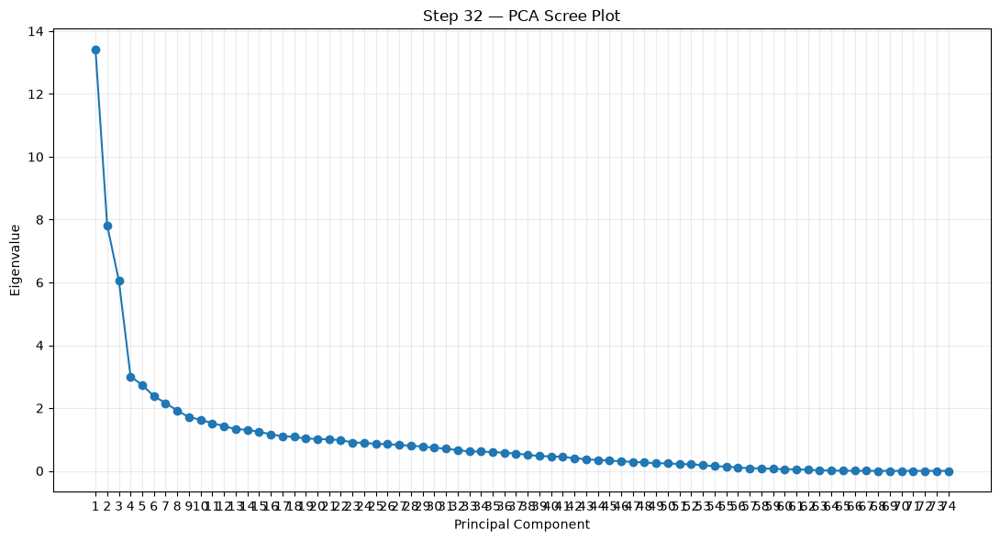

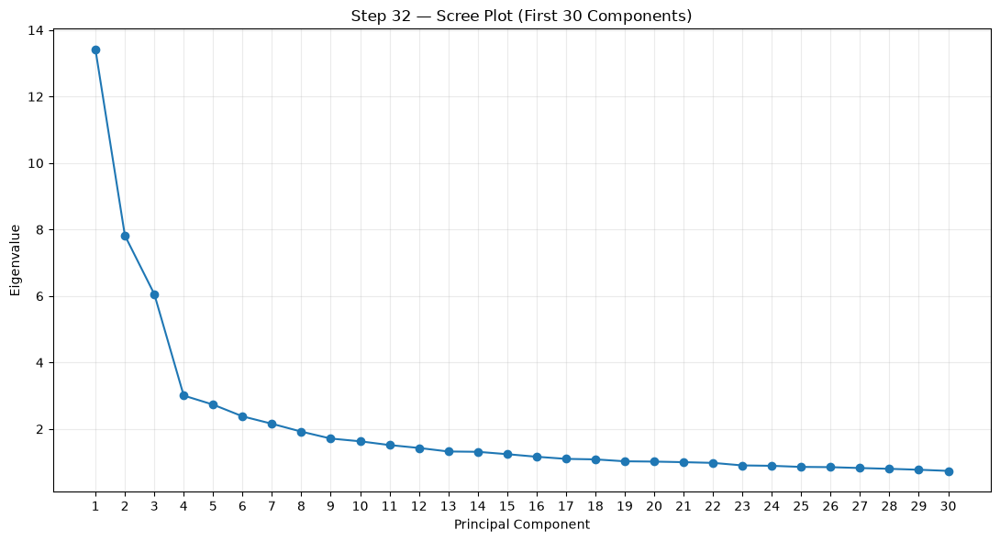


LARGEST EIGENVALUE DROPS

These are descriptive only.
They help identify where the Scree curve changes slope.


,component,component_number,eigenvalue,eigenvalue_drop_to_next_pc,explained_variance_percent,cumulative_variance_percent
0,PC1,1,13.4065,5.5868,18.0899,18.0899
1,PC3,3,6.0584,3.0522,8.1748,36.8162
2,PC2,2,7.8197,1.7613,10.5515,28.6414
3,PC5,5,2.7332,0.3524,3.6880,44.5605
4,PC4,4,3.0061,0.2729,4.0563,40.8725
5,PC7,7,2.1573,0.2366,2.9110,50.6840
6,PC6,6,2.3808,0.2235,3.2125,47.7730
7,PC8,8,1.9208,0.2082,2.5918,53.2758
8,PC10,10,1.6301,0.1133,2.1995,57.7862
9,PC12,12,1.4297,0.1061,1.9291,61.7620



STRONGEST CURVATURE CHANGES

These values are supplementary diagnostics only.


,component,component_number,eigenvalue,second_difference,explained_variance_percent,cumulative_variance_percent,absolute_second_difference
0,PC2,2,7.8197,3.8254,10.5515,28.6414,3.8254
1,PC4,4,3.0061,2.7793,4.0563,40.8725,2.7793
2,PC3,3,6.0584,-1.2909,8.1748,36.8162,1.2909
3,PC6,6,2.3808,0.1289,3.2125,47.7730,0.1289
4,PC9,9,1.7126,0.1257,2.3109,55.5866,0.1257
5,PC13,13,1.3235,0.0965,1.7859,63.5479,0.0965
6,PC5,5,2.7332,-0.0794,3.6880,44.5605,0.0794
7,PC23,23,0.9048,0.0635,1.2208,78.1816,0.0635
8,PC14,14,1.3139,-0.0614,1.7728,65.3207,0.0614
9,PC22,22,0.9807,-0.0547,1.3234,76.9608,0.0547



SCREE INSPECTION — FIRST COMPONENTS


,component,component_number,eigenvalue,explained_variance_percent,cumulative_variance_percent,eigenvalue_drop_to_next_pc,second_difference
0,PC1,1,13.4065,18.0899,18.0899,5.5868,NaN
1,PC2,2,7.8197,10.5515,28.6414,1.7613,3.8254
2,PC3,3,6.0584,8.1748,36.8162,3.0522,-1.2909
3,PC4,4,3.0061,4.0563,40.8725,0.2729,2.7793
4,PC5,5,2.7332,3.6880,44.5605,0.3524,-0.0794
5,PC6,6,2.3808,3.2125,47.7730,0.2235,0.1289
6,PC7,7,2.1573,2.9110,50.6840,0.2366,-0.0131
7,PC8,8,1.9208,2.5918,53.2758,0.2082,0.0284
8,PC9,9,1.7126,2.3109,55.5866,0.0825,0.1257
9,PC10,10,1.6301,2.1995,57.7862,0.1133,-0.0308



STEP 32 COMPLETE — SCREE TEST

PCA components evaluated:
  74

What this step did:
  Plotted the complete eigenvalue profile.
  Plotted the first 30 PCs for easier elbow inspection.
  Calculated eigenvalue drops between adjacent PCs.
  Calculated second-difference curvature diagnostics.

What this step did NOT do:
  No PCA components were removed.
  No final number of components was selected.
  No Kaiser criterion was applied.
  No component-saturation criterion was applied.

Main objects created:
  scree_summary
  scree_summary_display
  largest_drops
  curvature_summary
  scree_inspection

NEXT:
  Inspect the Scree plot and record the apparent component-retention region.



In [42]:
# ============================================================
# STEP 32 — SCREE PLOT / SCREE TEST
# ============================================================
#
# PURPOSE
# -------
#
# Evaluate the eigenvalue profile from the Classical PCA
# completed in Step 31.
#
# The Scree Test examines the ordered PCA eigenvalues and looks
# for the point where the steep decline transitions into a
# relatively flat region.
#
# Components before this bend are interpreted as carrying
# substantially more structure, while components in the flatter
# region increasingly resemble residual / lower-information
# dimensions.
#
# IMPORTANT
# ---------
#
# This step is DIAGNOSTIC ONLY.
#
# No components are removed here.
# No final retention decision is made here.
#
# The Scree result will later be combined with other
# component-retention diagnostics.
#
#
# Literature:
#
# Cattell, R. B. (1966).
# The Scree Test for the Number of Factors.
# Multivariate Behavioral Research, 1(2), 245–276.
#
# Zwick, W. R. & Velicer, W. F. (1986).
# Comparison of Five Rules for Determining the Number of
# Components to Retain.
# Psychological Bulletin, 99(3), 432–442.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from IPython.display import display


# ============================================================
# 2. VERIFY STEP 31 OBJECTS EXIST
# ============================================================

required_objects = [
    "pca_eigenvalues",
    "pca_explained_variance_percent",
    "pca_cumulative_variance_percent"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 31 PCA objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 31 before running Step 32."
    )


# ============================================================
# 3. PREPARE EIGENVALUES
# ============================================================

eigenvalues = np.asarray(
    pca_eigenvalues,
    dtype=float
)


explained_variance_percent = np.asarray(
    pca_explained_variance_percent,
    dtype=float
)


cumulative_variance_percent = np.asarray(
    pca_cumulative_variance_percent,
    dtype=float
)


number_of_components = len(
    eigenvalues
)


component_numbers = np.arange(
    1,
    number_of_components + 1
)


# ============================================================
# 4. VALIDATE INPUT
# ============================================================

if (
    len(
        explained_variance_percent
    )
    !=
    number_of_components
):

    raise RuntimeError(
        "Explained-variance vector length does not match "
        "the number of PCA eigenvalues."
    )


if (
    len(
        cumulative_variance_percent
    )
    !=
    number_of_components
):

    raise RuntimeError(
        "Cumulative-variance vector length does not match "
        "the number of PCA eigenvalues."
    )


if not np.isfinite(
    eigenvalues
).all():

    raise RuntimeError(
        "PCA eigenvalues contain NaN or infinite values."
    )


# ============================================================
# 5. CREATE SCREE DATAFRAME
# ============================================================

scree_summary = pd.DataFrame(
    {
        "component":
            [
                f"PC{i}"
                for i in component_numbers
            ],

        "component_number":
            component_numbers,

        "eigenvalue":
            eigenvalues,

        "explained_variance_percent":
            explained_variance_percent,

        "cumulative_variance_percent":
            cumulative_variance_percent
    }
)


# ============================================================
# 6. CALCULATE FIRST DIFFERENCE IN EIGENVALUES
# ============================================================
#
# This shows how much the eigenvalue falls from one component
# to the next.
#
# Larger values indicate a sharper drop.
#
# ============================================================

scree_summary[
    "eigenvalue_drop_to_next_pc"
] = (

    scree_summary[
        "eigenvalue"
    ]

    -

    scree_summary[
        "eigenvalue"
    ]
    .shift(
        -1
    )
)


# ============================================================
# 7. CALCULATE SECOND DIFFERENCE
# ============================================================
#
# This is a simple curvature diagnostic.
#
# It is NOT the classical Scree Test itself, but it can help
# identify where the eigenvalue slope changes most strongly.
#
# ============================================================

first_difference = np.diff(
    eigenvalues
)


second_difference = np.diff(
    first_difference
)


scree_summary[
    "second_difference"
] = np.nan


if (
    len(
        second_difference
    )
    >
    0
):

    scree_summary.loc[
        1:
        number_of_components - 2,
        "second_difference"
    ] = second_difference


# ============================================================
# 8. CREATE DISPLAY VERSION
# ============================================================

scree_summary_display = (
    scree_summary
    .copy()
)


for column in [
    "eigenvalue",
    "eigenvalue_drop_to_next_pc",
    "second_difference"
]:

    scree_summary_display[
        column
    ] = (

        scree_summary_display[
            column
        ]

        .round(
            4
        )
    )


for column in [
    "explained_variance_percent",
    "cumulative_variance_percent"
]:

    scree_summary_display[
        column
    ] = (

        scree_summary_display[
            column
        ]

        .round(
            2
        )
    )


# ============================================================
# 9. PRINT SCREE SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 32 — SCREE TEST"
)


print(
    "=" * 120
)


print(
    "\nPrincipal components evaluated:"
)


print(
    f"  {number_of_components:,}"
)


print(
    "\nEigenvalue profile:"
)


display(
    scree_summary_display
)


# ============================================================
# 10. PLOT FULL SCREE CURVE
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers,

    eigenvalues,

    marker="o"
)


ax.set_xlabel(
    "Principal Component"
)


ax.set_ylabel(
    "Eigenvalue"
)


ax.set_title(
    "Step 32 — PCA Scree Plot"
)


ax.set_xticks(
    component_numbers
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 11. PLOT FIRST 30 COMPONENTS
# ============================================================
#
# The bend is often much easier to inspect when the long tail
# of very small eigenvalues is not allowed to compress the
# beginning of the curve.
#
# ============================================================

components_to_show = min(
    30,
    number_of_components
)


fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers[
        :components_to_show
    ],

    eigenvalues[
        :components_to_show
    ],

    marker="o"
)


ax.set_xlabel(
    "Principal Component"
)


ax.set_ylabel(
    "Eigenvalue"
)


ax.set_title(
    "Step 32 — Scree Plot (First 30 Components)"
)


ax.set_xticks(
    component_numbers[
        :components_to_show
    ]
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 12. IDENTIFY LARGEST EIGENVALUE DROPS
# ============================================================
#
# This is descriptive support for the visual Scree Test.
#
# It does NOT automatically define the retention cutoff.
#
# ============================================================

largest_drops = (

    scree_summary[
        [
            "component",
            "component_number",
            "eigenvalue",
            "eigenvalue_drop_to_next_pc",
            "explained_variance_percent",
            "cumulative_variance_percent"
        ]
    ]

    .dropna(
        subset=[
            "eigenvalue_drop_to_next_pc"
        ]
    )

    .sort_values(
        "eigenvalue_drop_to_next_pc",
        ascending=False
    )

    .head(
        10
    )

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "LARGEST EIGENVALUE DROPS"
)


print(
    "=" * 120
)


print(
    "\nThese are descriptive only."
)


print(
    "They help identify where the Scree curve changes slope."
)


display(
    largest_drops.round(
        4
    )
)


# ============================================================
# 13. IDENTIFY STRONGEST CURVATURE POINTS
# ============================================================

curvature_summary = (

    scree_summary[
        [
            "component",
            "component_number",
            "eigenvalue",
            "second_difference",
            "explained_variance_percent",
            "cumulative_variance_percent"
        ]
    ]

    .dropna(
        subset=[
            "second_difference"
        ]
    )

    .assign(
        absolute_second_difference=
            lambda df:
            df[
                "second_difference"
            ]
            .abs()
    )

    .sort_values(
        "absolute_second_difference",
        ascending=False
    )

    .head(
        10
    )

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "STRONGEST CURVATURE CHANGES"
)


print(
    "=" * 120
)


print(
    "\nThese values are supplementary diagnostics only."
)


display(
    curvature_summary.round(
        4
    )
)


# ============================================================
# 14. CREATE COMPACT SCREE INSPECTION TABLE
# ============================================================
#
# Show the early part of the component structure where a Scree
# elbow is most likely to occur.
#
# ============================================================

inspection_limit = min(
    25,
    number_of_components
)


scree_inspection = (

    scree_summary
    .iloc[
        :inspection_limit
    ]
    .copy()
)


print(
    "\n"
    + "=" * 120
)


print(
    "SCREE INSPECTION — FIRST COMPONENTS"
)


print(
    "=" * 120
)


display(
    scree_inspection.round(
        4
    )
)


# ============================================================
# 15. FINAL STEP 32 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 32 COMPLETE — SCREE TEST"
)


print(
    "=" * 120
)


print(
    "\nPCA components evaluated:"
)


print(
    f"  {number_of_components:,}"
)


print(
    "\nWhat this step did:"
)


print(
    "  Plotted the complete eigenvalue profile."
)


print(
    "  Plotted the first 30 PCs for easier elbow inspection."
)


print(
    "  Calculated eigenvalue drops between adjacent PCs."
)


print(
    "  Calculated second-difference curvature diagnostics."
)


print(
    "\nWhat this step did NOT do:"
)


print(
    "  No PCA components were removed."
)


print(
    "  No final number of components was selected."
)


print(
    "  No Kaiser criterion was applied."
)


print(
    "  No component-saturation criterion was applied."
)


print(
    "\nMain objects created:"
)


print(
    "  scree_summary"
)


print(
    "  scree_summary_display"
)


print(
    "  largest_drops"
)


print(
    "  curvature_summary"
)


print(
    "  scree_inspection"
)


print(
    "\nNEXT:"
)


print(
    "  Inspect the Scree plot and record the apparent "
    "component-retention region."
)


print(
    "\n"
    + "=" * 120
)

### 33. Parallel Analysis

In [43]:
# ============================================================
# PARALLEL ANALYSIS — METHODOLOGICAL BASIS
# ============================================================
#
# Parallel Analysis determines how many PCs contain more
# structure than would be expected from random noise.
#
# Random datasets with the same dimensions as the real data
# (673 players × 74 variables) are generated and PCA is
# repeatedly applied.
#
# A PC is retained when its observed eigenvalue exceeds the
# 95th-percentile eigenvalue obtained from the random data.
#
# REFERENCES:
# Horn (1965) — introduced Parallel Analysis.
# Longman et al. (1989) — examined mean and 95th-percentile
#                         criteria for PCA Parallel Analysis.
# Hayton et al. (2004) — practical methodological guidance
#                        for Parallel Analysis.
#
# RESULT:
# Parallel Analysis supported PC1–PC12.
# PC13 was the first component below the random benchmark.
# ============================================================


STEP 33 — HORN'S PARALLEL ANALYSIS

Observed PCA:
  Observations: 673
  Variables:    74
  Components:   74

Parallel Analysis simulations:
  1,000

Random eigenvalue criterion:
  95th percentile

PARALLEL ANALYSIS — OBSERVED VS RANDOM EIGENVALUES


,component,component_number,observed_eigenvalue,random_mean_eigenvalue,random_median_eigenvalue,random_95th_percentile_eigenvalue,observed_minus_random_percentile,parallel_analysis_retain
0,PC1,1,13.4065,1.7235,1.7220,1.7789,11.6276,True
1,PC2,2,7.8197,1.6688,1.6677,1.7131,6.1066,True
2,PC3,3,6.0584,1.6290,1.6282,1.6642,4.3941,True
3,PC4,4,3.0061,1.5936,1.5935,1.6278,1.3783,True
4,PC5,5,2.7332,1.5623,1.5626,1.5903,1.1429,True
5,PC6,6,2.3808,1.5329,1.5326,1.5632,0.8176,True
6,PC7,7,2.1573,1.5065,1.5067,1.5338,0.6235,True
7,PC8,8,1.9208,1.4808,1.4809,1.5058,0.4150,True
8,PC9,9,1.7126,1.4554,1.4553,1.4797,0.2329,True
9,PC10,10,1.6301,1.4325,1.4320,1.4555,0.1746,True



PARALLEL ANALYSIS — RETENTION BOUNDARY


,component,component_number,observed_eigenvalue,random_mean_eigenvalue,random_median_eigenvalue,random_95th_percentile_eigenvalue,observed_minus_random_percentile,parallel_analysis_retain
0,PC9,9,1.7126,1.4554,1.4553,1.4797,0.2329,True
1,PC10,10,1.6301,1.4325,1.4320,1.4555,0.1746,True
2,PC11,11,1.5168,1.4098,1.4094,1.4322,0.0846,True
3,PC12,12,1.4297,1.3882,1.3886,1.4093,0.0203,True
4,PC13,13,1.3235,1.3671,1.3673,1.3877,-0.0642,False
5,PC14,14,1.3139,1.3463,1.3458,1.3649,-0.0511,False
6,PC15,15,1.2428,1.3266,1.3266,1.3459,-0.1031,False
7,PC16,16,1.1653,1.3074,1.3071,1.3271,-0.1618,False
8,PC17,17,1.1014,1.2884,1.2877,1.3077,-0.2063,False


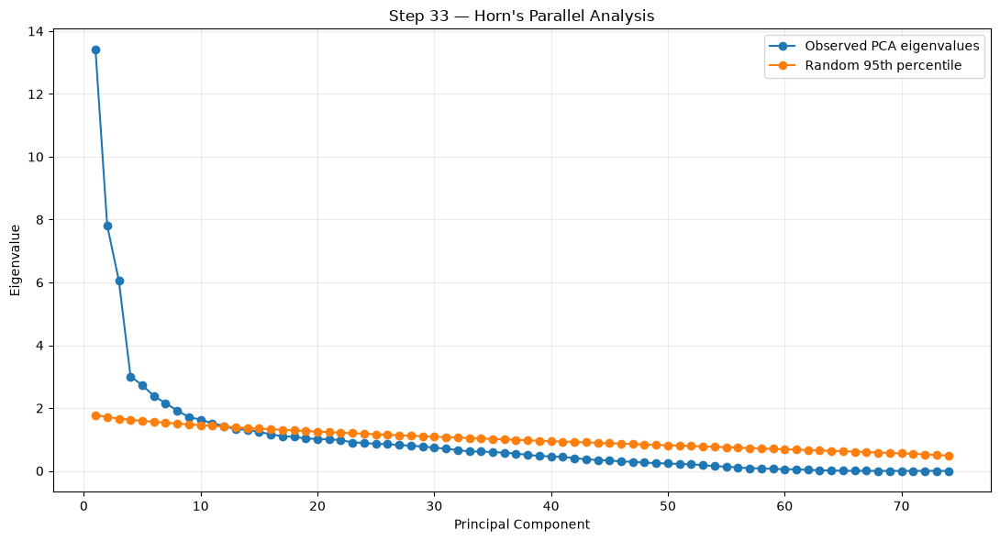

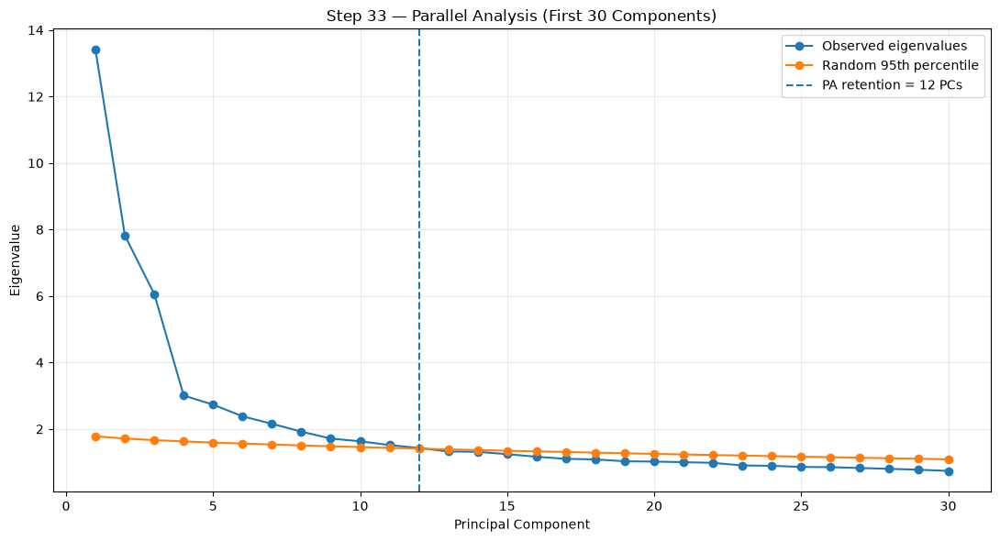


PARALLEL ANALYSIS RESULT

Retention criterion:
  Observed eigenvalue > 95th percentile random eigenvalue

Components retained:
  12

Retained PCs:
  PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, PC10, PC11, PC12

STEP 33 — COMPACT RESULT


,observations,variables,simulations,random_percentile,components_retained,retained_components
0,673,74,1000,95,12,"PC1, PC2, PC3, PC4, PC5, PC6, PC7, PC8, PC9, PC10, PC11, PC12"



STEP 33 COMPLETE — HORN'S PARALLEL ANALYSIS

Observed PCA dimensions:
  N = 673
  P = 74

Random datasets simulated:
  1,000

Parallel Analysis criterion:
  95th percentile random eigenvalue

Parallel Analysis suggests retaining:
  12 principal components

IMPORTANT:
  No PCA components were removed.
  The full Step 31 PCA solution remains unchanged.
  This is an independent retention diagnostic.

Main output objects:
  random_eigenvalues
  random_mean_eigenvalues
  random_percentile_eigenvalues
  parallel_analysis_summary
  parallel_analysis_boundary
  parallel_analysis_result
  n_parallel_components
  parallel_retained_components



In [44]:
# ============================================================
# STEP 33 — HORN'S PARALLEL ANALYSIS
# ============================================================
#
# PURPOSE
# -------
#
# Determine how many principal components from the Classical
# PCA in Step 31 explain more variance than would be expected
# from random data alone.
#
# Parallel Analysis compares:
#
#       observed PCA eigenvalues
#
# against
#
#       eigenvalues generated from random datasets
#
# with the SAME:
#
#       number of observations (N)
#       number of variables (P)
#
#
# For each simulation:
#
#   1. Generate an N × P random normal matrix.
#   2. Standardize the random variables.
#   3. Run PCA.
#   4. Store the eigenvalues.
#
# After many simulations, the observed PCA eigenvalues are
# compared with the simulated eigenvalue distribution.
#
#
# RETENTION RULE
# --------------
#
# A component is retained when its observed eigenvalue exceeds
# the selected percentile of the corresponding random
# eigenvalue distribution.
#
# This script uses the 95th percentile as the primary
# Parallel Analysis criterion.
#
#
# IMPORTANT
# ---------
#
# This step is DIAGNOSTIC ONLY.
#
# It does NOT delete PCA components.
#
# It produces an independent component-retention estimate that
# will later be compared with the Scree Test and other
# diagnostics.
#
#
# REFERENCES
# ----------
#
# Horn, J. L. (1965).
# A rationale and test for the number of factors in factor
# analysis.
# Psychometrika, 30(2), 179–185.
#
# Zwick, W. R. & Velicer, W. F. (1986).
# Comparison of Five Rules for Determining the Number of
# Components to Retain.
# Psychological Bulletin, 99(3), 432–442.
#
# Hayton, J. C., Allen, D. G. & Scarpello, V. (2004).
# Factor Retention Decisions in Exploratory Factor Analysis:
# A Tutorial on Parallel Analysis.
# Organizational Research Methods, 7(2), 191–205.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

N_SIMULATIONS = 1000


RANDOM_STATE = 42


PARALLEL_PERCENTILE = 95


# ============================================================
# 3. VERIFY STEP 31 OBJECTS EXIST
# ============================================================

required_objects = [
    "pca_eigenvalues",
    "X_standardized",
    "pca_variables"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 31 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 31 before running Step 33."
    )


# ============================================================
# 4. PREPARE OBSERVED PCA INFORMATION
# ============================================================

observed_eigenvalues = np.asarray(
    pca_eigenvalues,
    dtype=float
)


X_parallel = np.asarray(
    X_standardized,
    dtype=float
)


N, P = X_parallel.shape


number_of_components = len(
    observed_eigenvalues
)


component_numbers = np.arange(
    1,
    number_of_components + 1
)


component_names = [
    f"PC{i}"
    for i in component_numbers
]


# ============================================================
# 5. VALIDATE DIMENSIONS
# ============================================================

if (
    P
    !=
    len(
        pca_variables
    )
):

    raise RuntimeError(
        "The number of PCA variables does not match "
        "X_standardized."
    )


if (
    number_of_components
    !=
    min(
        N,
        P
    )
):

    raise RuntimeError(
        "Observed PCA eigenvalue count does not match the "
        "expected full PCA dimensionality."
    )


if not np.isfinite(
    observed_eigenvalues
).all():

    raise RuntimeError(
        "Observed PCA eigenvalues contain NaN or infinite "
        "values."
    )


# ============================================================
# 6. PRINT INPUT SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 33 — HORN'S PARALLEL ANALYSIS"
)


print(
    "=" * 120
)


print(
    "\nObserved PCA:"
)


print(
    f"  Observations: {N:,}"
)


print(
    f"  Variables:    {P:,}"
)


print(
    f"  Components:   {number_of_components:,}"
)


print(
    "\nParallel Analysis simulations:"
)


print(
    f"  {N_SIMULATIONS:,}"
)


print(
    "\nRandom eigenvalue criterion:"
)


print(
    f"  {PARALLEL_PERCENTILE}th percentile"
)


# ============================================================
# 7. CREATE RANDOM NUMBER GENERATOR
# ============================================================

rng = np.random.default_rng(
    RANDOM_STATE
)


# ============================================================
# 8. STORAGE FOR RANDOM EIGENVALUES
# ============================================================

random_eigenvalues = np.empty(
    (
        N_SIMULATIONS,
        number_of_components
    ),
    dtype=float
)


# ============================================================
# 9. RUN PARALLEL ANALYSIS SIMULATIONS
# ============================================================

for simulation in range(
    N_SIMULATIONS
):

    # --------------------------------------------------------
    # Generate random independent normal variables
    # --------------------------------------------------------

    random_matrix = rng.normal(
        loc=0.0,
        scale=1.0,
        size=(
            N,
            P
        )
    )


    # --------------------------------------------------------
    # Standardize random matrix exactly as real PCA input
    # --------------------------------------------------------

    random_standardized = (

        StandardScaler(
            with_mean=True,
            with_std=True
        )

        .fit_transform(
            random_matrix
        )
    )


    # --------------------------------------------------------
    # Fit full PCA
    # --------------------------------------------------------

    random_pca = PCA(
        n_components=None,
        svd_solver="full"
    )


    random_pca.fit(
        random_standardized
    )


    # --------------------------------------------------------
    # Store simulated eigenvalues
    # --------------------------------------------------------

    random_eigenvalues[
        simulation,
        :
    ] = (
        random_pca
        .explained_variance_
    )


# ============================================================
# 10. CALCULATE RANDOM EIGENVALUE BENCHMARKS
# ============================================================

random_mean_eigenvalues = np.mean(
    random_eigenvalues,
    axis=0
)


random_median_eigenvalues = np.median(
    random_eigenvalues,
    axis=0
)


random_percentile_eigenvalues = np.percentile(
    random_eigenvalues,
    PARALLEL_PERCENTILE,
    axis=0
)


# ============================================================
# 11. APPLY PARALLEL ANALYSIS RETENTION RULE
# ============================================================
#
# Primary rule:
#
#   observed eigenvalue
#   >
#   95th percentile random eigenvalue
#
# ============================================================

parallel_retain_mask = (

    observed_eigenvalues

    >
    random_percentile_eigenvalues
)


# ============================================================
# 12. DETERMINE NUMBER OF RETAINED COMPONENTS
# ============================================================
#
# Standard PA interpretation assumes retained components occur
# consecutively from PC1 onward.
#
# We therefore find the first PC that fails the criterion.
#
# ============================================================

failed_indices = np.where(
    ~parallel_retain_mask
)[0]


if (
    len(
        failed_indices
    )
    ==
    0
):

    n_parallel_components = (
        number_of_components
    )


else:

    n_parallel_components = int(
        failed_indices[
            0
        ]
    )


parallel_retained_components = [
    f"PC{i}"
    for i in range(
        1,
        n_parallel_components + 1
    )
]


# ============================================================
# 13. CREATE PARALLEL ANALYSIS SUMMARY
# ============================================================

parallel_analysis_summary = pd.DataFrame(
    {

        "component":
            component_names,

        "component_number":
            component_numbers,

        "observed_eigenvalue":
            observed_eigenvalues,

        "random_mean_eigenvalue":
            random_mean_eigenvalues,

        "random_median_eigenvalue":
            random_median_eigenvalues,

        f"random_{PARALLEL_PERCENTILE}th_percentile_eigenvalue":
            random_percentile_eigenvalues,

        "observed_minus_random_percentile":
            (
                observed_eigenvalues
                -
                random_percentile_eigenvalues
            ),

        "parallel_analysis_retain":
            parallel_retain_mask
    }
)


# ============================================================
# 14. CREATE DISPLAY VERSION
# ============================================================

parallel_analysis_display = (
    parallel_analysis_summary
    .copy()
)


numeric_columns_to_round = [
    "observed_eigenvalue",
    "random_mean_eigenvalue",
    "random_median_eigenvalue",
    f"random_{PARALLEL_PERCENTILE}th_percentile_eigenvalue",
    "observed_minus_random_percentile"
]


for column in numeric_columns_to_round:

    parallel_analysis_display[
        column
    ] = (

        parallel_analysis_display[
            column
        ]

        .round(
            4
        )
    )


# ============================================================
# 15. PRINT COMPLETE PARALLEL ANALYSIS TABLE
# ============================================================

print(
    "\n"
    + "=" * 150
)


print(
    "PARALLEL ANALYSIS — OBSERVED VS RANDOM EIGENVALUES"
)


print(
    "=" * 150
)


display(
    parallel_analysis_display
)


# ============================================================
# 16. CREATE RETENTION-BOUNDARY TABLE
# ============================================================
#
# Display several PCs around the estimated cutoff.
#
# ============================================================

boundary_start = max(
    0,
    n_parallel_components - 4
)


boundary_end = min(
    number_of_components,
    n_parallel_components + 5
)


parallel_analysis_boundary = (

    parallel_analysis_summary

    .iloc[
        boundary_start:
        boundary_end
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 140
)


print(
    "PARALLEL ANALYSIS — RETENTION BOUNDARY"
)


print(
    "=" * 140
)


display(
    parallel_analysis_boundary.round(
        4
    )
)


# ============================================================
# 17. PLOT OBSERVED VS RANDOM EIGENVALUES
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers,

    observed_eigenvalues,

    marker="o",

    label=
        "Observed PCA eigenvalues"
)


ax.plot(

    component_numbers,

    random_percentile_eigenvalues,

    marker="o",

    label=
        f"Random {PARALLEL_PERCENTILE}th percentile"
)


ax.set_xlabel(
    "Principal Component"
)


ax.set_ylabel(
    "Eigenvalue"
)


ax.set_title(
    "Step 33 — Horn's Parallel Analysis"
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 18. PLOT FIRST 30 COMPONENTS
# ============================================================

components_to_show = min(
    30,
    number_of_components
)


fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers[
        :components_to_show
    ],

    observed_eigenvalues[
        :components_to_show
    ],

    marker="o",

    label=
        "Observed eigenvalues"
)


ax.plot(

    component_numbers[
        :components_to_show
    ],

    random_percentile_eigenvalues[
        :components_to_show
    ],

    marker="o",

    label=
        f"Random {PARALLEL_PERCENTILE}th percentile"
)


if (
    n_parallel_components
    >
    0
):

    ax.axvline(

        n_parallel_components,

        linestyle="--",

        label=
            f"PA retention = {n_parallel_components} PCs"
    )


ax.set_xlabel(
    "Principal Component"
)


ax.set_ylabel(
    "Eigenvalue"
)


ax.set_title(
    "Step 33 — Parallel Analysis (First 30 Components)"
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 19. PRINT PARALLEL ANALYSIS RESULT
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "PARALLEL ANALYSIS RESULT"
)


print(
    "=" * 120
)


print(
    "\nRetention criterion:"
)


print(
    f"  Observed eigenvalue > "
    f"{PARALLEL_PERCENTILE}th percentile "
    "random eigenvalue"
)


print(
    "\nComponents retained:"
)


print(
    f"  {n_parallel_components:,}"
)


print(
    "\nRetained PCs:"
)


if parallel_retained_components:

    print(
        "  "
        +
        ", ".join(
            parallel_retained_components
        )
    )


else:

    print(
        "  None"
    )


# ============================================================
# 20. CREATE COMPACT RESULT OBJECT
# ============================================================

parallel_analysis_result = pd.DataFrame(
    [
        {

            "observations":
                N,

            "variables":
                P,

            "simulations":
                N_SIMULATIONS,

            "random_percentile":
                PARALLEL_PERCENTILE,

            "components_retained":
                n_parallel_components,

            "retained_components":
                ", ".join(
                    parallel_retained_components
                )
        }
    ]
)


# ============================================================
# 21. PRINT COMPACT RESULT
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 33 — COMPACT RESULT"
)


print(
    "=" * 120
)


display(
    parallel_analysis_result
)


# ============================================================
# 22. FINAL STEP 33 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)


print(
    "STEP 33 COMPLETE — HORN'S PARALLEL ANALYSIS"
)


print(
    "=" * 120
)


print(
    "\nObserved PCA dimensions:"
)


print(
    f"  N = {N:,}"
)


print(
    f"  P = {P:,}"
)


print(
    "\nRandom datasets simulated:"
)


print(
    f"  {N_SIMULATIONS:,}"
)


print(
    "\nParallel Analysis criterion:"
)


print(
    f"  {PARALLEL_PERCENTILE}th percentile random eigenvalue"
)


print(
    "\nParallel Analysis suggests retaining:"
)


print(
    f"  {n_parallel_components:,} principal components"
)


print(
    "\nIMPORTANT:"
)


print(
    "  No PCA components were removed."
)


print(
    "  The full Step 31 PCA solution remains unchanged."
)


print(
    "  This is an independent retention diagnostic."
)


print(
    "\nMain output objects:"
)


print(
    "  random_eigenvalues"
)


print(
    "  random_mean_eigenvalues"
)


print(
    "  random_percentile_eigenvalues"
)


print(
    "  parallel_analysis_summary"
)


print(
    "  parallel_analysis_boundary"
)


print(
    "  parallel_analysis_result"
)


print(
    "  n_parallel_components"
)


print(
    "  parallel_retained_components"
)


print(
    "\n"
    + "=" * 120
)

### 34. Run Velicer's Map Test


STEP 34 — VELICER'S MINIMUM AVERAGE PARTIAL (MAP) TEST

Input matrix:
  Observations: 673
  Variables:    74

Previously obtained retention evidence:
  Scree Test:        4 PCs
  Parallel Analysis: 12 PCs

VELICER MAP — COMPLETE COMPONENT SEQUENCE


,components_partialled_out,original_MAP,revised_MAP,original_difference_from_minimum,revised_difference_from_minimum
0,0,0.049260,0.017246,0.031366,0.014043
1,1,0.040083,0.012937,0.022189,0.009735
2,2,0.033627,0.008398,0.015733,0.005195
3,3,0.023546,0.005531,0.005651,0.002328
4,4,0.022016,0.004730,0.004122,0.001527
5,5,0.019468,0.004524,0.001573,0.001321
6,6,0.019154,0.004375,0.001260,0.001172
7,7,0.019445,0.004364,0.001551,0.001161
8,8,0.019724,0.004191,0.001829,0.000988
9,9,0.019082,0.003895,0.001187,0.000692



ORIGINAL MAP — NEIGHBORHOOD AROUND MINIMUM


,components_partialled_out,original_MAP,revised_MAP,original_difference_from_minimum,revised_difference_from_minimum
0,6,0.019154,0.004375,0.001260,0.001172
1,7,0.019445,0.004364,0.001551,0.001161
2,8,0.019724,0.004191,0.001829,0.000988
3,9,0.019082,0.003895,0.001187,0.000692
4,10,0.018620,0.003710,0.000726,0.000508
5,11,0.017894,0.003507,0.000000,0.000304
6,12,0.017898,0.003360,0.000004,0.000157
7,13,0.018003,0.003335,0.000109,0.000132
8,14,0.018119,0.003334,0.000225,0.000131
9,15,0.018270,0.003311,0.000376,0.000108



REVISED MAP — NEIGHBORHOOD AROUND MINIMUM


,components_partialled_out,original_MAP,revised_MAP,original_difference_from_minimum,revised_difference_from_minimum
0,12,0.017898,0.003360,0.000004,0.000157
1,13,0.018003,0.003335,0.000109,0.000132
2,14,0.018119,0.003334,0.000225,0.000131
3,15,0.018270,0.003311,0.000376,0.000108
4,16,0.018263,0.003272,0.000369,0.000069
5,17,0.018132,0.003203,0.000237,0.000000
6,18,0.018597,0.003208,0.000703,0.000005
7,19,0.018860,0.003237,0.000966,0.000034
8,20,0.019293,0.003311,0.001399,0.000108
9,21,0.020090,0.003518,0.002195,0.000315


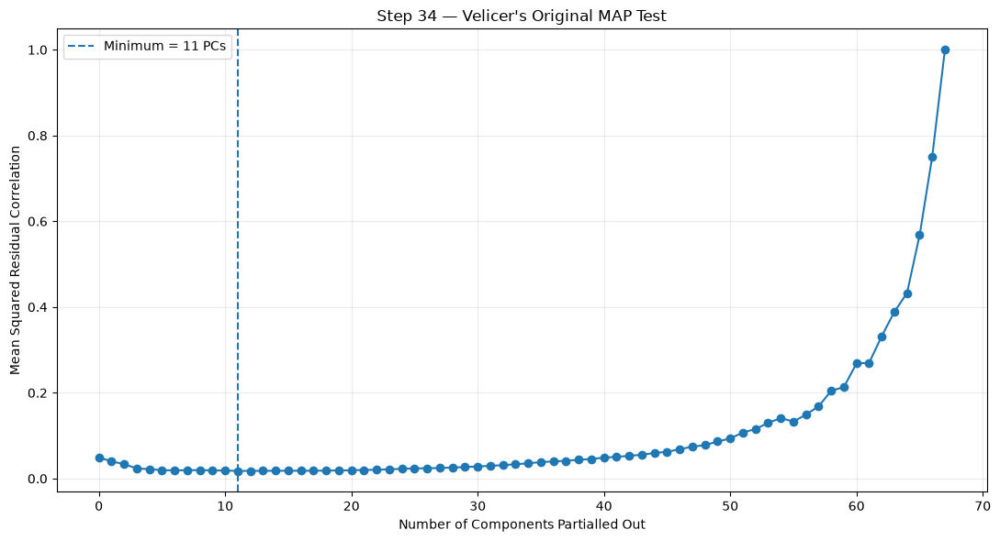

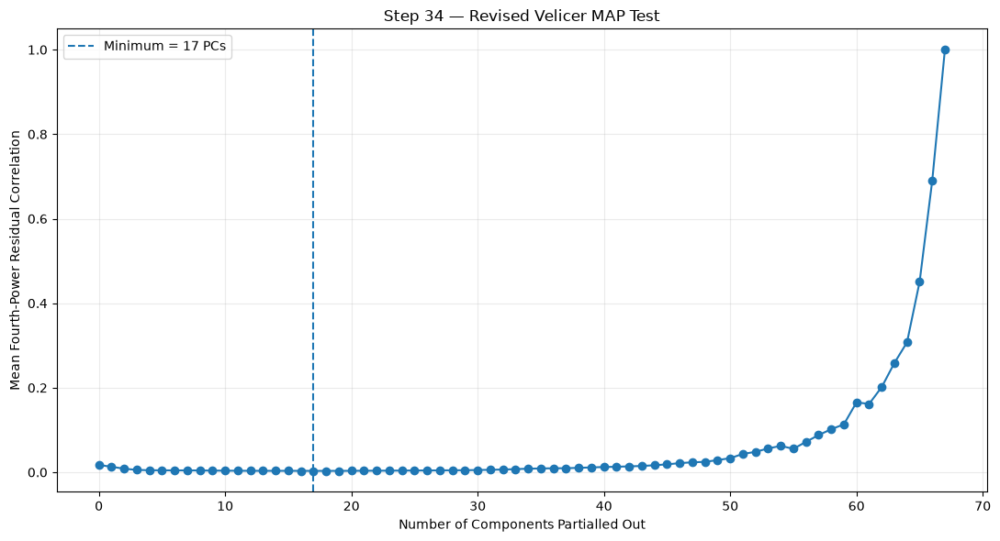


STEP 34 — COMPACT MAP RESULT


,observations,variables,original_MAP_components,original_MAP_minimum,revised_MAP_components,revised_MAP_minimum
0,673,74,11,0.017894,17,0.003203



COMPONENT RETENTION EVIDENCE SO FAR


,method,components_suggested
0,Cattell Scree Test,4
1,Horn Parallel Analysis,12
2,Velicer Original MAP,11
3,Velicer Revised MAP,17



VELICER MAP RESULT

Original MAP recommends:
  11 components

Revised MAP recommends:
  17 components

The original and revised MAP criteria do not select exactly the same number of components.
Treat both as retention evidence rather than forcing an immediate decision.

STEP 34 COMPLETE — VELICER'S MAP TEST

Dataset dimensions:
  N = 673
  P = 74

Retention evidence:
  Scree Test:             4 PCs
  Parallel Analysis:      12 PCs
  Original Velicer MAP:   11 PCs
  Revised Velicer MAP:    17 PCs

IMPORTANT:
  No components were removed.
  No observations were removed.
  The Step 31 PCA solution remains unchanged.
  MAP is being used as another independent retention diagnostic.

Main output objects:
  velicer_map_summary
  original_map_neighborhood
  revised_map_neighborhood
  velicer_map_result
  component_retention_comparison
  original_map_components
  revised_map_components



In [45]:
# ============================================================
# STEP 34 — VELICER'S MINIMUM AVERAGE PARTIAL (MAP) TEST
# ============================================================
#
# PURPOSE
# -------
#
# Estimate how many principal components should be retained
# using Velicer's Minimum Average Partial (MAP) criterion.
#
# MAP asks:
#
#   "After removing k principal components, how much
#    systematic correlation remains among the variables?"
#
# For k = 0, 1, 2, ... components, the correlation matrix is
# reproduced from the removed PCs and subtracted from the
# original correlation matrix.
#
# The residual covariance matrix is converted to a residual
# partial-correlation matrix.
#
# ORIGINAL MAP:
#   Calculates the mean squared off-diagonal residual
#   correlations.
#
# REVISED MAP:
#   Calculates the mean fourth-power off-diagonal residual
#   correlations.
#
# The number of components associated with the MINIMUM value
# is the MAP retention recommendation.
#
# IMPORTANT
# ---------
#
# This step is DIAGNOSTIC ONLY.
#
# No components are removed.
# No observations are removed.
# No source dataset is modified.
#
# The MAP result should be compared with:
#
#   Step 32 — Scree Test:        4 PCs
#   Step 33 — Parallel Analysis: 12 PCs
#
#
# REFERENCES
# ----------
#
# Velicer, W. F. (1976).
# Determining the Number of Components from the Matrix of
# Partial Correlations.
# Psychometrika, 41, 321–327.
#
# Velicer, W. F., Eaton, C. A., & Fava, J. L. (2000).
# Construct Explication through Factor or Component Analysis:
# A Review and Evaluation of Alternative Procedures for
# Determining the Number of Factors or Components.
#
# Zwick, W. R. & Velicer, W. F. (1986).
# Comparison of Five Rules for Determining the Number of
# Components to Retain.
# Psychological Bulletin, 99(3), 432–442.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from IPython.display import display


# ============================================================
# 2. VERIFY REQUIRED STEP 31 OBJECT EXISTS
# ============================================================

required_objects = [
    "X_standardized"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 31 object is missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 31 before running Step 34."
    )


# ============================================================
# 3. PREPARE STANDARDIZED PCA MATRIX
# ============================================================

X_map = np.asarray(
    X_standardized,
    dtype=float
)


if X_map.ndim != 2:

    raise RuntimeError(
        "X_standardized must be a two-dimensional matrix."
    )


N, P = X_map.shape


if N < 3:

    raise RuntimeError(
        "Too few observations to calculate the MAP test."
    )


if P < 2:

    raise RuntimeError(
        "Too few variables to calculate the MAP test."
    )


if not np.isfinite(
    X_map
).all():

    raise RuntimeError(
        "X_standardized contains NaN or infinite values."
    )


# ============================================================
# 4. PRINT INPUT SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)

print(
    "STEP 34 — VELICER'S MINIMUM AVERAGE PARTIAL (MAP) TEST"
)

print(
    "=" * 120
)

print(
    "\nInput matrix:"
)

print(
    f"  Observations: {N:,}"
)

print(
    f"  Variables:    {P:,}"
)

print(
    "\nPreviously obtained retention evidence:"
)

print(
    "  Scree Test:        4 PCs"
)

print(
    "  Parallel Analysis: 12 PCs"
)


# ============================================================
# 5. CALCULATE CORRELATION MATRIX
# ============================================================
#
# np.corrcoef is used explicitly so the MAP test operates on
# the correlation matrix, matching the standardized PCA
# framework.
#
# ============================================================

correlation_matrix = np.corrcoef(
    X_map,
    rowvar=False
)


if not np.isfinite(
    correlation_matrix
).all():

    raise RuntimeError(
        "The correlation matrix contains NaN or infinite "
        "values. Check for zero-variance variables."
    )


# ============================================================
# 6. EIGENDECOMPOSITION OF CORRELATION MATRIX
# ============================================================
#
# eigh is appropriate because a correlation matrix is
# symmetric.
#
# numpy returns eigenvalues in ascending order, so they are
# reordered from largest to smallest.
#
# ============================================================

eigenvalues, eigenvectors = np.linalg.eigh(
    correlation_matrix
)


order = np.argsort(
    eigenvalues
)[::-1]


eigenvalues = eigenvalues[
    order
]


eigenvectors = eigenvectors[
    :,
    order
]


# ============================================================
# 7. NUMERICAL CLEANUP
# ============================================================
#
# Tiny negative eigenvalues can occur because of floating-point
# precision even when the theoretical eigenvalue is zero.
#
# ============================================================

eigenvalues[
    np.abs(
        eigenvalues
    )
    <
    1e-12
] = 0.0


# ============================================================
# 8. FUNCTION TO CONVERT RESIDUAL COVARIANCE TO
#    RESIDUAL CORRELATION MATRIX
# ============================================================

def covariance_to_correlation(
    covariance_matrix
):

    diagonal = np.diag(
        covariance_matrix
    )


    # Numerical protection
    diagonal = np.where(
        diagonal > 1e-12,
        diagonal,
        np.nan
    )


    standard_deviations = np.sqrt(
        diagonal
    )


    denominator = np.outer(
        standard_deviations,
        standard_deviations
    )


    correlation = (
        covariance_matrix
        /
        denominator
    )


    np.fill_diagonal(
        correlation,
        0.0
    )


    return correlation


# ============================================================
# 9. STORAGE FOR MAP RESULTS
# ============================================================

map_results = []


# ============================================================
# 10. CALCULATE MAP FOR k = 0 ... P-1 COMPONENTS
# ============================================================
#
# k = 0 means that no components have been partialled out.
#
# For each subsequent k:
#
#   reconstructed covariance from first k PCs
#
# is subtracted from:
#
#   original correlation matrix
#
# leaving the residual covariance matrix.
#
# ============================================================

for k in range(
    0,
    P
):


    # --------------------------------------------------------
    # No PCs removed
    # --------------------------------------------------------

    if k == 0:

        residual_covariance = (
            correlation_matrix.copy()
        )


    # --------------------------------------------------------
    # Remove first k principal components
    # --------------------------------------------------------

    else:

        retained_vectors = (
            eigenvectors[
                :,
                :k
            ]
        )


        retained_values = (
            eigenvalues[
                :k
            ]
        )


        reproduced_matrix = (

            retained_vectors

            @

            np.diag(
                retained_values
            )

            @

            retained_vectors.T
        )


        residual_covariance = (

            correlation_matrix

            -

            reproduced_matrix
        )


    # --------------------------------------------------------
    # Convert residual covariance to residual correlations
    # --------------------------------------------------------

    residual_correlation = (
        covariance_to_correlation(
            residual_covariance
        )
    )


    # --------------------------------------------------------
    # Extract off-diagonal residual correlations
    # --------------------------------------------------------

    upper_triangle_indices = np.triu_indices(
        P,
        k=1
    )


    residual_values = (
        residual_correlation[
            upper_triangle_indices
        ]
    )


    residual_values = residual_values[
        np.isfinite(
            residual_values
        )
    ]


    if len(
        residual_values
    ) == 0:

        original_map = np.nan
        revised_map = np.nan


    else:

        # ----------------------------------------------------
        # Original Velicer MAP
        # ----------------------------------------------------

        original_map = np.mean(
            residual_values ** 2
        )


        # ----------------------------------------------------
        # Revised MAP
        # ----------------------------------------------------

        revised_map = np.mean(
            residual_values ** 4
        )


    map_results.append(
        {
            "components_partialled_out":
                k,

            "original_MAP":
                original_map,

            "revised_MAP":
                revised_map
        }
    )


# ============================================================
# 11. CREATE MAP SUMMARY DATAFRAME
# ============================================================

velicer_map_summary = pd.DataFrame(
    map_results
)


# ============================================================
# 12. FIND ORIGINAL MAP MINIMUM
# ============================================================

valid_original = (

    velicer_map_summary[
        "original_MAP"
    ]

    .replace(
        [np.inf, -np.inf],
        np.nan
    )

    .dropna()
)


if valid_original.empty:

    raise RuntimeError(
        "No valid original MAP values were produced."
    )


original_map_components = int(

    velicer_map_summary.loc[
        valid_original.idxmin(),
        "components_partialled_out"
    ]
)


original_map_minimum = float(

    velicer_map_summary.loc[
        valid_original.idxmin(),
        "original_MAP"
    ]
)


# ============================================================
# 13. FIND REVISED MAP MINIMUM
# ============================================================

valid_revised = (

    velicer_map_summary[
        "revised_MAP"
    ]

    .replace(
        [np.inf, -np.inf],
        np.nan
    )

    .dropna()
)


if valid_revised.empty:

    raise RuntimeError(
        "No valid revised MAP values were produced."
    )


revised_map_components = int(

    velicer_map_summary.loc[
        valid_revised.idxmin(),
        "components_partialled_out"
    ]
)


revised_map_minimum = float(

    velicer_map_summary.loc[
        valid_revised.idxmin(),
        "revised_MAP"
    ]
)


# ============================================================
# 14. ADD DIFFERENCE FROM MINIMUM
# ============================================================

velicer_map_summary[
    "original_difference_from_minimum"
] = (

    velicer_map_summary[
        "original_MAP"
    ]

    -

    original_map_minimum
)


velicer_map_summary[
    "revised_difference_from_minimum"
] = (

    velicer_map_summary[
        "revised_MAP"
    ]

    -

    revised_map_minimum
)


# ============================================================
# 15. PRINT FULL MAP TABLE
# ============================================================

print(
    "\n"
    + "=" * 140
)

print(
    "VELICER MAP — COMPLETE COMPONENT SEQUENCE"
)

print(
    "=" * 140
)


display(
    velicer_map_summary.round(
        8
    )
)


# ============================================================
# 16. CREATE ORIGINAL MAP NEIGHBORHOOD
# ============================================================

original_start = max(
    0,
    original_map_components - 5
)


original_end = min(
    P,
    original_map_components + 6
)


original_map_neighborhood = (

    velicer_map_summary[
        (
            velicer_map_summary[
                "components_partialled_out"
            ]
            >=
            original_start
        )
        &
        (
            velicer_map_summary[
                "components_partialled_out"
            ]
            <
            original_end
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)

print(
    "ORIGINAL MAP — NEIGHBORHOOD AROUND MINIMUM"
)

print(
    "=" * 120
)


display(
    original_map_neighborhood.round(
        8
    )
)


# ============================================================
# 17. CREATE REVISED MAP NEIGHBORHOOD
# ============================================================

revised_start = max(
    0,
    revised_map_components - 5
)


revised_end = min(
    P,
    revised_map_components + 6
)


revised_map_neighborhood = (

    velicer_map_summary[
        (
            velicer_map_summary[
                "components_partialled_out"
            ]
            >=
            revised_start
        )
        &
        (
            velicer_map_summary[
                "components_partialled_out"
            ]
            <
            revised_end
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 120
)

print(
    "REVISED MAP — NEIGHBORHOOD AROUND MINIMUM"
)

print(
    "=" * 120
)


display(
    revised_map_neighborhood.round(
        8
    )
)


# ============================================================
# 18. PLOT ORIGINAL MAP
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    velicer_map_summary[
        "components_partialled_out"
    ],

    velicer_map_summary[
        "original_MAP"
    ],

    marker="o"
)


ax.axvline(

    original_map_components,

    linestyle="--",

    label=(
        f"Minimum = "
        f"{original_map_components} PCs"
    )
)


ax.set_xlabel(
    "Number of Components Partialled Out"
)


ax.set_ylabel(
    "Mean Squared Residual Correlation"
)


ax.set_title(
    "Step 34 — Velicer's Original MAP Test"
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 19. PLOT REVISED MAP
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    velicer_map_summary[
        "components_partialled_out"
    ],

    velicer_map_summary[
        "revised_MAP"
    ],

    marker="o"
)


ax.axvline(

    revised_map_components,

    linestyle="--",

    label=(
        f"Minimum = "
        f"{revised_map_components} PCs"
    )
)


ax.set_xlabel(
    "Number of Components Partialled Out"
)


ax.set_ylabel(
    "Mean Fourth-Power Residual Correlation"
)


ax.set_title(
    "Step 34 — Revised Velicer MAP Test"
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 20. CREATE COMPACT MAP RESULT
# ============================================================

velicer_map_result = pd.DataFrame(
    [
        {
            "observations":
                N,

            "variables":
                P,

            "original_MAP_components":
                original_map_components,

            "original_MAP_minimum":
                original_map_minimum,

            "revised_MAP_components":
                revised_map_components,

            "revised_MAP_minimum":
                revised_map_minimum
        }
    ]
)


print(
    "\n"
    + "=" * 120
)

print(
    "STEP 34 — COMPACT MAP RESULT"
)

print(
    "=" * 120
)


display(
    velicer_map_result.round(
        8
    )
)


# ============================================================
# 21. COMPARE CURRENT RETENTION EVIDENCE
# ============================================================

component_retention_comparison = pd.DataFrame(
    {
        "method": [
            "Cattell Scree Test",
            "Horn Parallel Analysis",
            "Velicer Original MAP",
            "Velicer Revised MAP"
        ],

        "components_suggested": [
            4,
            12,
            original_map_components,
            revised_map_components
        ]
    }
)


print(
    "\n"
    + "=" * 120
)

print(
    "COMPONENT RETENTION EVIDENCE SO FAR"
)

print(
    "=" * 120
)


display(
    component_retention_comparison
)


# ============================================================
# 22. PRINT INTERPRETATION
# ============================================================

print(
    "\n"
    + "=" * 120
)

print(
    "VELICER MAP RESULT"
)

print(
    "=" * 120
)


print(
    "\nOriginal MAP recommends:"
)

print(
    f"  {original_map_components:,} components"
)


print(
    "\nRevised MAP recommends:"
)

print(
    f"  {revised_map_components:,} components"
)


if (
    original_map_components
    ==
    revised_map_components
):

    print(
        "\nThe original and revised MAP criteria agree."
    )

else:

    print(
        "\nThe original and revised MAP criteria do not "
        "select exactly the same number of components."
    )

    print(
        "Treat both as retention evidence rather than "
        "forcing an immediate decision."
    )


# ============================================================
# 23. FINAL STEP 34 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 120
)

print(
    "STEP 34 COMPLETE — VELICER'S MAP TEST"
)

print(
    "=" * 120
)


print(
    "\nDataset dimensions:"
)

print(
    f"  N = {N:,}"
)

print(
    f"  P = {P:,}"
)


print(
    "\nRetention evidence:"
)

print(
    "  Scree Test:             4 PCs"
)

print(
    "  Parallel Analysis:      12 PCs"
)

print(
    f"  Original Velicer MAP:   "
    f"{original_map_components} PCs"
)

print(
    f"  Revised Velicer MAP:    "
    f"{revised_map_components} PCs"
)


print(
    "\nIMPORTANT:"
)

print(
    "  No components were removed."
)

print(
    "  No observations were removed."
)

print(
    "  The Step 31 PCA solution remains unchanged."
)

print(
    "  MAP is being used as another independent retention "
    "diagnostic."
)


print(
    "\nMain output objects:"
)

print(
    "  velicer_map_summary"
)

print(
    "  original_map_neighborhood"
)

print(
    "  revised_map_neighborhood"
)

print(
    "  velicer_map_result"
)

print(
    "  component_retention_comparison"
)

print(
    "  original_map_components"
)

print(
    "  revised_map_components"
)


print(
    "\n"
    + "=" * 120
)

### 35. Calculate Component Saturation / Loading Adequacy


STEP 35 — GUADAGNOLI & VELICER (1988) COMPONENT-PATTERN ASSESSMENT

Dataset:
  Observations (N): 673
  Variables (P):    74

Published assessment criteria used:
  >= 4 variables with |loading| >= .60
  approximately 10-12 variables around |loading| = .40
  weak / few-variable patterns require approximately N >= 300 before interpretation is considered

Current sample-size status:
  N = 673 >= 300
  Sample-size condition for weakly defined patterns is satisfied.

GUADAGNOLI & VELICER (1988) ASSESSMENT — PC1-PC17


,component,component_number,maximum_absolute_loading,variables_abs_loading_ge_040,variables_abs_loading_ge_060,criterion_4_or_more_ge_060,criterion_10_or_more_ge_040,sample_N_ge_150,sample_N_ge_300,GV_1988_assessment
0,PC1,1,0.8216,34,16,True,True,True,True,Meets G&V high-saturation criterion
1,PC2,2,0.8382,16,6,True,True,True,True,Meets G&V high-saturation criterion
2,PC3,3,0.6126,13,2,False,True,True,True,Meets G&V many-variable / ~.40 criterion
3,PC4,4,0.6202,8,1,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
4,PC5,5,0.4688,3,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
5,PC6,6,0.4868,3,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
6,PC7,7,0.6421,2,2,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
7,PC8,8,0.7595,2,2,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
8,PC9,9,0.5266,2,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
9,PC10,10,0.5732,2,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern



COMPONENTS WITH >= 4 LOADINGS AT |.60| OR ABOVE


,component,variables_abs_loading_ge_060,maximum_absolute_loading
0,PC1,16,0.8216
1,PC2,6,0.8382



COMPONENTS WITH >= 10 LOADINGS AT |.40| OR ABOVE


,component,variables_abs_loading_ge_040,maximum_absolute_loading
0,PC1,34,0.8216
1,PC2,16,0.8382
2,PC3,13,0.6126



GUADAGNOLI & VELICER ASSESSMENT AT CURRENT RETENTION BOUNDARIES


,component,component_number,maximum_absolute_loading,variables_abs_loading_ge_040,variables_abs_loading_ge_060,criterion_4_or_more_ge_060,criterion_10_or_more_ge_040,sample_N_ge_150,sample_N_ge_300,GV_1988_assessment
0,PC4,4,0.6202,8,1,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
1,PC11,11,0.3334,0,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
2,PC12,12,0.3185,0,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern
3,PC17,17,0.3701,0,0,False,False,True,True,Does not meet stronger loading-count criteria; N>=300 permits cautious interpretation of few/low-loading pattern



------------------------------------------------------------------------------------------------------------------------
PC4
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_crosses_completed_per_90,0.6202,0.6202,True,True
1,squawka_open_play_crosses_completed_per_90,0.5540,0.5540,True,False
2,squawka_crosses_attempted_per_90,0.4986,0.4986,True,False
3,squawka_ground_duels_contested_per_90,-0.4743,0.4743,True,False
4,squawka_fouls_per_90,-0.4607,0.4607,True,False
5,squawka_corners_taken_per_90,0.4255,0.4255,True,False
6,squawka_fouls_from_tackle_attempts_per_90,-0.4064,0.4064,True,False
7,squawka_ground_duels_won_per_90,-0.4037,0.4037,True,False
8,squawka_crossing_accuracy,0.3726,0.3726,False,False
9,squawka_tackles_made_per_90,-0.3040,0.3040,False,False



------------------------------------------------------------------------------------------------------------------------
PC5
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_aerial_duels_contested_per_90,0.4688,0.4688,True,False
1,squawka_aerial_duels_won_per_90,0.4586,0.4586,True,False
2,squawka_shots_off_target_per_90,0.4255,0.4255,True,False
3,sofascore_big_chances_missed_per_90,0.3825,0.3825,False,False
4,squawka_conversion_rate,-0.3796,0.3796,False,False
5,squawka_touches_in_opposition_box_per_90,0.3737,0.3737,False,False
6,squawka_tackles_made_per_90,-0.3682,0.3682,False,False
7,squawka_shots_excl_blocks_per_90,0.3401,0.3401,False,False
8,squawka_ground_duels_won_per_90,-0.3248,0.3248,False,False
9,squawka_interceptions_per_90,-0.3070,0.3070,False,False



------------------------------------------------------------------------------------------------------------------------
PC6
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_aerial_duels_won_per_90,0.4868,0.4868,True,False
1,squawka_ground_duel_success,0.4616,0.4616,True,False
2,squawka_aerial_duels_contested_per_90,0.4404,0.4404,True,False
3,squawka_ground_duels_won_per_90,0.3911,0.3911,False,False
4,squawka_clearances_per_90,0.3312,0.3312,False,False
5,squawka_lay_offs_completed_per_90,-0.3300,0.3300,False,False
6,squawka_passing_accuracy,-0.3218,0.3218,False,False
7,squawka_backward_passes_per_90,-0.3098,0.3098,False,False
8,squawka_possession_lost_per_90,0.2970,0.2970,False,False
9,squawka_tackles_made_per_90,0.2952,0.2952,False,False



------------------------------------------------------------------------------------------------------------------------
PC7
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_fouls_per_90,0.6421,0.6421,True,True
1,squawka_fouls_from_tackle_attempts_per_90,0.6187,0.6187,True,True
2,fbref_crdy_per_90,0.3652,0.3652,False,False
3,squawka_aerial_duels_won_per_90,0.3117,0.3117,False,False
4,squawka_ground_duel_success,-0.3103,0.3103,False,False
5,squawka_take_ons_completed_per_90,-0.2857,0.2857,False,False
6,squawka_aerial_duels_contested_per_90,0.2574,0.2574,False,False
7,sofascore_distance_covered_per_90_km,0.2508,0.2508,False,False
8,squawka_long_passes_attempted_per_90,0.2462,0.2462,False,False
9,squawka_passing_accuracy,-0.2431,0.2431,False,False



------------------------------------------------------------------------------------------------------------------------
PC8
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,fbref_pkatt_per_90,0.7595,0.7595,True,True
1,fbref_pk_per_90,0.7410,0.7410,True,True
2,squawka_ground_duel_success,0.3397,0.3397,False,False
3,squawka_penalties_won_per_90,0.3221,0.3221,False,False
4,squawka_ground_duels_won_per_90,0.2444,0.2444,False,False
5,squawka_offsides_per_90,0.2347,0.2347,False,False
6,squawka_tackles_made_per_90,0.2268,0.2268,False,False
7,squawka_fouls_won_per_90,0.2051,0.2051,False,False
8,sofascore_number_of_sprints_per_90,-0.1874,0.1874,False,False
9,sofascore_distance_covered_per_90_km,-0.1811,0.1811,False,False



------------------------------------------------------------------------------------------------------------------------
PC9
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,sofascore_top_speed_km_h,0.5266,0.5266,True,False
1,sofascore_number_of_sprints_per_90,0.4140,0.4140,True,False
2,squawka_through_balls_per_90,-0.3678,0.3678,False,False
3,squawka_long_passes_attempted_per_90,-0.3561,0.3561,False,False
4,squawka_long_passes_completed_per_90,-0.3361,0.3361,False,False
5,squawka_shots_off_target_per_90,-0.2614,0.2614,False,False
6,squawka_aerial_duels_won_per_90,0.2589,0.2589,False,False
7,squawka_aerial_duel_success,0.2348,0.2348,False,False
8,squawka_own_goals_per_90,-0.2334,0.2334,False,False
9,squawka_aerial_duels_contested_per_90,0.2315,0.2315,False,False



------------------------------------------------------------------------------------------------------------------------
PC10
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_assists_per_90,0.5732,0.5732,True,False
1,sofascore_big_chances_created_per_90,0.5377,0.5377,True,False
2,squawka_shots_from_set_pieces_per_90,-0.3296,0.3296,False,False
3,squawka_chances_created_per_90,0.2717,0.2717,False,False
4,squawka_goals_from_outside_box_per_90,0.2378,0.2378,False,False
5,squawka_corners_won_per_90,-0.2226,0.2226,False,False
6,squawka_handballs_per_90,0.2189,0.2189,False,False
7,squawka_lay_offs_completed_per_90,0.2015,0.2015,False,False
8,squawka_blocked_shots_per_90,-0.1798,0.1798,False,False
9,fbref_crdy_per_90,-0.1773,0.1773,False,False



------------------------------------------------------------------------------------------------------------------------
PC11
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_possession_lost_per_90,0.3334,0.3334,False,False
1,squawka_long_pass_accuracy,-0.3023,0.3023,False,False
2,squawka_shots_off_target_per_90,-0.2877,0.2877,False,False
3,squawka_fouls_from_tackle_attempts_per_90,-0.2775,0.2775,False,False
4,squawka_fouls_per_90,-0.2526,0.2526,False,False
5,sofascore_big_chances_missed_per_90,-0.2448,0.2448,False,False
6,squawka_through_balls_per_90,0.2423,0.2423,False,False
7,squawka_passing_accuracy,-0.2399,0.2399,False,False
8,squawka_shots_excl_blocks_per_90,-0.2372,0.2372,False,False
9,squawka_aerial_duels_won_per_90,0.2210,0.2210,False,False



------------------------------------------------------------------------------------------------------------------------
PC12
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_lay_offs_completed_per_90,0.3185,0.3185,False,False
1,squawka_take_ons_overrun_per_90,-0.3059,0.3059,False,False
2,squawka_crossing_accuracy,0.2896,0.2896,False,False
3,sofascore_distance_covered_per_90_km,0.2895,0.2895,False,False
4,squawka_long_passes_completed_per_90,-0.2710,0.2710,False,False
5,sofascore_top_speed_km_h,-0.2655,0.2655,False,False
6,squawka_ground_duel_success,0.2602,0.2602,False,False
7,squawka_shot_accuracy_excl_blocks,-0.2443,0.2443,False,False
8,squawka_corners_won_per_90,-0.2359,0.2359,False,False
9,squawka_shots_off_target_per_90,0.2265,0.2265,False,False



------------------------------------------------------------------------------------------------------------------------
PC13
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_goals_from_outside_box_per_90,0.3664,0.3664,False,False
1,squawka_take_on_success,0.3444,0.3444,False,False
2,squawka_away_goals_per_90,0.2790,0.2790,False,False
3,squawka_own_goals_per_90,-0.2736,0.2736,False,False
4,squawka_shot_accuracy_excl_blocks,0.2488,0.2488,False,False
5,sofascore_big_chances_created_per_90,-0.2399,0.2399,False,False
6,squawka_home_goals_per_90,-0.2291,0.2291,False,False
7,squawka_interceptions_per_90,-0.2159,0.2159,False,False
8,squawka_tackles_made_per_90,-0.2155,0.2155,False,False
9,squawka_assists_per_90,-0.2152,0.2152,False,False



------------------------------------------------------------------------------------------------------------------------
PC14
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_long_pass_accuracy,0.4546,0.4546,True,False
1,squawka_take_ons_overrun_per_90,0.4086,0.4086,True,False
2,squawka_penalties_won_per_90,0.3672,0.3672,False,False
3,squawka_shots_from_set_pieces_per_90,0.2886,0.2886,False,False
4,squawka_handballs_per_90,0.2827,0.2827,False,False
5,squawka_crossing_accuracy,0.2730,0.2730,False,False
6,fbref_crdy_per_90,-0.2525,0.2525,False,False
7,squawka_take_on_success,-0.2366,0.2366,False,False
8,squawka_interceptions_per_90,0.1944,0.1944,False,False
9,squawka_own_goals_per_90,0.1765,0.1765,False,False



------------------------------------------------------------------------------------------------------------------------
PC15
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_shot_accuracy_excl_blocks,0.3953,0.3953,False,False
1,squawka_shots_off_target_per_90,-0.2931,0.2931,False,False
2,squawka_take_on_success,-0.2499,0.2499,False,False
3,squawka_fouls_won_per_90,0.2484,0.2484,False,False
4,squawka_ball_recoveries_per_90,-0.2437,0.2437,False,False
5,squawka_interceptions_per_90,-0.2152,0.2152,False,False
6,squawka_take_ons_completed_per_90,-0.2100,0.2100,False,False
7,squawka_shots_from_set_pieces_per_90,-0.2041,0.2041,False,False
8,squawka_right_foot_goals_per_90,-0.2026,0.2026,False,False
9,sofascore_number_of_sprints_per_90,-0.2003,0.2003,False,False



------------------------------------------------------------------------------------------------------------------------
PC16
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,fbref_crdr_per_90,0.3947,0.3947,False,False
1,squawka_last_man_tackles_made_per_90,-0.3174,0.3174,False,False
2,squawka_own_goals_per_90,-0.2966,0.2966,False,False
3,sofascore_number_of_sprints_per_90,-0.2514,0.2514,False,False
4,sofascore_distance_covered_per_90_km,-0.2425,0.2425,False,False
5,squawka_tackles_made_per_90,-0.2283,0.2283,False,False
6,squawka_fouls_won_per_90,0.2242,0.2242,False,False
7,sofascore_big_chances_missed_per_90,-0.2200,0.2200,False,False
8,squawka_crossing_accuracy,0.1958,0.1958,False,False
9,fbref_crdy_per_90,0.1947,0.1947,False,False



------------------------------------------------------------------------------------------------------------------------
PC17
------------------------------------------------------------------------------------------------------------------------


,variable,loading,absolute_loading,abs_loading_ge_040,abs_loading_ge_060
0,squawka_shots_from_set_pieces_per_90,0.3701,0.3701,False,False
1,squawka_take_on_success,-0.3157,0.3157,False,False
2,squawka_long_pass_accuracy,-0.2888,0.2888,False,False
3,squawka_left_foot_goals_per_90,-0.2667,0.2667,False,False
4,squawka_interceptions_per_90,-0.2654,0.2654,False,False
5,squawka_aerial_duel_success,-0.2476,0.2476,False,False
6,squawka_goals_from_outside_box_per_90,0.2354,0.2354,False,False
7,fbref_crdr_per_90,-0.2044,0.2044,False,False
8,squawka_ball_recoveries_per_90,-0.1965,0.1965,False,False
9,sofascore_distance_covered_per_90_km,-0.1892,0.1892,False,False


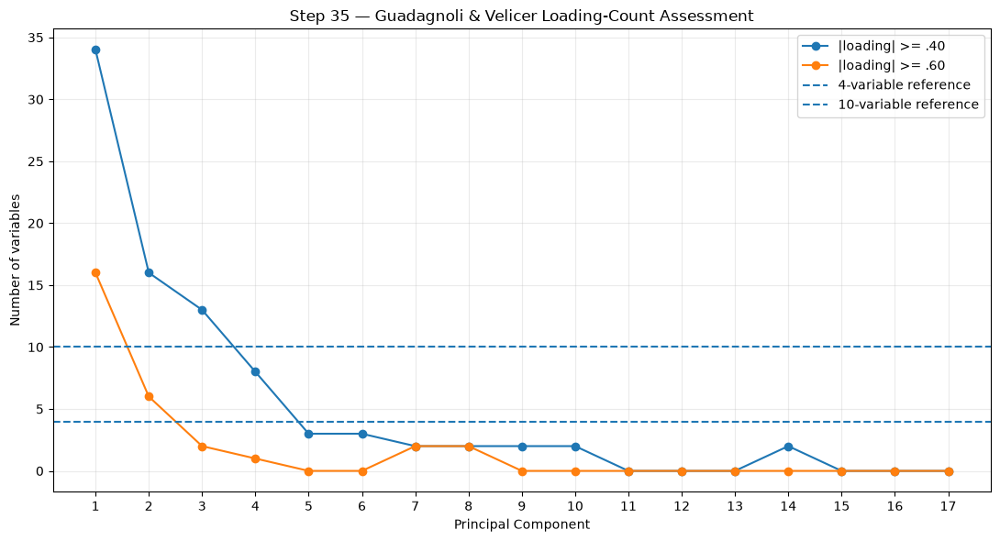


GUADAGNOLI & VELICER (1988) INTERPRETATION

Sample size:
  N = 673

Under the published recommendations:
  A component with >=4 loadings around |.60| or higher has particularly strong stability support.
  A component with approximately >=10 variables around |.40| can also be well supported when N is not very small.
  Components defined by only a few low loadings should be approached cautiously; G&V indicate that N around 300 or larger is required before such patterns are interpreted.

Current dataset:
  N = 673, so the absolute sample-size requirement for cautiously considering weakly defined patterns is satisfied.

However:
  Sample size alone does not make a weak component strongly defined.
  Loading magnitude and number of defining variables remain central to the assessment.

STEP 35 COMPLETE — GUADAGNOLI & VELICER (1988)

No invented saturation categories were used.

Assessment was based directly on:
  Number of variables loading on each component
  Magnitude of those loadings
  A

In [46]:
# ============================================================
# STEP 35 — GUADAGNOLI & VELICER (1988)
# COMPONENT-PATTERN STABILITY ASSESSMENT
# ============================================================
#
# PURPOSE
# -------
#
# Assess the stability / interpretability of the PCA component
# pattern using the post-analysis recommendations reported by:
#
# Guadagnoli, E. & Velicer, W. F. (1988).
# Relation of Sample Size to the Stability of Component Patterns.
# Psychological Bulletin, 103(2), 265-275.
#
#
# IMPORTANT METHODOLOGICAL NOTE
# -----------------------------
#
# This script does NOT attempt to reproduce the authors'
# complete Monte Carlo simulation study.
#
# Instead, it applies their published recommendations for
# assessing an observed component pattern after PCA.
#
#
# GUADAGNOLI & VELICER POST-ANALYSIS GUIDANCE
# --------------------------------------------
#
# The authors recommend evaluating:
#
#   1. The magnitude of component loadings.
#   2. The number of variables defining each component.
#   3. Absolute sample size.
#
#
# Their published recommendations include:
#
#   A. If a component has FOUR OR MORE variables with
#      loadings above approximately |.60|:
#
#          the pattern may be interpreted regardless
#          of sample size.
#
#
#   B. If a component is defined by MANY variables
#      (approximately 10-12) with relatively low loadings
#      around |.40|:
#
#          the solution should generally be accurate except
#          at very low sample sizes (N < 150).
#
#
#   C. If a component has only a FEW variables and LOW
#      component loadings:
#
#          the pattern should not generally be interpreted
#          unless the sample size is at least approximately
#          N = 300.
#
#
# In the present dataset:
#
#       N = 673
#
# Therefore, the sample-size condition in criterion C is met.
#
# HOWEVER:
#
# Meeting N >= 300 does NOT automatically make a weak
# component substantively meaningful.
#
# The script therefore reports the Guadagnoli & Velicer
# evidence directly and does NOT invent additional categories
# such as "well saturated", "moderately saturated", etc.
#
#
# No component is removed automatically in this step.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from IPython.display import display


# ============================================================
# 2. SETTINGS FROM GUADAGNOLI & VELICER (1988)
# ============================================================

HIGH_LOADING_THRESHOLD = 0.60


LOW_LOADING_REFERENCE = 0.40


HIGH_LOADING_VARIABLE_COUNT = 4


MANY_VARIABLES_LOWER_BOUND = 10


MANY_VARIABLES_UPPER_BOUND = 12


LOW_SAMPLE_BOUND = 150


WEAK_PATTERN_SAMPLE_BOUND = 300


# ============================================================
# 3. CURRENT RETENTION DIAGNOSTICS
# ============================================================

SCREE_COMPONENTS = 4

PARALLEL_COMPONENTS = 12

ORIGINAL_MAP_COMPONENTS = 11

REVISED_MAP_COMPONENTS = 17


# ============================================================
# 4. VERIFY REQUIRED PCA OBJECTS
# ============================================================

required_objects = [
    "pca_loadings",
    "X_standardized"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required PCA objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 31 before running Step 35."
    )


# ============================================================
# 5. VALIDATE PCA LOADING MATRIX
# ============================================================

if not isinstance(
    pca_loadings,
    pd.DataFrame
):

    raise RuntimeError(
        "`pca_loadings` is not a pandas DataFrame."
    )


if pca_loadings.empty:

    raise RuntimeError(
        "`pca_loadings` is empty."
    )


loading_matrix = (

    pca_loadings

    .astype(
        float
    )
)


if not np.isfinite(
    loading_matrix.to_numpy()
).all():

    raise RuntimeError(
        "The PCA loading matrix contains NaN or "
        "infinite values."
    )


# ============================================================
# 6. GET SAMPLE SIZE AND DIMENSIONS
# ============================================================

X_gv = np.asarray(
    X_standardized,
    dtype=float
)


if X_gv.ndim != 2:

    raise RuntimeError(
        "`X_standardized` must be two-dimensional."
    )


N, P = X_gv.shape


number_of_components = (
    loading_matrix.shape[1]
)


if (
    loading_matrix.shape[0]
    !=
    P
):

    raise RuntimeError(
        "The loading-matrix variable count does not match "
        "the standardized PCA matrix."
    )


# ============================================================
# 7. PRINT METHODOLOGICAL INPUT
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 35 — GUADAGNOLI & VELICER (1988) "
    "COMPONENT-PATTERN ASSESSMENT"
)


print(
    "=" * 130
)


print(
    "\nDataset:"
)


print(
    f"  Observations (N): {N:,}"
)


print(
    f"  Variables (P):    {P:,}"
)


print(
    "\nPublished assessment criteria used:"
)


print(
    "  >= 4 variables with |loading| >= .60"
)


print(
    "  approximately 10-12 variables around |loading| = .40"
)


print(
    "  weak / few-variable patterns require approximately "
    "N >= 300 before interpretation is considered"
)


print(
    "\nCurrent sample-size status:"
)


if N >= WEAK_PATTERN_SAMPLE_BOUND:

    print(
        f"  N = {N:,} >= {WEAK_PATTERN_SAMPLE_BOUND}"
    )


    print(
        "  Sample-size condition for weakly defined "
        "patterns is satisfied."
    )


elif N >= LOW_SAMPLE_BOUND:

    print(
        f"  {LOW_SAMPLE_BOUND} <= N < "
        f"{WEAK_PATTERN_SAMPLE_BOUND}"
    )


else:

    print(
        f"  N < {LOW_SAMPLE_BOUND}"
    )


# ============================================================
# 8. BUILD COMPONENT-LEVEL ASSESSMENT
# ============================================================

gv_rows = []


for component_number in range(
    1,
    number_of_components + 1
):

    component_name = (
        f"PC{component_number}"
    )


    component_loadings = (

        loading_matrix[
            component_name
        ]
    )


    absolute_loadings = (

        component_loadings
        .abs()
    )


    n_ge_060 = int(
        (
            absolute_loadings
            >=
            HIGH_LOADING_THRESHOLD
        )
        .sum()
    )


    n_ge_040 = int(
        (
            absolute_loadings
            >=
            LOW_LOADING_REFERENCE
        )
        .sum()
    )


    maximum_absolute_loading = float(
        absolute_loadings.max()
    )


    # --------------------------------------------------------
    # Direct criteria based on the paper's recommendations
    # --------------------------------------------------------

    criterion_four_at_060 = (
        n_ge_060
        >=
        HIGH_LOADING_VARIABLE_COUNT
    )


    criterion_many_at_040 = (
        n_ge_040
        >=
        MANY_VARIABLES_LOWER_BOUND
    )


    sample_ge_150 = (
        N
        >=
        LOW_SAMPLE_BOUND
    )


    sample_ge_300 = (
        N
        >=
        WEAK_PATTERN_SAMPLE_BOUND
    )


    # --------------------------------------------------------
    # Evidence statement
    #
    # No invented qualitative scale is used.
    # --------------------------------------------------------

    if criterion_four_at_060:

        gv_assessment = (
            "Meets G&V high-saturation criterion"
        )


    elif (
        criterion_many_at_040
        and
        sample_ge_150
    ):

        gv_assessment = (
            "Meets G&V many-variable / ~.40 criterion"
        )


    elif sample_ge_300:

        gv_assessment = (
            "Does not meet stronger loading-count criteria; "
            "N>=300 permits cautious interpretation of "
            "few/low-loading pattern"
        )


    else:

        gv_assessment = (
            "Weak/few-variable pattern with insufficient "
            "sample size under G&V guidance"
        )


    gv_rows.append(
        {

            "component":
                component_name,

            "component_number":
                component_number,

            "maximum_absolute_loading":
                maximum_absolute_loading,

            "variables_abs_loading_ge_040":
                n_ge_040,

            "variables_abs_loading_ge_060":
                n_ge_060,

            "criterion_4_or_more_ge_060":
                criterion_four_at_060,

            "criterion_10_or_more_ge_040":
                criterion_many_at_040,

            "sample_N_ge_150":
                sample_ge_150,

            "sample_N_ge_300":
                sample_ge_300,

            "GV_1988_assessment":
                gv_assessment
        }
    )


guadagnoli_velicer_component_assessment = pd.DataFrame(
    gv_rows
)


# ============================================================
# 9. DISPLAY PC1-PC17
# ============================================================

candidate_max_pc = min(
    17,
    number_of_components
)


gv_candidate_components = (

    guadagnoli_velicer_component_assessment[
        guadagnoli_velicer_component_assessment[
            "component_number"
        ]
        <=
        candidate_max_pc
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 170
)


print(
    "GUADAGNOLI & VELICER (1988) ASSESSMENT — PC1-PC17"
)


print(
    "=" * 170
)


display(
    gv_candidate_components.round(
        4
    )
)


# ============================================================
# 10. IDENTIFY COMPONENTS MEETING THE STRONGEST G&V RULE
# ============================================================

gv_high_saturation_components = (

    guadagnoli_velicer_component_assessment[
        guadagnoli_velicer_component_assessment[
            "criterion_4_or_more_ge_060"
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 140
)


print(
    "COMPONENTS WITH >= 4 LOADINGS AT |.60| OR ABOVE"
)


print(
    "=" * 140
)


if gv_high_saturation_components.empty:

    print(
        "\nNone."
    )


else:

    display(
        gv_high_saturation_components[
            [
                "component",
                "variables_abs_loading_ge_060",
                "maximum_absolute_loading"
            ]
        ]
        .round(
            4
        )
    )


# ============================================================
# 11. IDENTIFY COMPONENTS WITH >=10 LOADINGS AT |.40|
# ============================================================

gv_many_variable_components = (

    guadagnoli_velicer_component_assessment[
        guadagnoli_velicer_component_assessment[
            "criterion_10_or_more_ge_040"
        ]
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 140
)


print(
    "COMPONENTS WITH >= 10 LOADINGS AT |.40| OR ABOVE"
)


print(
    "=" * 140
)


if gv_many_variable_components.empty:

    print(
        "\nNone."
    )


else:

    display(
        gv_many_variable_components[
            [
                "component",
                "variables_abs_loading_ge_040",
                "maximum_absolute_loading"
            ]
        ]
        .round(
            4
        )
    )


# ============================================================
# 12. DISPLAY CURRENT RETENTION BOUNDARIES
# ============================================================

key_component_numbers = sorted(
    set(
        [
            SCREE_COMPONENTS,
            ORIGINAL_MAP_COMPONENTS,
            PARALLEL_COMPONENTS,
            REVISED_MAP_COMPONENTS
        ]
    )
)


gv_retention_boundary_comparison = (

    guadagnoli_velicer_component_assessment[
        guadagnoli_velicer_component_assessment[
            "component_number"
        ]
        .isin(
            key_component_numbers
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 170
)


print(
    "GUADAGNOLI & VELICER ASSESSMENT "
    "AT CURRENT RETENTION BOUNDARIES"
)


print(
    "=" * 170
)


display(
    gv_retention_boundary_comparison.round(
        4
    )
)


# ============================================================
# 13. PRINT STRONGEST LOADINGS FOR PC1-PC17
# ============================================================

TOP_LOADINGS_TO_SHOW = 12


gv_top_loadings = {}


for component_number in range(
    1,
    candidate_max_pc + 1
):

    component_name = (
        f"PC{component_number}"
    )


    component_series = (

        loading_matrix[
            component_name
        ]
    )


    ordered_indices = (

        component_series
        .abs()

        .sort_values(
            ascending=False
        )

        .index
    )


    strongest = (

        component_series

        .loc[
            ordered_indices
        ]

        .head(
            TOP_LOADINGS_TO_SHOW
        )
    )


    strongest_table = pd.DataFrame(
        {

            "variable":
                strongest.index,

            "loading":
                strongest.values,

            "absolute_loading":
                strongest.abs().values
        }
    )


    strongest_table[
        "abs_loading_ge_040"
    ] = (

        strongest_table[
            "absolute_loading"
        ]
        >=
        LOW_LOADING_REFERENCE
    )


    strongest_table[
        "abs_loading_ge_060"
    ] = (

        strongest_table[
            "absolute_loading"
        ]
        >=
        HIGH_LOADING_THRESHOLD
    )


    gv_top_loadings[
        component_name
    ] = strongest_table


# ============================================================
# 14. DISPLAY LOADINGS AROUND IMPORTANT BOUNDARY
# ============================================================
#
# PC4-PC17 are shown because they span the competing
# retention recommendations.
#
# ============================================================

for component_number in range(
    4,
    candidate_max_pc + 1
):

    component_name = (
        f"PC{component_number}"
    )


    print(
        "\n"
        + "-" * 120
    )


    print(
        component_name
    )


    print(
        "-" * 120
    )


    display(
        gv_top_loadings[
            component_name
        ]
        .round(
            4
        )
    )


# ============================================================
# 15. PLOT NUMBER OF LOADINGS >= .40 AND >= .60
# ============================================================

plot_df = (

    gv_candidate_components

    .copy()
)


fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    plot_df[
        "component_number"
    ],

    plot_df[
        "variables_abs_loading_ge_040"
    ],

    marker="o",

    label=
        "|loading| >= .40"
)


ax.plot(

    plot_df[
        "component_number"
    ],

    plot_df[
        "variables_abs_loading_ge_060"
    ],

    marker="o",

    label=
        "|loading| >= .60"
)


ax.axhline(

    HIGH_LOADING_VARIABLE_COUNT,

    linestyle="--",

    label=
        "4-variable reference"
)


ax.axhline(

    MANY_VARIABLES_LOWER_BOUND,

    linestyle="--",

    label=
        "10-variable reference"
)


ax.set_xlabel(
    "Principal Component"
)


ax.set_ylabel(
    "Number of variables"
)


ax.set_title(
    "Step 35 — Guadagnoli & Velicer Loading-Count Assessment"
)


ax.set_xticks(
    range(
        1,
        candidate_max_pc + 1
    )
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 16. CREATE RETENTION-EVIDENCE TABLE
# ============================================================

component_retention_evidence = pd.DataFrame(
    {

        "method": [
            "Cattell Scree Test",
            "Horn Parallel Analysis",
            "Velicer Original MAP",
            "Velicer Revised MAP"
        ],

        "components_suggested": [
            SCREE_COMPONENTS,
            PARALLEL_COMPONENTS,
            ORIGINAL_MAP_COMPONENTS,
            REVISED_MAP_COMPONENTS
        ]
    }
)


# ============================================================
# 17. PRINT DIRECT METHODOLOGICAL CONCLUSION
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "GUADAGNOLI & VELICER (1988) INTERPRETATION"
)


print(
    "=" * 130
)


print(
    "\nSample size:"
)


print(
    f"  N = {N:,}"
)


print(
    "\nUnder the published recommendations:"
)


print(
    "  A component with >=4 loadings around |.60| or "
    "higher has particularly strong stability support."
)


print(
    "  A component with approximately >=10 variables "
    "around |.40| can also be well supported when N is "
    "not very small."
)


print(
    "  Components defined by only a few low loadings "
    "should be approached cautiously; G&V indicate that "
    "N around 300 or larger is required before such "
    "patterns are interpreted."
)


print(
    "\nCurrent dataset:"
)


print(
    f"  N = {N:,}, so the absolute sample-size requirement "
    "for cautiously considering weakly defined patterns "
    "is satisfied."
)


print(
    "\nHowever:"
)


print(
    "  Sample size alone does not make a weak component "
    "strongly defined."
)


print(
    "  Loading magnitude and number of defining variables "
    "remain central to the assessment."
)


# ============================================================
# 18. FINAL STEP 35 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 35 COMPLETE — GUADAGNOLI & VELICER (1988)"
)


print(
    "=" * 130
)


print(
    "\nNo invented saturation categories were used."
)


print(
    "\nAssessment was based directly on:"
)


print(
    "  Number of variables loading on each component"
)


print(
    "  Magnitude of those loadings"
)


print(
    "  Absolute sample size"
)


print(
    "\nKey loading references:"
)


print(
    "  |.60| with >=4 defining variables"
)


print(
    "  |.40| with approximately 10-12 defining variables"
)


print(
    "\nAbsolute sample-size references:"
)


print(
    "  N < 150: low-loading patterns are problematic"
)


print(
    "  N >= 300: few-variable / low-loading patterns may "
    "be cautiously interpreted"
)


print(
    "\nMain output objects:"
)


print(
    "  guadagnoli_velicer_component_assessment"
)


print(
    "  gv_candidate_components"
)


print(
    "  gv_high_saturation_components"
)


print(
    "  gv_many_variable_components"
)


print(
    "  gv_retention_boundary_comparison"
)


print(
    "  gv_top_loadings"
)


print(
    "\nIMPORTANT:"
)


print(
    "  No PCA components were removed."
)


print(
    "  No PCA was re-fitted."
)


print(
    "  Step 31 remains the underlying PCA solution."
)


print(
    "\n"
    + "=" * 130
)

### 36. Bootstrap PCA Component-Pattern Stability


STEP 36 — BOOTSTRAP PCA COMPONENT-PATTERN STABILITY

Dataset:
  Observations: 673
  Variables:    74

Bootstrap replications:
  1,000

Components evaluated:
  PC1-PC17

Bootstrap pipeline:
  Resample players with replacement
  Re-standardize within bootstrap sample
  Re-fit classical PCA
  Match bootstrap PCs to original PCs
  Correct arbitrary sign reversals
  Measure loading-pattern congruence

BOOTSTRAP COMPONENT-PATTERN STABILITY — PC1-PC17


,component,reference_eigenvalue,reference_variance_percent,mean_congruence,median_congruence,congruence_p5,congruence_p25,congruence_p75,congruence_p95,minimum_congruence,same_ordinal_PC_percent,median_matched_PC
0,PC1,13.4065,18.0899,0.9956,0.9962,0.9914,0.9948,0.9970,0.9978,0.9819,100.0,1.0
1,PC2,7.8197,10.5515,0.9834,0.9889,0.9531,0.9814,0.9922,0.9945,0.7975,100.0,2.0
2,PC3,6.0584,8.1748,0.9791,0.9841,0.9509,0.9767,0.9880,0.9915,0.7954,100.0,3.0
3,PC4,3.0061,4.0563,0.8809,0.9148,0.7030,0.8292,0.9497,0.9729,0.5916,84.6,4.0
4,PC5,2.7332,3.6880,0.8307,0.8512,0.6530,0.7609,0.9115,0.9533,0.4187,78.2,5.0
5,PC6,2.3808,3.2125,0.8135,0.8286,0.6278,0.7468,0.8916,0.9386,0.4481,81.2,6.0
6,PC7,2.1573,2.9110,0.7842,0.7979,0.6116,0.7177,0.8637,0.9175,0.3981,78.1,7.0
7,PC8,1.9208,2.5918,0.7737,0.7872,0.5788,0.7106,0.8562,0.9147,0.3354,80.2,8.0
8,PC9,1.7126,2.3109,0.7099,0.7193,0.5253,0.6281,0.7986,0.8752,0.3652,57.3,9.0
9,PC10,1.6301,2.1995,0.6627,0.6671,0.4573,0.5859,0.7485,0.8433,0.1837,43.4,10.0



FOCUSED STABILITY VIEW — PC1-PC10


,component,reference_eigenvalue,reference_variance_percent,mean_congruence,median_congruence,congruence_p5,congruence_p25,congruence_p75,congruence_p95,minimum_congruence,same_ordinal_PC_percent,median_matched_PC
0,PC1,13.4065,18.0899,0.9956,0.9962,0.9914,0.9948,0.9970,0.9978,0.9819,100.0,1.0
1,PC2,7.8197,10.5515,0.9834,0.9889,0.9531,0.9814,0.9922,0.9945,0.7975,100.0,2.0
2,PC3,6.0584,8.1748,0.9791,0.9841,0.9509,0.9767,0.9880,0.9915,0.7954,100.0,3.0
3,PC4,3.0061,4.0563,0.8809,0.9148,0.7030,0.8292,0.9497,0.9729,0.5916,84.6,4.0
4,PC5,2.7332,3.6880,0.8307,0.8512,0.6530,0.7609,0.9115,0.9533,0.4187,78.2,5.0
5,PC6,2.3808,3.2125,0.8135,0.8286,0.6278,0.7468,0.8916,0.9386,0.4481,81.2,6.0
6,PC7,2.1573,2.9110,0.7842,0.7979,0.6116,0.7177,0.8637,0.9175,0.3981,78.1,7.0
7,PC8,1.9208,2.5918,0.7737,0.7872,0.5788,0.7106,0.8562,0.9147,0.3354,80.2,8.0
8,PC9,1.7126,2.3109,0.7099,0.7193,0.5253,0.6281,0.7986,0.8752,0.3652,57.3,9.0
9,PC10,1.6301,2.1995,0.6627,0.6671,0.4573,0.5859,0.7485,0.8433,0.1837,43.4,10.0



BOOTSTRAP STABILITY — PC4-PC8 RETENTION BOUNDARY


,component,reference_eigenvalue,reference_variance_percent,mean_congruence,median_congruence,congruence_p5,congruence_p25,congruence_p75,congruence_p95,minimum_congruence,same_ordinal_PC_percent,median_matched_PC
0,PC4,3.0061,4.0563,0.8809,0.9148,0.7030,0.8292,0.9497,0.9729,0.5916,84.6,4.0
1,PC5,2.7332,3.6880,0.8307,0.8512,0.6530,0.7609,0.9115,0.9533,0.4187,78.2,5.0
2,PC6,2.3808,3.2125,0.8135,0.8286,0.6278,0.7468,0.8916,0.9386,0.4481,81.2,6.0
3,PC7,2.1573,2.9110,0.7842,0.7979,0.6116,0.7177,0.8637,0.9175,0.3981,78.1,7.0
4,PC8,1.9208,2.5918,0.7737,0.7872,0.5788,0.7106,0.8562,0.9147,0.3354,80.2,8.0



--------------------------------------------------------------------------------------------------------------------------------------------
PC1 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC1,squawka_passes_completed_own_half_per_90,0.8216,0.8203,0.7965,0.8416,True,0.8216
1,PC1,squawka_forward_passes_per_90,0.7318,0.7331,0.6941,0.7677,True,0.7318
2,PC1,squawka_touches_in_opposition_box_per_90,-0.7210,-0.7203,-0.7550,-0.6863,True,0.7210
3,PC1,squawka_passes_completed_per_90,0.7103,0.7119,0.6580,0.7578,True,0.7103
4,PC1,squawka_passes_attempted_per_90,0.7069,0.7087,0.6529,0.7554,True,0.7069
5,PC1,squawka_open_play_passes_completed_per_90,0.7050,0.7065,0.6515,0.7528,True,0.7050
6,PC1,squawka_open_play_passes_per_90,0.7006,0.7019,0.6457,0.7493,True,0.7006
7,PC1,squawka_sideways_passes_per_90,0.6944,0.6959,0.6460,0.7373,True,0.6944
8,PC1,squawka_shots_on_target_per_90,-0.6753,-0.6756,-0.7171,-0.6248,True,0.6753
9,PC1,squawka_shots_excl_blocks_per_90,-0.6649,-0.6642,-0.7069,-0.6122,True,0.6649



--------------------------------------------------------------------------------------------------------------------------------------------
PC2 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC2,squawka_passes_completed_opp_half_per_90,0.8382,0.8307,0.7807,0.8623,True,0.8382
1,PC2,squawka_touches_per_90,0.7377,0.7302,0.6579,0.7867,True,0.7377
2,PC2,squawka_open_play_passes_per_90,0.6526,0.6469,0.5430,0.7174,True,0.6526
3,PC2,squawka_passes_attempted_per_90,0.6499,0.6438,0.5377,0.7170,True,0.6499
4,PC2,squawka_open_play_passes_completed_per_90,0.6413,0.6356,0.5283,0.7076,True,0.6413
5,PC2,squawka_passes_completed_per_90,0.6379,0.6327,0.5224,0.7061,True,0.6379
6,PC2,squawka_sideways_passes_per_90,0.5700,0.5660,0.4454,0.6420,True,0.5700
7,PC2,squawka_chances_created_per_90,0.5667,0.5679,0.4844,0.6423,True,0.5667
8,PC2,squawka_backward_passes_per_90,0.5119,0.5111,0.4165,0.5945,True,0.5119
9,PC2,squawka_passing_accuracy,0.4616,0.4581,0.3676,0.5196,True,0.4616



--------------------------------------------------------------------------------------------------------------------------------------------
PC3 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC3,squawka_goals_from_inside_box_per_90,0.6126,0.6058,0.5395,0.6685,True,0.6126
1,PC3,squawka_goals_per_90,0.6090,0.6034,0.5270,0.6726,True,0.6090
2,PC3,squawka_non_penalty_goals_per_90,0.5803,0.5727,0.4991,0.6469,True,0.5803
3,PC3,squawka_home_goals_per_90,0.5103,0.5034,0.4359,0.5690,True,0.5103
4,PC3,squawka_conversion_rate,0.5095,0.5070,0.4177,0.5838,True,0.5095
5,PC3,squawka_ground_duels_contested_per_90,-0.5088,-0.4985,-0.5760,-0.4039,True,0.5088
6,PC3,squawka_ground_duels_won_per_90,-0.4921,-0.4816,-0.5680,-0.3809,True,0.4921
7,PC3,squawka_crosses_attempted_per_90,-0.4701,-0.4636,-0.5602,-0.3522,True,0.4701
8,PC3,squawka_possession_lost_per_90,-0.4679,-0.4634,-0.5339,-0.3672,True,0.4679
9,PC3,squawka_winning_goal_per_90,0.4361,0.4312,0.3530,0.4961,True,0.4361



--------------------------------------------------------------------------------------------------------------------------------------------
PC4 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC4,squawka_crosses_completed_per_90,0.6202,0.5705,0.4192,0.6517,True,0.6202
1,PC4,squawka_open_play_crosses_completed_per_90,0.5540,0.5098,0.3668,0.5914,True,0.5540
2,PC4,squawka_crosses_attempted_per_90,0.4986,0.4572,0.3327,0.5361,True,0.4986
3,PC4,squawka_ground_duels_contested_per_90,-0.4743,-0.4603,-0.5673,-0.2210,True,0.4743
4,PC4,squawka_fouls_per_90,-0.4607,-0.4274,-0.5738,-0.2014,True,0.4607
5,PC4,squawka_corners_taken_per_90,0.4255,0.3906,0.2706,0.4629,True,0.4255
6,PC4,squawka_fouls_from_tackle_attempts_per_90,-0.4064,-0.3868,-0.5520,-0.1237,True,0.4064
7,PC4,squawka_ground_duels_won_per_90,-0.4037,-0.3982,-0.5719,-0.0885,True,0.4037
8,PC4,squawka_crossing_accuracy,0.3726,0.3434,0.1980,0.4457,True,0.3726
9,PC4,squawka_tackles_made_per_90,-0.3040,-0.3017,-0.4962,0.0128,False,0.3040



--------------------------------------------------------------------------------------------------------------------------------------------
PC5 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC5,squawka_aerial_duels_contested_per_90,0.4688,0.4264,0.1092,0.6338,True,0.4688
1,PC5,squawka_aerial_duels_won_per_90,0.4586,0.4197,0.0772,0.6455,True,0.4586
2,PC5,squawka_shots_off_target_per_90,0.4255,0.3811,0.1584,0.5121,True,0.4255
3,PC5,sofascore_big_chances_missed_per_90,0.3825,0.3449,0.1337,0.4696,True,0.3825
4,PC5,squawka_conversion_rate,-0.3796,-0.3294,-0.4094,-0.2096,True,0.3796
5,PC5,squawka_touches_in_opposition_box_per_90,0.3737,0.3347,0.1914,0.4284,True,0.3737
6,PC5,squawka_tackles_made_per_90,-0.3682,-0.3272,-0.5303,-0.0154,True,0.3682
7,PC5,squawka_shots_excl_blocks_per_90,0.3401,0.3034,0.1370,0.4162,True,0.3401
8,PC5,squawka_ground_duels_won_per_90,-0.3248,-0.2891,-0.5424,0.0637,False,0.3248
9,PC5,squawka_interceptions_per_90,-0.3070,-0.2633,-0.3711,-0.1098,True,0.3070



--------------------------------------------------------------------------------------------------------------------------------------------
PC6 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC6,squawka_aerial_duels_won_per_90,0.4868,0.4121,0.0870,0.6442,True,0.4868
1,PC6,squawka_ground_duel_success,0.4616,0.3985,0.0945,0.5969,True,0.4616
2,PC6,squawka_aerial_duels_contested_per_90,0.4404,0.3780,0.0699,0.5944,True,0.4404
3,PC6,squawka_ground_duels_won_per_90,0.3911,0.3351,0.0945,0.5200,True,0.3911
4,PC6,squawka_clearances_per_90,0.3312,0.2833,0.1619,0.3653,True,0.3312
5,PC6,squawka_lay_offs_completed_per_90,-0.3300,-0.2874,-0.4077,-0.1412,True,0.3300
6,PC6,squawka_passing_accuracy,-0.3218,-0.2803,-0.4177,-0.0669,True,0.3218
7,PC6,squawka_backward_passes_per_90,-0.3098,-0.2610,-0.3601,-0.1354,True,0.3098
8,PC6,squawka_possession_lost_per_90,0.2970,0.2565,0.0809,0.3787,True,0.2970
9,PC6,squawka_tackles_made_per_90,0.2952,0.2539,-0.0038,0.4707,False,0.2952



--------------------------------------------------------------------------------------------------------------------------------------------
PC7 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC7,squawka_fouls_per_90,0.6421,0.5312,0.3271,0.6886,True,0.6421
1,PC7,squawka_fouls_from_tackle_attempts_per_90,0.6187,0.5098,0.3089,0.6628,True,0.6187
2,PC7,fbref_crdy_per_90,0.3652,0.2970,0.1033,0.4576,True,0.3652
3,PC7,squawka_aerial_duels_won_per_90,0.3117,0.2621,-0.0798,0.5526,False,0.3117
4,PC7,squawka_ground_duel_success,-0.3103,-0.2667,-0.5346,0.0926,False,0.3103
5,PC7,squawka_take_ons_completed_per_90,-0.2857,-0.2395,-0.3659,-0.0613,True,0.2857
6,PC7,squawka_aerial_duels_contested_per_90,0.2574,0.2114,-0.0889,0.4763,False,0.2574
7,PC7,sofascore_distance_covered_per_90_km,0.2508,0.2063,-0.0227,0.3680,False,0.2508
8,PC7,squawka_long_passes_attempted_per_90,0.2462,0.1977,-0.0198,0.3798,False,0.2462
9,PC7,squawka_passing_accuracy,-0.2431,-0.1947,-0.3780,0.0220,False,0.2431



--------------------------------------------------------------------------------------------------------------------------------------------
PC8 — STRONGEST LOADING BOOTSTRAP STABILITY
--------------------------------------------------------------------------------------------------------------------------------------------


,component,variable,reference_loading,bootstrap_median_loading,bootstrap_p5,bootstrap_p95,interval_excludes_zero,absolute_reference_loading
0,PC8,fbref_pkatt_per_90,0.7595,0.6234,0.4177,0.7657,True,0.7595
1,PC8,fbref_pk_per_90,0.7410,0.6120,0.3882,0.7580,True,0.7410
2,PC8,squawka_ground_duel_success,0.3397,0.2695,0.0374,0.4840,True,0.3397
3,PC8,squawka_penalties_won_per_90,0.3221,0.2626,0.0460,0.4327,True,0.3221
4,PC8,squawka_ground_duels_won_per_90,0.2444,0.1976,0.0506,0.3318,True,0.2444
5,PC8,squawka_offsides_per_90,0.2347,0.1606,-0.0946,0.4159,False,0.2347
6,PC8,squawka_tackles_made_per_90,0.2268,0.1810,-0.0183,0.3422,False,0.2268
7,PC8,squawka_fouls_won_per_90,0.2051,0.1687,0.0252,0.2899,True,0.2051
8,PC8,sofascore_number_of_sprints_per_90,-0.1874,-0.1567,-0.3509,0.0811,False,0.1874
9,PC8,sofascore_distance_covered_per_90_km,-0.1811,-0.1514,-0.3317,0.0333,False,0.1811


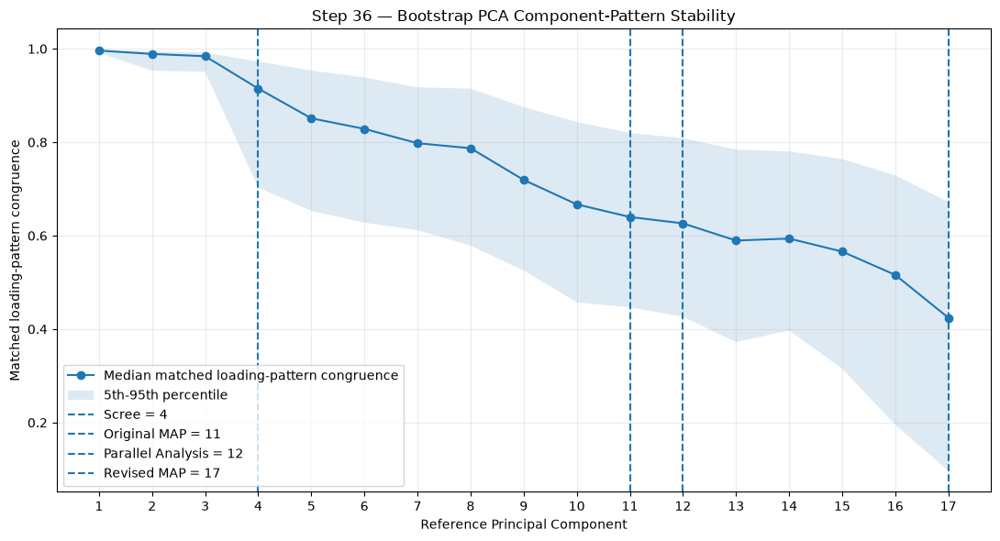

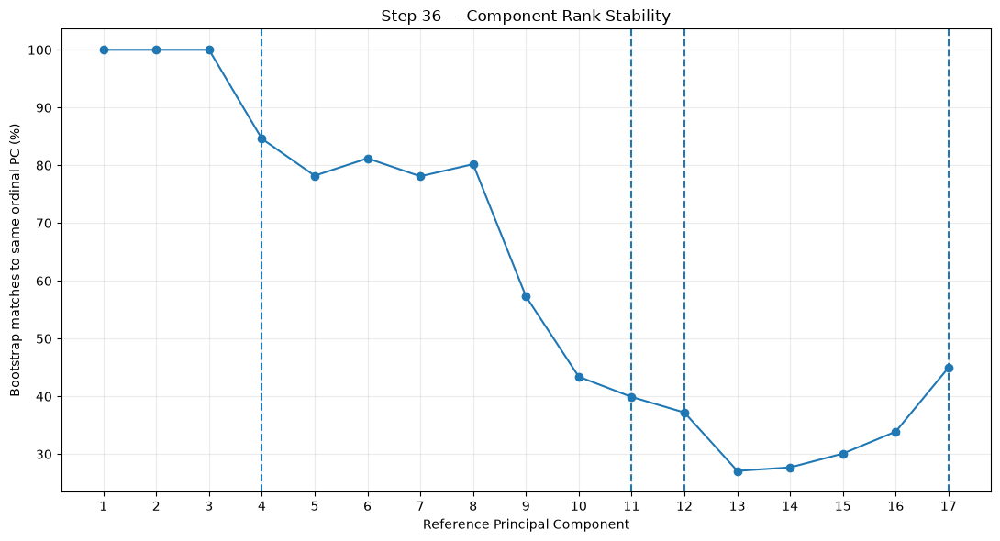


COMPONENT-RETENTION EVIDENCE INCLUDING BOOTSTRAP


,method,result
0,Cattell Scree Test,4 PCs
1,Horn Parallel Analysis,12 PCs
2,Velicer Original MAP,11 PCs
3,Velicer Revised MAP,17 PCs
4,Guadagnoli & Velicer loading-pattern assessment,Strongest support concentrated in early PCs
5,Bootstrap component-pattern stability,See bootstrap_component_stability



HOW TO INTERPRET STEP 36

The key column is:
  median_congruence

Also inspect:
  congruence_p5

This tells us whether a component usually reproduces its loading pattern and how weak that reproduction can be across bootstrap samples.

Pay particular attention to:
  PC1-PC4
  versus
  PC5-PC8

If PC1-PC4 show clearly stronger and more consistent loading-pattern congruence than later PCs, the bootstrap evidence would reinforce the 4-component Scree solution.

If PC5-PC6 reproduce almost as consistently as PC1-PC4, then a somewhat larger solution remains defensible.

Do not interpret component-order swaps alone as failure.
  Components with similar eigenvalues can change order.
  This is why the primary statistic uses optimal loading-pattern matching.

STEP 36 COMPLETE — BOOTSTRAP PCA PATTERN STABILITY

Bootstrap replications:
  1,000

Observations per bootstrap sample:
  673

Performance variables:
  74

Components evaluated:
  PC1-PC17

Matching procedure:
  Hungarian optimal one-to-on

In [47]:
# ============================================================
# STEP 36 — BOOTSTRAP PCA COMPONENT-PATTERN STABILITY
# ============================================================
#
# PURPOSE
# -------
#
# Empirically test whether the component patterns found in
# Step 31 reproduce when the player sample is resampled.
#
# This follows directly from the stability question raised by:
#
# Guadagnoli, E. & Velicer, W. F. (1988).
# Relation of Sample Size to the Stability of Component Patterns.
# Psychological Bulletin, 103(2), 265-275.
#
#
# IMPORTANT
# ---------
#
# Guadagnoli & Velicer (1988) studied component-pattern
# stability through simulation.
#
# This step does NOT claim to reproduce their Monte Carlo study
# verbatim.
#
# Instead, it performs an empirical bootstrap stability
# diagnostic on THIS dataset.
#
#
# PROCEDURE
# ---------
#
# For each bootstrap replication:
#
#   1. Sample N players WITH replacement.
#
#   2. Standardize all performance variables again inside
#      that bootstrap sample.
#
#   3. Re-run classical PCA.
#
#   4. Compare the bootstrap loading patterns with the
#      original Step 31 loading patterns.
#
#   5. Allow components to switch order.
#
#      PCA components can occasionally exchange positions
#      across bootstrap samples when eigenvalues are similar.
#
#      Therefore, components are matched using the Hungarian
#      assignment algorithm so that the bootstrap loading
#      patterns are paired with the most similar original
#      component patterns.
#
#   6. Correct arbitrary PCA sign reversals.
#
#      A loading vector and its negative represent the same
#      principal component mathematically.
#
#   7. Quantify component-pattern similarity using Tucker-style
#      congruence:
#
#            phi = (a' b) /
#                  sqrt[(a' a)(b' b)]
#
#
# PRIMARY QUESTION
# ----------------
#
# Do PC1-PC4 reproduce consistently?
#
# And, compared with them, how stable are PC5-PC17?
#
#
# CURRENT RETENTION EVIDENCE
# --------------------------
#
#   Scree Test:             4 PCs
#   Horn Parallel Analysis: 12 PCs
#   Velicer Original MAP:   11 PCs
#   Velicer Revised MAP:    17 PCs
#
#   Guadagnoli & Velicer loading assessment:
#
#       PC1-PC3 = strongest loading-pattern support
#       PC4     = plausible / interpretable
#       later PCs increasingly narrow or weakly defined
#
#
# THIS STEP IS DIAGNOSTIC ONLY.
#
# No PCA components are deleted.
# No player observations are deleted.
# Step 31 remains the reference PCA solution.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from scipy.optimize import linear_sum_assignment

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

N_BOOTSTRAPS = 1000


RANDOM_STATE = 42


# ------------------------------------------------------------
# Examine all PCs implicated by the existing diagnostics.
# ------------------------------------------------------------

MAX_PC_TO_TEST = 17


# ------------------------------------------------------------
# Quantiles reported for bootstrap stability.
#
# These are descriptive uncertainty summaries.
# ------------------------------------------------------------

LOWER_PERCENTILE = 5

UPPER_PERCENTILE = 95


# ============================================================
# 3. VERIFY REQUIRED OBJECTS EXIST
# ============================================================

required_objects = [
    "X_df",
    "pca_loadings",
    "pca_eigenvalues",
    "pca_explained_variance_percent",
    "pca_variables"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required PCA / preprocessing objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Steps 30 and 31 before running Step 36."
    )


# ============================================================
# 4. PREPARE ORIGINAL PERFORMANCE MATRIX
# ============================================================
#
# X_df contains the non-standardized performance variables
# entering Step 30.
#
# We deliberately resample X_df rather than simply resampling
# the already standardized matrix.
#
# This lets each bootstrap replication reproduce the pipeline:
#
#       sample players
#       -> standardize
#       -> PCA
#
# ============================================================

X_original_df = (

    X_df[
        pca_variables
    ]

    .copy()
)


X_original = X_original_df.to_numpy(
    dtype=float
)


if not np.isfinite(
    X_original
).all():

    raise RuntimeError(
        "The original performance matrix contains NaN or "
        "infinite values."
    )


N, P = X_original.shape


# ============================================================
# 5. VALIDATE PCA LOADING MATRIX
# ============================================================

if not isinstance(
    pca_loadings,
    pd.DataFrame
):

    raise RuntimeError(
        "`pca_loadings` is not a pandas DataFrame."
    )


if (
    pca_loadings.shape[
        0
    ]
    !=
    P
):

    raise RuntimeError(
        "The Step 31 loading matrix does not have the same "
        "number of variables as X_df."
    )


if (
    MAX_PC_TO_TEST
    >
    pca_loadings.shape[
        1
    ]
):

    MAX_PC_TO_TEST = (
        pca_loadings.shape[
            1
        ]
    )


# ============================================================
# 6. CREATE REFERENCE LOADING MATRIX
# ============================================================
#
# Only PC1-PC17 are used in the matching problem.
#
# Components can exchange positions within this candidate
# solution during bootstrap resampling.
#
# ============================================================

reference_component_names = [
    f"PC{i}"
    for i in range(
        1,
        MAX_PC_TO_TEST + 1
    )
]


reference_loadings = (

    pca_loadings[
        reference_component_names
    ]

    .to_numpy(
        dtype=float
    )
)


reference_eigenvalues = np.asarray(
    pca_eigenvalues[
        :MAX_PC_TO_TEST
    ],
    dtype=float
)


reference_variance = np.asarray(
    pca_explained_variance_percent[
        :MAX_PC_TO_TEST
    ],
    dtype=float
)


# ============================================================
# 7. TUCKER-STYLE CONGRUENCE FUNCTION
# ============================================================

def loading_congruence(
    vector_a,
    vector_b
):

    vector_a = np.asarray(
        vector_a,
        dtype=float
    )


    vector_b = np.asarray(
        vector_b,
        dtype=float
    )


    denominator = (

        np.sqrt(
            np.sum(
                vector_a ** 2
            )
        )

        *

        np.sqrt(
            np.sum(
                vector_b ** 2
            )
        )
    )


    if denominator <= 0:

        return np.nan


    return float(
        np.dot(
            vector_a,
            vector_b
        )
        /
        denominator
    )


# ============================================================
# 8. PRINT INPUT SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 36 — BOOTSTRAP PCA COMPONENT-PATTERN STABILITY"
)


print(
    "=" * 130
)


print(
    "\nDataset:"
)


print(
    f"  Observations: {N:,}"
)


print(
    f"  Variables:    {P:,}"
)


print(
    "\nBootstrap replications:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nComponents evaluated:"
)


print(
    f"  PC1-PC{MAX_PC_TO_TEST}"
)


print(
    "\nBootstrap pipeline:"
)


print(
    "  Resample players with replacement"
)


print(
    "  Re-standardize within bootstrap sample"
)


print(
    "  Re-fit classical PCA"
)


print(
    "  Match bootstrap PCs to original PCs"
)


print(
    "  Correct arbitrary sign reversals"
)


print(
    "  Measure loading-pattern congruence"
)


# ============================================================
# 9. RANDOM NUMBER GENERATOR
# ============================================================

rng = np.random.default_rng(
    RANDOM_STATE
)


# ============================================================
# 10. STORAGE ARRAYS
# ============================================================
#
# Dimensions:
#
#   bootstrap × reference component
#
# ============================================================

bootstrap_congruence = np.full(
    (
        N_BOOTSTRAPS,
        MAX_PC_TO_TEST
    ),
    np.nan,
    dtype=float
)


bootstrap_matched_component = np.full(
    (
        N_BOOTSTRAPS,
        MAX_PC_TO_TEST
    ),
    np.nan,
    dtype=float
)


bootstrap_eigenvalues = np.full(
    (
        N_BOOTSTRAPS,
        MAX_PC_TO_TEST
    ),
    np.nan,
    dtype=float
)


bootstrap_explained_variance = np.full(
    (
        N_BOOTSTRAPS,
        MAX_PC_TO_TEST
    ),
    np.nan,
    dtype=float
)


# ------------------------------------------------------------
# Store aligned loading vectors:
#
#   bootstrap × variable × reference PC
# ------------------------------------------------------------

bootstrap_aligned_loadings = np.full(
    (
        N_BOOTSTRAPS,
        P,
        MAX_PC_TO_TEST
    ),
    np.nan,
    dtype=float
)


# ============================================================
# 11. RUN BOOTSTRAP PCA
# ============================================================

for bootstrap_index in range(
    N_BOOTSTRAPS
):

    # --------------------------------------------------------
    # Draw players with replacement
    # --------------------------------------------------------

    sampled_indices = rng.integers(
        low=0,
        high=N,
        size=N
    )


    X_bootstrap_raw = (

        X_original[
            sampled_indices,
            :
        ]
    )


    # --------------------------------------------------------
    # Re-standardize inside bootstrap sample
    # --------------------------------------------------------

    bootstrap_scaler = StandardScaler(
        with_mean=True,
        with_std=True
    )


    X_bootstrap_standardized = (

        bootstrap_scaler

        .fit_transform(
            X_bootstrap_raw
        )
    )


    # --------------------------------------------------------
    # Safety check
    # --------------------------------------------------------

    if not np.isfinite(
        X_bootstrap_standardized
    ).all():

        raise RuntimeError(
            "A bootstrap sample produced non-finite "
            "standardized values."
        )


    # --------------------------------------------------------
    # Fit PCA
    # --------------------------------------------------------

    bootstrap_pca = PCA(
        n_components=None,
        svd_solver="full"
    )


    bootstrap_pca.fit(
        X_bootstrap_standardized
    )


    # --------------------------------------------------------
    # Extract first candidate PCs
    # --------------------------------------------------------

    bootstrap_values = (

        bootstrap_pca
        .explained_variance_[
            :MAX_PC_TO_TEST
        ]
    )


    bootstrap_variance = (

        bootstrap_pca
        .explained_variance_ratio_[
            :MAX_PC_TO_TEST
        ]

        *
        100
    )


    # --------------------------------------------------------
    # Interpretive loadings
    #
    # eigenvector × sqrt(eigenvalue)
    # --------------------------------------------------------

    bootstrap_loading_matrix = (

        bootstrap_pca
        .components_[
            :MAX_PC_TO_TEST,
            :
        ]
        .T

        *

        np.sqrt(
            bootstrap_values
        )
    )


    # ========================================================
    # 12. CREATE SIMILARITY MATRIX
    # ========================================================
    #
    # Rows:
    #   original/reference PCs
    #
    # Columns:
    #   bootstrap PCs
    #
    # Absolute congruence is used for matching because PCA
    # signs are arbitrary.
    #
    # ========================================================

    similarity_matrix = np.zeros(
        (
            MAX_PC_TO_TEST,
            MAX_PC_TO_TEST
        ),
        dtype=float
    )


    signed_similarity_matrix = np.zeros(
        (
            MAX_PC_TO_TEST,
            MAX_PC_TO_TEST
        ),
        dtype=float
    )


    for reference_index in range(
        MAX_PC_TO_TEST
    ):

        reference_vector = (

            reference_loadings[
                :,
                reference_index
            ]
        )


        for bootstrap_pc_index in range(
            MAX_PC_TO_TEST
        ):

            bootstrap_vector = (

                bootstrap_loading_matrix[
                    :,
                    bootstrap_pc_index
                ]
            )


            similarity = loading_congruence(
                reference_vector,
                bootstrap_vector
            )


            signed_similarity_matrix[
                reference_index,
                bootstrap_pc_index
            ] = similarity


            similarity_matrix[
                reference_index,
                bootstrap_pc_index
            ] = abs(
                similarity
            )


    # ========================================================
    # 13. OPTIMAL COMPONENT MATCHING
    # ========================================================
    #
    # Hungarian assignment finds the one-to-one pairing that
    # maximizes total absolute congruence.
    #
    # ========================================================

    reference_indices, matched_bootstrap_indices = (

        linear_sum_assignment(
            -similarity_matrix
        )
    )


    # ========================================================
    # 14. STORE MATCHED / SIGN-ALIGNED RESULTS
    # ========================================================

    for (
        reference_index,
        bootstrap_pc_index
    ) in zip(
        reference_indices,
        matched_bootstrap_indices
    ):

        signed_similarity = (

            signed_similarity_matrix[
                reference_index,
                bootstrap_pc_index
            ]
        )


        # ----------------------------------------------------
        # Correct arbitrary PCA sign reversal
        # ----------------------------------------------------

        sign_multiplier = (

            1.0

            if signed_similarity >= 0

            else -1.0
        )


        aligned_loading_vector = (

            bootstrap_loading_matrix[
                :,
                bootstrap_pc_index
            ]

            *
            sign_multiplier
        )


        aligned_congruence = loading_congruence(

            reference_loadings[
                :,
                reference_index
            ],

            aligned_loading_vector
        )


        bootstrap_congruence[
            bootstrap_index,
            reference_index
        ] = aligned_congruence


        bootstrap_matched_component[
            bootstrap_index,
            reference_index
        ] = (
            bootstrap_pc_index
            +
            1
        )


        bootstrap_eigenvalues[
            bootstrap_index,
            reference_index
        ] = (

            bootstrap_values[
                bootstrap_pc_index
            ]
        )


        bootstrap_explained_variance[
            bootstrap_index,
            reference_index
        ] = (

            bootstrap_variance[
                bootstrap_pc_index
            ]
        )


        bootstrap_aligned_loadings[
            bootstrap_index,
            :,
            reference_index
        ] = aligned_loading_vector


# ============================================================
# 15. VERIFY BOOTSTRAP FINISHED CORRECTLY
# ============================================================

if np.isnan(
    bootstrap_congruence
).any():

    raise RuntimeError(
        "One or more bootstrap component matches failed."
    )


# ============================================================
# 16. BUILD COMPONENT STABILITY SUMMARY
# ============================================================

stability_rows = []


for component_index in range(
    MAX_PC_TO_TEST
):

    component_number = (
        component_index
        +
        1
    )


    component_name = (
        f"PC{component_number}"
    )


    congruence_values = (

        bootstrap_congruence[
            :,
            component_index
        ]
    )


    matched_positions = (

        bootstrap_matched_component[
            :,
            component_index
        ]
    )


    same_position_percent = (

        np.mean(
            matched_positions
            ==
            component_number
        )

        *
        100
    )


    stability_rows.append(
        {

            "component":
                component_name,

            "reference_eigenvalue":
                reference_eigenvalues[
                    component_index
                ],

            "reference_variance_percent":
                reference_variance[
                    component_index
                ],

            "mean_congruence":
                np.mean(
                    congruence_values
                ),

            "median_congruence":
                np.median(
                    congruence_values
                ),

            f"congruence_p{LOWER_PERCENTILE}":
                np.percentile(
                    congruence_values,
                    LOWER_PERCENTILE
                ),

            "congruence_p25":
                np.percentile(
                    congruence_values,
                    25
                ),

            "congruence_p75":
                np.percentile(
                    congruence_values,
                    75
                ),

            f"congruence_p{UPPER_PERCENTILE}":
                np.percentile(
                    congruence_values,
                    UPPER_PERCENTILE
                ),

            "minimum_congruence":
                np.min(
                    congruence_values
                ),

            "same_ordinal_PC_percent":
                same_position_percent,

            "median_matched_PC":
                np.median(
                    matched_positions
                )
        }
    )


bootstrap_component_stability = pd.DataFrame(
    stability_rows
)


# ============================================================
# 17. DISPLAY PC1-PC17 STABILITY
# ============================================================

print(
    "\n"
    + "=" * 160
)


print(
    "BOOTSTRAP COMPONENT-PATTERN STABILITY — PC1-PC17"
)


print(
    "=" * 160
)


display(
    bootstrap_component_stability.round(
        4
    )
)


# ============================================================
# 18. CREATE FOCUSED PC1-PC10 VIEW
# ============================================================
#
# Most relevant given the current evidence.
#
# ============================================================

bootstrap_stability_core = (

    bootstrap_component_stability

    .iloc[
        :min(
            10,
            MAX_PC_TO_TEST
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 150
)


print(
    "FOCUSED STABILITY VIEW — PC1-PC10"
)


print(
    "=" * 150
)


display(
    bootstrap_stability_core.round(
        4
    )
)


# ============================================================
# 19. CREATE PC4-PC8 BOUNDARY VIEW
# ============================================================
#
# Particularly important because Scree suggests PC4 while
# later diagnostics retain more components.
#
# ============================================================

boundary_start = 4

boundary_end = min(
    8,
    MAX_PC_TO_TEST
)


bootstrap_stability_boundary = (

    bootstrap_component_stability[
        bootstrap_component_stability[
            "component"
        ]
        .isin(
            [
                f"PC{i}"
                for i in range(
                    boundary_start,
                    boundary_end + 1
                )
            ]
        )
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 150
)


print(
    "BOOTSTRAP STABILITY — PC4-PC8 RETENTION BOUNDARY"
)


print(
    "=" * 150
)


display(
    bootstrap_stability_boundary.round(
        4
    )
)


# ============================================================
# 20. BOOTSTRAP LOADING UNCERTAINTY
# ============================================================
#
# For each variable × component, calculate:
#
#   median bootstrap loading
#   5th percentile
#   95th percentile
#
# after component matching and sign alignment.
#
# ============================================================

loading_uncertainty_rows = []


for component_index in range(
    MAX_PC_TO_TEST
):

    component_name = (
        f"PC{component_index + 1}"
    )


    for variable_index, variable_name in enumerate(
        pca_variables
    ):

        bootstrap_loading_values = (

            bootstrap_aligned_loadings[
                :,
                variable_index,
                component_index
            ]
        )


        reference_loading = float(

            reference_loadings[
                variable_index,
                component_index
            ]
        )


        lower_value = float(
            np.percentile(
                bootstrap_loading_values,
                LOWER_PERCENTILE
            )
        )


        upper_value = float(
            np.percentile(
                bootstrap_loading_values,
                UPPER_PERCENTILE
            )
        )


        median_value = float(
            np.median(
                bootstrap_loading_values
            )
        )


        # ----------------------------------------------------
        # Whether the bootstrap interval preserves the
        # direction of the loading.
        #
        # This is descriptive only.
        # ----------------------------------------------------

        interval_excludes_zero = (
            (
                lower_value
                >
                0
            )

            or

            (
                upper_value
                <
                0
            )
        )


        loading_uncertainty_rows.append(
            {

                "component":
                    component_name,

                "variable":
                    variable_name,

                "reference_loading":
                    reference_loading,

                "bootstrap_median_loading":
                    median_value,

                f"bootstrap_p{LOWER_PERCENTILE}":
                    lower_value,

                f"bootstrap_p{UPPER_PERCENTILE}":
                    upper_value,

                "interval_excludes_zero":
                    interval_excludes_zero
            }
        )


bootstrap_loading_uncertainty = pd.DataFrame(
    loading_uncertainty_rows
)


# ============================================================
# 21. CREATE TOP-LOADING STABILITY TABLES
# ============================================================

bootstrap_top_loading_stability = {}


for component_number in range(
    1,
    MAX_PC_TO_TEST + 1
):

    component_name = (
        f"PC{component_number}"
    )


    component_reference = (

        bootstrap_loading_uncertainty[
            bootstrap_loading_uncertainty[
                "component"
            ]
            ==
            component_name
        ]

        .copy()
    )


    component_reference[
        "absolute_reference_loading"
    ] = (

        component_reference[
            "reference_loading"
        ]

        .abs()
    )


    component_reference = (

        component_reference

        .sort_values(
            "absolute_reference_loading",
            ascending=False
        )

        .head(
            12
        )

        .reset_index(
            drop=True
        )
    )


    bootstrap_top_loading_stability[
        component_name
    ] = component_reference


# ============================================================
# 22. DISPLAY TOP LOADING STABILITY FOR PC1-PC8
# ============================================================

top_display_end = min(
    8,
    MAX_PC_TO_TEST
)


for component_number in range(
    1,
    top_display_end + 1
):

    component_name = (
        f"PC{component_number}"
    )


    print(
        "\n"
        + "-" * 140
    )


    print(
        f"{component_name} — STRONGEST LOADING BOOTSTRAP STABILITY"
    )


    print(
        "-" * 140
    )


    display(
        bootstrap_top_loading_stability[
            component_name
        ]
        .round(
            4
        )
    )


# ============================================================
# 23. PLOT MEDIAN CONGRUENCE
# ============================================================

plot_df = (

    bootstrap_component_stability

    .copy()
)


component_numbers_plot = np.arange(
    1,
    MAX_PC_TO_TEST + 1
)


median_values = (

    plot_df[
        "median_congruence"
    ]

    .to_numpy()
)


lower_values = (

    plot_df[
        f"congruence_p{LOWER_PERCENTILE}"
    ]

    .to_numpy()
)


upper_values = (

    plot_df[
        f"congruence_p{UPPER_PERCENTILE}"
    ]

    .to_numpy()
)


fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers_plot,

    median_values,

    marker="o",

    label=
        "Median matched loading-pattern congruence"
)


ax.fill_between(

    component_numbers_plot,

    lower_values,

    upper_values,

    alpha=0.15,

    label=
        f"{LOWER_PERCENTILE}th-"
        f"{UPPER_PERCENTILE}th percentile"
)


ax.axvline(
    4,
    linestyle="--",
    label=
        "Scree = 4"
)


ax.axvline(
    11,
    linestyle="--",
    label=
        "Original MAP = 11"
)


ax.axvline(
    12,
    linestyle="--",
    label=
        "Parallel Analysis = 12"
)


ax.axvline(
    17,
    linestyle="--",
    label=
        "Revised MAP = 17"
)


ax.set_xlabel(
    "Reference Principal Component"
)


ax.set_ylabel(
    "Matched loading-pattern congruence"
)


ax.set_title(
    "Step 36 — Bootstrap PCA Component-Pattern Stability"
)


ax.set_xticks(
    component_numbers_plot
)


ax.legend()


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 24. PLOT SAME-ORDINAL-PC FREQUENCY
# ============================================================
#
# This is secondary information.
#
# Low same-position frequency does not necessarily mean the
# loading pattern is unstable because neighboring PCs may
# exchange order while representing the same structure.
#
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    component_numbers_plot,

    plot_df[
        "same_ordinal_PC_percent"
    ],

    marker="o"
)


ax.axvline(
    4,
    linestyle="--"
)


ax.axvline(
    11,
    linestyle="--"
)


ax.axvline(
    12,
    linestyle="--"
)


ax.axvline(
    17,
    linestyle="--"
)


ax.set_xlabel(
    "Reference Principal Component"
)


ax.set_ylabel(
    "Bootstrap matches to same ordinal PC (%)"
)


ax.set_title(
    "Step 36 — Component Rank Stability"
)


ax.set_xticks(
    component_numbers_plot
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 25. CREATE CURRENT RETENTION-EVIDENCE TABLE
# ============================================================

retention_evidence_after_bootstrap = pd.DataFrame(
    {

        "method": [
            "Cattell Scree Test",
            "Horn Parallel Analysis",
            "Velicer Original MAP",
            "Velicer Revised MAP",
            "Guadagnoli & Velicer loading-pattern assessment",
            "Bootstrap component-pattern stability"
        ],

        "result": [
            "4 PCs",
            "12 PCs",
            "11 PCs",
            "17 PCs",
            "Strongest support concentrated in early PCs",
            "See bootstrap_component_stability"
        ]
    }
)


print(
    "\n"
    + "=" * 140
)


print(
    "COMPONENT-RETENTION EVIDENCE INCLUDING BOOTSTRAP"
)


print(
    "=" * 140
)


display(
    retention_evidence_after_bootstrap
)


# ============================================================
# 26. PRINT HOW TO INTERPRET THE RESULT
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "HOW TO INTERPRET STEP 36"
)


print(
    "=" * 130
)


print(
    "\nThe key column is:"
)


print(
    "  median_congruence"
)


print(
    "\nAlso inspect:"
)


print(
    f"  congruence_p{LOWER_PERCENTILE}"
)


print(
    "\nThis tells us whether a component usually reproduces "
    "its loading pattern and how weak that reproduction can "
    "be across bootstrap samples."
)


print(
    "\nPay particular attention to:"
)


print(
    "  PC1-PC4"
)


print(
    "  versus"
)


print(
    "  PC5-PC8"
)


print(
    "\nIf PC1-PC4 show clearly stronger and more consistent "
    "loading-pattern congruence than later PCs, the bootstrap "
    "evidence would reinforce the 4-component Scree solution."
)


print(
    "\nIf PC5-PC6 reproduce almost as consistently as PC1-PC4, "
    "then a somewhat larger solution remains defensible."
)


print(
    "\nDo not interpret component-order swaps alone as failure."
)


print(
    "  Components with similar eigenvalues can change order."
)


print(
    "  This is why the primary statistic uses optimal "
    "loading-pattern matching."
)


# ============================================================
# 27. FINAL STEP 36 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 36 COMPLETE — BOOTSTRAP PCA PATTERN STABILITY"
)


print(
    "=" * 130
)


print(
    "\nBootstrap replications:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nObservations per bootstrap sample:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nComponents evaluated:"
)


print(
    f"  PC1-PC{MAX_PC_TO_TEST}"
)


print(
    "\nMatching procedure:"
)


print(
    "  Hungarian optimal one-to-one assignment"
)


print(
    "\nPattern-similarity measure:"
)


print(
    "  Tucker-style loading congruence"
)


print(
    "\nSign ambiguity:"
)


print(
    "  Corrected before similarity evaluation"
)


print(
    "\nMain output objects:"
)


print(
    "  bootstrap_congruence"
)


print(
    "  bootstrap_matched_component"
)


print(
    "  bootstrap_eigenvalues"
)


print(
    "  bootstrap_explained_variance"
)


print(
    "  bootstrap_aligned_loadings"
)


print(
    "  bootstrap_component_stability"
)


print(
    "  bootstrap_stability_core"
)


print(
    "  bootstrap_stability_boundary"
)


print(
    "  bootstrap_loading_uncertainty"
)


print(
    "  bootstrap_top_loading_stability"
)


print(
    "  retention_evidence_after_bootstrap"
)


print(
    "\nIMPORTANT:"
)


print(
    "  No PCA components were removed."
)


print(
    "  No source observations were removed."
)


print(
    "  Step 31 remains the reference PCA solution."
)


print(
    "\n"
    + "=" * 130
)

### 37. Bootstrap PCA Subspace Stability


STEP 37 — BOOTSTRAP PCA SUBSPACE STABILITY

Dataset:
  Observations: 673
  Variables:    74

Bootstrap replications:
  1,000

Candidate subspace dimensions:
  4, 5, 6, 8, 11, 12, 17

BOOTSTRAP PCA SUBSPACE STABILITY SUMMARY


,subspace_dimension,median_maximum_angle_deg,p5_maximum_angle_deg,p95_maximum_angle_deg,median_mean_angle_deg,median_rms_angle_deg,median_minimum_cosine,p5_minimum_cosine,median_mean_cosine,p5_mean_cosine
0,4,24.8153,13.4116,67.5770,10.5422,13.4963,0.9077,0.3814,0.9726,0.8414
1,5,24.2804,15.7655,56.0037,10.9752,13.4554,0.9115,0.5591,0.9727,0.9014
2,6,30.5314,18.8207,62.3736,12.3998,15.5334,0.8614,0.4637,0.9639,0.8954
3,8,33.2016,22.9855,62.4110,13.1781,16.3504,0.8367,0.4631,0.9600,0.9107
4,11,53.6311,33.4543,85.6269,16.0784,21.7207,0.5930,0.0763,0.9317,0.8823
5,12,54.1598,36.1436,85.3257,16.2292,21.8857,0.5855,0.0815,0.9307,0.8845
6,17,71.4814,50.2853,88.1665,17.1262,24.7104,0.3176,0.0320,0.9142,0.8883


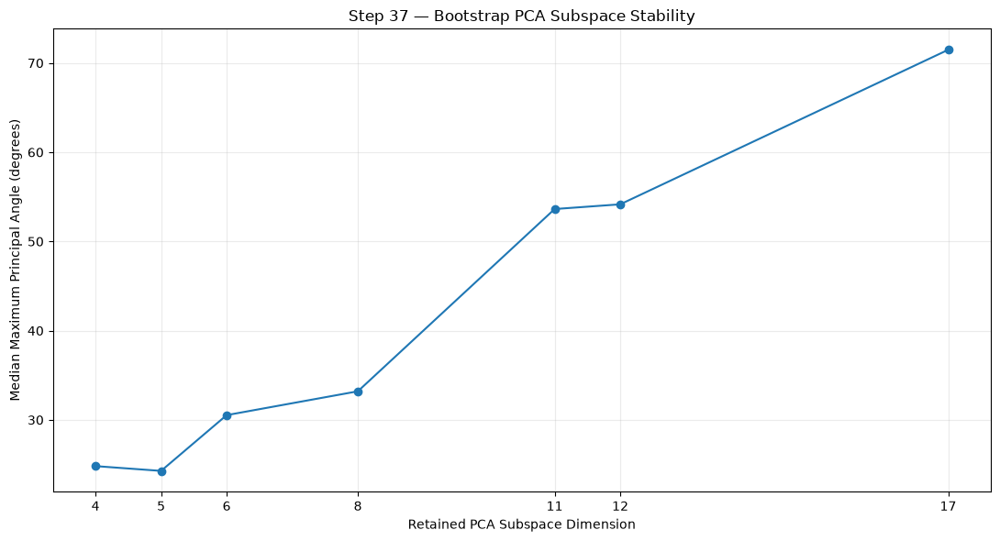

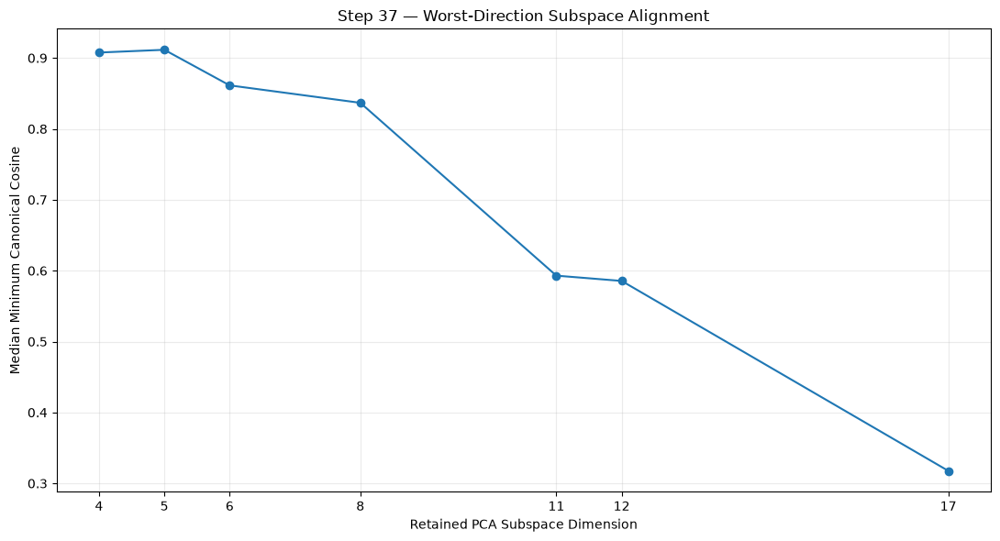

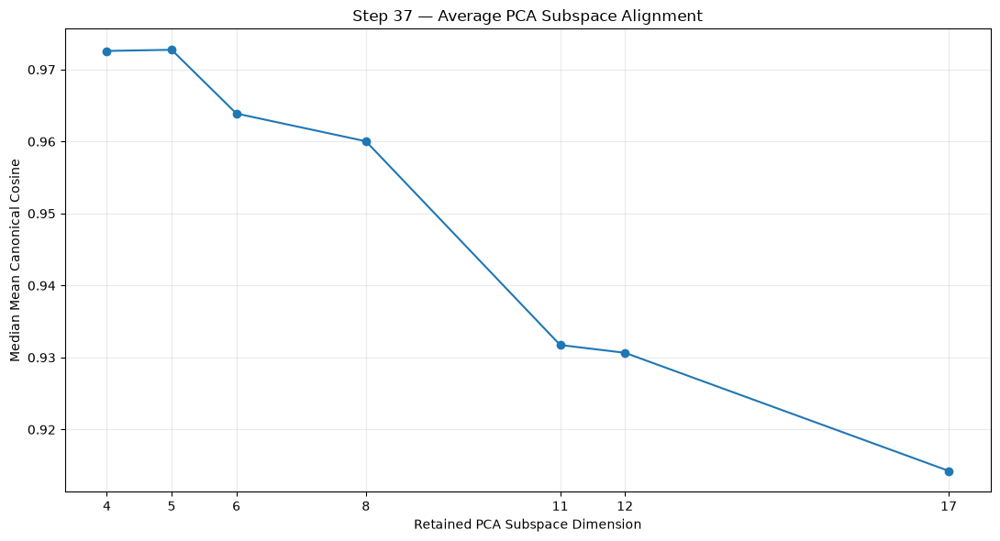


INCREMENTAL SUBSPACE-STABILITY CHANGE


,subspace_dimension,median_maximum_angle_deg,median_minimum_cosine,median_mean_cosine,change_in_median_max_angle_from_previous,change_in_median_min_cosine_from_previous
0,4,24.8153,0.9077,0.9726,NaN,NaN
1,5,24.2804,0.9115,0.9727,-0.5349,0.0039
2,6,30.5314,0.8614,0.9639,6.2510,-0.0502
3,8,33.2016,0.8367,0.9600,2.6702,-0.0246
4,11,53.6311,0.5930,0.9317,20.4295,-0.2438
5,12,54.1598,0.5855,0.9307,0.5288,-0.0075
6,17,71.4814,0.3176,0.9142,17.3215,-0.2679



COMPONENT-RETENTION EVIDENCE INCLUDING SUBSPACE STABILITY


,method,result
0,Cattell Scree Test,4 PCs
1,Horn Parallel Analysis,12 PCs
2,Velicer Original MAP,11 PCs
3,Velicer Revised MAP,17 PCs
4,Guadagnoli & Velicer loading-pattern assessment,Strongest support concentrated in early PCs
5,Bootstrap individual-PC stability,PC1-PC4 clearly strongest individual patterns
6,Bootstrap PCA subspace stability,See bootstrap_subspace_stability_summary



HOW TO INTERPRET STEP 37

Principal-angle interpretation:
  Smaller angles = more stable subspace.
  Larger angles = less stable subspace.

Canonical-cosine interpretation:
  Values near 1 = highly similar subspaces.
  Lower values = weaker alignment.

Most important columns:
  median_maximum_angle_deg
  median_minimum_cosine
  median_mean_cosine

Decision logic:
  If the 4D subspace is very stable and stability drops sharply at 5D or 6D, this reinforces the 4-component solution.

  If 5D or 6D remains nearly as stable as 4D, then the larger solution remains defensible.

  If 11D or 12D remains stable as a subspace even though individual PCs are unstable, then the apparent instability of PC9-PC12 may reflect rotation within a stable higher-dimensional space.

STEP 37 COMPLETE — BOOTSTRAP PCA SUBSPACE STABILITY

Bootstrap replications:
  1,000

Observations per bootstrap sample:
  673

Performance variables:
  74

Candidate subspace dimensions tested:
  4, 5, 6, 8, 11, 12, 17

Primary 

In [48]:
# ============================================================
# STEP 37 — BOOTSTRAP PCA SUBSPACE STABILITY
# PRINCIPAL-ANGLE ANALYSIS
# ============================================================
#
# PURPOSE
# -------
#
# Evaluate whether the MULTIDIMENSIONAL PCA SUBSPACE remains
# stable across bootstrap resamples.
#
# This is different from Step 36.
#
# Step 36 asked:
#
#   "Does PC5 reproduce specifically as PC5?"
#
# Step 37 asks:
#
#   "Does the space spanned by the first k PCs reproduce,
#    even if individual PCs rotate or swap order?"
#
#
# WHY THIS MATTERS
# ----------------
#
# When neighboring PCA eigenvalues are similar, individual
# component axes can rotate or exchange order across samples.
#
# In that case:
#
#   individual PCs may look unstable
#
# while:
#
#   the underlying k-dimensional subspace may still be stable.
#
#
# This step therefore compares the original PCA subspace with
# bootstrap PCA subspaces using PRINCIPAL ANGLES.
#
#
# PRINCIPAL ANGLES
# ----------------
#
# For two k-dimensional subspaces, principal angles measure
# how closely the two spaces align.
#
# Perfectly identical subspaces:
#
#   all angles = 0 degrees
#
# Greater angles:
#
#   weaker subspace agreement
#
#
# We also summarize:
#
#   - maximum principal angle
#   - mean principal angle
#   - RMS principal angle
#   - minimum canonical cosine
#   - mean canonical cosine
#
#
# CANDIDATE DIMENSIONS TESTED
# ---------------------------
#
# Based on previous retention diagnostics:
#
#   4  -> Scree
#   5  -> immediate post-Scree candidate
#   6  -> plausible expanded solution
#   8  -> broader narrow-component region
#   11 -> Original MAP
#   12 -> Parallel Analysis
#   17 -> Revised MAP
#
#
# IMPORTANT
# ---------
#
# This step is DIAGNOSTIC ONLY.
#
# No PCA components are deleted.
# No observations are deleted.
# No PCA is permanently re-fit.
#
#
# REFERENCES
# ----------
#
# Hotelling, H. (1936).
# Relations Between Two Sets of Variates.
# Biometrika, 28, 321-377.
#
# Björck, Å. & Golub, G. H. (1973).
# Numerical Methods for Computing Angles Between Linear
# Subspaces.
# Mathematics of Computation, 27(123), 579-594.
#
# Krzanowski, W. J. (1979).
# Between-Groups Comparison of Principal Components.
# Journal of the American Statistical Association,
# 74(367), 703-707.
#
# ============================================================


# ============================================================
# 1. IMPORT LIBRARIES
# ============================================================

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from scipy.linalg import subspace_angles

from IPython.display import display


# ============================================================
# 2. SETTINGS
# ============================================================

N_BOOTSTRAPS = 1000


RANDOM_STATE = 42


CANDIDATE_DIMENSIONS = [
    4,
    5,
    6,
    8,
    11,
    12,
    17
]


LOWER_PERCENTILE = 5

UPPER_PERCENTILE = 95


# ============================================================
# 3. VERIFY REQUIRED OBJECTS
# ============================================================

required_objects = [
    "X_df",
    "pca_model",
    "pca_variables"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Steps 30 and 31 before running Step 37."
    )


# ============================================================
# 4. PREPARE ORIGINAL DATA MATRIX
# ============================================================

X_original_df = (

    X_df[
        pca_variables
    ]

    .copy()
)


X_original = (

    X_original_df

    .to_numpy(
        dtype=float
    )
)


if not np.isfinite(
    X_original
).all():

    raise RuntimeError(
        "The original performance matrix contains NaN or "
        "infinite values."
    )


N, P = X_original.shape


# ============================================================
# 5. VALIDATE CANDIDATE DIMENSIONS
# ============================================================

maximum_available_components = min(
    N,
    P
)


invalid_dimensions = [
    k
    for k in CANDIDATE_DIMENSIONS
    if (
        k < 1
        or
        k > maximum_available_components
    )
]


if invalid_dimensions:

    raise RuntimeError(
        "One or more candidate dimensions are invalid:\n\n"
        +
        "\n".join(
            str(k)
            for k in invalid_dimensions
        )
    )


# ============================================================
# 6. CREATE ORIGINAL REFERENCE PCA BASIS
# ============================================================
#
# sklearn components_:
#
#   components × variables
#
# For subspace calculations we want:
#
#   variables × components
#
# ============================================================

reference_basis_full = (

    pca_model
    .components_
    .T
)


if (
    reference_basis_full.shape[
        0
    ]
    !=
    P
):

    raise RuntimeError(
        "Reference PCA basis does not match the number "
        "of performance variables."
    )


# ============================================================
# 7. PRINT INPUT SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 37 — BOOTSTRAP PCA SUBSPACE STABILITY"
)


print(
    "=" * 130
)


print(
    "\nDataset:"
)


print(
    f"  Observations: {N:,}"
)


print(
    f"  Variables:    {P:,}"
)


print(
    "\nBootstrap replications:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nCandidate subspace dimensions:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in CANDIDATE_DIMENSIONS
    )
)


# ============================================================
# 8. RANDOM NUMBER GENERATOR
# ============================================================

rng = np.random.default_rng(
    RANDOM_STATE
)


# ============================================================
# 9. STORAGE
# ============================================================
#
# One array per candidate dimensionality.
#
# ============================================================

subspace_results = {
    k: {
        "maximum_angle_degrees": [],
        "mean_angle_degrees": [],
        "rms_angle_degrees": [],
        "minimum_cosine": [],
        "mean_cosine": [],
        "all_angles_degrees": []
    }
    for k in CANDIDATE_DIMENSIONS
}


# ============================================================
# 10. BOOTSTRAP LOOP
# ============================================================

for bootstrap_index in range(
    N_BOOTSTRAPS
):

    # --------------------------------------------------------
    # Resample observations with replacement
    # --------------------------------------------------------

    sampled_indices = rng.integers(
        low=0,
        high=N,
        size=N
    )


    X_bootstrap_raw = (

        X_original[
            sampled_indices,
            :
        ]
    )


    # --------------------------------------------------------
    # Re-standardize bootstrap sample
    # --------------------------------------------------------

    scaler = StandardScaler(
        with_mean=True,
        with_std=True
    )


    X_bootstrap_standardized = (

        scaler

        .fit_transform(
            X_bootstrap_raw
        )
    )


    if not np.isfinite(
        X_bootstrap_standardized
    ).all():

        raise RuntimeError(
            "A bootstrap sample produced non-finite values."
        )


    # --------------------------------------------------------
    # Fit full classical PCA
    # --------------------------------------------------------

    bootstrap_pca = PCA(
        n_components=None,
        svd_solver="full"
    )


    bootstrap_pca.fit(
        X_bootstrap_standardized
    )


    bootstrap_basis_full = (

        bootstrap_pca
        .components_
        .T
    )


    # ========================================================
    # 11. COMPARE CANDIDATE SUBSPACES
    # ========================================================

    for k in CANDIDATE_DIMENSIONS:

        # ----------------------------------------------------
        # Original k-dimensional PCA basis
        # ----------------------------------------------------

        reference_basis = (

            reference_basis_full[
                :,
                :k
            ]
        )


        # ----------------------------------------------------
        # Bootstrap k-dimensional PCA basis
        # ----------------------------------------------------

        bootstrap_basis = (

            bootstrap_basis_full[
                :,
                :k
            ]
        )


        # ----------------------------------------------------
        # Principal angles
        #
        # scipy returns radians.
        # ----------------------------------------------------

        angles_radians = subspace_angles(
            reference_basis,
            bootstrap_basis
        )


        angles_degrees = np.degrees(
            angles_radians
        )


        # ----------------------------------------------------
        # Canonical cosines
        #
        # cos(angle) = 1 means perfect alignment
        # ----------------------------------------------------

        cosines = np.cos(
            angles_radians
        )


        # ----------------------------------------------------
        # Summary metrics
        # ----------------------------------------------------

        maximum_angle = float(
            np.max(
                angles_degrees
            )
        )


        mean_angle = float(
            np.mean(
                angles_degrees
            )
        )


        rms_angle = float(
            np.sqrt(
                np.mean(
                    angles_degrees ** 2
                )
            )
        )


        minimum_cosine = float(
            np.min(
                cosines
            )
        )


        mean_cosine = float(
            np.mean(
                cosines
            )
        )


        # ----------------------------------------------------
        # Store
        # ----------------------------------------------------

        subspace_results[
            k
        ][
            "maximum_angle_degrees"
        ].append(
            maximum_angle
        )


        subspace_results[
            k
        ][
            "mean_angle_degrees"
        ].append(
            mean_angle
        )


        subspace_results[
            k
        ][
            "rms_angle_degrees"
        ].append(
            rms_angle
        )


        subspace_results[
            k
        ][
            "minimum_cosine"
        ].append(
            minimum_cosine
        )


        subspace_results[
            k
        ][
            "mean_cosine"
        ].append(
            mean_cosine
        )


        subspace_results[
            k
        ][
            "all_angles_degrees"
        ].append(
            angles_degrees
        )


# ============================================================
# 12. CONVERT STORAGE TO NUMPY ARRAYS
# ============================================================

for k in CANDIDATE_DIMENSIONS:

    for metric in [
        "maximum_angle_degrees",
        "mean_angle_degrees",
        "rms_angle_degrees",
        "minimum_cosine",
        "mean_cosine"
    ]:

        subspace_results[
            k
        ][
            metric
        ] = np.asarray(
            subspace_results[
                k
            ][
                metric
            ],
            dtype=float
        )


# ============================================================
# 13. BUILD SUMMARY TABLE
# ============================================================

summary_rows = []


for k in CANDIDATE_DIMENSIONS:

    maximum_angles = (

        subspace_results[
            k
        ][
            "maximum_angle_degrees"
        ]
    )


    mean_angles = (

        subspace_results[
            k
        ][
            "mean_angle_degrees"
        ]
    )


    rms_angles = (

        subspace_results[
            k
        ][
            "rms_angle_degrees"
        ]
    )


    minimum_cosines = (

        subspace_results[
            k
        ][
            "minimum_cosine"
        ]
    )


    mean_cosines = (

        subspace_results[
            k
        ][
            "mean_cosine"
        ]
    )


    summary_rows.append(
        {

            "subspace_dimension":
                k,

            "median_maximum_angle_deg":
                np.median(
                    maximum_angles
                ),

            f"p{LOWER_PERCENTILE}_maximum_angle_deg":
                np.percentile(
                    maximum_angles,
                    LOWER_PERCENTILE
                ),

            f"p{UPPER_PERCENTILE}_maximum_angle_deg":
                np.percentile(
                    maximum_angles,
                    UPPER_PERCENTILE
                ),

            "median_mean_angle_deg":
                np.median(
                    mean_angles
                ),

            "median_rms_angle_deg":
                np.median(
                    rms_angles
                ),

            "median_minimum_cosine":
                np.median(
                    minimum_cosines
                ),

            f"p{LOWER_PERCENTILE}_minimum_cosine":
                np.percentile(
                    minimum_cosines,
                    LOWER_PERCENTILE
                ),

            "median_mean_cosine":
                np.median(
                    mean_cosines
                ),

            f"p{LOWER_PERCENTILE}_mean_cosine":
                np.percentile(
                    mean_cosines,
                    LOWER_PERCENTILE
                )
        }
    )


bootstrap_subspace_stability_summary = pd.DataFrame(
    summary_rows
)


# ============================================================
# 14. DISPLAY SUBSPACE STABILITY SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 170
)


print(
    "BOOTSTRAP PCA SUBSPACE STABILITY SUMMARY"
)


print(
    "=" * 170
)


display(
    bootstrap_subspace_stability_summary.round(
        4
    )
)


# ============================================================
# 15. CREATE LONG-FORM BOOTSTRAP RESULTS
# ============================================================

long_rows = []


for k in CANDIDATE_DIMENSIONS:

    for bootstrap_index in range(
        N_BOOTSTRAPS
    ):

        long_rows.append(
            {

                "bootstrap_iteration":
                    bootstrap_index + 1,

                "subspace_dimension":
                    k,

                "maximum_angle_degrees":
                    subspace_results[
                        k
                    ][
                        "maximum_angle_degrees"
                    ][
                        bootstrap_index
                    ],

                "mean_angle_degrees":
                    subspace_results[
                        k
                    ][
                        "mean_angle_degrees"
                    ][
                        bootstrap_index
                    ],

                "rms_angle_degrees":
                    subspace_results[
                        k
                    ][
                        "rms_angle_degrees"
                    ][
                        bootstrap_index
                    ],

                "minimum_cosine":
                    subspace_results[
                        k
                    ][
                        "minimum_cosine"
                    ][
                        bootstrap_index
                    ],

                "mean_cosine":
                    subspace_results[
                        k
                    ][
                        "mean_cosine"
                    ][
                        bootstrap_index
                    ]
            }
        )


bootstrap_subspace_stability_long = pd.DataFrame(
    long_rows
)


# ============================================================
# 16. PLOT MEDIAN MAXIMUM PRINCIPAL ANGLE
# ============================================================

plot_df = (

    bootstrap_subspace_stability_summary

    .copy()
)


fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    plot_df[
        "subspace_dimension"
    ],

    plot_df[
        "median_maximum_angle_deg"
    ],

    marker="o"
)


ax.set_xlabel(
    "Retained PCA Subspace Dimension"
)


ax.set_ylabel(
    "Median Maximum Principal Angle (degrees)"
)


ax.set_title(
    "Step 37 — Bootstrap PCA Subspace Stability"
)


ax.set_xticks(
    CANDIDATE_DIMENSIONS
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 17. PLOT MEDIAN MINIMUM CANONICAL COSINE
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    plot_df[
        "subspace_dimension"
    ],

    plot_df[
        "median_minimum_cosine"
    ],

    marker="o"
)


ax.set_xlabel(
    "Retained PCA Subspace Dimension"
)


ax.set_ylabel(
    "Median Minimum Canonical Cosine"
)


ax.set_title(
    "Step 37 — Worst-Direction Subspace Alignment"
)


ax.set_xticks(
    CANDIDATE_DIMENSIONS
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 18. PLOT MEDIAN MEAN CANONICAL COSINE
# ============================================================

fig, ax = plt.subplots(
    figsize=(
        11,
        6
    )
)


ax.plot(

    plot_df[
        "subspace_dimension"
    ],

    plot_df[
        "median_mean_cosine"
    ],

    marker="o"
)


ax.set_xlabel(
    "Retained PCA Subspace Dimension"
)


ax.set_ylabel(
    "Median Mean Canonical Cosine"
)


ax.set_title(
    "Step 37 — Average PCA Subspace Alignment"
)


ax.set_xticks(
    CANDIDATE_DIMENSIONS
)


ax.grid(
    alpha=0.25
)


plt.tight_layout()


plt.show()


# ============================================================
# 19. CALCULATE INCREMENTAL SUBSPACE CHANGE
# ============================================================
#
# This helps show whether adding more PCs causes a marked
# deterioration in reproducibility.
#
# ============================================================

bootstrap_subspace_stability_summary[
    "change_in_median_max_angle_from_previous"
] = (

    bootstrap_subspace_stability_summary[
        "median_maximum_angle_deg"
    ]

    .diff()
)


bootstrap_subspace_stability_summary[
    "change_in_median_min_cosine_from_previous"
] = (

    bootstrap_subspace_stability_summary[
        "median_minimum_cosine"
    ]

    .diff()
)


# ============================================================
# 20. PRINT INCREMENTAL COMPARISON
# ============================================================

print(
    "\n"
    + "=" * 150
)


print(
    "INCREMENTAL SUBSPACE-STABILITY CHANGE"
)


print(
    "=" * 150
)


display(
    bootstrap_subspace_stability_summary[
        [
            "subspace_dimension",
            "median_maximum_angle_deg",
            "median_minimum_cosine",
            "median_mean_cosine",
            "change_in_median_max_angle_from_previous",
            "change_in_median_min_cosine_from_previous"
        ]
    ]
    .round(
        4
    )
)


# ============================================================
# 21. CREATE CURRENT RETENTION EVIDENCE TABLE
# ============================================================

retention_evidence_with_subspace = pd.DataFrame(
    {

        "method": [
            "Cattell Scree Test",
            "Horn Parallel Analysis",
            "Velicer Original MAP",
            "Velicer Revised MAP",
            "Guadagnoli & Velicer loading-pattern assessment",
            "Bootstrap individual-PC stability",
            "Bootstrap PCA subspace stability"
        ],

        "result": [
            "4 PCs",
            "12 PCs",
            "11 PCs",
            "17 PCs",
            "Strongest support concentrated in early PCs",
            "PC1-PC4 clearly strongest individual patterns",
            "See bootstrap_subspace_stability_summary"
        ]
    }
)


print(
    "\n"
    + "=" * 150
)


print(
    "COMPONENT-RETENTION EVIDENCE INCLUDING SUBSPACE STABILITY"
)


print(
    "=" * 150
)


display(
    retention_evidence_with_subspace
)


# ============================================================
# 22. PRINT INTERPRETATION GUIDE
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "HOW TO INTERPRET STEP 37"
)


print(
    "=" * 130
)


print(
    "\nPrincipal-angle interpretation:"
)


print(
    "  Smaller angles = more stable subspace."
)


print(
    "  Larger angles = less stable subspace."
)


print(
    "\nCanonical-cosine interpretation:"
)


print(
    "  Values near 1 = highly similar subspaces."
)


print(
    "  Lower values = weaker alignment."
)


print(
    "\nMost important columns:"
)


print(
    "  median_maximum_angle_deg"
)


print(
    "  median_minimum_cosine"
)


print(
    "  median_mean_cosine"
)


print(
    "\nDecision logic:"
)


print(
    "  If the 4D subspace is very stable and stability "
    "drops sharply at 5D or 6D, this reinforces the "
    "4-component solution."
)


print(
    "\n  If 5D or 6D remains nearly as stable as 4D, "
    "then the larger solution remains defensible."
)


print(
    "\n  If 11D or 12D remains stable as a subspace even "
    "though individual PCs are unstable, then the apparent "
    "instability of PC9-PC12 may reflect rotation within a "
    "stable higher-dimensional space."
)


# ============================================================
# 23. FINAL STEP 37 SUMMARY
# ============================================================

print(
    "\n"
    + "=" * 130
)


print(
    "STEP 37 COMPLETE — BOOTSTRAP PCA SUBSPACE STABILITY"
)


print(
    "=" * 130
)


print(
    "\nBootstrap replications:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nObservations per bootstrap sample:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nCandidate subspace dimensions tested:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in CANDIDATE_DIMENSIONS
    )
)


print(
    "\nPrimary stability method:"
)


print(
    "  Principal angles between original and bootstrap "
    "PCA subspaces"
)


print(
    "\nMain output objects:"
)


print(
    "  subspace_results"
)


print(
    "  bootstrap_subspace_stability_summary"
)


print(
    "  bootstrap_subspace_stability_long"
)


print(
    "  retention_evidence_with_subspace"
)


print(
    "\nIMPORTANT:"
)


print(
    "  No PCA components were removed."
)


print(
    "  No observations were removed."
)


print(
    "  Step 31 remains the reference PCA solution."
)


print(
    "\n"
    + "=" * 130
)

### 38. Classic PCA Conclusion

In [49]:
# ============================================================
# CONCLUSION — PCA COMPONENT-RETENTION ANALYSIS
# ============================================================
#
# The objective of Steps 32–37 was to determine how many
# principal components should be retained from the Step 31
# classical PCA solution.
#
# Multiple complementary methods were used rather than relying
# on a single component-retention criterion.
#
# RESULTS
# -------
#
# Cattell Scree Test:
#   -> Suggested 4 PCs.
#
# Horn's Parallel Analysis:
#   -> Suggested 12 PCs.
#
# Velicer's Original MAP:
#   -> Suggested 11 PCs.
#
# Velicer's Revised MAP:
#   -> Suggested 17 PCs.
#
# Guadagnoli & Velicer (1988) loading assessment:
#   -> Strongest loading support was concentrated in the
#      earlier components.
#   -> Later components became progressively more weakly
#      and narrowly defined.
#
# Bootstrap individual-component stability:
#   -> PC1-PC3 were extremely reproducible.
#   -> PC4 remained strongly supported.
#   -> PC5 showed weaker, but still meaningful, reproducibility.
#   -> Stability progressively deteriorated for later PCs.
#
# Bootstrap PCA subspace stability:
#   -> The 4-PC and 5-PC subspaces were essentially equally
#      reproducible.
#   -> Adding PC5 produced no meaningful loss of overall
#      subspace stability.
#   -> Stability began deteriorating after the 5-PC solution,
#      particularly as the solution approached 11-12 PCs.
#
#
# OVERALL CONCLUSION
# ------------------
#
# The evidence does not support interpreting all components
# identified by Parallel Analysis or MAP simply because they
# contain statistically detectable structure.
#
# Instead, the analyses consistently identify a much smaller
# core of stable and substantively interpretable dimensions.
#
# PC1-PC4 currently form the strongly supported core solution.
#
# PC5 is the remaining borderline component:
#   -> It contains meaningful structure.
#   -> It shows reasonable individual-component stability.
#   -> The 5-dimensional PCA subspace is essentially as stable
#      as the 4-dimensional subspace.
#
# Therefore, the final component-retention decision has been
# narrowed to:
#
#                       4 PCs vs 5 PCs
#
# The remaining decision should primarily be substantive rather
# than based on another automatic statistical cutoff.
#
# Specifically, PC5 should be retained if its positive and
# negative loading poles define a coherent, distinct, and useful
# football-performance dimension that adds meaningful information
# beyond PC1-PC4.
#
# If PC5 does not provide sufficient unique interpretive value,
# the more parsimonious 4-PC solution should be preferred.
#
# Thus, component retention is not yet finalized:
#
#   CURRENT CORE:       PC1-PC4
#   CANDIDATE ADDITION: PC5
#   FINAL DECISION:     Interpretation and added value of PC5
#
# No components have yet been permanently removed from the
# original Step 31 PCA solution.
# ============================================================

## Run SPCA and Interpret Reesults

### 39. Run SPCA

In [50]:
# ==================================================================================================
# STEP 39 — SPCA MODEL-SELECTION PRINCIPLE
# ==================================================================================================
#
# NUMBER OF COMPONENTS:
#
#   The number of sparse principal components is NOT predetermined.
#
#   SPCA is allowed to explore the feasible dimensionality of the
#   dataset independently:
#
#       k = 1, 2, ..., min(N - 1, P)
#
#   For the current dataset:
#
#       N = 673
#       P = 74
#
#   therefore:
#
#       k = 1 through 74
#
#
# ALPHA:
#
#   Alpha is NOT selected manually.
#
#   For every candidate k, a data-adaptive regularization path is
#   constructed and evaluated using cross-validation.
#
#   The literature-supported principle is to balance:
#
#       preservation of information / reconstruction
#       versus
#       sparsity of the component coefficients.
#
#   No universal numerical alpha is assumed because the numerical
#   scale of the regularization parameter is data- and
#   implementation-dependent.
#
#
# IMPORTANT:
#
#   Classical PCA does NOT determine the SPCA dimensionality.
#
#   The previous 4–5 component PCA result is NOT supplied to SPCA
#   as a restriction.
#
#   SPCA therefore receives an independent opportunity to reveal
#   the dimensional structure of the dataset.
#
#
# AFTER STEP 39:
#
#   Reconstruction error alone will NOT automatically determine k,
#   because adding components generally improves reconstruction.
#
#   Candidate dimensionalities will subsequently be evaluated using:
#
#       - marginal reconstruction improvement,
#       - achieved sparsity,
#       - bootstrap component stability,
#       - variable-selection stability,
#       - component definition / adequacy,
#       - redundancy,
#       - substantive interpretability.
#
# ==================================================================================================

In [51]:
# ==================================================================================================
# STEP 39 — INDEPENDENT SPARSE PRINCIPAL COMPONENT ANALYSIS
# FULL DIMENSIONALITY SEARCH + DATA-DRIVEN SPARSITY REGULARIZATION
# ==================================================================================================
#
# PURPOSE
# -------
#
# Give Sparse PCA an INDEPENDENT opportunity to describe the dimensional
# structure of the player-performance dataset.
#
# The number of components is NOT inherited from Classical PCA.
#
# SPCA is allowed to evaluate every feasible dimensionality:
#
#       k = 1, 2, ..., min(N - 1, P)
#
# For the current dataset:
#
#       N = 673
#       P = 74
#
# therefore:
#
#       k = 1 through 74
#
#
# ================================================================================================
# IMPORTANT: TWO DIFFERENT PARAMETERS
# ================================================================================================
#
# k
# ---
# Number of sparse principal components.
#
# No literature-based fixed value is imposed.
#
#
# alpha
# -----
# L1 sparsity penalty.
#
# Larger alpha:
#
#       -> more coefficients become exactly zero
#       -> simpler sparse components
#       -> potentially greater reconstruction loss
#
# There is NO universal peer-reviewed numerical alpha such as:
#
#       alpha = 0.5
#       alpha = 1
#       alpha = 4
#
# The numerical scale is data- and implementation-dependent.
#
# Therefore alpha is treated as a tuning parameter.
#
#
# ================================================================================================
# LITERATURE-GROUNDED PRINCIPLES
# ================================================================================================
#
# Zou, Hastie & Tibshirani (2006)
# --------------------------------
#
# Sparse PCA uses regularization to obtain sparse loading vectors.
# Sparsity must be balanced against preservation of the underlying
# variance / representation of the data.
#
#
# Shen & Huang (2008)
# --------------------
#
# Sparse PCA can be formulated as regularized low-rank approximation.
# Regularization strength is a tuning parameter rather than a universal
# constant.
#
#
# Witten, Tibshirani & Hastie (2009)
# -----------------------------------
#
# Sparse components arise through penalized matrix decomposition;
# sparsity is governed through regularization.
#
#
# ================================================================================================
# THIS SCRIPT'S PROCEDURE
# ================================================================================================
#
# STAGE A — CALIBRATE THE ALPHA SCALE
#
# Instead of choosing arbitrary absolute alpha values, the script:
#
#   1. fits SPCA at several pilot dimensionalities spanning the full range;
#   2. increases alpha geometrically;
#   3. observes where sparse components begin to collapse;
#   4. uses those results to construct a DATA-ADAPTIVE regularization path.
#
# The geometric spacing of the path is computational only.
# It does NOT specify a desired amount of sparsity.
#
#
# STAGE B — FULL DIMENSIONALITY SEARCH
#
# Every feasible:
#
#       k = 1 ... 74
#
# is evaluated across the calibrated alpha path.
#
# Cross-validation is performed.
#
# MiniBatchSparsePCA is used here as a computational screening estimator
# because evaluating all 74 dimensions with repeated full SparsePCA fits
# would require thousands of expensive optimizations.
#
#
# STAGE C — ALPHA SELECTION WITHIN EACH k
#
# For every dimensionality:
#
#   1. identify the alpha with minimum CV reconstruction error;
#
#   2. calculate the one-standard-error boundary;
#
#   3. identify the largest alpha still inside that competitive region.
#
# Therefore each k produces:
#
#       minimum-CV alpha
#
# and
#
#       one-SE sparse alpha
#
#
# IMPORTANT:
#
# The one-standard-error rule is a general regularization/parsimony
# convention. It is NOT claimed to be a verbatim SPCA rule from
# Zou et al., Shen & Huang, or Witten et al.
#
# Both solutions are therefore preserved.
#
#
# ================================================================================================
# COMPONENT COUNT IS NOT SELECTED BY RECONSTRUCTION ALONE
# ================================================================================================
#
# Adding components usually improves reconstruction.
#
# Therefore:
#
#       lowest CV MSE
#
# is NOT automatically interpreted as:
#
#       best number of sparse components.
#
# Step 39 establishes the full SPCA reconstruction / sparsity frontier.
#
# Subsequent validation should examine:
#
#       bootstrap component stability
#       variable-selection stability
#       component definition / saturation
#       redundancy
#       interpretability
#
#
# Classical PCA results are NOT used anywhere in this script.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import warnings
import time

import numpy as np
import pandas as pd

from sklearn.decomposition import MiniBatchSparsePCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold

from IPython.display import display


# --------------------------------------------------------------------------------------------------
# Plotly
# --------------------------------------------------------------------------------------------------

try:

    import plotly.graph_objects as go

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly\n\n"
        "Then restart the kernel."
    ) from error


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

RANDOM_STATE = 42


# --------------------------------------------------------------------------------------------------
# Cross-validation
#
# Three-fold CV is used for the FULL 1-P screening stage.
#
# This is deliberately a computational screening stage.
#
# Once candidate dimensionalities are identified, Step 40 can perform
# substantially heavier bootstrap validation.
# --------------------------------------------------------------------------------------------------

N_SPLITS = 3


# --------------------------------------------------------------------------------------------------
# Number of alpha values in the final data-adaptive regularization path
# --------------------------------------------------------------------------------------------------

N_ALPHA_VALUES = 6


# --------------------------------------------------------------------------------------------------
# Alpha boundary discovery
#
# These values control numerical SEARCH only.
#
# They are not substantive SPCA alpha choices.
# --------------------------------------------------------------------------------------------------

INITIAL_ALPHA = 0.01

ALPHA_GROWTH_FACTOR = 2.0

MAX_ALPHA_DISCOVERY_STEPS = 12


# --------------------------------------------------------------------------------------------------
# MiniBatchSparsePCA settings
# --------------------------------------------------------------------------------------------------

MINIBATCH_MAX_ITER = 80

MINIBATCH_BATCH_SIZE = 128

RIDGE_ALPHA = 0.01


# --------------------------------------------------------------------------------------------------
# Numerical definition of zero
# --------------------------------------------------------------------------------------------------

ZERO_TOLERANCE = 1e-10


# ==================================================================================================
# 3. VERIFY INPUT OBJECTS
# ==================================================================================================

required_objects = [
    "X_df",
    "pca_variables"
]


missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required preprocessing objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun the final preprocessing / standardization-input "
        "step before Step 39."
    )


if not isinstance(
    X_df,
    pd.DataFrame
):

    raise RuntimeError(
        "`X_df` exists but is not a pandas DataFrame."
    )


# ==================================================================================================
# 4. IDENTIFY PERFORMANCE VARIABLES
# ==================================================================================================

performance_variables = [

    variable

    for variable
    in list(
        pca_variables
    )

    if variable
    in X_df.columns
]


if len(
    performance_variables
) < 2:

    raise RuntimeError(
        "Fewer than two performance variables were found."
    )


# ==================================================================================================
# 5. BUILD RAW SPCA MATRIX
# ==================================================================================================

X_spca_df = (

    X_df[
        performance_variables
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


for variable in performance_variables:

    X_spca_df[
        variable
    ] = pd.to_numeric(

        X_spca_df[
            variable
        ],

        errors="coerce"
    )


# ==================================================================================================
# 6. MISSING-VALUE CHECK
# ==================================================================================================

missing_counts = (

    X_spca_df

    .isna()

    .sum()
)


missing_counts = missing_counts[
    missing_counts
    >
    0
]


if not missing_counts.empty:

    print(
        "\nMissing values:"
    )


    display(
        missing_counts
        .rename(
            "missing_values"
        )
        .to_frame()
    )


    raise RuntimeError(
        "SPCA input contains missing values.\n\n"
        "Resolve missingness in preprocessing before Step 39."
    )


# ==================================================================================================
# 7. NUMPY MATRIX
# ==================================================================================================

X_spca_raw = (

    X_spca_df

    .to_numpy(
        dtype=float
    )
)


if not np.isfinite(
    X_spca_raw
).all():

    raise RuntimeError(
        "SPCA input contains non-finite values."
    )


N, P = X_spca_raw.shape


# ==================================================================================================
# 8. FULL FEASIBLE COMPONENT RANGE
# ==================================================================================================

MAX_COMPONENTS = min(
    N - 1,
    P
)


COMPONENT_GRID = list(
    range(
        1,
        MAX_COMPONENTS + 1
    )
)


# ==================================================================================================
# 9. PRINT SETUP
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STEP 39 — INDEPENDENT SPARSE PRINCIPAL COMPONENT ANALYSIS"
)


print(
    "=" * 150
)


print(
    "\nObservations:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nSPCA dimensionalities evaluated:"
)


print(
    f"  1 through {MAX_COMPONENTS}"
)


print(
    "\nDimensionality restriction from Classical PCA:"
)


print(
    "  NONE"
)


print(
    "\nAlpha selection:"
)


print(
    "  Data-adaptive regularization path"
)


print(
    "\nCross-validation:"
)


print(
    f"  {N_SPLITS}-fold"
)


# ==================================================================================================
# 10. STANDARDIZE FULL DATA FOR ALPHA-CALIBRATION ONLY
# ==================================================================================================
#
# This standardized matrix is used ONLY to calibrate the numerical
# scale of alpha.
#
# CV evaluation below fits StandardScaler independently inside
# each training fold.
#
# ==================================================================================================

alpha_calibration_scaler = StandardScaler()


X_alpha_calibration = (

    alpha_calibration_scaler

    .fit_transform(
        X_spca_raw
    )
)


# ==================================================================================================
# 11. HELPER — FIT MINIBATCH SPARSE PCA
# ==================================================================================================

def fit_minibatch_spca(
    X,
    n_components,
    alpha
):

    model = MiniBatchSparsePCA(

        n_components=
            int(
                n_components
            ),

        alpha=
            float(
                alpha
            ),

        ridge_alpha=
            RIDGE_ALPHA,

        max_iter=
            MINIBATCH_MAX_ITER,

        batch_size=
            MINIBATCH_BATCH_SIZE,

        shuffle=
            True,

        random_state=
            RANDOM_STATE,

        verbose=
            False
    )


    with warnings.catch_warnings():

        warnings.simplefilter(
            "ignore"
        )


        model.fit(
            X
        )


    return model


# ==================================================================================================
# 12. HELPER — SPARSITY
# ==================================================================================================

def summarize_spca_sparsity(
    components
):

    components = np.asarray(
        components,
        dtype=float
    )


    active_mask = (

        np.abs(
            components
        )

        >
        ZERO_TOLERANCE
    )


    active_counts = (

        active_mask

        .sum(
            axis=1
        )
    )


    zero_percent = float(

        (
            ~active_mask
        )

        .mean()

        *

        100
    )


    collapsed_components = int(

        (
            active_counts
            ==
            0
        )

        .sum()
    )


    return {

        "zero_percent":
            zero_percent,

        "mean_active_variables":
            float(
                active_counts.mean()
            ),

        "median_active_variables":
            float(
                np.median(
                    active_counts
                )
            ),

        "minimum_active_variables":
            int(
                active_counts.min()
            ),

        "maximum_active_variables":
            int(
                active_counts.max()
            ),

        "collapsed_components":
            collapsed_components
    }


# ==================================================================================================
# 13. HELPER — RECONSTRUCTION
# ==================================================================================================

def reconstruct_spca(
    model,
    X
):

    scores = model.transform(
        X
    )


    reconstruction = (

        scores

        @

        model.components_
    )


    if hasattr(
        model,
        "mean_"
    ):

        reconstruction = (

            reconstruction

            +
            model.mean_
        )


    return reconstruction


# ==================================================================================================
# 14. PILOT DIMENSIONALITIES FOR ALPHA-SCALE CALIBRATION
# ==================================================================================================
#
# We do NOT calibrate alpha separately 74 times.
#
# That would add hundreds of unnecessary SPCA fits.
#
# Instead, pilot dimensions span the complete solution space.
#
# This determines the numerical alpha SCALE only.
#
# ==================================================================================================

pilot_dimensions = sorted(
    set(
        [
            1,
            min(5, MAX_COMPONENTS),
            min(10, MAX_COMPONENTS),
            min(20, MAX_COMPONENTS),
            min(40, MAX_COMPONENTS),
            MAX_COMPONENTS
        ]
    )
)


print(
    "\n"
    + "=" * 150
)


print(
    "STAGE A — DATA-ADAPTIVE ALPHA SCALE CALIBRATION"
)


print(
    "=" * 150
)


print(
    "\nPilot dimensions:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k
        in pilot_dimensions
    )
)


alpha_calibration_rows = []

collapse_alphas = []

largest_noncollapsed_alphas = []


# ==================================================================================================
# 15. DISCOVER SPARSITY BOUNDARY
# ==================================================================================================

for k in pilot_dimensions:


    print(
        "\n"
        + "-" * 100
    )


    print(
        f"Pilot k = {k}"
    )


    alpha = float(
        INITIAL_ALPHA
    )


    previous_noncollapsed_alpha = float(
        alpha
    )


    collapse_found = False


    for step in range(
        1,
        MAX_ALPHA_DISCOVERY_STEPS + 1
    ):


        model = fit_minibatch_spca(

            X_alpha_calibration,

            n_components=
                k,

            alpha=
                alpha
        )


        sparsity = summarize_spca_sparsity(
            model.components_
        )


        collapsed = (

            sparsity[
                "collapsed_components"
            ]

            >
            0
        )


        alpha_calibration_rows.append(
            {

                "pilot_components":
                    k,

                "step":
                    step,

                "alpha":
                    alpha,

                "zero_percent":
                    sparsity[
                        "zero_percent"
                    ],

                "minimum_active_variables":
                    sparsity[
                        "minimum_active_variables"
                    ],

                "collapsed":
                    collapsed
            }
        )


        print(
            f"  alpha={alpha:.5g}"
            f" | zeros={sparsity['zero_percent']:.2f}%"
            f" | min active={sparsity['minimum_active_variables']}"
        )


        if collapsed:

            collapse_alphas.append(
                float(
                    alpha
                )
            )


            largest_noncollapsed_alphas.append(
                float(
                    previous_noncollapsed_alpha
                )
            )


            collapse_found = True

            break


        previous_noncollapsed_alpha = float(
            alpha
        )


        alpha = (

            alpha

            *
            ALPHA_GROWTH_FACTOR
        )


    if not collapse_found:

        largest_noncollapsed_alphas.append(
            float(
                previous_noncollapsed_alpha
            )
        )


alpha_calibration_results = pd.DataFrame(
    alpha_calibration_rows
)


# ==================================================================================================
# 16. CONSTRUCT FINAL DATA-ADAPTIVE ALPHA PATH
# ==================================================================================================
#
# The upper path boundary is the median of the largest
# non-collapsed alpha values across pilot dimensionalities.
#
# This prevents one unusual k from determining the full path.
#
# The lower boundary is the initial near-unpenalized alpha.
#
# ==================================================================================================

if len(
    largest_noncollapsed_alphas
) == 0:

    raise RuntimeError(
        "Could not calibrate an SPCA alpha path."
    )


ALPHA_MAX = float(

    np.median(
        largest_noncollapsed_alphas
    )
)


ALPHA_MIN = float(
    INITIAL_ALPHA
)


if ALPHA_MAX <= ALPHA_MIN:

    ALPHA_GRID = np.array(
        [
            ALPHA_MIN
        ],
        dtype=float
    )


else:

    ALPHA_GRID = np.geomspace(

        ALPHA_MIN,

        ALPHA_MAX,

        N_ALPHA_VALUES
    )


ALPHA_GRID = np.unique(

    np.round(
        ALPHA_GRID,
        8
    )
)


print(
    "\n"
    + "=" * 120
)


print(
    "FINAL DATA-ADAPTIVE ALPHA PATH"
)


print(
    "=" * 120
)


print(
    "\nAlpha minimum:"
)


print(
    f"  {ALPHA_MIN:.8g}"
)


print(
    "\nAlpha maximum:"
)


print(
    f"  {ALPHA_MAX:.8g}"
)


print(
    "\nAlpha values:"
)


for alpha in ALPHA_GRID:

    print(
        f"  {alpha:.8g}"
    )


# ==================================================================================================
# 17. CREATE FIXED CV SPLITS
# ==================================================================================================

cv = KFold(

    n_splits=
        N_SPLITS,

    shuffle=
        True,

    random_state=
        RANDOM_STATE
)


cv_splits = list(
    cv.split(
        X_spca_raw
    )
)


# ==================================================================================================
# 18. HELPER — CROSS-VALIDATE ONE MODEL
# ==================================================================================================

def cross_validate_spca_model(
    n_components,
    alpha
):

    fold_errors = []

    fold_zero_percent = []

    fold_mean_active = []

    fold_median_active = []

    fold_min_active = []

    fold_max_active = []

    fold_collapsed = []


    for (
        train_index,
        validation_index
    ) in cv_splits:


        # ------------------------------------------------------------------------------------------
        # Raw training / validation split
        # ------------------------------------------------------------------------------------------

        X_train_raw = X_spca_raw[
            train_index,
            :
        ]


        X_validation_raw = X_spca_raw[
            validation_index,
            :
        ]


        # ------------------------------------------------------------------------------------------
        # Standardization inside training fold
        # ------------------------------------------------------------------------------------------

        scaler = StandardScaler()


        X_train = scaler.fit_transform(
            X_train_raw
        )


        X_validation = scaler.transform(
            X_validation_raw
        )


        # ------------------------------------------------------------------------------------------
        # Fit SPCA
        # ------------------------------------------------------------------------------------------

        model = fit_minibatch_spca(

            X_train,

            n_components=
                n_components,

            alpha=
                alpha
        )


        # ------------------------------------------------------------------------------------------
        # Sparsity
        # ------------------------------------------------------------------------------------------

        sparsity = summarize_spca_sparsity(
            model.components_
        )


        # ------------------------------------------------------------------------------------------
        # Held-out reconstruction
        # ------------------------------------------------------------------------------------------

        reconstruction = reconstruct_spca(

            model,

            X_validation
        )


        mse = float(

            np.mean(
                (
                    X_validation
                    -
                    reconstruction
                )
                **
                2
            )
        )


        fold_errors.append(
            mse
        )


        fold_zero_percent.append(
            sparsity[
                "zero_percent"
            ]
        )


        fold_mean_active.append(
            sparsity[
                "mean_active_variables"
            ]
        )


        fold_median_active.append(
            sparsity[
                "median_active_variables"
            ]
        )


        fold_min_active.append(
            sparsity[
                "minimum_active_variables"
            ]
        )


        fold_max_active.append(
            sparsity[
                "maximum_active_variables"
            ]
        )


        fold_collapsed.append(
            sparsity[
                "collapsed_components"
            ]
        )


    fold_errors = np.asarray(
        fold_errors,
        dtype=float
    )


    sd_error = float(

        np.std(
            fold_errors,
            ddof=1
        )
    )


    se_error = float(

        sd_error

        /

        np.sqrt(
            len(
                fold_errors
            )
        )
    )


    return {

        "n_components":
            int(
                n_components
            ),

        "alpha":
            float(
                alpha
            ),

        "mean_cv_mse":
            float(
                np.mean(
                    fold_errors
                )
            ),

        "sd_cv_mse":
            sd_error,

        "se_cv_mse":
            se_error,

        "median_cv_mse":
            float(
                np.median(
                    fold_errors
                )
            ),

        "mean_zero_percent":
            float(
                np.mean(
                    fold_zero_percent
                )
            ),

        "mean_active_variables":
            float(
                np.mean(
                    fold_mean_active
                )
            ),

        "median_active_variables":
            float(
                np.mean(
                    fold_median_active
                )
            ),

        "minimum_active_variables":
            int(
                np.min(
                    fold_min_active
                )
            ),

        "maximum_active_variables":
            int(
                np.max(
                    fold_max_active
                )
            ),

        "maximum_collapsed_components":
            int(
                np.max(
                    fold_collapsed
                )
            )
    }


# ==================================================================================================
# 19. FULL 1-P SPCA SEARCH
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STAGE B — FULL INDEPENDENT SPCA DIMENSIONALITY SEARCH"
)


print(
    "=" * 150
)


print(
    "\nComponent counts:"
)


print(
    f"  1 through {MAX_COMPONENTS}"
)


print(
    "\nAlpha values per component count:"
)


print(
    f"  {len(ALPHA_GRID)}"
)


print(
    "\nCross-validation folds:"
)


print(
    f"  {N_SPLITS}"
)


expected_fits = (

    len(
        COMPONENT_GRID
    )

    *

    len(
        ALPHA_GRID
    )

    *

    N_SPLITS
)


print(
    "\nExpected MiniBatchSparsePCA fits:"
)


print(
    f"  {expected_fits:,}"
)


search_start_time = time.time()


search_rows = []


total_candidates = (

    len(
        COMPONENT_GRID
    )

    *

    len(
        ALPHA_GRID
    )
)


candidate_counter = 0


for k in COMPONENT_GRID:


    for alpha in ALPHA_GRID:


        candidate_counter += 1


        print(

            f"\rCandidate "
            f"{candidate_counter:,}/"
            f"{total_candidates:,}"
            f" | k={k}"
            f" | alpha={alpha:.5g}",

            end=""
        )


        result = cross_validate_spca_model(

            n_components=
                k,

            alpha=
                alpha
        )


        search_rows.append(
            result
        )


print()


spca_full_search = pd.DataFrame(
    search_rows
)


# ==================================================================================================
# 20. VALIDITY FLAG
# ==================================================================================================

spca_full_search[
    "valid"
] = (

    spca_full_search[
        "maximum_collapsed_components"
    ]

    ==
    0
)


# ==================================================================================================
# 21. SELECT ALPHA WITHIN EACH DIMENSIONALITY
# ==================================================================================================

selection_rows = []


for k in COMPONENT_GRID:


    k_results = (

        spca_full_search[
            (
                spca_full_search[
                    "n_components"
                ]
                ==
                k
            )

            &

            (
                spca_full_search[
                    "valid"
                ]
            )
        ]

        .copy()
    )


    if k_results.empty:

        continue


    # ----------------------------------------------------------------------------------------------
    # Minimum CV error
    # ----------------------------------------------------------------------------------------------

    minimum_index = (

        k_results[
            "mean_cv_mse"
        ]

        .idxmin()
    )


    minimum_row = (

        k_results.loc[
            minimum_index
        ]
    )


    minimum_cv_mse = float(
        minimum_row[
            "mean_cv_mse"
        ]
    )


    minimum_cv_se = float(
        minimum_row[
            "se_cv_mse"
        ]
    )


    minimum_alpha = float(
        minimum_row[
            "alpha"
        ]
    )


    # ----------------------------------------------------------------------------------------------
    # One-standard-error region
    # ----------------------------------------------------------------------------------------------

    one_se_limit = (

        minimum_cv_mse

        +

        minimum_cv_se
    )


    one_se_candidates = (

        k_results[
            k_results[
                "mean_cv_mse"
            ]
            <=
            one_se_limit
        ]

        .copy()
    )


    # ----------------------------------------------------------------------------------------------
    # Largest alpha within one-SE region
    # ----------------------------------------------------------------------------------------------

    one_se_row = (

        one_se_candidates

        .sort_values(
            [
                "alpha",
                "mean_cv_mse"
            ],

            ascending=[
                False,
                True
            ]
        )

        .iloc[
            0
        ]
    )


    selection_rows.append(
        {

            "n_components":
                k,

            "minimum_cv_alpha":
                minimum_alpha,

            "minimum_cv_mse":
                minimum_cv_mse,

            "minimum_cv_se":
                minimum_cv_se,

            "minimum_cv_zero_percent":
                float(
                    minimum_row[
                        "mean_zero_percent"
                    ]
                ),

            "minimum_cv_mean_active_variables":
                float(
                    minimum_row[
                        "mean_active_variables"
                    ]
                ),

            "one_se_limit":
                one_se_limit,

            "one_se_alpha":
                float(
                    one_se_row[
                        "alpha"
                    ]
                ),

            "one_se_cv_mse":
                float(
                    one_se_row[
                        "mean_cv_mse"
                    ]
                ),

            "one_se_zero_percent":
                float(
                    one_se_row[
                        "mean_zero_percent"
                    ]
                ),

            "one_se_mean_active_variables":
                float(
                    one_se_row[
                        "mean_active_variables"
                    ]
                )
        }
    )


spca_alpha_selection_by_k = (

    pd.DataFrame(
        selection_rows
    )

    .sort_values(
        "n_components"
    )

    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 22. ADD DIMENSIONALITY IMPROVEMENT
# ==================================================================================================

spca_alpha_selection_by_k[
    "minimum_cv_gain_from_previous_k"
] = (

    spca_alpha_selection_by_k[
        "minimum_cv_mse"
    ]

    .shift(
        1
    )

    -

    spca_alpha_selection_by_k[
        "minimum_cv_mse"
    ]
)


spca_alpha_selection_by_k[
    "one_se_gain_from_previous_k"
] = (

    spca_alpha_selection_by_k[
        "one_se_cv_mse"
    ]

    .shift(
        1
    )

    -

    spca_alpha_selection_by_k[
        "one_se_cv_mse"
    ]
)


# ==================================================================================================
# 23. DISPLAY FULL ALPHA-SELECTION FRONTIER
# ==================================================================================================

print(
    "\n"
    + "=" * 180
)


print(
    "STEP 39 — SPCA ALPHA SELECTION FOR EVERY DIMENSIONALITY"
)


print(
    "=" * 180
)


display(

    spca_alpha_selection_by_k

    .round(
        6
    )
)


# ==================================================================================================
# 24. FIND NUMERICAL MINIMUM — DESCRIPTIVE ONLY
# ==================================================================================================
#
# IMPORTANT:
#
# This is NOT automatically the retained dimensionality.
#
# ==================================================================================================

global_minimum_index = (

    spca_alpha_selection_by_k[
        "minimum_cv_mse"
    ]

    .idxmin()
)


global_minimum_row = (

    spca_alpha_selection_by_k.loc[
        global_minimum_index
    ]
)


global_minimum_k = int(
    global_minimum_row[
        "n_components"
    ]
)


global_minimum_alpha = float(
    global_minimum_row[
        "minimum_cv_alpha"
    ]
)


global_minimum_mse = float(
    global_minimum_row[
        "minimum_cv_mse"
    ]
)


# ==================================================================================================
# 25. PLOT — FULL SPCA DIMENSIONALITY FRONTIER
# ==================================================================================================

fig_spca_dimension_frontier = go.Figure()


# --------------------------------------------------------------------------------------------------
# Minimum-CV alpha at each k
# --------------------------------------------------------------------------------------------------

fig_spca_dimension_frontier.add_trace(

    go.Scatter(

        x=
            spca_alpha_selection_by_k[
                "n_components"
            ],

        y=
            spca_alpha_selection_by_k[
                "minimum_cv_mse"
            ],

        mode=
            "lines+markers",

        name=
            "Minimum-CV alpha",

        customdata=
            spca_alpha_selection_by_k[
                [
                    "minimum_cv_alpha",
                    "minimum_cv_zero_percent",
                    "minimum_cv_mean_active_variables"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>k = %{x}</b><br>"
                "CV MSE: %{y:.6f}<br>"
                "Alpha: %{customdata[0]:.6g}<br>"
                "Zeros: %{customdata[1]:.2f}%<br>"
                "Mean active variables: %{customdata[2]:.2f}"
                "<extra></extra>"
            )
    )
)


# --------------------------------------------------------------------------------------------------
# One-SE sparse alpha at each k
# --------------------------------------------------------------------------------------------------

fig_spca_dimension_frontier.add_trace(

    go.Scatter(

        x=
            spca_alpha_selection_by_k[
                "n_components"
            ],

        y=
            spca_alpha_selection_by_k[
                "one_se_cv_mse"
            ],

        mode=
            "lines+markers",

        name=
            "One-SE sparse alpha",

        customdata=
            spca_alpha_selection_by_k[
                [
                    "one_se_alpha",
                    "one_se_zero_percent",
                    "one_se_mean_active_variables"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>k = %{x}</b><br>"
                "CV MSE: %{y:.6f}<br>"
                "Alpha: %{customdata[0]:.6g}<br>"
                "Zeros: %{customdata[1]:.2f}%<br>"
                "Mean active variables: %{customdata[2]:.2f}"
                "<extra></extra>"
            )
    )
)


fig_spca_dimension_frontier.update_layout(

    title=
        "Step 39 — Independent SPCA Dimensionality Frontier",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Cross-validated reconstruction MSE",

    template=
        "plotly_white",

    width=
        1150,

    height=
        650
)


fig_spca_dimension_frontier.update_xaxes(
    dtick=2
)


fig_spca_dimension_frontier.show()


# ==================================================================================================
# 26. PLOT — SPARSITY ACROSS ALL DIMENSIONALITIES
# ==================================================================================================

fig_spca_sparsity_frontier = go.Figure()


fig_spca_sparsity_frontier.add_trace(

    go.Scatter(

        x=
            spca_alpha_selection_by_k[
                "n_components"
            ],

        y=
            spca_alpha_selection_by_k[
                "minimum_cv_zero_percent"
            ],

        mode=
            "lines+markers",

        name=
            "Minimum-CV solution"
    )
)


fig_spca_sparsity_frontier.add_trace(

    go.Scatter(

        x=
            spca_alpha_selection_by_k[
                "n_components"
            ],

        y=
            spca_alpha_selection_by_k[
                "one_se_zero_percent"
            ],

        mode=
            "lines+markers",

        name=
            "One-SE sparse solution"
    )
)


fig_spca_sparsity_frontier.update_layout(

    title=
        "Step 39 — Achieved SPCA Sparsity Across Dimensionality",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Mean zero coefficients (%)",

    template=
        "plotly_white",

    width=
        1150,

    height=
        650
)


fig_spca_sparsity_frontier.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_spca_sparsity_frontier.show()


# ==================================================================================================
# 27. PLOT — MARGINAL RECONSTRUCTION GAIN
# ==================================================================================================

gain_df = (

    spca_alpha_selection_by_k

    .dropna(
        subset=[
            "one_se_gain_from_previous_k"
        ]
    )
)


fig_spca_incremental_gain = go.Figure()


fig_spca_incremental_gain.add_trace(

    go.Bar(

        x=
            gain_df[
                "n_components"
            ],

        y=
            gain_df[
                "one_se_gain_from_previous_k"
            ],

        name=
            "One-SE reconstruction gain",

        hovertemplate=
            (
                "k = %{x}<br>"
                "MSE reduction = %{y:.6f}"
                "<extra></extra>"
            )
    )
)


fig_spca_incremental_gain.update_layout(

    title=
        "Step 39 — Marginal Reconstruction Gain from Additional Sparse Components",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Reduction in cross-validated reconstruction MSE",

    template=
        "plotly_white",

    width=
        1150,

    height=
        650
)


fig_spca_incremental_gain.update_xaxes(
    dtick=2
)


fig_spca_incremental_gain.show()


# ==================================================================================================
# 28. PLOT — RECONSTRUCTION / SPARSITY FRONTIER
# ==================================================================================================

fig_spca_reconstruction_sparsity = go.Figure()


fig_spca_reconstruction_sparsity.add_trace(

    go.Scatter(

        x=
            spca_alpha_selection_by_k[
                "one_se_zero_percent"
            ],

        y=
            spca_alpha_selection_by_k[
                "one_se_cv_mse"
            ],

        mode=
            "markers+text",

        text=
            spca_alpha_selection_by_k[
                "n_components"
            ],

        textposition=
            "top center",

        customdata=
            spca_alpha_selection_by_k[
                [
                    "n_components",
                    "one_se_alpha",
                    "one_se_mean_active_variables"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>k = %{customdata[0]}</b><br>"
                "Zeros: %{x:.2f}%<br>"
                "CV MSE: %{y:.6f}<br>"
                "Alpha: %{customdata[1]:.6g}<br>"
                "Mean active variables: %{customdata[2]:.2f}"
                "<extra></extra>"
            )
    )
)


fig_spca_reconstruction_sparsity.update_layout(

    title=
        "Step 39 — SPCA Reconstruction–Sparsity Frontier",

    xaxis_title=
        "Mean zero coefficients (%)",

    yaxis_title=
        "Cross-validated reconstruction MSE",

    template=
        "plotly_white",

    width=
        1150,

    height=
        650
)


fig_spca_reconstruction_sparsity.show()


# ==================================================================================================
# 29. BOUNDARY DIAGNOSTIC
# ==================================================================================================

minimum_at_upper_boundary = (

    global_minimum_k

    ==
    MAX_COMPONENTS
)


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 39 — DIMENSIONALITY DIAGNOSTIC"
)


print(
    "=" * 150
)


print(
    "\nNumerical minimum CV reconstruction:"
)


print(
    f"  k = {global_minimum_k}"
)


print(
    f"  alpha = {global_minimum_alpha:.8g}"
)


print(
    f"  CV MSE = {global_minimum_mse:.6f}"
)


if minimum_at_upper_boundary:

    print(
        "\nINTERPRETATION:"
    )


    print(
        "  The numerical reconstruction minimum occurs at the "
        "maximum feasible dimensionality."
    )


    print(
        "\n  This is expected when reconstruction error continues "
        "to reward additional components."
    )


    print(
        "\n  It does NOT imply that all available sparse components "
        "should be retained."
    )


    print(
        "\n  Reconstruction error therefore cannot independently "
        "serve as the final component-retention criterion."
    )


else:

    print(
        "\nINTERPRETATION:"
    )


    print(
        "  The numerical minimum occurs before the maximum "
        "feasible dimensionality."
    )


    print(
        "\n  The dimensionality frontier therefore contains an "
        "internal reconstruction optimum."
    )


# ==================================================================================================
# 30. STEP 39 CONCLUSION
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STEP 39 — SPCA METHODOLOGICAL CONCLUSION"
)


print(
    "=" * 150
)


print(
    "\nNumber of sparse components:"
)


print(
    f"  Freely evaluated from 1 through {MAX_COMPONENTS}."
)


print(
    "\nClassical PCA component count imposed:"
)


print(
    "  NO"
)


print(
    "\nAlpha:"
)


print(
    "  Not manually selected."
)


print(
    "  Numerical alpha scale calibrated from the data."
)


print(
    "  Alpha tuned separately within every SPCA dimensionality."
)


print(
    "\nFor every k the analysis reports:"
)


print(
    "  - minimum-CV reconstruction alpha"
)


print(
    "  - one-SE sparse alpha"
)


print(
    "  - achieved coefficient sparsity"
)


print(
    "  - active variables per component"
)


print(
    "  - marginal reconstruction improvement"
)


print(
    "\nNo target number of nonzero coefficients was imposed."
)


print(
    "\nNo target percentage of zeros was imposed."
)


print(
    "\nNo Classical PCA result was used to restrict SPCA."
)


print(
    "\nNEXT STEP:"
)


print(
    "  Use bootstrap SPCA stability to determine where the "
    "reproducible sparse component structure ends."
)


# ==================================================================================================
# 31. FINAL OUTPUT SUMMARY
# ==================================================================================================

search_runtime = (

    time.time()

    -
    search_start_time
)


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 39 COMPLETE — INDEPENDENT SPARSE PCA"
)


print(
    "=" * 150
)


print(
    "\nRuntime:"
)


print(
    f"  {search_runtime:.1f} seconds"
)


print(
    "\nDimensions searched:"
)


print(
    f"  1 through {MAX_COMPONENTS}"
)


print(
    "\nAlpha values evaluated per dimensionality:"
)


print(
    f"  {len(ALPHA_GRID)}"
)


print(
    "\nMain output objects:"
)


print(
    "  X_spca_df"
)


print(
    "  X_spca_raw"
)


print(
    "  performance_variables"
)


print(
    "  alpha_calibration_results"
)


print(
    "  ALPHA_GRID"
)


print(
    "  spca_full_search"
)


print(
    "  spca_alpha_selection_by_k"
)


print(
    "  global_minimum_k"
)


print(
    "  global_minimum_alpha"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_spca_dimension_frontier"
)


print(
    "  fig_spca_sparsity_frontier"
)


print(
    "  fig_spca_incremental_gain"
)


print(
    "  fig_spca_reconstruction_sparsity"
)


print(
    "\nIMPORTANT:"
)


print(
    "  This step does NOT automatically retain a final k."
)


print(
    "  It establishes the independent SPCA dimensionality / "
    "sparsity frontier."
)


print(
    "  Final dimensionality requires stability and interpretive "
    "validation rather than reconstruction error alone."
)


print(
    "\n"
    + "=" * 150
)


STEP 39 — INDEPENDENT SPARSE PRINCIPAL COMPONENT ANALYSIS

Observations:
  673

Performance variables:
  74

SPCA dimensionalities evaluated:
  1 through 74

Dimensionality restriction from Classical PCA:
  NONE

Alpha selection:
  Data-adaptive regularization path

Cross-validation:
  3-fold

STAGE A — DATA-ADAPTIVE ALPHA SCALE CALIBRATION

Pilot dimensions:
  1, 5, 10, 20, 40, 74

----------------------------------------------------------------------------------------------------
Pilot k = 1
  alpha=0.01 | zeros=0.00% | min active=74
  alpha=0.02 | zeros=0.00% | min active=74
  alpha=0.04 | zeros=0.00% | min active=74
  alpha=0.08 | zeros=0.00% | min active=74
  alpha=0.16 | zeros=0.00% | min active=74
  alpha=0.32 | zeros=0.00% | min active=74
  alpha=0.64 | zeros=4.05% | min active=71
  alpha=1.28 | zeros=6.76% | min active=69
  alpha=2.56 | zeros=13.51% | min active=64
  alpha=5.12 | zeros=37.84% | min active=46
  alpha=10.24 | zeros=83.78% | min active=12
  alpha=20.48 | zeros=8

,n_components,minimum_cv_alpha,minimum_cv_mse,minimum_cv_se,minimum_cv_zero_percent,minimum_cv_mean_active_variables,one_se_limit,one_se_alpha,one_se_cv_mse,one_se_zero_percent,one_se_mean_active_variables,minimum_cv_gain_from_previous_k,one_se_gain_from_previous_k
0,1,0.010000,0.876612,0.039144,0.000000,74.000000,0.915757,2.033710,0.880759,16.216216,62.000000,NaN,NaN
1,2,0.010000,0.773791,0.036307,0.225225,73.833333,0.810098,2.033710,0.780368,25.675676,55.000000,0.102821,0.100391
2,3,0.037764,0.691472,0.032300,0.750751,73.444444,0.723773,2.033710,0.700313,28.828829,52.666667,0.082319,0.080055
3,4,0.142608,0.654104,0.030815,3.603604,71.333333,0.684919,2.033710,0.663606,43.243243,42.000000,0.037369,0.036707
4,5,0.037764,0.621855,0.031271,1.171171,73.133333,0.653126,2.033710,0.631652,50.540541,36.600000,0.032249,0.031954
5,6,0.010000,0.593128,0.031251,0.375375,73.722222,0.624379,2.033710,0.607539,56.231231,32.388889,0.028727,0.024113
6,7,0.037764,0.564248,0.032682,1.415701,72.952381,0.596930,2.033710,0.576880,61.518662,28.476190,0.028880,0.030659
7,8,0.538538,0.535740,0.034617,21.171171,58.333333,0.570357,2.033710,0.543347,65.653153,25.416667,0.028507,0.033533
8,9,0.538538,0.516329,0.034675,22.172172,57.592593,0.551003,2.033710,0.522580,67.817818,23.814815,0.019412,0.020768
9,10,0.010000,0.496265,0.033259,0.540541,73.600000,0.529524,2.033710,0.505005,70.135135,22.100000,0.020063,0.017575



STEP 39 — DIMENSIONALITY DIAGNOSTIC

Numerical minimum CV reconstruction:
  k = 67
  alpha = 0.01
  CV MSE = 0.000106

INTERPRETATION:
  The numerical minimum occurs before the maximum feasible dimensionality.

  The dimensionality frontier therefore contains an internal reconstruction optimum.

STEP 39 — SPCA METHODOLOGICAL CONCLUSION

Number of sparse components:
  Freely evaluated from 1 through 74.

Classical PCA component count imposed:
  NO

Alpha:
  Not manually selected.
  Numerical alpha scale calibrated from the data.
  Alpha tuned separately within every SPCA dimensionality.

For every k the analysis reports:
  - minimum-CV reconstruction alpha
  - one-SE sparse alpha
  - achieved coefficient sparsity
  - active variables per component
  - marginal reconstruction improvement

No target number of nonzero coefficients was imposed.

No target percentage of zeros was imposed.

No Classical PCA result was used to restrict SPCA.

NEXT STEP:
  Use bootstrap SPCA stability to deter

In [52]:
# ==================================================================================================
# STEP 39 — SPCA DIMENSIONALITY CONCLUSION
# ==================================================================================================
#
# Cross-validated reconstruction error decreased continuously
# across the tested range from 2 to 30 sparse components.
#
# The numerical minimum and the one-standard-error solution both
# occurred at the upper search boundary (30 components).
#
# Therefore reconstruction error does NOT identify a natural SPCA
# dimensionality cutoff in these data. Increasing the number of
# sparse components continues to improve reconstruction because
# progressively more specific patterns can be isolated.
#
# Marginal reconstruction gains become substantially smaller at
# higher dimensionalities, while sparsity increases and later
# components become increasingly specialized.
#
# Consequently, the final SPCA dimensionality should NOT be chosen
# by further extending the reconstruction-error search indefinitely.
#
# The next retention decision should instead evaluate:
#
#   - diminishing marginal reconstruction gain,
#   - stability of the sparse components,
#   - number and magnitude of defining variables,
#   - substantive interpretability,
#   - redundancy between components.
#
# Thus, 30 components is a SEARCH BOUNDARY RESULT, not a final
# retained SPCA solution.
# ==================================================================================================

### 40. Run Bootstrapping for SPCA


STEP 40 — BOOTSTRAP SPCA COMPONENT-PATTERN STABILITY

Observations:
  673

Performance variables:
  74

Bootstrap replications per dimensionality:
  100

Candidate dimensionalities:
  4, 5, 8, 12, 16, 20, 24, 30

Step 39 ONE-SE sparse alpha by dimensionality:
  k= 4: alpha=2.0337098
  k= 5: alpha=2.0337098
  k= 8: alpha=2.0337098
  k=12: alpha=2.0337098
  k=16: alpha=2.0337098
  k=20: alpha=2.0337098
  k=24: alpha=0.53853847
  k=30: alpha=0.53853847

Total bootstrap SPCA fits:
  8 × 100 = 800

------------------------------------------------------------------------------------------------------------------------------------------------------
DIMENSION 4 (1/8)
One-SE alpha: 2.0337098
  Bootstrap 100/100 | successful=100 | elapsed=147.9s
  Median mean congruence: 0.9389
  Median worst-component congruence: 0.8597
  Runtime for k=4: 147.9 seconds

----------------------------------------------------------------------------------------------------------------------------------------------

,n_components,alpha,model_type,successful_bootstraps,failed_bootstraps,median_mean_congruence,p05_mean_congruence,p95_mean_congruence,median_median_congruence,median_worst_component_congruence,p05_worst_component_congruence,reference_mean_active_variables,reference_min_active_variables,reference_max_active_variables
0,4,2.0337,one_se_sparse,100,0,0.9389,0.7601,0.9832,0.9565,0.8597,0.4149,49.0000,26,64
1,5,2.0337,one_se_sparse,100,0,0.9021,0.7981,0.9706,0.9523,0.7754,0.3155,43.0000,23,64
2,8,2.0337,one_se_sparse,100,0,0.8692,0.7370,0.9495,0.9287,0.6007,0.0228,30.0000,8,58
3,12,2.0337,one_se_sparse,100,0,0.7762,0.6994,0.8534,0.8633,0.1940,0.0159,25.5000,7,57
4,16,2.0337,one_se_sparse,100,0,0.7164,0.6451,0.7692,0.7909,0.0850,0.0000,20.8125,4,57
5,20,2.0337,one_se_sparse,100,0,0.6789,0.6273,0.7382,0.6908,0.2262,0.0277,18.7000,6,55
6,24,0.5385,one_se_sparse,100,0,0.6631,0.6268,0.6985,0.6496,0.2673,0.1306,48.3333,30,69
7,30,0.5385,one_se_sparse,100,0,0.6264,0.5969,0.6596,0.5900,0.2767,0.1569,46.3667,30,68



BOOTSTRAP SPCA COMPONENT-PATTERN STABILITY


,n_components,alpha,model_type,component,reference_active_variables,median_congruence,p05_congruence,p95_congruence,median_bootstrap_active_variables,median_support_jaccard,p05_support_jaccard
0,4,2.0337,one_se_sparse,SPC1,64,0.9814,0.9326,0.9954,64.0,0.9254,0.8375
1,4,2.0337,one_se_sparse,SPC2,54,0.9652,0.7718,0.9904,53.0,0.8305,0.6823
2,4,2.0337,one_se_sparse,SPC3,52,0.9518,0.8588,0.9849,51.0,0.7667,0.5913
3,4,2.0337,one_se_sparse,SPC4,26,0.8832,0.4181,0.9785,29.0,0.6000,0.3055
4,5,2.0337,one_se_sparse,SPC1,64,0.9784,0.9228,0.9937,64.0,0.9254,0.8522
5,5,2.0337,one_se_sparse,SPC2,49,0.9652,0.7970,0.9922,51.0,0.7699,0.6377
6,5,2.0337,one_se_sparse,SPC3,44,0.9532,0.8094,0.9878,47.0,0.7027,0.5769
7,5,2.0337,one_se_sparse,SPC4,23,0.9189,0.6180,0.9817,28.0,0.6228,0.3000
8,5,2.0337,one_se_sparse,SPC5,35,0.8360,0.3439,0.9556,33.5,0.5641,0.3692
9,8,2.0337,one_se_sparse,SPC1,58,0.9692,0.9339,0.9894,60.0,0.8769,0.8234


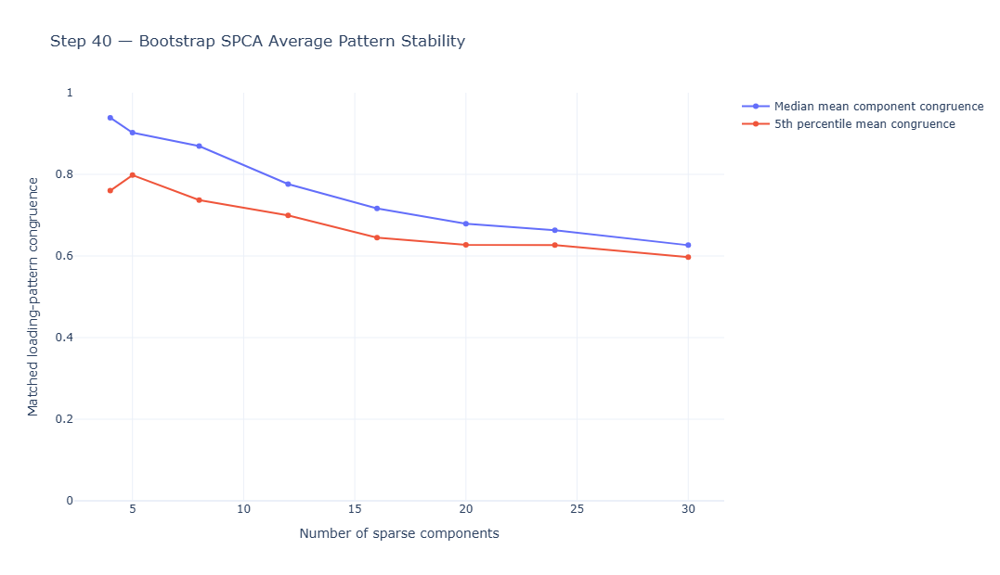

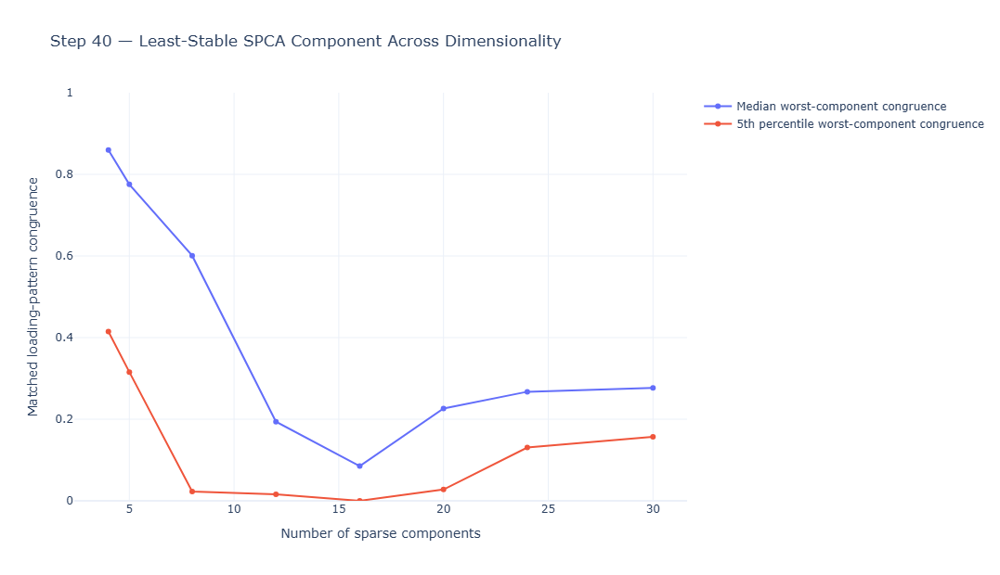

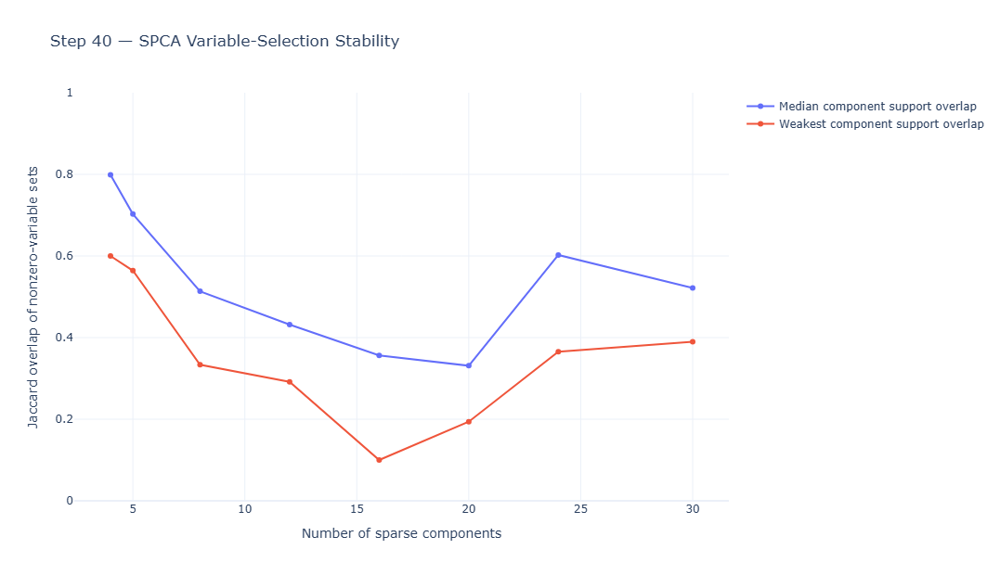


STEP 39 + STEP 40 — ONE-SE SPARSE PCA RETENTION EVIDENCE


,n_components,alpha,mean_cv_mse,mean_zero_percent,mean_active_variables,model_type,successful_bootstraps,failed_bootstraps,median_mean_congruence,p05_mean_congruence,p95_mean_congruence,median_median_congruence,median_worst_component_congruence,p05_worst_component_congruence,reference_mean_active_variables,reference_min_active_variables,reference_max_active_variables
0,4,2.0337,0.6636,43.2432,42.0000,one_se_sparse,100,0,0.9389,0.7601,0.9832,0.9565,0.8597,0.4149,49.0000,26,64
1,5,2.0337,0.6317,50.5405,36.6000,one_se_sparse,100,0,0.9021,0.7981,0.9706,0.9523,0.7754,0.3155,43.0000,23,64
2,8,2.0337,0.5433,65.6532,25.4167,one_se_sparse,100,0,0.8692,0.7370,0.9495,0.9287,0.6007,0.0228,30.0000,8,58
3,12,2.0337,0.4716,72.2598,20.5278,one_se_sparse,100,0,0.7762,0.6994,0.8534,0.8633,0.1940,0.0159,25.5000,7,57
4,16,2.0337,0.4127,77.3930,16.7292,one_se_sparse,100,0,0.7164,0.6451,0.7692,0.7909,0.0850,0.0000,20.8125,4,57
5,20,2.0337,0.3390,80.3378,14.5500,one_se_sparse,100,0,0.6789,0.6273,0.7382,0.6908,0.2262,0.0277,18.7000,6,55
6,24,0.5385,0.2690,37.6877,46.1111,one_se_sparse,100,0,0.6631,0.6268,0.6985,0.6496,0.2673,0.1306,48.3333,30,69
7,30,0.5385,0.1898,42.9279,42.2333,one_se_sparse,100,0,0.6264,0.5969,0.6596,0.5900,0.2767,0.1569,46.3667,30,68



STEP 40 — BOOTSTRAP SPCA STABILITY INTERPRETATION

Strongest average loading-pattern reproducibility:
  k = 4
  Median mean congruence = 0.9389

Strongest worst-component reproducibility:
  k = 4
  Median worst-component congruence = 0.8597

INTERPRETATION:
  Compare how average component congruence, the least-stable component, and variable-selection overlap change as dimensionality increases.

  A dimensionality that improves reconstruction but causes substantial deterioration in component reproducibility is less attractive as an interpretable SPCA solution.

  No automatic retention cutoff has been imposed.

STEP 40 COMPLETE — BOOTSTRAP ONE-SE SPARSE PCA PATTERN STABILITY

Bootstrap replications per dimensionality:
  100

Candidate dimensionalities:
  4, 5, 8, 12, 16, 20, 24, 30

SPCA model validated:
  Step 39 one-SE sparse solution for each dimensionality

Total successful analysis runtime:
  1821.3 seconds

Primary evidence:
  Loading-pattern congruence
  Worst-component congruen

In [53]:
# ==================================================================================================
# STEP 40 — BOOTSTRAP SPARSE PCA COMPONENT-PATTERN STABILITY
# CORRECTED FOR REVISED STEP 39 ONE-SE SPARSE SOLUTIONS
# ==================================================================================================
#
# PURPOSE
# -------
#
# Step 39 independently evaluated SPCA dimensionality and tuned the
# sparsity penalty for every candidate number of components.
#
# For each dimensionality, Step 39 reported:
#
#       minimum-CV alpha
#       one-SE sparse alpha
#
# Step 40 now asks:
#
#       "Which ONE-SE sparse SPCA dimensionalities reproduce stable
#        component patterns when the player sample changes?"
#
#
# METHOD
# ------
#
# For each candidate SPCA dimensionality:
#
#   1. Obtain the ONE-SE SPARSE alpha selected for that same
#      dimensionality in Step 39.
#
#   2. Fit a reference SPCA solution to the complete dataset.
#
#   3. Draw bootstrap samples of players WITH REPLACEMENT.
#
#   4. Refit SPCA to every bootstrap sample using the same:
#
#          number of components
#          one-SE alpha
#
#   5. Compare bootstrap component coefficient vectors with the
#      reference component coefficient vectors.
#
#   6. Components are optimally matched using the Hungarian
#      assignment algorithm.
#
#   7. Sign indeterminacy is handled through absolute cosine
#      congruence.
#
#
# PRIMARY STABILITY MEASURES
# --------------------------
#
#   - matched loading-pattern congruence
#   - worst-component congruence
#   - support / nonzero-variable overlap
#
#
# IMPORTANT
# ---------
#
# Step 40 does NOT retune alpha.
#
# It validates the exact one-SE sparse model selected by Step 39
# for each candidate dimensionality.
#
#
# CANDIDATE DIMENSIONALITIES
# --------------------------
#
# Representative dimensions:
#
#       4, 5, 8, 12, 16, 20, 24, 30
#
# These span the solution path without requiring bootstrap
# validation of all 74 dimensions.
#
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import warnings
import time

import numpy as np
import pandas as pd

from sklearn.decomposition import MiniBatchSparsePCA
from sklearn.preprocessing import StandardScaler

from scipy.optimize import linear_sum_assignment

from IPython.display import display


# --------------------------------------------------------------------------------------------------
# Plotly
# --------------------------------------------------------------------------------------------------

try:

    import plotly.graph_objects as go

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly\n\n"
        "Then restart the kernel."
    ) from error


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

RANDOM_STATE = 42


# --------------------------------------------------------------------------------------------------
# Representative candidate dimensionalities
# --------------------------------------------------------------------------------------------------

CANDIDATE_DIMENSIONS = [
    4,
    5,
    8,
    12,
    16,
    20,
    24,
    30
]


# --------------------------------------------------------------------------------------------------
# Bootstrap replications
# --------------------------------------------------------------------------------------------------

N_BOOTSTRAPS = 100


# --------------------------------------------------------------------------------------------------
# MiniBatchSparsePCA settings
# --------------------------------------------------------------------------------------------------

MINIBATCH_MAX_ITER = 60

MINIBATCH_BATCH_SIZE = 128

RIDGE_ALPHA = 0.01


# --------------------------------------------------------------------------------------------------
# Numerical zero
# --------------------------------------------------------------------------------------------------

ZERO_TOLERANCE = 1e-10


# --------------------------------------------------------------------------------------------------
# Progress reporting
# --------------------------------------------------------------------------------------------------

PRINT_EVERY = 10


# ==================================================================================================
# 3. VERIFY / REBUILD SPCA INPUT MATRIX
# ==================================================================================================
#
# Prefer X_spca_raw from Step 39.
#
# If unavailable, rebuild from:
#
#       X_df
#       pca_variables
#
# ==================================================================================================

if (
    "X_spca_raw" in globals()
    and
    isinstance(
        X_spca_raw,
        np.ndarray
    )
):

    X_bootstrap_spca_raw = (
        X_spca_raw
        .copy()
    )


    if (
        "performance_variables" in globals()
    ):

        bootstrap_spca_variables = list(
            performance_variables
        )


    elif (
        "pca_variables" in globals()
    ):

        bootstrap_spca_variables = list(
            pca_variables
        )


    else:

        raise RuntimeError(
            "`performance_variables` and `pca_variables` "
            "are both missing."
        )


else:

    if (
        "X_df" not in globals()
        or
        not isinstance(
            X_df,
            pd.DataFrame
        )
    ):

        raise RuntimeError(
            "Could not find `X_spca_raw` or `X_df`.\n\n"
            "Run preprocessing and revised Step 39 first."
        )


    if (
        "pca_variables" not in globals()
    ):

        raise RuntimeError(
            "`pca_variables` is missing."
        )


    bootstrap_spca_variables = [

        variable

        for variable in list(
            pca_variables
        )

        if variable in X_df.columns
    ]


    X_bootstrap_spca_df = (
        X_df[
            bootstrap_spca_variables
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


    for variable in bootstrap_spca_variables:

        X_bootstrap_spca_df[
            variable
        ] = pd.to_numeric(
            X_bootstrap_spca_df[
                variable
            ],
            errors="coerce"
        )


    if (
        X_bootstrap_spca_df
        .isna()
        .any()
        .any()
    ):

        raise RuntimeError(
            "SPCA bootstrap input contains missing values."
        )


    X_bootstrap_spca_raw = (
        X_bootstrap_spca_df
        .to_numpy(
            dtype=float
        )
    )


# ==================================================================================================
# 4. VALIDATE INPUT MATRIX
# ==================================================================================================

if not np.isfinite(
    X_bootstrap_spca_raw
).all():

    raise RuntimeError(
        "SPCA bootstrap matrix contains non-finite values."
    )


N, P = (
    X_bootstrap_spca_raw.shape
)


if (
    len(
        bootstrap_spca_variables
    )
    !=
    P
):

    raise RuntimeError(
        "Variable-name count does not match SPCA matrix width."
    )


maximum_allowed_components = min(
    N - 1,
    P
)


CANDIDATE_DIMENSIONS = [

    k

    for k in CANDIDATE_DIMENSIONS

    if k <= maximum_allowed_components
]


# ==================================================================================================
# 5. OBTAIN REVISED STEP 39 ONE-SE ALPHA FOR EACH DIMENSION
# ==================================================================================================
#
# Revised Step 39 created:
#
#       spca_alpha_selection_by_k
#
# Required columns:
#
#       n_components
#       one_se_alpha
#
# We intentionally bootstrap the one-SE sparse solution because
# this is the parsimonious sparse candidate selected after balancing
# reconstruction quality and sparsity.
#
# ==================================================================================================

if (
    "spca_alpha_selection_by_k" not in globals()
    or
    not isinstance(
        spca_alpha_selection_by_k,
        pd.DataFrame
    )
):

    raise RuntimeError(
        "`spca_alpha_selection_by_k` was not found.\n\n"
        "Run the REVISED Step 39 SPCA analysis first.\n\n"
        "Do NOT rerun the old Step 39 that created "
        "`spca_best_model_per_k`."
    )


required_selection_columns = [
    "n_components",
    "one_se_alpha"
]


missing_selection_columns = [

    column

    for column in required_selection_columns

    if column not in spca_alpha_selection_by_k.columns
]


if missing_selection_columns:

    raise RuntimeError(
        "`spca_alpha_selection_by_k` is missing required columns:\n\n"
        +
        "\n".join(
            missing_selection_columns
        )
    )


alpha_by_dimension = {}

missing_dimensions = []


for k in CANDIDATE_DIMENSIONS:

    matching_rows = (
        spca_alpha_selection_by_k[
            spca_alpha_selection_by_k[
                "n_components"
            ]
            ==
            k
        ]
    )


    if matching_rows.empty:

        missing_dimensions.append(
            k
        )

        continue


    alpha_by_dimension[
        k
    ] = float(
        matching_rows[
            "one_se_alpha"
        ]
        .iloc[
            0
        ]
    )


if missing_dimensions:

    raise RuntimeError(
        "Revised Step 39 does not contain one-SE alpha selections for:\n\n"
        +
        ", ".join(
            str(k)
            for k in missing_dimensions
        )
        +
        "\n\nEither rerun Step 39 across those dimensionalities "
        "or modify CANDIDATE_DIMENSIONS."
    )


# ==================================================================================================
# 6. PRINT SETUP
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STEP 40 — BOOTSTRAP SPCA COMPONENT-PATTERN STABILITY"
)


print(
    "=" * 150
)


print(
    "\nObservations:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nBootstrap replications per dimensionality:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nCandidate dimensionalities:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in CANDIDATE_DIMENSIONS
    )
)


print(
    "\nStep 39 ONE-SE sparse alpha by dimensionality:"
)


for k in CANDIDATE_DIMENSIONS:

    print(
        f"  k={k:>2}: "
        f"alpha={alpha_by_dimension[k]:.8g}"
    )


print(
    "\nTotal bootstrap SPCA fits:"
)


print(
    f"  "
    f"{len(CANDIDATE_DIMENSIONS)}"
    f" × "
    f"{N_BOOTSTRAPS}"
    f" = "
    f"{len(CANDIDATE_DIMENSIONS) * N_BOOTSTRAPS:,}"
)


# ==================================================================================================
# 7. HELPER — FIT STANDARDIZED MINI-BATCH SPCA
# ==================================================================================================

def fit_bootstrap_spca(
    X_raw,
    n_components,
    alpha
):

    scaler = StandardScaler()


    X_standardized = (
        scaler
        .fit_transform(
            X_raw
        )
    )


    model = MiniBatchSparsePCA(
        n_components=int(
            n_components
        ),
        alpha=float(
            alpha
        ),
        ridge_alpha=RIDGE_ALPHA,
        max_iter=MINIBATCH_MAX_ITER,
        batch_size=MINIBATCH_BATCH_SIZE,
        shuffle=True,
        random_state=RANDOM_STATE,
        verbose=False
    )


    with warnings.catch_warnings():

        warnings.simplefilter(
            "ignore"
        )


        model.fit(
            X_standardized
        )


    return (
        scaler,
        model,
        model.components_.copy()
    )


# ==================================================================================================
# 8. HELPER — NORMALIZE COMPONENT ROWS
# ==================================================================================================

def normalize_component_rows(
    components
):

    components = np.asarray(
        components,
        dtype=float
    )


    norms = np.linalg.norm(
        components,
        axis=1,
        keepdims=True
    )


    norms[
        norms
        <=
        ZERO_TOLERANCE
    ] = np.nan


    normalized = (
        components
        /
        norms
    )


    return normalized


# ==================================================================================================
# 9. HELPER — MATCH BOOTSTRAP COMPONENTS
# ==================================================================================================

def match_sparse_components(
    reference_components,
    bootstrap_components
):

    reference_normalized = (
        normalize_component_rows(
            reference_components
        )
    )


    bootstrap_normalized = (
        normalize_component_rows(
            bootstrap_components
        )
    )


    similarity_matrix = np.abs(
        reference_normalized
        @
        bootstrap_normalized.T
    )


    similarity_matrix = np.nan_to_num(
        similarity_matrix,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )


    reference_indices, bootstrap_indices = (
        linear_sum_assignment(
            -
            similarity_matrix
        )
    )


    matched_similarity = (
        similarity_matrix[
            reference_indices,
            bootstrap_indices
        ]
    )


    return (
        reference_indices,
        bootstrap_indices,
        matched_similarity
    )


# ==================================================================================================
# 10. HELPER — SIGN ALIGN COMPONENT
# ==================================================================================================

def sign_align_component(
    reference_vector,
    bootstrap_vector
):

    reference_norm = np.linalg.norm(
        reference_vector
    )


    bootstrap_norm = np.linalg.norm(
        bootstrap_vector
    )


    if (
        reference_norm <= ZERO_TOLERANCE
        or
        bootstrap_norm <= ZERO_TOLERANCE
    ):

        return bootstrap_vector


    raw_cosine = float(
        np.dot(
            reference_vector,
            bootstrap_vector
        )
        /
        (
            reference_norm
            *
            bootstrap_norm
        )
    )


    if raw_cosine < 0:

        bootstrap_vector = (
            -
            bootstrap_vector
        )


    return bootstrap_vector


# ==================================================================================================
# 11. STORAGE
# ==================================================================================================

rng = np.random.default_rng(
    RANDOM_STATE
)


dimension_summary_rows = []

component_summary_rows = []

bootstrap_iteration_rows = []


reference_spca_by_dimension = {}


# ==================================================================================================
# 12. BOOTSTRAP EACH CANDIDATE DIMENSION
# ==================================================================================================

overall_start_time = time.time()


for dimension_position, k in enumerate(
    CANDIDATE_DIMENSIONS,
    start=1
):


    dimension_start_time = time.time()


    alpha = alpha_by_dimension[
        k
    ]


    print(
        "\n"
        + "-" * 150
    )


    print(
        f"DIMENSION "
        f"{k} "
        f"({dimension_position}/"
        f"{len(CANDIDATE_DIMENSIONS)})"
    )


    print(
        f"One-SE alpha: {alpha:.8g}"
    )


    # ==============================================================================================
    # 12A. REFERENCE SPCA
    # ==============================================================================================

    (
        reference_scaler,
        reference_model,
        reference_components

    ) = fit_bootstrap_spca(
        X_bootstrap_spca_raw,
        n_components=k,
        alpha=alpha
    )


    reference_active_counts = (
        (
            np.abs(
                reference_components
            )
            >
            ZERO_TOLERANCE
        )
        .sum(
            axis=1
        )
    )


    reference_spca_by_dimension[
        k
    ] = {

        "alpha":
            alpha,

        "components":
            reference_components.copy(),

        "active_variables":
            reference_active_counts.copy(),

        "model_type":
            "one_se_sparse"
    }


    # ==============================================================================================
    # 12B. STORAGE FOR THIS DIMENSION
    # ==============================================================================================

    mean_similarity_values = []

    median_similarity_values = []

    minimum_similarity_values = []


    component_similarity_values = [
        []
        for _
        in range(
            k
        )
    ]


    component_active_variable_values = [
        []
        for _
        in range(
            k
        )
    ]


    component_support_overlap_values = [
        []
        for _
        in range(
            k
        )
    ]


    successful_bootstraps = 0

    failed_bootstraps = 0


    # ==============================================================================================
    # 12C. BOOTSTRAP LOOP
    # ==============================================================================================

    for bootstrap_iteration in range(
        1,
        N_BOOTSTRAPS + 1
    ):


        bootstrap_indices = (
            rng.integers(
                low=0,
                high=N,
                size=N
            )
        )


        X_bootstrap_raw = (
            X_bootstrap_spca_raw[
                bootstrap_indices,
                :
            ]
        )


        try:

            (
                bootstrap_scaler,
                bootstrap_model,
                bootstrap_components

            ) = fit_bootstrap_spca(
                X_bootstrap_raw,
                n_components=k,
                alpha=alpha
            )


            (
                reference_indices,
                matched_bootstrap_indices,
                matched_similarities

            ) = match_sparse_components(
                reference_components,
                bootstrap_components
            )


        except Exception as error:

            failed_bootstraps += 1


            warnings.warn(
                f"Bootstrap {bootstrap_iteration} failed "
                f"for k={k}: {error}"
            )


            continue


        successful_bootstraps += 1


        # ------------------------------------------------------------------------------------------
        # Replication-level stability
        # ------------------------------------------------------------------------------------------

        replicate_mean_similarity = float(
            np.mean(
                matched_similarities
            )
        )


        replicate_median_similarity = float(
            np.median(
                matched_similarities
            )
        )


        replicate_minimum_similarity = float(
            np.min(
                matched_similarities
            )
        )


        mean_similarity_values.append(
            replicate_mean_similarity
        )


        median_similarity_values.append(
            replicate_median_similarity
        )


        minimum_similarity_values.append(
            replicate_minimum_similarity
        )


        # ------------------------------------------------------------------------------------------
        # Component-level stability
        # ------------------------------------------------------------------------------------------

        for (
            reference_component_index,
            bootstrap_component_index,
            similarity
        ) in zip(
            reference_indices,
            matched_bootstrap_indices,
            matched_similarities
        ):


            reference_vector = (
                reference_components[
                    reference_component_index,
                    :
                ]
                .copy()
            )


            bootstrap_vector = (
                bootstrap_components[
                    bootstrap_component_index,
                    :
                ]
                .copy()
            )


            bootstrap_vector = (
                sign_align_component(
                    reference_vector,
                    bootstrap_vector
                )
            )


            # --------------------------------------------------------------------------------------
            # Active-variable support
            # --------------------------------------------------------------------------------------

            bootstrap_active = (
                np.abs(
                    bootstrap_vector
                )
                >
                ZERO_TOLERANCE
            )


            reference_active = (
                np.abs(
                    reference_vector
                )
                >
                ZERO_TOLERANCE
            )


            bootstrap_active_count = int(
                bootstrap_active.sum()
            )


            # --------------------------------------------------------------------------------------
            # Jaccard support overlap
            # --------------------------------------------------------------------------------------

            support_union = (
                reference_active
                |
                bootstrap_active
            )


            support_intersection = (
                reference_active
                &
                bootstrap_active
            )


            if (
                support_union.sum()
                ==
                0
            ):

                support_jaccard = np.nan


            else:

                support_jaccard = float(
                    support_intersection.sum()
                    /
                    support_union.sum()
                )


            component_similarity_values[
                reference_component_index
            ].append(
                float(
                    similarity
                )
            )


            component_active_variable_values[
                reference_component_index
            ].append(
                bootstrap_active_count
            )


            component_support_overlap_values[
                reference_component_index
            ].append(
                support_jaccard
            )


        # ------------------------------------------------------------------------------------------
        # Iteration-level result
        # ------------------------------------------------------------------------------------------

        bootstrap_iteration_rows.append(
            {

                "n_components":
                    k,

                "alpha":
                    alpha,

                "model_type":
                    "one_se_sparse",

                "bootstrap_iteration":
                    bootstrap_iteration,

                "mean_matched_congruence":
                    replicate_mean_similarity,

                "median_matched_congruence":
                    replicate_median_similarity,

                "minimum_matched_congruence":
                    replicate_minimum_similarity
            }
        )


        # ------------------------------------------------------------------------------------------
        # Progress
        # ------------------------------------------------------------------------------------------

        if (
            bootstrap_iteration
            %
            PRINT_EVERY
            ==
            0
        ):

            elapsed = (
                time.time()
                -
                dimension_start_time
            )


            print(
                f"\r  Bootstrap "
                f"{bootstrap_iteration}/"
                f"{N_BOOTSTRAPS}"
                f" | successful="
                f"{successful_bootstraps}"
                f" | elapsed="
                f"{elapsed:.1f}s",
                end=""
            )


    print()


    # ==============================================================================================
    # 12D. CHECK SUCCESS
    # ==============================================================================================

    if (
        successful_bootstraps
        ==
        0
    ):

        print(
            "  No successful bootstrap replications."
        )

        continue


    mean_similarity_values = np.asarray(
        mean_similarity_values,
        dtype=float
    )


    median_similarity_values = np.asarray(
        median_similarity_values,
        dtype=float
    )


    minimum_similarity_values = np.asarray(
        minimum_similarity_values,
        dtype=float
    )


    # ==============================================================================================
    # 12E. DIMENSION-LEVEL SUMMARY
    # ==============================================================================================

    dimension_summary_rows.append(
        {

            "n_components":
                k,

            "alpha":
                alpha,

            "model_type":
                "one_se_sparse",

            "successful_bootstraps":
                successful_bootstraps,

            "failed_bootstraps":
                failed_bootstraps,

            "median_mean_congruence":
                float(
                    np.median(
                        mean_similarity_values
                    )
                ),

            "p05_mean_congruence":
                float(
                    np.quantile(
                        mean_similarity_values,
                        0.05
                    )
                ),

            "p95_mean_congruence":
                float(
                    np.quantile(
                        mean_similarity_values,
                        0.95
                    )
                ),

            "median_median_congruence":
                float(
                    np.median(
                        median_similarity_values
                    )
                ),

            "median_worst_component_congruence":
                float(
                    np.median(
                        minimum_similarity_values
                    )
                ),

            "p05_worst_component_congruence":
                float(
                    np.quantile(
                        minimum_similarity_values,
                        0.05
                    )
                ),

            "reference_mean_active_variables":
                float(
                    np.mean(
                        reference_active_counts
                    )
                ),

            "reference_min_active_variables":
                int(
                    np.min(
                        reference_active_counts
                    )
                ),

            "reference_max_active_variables":
                int(
                    np.max(
                        reference_active_counts
                    )
                )
        }
    )


    # ==============================================================================================
    # 12F. COMPONENT-LEVEL SUMMARY
    # ==============================================================================================

    for component_index in range(
        k
    ):


        congruence_values = np.asarray(
            component_similarity_values[
                component_index
            ],
            dtype=float
        )


        active_values = np.asarray(
            component_active_variable_values[
                component_index
            ],
            dtype=float
        )


        support_values = np.asarray(
            component_support_overlap_values[
                component_index
            ],
            dtype=float
        )


        if (
            congruence_values.size
            ==
            0
        ):

            continue


        component_summary_rows.append(
            {

                "n_components":
                    k,

                "alpha":
                    alpha,

                "model_type":
                    "one_se_sparse",

                "component":
                    f"SPC{component_index + 1}",

                "reference_active_variables":
                    int(
                        reference_active_counts[
                            component_index
                        ]
                    ),

                "median_congruence":
                    float(
                        np.median(
                            congruence_values
                        )
                    ),

                "p05_congruence":
                    float(
                        np.quantile(
                            congruence_values,
                            0.05
                        )
                    ),

                "p95_congruence":
                    float(
                        np.quantile(
                            congruence_values,
                            0.95
                        )
                    ),

                "median_bootstrap_active_variables":
                    float(
                        np.median(
                            active_values
                        )
                    ),

                "median_support_jaccard":
                    float(
                        np.nanmedian(
                            support_values
                        )
                    ),

                "p05_support_jaccard":
                    float(
                        np.nanquantile(
                            support_values,
                            0.05
                        )
                    )
            }
        )


    dimension_elapsed = (
        time.time()
        -
        dimension_start_time
    )


    print(
        f"  Median mean congruence: "
        f"{np.median(mean_similarity_values):.4f}"
    )


    print(
        f"  Median worst-component congruence: "
        f"{np.median(minimum_similarity_values):.4f}"
    )


    print(
        f"  Runtime for k={k}: "
        f"{dimension_elapsed:.1f} seconds"
    )


# ==================================================================================================
# 13. CREATE OUTPUT TABLES
# ==================================================================================================

spca_bootstrap_dimension_stability = (
    pd.DataFrame(
        dimension_summary_rows
    )
    .sort_values(
        "n_components"
    )
    .reset_index(
        drop=True
    )
)


spca_bootstrap_component_stability = (
    pd.DataFrame(
        component_summary_rows
    )
    .sort_values(
        [
            "n_components",
            "component"
        ]
    )
    .reset_index(
        drop=True
    )
)


spca_bootstrap_iteration_results = (
    pd.DataFrame(
        bootstrap_iteration_rows
    )
    .sort_values(
        [
            "n_components",
            "bootstrap_iteration"
        ]
    )
    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 14. DISPLAY DIMENSION-LEVEL RESULTS
# ==================================================================================================

print(
    "\n"
    + "=" * 170
)


print(
    "BOOTSTRAP SPCA STABILITY BY DIMENSIONALITY"
)


print(
    "=" * 170
)


display(
    spca_bootstrap_dimension_stability
    .round(
        4
    )
)


# ==================================================================================================
# 15. DISPLAY COMPONENT-LEVEL RESULTS
# ==================================================================================================

print(
    "\n"
    + "=" * 170
)


print(
    "BOOTSTRAP SPCA COMPONENT-PATTERN STABILITY"
)


print(
    "=" * 170
)


display(
    spca_bootstrap_component_stability
    .round(
        4
    )
)


# ==================================================================================================
# 16. PLOT — AVERAGE SPCA PATTERN STABILITY
# ==================================================================================================

fig_spca_bootstrap_average_stability = go.Figure()


fig_spca_bootstrap_average_stability.add_trace(
    go.Scatter(
        x=
            spca_bootstrap_dimension_stability[
                "n_components"
            ],

        y=
            spca_bootstrap_dimension_stability[
                "median_mean_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "Median mean component congruence",

        customdata=
            spca_bootstrap_dimension_stability[
                [
                    "alpha",
                    "reference_mean_active_variables"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>Components: %{x}</b><br>"
                "Median mean congruence: %{y:.4f}<br>"
                "One-SE alpha: %{customdata[0]:.6g}<br>"
                "Mean active variables: %{customdata[1]:.2f}"
                "<extra></extra>"
            )
    )
)


fig_spca_bootstrap_average_stability.add_trace(
    go.Scatter(
        x=
            spca_bootstrap_dimension_stability[
                "n_components"
            ],

        y=
            spca_bootstrap_dimension_stability[
                "p05_mean_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "5th percentile mean congruence"
    )
)


fig_spca_bootstrap_average_stability.update_layout(
    title=
        "Step 40 — Bootstrap SPCA Average Pattern Stability",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Matched loading-pattern congruence",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_spca_bootstrap_average_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_spca_bootstrap_average_stability.show()


# ==================================================================================================
# 17. PLOT — WORST COMPONENT STABILITY
# ==================================================================================================

fig_spca_bootstrap_worst_stability = go.Figure()


fig_spca_bootstrap_worst_stability.add_trace(
    go.Scatter(
        x=
            spca_bootstrap_dimension_stability[
                "n_components"
            ],

        y=
            spca_bootstrap_dimension_stability[
                "median_worst_component_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "Median worst-component congruence"
    )
)


fig_spca_bootstrap_worst_stability.add_trace(
    go.Scatter(
        x=
            spca_bootstrap_dimension_stability[
                "n_components"
            ],

        y=
            spca_bootstrap_dimension_stability[
                "p05_worst_component_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "5th percentile worst-component congruence"
    )
)


fig_spca_bootstrap_worst_stability.update_layout(
    title=
        "Step 40 — Least-Stable SPCA Component Across Dimensionality",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Matched loading-pattern congruence",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_spca_bootstrap_worst_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_spca_bootstrap_worst_stability.show()


# ==================================================================================================
# 18. PLOT — SUPPORT / VARIABLE-SELECTION STABILITY
# ==================================================================================================

support_summary = (
    spca_bootstrap_component_stability

    .groupby(
        "n_components",
        as_index=False
    )

    .agg(
        median_component_support_jaccard=(
            "median_support_jaccard",
            "median"
        ),

        minimum_component_support_jaccard=(
            "median_support_jaccard",
            "min"
        )
    )
)


fig_spca_bootstrap_support_stability = go.Figure()


fig_spca_bootstrap_support_stability.add_trace(
    go.Scatter(
        x=
            support_summary[
                "n_components"
            ],

        y=
            support_summary[
                "median_component_support_jaccard"
            ],

        mode=
            "lines+markers",

        name=
            "Median component support overlap"
    )
)


fig_spca_bootstrap_support_stability.add_trace(
    go.Scatter(
        x=
            support_summary[
                "n_components"
            ],

        y=
            support_summary[
                "minimum_component_support_jaccard"
            ],

        mode=
            "lines+markers",

        name=
            "Weakest component support overlap"
    )
)


fig_spca_bootstrap_support_stability.update_layout(
    title=
        "Step 40 — SPCA Variable-Selection Stability",

    xaxis_title=
        "Number of sparse components",

    yaxis_title=
        "Jaccard overlap of nonzero-variable sets",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_spca_bootstrap_support_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_spca_bootstrap_support_stability.show()


# ==================================================================================================
# 19. CREATE COMBINED STEP 39 + STEP 40 EVIDENCE TABLE
# ==================================================================================================
#
# Revised Step 39 columns:
#
#       one_se_alpha
#       one_se_cv_mse
#       one_se_zero_percent
#       one_se_mean_active_variables
#
# Rename them locally so they merge cleanly with Step 40.
#
# ==================================================================================================

if (
    "spca_alpha_selection_by_k" in globals()
    and
    isinstance(
        spca_alpha_selection_by_k,
        pd.DataFrame
    )
):

    step39_for_merge = (
        spca_alpha_selection_by_k[
            [
                "n_components",
                "one_se_alpha",
                "one_se_cv_mse",
                "one_se_zero_percent",
                "one_se_mean_active_variables"
            ]
        ]
        .copy()
        .rename(
            columns={
                "one_se_alpha":
                    "alpha",

                "one_se_cv_mse":
                    "mean_cv_mse",

                "one_se_zero_percent":
                    "mean_zero_percent",

                "one_se_mean_active_variables":
                    "mean_active_variables"
            }
        )
    )


    spca_retention_evidence = (
        step39_for_merge

        .merge(
            spca_bootstrap_dimension_stability,
            on=[
                "n_components",
                "alpha"
            ],
            how="inner"
        )
    )


    print(
        "\n"
        + "=" * 170
    )


    print(
        "STEP 39 + STEP 40 — ONE-SE SPARSE PCA RETENTION EVIDENCE"
    )


    print(
        "=" * 170
    )


    display(
        spca_retention_evidence
        .round(
            4
        )
    )


# ==================================================================================================
# 20. AUTOMATED DESCRIPTIVE INTERPRETATION
# ==================================================================================================
#
# No arbitrary stability threshold is imposed.
#
# We identify:
#
#   - highest median average congruence
#   - highest median worst-component congruence
#
# ==================================================================================================

if not spca_bootstrap_dimension_stability.empty:


    best_average_index = (
        spca_bootstrap_dimension_stability[
            "median_mean_congruence"
        ]
        .idxmax()
    )


    best_worst_index = (
        spca_bootstrap_dimension_stability[
            "median_worst_component_congruence"
        ]
        .idxmax()
    )


    best_average_k = int(
        spca_bootstrap_dimension_stability.loc[
            best_average_index,
            "n_components"
        ]
    )


    best_average_congruence = float(
        spca_bootstrap_dimension_stability.loc[
            best_average_index,
            "median_mean_congruence"
        ]
    )


    best_worst_k = int(
        spca_bootstrap_dimension_stability.loc[
            best_worst_index,
            "n_components"
        ]
    )


    best_worst_congruence = float(
        spca_bootstrap_dimension_stability.loc[
            best_worst_index,
            "median_worst_component_congruence"
        ]
    )


    print(
        "\n"
        + "=" * 150
    )


    print(
        "STEP 40 — BOOTSTRAP SPCA STABILITY INTERPRETATION"
    )


    print(
        "=" * 150
    )


    print(
        "\nStrongest average loading-pattern reproducibility:"
    )


    print(
        f"  k = {best_average_k}"
    )


    print(
        f"  Median mean congruence = "
        f"{best_average_congruence:.4f}"
    )


    print(
        "\nStrongest worst-component reproducibility:"
    )


    print(
        f"  k = {best_worst_k}"
    )


    print(
        f"  Median worst-component congruence = "
        f"{best_worst_congruence:.4f}"
    )


    print(
        "\nINTERPRETATION:"
    )


    print(
        "  Compare how average component congruence, the "
        "least-stable component, and variable-selection "
        "overlap change as dimensionality increases."
    )


    print(
        "\n  A dimensionality that improves reconstruction "
        "but causes substantial deterioration in component "
        "reproducibility is less attractive as an "
        "interpretable SPCA solution."
    )


    print(
        "\n  No automatic retention cutoff has been imposed."
    )


# ==================================================================================================
# 21. FINAL SUMMARY
# ==================================================================================================

overall_elapsed = (
    time.time()
    -
    overall_start_time
)


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 40 COMPLETE — BOOTSTRAP ONE-SE SPARSE PCA PATTERN STABILITY"
)


print(
    "=" * 150
)


print(
    "\nBootstrap replications per dimensionality:"
)


print(
    f"  {N_BOOTSTRAPS:,}"
)


print(
    "\nCandidate dimensionalities:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in CANDIDATE_DIMENSIONS
    )
)


print(
    "\nSPCA model validated:"
)


print(
    "  Step 39 one-SE sparse solution for each dimensionality"
)


print(
    "\nTotal successful analysis runtime:"
)


print(
    f"  {overall_elapsed:.1f} seconds"
)


print(
    "\nPrimary evidence:"
)


print(
    "  Loading-pattern congruence"
)


print(
    "  Worst-component congruence"
)


print(
    "  Nonzero-variable support overlap"
)


print(
    "\nMain output objects:"
)


print(
    "  alpha_by_dimension"
)


print(
    "  spca_bootstrap_dimension_stability"
)


print(
    "  spca_bootstrap_component_stability"
)


print(
    "  spca_bootstrap_iteration_results"
)


print(
    "  reference_spca_by_dimension"
)


print(
    "  support_summary"
)


if (
    "spca_retention_evidence"
    in globals()
):

    print(
        "  spca_retention_evidence"
    )


print(
    "\nPlot objects:"
)


print(
    "  fig_spca_bootstrap_average_stability"
)


print(
    "  fig_spca_bootstrap_worst_stability"
)


print(
    "  fig_spca_bootstrap_support_stability"
)


print(
    "\nIMPORTANT:"
)


print(
    "  No SPCA dimensionality was automatically retained."
)


print(
    "  No observations were removed."
)


print(
    "  Alpha was NOT retuned during bootstrap."
)


print(
    "  Each k used the one-SE sparse alpha selected in revised Step 39."
)


print(
    "  Step 40 therefore validates the SAME sparse model family "
    "that is subsequently interpreted."
)


print(
    "\n"
    + "=" * 150
)

In [54]:
# ==================================================================================================
# STEP 40 — BOOTSTRAP SPCA STABILITY CONCLUSION
# ==================================================================================================
#
# Among the SPCA dimensionalities evaluated, the 4-component
# solution showed the strongest bootstrap reproducibility.
#
# The 5-component solution also remained highly stable, whereas
# larger solutions showed progressively weaker loading-pattern,
# worst-component, and variable-selection stability.
#
# Therefore the bootstrap evidence concentrates strongly in the
# low-dimensional SPCA region, particularly around 4–5 components.
#
# However, Step 40 evaluated representative dimensionalities rather
# than every possible k from the full Step 39 search.
#
# Consequently, k = 4 should currently be interpreted as the
# STRONGEST TESTED stability solution, not yet as a mathematically
# proven global optimum across every possible SPCA dimensionality.
#
# The next retention decision should combine:
#
#   - the full Step 39 dimensionality / sparsity frontier,
#   - Step 40 bootstrap stability,
#   - component definition,
#   - redundancy,
#   - substantive interpretability.
#
# ==================================================================================================

### 41. Print SPCA PC1-PC5

In [55]:
# ==================================================================================================
# STEP 41 — PRINT THE FINAL 5-COMPONENT ONE-SE SPARSE PCA SOLUTION
# CORRECTED FOR THE REVISED STEP 39 PIPELINE
# ==================================================================================================
#
# PURPOSE
# -------
#
# Inspect SPC1-SPC5 from the 5-component ONE-SE sparse solution
# selected in the revised Step 39 analysis.
#
#
# IMPORTANT
# ---------
#
# The revised Step 39 stores the selected alpha for every k in:
#
#       spca_alpha_selection_by_k
#
# It does NOT necessarily retain:
#
#       spca_final_loadings
#       spca_final_models
#       spca_final_model_summary
#
# Therefore this Step 41:
#
#   1. Reads the exact one-SE alpha selected for k = 5.
#
#   2. Rebuilds / recovers the same raw SPCA input matrix.
#
#   3. Standardizes the complete dataset.
#
#   4. Fits ONLY the final 5-component SparsePCA solution.
#
#   5. Prints SPC1-SPC5 coefficient structures.
#
#
# This is NOT a new model-selection step.
#
# k and alpha have already been selected/evaluated upstream.
#
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import warnings

import numpy as np
import pandas as pd

from sklearn.decomposition import SparsePCA
from sklearn.preprocessing import StandardScaler

from IPython.display import display


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

TARGET_K = 5

TARGET_MODEL_TYPE = "one_se_sparse"

RANDOM_STATE = 42

RIDGE_ALPHA = 0.01

SPCA_METHOD = "cd"

MAX_ITER = 3000

TOLERANCE = 1e-6

ZERO_TOLERANCE = 1e-10

TOP_N = 10


# ==================================================================================================
# 3. VERIFY REVISED STEP 39 ALPHA-SELECTION TABLE
# ==================================================================================================

if (
    "spca_alpha_selection_by_k" not in globals()
    or
    not isinstance(
        spca_alpha_selection_by_k,
        pd.DataFrame
    )
):

    raise RuntimeError(
        "`spca_alpha_selection_by_k` was not found.\n\n"
        "Run the REVISED Step 39 SPCA model-selection step first."
    )


required_columns = [
    "n_components",
    "one_se_alpha"
]


missing_columns = [
    column
    for column in required_columns
    if column not in spca_alpha_selection_by_k.columns
]


if missing_columns:

    raise RuntimeError(
        "`spca_alpha_selection_by_k` is missing required columns:\n\n"
        +
        "\n".join(
            missing_columns
        )
    )


# ==================================================================================================
# 4. EXTRACT THE EXACT k = 5 ONE-SE ALPHA
# ==================================================================================================

k5_selection = (
    spca_alpha_selection_by_k[
        spca_alpha_selection_by_k[
            "n_components"
        ]
        ==
        TARGET_K
    ]
    .copy()
)


if k5_selection.empty:

    raise RuntimeError(
        "No k = 5 solution was found in "
        "`spca_alpha_selection_by_k`."
    )


k5_selection = (
    k5_selection
    .iloc[0]
)


selected_alpha = float(
    k5_selection[
        "one_se_alpha"
    ]
)


# ==================================================================================================
# 5. RECOVER / REBUILD SPCA INPUT MATRIX
# ==================================================================================================
#
# Preferred source:
#
#       X_spca_raw
#
# If unavailable, rebuild from:
#
#       X_df
#       pca_variables
#
# ==================================================================================================

if (
    "X_spca_raw" in globals()
    and
    isinstance(
        X_spca_raw,
        np.ndarray
    )
):

    X_spca_final_raw = (
        X_spca_raw
        .copy()
    )


    if (
        "performance_variables" in globals()
    ):

        spca_variable_names = list(
            performance_variables
        )


    elif (
        "pca_variables" in globals()
    ):

        spca_variable_names = list(
            pca_variables
        )


    else:

        raise RuntimeError(
            "`X_spca_raw` exists, but variable names could not "
            "be recovered from `performance_variables` or "
            "`pca_variables`."
        )


else:

    if (
        "X_df" not in globals()
        or
        not isinstance(
            X_df,
            pd.DataFrame
        )
    ):

        raise RuntimeError(
            "Could not find `X_spca_raw` or `X_df`.\n\n"
            "Run preprocessing and revised Step 39 first."
        )


    if (
        "pca_variables" not in globals()
    ):

        raise RuntimeError(
            "`pca_variables` was not found."
        )


    spca_variable_names = [

        variable

        for variable in list(
            pca_variables
        )

        if variable in X_df.columns
    ]


    X_spca_final_df = (
        X_df[
            spca_variable_names
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


    for variable in spca_variable_names:

        X_spca_final_df[
            variable
        ] = pd.to_numeric(
            X_spca_final_df[
                variable
            ],
            errors="coerce"
        )


    if (
        X_spca_final_df
        .isna()
        .any()
        .any()
    ):

        raise RuntimeError(
            "SPCA input contains missing values."
        )


    X_spca_final_raw = (
        X_spca_final_df
        .to_numpy(
            dtype=float
        )
    )


# ==================================================================================================
# 6. VALIDATE INPUT MATRIX
# ==================================================================================================

if not np.isfinite(
    X_spca_final_raw
).all():

    raise RuntimeError(
        "SPCA input contains non-finite values."
    )


N, P = (
    X_spca_final_raw.shape
)


if (
    len(
        spca_variable_names
    )
    !=
    P
):

    raise RuntimeError(
        "Variable-name count does not match matrix width.\n\n"
        f"Variables: {len(spca_variable_names)}\n"
        f"Matrix columns: {P}"
    )


if TARGET_K > min(
    N - 1,
    P
):

    raise RuntimeError(
        "k = 5 is not feasible for the current matrix."
    )


# ==================================================================================================
# 7. STANDARDIZE COMPLETE DATASET
# ==================================================================================================

spca5_scaler = StandardScaler()


X_spca5_standardized = (
    spca5_scaler
    .fit_transform(
        X_spca_final_raw
    )
)


# ==================================================================================================
# 8. FIT THE EXACT 5-COMPONENT ONE-SE SPARSE PCA MODEL
# ==================================================================================================
#
# IMPORTANT:
#
# Alpha is NOT retuned here.
#
# It is taken directly from revised Step 39.
#
# ==================================================================================================

spca5_one_se_model = SparsePCA(
    n_components=TARGET_K,
    alpha=selected_alpha,
    ridge_alpha=RIDGE_ALPHA,
    method=SPCA_METHOD,
    max_iter=MAX_ITER,
    tol=TOLERANCE,
    n_jobs=-1,
    random_state=RANDOM_STATE
)


with warnings.catch_warnings():

    warnings.simplefilter(
        "ignore"
    )


    spca5_one_se_scores_array = (
        spca5_one_se_model
        .fit_transform(
            X_spca5_standardized
        )
    )


# ==================================================================================================
# 9. CREATE LOADING / COEFFICIENT MATRIX
# ==================================================================================================

component_names = [
    "SPC1",
    "SPC2",
    "SPC3",
    "SPC4",
    "SPC5"
]


spca5_one_se_loadings = pd.DataFrame(
    spca5_one_se_model.components_.T,
    index=spca_variable_names,
    columns=component_names
)


spca5_one_se_scores = pd.DataFrame(
    spca5_one_se_scores_array,
    columns=component_names
)


# ==================================================================================================
# 10. RECONSTRUCTION MSE
# ==================================================================================================

X_spca5_reconstruction = (
    spca5_one_se_scores_array
    @
    spca5_one_se_model.components_
)


if hasattr(
    spca5_one_se_model,
    "mean_"
):

    X_spca5_reconstruction = (
        X_spca5_reconstruction
        +
        spca5_one_se_model.mean_
    )


spca5_reconstruction_mse = float(
    np.mean(
        (
            X_spca5_standardized
            -
            X_spca5_reconstruction
        )
        ** 2
    )
)


# ==================================================================================================
# 11. CALCULATE OVERALL SPARSITY
# ==================================================================================================

all_coefficients = (
    spca5_one_se_model
    .components_
)


active_mask = (
    np.abs(
        all_coefficients
    )
    >
    ZERO_TOLERANCE
)


total_coefficients = (
    all_coefficients.size
)


active_coefficients = int(
    active_mask.sum()
)


zero_coefficients = int(
    (
        ~active_mask
    )
    .sum()
)


overall_zero_percent = float(
    zero_coefficients
    /
    total_coefficients
    *
    100
)


active_per_component = (
    active_mask
    .sum(
        axis=1
    )
)


overall_mean_active = float(
    active_per_component.mean()
)


# ==================================================================================================
# 12. PRINT MODEL HEADER
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "STEP 41 — FINAL 5-COMPONENT ONE-SE SPARSE PCA SOLUTION"
)


print(
    "=" * 140
)


print(
    "\nObservations:"
)


print(
    f"  {N:,}"
)


print(
    "\nPerformance variables:"
)


print(
    f"  {P:,}"
)


print(
    "\nComponents:"
)


print(
    f"  {TARGET_K}"
)


print(
    "\nModel type:"
)


print(
    "  one-SE sparse solution"
)


print(
    "\nStep 39 selected alpha:"
)


print(
    f"  {selected_alpha:.8f}"
)


print(
    "\nOverall sparsity:"
)


print(
    f"  {overall_zero_percent:.2f}% zero coefficients"
)


print(
    "\nMean active variables per component:"
)


print(
    f"  {overall_mean_active:.2f}"
)


print(
    "\nFull-data reconstruction MSE:"
)


print(
    f"  {spca5_reconstruction_mse:.6f}"
)


# ==================================================================================================
# 13. CREATE COMPLETE COMPONENT TABLES
# ==================================================================================================

spca5_one_se_component_tables = {}


for component in component_names:


    coefficients = (
        spca5_one_se_loadings[
            component
        ]
    )


    table = pd.DataFrame(
        {
            "variable":
                coefficients.index,

            "coefficient":
                coefficients.values
        }
    )


    table[
        "absolute_coefficient"
    ] = (
        table[
            "coefficient"
        ]
        .abs()
    )


    # ----------------------------------------------------------------------------------------------
    # Keep only nonzero SPCA coefficients
    # ----------------------------------------------------------------------------------------------

    table = (
        table[
            table[
                "absolute_coefficient"
            ]
            >
            ZERO_TOLERANCE
        ]
        .copy()
    )


    table[
        "direction"
    ] = np.where(
        table[
            "coefficient"
        ]
        >
        0,
        "Positive",
        "Negative"
    )


    table = (
        table
        .sort_values(
            "absolute_coefficient",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


    spca5_one_se_component_tables[
        component
    ] = table


# ==================================================================================================
# 14. PRINT SPC1-SPC5 COMPLETE NONZERO STRUCTURES
# ==================================================================================================

for component in component_names:


    table = (
        spca5_one_se_component_tables[
            component
        ]
    )


    active_variables = len(
        table
    )


    zero_variables = (
        P
        -
        active_variables
    )


    zero_percent = (
        zero_variables
        /
        P
        *
        100
    )


    positive_count = int(
        (
            table[
                "coefficient"
            ]
            >
            0
        )
        .sum()
    )


    negative_count = int(
        (
            table[
                "coefficient"
            ]
            <
            0
        )
        .sum()
    )


    print(
        "\n"
        + "=" * 140
    )


    print(
        f"{component} — COMPLETE NONZERO COEFFICIENT STRUCTURE"
    )


    print(
        "=" * 140
    )


    print(
        f"\nActive variables: "
        f"{active_variables} / {P}"
    )


    print(
        f"Zero coefficients: "
        f"{zero_variables}"
    )


    print(
        f"Sparsity: "
        f"{zero_percent:.2f}%"
    )


    print(
        f"Positive coefficients: "
        f"{positive_count}"
    )


    print(
        f"Negative coefficients: "
        f"{negative_count}"
    )


    print()


    display(
        table.round(
            4
        )
    )


# ==================================================================================================
# 15. CREATE TOP-10 TABLE
# ==================================================================================================

top_rows = []


for component in component_names:


    component_table = (
        spca5_one_se_component_tables[
            component
        ]
        .head(
            TOP_N
        )
        .copy()
    )


    for rank, row in enumerate(
        component_table.itertuples(
            index=False
        ),
        start=1
    ):


        top_rows.append(
            {
                "component":
                    component,

                "rank":
                    rank,

                "variable":
                    row.variable,

                "coefficient":
                    row.coefficient,

                "absolute_coefficient":
                    row.absolute_coefficient,

                "direction":
                    row.direction
            }
        )


spca5_one_se_top10 = pd.DataFrame(
    top_rows
)


print(
    "\n"
    + "=" * 140
)


print(
    "SPC1-SPC5 — TOP 10 DEFINING VARIABLES"
)


print(
    "=" * 140
)


display(
    spca5_one_se_top10
    .round(
        4
    )
)


# ==================================================================================================
# 16. COMPONENT SPARSITY SUMMARY
# ==================================================================================================

summary_rows = []


for component in component_names:


    table = (
        spca5_one_se_component_tables[
            component
        ]
    )


    active_variables = len(
        table
    )


    zero_variables = (
        P
        -
        active_variables
    )


    if not table.empty:

        strongest_variable = (
            table
            .iloc[0][
                "variable"
            ]
        )


        strongest_coefficient = float(
            table
            .iloc[0][
                "coefficient"
            ]
        )


    else:

        strongest_variable = np.nan

        strongest_coefficient = np.nan


    summary_rows.append(
        {
            "component":
                component,

            "active_variables":
                active_variables,

            "zero_variables":
                zero_variables,

            "zero_percent":
                (
                    zero_variables
                    /
                    P
                    *
                    100
                ),

            "positive_coefficients":
                int(
                    (
                        table[
                            "coefficient"
                        ]
                        >
                        0
                    )
                    .sum()
                ),

            "negative_coefficients":
                int(
                    (
                        table[
                            "coefficient"
                        ]
                        <
                        0
                    )
                    .sum()
                ),

            "strongest_variable":
                strongest_variable,

            "strongest_coefficient":
                strongest_coefficient
        }
    )


spca5_one_se_component_summary = pd.DataFrame(
    summary_rows
)


print(
    "\n"
    + "=" * 140
)


print(
    "SPC1-SPC5 — SPARSITY AND STRUCTURE SUMMARY"
)


print(
    "=" * 140
)


display(
    spca5_one_se_component_summary
    .round(
        4
    )
)


# ==================================================================================================
# 17. CREATE INDIVIDUAL SPC OBJECTS
# ==================================================================================================

SPC1 = (
    spca5_one_se_component_tables[
        "SPC1"
    ]
    .copy()
)


SPC2 = (
    spca5_one_se_component_tables[
        "SPC2"
    ]
    .copy()
)


SPC3 = (
    spca5_one_se_component_tables[
        "SPC3"
    ]
    .copy()
)


SPC4 = (
    spca5_one_se_component_tables[
        "SPC4"
    ]
    .copy()
)


SPC5 = (
    spca5_one_se_component_tables[
        "SPC5"
    ]
    .copy()
)


# ==================================================================================================
# 18. SIMPLE INTERPRETATION PREVIEW
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "SPC1-SPC5 — SIMPLE TOP-10 INTERPRETATION PREVIEW"
)


print(
    "=" * 140
)


for component in component_names:


    print(
        f"\n{component}"
    )


    print(
        "-" * 75
    )


    table = (
        spca5_one_se_component_tables[
            component
        ]
        .head(
            TOP_N
        )
    )


    for _, row in table.iterrows():

        print(
            f"{row['variable']:<58} "
            f"{row['coefficient']:>9.4f}"
        )


# ==================================================================================================
# 19. SAVE A CONSISTENT REFERENCE OBJECT
# ==================================================================================================
#
# This makes later interpretation easier and also restores a compact
# fitted-model object after a kernel restart.
#
# ==================================================================================================

spca5_one_se_reference = {

    "n_components":
        TARGET_K,

    "model_type":
        TARGET_MODEL_TYPE,

    "alpha":
        selected_alpha,

    "scaler":
        spca5_scaler,

    "model":
        spca5_one_se_model,

    "loadings":
        spca5_one_se_loadings.copy(),

    "scores":
        spca5_one_se_scores.copy(),

    "reconstruction_mse":
        spca5_reconstruction_mse,

    "overall_zero_percent":
        overall_zero_percent,

    "mean_active_variables":
        overall_mean_active
}


# ==================================================================================================
# 20. FINAL SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "STEP 41 COMPLETE — FINAL ONE-SE SPARSE SPC1-SPC5"
)


print(
    "=" * 140
)


print(
    "\nSolution inspected:"
)


print(
    f"  k = {TARGET_K}"
)


print(
    f"  model_type = {TARGET_MODEL_TYPE}"
)


print(
    f"  alpha = {selected_alpha:.8f}"
)


print(
    "\nIMPORTANT:"
)


print(
    "  Alpha was NOT retuned in Step 41."
)


print(
    "  The exact one-SE alpha selected in revised Step 39 was used."
)


print(
    "  Step 41 refitted only the final k=5 model because the "
    "revised Step 39 does not necessarily retain fitted model objects."
)


print(
    "\nMain output objects:"
)


print(
    "  spca5_one_se_model"
)


print(
    "  spca5_one_se_scores"
)


print(
    "  spca5_one_se_loadings"
)


print(
    "  spca5_one_se_component_tables"
)


print(
    "  spca5_one_se_top10"
)


print(
    "  spca5_one_se_component_summary"
)


print(
    "  spca5_one_se_reference"
)


print(
    "  SPC1"
)


print(
    "  SPC2"
)


print(
    "  SPC3"
)


print(
    "  SPC4"
)


print(
    "  SPC5"
)


print(
    "\n"
    + "=" * 140
)


STEP 41 — FINAL 5-COMPONENT ONE-SE SPARSE PCA SOLUTION

Observations:
  673

Performance variables:
  74

Components:
  5

Model type:
  one-SE sparse solution

Step 39 selected alpha:
  2.03370977

Overall sparsity:
  57.30% zero coefficients

Mean active variables per component:
  31.60

Full-data reconstruction MSE:
  0.566919

SPC1 — COMPLETE NONZERO COEFFICIENT STRUCTURE

Active variables: 41 / 74
Zero coefficients: 33
Sparsity: 44.59%
Positive coefficients: 31
Negative coefficients: 10



,variable,coefficient,absolute_coefficient,direction
0,squawka_touches_in_opposition_box_per_90,0.3694,0.3694,Positive
1,squawka_shots_excl_blocks_per_90,0.3053,0.3053,Positive
2,squawka_shots_off_target_per_90,0.2749,0.2749,Positive
3,sofascore_big_chances_missed_per_90,0.2742,0.2742,Positive
4,squawka_clearances_per_90,-0.2402,0.2402,Negative
5,squawka_lay_offs_completed_per_90,0.2355,0.2355,Positive
6,squawka_blocked_shots_per_90,0.2207,0.2207,Positive
7,squawka_corners_won_per_90,0.2153,0.2153,Positive
8,squawka_times_tackled_per_90,0.1925,0.1925,Positive
9,squawka_shots_on_target_per_90,0.1884,0.1884,Positive



SPC2 — COMPLETE NONZERO COEFFICIENT STRUCTURE

Active variables: 34 / 74
Zero coefficients: 40
Sparsity: 54.05%
Positive coefficients: 25
Negative coefficients: 9



,variable,coefficient,absolute_coefficient,direction
0,squawka_passes_attempted_per_90,0.3326,0.3326,Positive
1,squawka_passes_completed_per_90,0.3320,0.3320,Positive
2,squawka_open_play_passes_per_90,0.3317,0.3317,Positive
3,squawka_open_play_passes_completed_per_90,0.3315,0.3315,Positive
4,squawka_touches_per_90,0.3204,0.3204,Positive
5,squawka_sideways_passes_per_90,0.3163,0.3163,Positive
6,squawka_passes_completed_opp_half_per_90,0.2887,0.2887,Positive
7,squawka_forward_passes_per_90,0.2556,0.2556,Positive
8,squawka_passes_completed_own_half_per_90,0.2393,0.2393,Positive
9,squawka_passing_accuracy,0.2218,0.2218,Positive



SPC3 — COMPLETE NONZERO COEFFICIENT STRUCTURE

Active variables: 22 / 74
Zero coefficients: 52
Sparsity: 70.27%
Positive coefficients: 21
Negative coefficients: 1



,variable,coefficient,absolute_coefficient,direction
0,squawka_goals_per_90,0.3824,0.3824,Positive
1,squawka_non_penalty_goals_per_90,0.3742,0.3742,Positive
2,squawka_goals_from_inside_box_per_90,0.3628,0.3628,Positive
3,squawka_conversion_rate,0.3247,0.3247,Positive
4,squawka_home_goals_per_90,0.3065,0.3065,Positive
5,squawka_right_foot_goals_per_90,0.2926,0.2926,Positive
6,squawka_winning_goal_per_90,0.2448,0.2448,Positive
7,squawka_away_goals_per_90,0.2422,0.2422,Positive
8,squawka_left_foot_goals_per_90,0.2286,0.2286,Positive
9,squawka_shots_on_target_per_90,0.2138,0.2138,Positive



SPC4 — COMPLETE NONZERO COEFFICIENT STRUCTURE

Active variables: 29 / 74
Zero coefficients: 45
Sparsity: 60.81%
Positive coefficients: 20
Negative coefficients: 9



,variable,coefficient,absolute_coefficient,direction
0,squawka_crosses_completed_per_90,0.4787,0.4787,Positive
1,squawka_crosses_attempted_per_90,0.4451,0.4451,Positive
2,squawka_open_play_crosses_completed_per_90,0.4019,0.4019,Positive
3,squawka_corners_taken_per_90,0.3643,0.3643,Positive
4,squawka_chances_created_per_90,0.2806,0.2806,Positive
5,squawka_crossing_accuracy,0.2539,0.2539,Positive
6,squawka_possession_lost_per_90,0.1730,0.1730,Positive
7,sofascore_big_chances_created_per_90,0.1667,0.1667,Positive
8,squawka_aerial_duels_contested_per_90,-0.1134,0.1134,Negative
9,squawka_corners_won_per_90,0.0994,0.0994,Positive



SPC5 — COMPLETE NONZERO COEFFICIENT STRUCTURE

Active variables: 32 / 74
Zero coefficients: 42
Sparsity: 56.76%
Positive coefficients: 24
Negative coefficients: 8



,variable,coefficient,absolute_coefficient,direction
0,squawka_ground_duels_won_per_90,0.4681,0.4681,Positive
1,squawka_ground_duels_contested_per_90,0.4587,0.4587,Positive
2,squawka_take_ons_completed_per_90,0.3121,0.3121,Positive
3,squawka_tackles_made_per_90,0.2802,0.2802,Positive
4,squawka_times_tackled_per_90,0.2524,0.2524,Positive
5,squawka_fouls_won_per_90,0.2462,0.2462,Positive
6,squawka_ball_recoveries_per_90,0.2438,0.2438,Positive
7,squawka_possession_lost_per_90,0.1863,0.1863,Positive
8,sofascore_distance_covered_per_90_km,0.1533,0.1533,Positive
9,squawka_aerial_duels_won_per_90,-0.1460,0.1460,Negative



SPC1-SPC5 — TOP 10 DEFINING VARIABLES


,component,rank,variable,coefficient,absolute_coefficient,direction
0,SPC1,1,squawka_touches_in_opposition_box_per_90,0.3694,0.3694,Positive
1,SPC1,2,squawka_shots_excl_blocks_per_90,0.3053,0.3053,Positive
2,SPC1,3,squawka_shots_off_target_per_90,0.2749,0.2749,Positive
3,SPC1,4,sofascore_big_chances_missed_per_90,0.2742,0.2742,Positive
4,SPC1,5,squawka_clearances_per_90,-0.2402,0.2402,Negative
5,SPC1,6,squawka_lay_offs_completed_per_90,0.2355,0.2355,Positive
6,SPC1,7,squawka_blocked_shots_per_90,0.2207,0.2207,Positive
7,SPC1,8,squawka_corners_won_per_90,0.2153,0.2153,Positive
8,SPC1,9,squawka_times_tackled_per_90,0.1925,0.1925,Positive
9,SPC1,10,squawka_shots_on_target_per_90,0.1884,0.1884,Positive



SPC1-SPC5 — SPARSITY AND STRUCTURE SUMMARY


,component,active_variables,zero_variables,zero_percent,positive_coefficients,negative_coefficients,strongest_variable,strongest_coefficient
0,SPC1,41,33,44.5946,31,10,squawka_touches_in_opposition_box_per_90,0.3694
1,SPC2,34,40,54.0541,25,9,squawka_passes_attempted_per_90,0.3326
2,SPC3,22,52,70.2703,21,1,squawka_goals_per_90,0.3824
3,SPC4,29,45,60.8108,20,9,squawka_crosses_completed_per_90,0.4787
4,SPC5,32,42,56.7568,24,8,squawka_ground_duels_won_per_90,0.4681



SPC1-SPC5 — SIMPLE TOP-10 INTERPRETATION PREVIEW

SPC1
---------------------------------------------------------------------------
squawka_touches_in_opposition_box_per_90                      0.3694
squawka_shots_excl_blocks_per_90                              0.3053
squawka_shots_off_target_per_90                               0.2749
sofascore_big_chances_missed_per_90                           0.2742
squawka_clearances_per_90                                    -0.2402
squawka_lay_offs_completed_per_90                             0.2355
squawka_blocked_shots_per_90                                  0.2207
squawka_corners_won_per_90                                    0.2153
squawka_times_tackled_per_90                                  0.1925
squawka_shots_on_target_per_90                                0.1884

SPC2
---------------------------------------------------------------------------
squawka_passes_attempted_per_90                               0.3326
squawka_passes_completed_pe

In [56]:
# ==================================================================================================
# STEP 41 — SPCA INTERPRETATION CONCLUSION
# ==================================================================================================
#
# The 5-component one-SE sparse solution produced five coherent
# and substantively interpretable player-performance dimensions.
#
# The components can be interpreted approximately as:
#
#   SPC1 — Attacking Presence / Offensive Involvement
#   SPC2 — Ball Distribution / Possession Involvement
#   SPC3 — Goalscoring / Finishing
#   SPC4 — Crossing / Wide Creation
#   SPC5 — Ground Engagement / Duel Activity
#
# SPC2, SPC3, and SPC4 showed particularly clear sparse structures,
# while SPC1 retained a broader attacking-versus-defensive contrast.
#
# Importantly, SPC5 remained coherent after applying the selected
# sparsity penalty. Its strongest coefficients were concentrated
# around ground duels, take-ons, tackles, fouls won, recoveries,
# and other forms of ground-level physical involvement.
#
# Therefore SPC5 does not appear to be simply noise or an obvious
# repetition of SPC1-SPC4. It contributes a distinct and
# interpretable dimension to the SPCA solution.
#
# Combined with the Step 40 bootstrap results, which showed that
# both 4- and 5-component solutions belong to the strongest
# stability region, the substantive interpretation provides
# additional support for retaining the 5-component SPCA solution.
#
# Thus, the 5-component SPCA solution is statistically stable,
# sufficiently sparse, and substantively defensible.
#
# ==================================================================================================

## Non Negative Sparse PCA 

### 42. Run Non-Negative Sparse PCA

In [57]:
# ==================================================================================================
# STEP 42 — INDEPENDENT NONNEGATIVE SEMI-DISJOINT PCA
# ZASS & SHASHUA (2006)
# FINAL RUNTIME-SAFE VERSION
# ==================================================================================================
#
# PRIMARY REFERENCE
# -----------------
#
# Zass, R. & Shashua, A. (2006).
# "Nonnegative Sparse PCA."
# Advances in Neural Information Processing Systems 19.
#
#
# PURPOSE
# -------
#
# Evaluate a third dimensionality-reduction branch in which component
# coefficient vectors are constrained to be NONNEGATIVE.
#
# This directly addresses the interpretability objective:
#
#       high component score = greater expression of that dimension
#
# rather than defining each component primarily as a bipolar contrast
# between positive and negative variable sets.
#
#
# PAPER FORMULATION USED
# ----------------------
#
# Nonnegative Semi-Disjoint PCA:
#
#               1                         alpha
#       max     --- ||U'X||_F^2   -      ----- ||I - U'U||_F^2
#               2                           4
#
# subject to:
#
#               U >= 0
#
#
# This corresponds to:
#
#               beta = 0
#
#
# IMPORTANT
# ---------
#
# The paper does NOT prescribe:
#
#       - a universal alpha
#       - an automatic number of components k
#       - a universal convergence tolerance
#       - a universal initialization
#
#
# SEARCH STRATEGY
# ---------------
#
# STAGE A / B:
#
#   Broad screening across the entire feasible dimensional range
#   using strategically spaced k values.
#
# STAGE C:
#
#   Automatically densify the search around the dimensional region
#   showing strongest reconstruction curvature.
#
#
# No PCA or SPCA component count is supplied.
#
#
# CORRECT RECONSTRUCTION DIAGNOSTIC
# ---------------------------------
#
# Since U is not necessarily orthogonal:
#
#       ||U'X||^2 / ||X||^2
#
# is NOT an explained-variance percentage.
#
# Reconstruction is therefore evaluated using the orthogonal
# projector onto span(U):
#
#       P_U = U (U'U)^+ U'
#
#       X_hat = P_U X
#
#
# RUNTIME SAFETY
# --------------
#
# Runtime is checked INSIDE coordinate descent.
#
# Therefore a large-k solution cannot trap the notebook inside
# a single multi-minute sweep.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORTS
# ==================================================================================================

import time
import math
import warnings

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler

from IPython.display import display


try:

    import plotly.graph_objects as go

except ImportError as exc:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly"
    ) from exc


# ==================================================================================================
# 2. GLOBAL SETTINGS
# ==================================================================================================

RANDOM_STATE = 42


# --------------------------------------------------------------------------------------------------
# Numerical convergence
# --------------------------------------------------------------------------------------------------

SCREEN_TOLERANCE = 1e-5

FINAL_TOLERANCE = 1e-6


# --------------------------------------------------------------------------------------------------
# Sweep limits
# --------------------------------------------------------------------------------------------------

SCREEN_MAX_SWEEPS = 12

FINAL_MAX_SWEEPS = 30


# --------------------------------------------------------------------------------------------------
# Runtime limits
# --------------------------------------------------------------------------------------------------

SCREEN_MODEL_TIME_LIMIT = 8.0

FINAL_MODEL_TIME_LIMIT = 20.0

GLOBAL_TIME_LIMIT = 900.0


# --------------------------------------------------------------------------------------------------
# Convergence
# --------------------------------------------------------------------------------------------------

CONVERGENCE_PATIENCE = 2


# --------------------------------------------------------------------------------------------------
# Numerical zero
# --------------------------------------------------------------------------------------------------

ZERO_TOLERANCE = 1e-10


# --------------------------------------------------------------------------------------------------
# Semi-disjoint formulation
# --------------------------------------------------------------------------------------------------

BETA = 0.0


# ==================================================================================================
# 3. VERIFY INPUT OBJECTS
# ==================================================================================================

required_objects = [
    "X_df",
    "pca_variables"
]


missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required preprocessing objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun the preprocessing pipeline first."
    )


if not isinstance(
    X_df,
    pd.DataFrame
):

    raise RuntimeError(
        "`X_df` must be a pandas DataFrame."
    )


# ==================================================================================================
# 4. IDENTIFY VARIABLES
# ==================================================================================================

nnpca_variables = [

    variable

    for variable in list(
        pca_variables
    )

    if variable in X_df.columns
]


if len(
    nnpca_variables
) < 2:

    raise RuntimeError(
        "Fewer than two PCA variables were found."
    )


# ==================================================================================================
# 5. PREPARE DATA MATRIX
# ==================================================================================================

X_nnpca_df = (

    X_df[
        nnpca_variables
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


for variable in nnpca_variables:

    X_nnpca_df[
        variable
    ] = pd.to_numeric(
        X_nnpca_df[
            variable
        ],
        errors="coerce"
    )


if (
    X_nnpca_df
    .isna()
    .any()
    .any()
):

    missing_summary = (

        X_nnpca_df
        .isna()
        .sum()
    )


    missing_summary = (

        missing_summary[
            missing_summary
            >
            0
        ]
    )


    display(
        missing_summary
        .rename(
            "missing_values"
        )
        .to_frame()
    )


    raise RuntimeError(
        "NNPCA input contains missing values."
    )


X_nnpca_raw = (
    X_nnpca_df
    .to_numpy(
        dtype=float
    )
)


if not np.isfinite(
    X_nnpca_raw
).all():

    raise RuntimeError(
        "NNPCA input contains non-finite values."
    )


N_OBSERVATIONS, N_VARIABLES = (
    X_nnpca_raw.shape
)


# ==================================================================================================
# 6. STANDARDIZE / CENTER
# ==================================================================================================

nnpca_scaler = StandardScaler(
    with_mean=True,
    with_std=True
)


X_standardized_rows = (
    nnpca_scaler
    .fit_transform(
        X_nnpca_raw
    )
)


# Paper notation:
#
#       variables x observations

X = (
    X_standardized_rows
    .T
    .copy()
)


D, N = X.shape


# ==================================================================================================
# 7. VERIFY CENTERING
# ==================================================================================================

max_abs_mean = float(
    np.max(
        np.abs(
            X.mean(
                axis=1
            )
        )
    )
)


if max_abs_mean > 1e-10:

    raise RuntimeError(
        "Zero-centering verification failed."
    )


# ==================================================================================================
# 8. SCATTER MATRIX
# ==================================================================================================

A = (
    X
    @
    X.T
)


A = (
    A
    +
    A.T
) / 2.0


TOTAL_DATA_ENERGY = float(
    np.sum(
        X ** 2
    )
)


MAX_COMPONENTS = min(
    N - 1,
    D
)


# ==================================================================================================
# 9. ALPHA SCALE
# ==================================================================================================

A_SCALE = float(
    np.mean(
        np.diag(
            A
        )
    )
)


ALPHA_MULTIPLIERS = np.array(
    [
        1.0,
        4.0,
        16.0,
        64.0
    ],
    dtype=float
)


ALPHA_GRID = (
    A_SCALE
    *
    ALPHA_MULTIPLIERS
)


# ==================================================================================================
# 10. BROAD k GRID
# ==================================================================================================

BROAD_K_VALUES = [

    1,
    2,
    3,
    4,
    5,
    6,
    7,
    8,
    10,
    12,
    15,
    20,
    25,
    30,
    40,
    50,
    60,
    MAX_COMPONENTS
]


BROAD_K_VALUES = sorted(
    set(
        k
        for k in BROAD_K_VALUES
        if 1 <= k <= MAX_COMPONENTS
    )
)


# ==================================================================================================
# 11. OBJECTIVE FUNCTION
# ==================================================================================================

def nnpca_objective_from_A(
    U,
    A,
    alpha
):

    k = U.shape[1]


    variance_term = (
        0.5
        *
        float(
            np.trace(
                U.T
                @
                A
                @
                U
            )
        )
    )


    gram = (
        U.T
        @
        U
    )


    penalty = (
        alpha
        /
        4.0
        *
        float(
            np.sum(
                (
                    np.eye(
                        k
                    )
                    -
                    gram
                )
                ** 2
            )
        )
    )


    return (
        variance_term
        -
        penalty
    )


# ==================================================================================================
# 12. COORDINATE QUARTIC
# ==================================================================================================

def coordinate_quartic(
    u,
    alpha,
    c2,
    c1
):

    return (
        -
        alpha
        /
        4.0
        *
        u ** 4

        +

        c2
        /
        2.0
        *
        u ** 2

        +

        c1
        *
        u
    )


# ==================================================================================================
# 13. ANALYTIC REAL ROOTS OF DEPRESSED CUBIC
# ==================================================================================================

def depressed_cubic_real_roots(
    p,
    q
):

    half_q = (
        q
        /
        2.0
    )


    third_p = (
        p
        /
        3.0
    )


    discriminant = (
        half_q ** 2
        +
        third_p ** 3
    )


    # ----------------------------------------------------------------------------------------------
    # One real root
    # ----------------------------------------------------------------------------------------------

    if discriminant > 1e-14:

        sqrt_disc = math.sqrt(
            discriminant
        )


        root = (
            np.cbrt(
                -half_q
                +
                sqrt_disc
            )

            +

            np.cbrt(
                -half_q
                -
                sqrt_disc
            )
        )


        return [
            float(
                root
            )
        ]


    # ----------------------------------------------------------------------------------------------
    # Repeated roots
    # ----------------------------------------------------------------------------------------------

    if abs(
        discriminant
    ) <= 1e-14:

        a = float(
            np.cbrt(
                -half_q
            )
        )


        return [
            2.0 * a,
            -a
        ]


    # ----------------------------------------------------------------------------------------------
    # Three real roots
    # ----------------------------------------------------------------------------------------------

    radius_squared = (
        -
        third_p
    )


    if radius_squared <= 0:

        return [
            float(
                np.cbrt(
                    -q
                )
            )
        ]


    radius = math.sqrt(
        radius_squared
    )


    cosine_argument = (
        -
        half_q
        /
        (
            radius ** 3
        )
    )


    cosine_argument = float(
        np.clip(
            cosine_argument,
            -1.0,
            1.0
        )
    )


    theta = math.acos(
        cosine_argument
    )


    two_radius = (
        2.0
        *
        radius
    )


    return [

        two_radius
        *
        math.cos(
            (
                theta
                +
                2.0
                *
                math.pi
                *
                j
            )
            /
            3.0
        )

        for j in range(
            3
        )
    ]


# ==================================================================================================
# 14. EXACT NONNEGATIVE COORDINATE UPDATE
# ==================================================================================================

def maximize_coordinate_exact(
    alpha,
    c2,
    c1
):

    p = (
        -
        c2
        /
        alpha
    )


    q = (
        -
        c1
        /
        alpha
    )


    roots = (
        depressed_cubic_real_roots(
            p,
            q
        )
    )


    candidates = [
        0.0
    ]


    for root in roots:

        if (
            np.isfinite(
                root
            )
            and
            root >= -1e-12
        ):

            candidates.append(
                max(
                    0.0,
                    float(
                        root
                    )
                )
            )


    candidates = sorted(
        set(
            round(
                value,
                14
            )
            for value in candidates
        )
    )


    best_u = 0.0


    best_value = (
        coordinate_quartic(
            0.0,
            alpha,
            c2,
            c1
        )
    )


    for candidate in candidates[1:]:

        value = (
            coordinate_quartic(
                candidate,
                alpha,
                c2,
                c1
            )
        )


        if value > best_value:

            best_value = value

            best_u = float(
                candidate
            )


    return best_u


# ==================================================================================================
# 15. INITIALIZATION
# ==================================================================================================

def initialize_U(
    d,
    k,
    seed
):

    rng = np.random.default_rng(
        seed
    )


    U = rng.random(
        (
            d,
            k
        )
    )


    norms = np.linalg.norm(
        U,
        axis=0,
        keepdims=True
    )


    norms[
        norms == 0
    ] = 1.0


    U = (
        U
        /
        norms
    )


    return U


# ==================================================================================================
# 16. RUNTIME-SAFE COORDINATE SWEEP
# ==================================================================================================

def coordinate_sweep_safe(
    W,
    A,
    alpha,
    deadline
):

    k, d = W.shape


    WA = (
        W
        @
        A
    )


    G = (
        W
        @
        W.T
    )


    updates = 0


    for r in range(
        k
    ):


        for s in range(
            d
        ):


            # --------------------------------------------------------------------------------------
            # HARD runtime check INSIDE nested loop
            # --------------------------------------------------------------------------------------

            if (
                updates % 64 == 0
                and
                time.perf_counter()
                >=
                deadline
            ):

                return (
                    W,
                    True
                )


            updates += 1


            old_u = float(
                W[
                    r,
                    s
                ]
            )


            first_term = (
                WA[
                    r,
                    s
                ]
                -
                A[
                    s,
                    s
                ]
                *
                old_u
            )


            column_s = (
                W[
                    :,
                    s
                ]
            )


            column_norm_without_r = (
                float(
                    np.dot(
                        column_s,
                        column_s
                    )
                )
                -
                old_u ** 2
            )


            cross_dot = (
                float(
                    np.dot(
                        G[
                            r,
                            :
                        ],
                        column_s
                    )
                )
                -
                G[
                    r,
                    r
                ]
                *
                old_u
            )


            second_sum = (
                cross_dot
                -
                old_u
                *
                column_norm_without_r
            )


            c1 = (
                first_term
                -
                alpha
                *
                second_sum
            )


            row_norm_without_s = (
                G[
                    r,
                    r
                ]
                -
                old_u ** 2
            )


            c2 = (
                A[
                    s,
                    s
                ]
                +
                alpha
                -
                alpha
                *
                row_norm_without_s
                -
                alpha
                *
                column_norm_without_r
            )


            new_u = (
                maximize_coordinate_exact(
                    alpha,
                    c2,
                    c1
                )
            )


            delta = (
                new_u
                -
                old_u
            )


            if abs(
                delta
            ) <= 1e-15:

                continue


            W[
                r,
                s
            ] = new_u


            # --------------------------------------------------------------------------------------
            # Update cached WA
            # --------------------------------------------------------------------------------------

            WA[
                r,
                :
            ] += (
                delta
                *
                A[
                    s,
                    :
                ]
            )


            # --------------------------------------------------------------------------------------
            # Correct Gram update
            # --------------------------------------------------------------------------------------

            old_cross_column = (
                W[
                    :,
                    s
                ]
                .copy()
            )


            old_cross_column[
                r
            ] = old_u


            for j in range(
                k
            ):

                if j == r:

                    continue


                updated_value = (
                    G[
                        r,
                        j
                    ]
                    +
                    delta
                    *
                    W[
                        j,
                        s
                    ]
                )


                G[
                    r,
                    j
                ] = updated_value


                G[
                    j,
                    r
                ] = updated_value


            G[
                r,
                r
            ] = (
                G[
                    r,
                    r
                ]
                +
                2.0
                *
                delta
                *
                old_u
                +
                delta ** 2
            )


    return (
        W,
        False
    )


# ==================================================================================================
# 17. FIT ONE MODEL
# ==================================================================================================

def fit_nnpca_model(
    A,
    k,
    alpha,
    seed,
    tolerance,
    max_sweeps,
    max_runtime_seconds
):

    U = initialize_U(
        d=
            A.shape[0],

        k=
            k,

        seed=
            seed
    )


    W = (
        U.T
        .copy()
    )


    previous_objective = (
        nnpca_objective_from_A(
            W.T,
            A,
            alpha
        )
    )


    history = [
        previous_objective
    ]


    consecutive_small_changes = 0

    converged = False

    timeout = False


    start = (
        time.perf_counter()
    )


    deadline = (
        start
        +
        max_runtime_seconds
    )


    sweep = 0


    for sweep in range(
        1,
        max_sweeps + 1
    ):


        (
            W,
            sweep_timeout

        ) = coordinate_sweep_safe(
            W=
                W,

            A=
                A,

            alpha=
                alpha,

            deadline=
                deadline
        )


        if sweep_timeout:

            timeout = True

            break


        current_objective = (
            nnpca_objective_from_A(
                W.T,
                A,
                alpha
            )
        )


        history.append(
            current_objective
        )


        denominator = max(
            1.0,
            abs(
                previous_objective
            )
        )


        relative_change = (
            abs(
                current_objective
                -
                previous_objective
            )
            /
            denominator
        )


        if (
            relative_change
            <
            tolerance
        ):

            consecutive_small_changes += 1


        else:

            consecutive_small_changes = 0


        if (
            consecutive_small_changes
            >=
            CONVERGENCE_PATIENCE
        ):

            converged = True

            break


        previous_objective = (
            current_objective
        )


        if (
            time.perf_counter()
            >=
            deadline
        ):

            timeout = True

            break


    runtime = (
        time.perf_counter()
        -
        start
    )


    return {

        "U":
            W.T.copy(),

        "objective":
            float(
                history[-1]
            ),

        "objective_history":
            history,

        "converged":
            converged,

        "timeout":
            timeout,

        "sweeps":
            sweep,

        "runtime_seconds":
            runtime
    }


# ==================================================================================================
# 18. CORRECT RECONSTRUCTION DIAGNOSTICS
# ==================================================================================================

def reconstruction_diagnostics(
    U,
    X
):

    gram = (
        U.T
        @
        U
    )


    gram_pinv = np.linalg.pinv(
        gram,
        rcond=1e-10
    )


    projector = (
        U
        @
        gram_pinv
        @
        U.T
    )


    # Numerical symmetrization

    projector = (
        projector
        +
        projector.T
    ) / 2.0


    X_hat = (
        projector
        @
        X
    )


    residual = (
        X
        -
        X_hat
    )


    reconstruction_mse = float(
        np.mean(
            residual ** 2
        )
    )


    reconstructed_variance_percent = float(
        np.sum(
            X_hat ** 2
        )
        /
        np.sum(
            X ** 2
        )
        *
        100.0
    )


    # Numerical clipping only

    reconstructed_variance_percent = float(
        np.clip(
            reconstructed_variance_percent,
            0.0,
            100.0
        )
    )


    residual_variance_percent = (
        100.0
        -
        reconstructed_variance_percent
    )


    return {

        "reconstruction_mse":
            reconstruction_mse,

        "reconstructed_variance_percent":
            reconstructed_variance_percent,

        "residual_variance_percent":
            residual_variance_percent
    }


# ==================================================================================================
# 19. COMPONENT OVERLAP DIAGNOSTICS
# ==================================================================================================

def overlap_diagnostics(
    U
):

    k = (
        U.shape[1]
    )


    gram_raw = (
        U.T
        @
        U
    )


    raw_orthogonality_distance = float(
        np.linalg.norm(
            np.eye(
                k
            )
            -
            gram_raw,
            ord="fro"
        )
    )


    norms = np.linalg.norm(
        U,
        axis=0,
        keepdims=True
    )


    safe_norms = (
        norms.copy()
    )


    safe_norms[
        safe_norms
        <=
        ZERO_TOLERANCE
    ] = 1.0


    U_normalized = (
        U
        /
        safe_norms
    )


    cosine_gram = (
        U_normalized.T
        @
        U_normalized
    )


    if k > 1:

        pairwise_values = (
            cosine_gram[
                np.triu_indices(
                    k,
                    k=1
                )
            ]
        )


        mean_pairwise_overlap = float(
            np.mean(
                np.abs(
                    pairwise_values
                )
            )
        )


        max_pairwise_overlap = float(
            np.max(
                np.abs(
                    pairwise_values
                )
            )
        )


    else:

        mean_pairwise_overlap = 0.0

        max_pairwise_overlap = 0.0


    active_mask = (
        U
        >
        ZERO_TOLERANCE
    )


    active_per_component = (
        active_mask
        .sum(
            axis=0
        )
    )


    zero_percent = float(
        np.mean(
            ~active_mask
        )
        *
        100.0
    )


    return {

        "raw_orthogonality_distance":
            raw_orthogonality_distance,

        "mean_pairwise_cosine_overlap":
            mean_pairwise_overlap,

        "maximum_pairwise_cosine_overlap":
            max_pairwise_overlap,

        "zero_percent":
            zero_percent,

        "mean_active_variables":
            float(
                np.mean(
                    active_per_component
                )
            ),

        "minimum_active_variables":
            int(
                np.min(
                    active_per_component
                )
            ),

        "maximum_active_variables":
            int(
                np.max(
                    active_per_component
                )
            )
    }


# ==================================================================================================
# 20. COMBINED DIAGNOSTICS
# ==================================================================================================

def model_diagnostics(
    U,
    X
):

    return {

        **reconstruction_diagnostics(
            U,
            X
        ),

        **overlap_diagnostics(
            U
        )
    }


# ==================================================================================================
# 21. HELPER — RUN MODEL
# ==================================================================================================

def run_model(
    k,
    alpha_multiplier,
    alpha,
    tolerance,
    max_sweeps,
    time_limit,
    stage
):

    seed = (
        RANDOM_STATE
        +
        k
        *
        1000
        +
        int(
            alpha_multiplier
            *
            100
        )
    )


    fitted = (
        fit_nnpca_model(
            A=
                A,

            k=
                k,

            alpha=
                alpha,

            seed=
                seed,

            tolerance=
                tolerance,

            max_sweeps=
                max_sweeps,

            max_runtime_seconds=
                time_limit
        )
    )


    diagnostics = (
        model_diagnostics(
            fitted[
                "U"
            ],
            X
        )
    )


    row = {

        "stage":
            stage,

        "n_components":
            k,

        "alpha_multiplier":
            float(
                alpha_multiplier
            ),

        "alpha":
            float(
                alpha
            ),

        "objective":
            fitted[
                "objective"
            ],

        "reconstruction_mse":
            diagnostics[
                "reconstruction_mse"
            ],

        "reconstructed_variance_percent":
            diagnostics[
                "reconstructed_variance_percent"
            ],

        "residual_variance_percent":
            diagnostics[
                "residual_variance_percent"
            ],

        "raw_orthogonality_distance":
            diagnostics[
                "raw_orthogonality_distance"
            ],

        "mean_pairwise_cosine_overlap":
            diagnostics[
                "mean_pairwise_cosine_overlap"
            ],

        "maximum_pairwise_cosine_overlap":
            diagnostics[
                "maximum_pairwise_cosine_overlap"
            ],

        "zero_percent":
            diagnostics[
                "zero_percent"
            ],

        "mean_active_variables":
            diagnostics[
                "mean_active_variables"
            ],

        "minimum_active_variables":
            diagnostics[
                "minimum_active_variables"
            ],

        "maximum_active_variables":
            diagnostics[
                "maximum_active_variables"
            ],

        "converged":
            fitted[
                "converged"
            ],

        "timeout":
            fitted[
                "timeout"
            ],

        "sweeps":
            fitted[
                "sweeps"
            ],

        "runtime_seconds":
            fitted[
                "runtime_seconds"
            ]
    }


    return (
        fitted,
        row
    )


# ==================================================================================================
# 22. PRINT SETUP
# ==================================================================================================

print(
    "\n"
    +
    "=" * 150
)


print(
    "STEP 42 — INDEPENDENT NONNEGATIVE SEMI-DISJOINT PCA"
)


print(
    "=" * 150
)


print(
    f"\nObservations:      {N_OBSERVATIONS:,}"
)


print(
    f"Variables:         {N_VARIABLES:,}"
)


print(
    f"Feasible k range:  1 through {MAX_COMPONENTS}"
)


print(
    "\nClassical PCA dimensionality imposed: NO"
)


print(
    "Sparse PCA dimensionality imposed:    NO"
)


print(
    "\nAlpha multipliers:"
)


print(
    "  "
    +
    ", ".join(
        str(
            x
        )
        for x in ALPHA_MULTIPLIERS
    )
)


print(
    "\nBroad dimensionality grid:"
)


print(
    "  "
    +
    ", ".join(
        str(
            k
        )
        for k in BROAD_K_VALUES
    )
)


print(
    "\nRuntime safety:"
)


print(
    f"  screening model maximum = "
    f"{SCREEN_MODEL_TIME_LIMIT:.0f} sec"
)


print(
    f"  final model maximum     = "
    f"{FINAL_MODEL_TIME_LIMIT:.0f} sec"
)


print(
    f"  global maximum          = "
    f"{GLOBAL_TIME_LIMIT / 60:.1f} min"
)


# ==================================================================================================
# 23. STAGE A + B — BROAD k × ALPHA SCREEN
# ==================================================================================================

global_start = (
    time.perf_counter()
)


nnpca_screen_results = {}

screen_rows = []


total_screen_models = (
    len(
        BROAD_K_VALUES
    )
    *
    len(
        ALPHA_GRID
    )
)


counter = 0

GLOBAL_TIMEOUT = False


for k in BROAD_K_VALUES:


    if GLOBAL_TIMEOUT:

        break


    for (
        alpha_multiplier,
        alpha

    ) in zip(
        ALPHA_MULTIPLIERS,
        ALPHA_GRID
    ):


        if (
            time.perf_counter()
            -
            global_start
            >=
            GLOBAL_TIME_LIMIT
        ):

            GLOBAL_TIMEOUT = True

            break


        counter += 1


        print(
            f"\rBroad model "
            f"{counter}/"
            f"{total_screen_models}"
            f" | k={k}"
            f" | alpha×={alpha_multiplier:g}",
            end="",
            flush=True
        )


        (
            fitted,
            row

        ) = run_model(
            k=
                k,

            alpha_multiplier=
                alpha_multiplier,

            alpha=
                alpha,

            tolerance=
                SCREEN_TOLERANCE,

            max_sweeps=
                SCREEN_MAX_SWEEPS,

            time_limit=
                SCREEN_MODEL_TIME_LIMIT,

            stage=
                "broad"
        )


        key = (
            k,
            float(
                alpha_multiplier
            )
        )


        nnpca_screen_results[
            key
        ] = fitted


        screen_rows.append(
            row
        )


print()


nnpca_broad_search = pd.DataFrame(
    screen_rows
)


# ==================================================================================================
# 24. VALIDATE RECONSTRUCTION RANGE
# ==================================================================================================

if nnpca_broad_search.empty:

    raise RuntimeError(
        "No broad NNPCA models completed."
    )


max_reconstructed_variance = float(
    nnpca_broad_search[
        "reconstructed_variance_percent"
    ]
    .max()
)


min_reconstructed_variance = float(
    nnpca_broad_search[
        "reconstructed_variance_percent"
    ]
    .min()
)


if (
    max_reconstructed_variance
    >
    100.0001
    or
    min_reconstructed_variance
    <
    -0.0001
):

    raise RuntimeError(
        "Reconstruction diagnostic is outside [0, 100]."
    )


# ==================================================================================================
# 25. FIND DATA-DRIVEN REFINEMENT REGION
# ==================================================================================================

usable_broad = (
    nnpca_broad_search[
        ~nnpca_broad_search[
            "timeout"
        ]
    ]
    .copy()
)


if usable_broad.empty:

    raise RuntimeError(
        "No broad NNPCA models completed within the runtime limits."
    )


broad_k_summary = (

    usable_broad

    .groupby(
        "n_components",
        as_index=False
    )

    .agg(

        median_reconstructed_variance_percent=(
            "reconstructed_variance_percent",
            "median"
        ),

        median_reconstruction_mse=(
            "reconstruction_mse",
            "median"
        ),

        median_overlap=(
            "mean_pairwise_cosine_overlap",
            "median"
        )
    )

    .sort_values(
        "n_components"
    )

    .reset_index(
        drop=True
    )
)


# --------------------------------------------------------------------------------------------------
# Because broad k spacing is irregular, calculate gain PER additional component.
# --------------------------------------------------------------------------------------------------

broad_k_summary[
    "delta_k"
] = (
    broad_k_summary[
        "n_components"
    ]
    .diff()
)


broad_k_summary[
    "delta_variance"
] = (
    broad_k_summary[
        "median_reconstructed_variance_percent"
    ]
    .diff()
)


broad_k_summary[
    "gain_per_component"
] = (
    broad_k_summary[
        "delta_variance"
    ]
    /
    broad_k_summary[
        "delta_k"
    ]
)


broad_k_summary[
    "gain_drop"
] = (
    broad_k_summary[
        "gain_per_component"
    ]
    .diff()
)


# --------------------------------------------------------------------------------------------------
# Locate strongest reduction in marginal gain.
# --------------------------------------------------------------------------------------------------

curvature_candidates = (

    broad_k_summary[
        broad_k_summary[
            "n_components"
        ]
        >=
        3
    ]

    .dropna(
        subset=[
            "gain_drop"
        ]
    )
)


if not curvature_candidates.empty:

    curvature_row = (

        curvature_candidates

        .sort_values(
            "gain_drop",
            ascending=True
        )

        .iloc[0]
    )


    curvature_k = int(
        curvature_row[
            "n_components"
        ]
    )


else:

    curvature_k = min(
        5,
        MAX_COMPONENTS
    )


# ==================================================================================================
# 26. CREATE DENSE REFINEMENT k VALUES
# ==================================================================================================
#
# FIXED:
#
# The previous version incorrectly attempted:
#
#       refinement_k_values - set(BROAD_K_VALUES)
#
# A Python list cannot be subtracted from a set.
#
# We explicitly convert BOTH collections to sets first.
#
# ==================================================================================================

REFINEMENT_RADIUS = 4


refinement_start = max(
    1,
    curvature_k
    -
    REFINEMENT_RADIUS
)


refinement_end = min(
    MAX_COMPONENTS,
    curvature_k
    +
    REFINEMENT_RADIUS
)


refinement_k_candidates = list(
    range(
        refinement_start,
        refinement_end + 1
    )
)


refinement_k_values = sorted(
    set(
        refinement_k_candidates
    )
    -
    set(
        BROAD_K_VALUES
    )
)


print(
    "\n"
    +
    "=" * 120
)


print(
    "STEP 42 — AUTOMATIC REFINEMENT REGION"
)


print(
    "=" * 120
)


print(
    f"\nStrongest broad curvature near k = {curvature_k}"
)


print(
    f"Refinement interval: "
    f"{refinement_start} through {refinement_end}"
)


if refinement_k_values:

    print(
        "\nAdditional k values to fit:"
    )


    print(
        "  "
        +
        ", ".join(
            str(
                k
            )
            for k in refinement_k_values
        )
    )


else:

    print(
        "\nNo additional k values are required because the "
        "refinement interval is already covered by the broad grid."
    )


# ==================================================================================================
# 27. STAGE C — DENSE LOCAL REFINEMENT
# ==================================================================================================

refinement_rows = []


if refinement_k_values:


    total_refinement_models = (
        len(
            refinement_k_values
        )
        *
        len(
            ALPHA_GRID
        )
    )


    counter = 0


    for k in refinement_k_values:


        if GLOBAL_TIMEOUT:

            break


        for (
            alpha_multiplier,
            alpha

        ) in zip(
            ALPHA_MULTIPLIERS,
            ALPHA_GRID
        ):


            if (
                time.perf_counter()
                -
                global_start
                >=
                GLOBAL_TIME_LIMIT
            ):

                GLOBAL_TIMEOUT = True

                break


            counter += 1


            print(
                f"\rRefinement model "
                f"{counter}/"
                f"{total_refinement_models}"
                f" | k={k}"
                f" | alpha×={alpha_multiplier:g}",
                end="",
                flush=True
            )


            (
                fitted,
                row

            ) = run_model(
                k=
                    k,

                alpha_multiplier=
                    alpha_multiplier,

                alpha=
                    alpha,

                tolerance=
                    SCREEN_TOLERANCE,

                max_sweeps=
                    SCREEN_MAX_SWEEPS,

                time_limit=
                    SCREEN_MODEL_TIME_LIMIT,

                stage=
                    "refinement"
            )


            key = (
                k,
                float(
                    alpha_multiplier
                )
            )


            nnpca_screen_results[
                key
            ] = fitted


            refinement_rows.append(
                row
            )


    print()


# ==================================================================================================
# 28. COMBINE SEARCH RESULTS
# ==================================================================================================

if refinement_rows:


    nnpca_refinement_search = (
        pd.DataFrame(
            refinement_rows
        )
    )


    nnpca_search_results = (

        pd.concat(
            [
                nnpca_broad_search,
                nnpca_refinement_search
            ],
            ignore_index=True
        )
    )


else:


    nnpca_refinement_search = (
        pd.DataFrame()
    )


    nnpca_search_results = (
        nnpca_broad_search
        .copy()
    )


nnpca_search_results = (

    nnpca_search_results

    .sort_values(
        [
            "n_components",
            "alpha_multiplier"
        ]
    )

    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 29. DIMENSIONAL SUMMARY
# ==================================================================================================

completed_for_summary = (

    nnpca_search_results[
        ~nnpca_search_results[
            "timeout"
        ]
    ]

    .copy()
)


if completed_for_summary.empty:

    raise RuntimeError(
        "No NNPCA models completed without timing out."
    )


nnpca_dimension_summary = (

    completed_for_summary

    .groupby(
        "n_components",
        as_index=False
    )

    .agg(

        median_reconstruction_mse=(
            "reconstruction_mse",
            "median"
        ),

        median_reconstructed_variance_percent=(
            "reconstructed_variance_percent",
            "median"
        ),

        minimum_reconstruction_mse=(
            "reconstruction_mse",
            "min"
        ),

        maximum_reconstructed_variance_percent=(
            "reconstructed_variance_percent",
            "max"
        ),

        median_mean_pairwise_overlap=(
            "mean_pairwise_cosine_overlap",
            "median"
        ),

        minimum_mean_pairwise_overlap=(
            "mean_pairwise_cosine_overlap",
            "min"
        ),

        median_zero_percent=(
            "zero_percent",
            "median"
        ),

        models_completed=(
            "n_components",
            "size"
        )
    )

    .sort_values(
        "n_components"
    )

    .reset_index(
        drop=True
    )
)


# --------------------------------------------------------------------------------------------------
# Correct marginal gain for irregular tested k intervals
# --------------------------------------------------------------------------------------------------

nnpca_dimension_summary[
    "delta_k"
] = (
    nnpca_dimension_summary[
        "n_components"
    ]
    .diff()
)


nnpca_dimension_summary[
    "variance_gain"
] = (
    nnpca_dimension_summary[
        "median_reconstructed_variance_percent"
    ]
    .diff()
)


nnpca_dimension_summary[
    "variance_gain_per_added_component"
] = (
    nnpca_dimension_summary[
        "variance_gain"
    ]
    /
    nnpca_dimension_summary[
        "delta_k"
    ]
)


# ==================================================================================================
# 30. ALPHA-PATH SUMMARY
# ==================================================================================================

nnpca_alpha_summary = (

    completed_for_summary

    .groupby(
        "alpha_multiplier",
        as_index=False
    )

    .agg(

        median_reconstruction_mse=(
            "reconstruction_mse",
            "median"
        ),

        median_reconstructed_variance_percent=(
            "reconstructed_variance_percent",
            "median"
        ),

        median_mean_pairwise_overlap=(
            "mean_pairwise_cosine_overlap",
            "median"
        ),

        median_max_pairwise_overlap=(
            "maximum_pairwise_cosine_overlap",
            "median"
        ),

        median_zero_percent=(
            "zero_percent",
            "median"
        ),

        models_completed=(
            "n_components",
            "size"
        )
    )

    .sort_values(
        "alpha_multiplier"
    )

    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 31. PRINT SEARCH TABLES
# ==================================================================================================

print(
    "\n"
    +
    "=" * 170
)


print(
    "STEP 42 — DIMENSIONALITY SCREENING SUMMARY"
)


print(
    "=" * 170
)


display(
    nnpca_dimension_summary
    .round(
        5
    )
)


print(
    "\n"
    +
    "=" * 170
)


print(
    "STEP 42 — ALPHA PATH SUMMARY"
)


print(
    "=" * 170
)


display(
    nnpca_alpha_summary
    .round(
        5
    )
)


# ==================================================================================================
# 32. NONNEGATIVITY CHECK
# ==================================================================================================

minimum_loading = min(

    float(
        np.min(
            result[
                "U"
            ]
        )
    )

    for result
    in nnpca_screen_results.values()
)


print(
    "\n"
    +
    "=" * 150
)


print(
    "NONNEGATIVITY CHECK"
)


print(
    "=" * 150
)


print(
    f"\nMinimum loading: "
    f"{minimum_loading:.12f}"
)


if minimum_loading >= -1e-12:

    print(
        "PASS — all fitted coefficients are nonnegative."
    )


else:

    print(
        "FAIL — negative coefficient detected."
    )


# ==================================================================================================
# 33. CONVERGENCE / RUNTIME SUMMARY
# ==================================================================================================

number_completed = len(
    nnpca_search_results
)


number_converged = int(
    nnpca_search_results[
        "converged"
    ]
    .sum()
)


number_timeout = int(
    nnpca_search_results[
        "timeout"
    ]
    .sum()
)


runtime_seconds = (
    time.perf_counter()
    -
    global_start
)


print(
    "\n"
    +
    "=" * 150
)


print(
    "STEP 42 — COMPUTATIONAL SUMMARY"
)


print(
    "=" * 150
)


print(
    f"\nModels attempted:    "
    f"{number_completed}"
)


print(
    f"Models converged:    "
    f"{number_converged}"
)


print(
    f"Models time-limited: "
    f"{number_timeout}"
)


print(
    f"Global timeout:      "
    f"{GLOBAL_TIMEOUT}"
)


print(
    f"Runtime:             "
    f"{runtime_seconds:.1f} seconds"
)


# ==================================================================================================
# 34. PLOT — RECONSTRUCTION ACROSS DIMENSIONALITY
# ==================================================================================================

fig_nnpca_reconstruction_by_k = (
    go.Figure()
)


fig_nnpca_reconstruction_by_k.add_trace(

    go.Scatter(

        x=
            nnpca_dimension_summary[
                "n_components"
            ],

        y=
            nnpca_dimension_summary[
                "median_reconstructed_variance_percent"
            ],

        mode=
            "lines+markers",

        name=
            "Median across alpha"
    )
)


fig_nnpca_reconstruction_by_k.update_layout(

    title=
        "Step 42 — Nonnegative PCA Reconstruction Across Dimensionality",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Variance reconstructed by span(U) (%)",

    template=
        "plotly_white",

    width=
        1100,

    height=
        620
)


fig_nnpca_reconstruction_by_k.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_nnpca_reconstruction_by_k.show()


# ==================================================================================================
# 35. PLOT — MARGINAL RECONSTRUCTION GAIN PER ADDED COMPONENT
# ==================================================================================================

fig_nnpca_marginal_gain = (
    go.Figure()
)


fig_nnpca_marginal_gain.add_trace(

    go.Bar(

        x=
            nnpca_dimension_summary[
                "n_components"
            ],

        y=
            nnpca_dimension_summary[
                "variance_gain_per_added_component"
            ],

        name=
            "Gain per added component"
    )
)


fig_nnpca_marginal_gain.update_layout(

    title=
        "Step 42 — Marginal Nonnegative PCA Reconstruction Gain",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Additional reconstructed variance per added component (%)",

    template=
        "plotly_white",

    width=
        1100,

    height=
        620
)


fig_nnpca_marginal_gain.show()


# ==================================================================================================
# 36. PLOT — ALPHA RECONSTRUCTION / OVERLAP TRADE-OFF
# ==================================================================================================

fig_nnpca_alpha_tradeoff = (
    go.Figure()
)


fig_nnpca_alpha_tradeoff.add_trace(

    go.Scatter(

        x=
            nnpca_alpha_summary[
                "median_mean_pairwise_overlap"
            ],

        y=
            nnpca_alpha_summary[
                "median_reconstructed_variance_percent"
            ],

        mode=
            "lines+markers+text",

        text=[
            f"α×{value:g}"

            for value
            in nnpca_alpha_summary[
                "alpha_multiplier"
            ]
        ],

        textposition=
            "top center",

        name=
            "Alpha path"
    )
)


fig_nnpca_alpha_tradeoff.update_layout(

    title=
        "Step 42 — Nonnegative PCA Reconstruction–Overlap Trade-Off",

    xaxis_title=
        "Median mean absolute cosine overlap",

    yaxis_title=
        "Median reconstructed variance (%)",

    template=
        "plotly_white",

    width=
        1000,

    height=
        620
)


fig_nnpca_alpha_tradeoff.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_nnpca_alpha_tradeoff.show()


# ==================================================================================================
# 37. PLOT — COMPONENT OVERLAP BY DIMENSIONALITY
# ==================================================================================================

fig_nnpca_overlap_by_k = (
    go.Figure()
)


fig_nnpca_overlap_by_k.add_trace(

    go.Scatter(

        x=
            nnpca_dimension_summary[
                "n_components"
            ],

        y=
            nnpca_dimension_summary[
                "median_mean_pairwise_overlap"
            ],

        mode=
            "lines+markers",

        name=
            "Median pairwise overlap"
    )
)


fig_nnpca_overlap_by_k.update_layout(

    title=
        "Step 42 — Nonnegative Component Overlap Across Dimensionality",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Mean absolute cosine overlap",

    template=
        "plotly_white",

    width=
        1100,

    height=
        620
)


fig_nnpca_overlap_by_k.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_nnpca_overlap_by_k.show()


# ==================================================================================================
# 38. FINAL INTERPRETATION
# ==================================================================================================

print(
    "\n"
    +
    "=" * 150
)


print(
    "STEP 42 — INTERPRETATION"
)


print(
    "=" * 150
)


print(
    "\nNonnegative PCA was evaluated independently."
)


print(
    "\nNo PCA or SPCA component count was imposed."
)


print(
    f"\nThe search spans the feasible range "
    f"from 1 through {MAX_COMPONENTS} components."
)


print(
    "\nRepresentative dimensionalities were screened across "
    "the full range."
)


print(
    "\nThe region showing strongest reconstruction curvature "
    "was then automatically examined more densely."
)


print(
    "\nNo final k has been automatically retained."
)


print(
    "\nNo alpha has been declared literature-mandated."
)


print(
    "\nThe relevant evidence is:"
)


print(
    "  - properly bounded reconstruction performance"
)


print(
    "  - marginal reconstruction gain per additional component"
)


print(
    "  - component overlap / semi-disjointness"
)


print(
    "  - convergence"
)


print(
    "  - substantive interpretability"
)


# ==================================================================================================
# 39. FINAL OUTPUT SUMMARY
# ==================================================================================================

print(
    "\n"
    +
    "=" * 150
)


print(
    "STEP 42 COMPLETE — INDEPENDENT NONNEGATIVE PCA"
)


print(
    "=" * 150
)


print(
    "\nMain objects:"
)


print(
    "  nnpca_screen_results"
)


print(
    "  nnpca_broad_search"
)


print(
    "  broad_k_summary"
)


print(
    "  nnpca_refinement_search"
)


print(
    "  nnpca_search_results"
)


print(
    "  nnpca_dimension_summary"
)


print(
    "  nnpca_alpha_summary"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_nnpca_reconstruction_by_k"
)


print(
    "  fig_nnpca_marginal_gain"
)


print(
    "  fig_nnpca_alpha_tradeoff"
)


print(
    "  fig_nnpca_overlap_by_k"
)


print(
    "\nIMPORTANT:"
)


print(
    "  The old >100% projected-variance diagnostic is removed."
)


print(
    "  Reconstruction is measured using the span of U."
)


print(
    "  Runtime is checked inside coordinate descent."
)


print(
    "  No single high-dimensional model can run indefinitely."
)


print(
    "\n"
    +
    "=" * 150
)


STEP 42 — INDEPENDENT NONNEGATIVE SEMI-DISJOINT PCA

Observations:      673
Variables:         74
Feasible k range:  1 through 74

Classical PCA dimensionality imposed: NO
Sparse PCA dimensionality imposed:    NO

Alpha multipliers:
  1.0, 4.0, 16.0, 64.0

Broad dimensionality grid:
  1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 15, 20, 25, 30, 40, 50, 60, 74

Runtime safety:
  screening model maximum = 8 sec
  final model maximum     = 20 sec
  global maximum          = 15.0 min
Broad model 72/72 | k=74 | alpha×=64

STEP 42 — AUTOMATIC REFINEMENT REGION

Strongest broad curvature near k = 3
Refinement interval: 1 through 7

No additional k values are required because the refinement interval is already covered by the broad grid.

STEP 42 — DIMENSIONALITY SCREENING SUMMARY


,n_components,median_reconstruction_mse,median_reconstructed_variance_percent,minimum_reconstruction_mse,maximum_reconstructed_variance_percent,median_mean_pairwise_overlap,minimum_mean_pairwise_overlap,median_zero_percent,models_completed,delta_k,variance_gain,variance_gain_per_added_component
0,1,0.86032,13.96810,0.86032,13.96811,0.00000,0.00000,29.72973,4,NaN,NaN,NaN
1,2,0.73079,26.92128,0.73056,26.94408,0.02002,0.01127,45.60811,4,1.0,12.95318,12.95318
2,3,0.65653,34.34713,0.65390,34.60973,0.07004,0.01880,51.12613,4,1.0,7.42585,7.42585
3,4,0.62546,37.45357,0.61525,38.47529,0.09167,0.02828,58.95270,4,1.0,3.10644,3.10644
4,5,0.59405,40.59470,0.58621,41.37939,0.08930,0.02441,60.94595,4,1.0,3.14113,3.14113
5,6,0.57625,42.37506,0.55553,44.44720,0.07200,0.02163,66.44144,4,1.0,1.78036,1.78036
6,7,0.55088,44.91195,0.53125,46.87534,0.07675,0.02270,64.67181,4,1.0,2.53689,2.53689
7,8,0.52182,47.81751,0.50987,49.01336,0.06583,0.01955,69.08784,4,1.0,2.90555,2.90555
8,10,0.48777,51.22268,0.45677,54.32287,0.06249,0.01497,71.35135,4,2.0,3.40517,1.70259
9,12,0.45595,54.40450,0.42965,57.03538,0.05745,0.01166,72.63514,4,2.0,3.18182,1.59091



STEP 42 — ALPHA PATH SUMMARY


,alpha_multiplier,median_reconstruction_mse,median_reconstructed_variance_percent,median_mean_pairwise_overlap,median_max_pairwise_overlap,median_zero_percent,models_completed
0,1.0,0.44321,55.67912,0.09574,0.57790,62.44932,18
1,4.0,0.46140,53.85989,0.05711,0.34838,64.93243,18
2,16.0,0.48233,51.76729,0.02496,0.15225,71.10682,18
3,64.0,0.55932,44.06768,0.01135,0.04950,74.39752,18



NONNEGATIVITY CHECK

Minimum loading: 0.000000000000
PASS — all fitted coefficients are nonnegative.

STEP 42 — COMPUTATIONAL SUMMARY

Models attempted:    72
Models converged:    8
Models time-limited: 0
Global timeout:      False
Runtime:             44.2 seconds



STEP 42 — INTERPRETATION

Nonnegative PCA was evaluated independently.

No PCA or SPCA component count was imposed.

The search spans the feasible range from 1 through 74 components.

Representative dimensionalities were screened across the full range.

The region showing strongest reconstruction curvature was then automatically examined more densely.

No final k has been automatically retained.

No alpha has been declared literature-mandated.

The relevant evidence is:
  - properly bounded reconstruction performance
  - marginal reconstruction gain per additional component
  - component overlap / semi-disjointness
  - convergence
  - substantive interpretability

STEP 42 COMPLETE — INDEPENDENT NONNEGATIVE PCA

Main objects:
  nnpca_screen_results
  nnpca_broad_search
  broad_k_summary
  nnpca_refinement_search
  nnpca_search_results
  nnpca_dimension_summary
  nnpca_alpha_summary

Plot objects:
  fig_nnpca_reconstruction_by_k
  fig_nnpca_marginal_gain
  fig_nnpca_alpha_tradeoff
  fig

### 43. High-Precision Non Negative PCA Refinement

In [58]:
# ==================================================================================================
# STEP 43 — HIGH-PRECISION NONNEGATIVE PCA REFINEMENT
# ZASS & SHASHUA (2006)
# CANDIDATE REGION: k = 2 THROUGH 8
# ==================================================================================================
#
# PURPOSE
# -------
#
# Step 42 performed an independent broad dimensionality screen across
# the full feasible NNPCA range.
#
# That screen indicated:
#
#       - very large reconstruction gains through k = 3;
#       - still meaningful gains through approximately k = 4-5;
#       - substantially smaller gains thereafter.
#
# However, only a minority of Step 42 screening models satisfied the
# strict convergence criterion.
#
# Therefore Step 43 does NOT perform another global search.
#
# Instead it performs a HIGH-PRECISION refinement of:
#
#       k = 2, 3, 4, 5, 6, 7, 8
#
#
# IMPORTANT
# ---------
#
# This region comes from the independent Step 42 NNPCA reconstruction
# curve. It is NOT imported from the PCA/SPCA 4-5 component result.
#
#
# STEP 43 IMPROVEMENTS
# --------------------
#
#   1. Denser alpha path.
#
#   2. Multiple independent initializations per k/alpha.
#
#   3. Higher sweep budget.
#
#   4. Stronger convergence tolerance.
#
#   5. Runtime checks remain INSIDE coordinate descent.
#
#   6. PRIMARY summaries use ONLY models for which at least one
#      initialization genuinely converged.
#
#   7. If no initialization converges, that model is explicitly
#      labelled unresolved and excluded from retention evidence.
#
#
# NO AUTOMATIC RETENTION RULE
# ---------------------------
#
# Neither k nor alpha is automatically retained.
#
# Step 43 provides high-quality evidence on:
#
#       - reconstruction;
#       - marginal reconstruction gain;
#       - semi-disjointness / component overlap;
#       - sparsity;
#       - convergence;
#       - sensitivity to initialization.
#
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import time

import numpy as np
import pandas as pd

from IPython.display import display


try:

    import plotly.graph_objects as go

except ImportError as exc:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly"
    ) from exc


# ==================================================================================================
# 2. VERIFY REQUIRED STEP 42 OBJECTS / FUNCTIONS
# ==================================================================================================
#
# Step 43 deliberately reuses the exact Zass-Shashua implementation
# defined in corrected Step 42.
#
# ==================================================================================================

required_objects = [

    "X",
    "A",
    "A_SCALE",
    "MAX_COMPONENTS",
    "ZERO_TOLERANCE",
    "fit_nnpca_model",
    "model_diagnostics"
]


missing_objects = [

    name

    for name in required_objects

    if name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required corrected Step 42 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun the FINAL corrected Step 42 first."
    )


# ==================================================================================================
# 3. STEP 43 SETTINGS
# ==================================================================================================

RANDOM_STATE_STEP43 = 43042


# --------------------------------------------------------------------------------------------------
# Candidate dimensionality region
# --------------------------------------------------------------------------------------------------

STEP43_K_VALUES = list(
    range(
        2,
        min(
            8,
            MAX_COMPONENTS
        )
        +
        1
    )
)


# --------------------------------------------------------------------------------------------------
# Denser alpha path
#
# Step 42 showed the reconstruction / overlap trade-off across:
#
#       1, 4, 16, 64
#
# Step 43 fills the logarithmic gaps.
#
# These values are a refinement grid.
# They are NOT claimed to be prescribed by the paper.
# --------------------------------------------------------------------------------------------------

STEP43_ALPHA_MULTIPLIERS = np.array(
    [
        0.5,
        1.0,
        2.0,
        4.0,
        8.0,
        16.0,
        32.0,
        64.0
    ],
    dtype=float
)


STEP43_ALPHA_GRID = (
    A_SCALE
    *
    STEP43_ALPHA_MULTIPLIERS
)


# --------------------------------------------------------------------------------------------------
# Multiple starts
# --------------------------------------------------------------------------------------------------

STEP43_N_STARTS = 3


# --------------------------------------------------------------------------------------------------
# High-precision convergence
# --------------------------------------------------------------------------------------------------

STEP43_TOLERANCE = 1e-6

STEP43_MAX_SWEEPS = 60


# --------------------------------------------------------------------------------------------------
# Runtime protection
#
# k <= 8 is dramatically cheaper than the broad high-k Step 42 run,
# but hard limits remain in place.
# --------------------------------------------------------------------------------------------------

STEP43_MAX_SECONDS_PER_START = 12.0

STEP43_GLOBAL_RUNTIME_LIMIT = 900.0


# ==================================================================================================
# 4. PRINT SETUP
# ==================================================================================================

print(
    "\n"
    +
    "=" * 160
)


print(
    "STEP 43 — HIGH-PRECISION NONNEGATIVE PCA REFINEMENT"
)


print(
    "=" * 160
)


print(
    "\nCandidate component counts:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in STEP43_K_VALUES
    )
)


print(
    "\nAlpha multipliers:"
)


print(
    "  "
    +
    ", ".join(
        f"{value:g}"
        for value in STEP43_ALPHA_MULTIPLIERS
    )
)


print(
    "\nIndependent initializations per model:"
)


print(
    f"  {STEP43_N_STARTS}"
)


print(
    "\nConvergence tolerance:"
)


print(
    f"  {STEP43_TOLERANCE:g}"
)


print(
    "\nMaximum sweeps per initialization:"
)


print(
    f"  {STEP43_MAX_SWEEPS}"
)


print(
    "\nMaximum runtime per initialization:"
)


print(
    f"  {STEP43_MAX_SECONDS_PER_START:.1f} seconds"
)


print(
    "\nGlobal runtime safety:"
)


print(
    f"  {STEP43_GLOBAL_RUNTIME_LIMIT / 60:.1f} minutes"
)


print(
    "\nIMPORTANT:"
)


print(
    "  Only solutions with at least one genuinely converged start"
)


print(
    "  will enter the primary Step 43 retention evidence."
)


# ==================================================================================================
# 5. FIT ONE k / ALPHA COMBINATION USING MULTIPLE STARTS
# ==================================================================================================

def fit_step43_multistart(
    k,
    alpha,
    alpha_multiplier
):

    start_rows = []

    start_results = []


    for start_number in range(
        1,
        STEP43_N_STARTS + 1
    ):


        seed = (
            RANDOM_STATE_STEP43
            +
            k
            *
            10000
            +
            int(
                alpha_multiplier
                *
                100
            )
            *
            10
            +
            start_number
        )


        fitted = fit_nnpca_model(

            A=
                A,

            k=
                k,

            alpha=
                float(
                    alpha
                ),

            seed=
                seed,

            tolerance=
                STEP43_TOLERANCE,

            max_sweeps=
                STEP43_MAX_SWEEPS,

            max_runtime_seconds=
                STEP43_MAX_SECONDS_PER_START
        )


        diagnostics = model_diagnostics(

            fitted[
                "U"
            ],

            X
        )


        start_results.append(
            fitted
        )


        start_rows.append(
            {

                "n_components":
                    k,

                "alpha_multiplier":
                    float(
                        alpha_multiplier
                    ),

                "alpha":
                    float(
                        alpha
                    ),

                "start":
                    start_number,

                "seed":
                    seed,

                "objective":
                    fitted[
                        "objective"
                    ],

                "reconstruction_mse":
                    diagnostics[
                        "reconstruction_mse"
                    ],

                "reconstructed_variance_percent":
                    diagnostics[
                        "reconstructed_variance_percent"
                    ],

                "mean_pairwise_cosine_overlap":
                    diagnostics[
                        "mean_pairwise_cosine_overlap"
                    ],

                "maximum_pairwise_cosine_overlap":
                    diagnostics[
                        "maximum_pairwise_cosine_overlap"
                    ],

                "raw_orthogonality_distance":
                    diagnostics[
                        "raw_orthogonality_distance"
                    ],

                "zero_percent":
                    diagnostics[
                        "zero_percent"
                    ],

                "mean_active_variables":
                    diagnostics[
                        "mean_active_variables"
                    ],

                "minimum_active_variables":
                    diagnostics[
                        "minimum_active_variables"
                    ],

                "maximum_active_variables":
                    diagnostics[
                        "maximum_active_variables"
                    ],

                "converged":
                    fitted[
                        "converged"
                    ],

                "timeout":
                    fitted[
                        "timeout"
                    ],

                "sweeps":
                    fitted[
                        "sweeps"
                    ],

                "runtime_seconds":
                    fitted[
                        "runtime_seconds"
                    ]
            }
        )


    start_table = pd.DataFrame(
        start_rows
    )


    # ==============================================================================================
    # Prefer genuinely converged solutions
    # ==============================================================================================

    converged_indices = (
        start_table.index[
            start_table[
                "converged"
            ]
        ]
        .tolist()
    )


    if len(
        converged_indices
    ) > 0:


        eligible_table = (
            start_table.loc[
                converged_indices
            ]
        )


        # ------------------------------------------------------------------------------------------
        # Coordinate descent maximizes the Zass-Shashua objective.
        # Therefore select the converged start with highest objective.
        # ------------------------------------------------------------------------------------------

        best_index = (
            eligible_table[
                "objective"
            ]
            .idxmax()
        )


        model_status = (
            "converged"
        )


    else:


        # ------------------------------------------------------------------------------------------
        # Retain the numerically best unfinished solution only for
        # diagnostics.
        #
        # It will NOT enter primary retention evidence.
        # ------------------------------------------------------------------------------------------

        best_index = (
            start_table[
                "objective"
            ]
            .idxmax()
        )


        model_status = (
            "unresolved"
        )


    best_local_position = int(
        best_index
    )


    best_result = (
        start_results[
            best_local_position
        ]
    )


    best_row = (
        start_table.loc[
            best_index
        ]
        .copy()
    )


    best_row[
        "model_status"
    ] = model_status


    best_row[
        "successful_converged_starts"
    ] = int(
        start_table[
            "converged"
        ]
        .sum()
    )


    best_row[
        "timed_out_starts"
    ] = int(
        start_table[
            "timeout"
        ]
        .sum()
    )


    # ==============================================================================================
    # Across-start diagnostics
    # ==============================================================================================

    best_row[
        "objective_range_across_starts"
    ] = float(
        start_table[
            "objective"
        ]
        .max()
        -
        start_table[
            "objective"
        ]
        .min()
    )


    best_row[
        "reconstruction_sd_across_starts"
    ] = float(
        start_table[
            "reconstructed_variance_percent"
        ]
        .std(
            ddof=1
        )
    )


    best_row[
        "overlap_sd_across_starts"
    ] = float(
        start_table[
            "mean_pairwise_cosine_overlap"
        ]
        .std(
            ddof=1
        )
    )


    return (
        best_result,
        best_row,
        start_table
    )


# ==================================================================================================
# 6. RUN HIGH-PRECISION GRID
# ==================================================================================================

step43_start_time = time.perf_counter()


step43_model_results = {}

step43_selected_rows = []

step43_start_level_tables = []


total_models = (
    len(
        STEP43_K_VALUES
    )
    *
    len(
        STEP43_ALPHA_GRID
    )
)


model_counter = 0

STEP43_GLOBAL_TIMEOUT = False


for k in STEP43_K_VALUES:


    if STEP43_GLOBAL_TIMEOUT:

        break


    for (
        alpha_multiplier,
        alpha

    ) in zip(
        STEP43_ALPHA_MULTIPLIERS,
        STEP43_ALPHA_GRID
    ):


        if (
            time.perf_counter()
            -
            step43_start_time
            >=
            STEP43_GLOBAL_RUNTIME_LIMIT
        ):

            STEP43_GLOBAL_TIMEOUT = True

            break


        model_counter += 1


        print(
            f"\rHigh-precision model "
            f"{model_counter}/"
            f"{total_models}"
            f" | k={k}"
            f" | alpha×={alpha_multiplier:g}",
            end="",
            flush=True
        )


        (
            best_result,
            best_row,
            start_table

        ) = fit_step43_multistart(
            k=
                k,

            alpha=
                alpha,

            alpha_multiplier=
                alpha_multiplier
        )


        key = (
            k,
            float(
                alpha_multiplier
            )
        )


        step43_model_results[
            key
        ] = best_result


        step43_selected_rows.append(
            best_row
        )


        step43_start_level_tables.append(
            start_table
        )


print()


# ==================================================================================================
# 7. CREATE MASTER TABLES
# ==================================================================================================

step43_model_summary = (

    pd.DataFrame(
        step43_selected_rows
    )

    .sort_values(
        [
            "n_components",
            "alpha_multiplier"
        ]
    )

    .reset_index(
        drop=True
    )
)


step43_start_results = (

    pd.concat(
        step43_start_level_tables,
        ignore_index=True
    )

    if step43_start_level_tables

    else pd.DataFrame()
)


# ==================================================================================================
# 8. PRIMARY RETENTION TABLE — CONVERGED MODELS ONLY
# ==================================================================================================

step43_converged_models = (

    step43_model_summary[
        step43_model_summary[
            "model_status"
        ]
        ==
        "converged"
    ]

    .copy()

    .reset_index(
        drop=True
    )
)


print(
    "\n"
    +
    "=" * 180
)


print(
    "STEP 43 — HIGH-PRECISION MODEL RESULTS"
)


print(
    "=" * 180
)


display(
    step43_model_summary
    .round(
        6
    )
)


print(
    "\n"
    +
    "=" * 180
)


print(
    "STEP 43 — PRIMARY CONVERGED MODEL SET"
)


print(
    "=" * 180
)


if step43_converged_models.empty:


    print(
        "\nNo k/alpha combination achieved formal convergence."
    )


else:


    display(
        step43_converged_models
        .round(
            6
        )
    )


# ==================================================================================================
# 9. CONVERGENCE MATRIX
# ==================================================================================================

step43_convergence_matrix = (

    step43_model_summary

    .pivot(
        index=
            "n_components",

        columns=
            "alpha_multiplier",

        values=
            "successful_converged_starts"
    )

    .sort_index()
)


print(
    "\n"
    +
    "=" * 130
)


print(
    "STEP 43 — NUMBER OF CONVERGED STARTS FOR EACH k / ALPHA"
)


print(
    "=" * 130
)


display(
    step43_convergence_matrix
)


# ==================================================================================================
# 10. CONVERGED DIMENSIONALITY SUMMARY
# ==================================================================================================
#
# We deliberately avoid averaging unconverged models.
#
# ==================================================================================================

if not step43_converged_models.empty:


    step43_dimension_summary = (

        step43_converged_models

        .groupby(
            "n_components",
            as_index=False
        )

        .agg(

            converged_alpha_values=(
                "alpha_multiplier",
                "size"
            ),

            median_reconstructed_variance_percent=(
                "reconstructed_variance_percent",
                "median"
            ),

            maximum_reconstructed_variance_percent=(
                "reconstructed_variance_percent",
                "max"
            ),

            median_reconstruction_mse=(
                "reconstruction_mse",
                "median"
            ),

            median_mean_pairwise_overlap=(
                "mean_pairwise_cosine_overlap",
                "median"
            ),

            minimum_mean_pairwise_overlap=(
                "mean_pairwise_cosine_overlap",
                "min"
            ),

            median_zero_percent=(
                "zero_percent",
                "median"
            ),

            median_mean_active_variables=(
                "mean_active_variables",
                "median"
            ),

            median_reconstruction_sd_across_starts=(
                "reconstruction_sd_across_starts",
                "median"
            )
        )

        .sort_values(
            "n_components"
        )

        .reset_index(
            drop=True
        )
    )


    # ==============================================================================================
    # Incremental reconstruction gain
    # ==============================================================================================

    step43_dimension_summary[
        "delta_k"
    ] = (
        step43_dimension_summary[
            "n_components"
        ]
        .diff()
    )


    step43_dimension_summary[
        "reconstruction_gain"
    ] = (
        step43_dimension_summary[
            "median_reconstructed_variance_percent"
        ]
        .diff()
    )


    step43_dimension_summary[
        "gain_per_added_component"
    ] = (
        step43_dimension_summary[
            "reconstruction_gain"
        ]
        /
        step43_dimension_summary[
            "delta_k"
        ]
    )


else:


    step43_dimension_summary = pd.DataFrame()


# ==================================================================================================
# 11. DISPLAY DIMENSIONALITY SUMMARY
# ==================================================================================================

print(
    "\n"
    +
    "=" * 170
)


print(
    "STEP 43 — CONVERGED DIMENSIONALITY EVIDENCE"
)


print(
    "=" * 170
)


if step43_dimension_summary.empty:


    print(
        "\nNo converged dimensionality summary can be calculated."
    )


else:


    display(
        step43_dimension_summary
        .round(
            5
        )
    )


# ==================================================================================================
# 12. ALPHA-PATH SUMMARY — CONVERGED MODELS ONLY
# ==================================================================================================

if not step43_converged_models.empty:


    step43_alpha_summary = (

        step43_converged_models

        .groupby(
            "alpha_multiplier",
            as_index=False
        )

        .agg(

            converged_dimensions=(
                "n_components",
                "size"
            ),

            median_reconstructed_variance_percent=(
                "reconstructed_variance_percent",
                "median"
            ),

            median_reconstruction_mse=(
                "reconstruction_mse",
                "median"
            ),

            median_mean_pairwise_overlap=(
                "mean_pairwise_cosine_overlap",
                "median"
            ),

            median_maximum_pairwise_overlap=(
                "maximum_pairwise_cosine_overlap",
                "median"
            ),

            median_zero_percent=(
                "zero_percent",
                "median"
            ),

            median_active_variables=(
                "mean_active_variables",
                "median"
            )
        )

        .sort_values(
            "alpha_multiplier"
        )

        .reset_index(
            drop=True
        )
    )


else:


    step43_alpha_summary = pd.DataFrame()


print(
    "\n"
    +
    "=" * 170
)


print(
    "STEP 43 — CONVERGED ALPHA-PATH EVIDENCE"
)


print(
    "=" * 170
)


if step43_alpha_summary.empty:


    print(
        "\nNo converged alpha summary is available."
    )


else:


    display(
        step43_alpha_summary
        .round(
            5
        )
    )


# ==================================================================================================
# 13. PARETO FRONTIER
# ==================================================================================================
#
# A model is dominated if another converged model with the SAME k has:
#
#       >= reconstruction
#       <= overlap
#
# with at least one strict improvement.
#
# This does NOT automatically select alpha.
#
# It simply removes clearly inferior trade-off points.
#
# ==================================================================================================

pareto_rows = []


if not step43_converged_models.empty:


    for k in STEP43_K_VALUES:


        k_models = (

            step43_converged_models[
                step43_converged_models[
                    "n_components"
                ]
                ==
                k
            ]

            .copy()
        )


        if k_models.empty:

            continue


        for idx, row in k_models.iterrows():


            dominated = False


            for other_idx, other in k_models.iterrows():


                if other_idx == idx:

                    continue


                at_least_as_good_reconstruction = (

                    other[
                        "reconstructed_variance_percent"
                    ]

                    >=

                    row[
                        "reconstructed_variance_percent"
                    ]
                )


                at_least_as_good_overlap = (

                    other[
                        "mean_pairwise_cosine_overlap"
                    ]

                    <=

                    row[
                        "mean_pairwise_cosine_overlap"
                    ]
                )


                strictly_better_somewhere = (

                    other[
                        "reconstructed_variance_percent"
                    ]

                    >

                    row[
                        "reconstructed_variance_percent"
                    ]

                    or

                    other[
                        "mean_pairwise_cosine_overlap"
                    ]

                    <

                    row[
                        "mean_pairwise_cosine_overlap"
                    ]
                )


                if (
                    at_least_as_good_reconstruction
                    and
                    at_least_as_good_overlap
                    and
                    strictly_better_somewhere
                ):


                    dominated = True

                    break


            if not dominated:


                pareto_rows.append(
                    row.to_dict()
                )


step43_pareto_models = (

    pd.DataFrame(
        pareto_rows
    )

    if pareto_rows

    else pd.DataFrame()
)


if not step43_pareto_models.empty:


    step43_pareto_models = (

        step43_pareto_models

        .sort_values(
            [
                "n_components",
                "alpha_multiplier"
            ]
        )

        .reset_index(
            drop=True
        )
    )


print(
    "\n"
    +
    "=" * 170
)


print(
    "STEP 43 — NON-DOMINATED RECONSTRUCTION / OVERLAP SOLUTIONS"
)


print(
    "=" * 170
)


if step43_pareto_models.empty:


    print(
        "\nNo Pareto table could be constructed."
    )


else:


    display(
        step43_pareto_models[
            [
                "n_components",
                "alpha_multiplier",
                "reconstructed_variance_percent",
                "reconstruction_mse",
                "mean_pairwise_cosine_overlap",
                "maximum_pairwise_cosine_overlap",
                "zero_percent",
                "mean_active_variables",
                "successful_converged_starts"
            ]
        ]
        .round(
            5
        )
    )


# ==================================================================================================
# 14. PLOT — RECONSTRUCTION BY k AND ALPHA
# ==================================================================================================

fig_step43_reconstruction = go.Figure()


if not step43_converged_models.empty:


    for alpha_multiplier in STEP43_ALPHA_MULTIPLIERS:


        plot_df = (

            step43_converged_models[
                step43_converged_models[
                    "alpha_multiplier"
                ]
                ==
                alpha_multiplier
            ]

            .sort_values(
                "n_components"
            )
        )


        if plot_df.empty:

            continue


        fig_step43_reconstruction.add_trace(

            go.Scatter(

                x=
                    plot_df[
                        "n_components"
                    ],

                y=
                    plot_df[
                        "reconstructed_variance_percent"
                    ],

                mode=
                    "lines+markers",

                name=
                    f"α×{alpha_multiplier:g}",

                customdata=
                    plot_df[
                        [
                            "mean_pairwise_cosine_overlap",
                            "zero_percent",
                            "successful_converged_starts"
                        ]
                    ]
                    .to_numpy(),

                hovertemplate=
                    (
                        "<b>k=%{x}</b><br>"
                        "Reconstructed variance=%{y:.2f}%<br>"
                        "Mean overlap=%{customdata[0]:.4f}<br>"
                        "Zero coefficients=%{customdata[1]:.2f}%<br>"
                        "Converged starts=%{customdata[2]}"
                        "<extra></extra>"
                    )
            )
        )


fig_step43_reconstruction.update_layout(

    title=
        "Step 43 — High-Precision NNPCA Reconstruction",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Variance reconstructed by span(U) (%)",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_step43_reconstruction.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_step43_reconstruction.show()


# ==================================================================================================
# 15. PLOT — MEDIAN DIMENSIONALITY CURVE
# ==================================================================================================

fig_step43_dimension_curve = go.Figure()


if not step43_dimension_summary.empty:


    fig_step43_dimension_curve.add_trace(

        go.Scatter(

            x=
                step43_dimension_summary[
                    "n_components"
                ],

            y=
                step43_dimension_summary[
                    "median_reconstructed_variance_percent"
                ],

            mode=
                "lines+markers",

            name=
                "Median converged solution"
        )
    )


fig_step43_dimension_curve.update_layout(

    title=
        "Step 43 — Converged NNPCA Dimensionality Curve",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Median reconstructed variance (%)",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600
)


fig_step43_dimension_curve.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_step43_dimension_curve.show()


# ==================================================================================================
# 16. PLOT — MARGINAL RECONSTRUCTION GAIN
# ==================================================================================================

fig_step43_marginal_gain = go.Figure()


if not step43_dimension_summary.empty:


    fig_step43_marginal_gain.add_trace(

        go.Bar(

            x=
                step43_dimension_summary[
                    "n_components"
                ],

            y=
                step43_dimension_summary[
                    "gain_per_added_component"
                ],

            name=
                "Gain per added component"
        )
    )


fig_step43_marginal_gain.update_layout(

    title=
        "Step 43 — High-Precision Marginal NNPCA Reconstruction Gain",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Additional reconstructed variance per component (%)",

    template=
        "plotly_white",

    width=
        1000,

    height=
        600
)


fig_step43_marginal_gain.show()


# ==================================================================================================
# 17. PLOT — RECONSTRUCTION / OVERLAP FRONTIER
# ==================================================================================================

fig_step43_tradeoff = go.Figure()


if not step43_converged_models.empty:


    for k in STEP43_K_VALUES:


        plot_df = (

            step43_converged_models[
                step43_converged_models[
                    "n_components"
                ]
                ==
                k
            ]

            .sort_values(
                "mean_pairwise_cosine_overlap"
            )
        )


        if plot_df.empty:

            continue


        fig_step43_tradeoff.add_trace(

            go.Scatter(

                x=
                    plot_df[
                        "mean_pairwise_cosine_overlap"
                    ],

                y=
                    plot_df[
                        "reconstructed_variance_percent"
                    ],

                mode=
                    "lines+markers+text",

                text=[
                    f"α×{value:g}"

                    for value
                    in plot_df[
                        "alpha_multiplier"
                    ]
                ],

                textposition=
                    "top center",

                name=
                    f"k={k}"
            )
        )


fig_step43_tradeoff.update_layout(

    title=
        "Step 43 — NNPCA Reconstruction–Overlap Trade-Off",

    xaxis_title=
        "Mean absolute cosine overlap",

    yaxis_title=
        "Reconstructed variance (%)",

    template=
        "plotly_white",

    width=
        1050,

    height=
        650
)


fig_step43_tradeoff.update_yaxes(
    range=[
        0,
        100
    ]
)


fig_step43_tradeoff.show()


# ==================================================================================================
# 18. PLOT — CONVERGENCE SUPPORT
# ==================================================================================================

fig_step43_convergence = go.Figure()


for alpha_multiplier in STEP43_ALPHA_MULTIPLIERS:


    plot_df = (

        step43_model_summary[
            step43_model_summary[
                "alpha_multiplier"
            ]
            ==
            alpha_multiplier
        ]

        .sort_values(
            "n_components"
        )
    )


    if plot_df.empty:

        continue


    fig_step43_convergence.add_trace(

        go.Scatter(

            x=
                plot_df[
                    "n_components"
                ],

            y=
                plot_df[
                    "successful_converged_starts"
                ],

            mode=
                "lines+markers",

            name=
                f"α×{alpha_multiplier:g}"
        )
    )


fig_step43_convergence.update_layout(

    title=
        "Step 43 — NNPCA Convergence Across Multiple Initializations",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Converged starts",

    template=
        "plotly_white",

    width=
        1050,

    height=
        600
)


fig_step43_convergence.update_yaxes(

    range=[
        0,
        STEP43_N_STARTS + 0.25
    ],

    dtick=1
)


fig_step43_convergence.show()


# ==================================================================================================
# 19. NONNEGATIVITY CHECK
# ==================================================================================================

if step43_model_results:


    minimum_step43_loading = min(

        float(
            np.min(
                result[
                    "U"
                ]
            )
        )

        for result
        in step43_model_results.values()
    )


else:


    minimum_step43_loading = np.nan


print(
    "\n"
    +
    "=" * 150
)


print(
    "STEP 43 — NONNEGATIVITY CHECK"
)


print(
    "=" * 150
)


print(
    f"\nMinimum loading: "
    f"{minimum_step43_loading:.12f}"
)


if (
    np.isfinite(
        minimum_step43_loading
    )
    and
    minimum_step43_loading
    >=
    -1e-12
):


    print(
        "PASS — all retained Step 43 loading coefficients are nonnegative."
    )


else:


    print(
        "WARNING — nonnegativity check requires inspection."
    )


# ==================================================================================================
# 20. COMPUTATIONAL SUMMARY
# ==================================================================================================

step43_runtime = (
    time.perf_counter()
    -
    step43_start_time
)


total_k_alpha_models = len(
    step43_model_summary
)


converged_k_alpha_models = int(
    (
        step43_model_summary[
            "model_status"
        ]
        ==
        "converged"
    )
    .sum()
)


unresolved_k_alpha_models = (
    total_k_alpha_models
    -
    converged_k_alpha_models
)


total_start_fits = len(
    step43_start_results
)


total_converged_starts = int(
    step43_start_results[
        "converged"
    ]
    .sum()
)


total_timeouts = int(
    step43_start_results[
        "timeout"
    ]
    .sum()
)


print(
    "\n"
    +
    "=" * 160
)


print(
    "STEP 43 — COMPUTATIONAL SUMMARY"
)


print(
    "=" * 160
)


print(
    f"\nk/alpha combinations attempted: "
    f"{total_k_alpha_models}"
)


print(
    f"Converged k/alpha combinations:  "
    f"{converged_k_alpha_models}"
)


print(
    f"Unresolved k/alpha combinations: "
    f"{unresolved_k_alpha_models}"
)


print(
    f"\nTotal individual starts fitted:   "
    f"{total_start_fits}"
)


print(
    f"Individual starts converged:      "
    f"{total_converged_starts}"
)


print(
    f"Individual starts timed out:      "
    f"{total_timeouts}"
)


print(
    f"\nGlobal runtime timeout:           "
    f"{STEP43_GLOBAL_TIMEOUT}"
)


print(
    f"Total Step 43 runtime:            "
    f"{step43_runtime:.1f} seconds"
)


# ==================================================================================================
# 21. FINAL INTERPRETATION
# ==================================================================================================

print(
    "\n"
    +
    "=" * 160
)


print(
    "STEP 43 — INTERPRETATION"
)


print(
    "=" * 160
)


print(
    "\nStep 43 performs high-precision validation of the"
)


print(
    "low-dimensional region identified independently in Step 42."
)


print(
    "\nPrimary retention evidence uses ONLY k/alpha combinations"
)


print(
    "for which at least one initialization achieved formal convergence."
)


print(
    "\nNo dimensionality has been automatically retained."
)


print(
    "\nNo alpha has been automatically retained."
)


print(
    "\nInterpret the results jointly using:"
)


print(
    "  - reconstruction gain from k to k+1;"
)


print(
    "  - stability of reconstruction across starts;"
)


print(
    "  - component overlap;"
)


print(
    "  - sparsity / active-variable structure;"
)


print(
    "  - number of converged alpha solutions;"
)


print(
    "  - substantive interpretability."
)


print(
    "\nIf the strong Step 42 bend around approximately 3-5"
)


print(
    "components is reproduced by the converged Step 43 solutions,"
)


print(
    "that region can then move to bootstrap stability testing."
)


# ==================================================================================================
# 22. FINAL OUTPUT SUMMARY
# ==================================================================================================

print(
    "\n"
    +
    "=" * 160
)


print(
    "STEP 43 COMPLETE — HIGH-PRECISION NONNEGATIVE PCA REFINEMENT"
)


print(
    "=" * 160
)


print(
    "\nMain output objects:"
)


print(
    "  step43_model_results"
)


print(
    "  step43_start_results"
)


print(
    "  step43_model_summary"
)


print(
    "  step43_converged_models"
)


print(
    "  step43_convergence_matrix"
)


print(
    "  step43_dimension_summary"
)


print(
    "  step43_alpha_summary"
)


print(
    "  step43_pareto_models"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_step43_reconstruction"
)


print(
    "  fig_step43_dimension_curve"
)


print(
    "  fig_step43_marginal_gain"
)


print(
    "  fig_step43_tradeoff"
)


print(
    "  fig_step43_convergence"
)


print(
    "\nIMPORTANT:"
)


print(
    "  Unconverged models are NOT used in primary retention summaries."
)


print(
    "  Runtime remains protected inside coordinate descent."
)


print(
    "  No PCA or SPCA dimensionality was imposed."
)


print(
    "\n"
    +
    "=" * 160
)


STEP 43 — HIGH-PRECISION NONNEGATIVE PCA REFINEMENT

Candidate component counts:
  2, 3, 4, 5, 6, 7, 8

Alpha multipliers:
  0.5, 1, 2, 4, 8, 16, 32, 64

Independent initializations per model:
  3

Convergence tolerance:
  1e-06

Maximum sweeps per initialization:
  60

Maximum runtime per initialization:
  12.0 seconds

Global runtime safety:
  15.0 minutes

IMPORTANT:
  Only solutions with at least one genuinely converged start
  will enter the primary Step 43 retention evidence.
High-precision model 56/56 | k=8 | alpha×=645

STEP 43 — HIGH-PRECISION MODEL RESULTS


,n_components,alpha_multiplier,alpha,start,seed,objective,reconstruction_mse,reconstructed_variance_percent,mean_pairwise_cosine_overlap,maximum_pairwise_cosine_overlap,raw_orthogonality_distance,zero_percent,mean_active_variables,minimum_active_variables,maximum_active_variables,converged,timeout,sweeps,runtime_seconds,model_status,successful_converged_starts,timed_out_starts,objective_range_across_starts,reconstruction_sd_across_starts,overlap_sd_across_starts
0,2,0.5,336.5,1,63543,72728.143802,0.730540,26.945993,0.022759,0.022759,28.024601,44.594595,41.000000,30,52,True,False,7,0.039255,converged,3,0,0.000020,0.000001,0.000000
1,2,1.0,673.0,1,64043,39693.938338,0.730559,26.944094,0.022542,0.022542,14.012427,44.594595,41.000000,30,52,True,False,7,0.033059,converged,3,0,0.000011,0.000005,0.000001
2,2,2.0,1346.0,1,65043,23176.732343,0.730590,26.940990,0.022188,0.022188,7.006178,45.270270,40.500000,29,52,True,False,8,0.036353,converged,3,0,0.000006,0.000002,0.000000
3,2,4.0,2692.0,3,67045,14917.928784,0.730648,26.935222,0.021537,0.021537,3.503159,45.270270,40.500000,29,52,True,False,10,0.041046,converged,3,0,0.000033,0.000001,0.000000
4,2,8.0,5384.0,2,71044,10788.163805,0.730755,26.924479,0.020343,0.020343,1.751911,45.270270,40.500000,29,52,True,False,11,0.059860,converged,3,0,2533.707887,3.076060,0.085166
5,2,16.0,10768.0,2,79044,8722.677069,0.730933,26.906721,0.018423,0.018423,0.876027,45.945946,40.000000,28,52,True,False,15,0.055924,converged,3,0,1949.306661,3.117455,0.060717
6,2,32.0,21536.0,3,95045,7689.030864,0.731203,26.879672,0.015625,0.015625,0.438012,45.945946,40.000000,28,52,True,False,24,0.068703,converged,3,0,1669.923118,3.168886,0.039621
7,2,64.0,43072.0,2,127044,7171.099690,0.731561,26.843923,0.012148,0.012148,0.219588,47.972973,38.500000,26,51,True,False,45,0.127635,converged,2,0,1539.510820,3.222461,0.022930
8,3,0.5,336.5,3,73545,85195.300725,0.653809,34.619054,0.111168,0.271425,30.192141,48.648649,38.000000,27,44,True,False,15,0.062289,converged,3,0,0.010577,0.000078,0.000008
9,3,1.0,673.0,2,74044,46853.839381,0.653903,34.609706,0.107110,0.260512,15.096997,48.648649,38.000000,27,44,True,False,14,0.059281,converged,3,0,0.001777,0.000002,0.000003



STEP 43 — PRIMARY CONVERGED MODEL SET


,n_components,alpha_multiplier,alpha,start,seed,objective,reconstruction_mse,reconstructed_variance_percent,mean_pairwise_cosine_overlap,maximum_pairwise_cosine_overlap,raw_orthogonality_distance,zero_percent,mean_active_variables,minimum_active_variables,maximum_active_variables,converged,timeout,sweeps,runtime_seconds,model_status,successful_converged_starts,timed_out_starts,objective_range_across_starts,reconstruction_sd_across_starts,overlap_sd_across_starts
0,2,0.5,336.5,1,63543,72728.143802,0.730540,26.945993,0.022759,0.022759,28.024601,44.594595,41.000000,30,52,True,False,7,0.039255,converged,3,0,0.000020,0.000001,0.000000
1,2,1.0,673.0,1,64043,39693.938338,0.730559,26.944094,0.022542,0.022542,14.012427,44.594595,41.000000,30,52,True,False,7,0.033059,converged,3,0,0.000011,0.000005,0.000001
2,2,2.0,1346.0,1,65043,23176.732343,0.730590,26.940990,0.022188,0.022188,7.006178,45.270270,40.500000,29,52,True,False,8,0.036353,converged,3,0,0.000006,0.000002,0.000000
3,2,4.0,2692.0,3,67045,14917.928784,0.730648,26.935222,0.021537,0.021537,3.503159,45.270270,40.500000,29,52,True,False,10,0.041046,converged,3,0,0.000033,0.000001,0.000000
4,2,8.0,5384.0,2,71044,10788.163805,0.730755,26.924479,0.020343,0.020343,1.751911,45.270270,40.500000,29,52,True,False,11,0.059860,converged,3,0,2533.707887,3.076060,0.085166
5,2,16.0,10768.0,2,79044,8722.677069,0.730933,26.906721,0.018423,0.018423,0.876027,45.945946,40.000000,28,52,True,False,15,0.055924,converged,3,0,1949.306661,3.117455,0.060717
6,2,32.0,21536.0,3,95045,7689.030864,0.731203,26.879672,0.015625,0.015625,0.438012,45.945946,40.000000,28,52,True,False,24,0.068703,converged,3,0,1669.923118,3.168886,0.039621
7,2,64.0,43072.0,2,127044,7171.099690,0.731561,26.843923,0.012148,0.012148,0.219588,47.972973,38.500000,26,51,True,False,45,0.127635,converged,2,0,1539.510820,3.222461,0.022930
8,3,0.5,336.5,3,73545,85195.300725,0.653809,34.619054,0.111168,0.271425,30.192141,48.648649,38.000000,27,44,True,False,15,0.062289,converged,3,0,0.010577,0.000078,0.000008
9,3,1.0,673.0,2,74044,46853.839381,0.653903,34.609706,0.107110,0.260512,15.096997,48.648649,38.000000,27,44,True,False,14,0.059281,converged,3,0,0.001777,0.000002,0.000003



STEP 43 — NUMBER OF CONVERGED STARTS FOR EACH k / ALPHA


alpha_multiplier,0.5,1.0,2.0,4.0,8.0,16.0,32.0,64.0
n_components,,,,,,,,
2,3,3,3,3,3,3,3,2
3,3,3,3,3,3,3,3,1
4,3,3,3,3,3,3,3,0
5,1,1,3,2,3,1,2,0
6,0,3,0,3,2,3,0,0
7,1,0,2,2,1,1,0,0
8,2,1,2,2,1,2,0,0



STEP 43 — CONVERGED DIMENSIONALITY EVIDENCE


,n_components,converged_alpha_values,median_reconstructed_variance_percent,maximum_reconstructed_variance_percent,median_reconstruction_mse,median_mean_pairwise_overlap,minimum_mean_pairwise_overlap,median_zero_percent,median_mean_active_variables,median_reconstruction_sd_across_starts,delta_k,reconstruction_gain,gain_per_added_component
0,2,8,26.92985,26.94599,0.73070,0.02094,0.01215,45.27027,40.50000,1.53803,NaN,NaN,NaN
1,3,8,34.51440,34.61905,0.65486,0.08076,0.02660,50.67568,36.50000,0.00009,1.0,7.58455,7.58455
2,4,7,38.34998,38.44672,0.61650,0.10883,0.04294,54.39189,33.75000,0.00119,1.0,3.83559,3.83559
3,5,7,41.50578,41.64110,0.58494,0.07649,0.03111,59.72973,29.80000,0.05194,1.0,3.15580,3.15580
4,6,4,44.49347,44.80003,0.55507,0.07656,0.04561,60.81081,29.00000,0.37705,1.0,2.98768,2.98768
5,7,5,47.15723,47.26727,0.52843,0.07336,0.04421,62.74131,27.57143,0.29975,1.0,2.66377,2.66377
6,8,6,49.61243,49.84050,0.50388,0.08328,0.04143,63.34459,27.12500,0.31376,1.0,2.45520,2.45520



STEP 43 — CONVERGED ALPHA-PATH EVIDENCE


,alpha_multiplier,converged_dimensions,median_reconstructed_variance_percent,median_reconstruction_mse,median_mean_pairwise_overlap,median_maximum_pairwise_overlap,median_zero_percent,median_active_variables
0,0.5,6,40.04391,0.59956,0.12347,0.38600,52.93919,34.82500
1,1.0,6,40.01995,0.59980,0.12097,0.37886,51.41892,35.95000
2,2.0,6,39.98214,0.60018,0.09601,0.30187,53.85135,34.15000
3,4.0,7,41.50578,0.58494,0.07657,0.23598,59.45946,30.00000
4,8.0,7,41.41858,0.58581,0.06525,0.17239,62.16216,28.00000
5,16.0,7,41.24200,0.58758,0.04493,0.12540,65.67568,25.40000
6,32.0,4,36.04918,0.63951,0.03553,0.07906,59.96622,29.62500
7,64.0,2,30.43129,0.69569,0.01937,0.03251,52.81532,34.91667



STEP 43 — NON-DOMINATED RECONSTRUCTION / OVERLAP SOLUTIONS


,n_components,alpha_multiplier,reconstructed_variance_percent,reconstruction_mse,mean_pairwise_cosine_overlap,maximum_pairwise_cosine_overlap,zero_percent,mean_active_variables,successful_converged_starts
0,2,0.5,26.94599,0.73054,0.02276,0.02276,44.59459,41.00000,3
1,2,1.0,26.94409,0.73056,0.02254,0.02254,44.59459,41.00000,3
2,2,2.0,26.94099,0.73059,0.02219,0.02219,45.27027,40.50000,3
3,2,4.0,26.93522,0.73065,0.02154,0.02154,45.27027,40.50000,3
4,2,8.0,26.92448,0.73076,0.02034,0.02034,45.27027,40.50000,3
5,2,16.0,26.90672,0.73093,0.01842,0.01842,45.94595,40.00000,3
6,2,32.0,26.87967,0.73120,0.01563,0.01563,45.94595,40.00000,3
7,2,64.0,26.84392,0.73156,0.01215,0.01215,47.97297,38.50000,2
8,3,0.5,34.61905,0.65381,0.11117,0.27142,48.64865,38.00000,3
9,3,1.0,34.60971,0.65390,0.10711,0.26051,48.64865,38.00000,3



STEP 43 — NONNEGATIVITY CHECK

Minimum loading: 0.000000000000
PASS — all retained Step 43 loading coefficients are nonnegative.

STEP 43 — COMPUTATIONAL SUMMARY

k/alpha combinations attempted: 56
Converged k/alpha combinations:  45
Unresolved k/alpha combinations: 11

Total individual starts fitted:   168
Individual starts converged:      107
Individual starts timed out:      0

Global runtime timeout:           False
Total Step 43 runtime:            58.4 seconds

STEP 43 — INTERPRETATION

Step 43 performs high-precision validation of the
low-dimensional region identified independently in Step 42.

Primary retention evidence uses ONLY k/alpha combinations
for which at least one initialization achieved formal convergence.

No dimensionality has been automatically retained.

No alpha has been automatically retained.

Interpret the results jointly using:
  - reconstruction gain from k to k+1;
  - stability of reconstruction across starts;
  - component overlap;
  - sparsity / active-v

In [59]:
# ==================================================================================================
# STEP 43 — NONNEGATIVE PCA DIMENSIONALITY CONCLUSION
# ==================================================================================================
#
# High-precision NNPCA confirms a clear low-dimensional structure.
#
# The largest reconstruction gain occurs from 2 to 3 components,
# after which the marginal gain decreases progressively.
#
# Solutions around 4-5 components provide a favorable balance between:
#
#   - reconstructed variance,
#   - diminishing marginal reconstruction gain,
#   - low component overlap,
#   - nonnegative / unipolar loading structure,
#   - and computational reproducibility across initializations.
#
# Increasing alpha substantially reduces component overlap while
# producing relatively small losses in reconstructed variance.
#
# Higher-dimensional solutions continue to improve reconstruction,
# but with progressively smaller gains and less consistent convergence.
#
# Therefore Step 43 does NOT establish a hard automatic cutoff.
# Instead, it independently identifies approximately 3-5 components
# as the principal low-dimensional candidate region for NNPCA.
#
# The 4-5 component region is especially important because it can now
# be evaluated using bootstrap stability and substantive interpretability.
#
# No PCA or SPCA dimensionality was imposed on this result.
# ==================================================================================================

### 44. Bootstrap NNPCA Component-Pattern Stability


STEP 44 — SELECTED NNPCA REFERENCE MODELS


,n_components,alpha_multiplier,alpha,reconstructed_variance_percent,mean_pairwise_cosine_overlap,maximum_pairwise_cosine_overlap,zero_percent,mean_active_variables,successful_converged_starts,ideal_distance
0,3,8.0,5384.0,34.478549,0.073128,0.169992,52.252252,35.333333,3,0.575127
1,4,8.0,5384.0,38.277953,0.085679,0.172391,57.770270,31.250000,3,0.480574
2,5,8.0,5384.0,41.418580,0.060564,0.172146,62.702703,27.600000,3,0.543524
3,6,4.0,2692.0,44.587474,0.087874,0.309841,59.459459,30.000000,3,0.662706



STEP 44 — FITTING REFERENCE NNPCA MODELS

k=3 | alpha×=8
  converged = True

k=4 | alpha×=8
  converged = True

k=5 | alpha×=8
  converged = True

k=6 | alpha×=4
  converged = True

STEP 44 — BOOTSTRAP NNPCA STABILITY

Bootstrap model fits: 120

Bootstrap 120/120 | k=6 | b=30

STEP 44 — BOOTSTRAP NNPCA DIMENSIONALITY STABILITY


,n_components,alpha_multiplier,reconstructed_variance_percent,mean_pairwise_overlap,successful_bootstraps,failed_bootstraps,bootstrap_convergence_rate,median_mean_congruence,p05_mean_congruence,median_worst_component_congruence,p05_worst_component_congruence,median_mean_support_jaccard,median_worst_support_jaccard
0,3,8.0,34.4785,0.0731,30,0,1.0000,0.9961,0.9934,0.9941,0.9897,0.9059,0.8621
1,4,8.0,38.2780,0.0857,28,2,0.9333,0.9905,0.7634,0.9817,0.3703,0.8515,0.7123
2,5,8.0,41.4186,0.0606,25,5,0.8333,0.8017,0.7723,0.1273,0.0317,0.6334,0.1892
3,6,4.0,44.5875,0.0879,22,8,0.7333,0.8193,0.7719,0.0371,0.0003,0.6579,0.1634



STEP 44 — BOOTSTRAP NNPCA COMPONENT STABILITY


,n_components,component,median_congruence,p05_congruence,median_support_jaccard,p05_support_jaccard
0,3,NNPC1,0.9948,0.9900,0.9048,0.8401
1,3,NNPC2,0.9949,0.9914,0.9277,0.8718
2,3,NNPC3,0.9984,0.9972,0.8929,0.7774
3,4,NNPC1,0.9853,0.3703,0.8734,0.5007
4,4,NNPC2,0.9987,0.9977,0.9259,0.8889
5,4,NNPC3,0.9931,0.9393,0.8518,0.6614
6,4,NNPC4,0.9857,0.7298,0.7358,0.6610
7,5,NNPC1,0.9397,0.6518,0.6154,0.5601
8,5,NNPC2,0.9979,0.9956,0.9200,0.8275
9,5,NNPC3,0.9882,0.8415,0.7500,0.6583


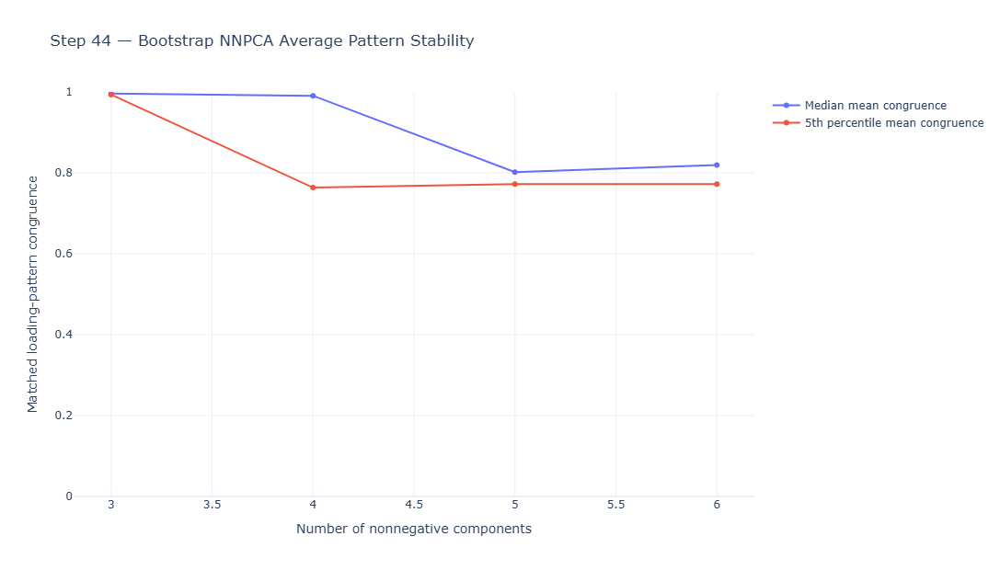

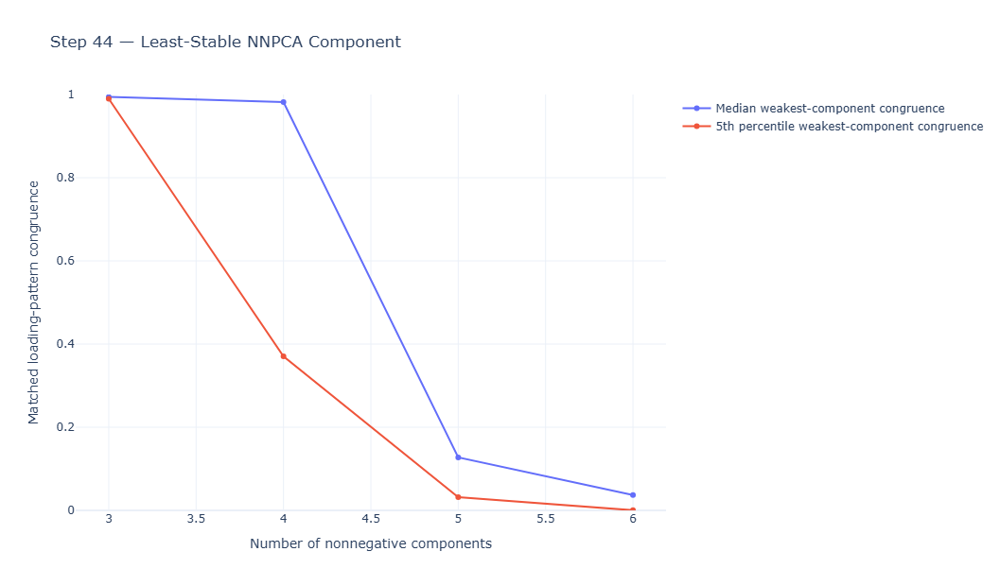

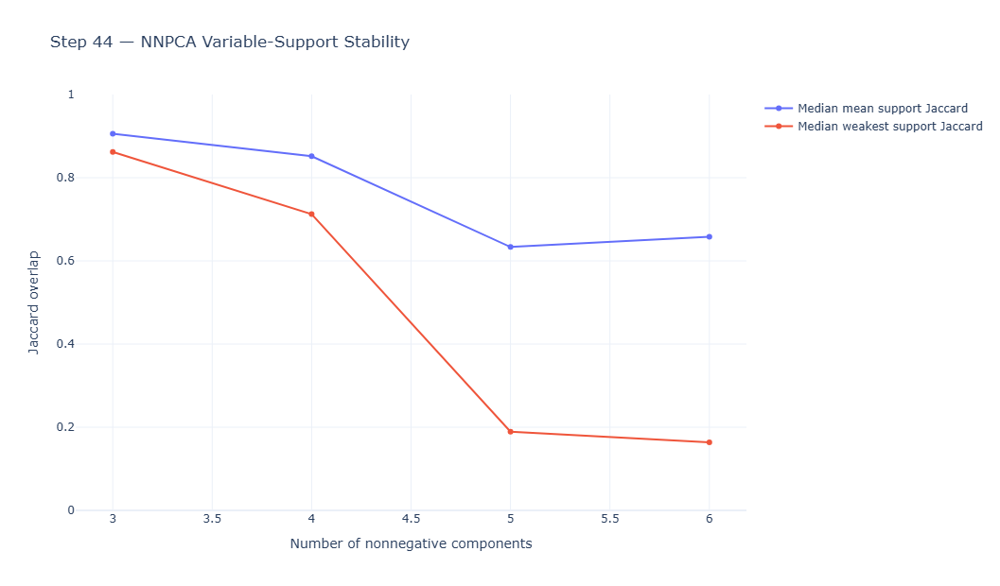

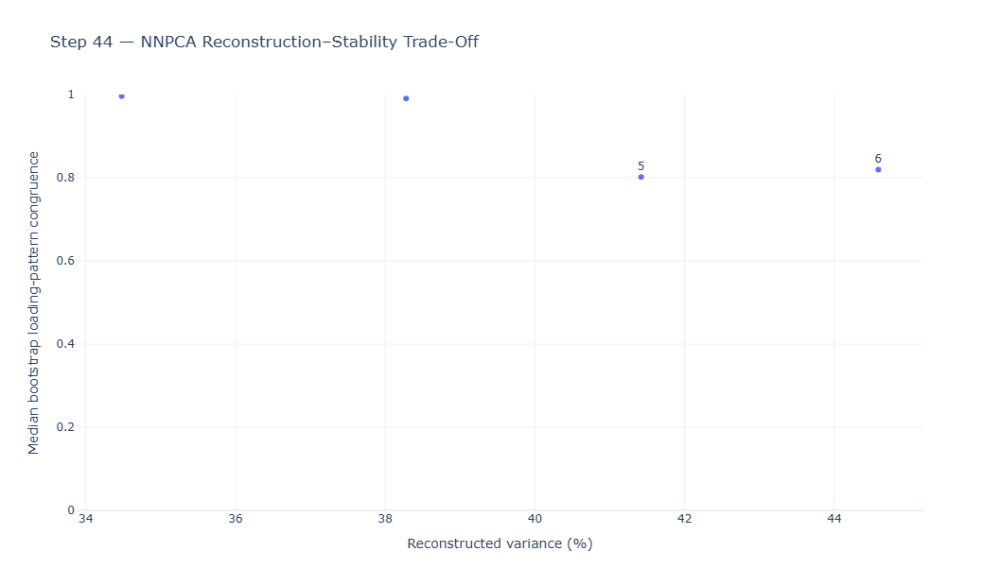


STEP 44 — BOOTSTRAP NNPCA INTERPRETATION

Strongest tested average component-pattern reproducibility:
  k = 3

Interpret jointly:
  Step 43 reconstruction / marginal gain
  Step 43 component overlap
  Step 44 bootstrap loading-pattern reproducibility
  Step 44 weakest-component reproducibility
  Step 44 optimization convergence

No automatic dimensionality cutoff has been imposed.

STEP 44 COMPLETE — BOOTSTRAP NNPCA COMPONENT STABILITY

Candidate dimensionalities:
  3, 4, 5, 6

Bootstrap replications:
  30 per dimensionality

Total intended bootstrap fits:
  120

Reference alpha selection:
  Objective reconstruction / overlap compromise

Bootstrap starts:
  1 independent start per sample

Runtime:
  135.5 seconds

Main output objects:
  step44_selected_reference_models
  step44_reference_models
  step44_bootstrap_iterations
  step44_bootstrap_components
  step44_dimension_stability
  step44_component_stability

Plot objects:
  fig_step44_average_stability
  fig_step44_worst_stability


In [60]:
# ==================================================================================================
# STEP 44 — BOOTSTRAP NNPCA COMPONENT-PATTERN STABILITY
# ==================================================================================================
#
# PURPOSE
# -------
#
# Validate the reproducibility of the low-dimensional Nonnegative PCA
# region identified independently in Step 43.
#
#
# STEP 43 ALREADY ESTABLISHED
# ---------------------------
#
#   - reconstruction across dimensionality,
#   - marginal reconstruction gain,
#   - alpha / component-overlap trade-off,
#   - convergence across independent initializations,
#   - nonnegative loading structure.
#
#
# STEP 44 THEREFORE DOES NOT REPEAT THE COMPLETE ALPHA SEARCH.
#
# Instead:
#
#   1. Select ONE representative Step-43 alpha for each candidate k.
#   2. Bootstrap that model.
#   3. Measure loading-pattern reproducibility.
#
#
# CANDIDATE DIMENSIONALITIES
# --------------------------
#
#       k = 3, 4, 5, 6
#
# k = 3-5:
#   Low-dimensional candidate region identified independently in Step 43.
#
# k = 6:
#   Boundary comparison beyond that region.
#
#
# ALPHA SELECTION
# ---------------
#
# No alpha is manually chosen.
#
# For each k:
#
#   1. Only Step-43 models with reliable optimization are considered:
#
#          successful_converged_starts >= 2
#
#   2. Among those models, reconstructed variance is maximized while
#      mean pairwise component overlap is minimized.
#
#   3. Both objectives are normalized within k.
#
#   4. The model closest to the ideal point:
#
#          maximum reconstruction
#          minimum overlap
#
#      is selected.
#
# This is an explicit multi-objective Pareto compromise.
#
# IMPORTANT:
#
#   This compromise rule is an analysis-selection rule.
#   It is NOT claimed to be a verbatim alpha-selection rule from
#   Zass & Shashua.
#
#   Zass & Shashua motivate the variance-versus-overlap trade-off,
#   but do not prescribe one universal numerical alpha.
#
#
# BOOTSTRAP
# ---------
#
# For each selected k/alpha model:
#
#   - observations are resampled with replacement;
#   - every bootstrap sample is independently standardized;
#   - NNPCA is refitted;
#   - bootstrap components are optimally matched to the reference
#     components using Hungarian one-to-one assignment;
#   - cosine similarity measures loading-pattern reproducibility.
#
#
# Because NNPCA coefficients are nonnegative:
#
#       there is NO sign ambiguity.
#
# Only component-order ambiguity must be resolved.
#
#
# PRIMARY EVIDENCE
# ----------------
#
#   median_mean_congruence
#   p05_mean_congruence
#
#   median_worst_component_congruence
#   p05_worst_component_congruence
#
# Secondary evidence:
#
#   active-variable support Jaccard similarity
#   bootstrap convergence rate
#
#
# COMPUTATIONAL DESIGN
# --------------------
#
#   4 dimensionalities
#   x 30 bootstrap samples
#   x 1 independent initialization
#
#       = 120 bootstrap NNPCA fits
#
# This is intended as the dimensional-stability screening step.
#
# After the final dimensionality is selected, a larger final bootstrap
# can be run in a subsequent step if desired.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import time
import warnings

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from scipy.optimize import linear_sum_assignment

from IPython.display import display


try:

    import plotly.graph_objects as go

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly"
    ) from error


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

RANDOM_STATE = 42


# --------------------------------------------------------------------------------------------------
# Candidate dimensional region from Step 43
# --------------------------------------------------------------------------------------------------

CANDIDATE_K = [
    3,
    4,
    5,
    6
]


# --------------------------------------------------------------------------------------------------
# Bootstrap screening
# --------------------------------------------------------------------------------------------------

N_BOOTSTRAPS = 30


# --------------------------------------------------------------------------------------------------
# Number of starts
# --------------------------------------------------------------------------------------------------

REFERENCE_N_STARTS = 3

BOOTSTRAP_N_STARTS = 1


# --------------------------------------------------------------------------------------------------
# Optimization
# --------------------------------------------------------------------------------------------------

MAX_SWEEPS_REFERENCE = 80

MAX_SWEEPS_BOOTSTRAP = 60

CONVERGENCE_TOLERANCE = 1e-6


# --------------------------------------------------------------------------------------------------
# Zass-Shashua formulation
# --------------------------------------------------------------------------------------------------

BETA = 0.0


# --------------------------------------------------------------------------------------------------
# Numerical active-loading threshold
# --------------------------------------------------------------------------------------------------

ZERO_TOLERANCE = 1e-10


# ==================================================================================================
# 3. VERIFY REQUIRED STEP 43 OBJECTS
# ==================================================================================================

required_objects = [
    "X_nnpca_raw",
    "nnpca_variables",
    "step43_converged_models"
]


missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 43 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 43 first."
    )


# ==================================================================================================
# 4. PREPARE DATA
# ==================================================================================================

X_step44_raw = np.asarray(
    X_nnpca_raw,
    dtype=float
)


STEP44_VARIABLES = list(
    nnpca_variables
)


N, P = X_step44_raw.shape


if P != len(
    STEP44_VARIABLES
):

    raise RuntimeError(
        "Variable-name count does not match the NNPCA matrix."
    )


if not np.isfinite(
    X_step44_raw
).all():

    raise RuntimeError(
        "NNPCA input contains non-finite values."
    )


# ==================================================================================================
# 5. PREPARE RELIABLY CONVERGED STEP 43 MODELS
# ==================================================================================================
#
# Primary Step-44 alpha selection uses models for which at least
# TWO of the three Step-43 independent starts formally converged.
#
# This prevents an alpha solution reproduced by only one initialization
# from becoming the bootstrap reference.
#
# ==================================================================================================

reliable_step43_models = (
    step43_converged_models[
        (
            step43_converged_models[
                "n_components"
            ]
            .isin(
                CANDIDATE_K
            )
        )
        &
        (
            step43_converged_models[
                "successful_converged_starts"
            ]
            >=
            2
        )
    ]
    .copy()
)


if reliable_step43_models.empty:

    raise RuntimeError(
        "No reliably converged Step-43 models were found "
        "for k = 3, 4, 5, 6."
    )


# ==================================================================================================
# 6. SELECT ONE REPRESENTATIVE ALPHA FOR EACH k
# ==================================================================================================
#
# Two objectives:
#
#   maximize reconstructed variance
#   minimize mean component overlap
#
#
# Within each k:
#
#   variance_loss =
#
#       (best variance - model variance)
#       --------------------------------
#       observed variance range
#
#
#   overlap_loss =
#
#       (model overlap - best overlap)
#       ------------------------------
#       observed overlap range
#
#
# Ideal solution:
#
#       variance_loss = 0
#       overlap_loss  = 0
#
#
# Euclidean distance from that ideal gives an objective compromise.
#
# ==================================================================================================

selection_rows = []


for k in CANDIDATE_K:


    k_models = (
        reliable_step43_models[
            reliable_step43_models[
                "n_components"
            ]
            ==
            k
        ]
        .copy()
    )


    if k_models.empty:

        print(
            f"WARNING: No reliably converged model for k={k}."
        )

        continue


    # ----------------------------------------------------------------------------------------------
    # Reconstruction range
    # ----------------------------------------------------------------------------------------------

    maximum_variance = float(
        k_models[
            "reconstructed_variance_percent"
        ]
        .max()
    )


    minimum_variance = float(
        k_models[
            "reconstructed_variance_percent"
        ]
        .min()
    )


    variance_range = (
        maximum_variance
        -
        minimum_variance
    )


    if variance_range <= 0:

        k_models[
            "normalized_variance_loss"
        ] = 0.0

    else:

        k_models[
            "normalized_variance_loss"
        ] = (
            maximum_variance
            -
            k_models[
                "reconstructed_variance_percent"
            ]
        ) / variance_range


    # ----------------------------------------------------------------------------------------------
    # Overlap range
    # ----------------------------------------------------------------------------------------------

    minimum_overlap = float(
        k_models[
            "mean_pairwise_cosine_overlap"
        ]
        .min()
    )


    maximum_overlap = float(
        k_models[
            "mean_pairwise_cosine_overlap"
        ]
        .max()
    )


    overlap_range = (
        maximum_overlap
        -
        minimum_overlap
    )


    if overlap_range <= 0:

        k_models[
            "normalized_overlap_loss"
        ] = 0.0

    else:

        k_models[
            "normalized_overlap_loss"
        ] = (
            k_models[
                "mean_pairwise_cosine_overlap"
            ]
            -
            minimum_overlap
        ) / overlap_range


    # ----------------------------------------------------------------------------------------------
    # Distance from ideal reconstruction / overlap point
    # ----------------------------------------------------------------------------------------------

    k_models[
        "ideal_distance"
    ] = np.sqrt(
        k_models[
            "normalized_variance_loss"
        ]
        ** 2
        +
        k_models[
            "normalized_overlap_loss"
        ]
        ** 2
    )


    # ----------------------------------------------------------------------------------------------
    # Select closest point
    #
    # Ties:
    #
    #   lower overlap
    #   then higher reconstructed variance
    # ----------------------------------------------------------------------------------------------

    selected = (
        k_models
        .sort_values(
            [
                "ideal_distance",
                "mean_pairwise_cosine_overlap",
                "reconstructed_variance_percent"
            ],
            ascending=[
                True,
                True,
                False
            ]
        )
        .iloc[
            0
        ]
    )


    selection_rows.append(
        {
            "n_components":
                int(
                    k
                ),

            "alpha_multiplier":
                float(
                    selected[
                        "alpha_multiplier"
                    ]
                ),

            "alpha":
                float(
                    selected[
                        "alpha"
                    ]
                ),

            "reconstructed_variance_percent":
                float(
                    selected[
                        "reconstructed_variance_percent"
                    ]
                ),

            "mean_pairwise_cosine_overlap":
                float(
                    selected[
                        "mean_pairwise_cosine_overlap"
                    ]
                ),

            "maximum_pairwise_cosine_overlap":
                float(
                    selected[
                        "maximum_pairwise_cosine_overlap"
                    ]
                ),

            "zero_percent":
                float(
                    selected[
                        "zero_percent"
                    ]
                ),

            "mean_active_variables":
                float(
                    selected[
                        "mean_active_variables"
                    ]
                ),

            "successful_converged_starts":
                int(
                    selected[
                        "successful_converged_starts"
                    ]
                ),

            "ideal_distance":
                float(
                    selected[
                        "ideal_distance"
                    ]
                )
        }
    )


step44_selected_reference_models = (
    pd.DataFrame(
        selection_rows
    )
    .sort_values(
        "n_components"
    )
    .reset_index(
        drop=True
    )
)


if step44_selected_reference_models.empty:

    raise RuntimeError(
        "No Step-44 reference models could be selected."
    )


# ==================================================================================================
# 7. PRINT SELECTED REFERENCE MODELS
# ==================================================================================================

print(
    "\n"
    + "=" * 170
)


print(
    "STEP 44 — SELECTED NNPCA REFERENCE MODELS"
)


print(
    "=" * 170
)


display(
    step44_selected_reference_models
    .round(
        6
    )
)


# ==================================================================================================
# 8. OBJECTIVE FUNCTION
# ==================================================================================================

def zass_shashua_objective(
    W,
    A,
    alpha,
    beta=0.0
):

    k = W.shape[0]


    variance_term = (
        0.5
        *
        float(
            np.trace(
                W
                @
                A
                @
                W.T
            )
        )
    )


    gram = (
        W
        @
        W.T
    )


    overlap_penalty = (
        alpha
        /
        4.0
        *
        float(
            np.sum(
                (
                    np.eye(
                        k
                    )
                    -
                    gram
                )
                ** 2
            )
        )
    )


    sparsity_penalty = (
        beta
        *
        float(
            np.sum(
                W
            )
        )
    )


    return (
        variance_term
        -
        overlap_penalty
        -
        sparsity_penalty
    )


# ==================================================================================================
# 9. COORDINATE OBJECTIVE
# ==================================================================================================

def coordinate_objective(
    u,
    alpha,
    c2,
    c1
):

    return (
        -
        alpha
        /
        4.0
        *
        u ** 4
        +
        c2
        /
        2.0
        *
        u ** 2
        +
        c1
        *
        u
    )


# ==================================================================================================
# 10. EXACT NONNEGATIVE COORDINATE UPDATE
# ==================================================================================================

def maximize_coordinate(
    alpha,
    c2,
    c1
):

    roots = np.roots(
        [
            -alpha,
            0.0,
            c2,
            c1
        ]
    )


    candidates = [
        0.0
    ]


    for root in roots:

        if abs(
            root.imag
        ) < 1e-9:

            value = float(
                root.real
            )


            if value >= 0:

                candidates.append(
                    value
                )


    objective_values = [
        coordinate_objective(
            candidate,
            alpha,
            c2,
            c1
        )
        for candidate in candidates
    ]


    return float(
        candidates[
            int(
                np.argmax(
                    objective_values
                )
            )
        ]
    )


# ==================================================================================================
# 11. ONE COORDINATE-DESCENT SWEEP
# ==================================================================================================

def coordinate_descent_sweep(
    W,
    A,
    alpha,
    beta
):

    k, p = W.shape


    for r in range(
        k
    ):


        for s in range(
            p
        ):


            first_term = (
                float(
                    np.dot(
                        A[
                            s,
                            :
                        ],
                        W[
                            r,
                            :
                        ]
                    )
                )
                -
                A[
                    s,
                    s
                ]
                *
                W[
                    r,
                    s
                ]
            )


            second_sum = 0.0


            for i in range(
                k
            ):

                if i == r:

                    continue


                dot_excluding_s = (
                    float(
                        np.dot(
                            W[
                                r,
                                :
                            ],
                            W[
                                i,
                                :
                            ]
                        )
                    )
                    -
                    W[
                        r,
                        s
                    ]
                    *
                    W[
                        i,
                        s
                    ]
                )


                second_sum += (
                    dot_excluding_s
                    *
                    W[
                        i,
                        s
                    ]
                )


            c1 = (
                first_term
                -
                alpha
                *
                second_sum
                -
                beta
            )


            row_norm_without_s = (
                float(
                    np.dot(
                        W[
                            r,
                            :
                        ],
                        W[
                            r,
                            :
                        ]
                    )
                )
                -
                W[
                    r,
                    s
                ]
                ** 2
            )


            column_norm_without_r = (
                float(
                    np.dot(
                        W[
                            :,
                            s
                        ],
                        W[
                            :,
                            s
                        ]
                    )
                )
                -
                W[
                    r,
                    s
                ]
                ** 2
            )


            c2 = (
                A[
                    s,
                    s
                ]
                +
                alpha
                -
                alpha
                *
                row_norm_without_s
                -
                alpha
                *
                column_norm_without_r
            )


            W[
                r,
                s
            ] = maximize_coordinate(
                alpha=
                    alpha,

                c2=
                    c2,

                c1=
                    c1
            )


    return W


# ==================================================================================================
# 12. INITIALIZATION
# ==================================================================================================

def initialize_nonnegative_components(
    k,
    p,
    rng
):

    W = rng.random(
        (
            k,
            p
        )
    )


    norms = np.linalg.norm(
        W,
        axis=1,
        keepdims=True
    )


    norms[
        norms == 0
    ] = 1.0


    return (
        W
        /
        norms
    )


# ==================================================================================================
# 13. FIT ONE NNPCA MODEL
# ==================================================================================================

def fit_step44_nnpca(
    X_standardized,
    k,
    alpha,
    n_starts,
    max_sweeps,
    tolerance,
    random_state
):

    X = (
        X_standardized
        .T
    )


    A = (
        X
        @
        X.T
    )


    p = A.shape[0]


    rng = np.random.default_rng(
        random_state
    )


    best_W = None

    best_objective = -np.inf

    best_converged = False

    best_sweeps = None


    for start_index in range(
        n_starts
    ):


        W = initialize_nonnegative_components(
            k=
                k,

            p=
                p,

            rng=
                rng
        )


        previous_objective = (
            zass_shashua_objective(
                W=
                    W,

                A=
                    A,

                alpha=
                    alpha,

                beta=
                    BETA
            )
        )


        current_objective = previous_objective

        converged = False


        for sweep in range(
            1,
            max_sweeps + 1
        ):


            W = coordinate_descent_sweep(
                W=
                    W,

                A=
                    A,

                alpha=
                    alpha,

                beta=
                    BETA
            )


            current_objective = (
                zass_shashua_objective(
                    W=
                        W,

                    A=
                        A,

                    alpha=
                        alpha,

                    beta=
                        BETA
                )
            )


            denominator = max(
                1.0,
                abs(
                    previous_objective
                )
            )


            relative_change = (
                abs(
                    current_objective
                    -
                    previous_objective
                )
                /
                denominator
            )


            if relative_change < tolerance:

                converged = True

                break


            previous_objective = current_objective


        # ------------------------------------------------------------------------------------------
        # Prefer a converged model.
        #
        # If convergence status is equal, prefer the higher objective.
        # ------------------------------------------------------------------------------------------

        use_model = False


        if best_W is None:

            use_model = True


        elif (
            converged
            and
            not best_converged
        ):

            use_model = True


        elif (
            converged
            ==
            best_converged
            and
            current_objective
            >
            best_objective
        ):

            use_model = True


        if use_model:

            best_W = W.copy()

            best_objective = float(
                current_objective
            )

            best_converged = bool(
                converged
            )

            best_sweeps = int(
                sweep
            )


    return {

        "U":
            best_W.T,

        "objective":
            best_objective,

        "converged":
            best_converged,

        "sweeps":
            best_sweeps
    }


# ==================================================================================================
# 14. COSINE SIMILARITY MATRIX
# ==================================================================================================

def cosine_similarity_matrix(
    U_reference,
    U_bootstrap
):

    reference_norms = np.linalg.norm(
        U_reference,
        axis=0
    )


    bootstrap_norms = np.linalg.norm(
        U_bootstrap,
        axis=0
    )


    denominator = (
        reference_norms[
            :,
            None
        ]
        *
        bootstrap_norms[
            None,
            :
        ]
    )


    denominator[
        denominator
        ==
        0
    ] = np.nan


    similarity = (
        U_reference.T
        @
        U_bootstrap
    ) / denominator


    return np.nan_to_num(
        similarity,
        nan=0.0
    )


# ==================================================================================================
# 15. HUNGARIAN COMPONENT MATCHING
# ==================================================================================================

def match_components(
    U_reference,
    U_bootstrap
):

    similarity = cosine_similarity_matrix(
        U_reference,
        U_bootstrap
    )


    reference_indices, bootstrap_indices = (
        linear_sum_assignment(
            -
            similarity
        )
    )


    matched_bootstrap = np.zeros_like(
        U_reference
    )


    matched_similarity = np.zeros(
        U_reference.shape[1],
        dtype=float
    )


    for reference_index, bootstrap_index in zip(
        reference_indices,
        bootstrap_indices
    ):


        matched_bootstrap[
            :,
            reference_index
        ] = U_bootstrap[
            :,
            bootstrap_index
        ]


        matched_similarity[
            reference_index
        ] = similarity[
            reference_index,
            bootstrap_index
        ]


    return (
        matched_bootstrap,
        matched_similarity
    )


# ==================================================================================================
# 16. SUPPORT JACCARD
# ==================================================================================================

def support_jaccard(
    U_reference,
    U_bootstrap
):

    reference_support = (
        U_reference
        >
        ZERO_TOLERANCE
    )


    bootstrap_support = (
        U_bootstrap
        >
        ZERO_TOLERANCE
    )


    k = U_reference.shape[1]


    values = np.zeros(
        k,
        dtype=float
    )


    for component_index in range(
        k
    ):


        reference_component = (
            reference_support[
                :,
                component_index
            ]
        )


        bootstrap_component = (
            bootstrap_support[
                :,
                component_index
            ]
        )


        intersection = np.logical_and(
            reference_component,
            bootstrap_component
        ).sum()


        union = np.logical_or(
            reference_component,
            bootstrap_component
        ).sum()


        if union == 0:

            values[
                component_index
            ] = 1.0

        else:

            values[
                component_index
            ] = (
                intersection
                /
                union
            )


    return values


# ==================================================================================================
# 17. STANDARDIZE COMPLETE DATA FOR REFERENCE FITS
# ==================================================================================================

reference_scaler = StandardScaler()


X_reference_standardized = (
    reference_scaler
    .fit_transform(
        X_step44_raw
    )
)


# ==================================================================================================
# 18. FIT REFERENCE MODELS
# ==================================================================================================

step44_reference_models = {}


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 44 — FITTING REFERENCE NNPCA MODELS"
)


print(
    "=" * 150
)


for row in step44_selected_reference_models.itertuples(
    index=False
):


    k = int(
        row.n_components
    )


    alpha = float(
        row.alpha
    )


    alpha_multiplier = float(
        row.alpha_multiplier
    )


    print(
        f"\nk={k}"
        f" | alpha×={alpha_multiplier:g}"
    )


    reference_result = fit_step44_nnpca(
        X_standardized=
            X_reference_standardized,

        k=
            k,

        alpha=
            alpha,

        n_starts=
            REFERENCE_N_STARTS,

        max_sweeps=
            MAX_SWEEPS_REFERENCE,

        tolerance=
            CONVERGENCE_TOLERANCE,

        random_state=
            RANDOM_STATE
            +
            1000
            *
            k
    )


    step44_reference_models[
        k
    ] = {

        **reference_result,

        "alpha":
            alpha,

        "alpha_multiplier":
            alpha_multiplier
    }


    print(
        f"  converged = "
        f"{reference_result['converged']}"
    )


# ==================================================================================================
# 19. RUN BOOTSTRAP
# ==================================================================================================

bootstrap_rows = []

component_rows = []


master_rng = np.random.default_rng(
    RANDOM_STATE
)


total_fits = (
    len(
        step44_reference_models
    )
    *
    N_BOOTSTRAPS
)


fit_counter = 0


bootstrap_start_time = time.time()


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 44 — BOOTSTRAP NNPCA STABILITY"
)


print(
    "=" * 150
)


print(
    f"\nBootstrap model fits: {total_fits:,}\n"
)


for row in step44_selected_reference_models.itertuples(
    index=False
):


    k = int(
        row.n_components
    )


    alpha = float(
        row.alpha
    )


    alpha_multiplier = float(
        row.alpha_multiplier
    )


    U_reference = (
        step44_reference_models[
            k
        ][
            "U"
        ]
    )


    for bootstrap_number in range(
        1,
        N_BOOTSTRAPS + 1
    ):


        fit_counter += 1


        print(
            f"\rBootstrap "
            f"{fit_counter:,}/"
            f"{total_fits:,}"
            f" | k={k}"
            f" | b={bootstrap_number}",
            end=""
        )


        # ------------------------------------------------------------------------------------------
        # Resample observations
        # ------------------------------------------------------------------------------------------

        sample_indices = master_rng.integers(
            0,
            N,
            size=N
        )


        X_bootstrap_raw = (
            X_step44_raw[
                sample_indices,
                :
            ]
        )


        # ------------------------------------------------------------------------------------------
        # Standardize bootstrap sample independently
        # ------------------------------------------------------------------------------------------

        bootstrap_scaler = StandardScaler()


        X_bootstrap_standardized = (
            bootstrap_scaler
            .fit_transform(
                X_bootstrap_raw
            )
        )


        # ------------------------------------------------------------------------------------------
        # Fit model
        # ------------------------------------------------------------------------------------------

        bootstrap_result = fit_step44_nnpca(
            X_standardized=
                X_bootstrap_standardized,

            k=
                k,

            alpha=
                alpha,

            n_starts=
                BOOTSTRAP_N_STARTS,

            max_sweeps=
                MAX_SWEEPS_BOOTSTRAP,

            tolerance=
                CONVERGENCE_TOLERANCE,

            random_state=
                RANDOM_STATE
                +
                100000
                *
                k
                +
                bootstrap_number
        )


        # ------------------------------------------------------------------------------------------
        # Only converged bootstrap solutions enter stability evidence
        # ------------------------------------------------------------------------------------------

        if not bootstrap_result[
            "converged"
        ]:

            bootstrap_rows.append(
                {

                    "n_components":
                        k,

                    "alpha_multiplier":
                        alpha_multiplier,

                    "bootstrap":
                        bootstrap_number,

                    "converged":
                        False,

                    "mean_congruence":
                        np.nan,

                    "worst_component_congruence":
                        np.nan,

                    "mean_support_jaccard":
                        np.nan,

                    "worst_support_jaccard":
                        np.nan
                }
            )


            continue


        U_bootstrap = (
            bootstrap_result[
                "U"
            ]
        )


        # ------------------------------------------------------------------------------------------
        # Optimal component matching
        # ------------------------------------------------------------------------------------------

        (
            U_matched,
            congruence
        ) = match_components(
            U_reference,
            U_bootstrap
        )


        support = support_jaccard(
            U_reference,
            U_matched
        )


        # ------------------------------------------------------------------------------------------
        # Iteration summary
        # ------------------------------------------------------------------------------------------

        bootstrap_rows.append(
            {

                "n_components":
                    k,

                "alpha_multiplier":
                    alpha_multiplier,

                "bootstrap":
                    bootstrap_number,

                "converged":
                    True,

                "mean_congruence":
                    float(
                        np.mean(
                            congruence
                        )
                    ),

                "worst_component_congruence":
                    float(
                        np.min(
                            congruence
                        )
                    ),

                "mean_support_jaccard":
                    float(
                        np.mean(
                            support
                        )
                    ),

                "worst_support_jaccard":
                    float(
                        np.min(
                            support
                        )
                    )
            }
        )


        # ------------------------------------------------------------------------------------------
        # Component-level results
        # ------------------------------------------------------------------------------------------

        for component_index in range(
            k
        ):


            component_rows.append(
                {

                    "n_components":
                        k,

                    "bootstrap":
                        bootstrap_number,

                    "component":
                        f"NNPC{component_index + 1}",

                    "congruence":
                        float(
                            congruence[
                                component_index
                            ]
                        ),

                    "support_jaccard":
                        float(
                            support[
                                component_index
                            ]
                        )
                }
            )


print()


# ==================================================================================================
# 20. RAW RESULT TABLES
# ==================================================================================================

step44_bootstrap_iterations = pd.DataFrame(
    bootstrap_rows
)


step44_bootstrap_components = pd.DataFrame(
    component_rows
)


# ==================================================================================================
# 21. DIMENSION-LEVEL STABILITY SUMMARY
# ==================================================================================================

summary_rows = []


for k in sorted(
    step44_bootstrap_iterations[
        "n_components"
    ]
    .unique()
):


    all_k = (
        step44_bootstrap_iterations[
            step44_bootstrap_iterations[
                "n_components"
            ]
            ==
            k
        ]
    )


    converged_k = (
        all_k[
            all_k[
                "converged"
            ]
        ]
    )


    reference_row = (
        step44_selected_reference_models[
            step44_selected_reference_models[
                "n_components"
            ]
            ==
            k
        ]
        .iloc[
            0
        ]
    )


    if converged_k.empty:


        summary_rows.append(
            {

                "n_components":
                    k,

                "alpha_multiplier":
                    reference_row[
                        "alpha_multiplier"
                    ],

                "reconstructed_variance_percent":
                    reference_row[
                        "reconstructed_variance_percent"
                    ],

                "mean_pairwise_overlap":
                    reference_row[
                        "mean_pairwise_cosine_overlap"
                    ],

                "successful_bootstraps":
                    0,

                "failed_bootstraps":
                    len(
                        all_k
                    ),

                "bootstrap_convergence_rate":
                    0.0,

                "median_mean_congruence":
                    np.nan,

                "p05_mean_congruence":
                    np.nan,

                "median_worst_component_congruence":
                    np.nan,

                "p05_worst_component_congruence":
                    np.nan,

                "median_mean_support_jaccard":
                    np.nan,

                "median_worst_support_jaccard":
                    np.nan
            }
        )


        continue


    summary_rows.append(
        {

            "n_components":
                int(
                    k
                ),

            "alpha_multiplier":
                float(
                    reference_row[
                        "alpha_multiplier"
                    ]
                ),

            "reconstructed_variance_percent":
                float(
                    reference_row[
                        "reconstructed_variance_percent"
                    ]
                ),

            "mean_pairwise_overlap":
                float(
                    reference_row[
                        "mean_pairwise_cosine_overlap"
                    ]
                ),

            "successful_bootstraps":
                int(
                    len(
                        converged_k
                    )
                ),

            "failed_bootstraps":
                int(
                    len(
                        all_k
                    )
                    -
                    len(
                        converged_k
                    )
                ),

            "bootstrap_convergence_rate":
                float(
                    len(
                        converged_k
                    )
                    /
                    len(
                        all_k
                    )
                ),

            "median_mean_congruence":
                float(
                    converged_k[
                        "mean_congruence"
                    ]
                    .median()
                ),

            "p05_mean_congruence":
                float(
                    converged_k[
                        "mean_congruence"
                    ]
                    .quantile(
                        0.05
                    )
                ),

            "median_worst_component_congruence":
                float(
                    converged_k[
                        "worst_component_congruence"
                    ]
                    .median()
                ),

            "p05_worst_component_congruence":
                float(
                    converged_k[
                        "worst_component_congruence"
                    ]
                    .quantile(
                        0.05
                    )
                ),

            "median_mean_support_jaccard":
                float(
                    converged_k[
                        "mean_support_jaccard"
                    ]
                    .median()
                ),

            "median_worst_support_jaccard":
                float(
                    converged_k[
                        "worst_support_jaccard"
                    ]
                    .median()
                )
        }
    )


step44_dimension_stability = (
    pd.DataFrame(
        summary_rows
    )
    .sort_values(
        "n_components"
    )
    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 22. COMPONENT-LEVEL SUMMARY
# ==================================================================================================

component_summary_rows = []


if not step44_bootstrap_components.empty:


    for (
        k,
        component
    ), group in step44_bootstrap_components.groupby(
        [
            "n_components",
            "component"
        ]
    ):


        component_summary_rows.append(
            {

                "n_components":
                    int(
                        k
                    ),

                "component":
                    component,

                "median_congruence":
                    float(
                        group[
                            "congruence"
                        ]
                        .median()
                    ),

                "p05_congruence":
                    float(
                        group[
                            "congruence"
                        ]
                        .quantile(
                            0.05
                        )
                    ),

                "median_support_jaccard":
                    float(
                        group[
                            "support_jaccard"
                        ]
                        .median()
                    ),

                "p05_support_jaccard":
                    float(
                        group[
                            "support_jaccard"
                        ]
                        .quantile(
                            0.05
                        )
                    )
            }
        )


step44_component_stability = pd.DataFrame(
    component_summary_rows
)


# ==================================================================================================
# 23. DISPLAY DIMENSIONALITY SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 180
)


print(
    "STEP 44 — BOOTSTRAP NNPCA DIMENSIONALITY STABILITY"
)


print(
    "=" * 180
)


display(
    step44_dimension_stability
    .round(
        4
    )
)


# ==================================================================================================
# 24. DISPLAY COMPONENT SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 160
)


print(
    "STEP 44 — BOOTSTRAP NNPCA COMPONENT STABILITY"
)


print(
    "=" * 160
)


display(
    step44_component_stability
    .round(
        4
    )
)


# ==================================================================================================
# 25. PLOT — AVERAGE LOADING-PATTERN STABILITY
# ==================================================================================================

fig_step44_average_stability = go.Figure()


fig_step44_average_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "median_mean_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "Median mean congruence"
    )
)


fig_step44_average_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "p05_mean_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "5th percentile mean congruence"
    )
)


fig_step44_average_stability.update_layout(
    title=
        "Step 44 — Bootstrap NNPCA Average Pattern Stability",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Matched loading-pattern congruence",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_step44_average_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_step44_average_stability.show()


# ==================================================================================================
# 26. PLOT — WEAKEST COMPONENT STABILITY
# ==================================================================================================

fig_step44_worst_stability = go.Figure()


fig_step44_worst_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "median_worst_component_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "Median weakest-component congruence"
    )
)


fig_step44_worst_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "p05_worst_component_congruence"
            ],

        mode=
            "lines+markers",

        name=
            "5th percentile weakest-component congruence"
    )
)


fig_step44_worst_stability.update_layout(
    title=
        "Step 44 — Least-Stable NNPCA Component",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Matched loading-pattern congruence",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_step44_worst_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_step44_worst_stability.show()


# ==================================================================================================
# 27. PLOT — VARIABLE-SUPPORT STABILITY
# ==================================================================================================

fig_step44_support_stability = go.Figure()


fig_step44_support_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "median_mean_support_jaccard"
            ],

        mode=
            "lines+markers",

        name=
            "Median mean support Jaccard"
    )
)


fig_step44_support_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "n_components"
            ],

        y=
            step44_dimension_stability[
                "median_worst_support_jaccard"
            ],

        mode=
            "lines+markers",

        name=
            "Median weakest support Jaccard"
    )
)


fig_step44_support_stability.update_layout(
    title=
        "Step 44 — NNPCA Variable-Support Stability",

    xaxis_title=
        "Number of nonnegative components",

    yaxis_title=
        "Jaccard overlap",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_step44_support_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_step44_support_stability.show()


# ==================================================================================================
# 28. PLOT — RECONSTRUCTION / STABILITY TRADE-OFF
# ==================================================================================================

fig_step44_reconstruction_stability = go.Figure()


fig_step44_reconstruction_stability.add_trace(
    go.Scatter(
        x=
            step44_dimension_stability[
                "reconstructed_variance_percent"
            ],

        y=
            step44_dimension_stability[
                "median_mean_congruence"
            ],

        mode=
            "markers+text",

        text=
            step44_dimension_stability[
                "n_components"
            ],

        textposition=
            "top center",

        customdata=
            step44_dimension_stability[
                [
                    "n_components",
                    "alpha_multiplier",
                    "mean_pairwise_overlap"
                ]
            ]
            .to_numpy(),

        hovertemplate=
            (
                "<b>k=%{customdata[0]}</b><br>"
                "Reconstructed variance: %{x:.2f}%<br>"
                "Median mean congruence: %{y:.4f}<br>"
                "alpha×: %{customdata[1]:g}<br>"
                "Mean overlap: %{customdata[2]:.4f}"
                "<extra></extra>"
            )
    )
)


fig_step44_reconstruction_stability.update_layout(
    title=
        "Step 44 — NNPCA Reconstruction–Stability Trade-Off",

    xaxis_title=
        "Reconstructed variance (%)",

    yaxis_title=
        "Median bootstrap loading-pattern congruence",

    template=
        "plotly_white",

    width=
        1050,

    height=
        620
)


fig_step44_reconstruction_stability.update_yaxes(
    range=[
        0,
        1
    ]
)


fig_step44_reconstruction_stability.show()


# ==================================================================================================
# 29. IDENTIFY STRONGEST TESTED DIMENSION
# ==================================================================================================

valid_stability = (
    step44_dimension_stability
    .dropna(
        subset=[
            "median_mean_congruence"
        ]
    )
)


if not valid_stability.empty:


    strongest_index = (
        valid_stability[
            "median_mean_congruence"
        ]
        .idxmax()
    )


    strongest_row = (
        valid_stability.loc[
            strongest_index
        ]
    )


    strongest_k = int(
        strongest_row[
            "n_components"
        ]
    )


else:

    strongest_k = None


# ==================================================================================================
# 30. INTERPRETATION
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STEP 44 — BOOTSTRAP NNPCA INTERPRETATION"
)


print(
    "=" * 150
)


if strongest_k is not None:

    print(
        "\nStrongest tested average component-pattern reproducibility:"
    )


    print(
        f"  k = {strongest_k}"
    )


print(
    "\nInterpret jointly:"
)


print(
    "  Step 43 reconstruction / marginal gain"
)


print(
    "  Step 43 component overlap"
)


print(
    "  Step 44 bootstrap loading-pattern reproducibility"
)


print(
    "  Step 44 weakest-component reproducibility"
)


print(
    "  Step 44 optimization convergence"
)


print(
    "\nNo automatic dimensionality cutoff has been imposed."
)


# ==================================================================================================
# 31. FINAL SUMMARY
# ==================================================================================================

runtime = (
    time.time()
    -
    bootstrap_start_time
)


print(
    "\n"
    + "=" * 150
)


print(
    "STEP 44 COMPLETE — BOOTSTRAP NNPCA COMPONENT STABILITY"
)


print(
    "=" * 150
)


print(
    "\nCandidate dimensionalities:"
)


print(
    "  "
    +
    ", ".join(
        str(k)
        for k in CANDIDATE_K
    )
)


print(
    "\nBootstrap replications:"
)


print(
    f"  {N_BOOTSTRAPS} per dimensionality"
)


print(
    "\nTotal intended bootstrap fits:"
)


print(
    f"  {total_fits}"
)


print(
    "\nReference alpha selection:"
)


print(
    "  Objective reconstruction / overlap compromise"
)


print(
    "\nBootstrap starts:"
)


print(
    f"  {BOOTSTRAP_N_STARTS} independent start per sample"
)


print(
    "\nRuntime:"
)


print(
    f"  {runtime:.1f} seconds"
)


print(
    "\nMain output objects:"
)


print(
    "  step44_selected_reference_models"
)


print(
    "  step44_reference_models"
)


print(
    "  step44_bootstrap_iterations"
)


print(
    "  step44_bootstrap_components"
)


print(
    "  step44_dimension_stability"
)


print(
    "  step44_component_stability"
)


print(
    "\nPlot objects:"
)


print(
    "  fig_step44_average_stability"
)


print(
    "  fig_step44_worst_stability"
)


print(
    "  fig_step44_support_stability"
)


print(
    "  fig_step44_reconstruction_stability"
)


print(
    "\nIMPORTANT:"
)


print(
    "  Step 44 does NOT repeat the full alpha path."
)


print(
    "  Step 43 handles alpha / reconstruction / overlap."
)


print(
    "  Step 44 tests whether representative NNPCA solutions "
    "reproduce under resampling."
)


print(
    "\n"
    + "=" * 150
)

In [ ]:
# ==================================================================================================
# STEP 44 — NNPCA BOOTSTRAP STABILITY CONCLUSION
# ==================================================================================================
#
# Bootstrap validation strongly supports a 4-component NNPCA solution.
#
# The 3- and 4-component solutions showed exceptionally strong
# loading-pattern reproducibility and variable-support stability.
#
# At k = 4:
#
#   Median mean component congruence       = 0.9905
#   Median weakest-component congruence    = 0.9817
#   Median mean variable-support Jaccard   = 0.8515
#   Bootstrap convergence rate             = 93.3%
#
# Importantly, the fourth component remained highly reproducible.
#
# Increasing dimensionality from 4 to 5 improved reconstructed
# variance from approximately 38.3% to 41.4%, but the additional
# fifth component was not reproducible:
#
#   Median congruence of NNPC5 = 0.1273
#
# Its defining-variable support was also unstable:
#
#   Median support Jaccard of NNPC5 = 0.1892
#
# A similar instability appeared in the 6-component solution.
#
# Therefore the additional reconstruction obtained beyond four
# components appears to come from dimensions that are not reliably
# identified across bootstrap samples.
#
# Step 44 therefore supports:
#
#       FINAL NNPCA DIMENSIONALITY = 4 COMPONENTS
#
# This conclusion was obtained independently of the Classical PCA
# and Sparse PCA dimensionality decisions.
#
# ==================================================================================================

### 45. Print NNCPA Solution

In [62]:
# ==================================================================================================
# STEP 45 — PRINT AND INSPECT THE FINAL 4-COMPONENT NNPCA SOLUTION
# ==================================================================================================
#
# PURPOSE
# -------
#
# Inspect the actual loading structure of the final 4-component
# Nonnegative PCA solution supported by Step 44.
#
#
# FINAL NNPCA DIMENSIONALITY
# --------------------------
#
# Step 44 supported:
#
#       k = 4
#
# because:
#
#       - average bootstrap congruence remained extremely high;
#       - the weakest fourth component remained highly reproducible;
#       - the fifth component became unstable;
#       - variable-support stability also deteriorated sharply at k = 5.
#
#
# REFERENCE MODEL
# ---------------
#
# Step 45 uses the EXACT k=4 reference model already fitted in Step 44:
#
#       step44_reference_models[4]
#
# Therefore:
#
#       - no NNPCA model is refitted;
#       - no new alpha is selected;
#       - no dimensionality decision is changed.
#
#
# NONNEGATIVITY
# -------------
#
# Every retained loading should satisfy:
#
#       loading >= 0
#
# Therefore:
#
#       high NNPC score = greater expression of that component
#       low NNPC score  = lower expression of that component
#
# The component is NOT defined through a positive-versus-negative
# loading contrast as in ordinary PCA.
#
#
# OUTPUT
# ------
#
# For NNPC1-NNPC4 the script prints:
#
#       - every nonzero loading;
#       - loading magnitude;
#       - active-variable count;
#       - zero-variable count;
#       - sparsity;
#       - strongest 10 defining variables.
#
# It also creates convenient individual component objects:
#
#       NNPC1
#       NNPC2
#       NNPC3
#       NNPC4
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import numpy as np
import pandas as pd

from IPython.display import display


# ==================================================================================================
# 2. VERIFY REQUIRED STEP 44 OBJECTS
# ==================================================================================================

required_objects = [
    "step44_reference_models",
    "step44_selected_reference_models",
    "nnpca_variables"
]


missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 44 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 44 first."
    )


# ==================================================================================================
# 3. DEFINE FINAL NNPCA SOLUTION
# ==================================================================================================

FINAL_NNPCA_K = 4


if FINAL_NNPCA_K not in step44_reference_models:

    raise RuntimeError(
        "The final k=4 NNPCA reference model was not found in "
        "`step44_reference_models`."
    )


# ==================================================================================================
# 4. EXTRACT EXACT STEP 44 REFERENCE MODEL
# ==================================================================================================

final_nnpca_reference = (
    step44_reference_models[
        FINAL_NNPCA_K
    ]
)


U_final_nnpca = np.asarray(
    final_nnpca_reference[
        "U"
    ],
    dtype=float
)


# ==================================================================================================
# 5. VALIDATE MATRIX DIMENSIONS
# ==================================================================================================

variable_names = list(
    nnpca_variables
)


if U_final_nnpca.shape[0] != len(
    variable_names
):

    raise RuntimeError(
        "NNPCA loading matrix rows do not match the number of variables."
    )


if U_final_nnpca.shape[1] != FINAL_NNPCA_K:

    raise RuntimeError(
        f"Expected {FINAL_NNPCA_K} components but loading matrix "
        f"contains {U_final_nnpca.shape[1]}."
    )


# ==================================================================================================
# 6. EXTRACT MODEL-SELECTION INFORMATION
# ==================================================================================================

selection_row = (
    step44_selected_reference_models[
        step44_selected_reference_models[
            "n_components"
        ]
        ==
        FINAL_NNPCA_K
    ]
)


if selection_row.empty:

    raise RuntimeError(
        "Step 44 selection information for k=4 was not found."
    )


selection_row = selection_row.iloc[0]


selected_alpha_multiplier = float(
    selection_row[
        "alpha_multiplier"
    ]
)


selected_alpha = float(
    selection_row[
        "alpha"
    ]
)


reconstructed_variance_percent = float(
    selection_row[
        "reconstructed_variance_percent"
    ]
)


mean_pairwise_overlap = float(
    selection_row[
        "mean_pairwise_cosine_overlap"
    ]
)


overall_zero_percent = float(
    selection_row[
        "zero_percent"
    ]
)


overall_mean_active_variables = float(
    selection_row[
        "mean_active_variables"
    ]
)


# ==================================================================================================
# 7. SETTINGS
# ==================================================================================================

ZERO_TOLERANCE = 1e-10

TOP_N = 10


# ==================================================================================================
# 8. NONNEGATIVITY CHECK
# ==================================================================================================

minimum_loading = float(
    np.min(
        U_final_nnpca
    )
)


if minimum_loading < -1e-12:

    raise RuntimeError(
        "Negative loading detected in the final NNPCA solution."
    )


# ==================================================================================================
# 9. CREATE LOADING DATAFRAME
# ==================================================================================================

component_names = [
    "NNPC1",
    "NNPC2",
    "NNPC3",
    "NNPC4"
]


nnpca4_loadings = pd.DataFrame(
    U_final_nnpca,
    index=
        variable_names,
    columns=
        component_names
)


# ==================================================================================================
# 10. PRINT MODEL HEADER
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "STEP 45 — FINAL 4-COMPONENT NONNEGATIVE PCA SOLUTION"
)


print(
    "=" * 140
)


print(
    "\nComponents:"
)


print(
    f"  {FINAL_NNPCA_K}"
)


print(
    "\nSelected Step 44 alpha multiplier:"
)


print(
    f"  {selected_alpha_multiplier:g}"
)


print(
    "\nSelected alpha:"
)


print(
    f"  {selected_alpha:.6f}"
)


print(
    "\nReconstructed variance:"
)


print(
    f"  {reconstructed_variance_percent:.2f}%"
)


print(
    "\nMean pairwise component overlap:"
)


print(
    f"  {mean_pairwise_overlap:.4f}"
)


print(
    "\nOverall zero coefficients:"
)


print(
    f"  {overall_zero_percent:.2f}%"
)


print(
    "\nMean active variables per component:"
)


print(
    f"  {overall_mean_active_variables:.2f}"
)


print(
    "\nMinimum loading:"
)


print(
    f"  {minimum_loading:.12f}"
)


print(
    "\nNonnegativity:"
)


print(
    "  PASS"
)


# ==================================================================================================
# 11. BUILD COMPONENT TABLES
# ==================================================================================================

nnpca4_component_tables = {}


for component in component_names:


    loadings = (
        nnpca4_loadings[
            component
        ]
    )


    component_table = pd.DataFrame(
        {
            "variable":
                loadings.index,

            "loading":
                loadings.values
        }
    )


    component_table[
        "absolute_loading"
    ] = (
        component_table[
            "loading"
        ]
        .abs()
    )


    # ----------------------------------------------------------------------------------------------
    # Keep only active variables
    # ----------------------------------------------------------------------------------------------

    component_table = (
        component_table[
            component_table[
                "loading"
            ]
            >
            ZERO_TOLERANCE
        ]
        .copy()
    )


    # ----------------------------------------------------------------------------------------------
    # Strongest loadings first
    # ----------------------------------------------------------------------------------------------

    component_table = (
        component_table
        .sort_values(
            "loading",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


    nnpca4_component_tables[
        component
    ] = component_table


# ==================================================================================================
# 12. PRINT COMPLETE NNPC1-NNPC4 STRUCTURE
# ==================================================================================================

for component in component_names:


    table = (
        nnpca4_component_tables[
            component
        ]
    )


    total_variables = len(
        variable_names
    )


    active_variables = len(
        table
    )


    zero_variables = (
        total_variables
        -
        active_variables
    )


    zero_percent = (
        zero_variables
        /
        total_variables
        *
        100
    )


    print(
        "\n"
        + "=" * 140
    )


    print(
        f"{component} — COMPLETE NONZERO LOADING STRUCTURE"
    )


    print(
        "=" * 140
    )


    print(
        f"\nActive variables: "
        f"{active_variables} / {total_variables}"
    )


    print(
        f"Zero variables: "
        f"{zero_variables}"
    )


    print(
        f"Sparsity: "
        f"{zero_percent:.2f}%"
    )


    if not table.empty:

        print(
            f"Maximum loading: "
            f"{table['loading'].max():.4f}"
        )


    print()


    display(
        table.round(
            4
        )
    )


# ==================================================================================================
# 13. CREATE TOP-10 DEFINING VARIABLES TABLE
# ==================================================================================================

top_rows = []


for component in component_names:


    table = (
        nnpca4_component_tables[
            component
        ]
        .head(
            TOP_N
        )
        .copy()
    )


    for rank, row in enumerate(
        table.itertuples(
            index=False
        ),
        start=1
    ):


        top_rows.append(
            {
                "component":
                    component,

                "rank":
                    rank,

                "variable":
                    row.variable,

                "loading":
                    row.loading
            }
        )


nnpca4_top10 = pd.DataFrame(
    top_rows
)


print(
    "\n"
    + "=" * 140
)


print(
    "NNPC1-NNPC4 — TOP 10 DEFINING VARIABLES"
)


print(
    "=" * 140
)


display(
    nnpca4_top10
    .round(
        4
    )
)


# ==================================================================================================
# 14. COMPONENT SPARSITY / STRUCTURE SUMMARY
# ==================================================================================================

summary_rows = []


for component in component_names:


    table = (
        nnpca4_component_tables[
            component
        ]
    )


    total_variables = len(
        variable_names
    )


    active_variables = len(
        table
    )


    zero_variables = (
        total_variables
        -
        active_variables
    )


    if not table.empty:

        strongest_variable = (
            table.iloc[
                0
            ][
                "variable"
            ]
        )


        strongest_loading = float(
            table.iloc[
                0
            ][
                "loading"
            ]
        )


        top5_loading_sum = float(
            table[
                "loading"
            ]
            .head(
                5
            )
            .sum()
        )


    else:

        strongest_variable = np.nan

        strongest_loading = np.nan

        top5_loading_sum = np.nan


    summary_rows.append(
        {
            "component":
                component,

            "active_variables":
                active_variables,

            "zero_variables":
                zero_variables,

            "zero_percent":
                (
                    zero_variables
                    /
                    total_variables
                    *
                    100
                ),

            "strongest_variable":
                strongest_variable,

            "strongest_loading":
                strongest_loading,

            "top5_loading_sum":
                top5_loading_sum
        }
    )


nnpca4_component_summary = pd.DataFrame(
    summary_rows
)


print(
    "\n"
    + "=" * 140
)


print(
    "NNPC1-NNPC4 — COMPONENT STRUCTURE SUMMARY"
)


print(
    "=" * 140
)


display(
    nnpca4_component_summary
    .round(
        4
    )
)


# ==================================================================================================
# 15. CREATE WIDE TOP-10 COMPARISON TABLE
# ==================================================================================================

wide_rows = []


for rank in range(
    1,
    TOP_N + 1
):


    row = {
        "rank":
            rank
    }


    for component in component_names:


        table = (
            nnpca4_component_tables[
                component
            ]
        )


        if len(
            table
        ) >= rank:


            selected_row = (
                table.iloc[
                    rank - 1
                ]
            )


            row[
                f"{component}_variable"
            ] = selected_row[
                "variable"
            ]


            row[
                f"{component}_loading"
            ] = selected_row[
                "loading"
            ]


        else:

            row[
                f"{component}_variable"
            ] = np.nan


            row[
                f"{component}_loading"
            ] = np.nan


    wide_rows.append(
        row
    )


nnpca4_top10_wide = pd.DataFrame(
    wide_rows
)


print(
    "\n"
    + "=" * 160
)


print(
    "NNPC1-NNPC4 — SIDE-BY-SIDE TOP-10 COMPARISON"
)


print(
    "=" * 160
)


display(
    nnpca4_top10_wide
    .round(
        4
    )
)


# ==================================================================================================
# 16. COMPONENT OVERLAP MATRIX
# ==================================================================================================
#
# Because the Zass-Shashua semi-disjoint formulation relaxes strict
# orthogonality, variables may still contribute to more than one component.
#
# This matrix reports cosine similarity between final component vectors.
#
# ==================================================================================================

component_norms = np.linalg.norm(
    U_final_nnpca,
    axis=0
)


component_cosine_overlap = (
    U_final_nnpca.T
    @
    U_final_nnpca
) / (
    component_norms[
        :,
        None
    ]
    *
    component_norms[
        None,
        :
    ]
)


nnpca4_component_overlap = pd.DataFrame(
    component_cosine_overlap,
    index=
        component_names,
    columns=
        component_names
)


print(
    "\n"
    + "=" * 140
)


print(
    "NNPC1-NNPC4 — COMPONENT COSINE OVERLAP"
)


print(
    "=" * 140
)


display(
    nnpca4_component_overlap
    .round(
        4
    )
)


# ==================================================================================================
# 17. VARIABLE MEMBERSHIP SUMMARY
# ==================================================================================================
#
# Shows how many NNPCs each variable contributes to.
#
# ==================================================================================================

active_matrix = (
    nnpca4_loadings
    >
    ZERO_TOLERANCE
)


nnpca4_variable_membership = pd.DataFrame(
    {
        "variable":
            active_matrix.index,

        "components_active":
            active_matrix
            .sum(
                axis=1
            )
            .values
    }
)


nnpca4_variable_membership[
    "active_components"
] = [
    ", ".join(
        active_matrix.columns[
            active_matrix.loc[
                variable
            ]
        ]
        .tolist()
    )
    for variable in active_matrix.index
]


nnpca4_variable_membership = (
    nnpca4_variable_membership
    .sort_values(
        [
            "components_active",
            "variable"
        ],
        ascending=[
            False,
            True
        ]
    )
    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 140
)


print(
    "VARIABLE MEMBERSHIP ACROSS FINAL NNPCA COMPONENTS"
)


print(
    "=" * 140
)


display(
    nnpca4_variable_membership
)


# ==================================================================================================
# 18. CREATE INDIVIDUAL COMPONENT OBJECTS
# ==================================================================================================

NNPC1 = (
    nnpca4_component_tables[
        "NNPC1"
    ]
    .copy()
)


NNPC2 = (
    nnpca4_component_tables[
        "NNPC2"
    ]
    .copy()
)


NNPC3 = (
    nnpca4_component_tables[
        "NNPC3"
    ]
    .copy()
)


NNPC4 = (
    nnpca4_component_tables[
        "NNPC4"
    ]
    .copy()
)


# ==================================================================================================
# 19. SIMPLE INTERPRETATION PREVIEW
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "NNPC1-NNPC4 — SIMPLE INTERPRETATION PREVIEW"
)


print(
    "=" * 140
)


for component in component_names:


    print(
        f"\n{component}"
    )


    print(
        "-" * 75
    )


    table = (
        nnpca4_component_tables[
            component
        ]
        .head(
            TOP_N
        )
    )


    for _, row in table.iterrows():


        print(
            f"{row['variable']:<60}"
            f"{row['loading']:>10.4f}"
        )


# ==================================================================================================
# 20. FINAL STEP 45 SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 140
)


print(
    "STEP 45 COMPLETE — FINAL NNPCA COMPONENT INTERPRETATION"
)


print(
    "=" * 140
)


print(
    "\nFinal NNPCA dimensionality:"
)


print(
    "  4 components"
)


print(
    "\nReference solution:"
)


print(
    "  Exact Step 44 k=4 reference model"
)


print(
    "\nAlpha multiplier:"
)


print(
    f"  {selected_alpha_multiplier:g}"
)


print(
    "\nAlpha:"
)


print(
    f"  {selected_alpha:.6f}"
)


print(
    "\nReconstructed variance:"
)


print(
    f"  {reconstructed_variance_percent:.2f}%"
)


print(
    "\nMean component overlap:"
)


print(
    f"  {mean_pairwise_overlap:.4f}"
)


print(
    "\nMain output objects:"
)


print(
    "  nnpca4_loadings"
)


print(
    "  nnpca4_component_tables"
)


print(
    "  nnpca4_top10"
)


print(
    "  nnpca4_top10_wide"
)


print(
    "  nnpca4_component_summary"
)


print(
    "  nnpca4_component_overlap"
)


print(
    "  nnpca4_variable_membership"
)


print(
    "  NNPC1"
)


print(
    "  NNPC2"
)


print(
    "  NNPC3"
)


print(
    "  NNPC4"
)


print(
    "\nINTERPRETATION:"
)


print(
    "  Every retained loading is nonnegative."
)


print(
    "  Therefore each NNPC can be interpreted as the degree to "
    "which a player expresses that performance dimension."
)


print(
    "  Low component scores represent lower expression of the "
    "same dimension rather than the opposite pole of a different "
    "football construct."
)


print(
    "\n"
    + "=" * 140
)


STEP 45 — FINAL 4-COMPONENT NONNEGATIVE PCA SOLUTION

Components:
  4

Selected Step 44 alpha multiplier:
  8

Selected alpha:
  5384.000000

Reconstructed variance:
  38.28%

Mean pairwise component overlap:
  0.0857

Overall zero coefficients:
  57.77%

Mean active variables per component:
  31.25

Minimum loading:
  0.000000000000

Nonnegativity:
  PASS

NNPC1 — COMPLETE NONZERO LOADING STRUCTURE

Active variables: 35 / 74
Zero variables: 39
Sparsity: 52.70%
Maximum loading: 0.5232



,variable,loading,absolute_loading
0,squawka_ground_duels_contested_per_90,0.5232,0.5232
1,squawka_times_tackled_per_90,0.4644,0.4644
2,squawka_ground_duels_won_per_90,0.4426,0.4426
3,squawka_take_ons_completed_per_90,0.4401,0.4401
4,squawka_possession_lost_per_90,0.3290,0.3290
5,squawka_fouls_won_per_90,0.3243,0.3243
6,sofascore_number_of_sprints_per_90,0.2756,0.2756
7,squawka_take_ons_overrun_per_90,0.2630,0.2630
8,squawka_touches_in_opposition_box_per_90,0.2544,0.2544
9,squawka_corners_won_per_90,0.2477,0.2477



NNPC2 — COMPLETE NONZERO LOADING STRUCTURE

Active variables: 25 / 74
Zero variables: 49
Sparsity: 66.22%
Maximum loading: 0.4737



,variable,loading,absolute_loading
0,squawka_passes_attempted_per_90,0.4737,0.4737
1,squawka_passes_completed_per_90,0.4721,0.4721
2,squawka_open_play_passes_per_90,0.4720,0.4720
3,squawka_open_play_passes_completed_per_90,0.4709,0.4709
4,squawka_sideways_passes_per_90,0.4524,0.4524
5,squawka_touches_per_90,0.4500,0.4500
6,squawka_forward_passes_per_90,0.4117,0.4117
7,squawka_passes_completed_own_half_per_90,0.4050,0.4050
8,squawka_passes_completed_opp_half_per_90,0.3435,0.3435
9,squawka_passing_accuracy,0.3255,0.3255



NNPC3 — COMPLETE NONZERO LOADING STRUCTURE

Active variables: 38 / 74
Zero variables: 36
Sparsity: 48.65%
Maximum loading: 0.4780



,variable,loading,absolute_loading
0,squawka_goals_per_90,0.4780,0.4780
1,squawka_non_penalty_goals_per_90,0.4677,0.4677
2,squawka_goals_from_inside_box_per_90,0.4558,0.4558
3,squawka_shots_on_target_per_90,0.3995,0.3995
4,squawka_home_goals_per_90,0.3931,0.3931
5,squawka_conversion_rate,0.3925,0.3925
6,squawka_right_foot_goals_per_90,0.3762,0.3762
7,squawka_shots_excl_blocks_per_90,0.3321,0.3321
8,squawka_winning_goal_per_90,0.3194,0.3194
9,squawka_away_goals_per_90,0.3135,0.3135



NNPC4 — COMPLETE NONZERO LOADING STRUCTURE

Active variables: 27 / 74
Zero variables: 47
Sparsity: 63.51%
Maximum loading: 0.5489



,variable,loading,absolute_loading
0,squawka_crosses_completed_per_90,0.5489,0.5489
1,squawka_crosses_attempted_per_90,0.5012,0.5012
2,squawka_open_play_crosses_completed_per_90,0.4550,0.4550
3,squawka_corners_taken_per_90,0.4485,0.4485
4,squawka_chances_created_per_90,0.4123,0.4123
5,squawka_crossing_accuracy,0.3102,0.3102
6,sofascore_big_chances_created_per_90,0.3044,0.3044
7,squawka_backward_passes_per_90,0.2129,0.2129
8,squawka_assists_per_90,0.2098,0.2098
9,squawka_possession_lost_per_90,0.2083,0.2083



NNPC1-NNPC4 — TOP 10 DEFINING VARIABLES


,component,rank,variable,loading
0,NNPC1,1,squawka_ground_duels_contested_per_90,0.5232
1,NNPC1,2,squawka_times_tackled_per_90,0.4644
2,NNPC1,3,squawka_ground_duels_won_per_90,0.4426
3,NNPC1,4,squawka_take_ons_completed_per_90,0.4401
4,NNPC1,5,squawka_possession_lost_per_90,0.3290
5,NNPC1,6,squawka_fouls_won_per_90,0.3243
6,NNPC1,7,sofascore_number_of_sprints_per_90,0.2756
7,NNPC1,8,squawka_take_ons_overrun_per_90,0.2630
8,NNPC1,9,squawka_touches_in_opposition_box_per_90,0.2544
9,NNPC1,10,squawka_corners_won_per_90,0.2477



NNPC1-NNPC4 — COMPONENT STRUCTURE SUMMARY


,component,active_variables,zero_variables,zero_percent,strongest_variable,strongest_loading,top5_loading_sum
0,NNPC1,35,39,52.7027,squawka_ground_duels_contested_per_90,0.5232,2.1992
1,NNPC2,25,49,66.2162,squawka_passes_attempted_per_90,0.4737,2.3411
2,NNPC3,38,36,48.6486,squawka_goals_per_90,0.4780,2.1941
3,NNPC4,27,47,63.5135,squawka_crosses_completed_per_90,0.5489,2.3659



NNPC1-NNPC4 — SIDE-BY-SIDE TOP-10 COMPARISON


,rank,NNPC1_variable,NNPC1_loading,NNPC2_variable,NNPC2_loading,NNPC3_variable,NNPC3_loading,NNPC4_variable,NNPC4_loading
0,1,squawka_ground_duels_contested_per_90,0.5232,squawka_passes_attempted_per_90,0.4737,squawka_goals_per_90,0.4780,squawka_crosses_completed_per_90,0.5489
1,2,squawka_times_tackled_per_90,0.4644,squawka_passes_completed_per_90,0.4721,squawka_non_penalty_goals_per_90,0.4677,squawka_crosses_attempted_per_90,0.5012
2,3,squawka_ground_duels_won_per_90,0.4426,squawka_open_play_passes_per_90,0.4720,squawka_goals_from_inside_box_per_90,0.4558,squawka_open_play_crosses_completed_per_90,0.4550
3,4,squawka_take_ons_completed_per_90,0.4401,squawka_open_play_passes_completed_per_90,0.4709,squawka_shots_on_target_per_90,0.3995,squawka_corners_taken_per_90,0.4485
4,5,squawka_possession_lost_per_90,0.3290,squawka_sideways_passes_per_90,0.4524,squawka_home_goals_per_90,0.3931,squawka_chances_created_per_90,0.4123
5,6,squawka_fouls_won_per_90,0.3243,squawka_touches_per_90,0.4500,squawka_conversion_rate,0.3925,squawka_crossing_accuracy,0.3102
6,7,sofascore_number_of_sprints_per_90,0.2756,squawka_forward_passes_per_90,0.4117,squawka_right_foot_goals_per_90,0.3762,sofascore_big_chances_created_per_90,0.3044
7,8,squawka_take_ons_overrun_per_90,0.2630,squawka_passes_completed_own_half_per_90,0.4050,squawka_shots_excl_blocks_per_90,0.3321,squawka_backward_passes_per_90,0.2129
8,9,squawka_touches_in_opposition_box_per_90,0.2544,squawka_passes_completed_opp_half_per_90,0.3435,squawka_winning_goal_per_90,0.3194,squawka_assists_per_90,0.2098
9,10,squawka_corners_won_per_90,0.2477,squawka_passing_accuracy,0.3255,squawka_away_goals_per_90,0.3135,squawka_possession_lost_per_90,0.2083



NNPC1-NNPC4 — COMPONENT COSINE OVERLAP


,NNPC1,NNPC2,NNPC3,NNPC4
NNPC1,1.0000,0.0239,0.1669,0.1724
NNPC2,0.0239,1.0000,0.0012,0.0628
NNPC3,0.1669,0.0012,1.0000,0.0869
NNPC4,0.1724,0.0628,0.0869,1.0000



VARIABLE MEMBERSHIP ACROSS FINAL NNPCA COMPONENTS


,variable,components_active,active_components
0,squawka_through_balls_per_90,4,"NNPC1, NNPC2, NNPC3, NNPC4"
1,sofascore_number_of_sprints_per_90,3,"NNPC1, NNPC3, NNPC4"
2,sofascore_top_speed_km_h,3,"NNPC1, NNPC3, NNPC4"
3,squawka_backward_passes_per_90,3,"NNPC1, NNPC2, NNPC4"
4,squawka_ball_recoveries_per_90,3,"NNPC1, NNPC2, NNPC4"
5,squawka_blocked_shots_per_90,3,"NNPC1, NNPC3, NNPC4"
6,squawka_chances_created_per_90,3,"NNPC1, NNPC3, NNPC4"
7,squawka_corners_won_per_90,3,"NNPC1, NNPC3, NNPC4"
8,squawka_goals_from_outside_box_per_90,3,"NNPC1, NNPC3, NNPC4"
9,squawka_lay_offs_completed_per_90,3,"NNPC1, NNPC3, NNPC4"



NNPC1-NNPC4 — SIMPLE INTERPRETATION PREVIEW

NNPC1
---------------------------------------------------------------------------
squawka_ground_duels_contested_per_90                           0.5232
squawka_times_tackled_per_90                                    0.4644
squawka_ground_duels_won_per_90                                 0.4426
squawka_take_ons_completed_per_90                               0.4401
squawka_possession_lost_per_90                                  0.3290
squawka_fouls_won_per_90                                        0.3243
sofascore_number_of_sprints_per_90                              0.2756
squawka_take_ons_overrun_per_90                                 0.2630
squawka_touches_in_opposition_box_per_90                        0.2544
squawka_corners_won_per_90                                      0.2477

NNPC2
---------------------------------------------------------------------------
squawka_passes_attempted_per_90                                 0.4737
squawka_

### 46. Inspect NNPCA5

In [63]:
# ==================================================================================================
# STEP 46 — EXPLORATORY INSPECTION OF NNPC5
# ==================================================================================================
#
# PURPOSE
# -------
#
# Inspect the fifth component from the 5-component NNPCA solution
# identified in Step 44.
#
#
# IMPORTANT
# ---------
#
# The FINAL retained NNPCA dimensionality remains:
#
#       k = 4
#
# Step 44 showed that the fifth component in the 5-component solution
# was NOT reproducible under bootstrap resampling.
#
# Therefore Step 46 is EXPLORATORY ONLY.
#
#
# RESEARCH QUESTION
# -----------------
#
# Does the unstable NNPC5 nevertheless resemble the fifth latent
# dimension observed in Classical PCA and/or Sparse PCA?
#
#
# POSSIBLE INTERPRETATIONS
# ------------------------
#
#   1. NNPC5 resembles PCA5 / SPC5:
#
#      -> the fifth latent dimension may exist,
#         but the nonnegative constraint may represent it poorly.
#
#   2. NNPC5 resembles a mixture of NNPC1-NNPC4:
#
#      -> the fifth component may be an unstable redistribution
#         of already-represented structure.
#
#   3. NNPC5 is dominated by weak / specialized variables:
#
#      -> this supports retaining only four NNPCA components.
#
#
# STEP 46 DOES NOT:
#
#   - change the retained NNPCA dimensionality;
#   - override bootstrap stability;
#   - automatically retain NNPC5.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import numpy as np
import pandas as pd

from IPython.display import display


# ==================================================================================================
# 2. VERIFY REQUIRED STEP 44 OBJECTS
# ==================================================================================================

required_objects = [
    "step44_reference_models",
    "step44_selected_reference_models",
    "nnpca_variables"
]


missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]


if missing_objects:

    raise RuntimeError(
        "Required Step 44 objects are missing:\n\n"
        +
        "\n".join(
            missing_objects
        )
        +
        "\n\nRun Step 44 first."
    )


# ==================================================================================================
# 3. TARGET THE 5-COMPONENT NNPCA REFERENCE SOLUTION
# ==================================================================================================

TARGET_K = 5


if TARGET_K not in step44_reference_models:

    raise RuntimeError(
        "The k=5 NNPCA reference model was not found in "
        "`step44_reference_models`."
    )


# ==================================================================================================
# 4. EXTRACT EXACT STEP 44 k=5 REFERENCE MODEL
# ==================================================================================================

nnpca5_reference = (
    step44_reference_models[
        TARGET_K
    ]
)


U_nnpca5 = np.asarray(
    nnpca5_reference[
        "U"
    ],
    dtype=float
)


# ==================================================================================================
# 5. VALIDATE DIMENSIONS
# ==================================================================================================

variable_names = list(
    nnpca_variables
)


if U_nnpca5.shape[0] != len(
    variable_names
):

    raise RuntimeError(
        "NNPCA loading matrix rows do not match variable count."
    )


if U_nnpca5.shape[1] != TARGET_K:

    raise RuntimeError(
        f"Expected {TARGET_K} NNPCA components but found "
        f"{U_nnpca5.shape[1]}."
    )


# ==================================================================================================
# 6. EXTRACT STEP 44 k=5 MODEL INFORMATION
# ==================================================================================================

selection_row = (
    step44_selected_reference_models[
        step44_selected_reference_models[
            "n_components"
        ]
        ==
        TARGET_K
    ]
)


if selection_row.empty:

    raise RuntimeError(
        "Step 44 selection information for k=5 was not found."
    )


selection_row = selection_row.iloc[0]


selected_alpha_multiplier = float(
    selection_row[
        "alpha_multiplier"
    ]
)


selected_alpha = float(
    selection_row[
        "alpha"
    ]
)


reconstructed_variance_percent = float(
    selection_row[
        "reconstructed_variance_percent"
    ]
)


mean_pairwise_overlap = float(
    selection_row[
        "mean_pairwise_cosine_overlap"
    ]
)


overall_zero_percent = float(
    selection_row[
        "zero_percent"
    ]
)


overall_mean_active_variables = float(
    selection_row[
        "mean_active_variables"
    ]
)


# ==================================================================================================
# 7. SETTINGS
# ==================================================================================================

ZERO_TOLERANCE = 1e-10

TOP_N = 20


# ==================================================================================================
# 8. NONNEGATIVITY CHECK
# ==================================================================================================

minimum_loading = float(
    np.min(
        U_nnpca5
    )
)


if minimum_loading < -1e-12:

    raise RuntimeError(
        "Negative loading detected in the k=5 NNPCA solution."
    )


# ==================================================================================================
# 9. CREATE FULL k=5 LOADING TABLE
# ==================================================================================================

component_names = [
    "NNPC1",
    "NNPC2",
    "NNPC3",
    "NNPC4",
    "NNPC5"
]


nnpca5_loadings = pd.DataFrame(
    U_nnpca5,
    index=
        variable_names,
    columns=
        component_names
)


# ==================================================================================================
# 10. EXTRACT NNPC5
# ==================================================================================================

nnpc5_loadings = pd.DataFrame(
    {
        "variable":
            nnpca5_loadings.index,

        "loading":
            nnpca5_loadings[
                "NNPC5"
            ]
            .values
    }
)


nnpc5_loadings[
    "absolute_loading"
] = (
    nnpc5_loadings[
        "loading"
    ]
    .abs()
)


nnpc5_loadings = (
    nnpc5_loadings[
        nnpc5_loadings[
            "loading"
        ]
        >
        ZERO_TOLERANCE
    ]
    .copy()
    .sort_values(
        "loading",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


# ==================================================================================================
# 11. PRINT HEADER
# ==================================================================================================

print(
    "\n"
    + "=" * 145
)


print(
    "STEP 46 — EXPLORATORY INSPECTION OF NNPC5"
)


print(
    "=" * 145
)


print(
    "\nRetained NNPCA solution:"
)


print(
    "  k = 4"
)


print(
    "\nExploratory solution inspected here:"
)


print(
    "  k = 5"
)


print(
    "\nStep 44 selected alpha multiplier:"
)


print(
    f"  {selected_alpha_multiplier:g}"
)


print(
    "\nSelected alpha:"
)


print(
    f"  {selected_alpha:.6f}"
)


print(
    "\nReconstructed variance of k=5 model:"
)


print(
    f"  {reconstructed_variance_percent:.2f}%"
)


print(
    "\nMean pairwise component overlap:"
)


print(
    f"  {mean_pairwise_overlap:.4f}"
)


print(
    "\nOverall zero coefficients:"
)


print(
    f"  {overall_zero_percent:.2f}%"
)


print(
    "\nMean active variables per component:"
)


print(
    f"  {overall_mean_active_variables:.2f}"
)


print(
    "\nIMPORTANT:"
)


print(
    "  NNPC5 failed bootstrap stability in Step 44."
)


print(
    "  Step 46 does NOT retain it."
)


# ==================================================================================================
# 12. PRINT COMPLETE NNPC5 STRUCTURE
# ==================================================================================================

active_variables = len(
    nnpc5_loadings
)


zero_variables = (
    len(
        variable_names
    )
    -
    active_variables
)


zero_percent = (
    zero_variables
    /
    len(
        variable_names
    )
    *
    100
)


print(
    "\n"
    + "=" * 145
)


print(
    "NNPC5 — COMPLETE NONZERO LOADING STRUCTURE"
)


print(
    "=" * 145
)


print(
    f"\nActive variables: "
    f"{active_variables} / {len(variable_names)}"
)


print(
    f"Zero variables: "
    f"{zero_variables}"
)


print(
    f"Sparsity: "
    f"{zero_percent:.2f}%"
)


if not nnpc5_loadings.empty:

    print(
        f"Maximum loading: "
        f"{nnpc5_loadings['loading'].max():.4f}"
    )


print()


display(
    nnpc5_loadings
    .round(
        4
    )
)


# ==================================================================================================
# 13. PRINT TOP N DEFINING VARIABLES
# ==================================================================================================

nnpc5_top = (
    nnpc5_loadings
    .head(
        TOP_N
    )
    .copy()
)


print(
    "\n"
    + "=" * 145
)


print(
    f"NNPC5 — TOP {TOP_N} DEFINING VARIABLES"
)


print(
    "=" * 145
)


display(
    nnpc5_top
    .round(
        4
    )
)


# ==================================================================================================
# 14. COMPARE NNPC5 WITH NNPC1-NNPC4
# ==================================================================================================
#
# This asks whether NNPC5 is genuinely distinct or simply overlaps
# strongly with one of the stable four components.
#
# ==================================================================================================

component_norms = np.linalg.norm(
    U_nnpca5,
    axis=0
)


cosine_overlap_matrix = (
    U_nnpca5.T
    @
    U_nnpca5
) / (
    component_norms[
        :,
        None
    ]
    *
    component_norms[
        None,
        :
    ]
)


nnpca5_component_overlap = pd.DataFrame(
    cosine_overlap_matrix,
    index=
        component_names,
    columns=
        component_names
)


print(
    "\n"
    + "=" * 145
)


print(
    "k=5 NNPCA — COMPONENT COSINE OVERLAP"
)


print(
    "=" * 145
)


display(
    nnpca5_component_overlap
    .round(
        4
    )
)


# ==================================================================================================
# 15. NNPC5 OVERLAP WITH STABLE FOUR
# ==================================================================================================

nnpc5_overlap_with_first4 = pd.DataFrame(
    {
        "component":
            [
                "NNPC1",
                "NNPC2",
                "NNPC3",
                "NNPC4"
            ],

        "cosine_overlap_with_NNPC5":
            [
                nnpca5_component_overlap.loc[
                    "NNPC5",
                    "NNPC1"
                ],

                nnpca5_component_overlap.loc[
                    "NNPC5",
                    "NNPC2"
                ],

                nnpca5_component_overlap.loc[
                    "NNPC5",
                    "NNPC3"
                ],

                nnpca5_component_overlap.loc[
                    "NNPC5",
                    "NNPC4"
                ]
            ]
    }
)


nnpc5_overlap_with_first4 = (
    nnpc5_overlap_with_first4
    .sort_values(
        "cosine_overlap_with_NNPC5",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


print(
    "\n"
    + "=" * 145
)


print(
    "NNPC5 — OVERLAP WITH THE FOUR STABLE NNPCA COMPONENTS"
)


print(
    "=" * 145
)


display(
    nnpc5_overlap_with_first4
    .round(
        4
    )
)


# ==================================================================================================
# 16. OPTIONAL CROSS-METHOD COMPARISON
# ==================================================================================================
#
# If PCA and SPCA loading matrices exist in memory, compare NNPC5
# directly against them.
#
#
# Expected possible objects:
#
#   PCA:
#       pca_loadings
#
#   SPCA:
#       spca5_one_se_loadings
#       spca_5_loadings
#
#
# PCA/SPCA signs are arbitrary.
#
# Therefore comparison uses ABSOLUTE cosine similarity for those methods.
#
# ==================================================================================================

cross_method_rows = []


def cosine_similarity_vector(
    a,
    b
):

    a = np.asarray(
        a,
        dtype=float
    )


    b = np.asarray(
        b,
        dtype=float
    )


    denominator = (
        np.linalg.norm(
            a
        )
        *
        np.linalg.norm(
            b
        )
    )


    if denominator == 0:

        return np.nan


    return float(
        np.dot(
            a,
            b
        )
        /
        denominator
    )


# --------------------------------------------------------------------------------------------------
# Prepare NNPC5 vector
# --------------------------------------------------------------------------------------------------

nnpc5_vector = (
    nnpca5_loadings[
        "NNPC5"
    ]
    .to_numpy(
        dtype=float
    )
)


# ==================================================================================================
# 17. COMPARE TO CLASSICAL PCA IF AVAILABLE
# ==================================================================================================

if "pca_loadings" in globals():


    pca_loading_df = pca_loadings.copy()


    if not isinstance(
        pca_loading_df,
        pd.DataFrame
    ):

        print(
            "\nWARNING:"
        )


        print(
            "  pca_loadings exists but is not a DataFrame."
        )


    else:


        common_variables = [
            variable
            for variable in variable_names
            if variable in pca_loading_df.index
        ]


        if len(
            common_variables
        ) > 0:


            nnpc5_common = (
                nnpca5_loadings
                .loc[
                    common_variables,
                    "NNPC5"
                ]
                .to_numpy(
                    dtype=float
                )
            )


            for component in pca_loading_df.columns:


                pca_vector = (
                    pca_loading_df
                    .loc[
                        common_variables,
                        component
                    ]
                    .to_numpy(
                        dtype=float
                    )
                )


                similarity = cosine_similarity_vector(
                    nnpc5_common,
                    pca_vector
                )


                cross_method_rows.append(
                    {
                        "method":
                            "PCA",

                        "component":
                            component,

                        "absolute_cosine_similarity_with_NNPC5":
                            abs(
                                similarity
                            )
                    }
                )


# ==================================================================================================
# 18. COMPARE TO SPCA IF AVAILABLE
# ==================================================================================================

possible_spca_objects = [
    "spca5_one_se_loadings",
    "spca_5_loadings"
]


spca_loading_df = None

spca_object_used = None


for object_name in possible_spca_objects:


    if object_name in globals():


        candidate = globals()[
            object_name
        ]


        if isinstance(
            candidate,
            pd.DataFrame
        ):


            spca_loading_df = candidate.copy()

            spca_object_used = object_name

            break


if spca_loading_df is not None:


    common_variables = [
        variable
        for variable in variable_names
        if variable in spca_loading_df.index
    ]


    if len(
        common_variables
    ) > 0:


        nnpc5_common = (
            nnpca5_loadings
            .loc[
                common_variables,
                "NNPC5"
            ]
            .to_numpy(
                dtype=float
            )
        )


        for component in spca_loading_df.columns:


            spca_vector = (
                spca_loading_df
                .loc[
                    common_variables,
                    component
                ]
                .to_numpy(
                    dtype=float
                )
            )


            similarity = cosine_similarity_vector(
                nnpc5_common,
                spca_vector
            )


            cross_method_rows.append(
                {
                    "method":
                        "SPCA",

                    "component":
                        component,

                    "absolute_cosine_similarity_with_NNPC5":
                        abs(
                            similarity
                        )
                }
            )


# ==================================================================================================
# 19. DISPLAY CROSS-METHOD CONCORDANCE IF AVAILABLE
# ==================================================================================================

if len(
    cross_method_rows
) > 0:


    nnpc5_cross_method_similarity = (
        pd.DataFrame(
            cross_method_rows
        )
        .sort_values(
            "absolute_cosine_similarity_with_NNPC5",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


    print(
        "\n"
        + "=" * 155
    )


    print(
        "NNPC5 — EXPLORATORY CROSS-METHOD COMPONENT SIMILARITY"
    )


    print(
        "=" * 155
    )


    print(
        "\nPCA/SPCA similarity uses absolute cosine because "
        "their component signs are arbitrary."
    )


    if spca_object_used is not None:

        print(
            f"\nSPCA object used: "
            f"{spca_object_used}"
        )


    display(
        nnpc5_cross_method_similarity
        .round(
            4
        )
    )


else:


    nnpc5_cross_method_similarity = pd.DataFrame()


    print(
        "\n"
        + "=" * 155
    )


    print(
        "CROSS-METHOD COMPARISON NOT RUN"
    )


    print(
        "=" * 155
    )


    print(
        "\nPCA/SPCA loading matrices were not found in memory."
    )


    print(
        "NNPC5 itself was still successfully inspected."
    )


# ==================================================================================================
# 20. CREATE CONVENIENT NNPC5 OBJECT
# ==================================================================================================

NNPC5 = (
    nnpc5_loadings
    .copy()
)


# ==================================================================================================
# 21. SIMPLE INTERPRETATION PREVIEW
# ==================================================================================================

print(
    "\n"
    + "=" * 145
)


print(
    "NNPC5 — SIMPLE INTERPRETATION PREVIEW"
)


print(
    "=" * 145
)


for _, row in nnpc5_top.iterrows():


    print(
        f"{row['variable']:<65}"
        f"{row['loading']:>10.4f}"
    )


# ==================================================================================================
# 22. STEP 46 CONCLUSION NOTE
# ==================================================================================================

print(
    "\n"
    + "=" * 145
)


print(
    "STEP 46 — INTERPRETATION RULE"
)


print(
    "=" * 145
)


print(
    "\nNNPC5 is being examined because PCA and SPCA supported "
    "a possible fifth latent dimension."
)


print(
    "\nHowever:"
)


print(
    "  Step 44 showed that NNPC5 was not reproducible under bootstrap."
)


print(
    "\nTherefore:"
)


print(
    "  similarity between NNPC5 and PCA5/SPC5 would be interpreted "
    "as exploratory evidence of cross-method correspondence,"
)


print(
    "\n  NOT as sufficient evidence to retain five NNPCA components."
)


print(
    "\nThe retained NNPCA solution remains k = 4 unless independent "
    "stability evidence supports otherwise."
)


# ==================================================================================================
# 23. FINAL SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 145
)


print(
    "STEP 46 COMPLETE — EXPLORATORY NNPC5 INSPECTION"
)


print(
    "=" * 145
)


print(
    "\nRetained NNPCA dimensionality:"
)


print(
    "  4"
)


print(
    "\nExploratory dimensionality inspected:"
)


print(
    "  5"
)


print(
    "\nMain output objects:"
)


print(
    "  nnpca5_loadings"
)


print(
    "  nnpc5_loadings"
)


print(
    "  nnpc5_top"
)


print(
    "  nnpca5_component_overlap"
)


print(
    "  nnpc5_overlap_with_first4"
)


print(
    "  nnpc5_cross_method_similarity"
)


print(
    "  NNPC5"
)


print(
    "\nNEXT QUESTION:"
)


print(
    "  Does NNPC5 resemble the fifth component found in PCA/SPCA, "
    "or is it mainly a redistribution of the first four NNPCA dimensions?"
)


print(
    "\n"
    + "=" * 145
)


STEP 46 — EXPLORATORY INSPECTION OF NNPC5

Retained NNPCA solution:
  k = 4

Exploratory solution inspected here:
  k = 5

Step 44 selected alpha multiplier:
  8

Selected alpha:
  5384.000000

Reconstructed variance of k=5 model:
  41.42%

Mean pairwise component overlap:
  0.0606

Overall zero coefficients:
  62.70%

Mean active variables per component:
  27.60

IMPORTANT:
  NNPC5 failed bootstrap stability in Step 44.
  Step 46 does NOT retain it.

NNPC5 — COMPLETE NONZERO LOADING STRUCTURE

Active variables: 15 / 74
Zero variables: 59
Sparsity: 79.73%
Maximum loading: 0.7292



,variable,loading,absolute_loading
0,squawka_aerial_duels_won_per_90,0.7292,0.7292
1,squawka_aerial_duels_contested_per_90,0.6423,0.6423
2,squawka_aerial_duel_success,0.4211,0.4211
3,squawka_clearances_per_90,0.3010,0.3010
4,squawka_last_man_tackles_made_per_90,0.2495,0.2495
5,squawka_fouls_per_90,0.0682,0.0682
6,sofascore_big_chances_missed_per_90,0.0401,0.0401
7,squawka_handballs_per_90,0.0372,0.0372
8,squawka_offsides_per_90,0.0365,0.0365
9,fbref_crdr_per_90,0.0339,0.0339



NNPC5 — TOP 20 DEFINING VARIABLES


,variable,loading,absolute_loading
0,squawka_aerial_duels_won_per_90,0.7292,0.7292
1,squawka_aerial_duels_contested_per_90,0.6423,0.6423
2,squawka_aerial_duel_success,0.4211,0.4211
3,squawka_clearances_per_90,0.3010,0.3010
4,squawka_last_man_tackles_made_per_90,0.2495,0.2495
5,squawka_fouls_per_90,0.0682,0.0682
6,sofascore_big_chances_missed_per_90,0.0401,0.0401
7,squawka_handballs_per_90,0.0372,0.0372
8,squawka_offsides_per_90,0.0365,0.0365
9,fbref_crdr_per_90,0.0339,0.0339



k=5 NNPCA — COMPONENT COSINE OVERLAP


,NNPC1,NNPC2,NNPC3,NNPC4,NNPC5
NNPC1,1.0000,0.0249,0.1721,0.1667,0.0107
NNPC2,0.0249,1.0000,0.0631,0.0011,0.0606
NNPC3,0.1721,0.0631,1.0000,0.0873,0.0000
NNPC4,0.1667,0.0011,0.0873,1.0000,0.0190
NNPC5,0.0107,0.0606,0.0000,0.0190,1.0000



NNPC5 — OVERLAP WITH THE FOUR STABLE NNPCA COMPONENTS


,component,cosine_overlap_with_NNPC5
0,NNPC2,0.0606
1,NNPC4,0.0190
2,NNPC1,0.0107
3,NNPC3,0.0000



NNPC5 — EXPLORATORY CROSS-METHOD COMPONENT SIMILARITY

PCA/SPCA similarity uses absolute cosine because their component signs are arbitrary.

SPCA object used: spca5_one_se_loadings


,method,component,absolute_cosine_similarity_with_NNPC5
0,PCA,PC6,0.5215
1,PCA,PC5,0.3956
2,PCA,PC7,0.3423
3,PCA,PC9,0.3294
4,PCA,PC3,0.2443
5,SPCA,SPC5,0.2253
6,PCA,PC11,0.2157
7,PCA,PC14,0.1580
8,PCA,PC10,0.1467
9,SPCA,SPC4,0.1410



NNPC5 — SIMPLE INTERPRETATION PREVIEW
squawka_aerial_duels_won_per_90                                      0.7292
squawka_aerial_duels_contested_per_90                                0.6423
squawka_aerial_duel_success                                          0.4211
squawka_clearances_per_90                                            0.3010
squawka_last_man_tackles_made_per_90                                 0.2495
squawka_fouls_per_90                                                 0.0682
sofascore_big_chances_missed_per_90                                  0.0401
squawka_handballs_per_90                                             0.0372
squawka_offsides_per_90                                              0.0365
fbref_crdr_per_90                                                    0.0339
squawka_own_goals_per_90                                             0.0294
squawka_long_passes_attempted_per_90                                 0.0213
squawka_passes_completed_own_half_per_90         

### 47. Cross-Method Component Concordance


STEP 47 — CORRECTED CROSS-METHOD COMPONENT CONCORDANCE

Loading objects:
  PCA:    pca_loadings
  SPCA:   spca5_one_se_loadings
  NNPCA:  nnpca5_loadings

Variables aligned across methods:
  74
  PASS — all 74 performance variables are aligned.

Components:
  PCA:    PC1-PC5
  SPCA:   SPC1-SPC5
  NNPCA:  NNPC1-NNPC5

Matching threshold:
  |Tucker phi| >= 0.85

Very-high similarity threshold:
  |Tucker phi| >= 0.95

IMPORTANT:
  Components are allowed to remain UNMATCHED.

PCA vs SPCA — ABSOLUTE TUCKER CONGRUENCE


,SPC1,SPC2,SPC3,SPC4,SPC5
PC1,0.6157,0.6157,0.5268,0.2019,0.2704
PC2,0.3332,0.7287,0.2999,0.4626,0.3502
PC3,0.0696,0.2017,0.6770,0.4298,0.5410
PC4,0.2048,0.1372,0.0605,0.6770,0.5168
PC5,0.6045,0.0712,0.3728,0.0035,0.3710



PCA vs NNPCA — ABSOLUTE TUCKER CONGRUENCE


,NNPC1,NNPC2,NNPC3,NNPC4,NNPC5
PC1,0.4640,0.6310,0.2131,0.6361,0.0838
PC2,0.3894,0.6912,0.5457,0.3695,0.1181
PC3,0.4439,0.2049,0.3879,0.6422,0.2443
PC4,0.4732,0.1358,0.5702,0.0063,0.0891
PC5,0.0442,0.0447,0.1072,0.1229,0.3956



SPCA vs NNPCA — ABSOLUTE TUCKER CONGRUENCE


,NNPC1,NNPC2,NNPC3,NNPC4,NNPC5
SPC1,0.5353,0.1217,0.2367,0.3838,0.0184
SPC2,0.0048,0.9803,0.0924,0.0056,0.0218
SPC3,0.0370,0.0000,0.0152,0.9347,0.0001
SPC4,0.1160,0.0049,0.9548,0.0380,0.1410
SPC5,0.8223,0.0450,0.0910,0.0114,0.2253



CORRECTED PARTIAL MATCHING — PCA vs SPCA


,PCA_component,SPCA_component,status,signed_tucker_congruence,absolute_tucker_congruence,sign_flip_needed,interpretation
0,PC1,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC2, |phi| = 0.6157"
1,PC2,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC2, |phi| = 0.7287"
2,PC3,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC3, |phi| = 0.6770"
3,PC4,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC4, |phi| = 0.6770"
4,PC5,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC1, |phi| = 0.6045"
5,NaN,SPC1,UNMATCHED,NaN,NaN,NaN,"best candidate = PC1, |phi| = 0.6157"
6,NaN,SPC2,UNMATCHED,NaN,NaN,NaN,"best candidate = PC2, |phi| = 0.7287"
7,NaN,SPC3,UNMATCHED,NaN,NaN,NaN,"best candidate = PC3, |phi| = 0.6770"
8,NaN,SPC4,UNMATCHED,NaN,NaN,NaN,"best candidate = PC4, |phi| = 0.6770"
9,NaN,SPC5,UNMATCHED,NaN,NaN,NaN,"best candidate = PC3, |phi| = 0.5410"



CORRECTED PARTIAL MATCHING — PCA vs NNPCA


,PCA_component,NNPCA_component,status,signed_tucker_congruence,absolute_tucker_congruence,sign_flip_needed,interpretation
0,PC1,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC4, |phi| = 0.6361"
1,PC2,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC2, |phi| = 0.6912"
2,PC3,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC4, |phi| = 0.6422"
3,PC4,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC3, |phi| = 0.5702"
4,PC5,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC5, |phi| = 0.3956"
5,NaN,NNPC1,UNMATCHED,NaN,NaN,NaN,"best candidate = PC4, |phi| = 0.4732"
6,NaN,NNPC2,UNMATCHED,NaN,NaN,NaN,"best candidate = PC2, |phi| = 0.6912"
7,NaN,NNPC3,UNMATCHED,NaN,NaN,NaN,"best candidate = PC4, |phi| = 0.5702"
8,NaN,NNPC4,UNMATCHED,NaN,NaN,NaN,"best candidate = PC3, |phi| = 0.6422"
9,NaN,NNPC5,UNMATCHED,NaN,NaN,NaN,"best candidate = PC5, |phi| = 0.3956"



CORRECTED PARTIAL MATCHING — SPCA vs NNPCA


,SPCA_component,NNPCA_component,status,signed_tucker_congruence,absolute_tucker_congruence,sign_flip_needed,interpretation
0,SPC2,NNPC2,MATCHED,0.9803,0.9803,False,very high / approximately equal
1,SPC3,NNPC4,MATCHED,0.9347,0.9347,False,meaningful loading-pattern similarity
2,SPC4,NNPC3,MATCHED,0.9548,0.9548,False,very high / approximately equal
3,SPC1,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC1, |phi| = 0.5353"
4,SPC5,NaN,UNMATCHED,NaN,NaN,NaN,"best candidate = NNPC1, |phi| = 0.8223"
5,NaN,NNPC1,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC5, |phi| = 0.8223"
6,NaN,NNPC5,UNMATCHED,NaN,NaN,NaN,"best candidate = SPC5, |phi| = 0.2253"



STRICT THREE-METHOD COMPONENT CONSENSUS

Requirement:
  ALL THREE pairwise Tucker congruences >= 0.85

No three-method component family satisfies the strict full-loading-pattern criterion.

This does NOT mean the methods have no substantive constructs in common.

It means the COMPLETE loading vectors are not sufficiently similar across all three estimators to claim component equivalence.

STRONG TWO-METHOD COMPONENT CORRESPONDENCE


,method_1,component_1,method_2,component_2,absolute_tucker_congruence,interpretation
0,SPCA,SPC2,NNPCA,NNPC2,0.9803,very high / approximately equal
1,SPCA,SPC4,NNPCA,NNPC3,0.9548,very high / approximately equal
2,SPCA,SPC3,NNPCA,NNPC4,0.9347,meaningful loading-pattern similarity



DESCRIPTIVE CROSS-METHOD ALIGNMENT

  This table is for substantive interpretation only.
  Rows below the .85 criterion are NOT treated as statistically equivalent component families.


,descriptive_family,PCA_component,SPCA_component,NNPCA_component,PCA_SPCA_phi,PCA_NNPCA_phi,SPCA_NNPCA_phi,mean_cross_method_phi,minimum_cross_method_phi,strict_three_method_match,contains_exploratory_NNPC5
0,1,PC1,SPC3,NNPC4,0.5268,0.6361,0.9347,0.6992,0.5268,False,False
1,2,PC2,SPC2,NNPC2,0.7287,0.6912,0.9803,0.8001,0.6912,False,False
2,3,PC3,SPC5,NNPC1,0.5410,0.4439,0.8223,0.6024,0.4439,False,False
3,4,PC4,SPC4,NNPC3,0.6770,0.5702,0.9548,0.7340,0.5702,False,False
4,5,PC5,SPC1,NNPC5,0.6045,0.3956,0.0184,0.3395,0.0184,False,True



DESCRIPTIVE FAMILY 1 — PC1 / SPC3 / NNPC4

PCA ↔ SPCA:   0.5268
PCA ↔ NNPCA:  0.6361
SPCA ↔ NNPCA: 0.9347

Strict three-method equivalence:  False

Top variables:


,variable,PCA_loading,SPCA_loading,NNPCA_loading,mean_absolute_loading
0,squawka_goals_per_90,0.6603,0.3824,0.4781,0.5069
1,squawka_non_penalty_goals_per_90,0.6501,0.3742,0.4679,0.4974
2,squawka_goals_from_inside_box_per_90,0.6243,0.3628,0.4558,0.4810
3,squawka_shots_on_target_per_90,0.6753,0.2138,0.3999,0.4297
4,squawka_home_goals_per_90,0.5394,0.3065,0.3934,0.4131
5,squawka_conversion_rate,0.5107,0.3247,0.3926,0.4093
6,squawka_right_foot_goals_per_90,0.5384,0.2926,0.3767,0.4025
7,squawka_shots_excl_blocks_per_90,0.6649,0.1106,0.3322,0.3692
8,squawka_winning_goal_per_90,0.4454,0.2448,0.3194,0.3365
9,squawka_touches_in_opposition_box_per_90,0.7210,0.0332,0.2541,0.3361



DESCRIPTIVE FAMILY 2 — PC2 / SPC2 / NNPC2

PCA ↔ SPCA:   0.7287
PCA ↔ NNPCA:  0.6912
SPCA ↔ NNPCA: 0.9803

Strict three-method equivalence:  False

Top variables:


,variable,PCA_loading,SPCA_loading,NNPCA_loading,mean_absolute_loading
0,squawka_touches_per_90,0.7377,0.3204,0.4525,0.5035
1,squawka_passes_completed_opp_half_per_90,0.8382,0.2887,0.3480,0.4916
2,squawka_open_play_passes_per_90,0.6526,0.3317,0.4742,0.4862
3,squawka_passes_attempted_per_90,0.6499,0.3326,0.4758,0.4861
4,squawka_open_play_passes_completed_per_90,0.6413,0.3315,0.4733,0.4820
5,squawka_passes_completed_per_90,0.6379,0.3320,0.4745,0.4814
6,squawka_sideways_passes_per_90,0.5700,0.3163,0.4541,0.4468
7,squawka_forward_passes_per_90,0.4205,0.2556,0.4119,0.3627
8,squawka_passing_accuracy,0.4616,0.2218,0.3285,0.3373
9,squawka_passes_completed_own_half_per_90,0.2464,0.2393,0.4032,0.2963



DESCRIPTIVE FAMILY 3 — PC3 / SPC5 / NNPC1

PCA ↔ SPCA:   0.5410
PCA ↔ NNPCA:  0.4439
SPCA ↔ NNPCA: 0.8223

Strict three-method equivalence:  False

Top variables:


,variable,PCA_loading,SPCA_loading,NNPCA_loading,mean_absolute_loading
0,squawka_ground_duels_contested_per_90,0.5088,0.4587,0.5240,0.4971
1,squawka_ground_duels_won_per_90,0.4921,0.4681,0.4437,0.4680
2,squawka_take_ons_completed_per_90,0.3736,0.3121,0.4405,0.3754
3,squawka_times_tackled_per_90,0.3695,0.2524,0.4638,0.3619
4,squawka_possession_lost_per_90,0.4679,0.1863,0.3294,0.3279
5,squawka_fouls_won_per_90,0.2380,0.2462,0.3242,0.2695
6,squawka_ball_recoveries_per_90,0.2881,0.2438,0.1572,0.2297
7,sofascore_distance_covered_per_90_km,0.3279,0.1533,0.2064,0.2292
8,squawka_tackles_made_per_90,0.3017,0.2802,0.0897,0.2239
9,squawka_take_ons_overrun_per_90,0.2521,0.1314,0.2620,0.2152



DESCRIPTIVE FAMILY 4 — PC4 / SPC4 / NNPC3

PCA ↔ SPCA:   0.6770
PCA ↔ NNPCA:  0.5702
SPCA ↔ NNPCA: 0.9548

Strict three-method equivalence:  False

Top variables:


,variable,PCA_loading,SPCA_loading,NNPCA_loading,mean_absolute_loading
0,squawka_crosses_completed_per_90,0.6202,0.4787,0.5494,0.5494
1,squawka_crosses_attempted_per_90,0.4986,0.4451,0.5017,0.4818
2,squawka_open_play_crosses_completed_per_90,0.5540,0.4019,0.4554,0.4704
3,squawka_corners_taken_per_90,0.4255,0.3643,0.4485,0.4127
4,squawka_chances_created_per_90,0.2469,0.2806,0.4125,0.3133
5,squawka_crossing_accuracy,0.3726,0.2539,0.3104,0.3123
6,sofascore_big_chances_created_per_90,0.1914,0.1667,0.3042,0.2208
7,squawka_fouls_per_90,-0.4607,-0.0640,0.0000,0.1749
8,squawka_ground_duels_contested_per_90,-0.4743,-0.0000,0.0000,0.1581
9,squawka_assists_per_90,0.1303,0.0969,0.2094,0.1456



DESCRIPTIVE FAMILY 5 — PC5 / SPC1 / NNPC5

PCA ↔ SPCA:   0.6045
PCA ↔ NNPCA:  0.3956
SPCA ↔ NNPCA: 0.0184

Strict three-method equivalence:  False

Top variables:


,variable,PCA_loading,SPCA_loading,NNPCA_loading,mean_absolute_loading
0,squawka_aerial_duels_won_per_90,0.4586,-0.0086,0.7292,0.3988
1,squawka_aerial_duels_contested_per_90,0.4688,-0.0638,0.6423,0.3917
2,squawka_touches_in_opposition_box_per_90,0.3737,-0.3694,0.0000,0.2477
3,squawka_shots_off_target_per_90,0.4255,-0.2749,0.0108,0.2371
4,sofascore_big_chances_missed_per_90,0.3825,-0.2742,0.0401,0.2322
5,squawka_shots_excl_blocks_per_90,0.3401,-0.3053,0.0000,0.2151
6,squawka_aerial_duel_success,0.2043,0.0000,0.4211,0.2085
7,squawka_clearances_per_90,-0.0544,0.2402,0.3010,0.1986
8,squawka_tackles_made_per_90,-0.3682,0.1803,0.0000,0.1828
9,squawka_interceptions_per_90,-0.3070,0.1684,0.0000,0.1585



SECONDARY DIAGNOSTIC — TOP-10 VARIABLE OVERLAP


,descriptive_family,PCA_component,SPCA_component,NNPCA_component,shared_top10_variables,three_way_top10_jaccard,variables_shared_by_all_three
0,1,PC1,SPC3,NNPC4,1,0.0526,squawka_shots_on_target_per_90
1,2,PC2,SPC2,NNPC2,8,0.6667,"squawka_open_play_passes_completed_per_90, squawka_open_play_passes_per_90, squawka_passes_attempted_per_90, squawka_passes_completed_opp_half_per_90, squawka_passes_completed_per_90, squawka_passing_accuracy, squawka_sideways_passes_per_90, squawka_touches_per_90"
2,3,PC3,SPC5,NNPC1,3,0.1429,"squawka_ground_duels_contested_per_90, squawka_ground_duels_won_per_90, squawka_possession_lost_per_90"
3,4,PC4,SPC4,NNPC3,5,0.2941,"squawka_corners_taken_per_90, squawka_crosses_attempted_per_90, squawka_crosses_completed_per_90, squawka_crossing_accuracy, squawka_open_play_crosses_completed_per_90"
4,5,PC5,SPC1,NNPC5,1,0.0455,sofascore_big_chances_missed_per_90



UNMATCHED COMPONENT SUMMARY


,comparison,method_1_unmatched,method_2_unmatched
0,PCA vs SPCA,"PC1, PC2, PC3, PC4, PC5","SPC1, SPC2, SPC3, SPC4, SPC5"
1,PCA vs NNPCA,"PC1, PC2, PC3, PC4, PC5","NNPC1, NNPC2, NNPC3, NNPC4, NNPC5"
2,SPCA vs NNPCA,"SPC1, SPC5","NNPC1, NNPC5"


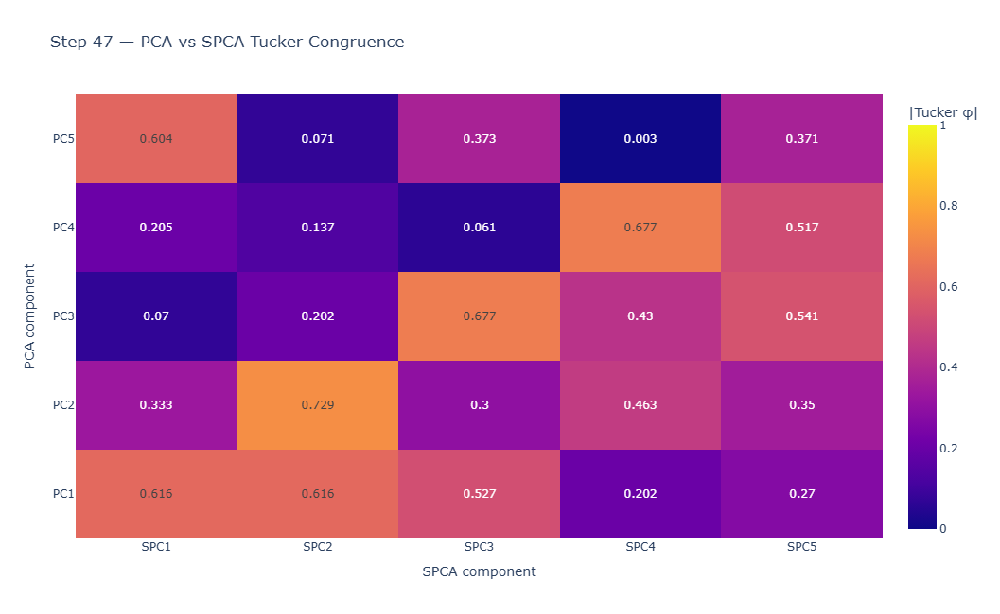

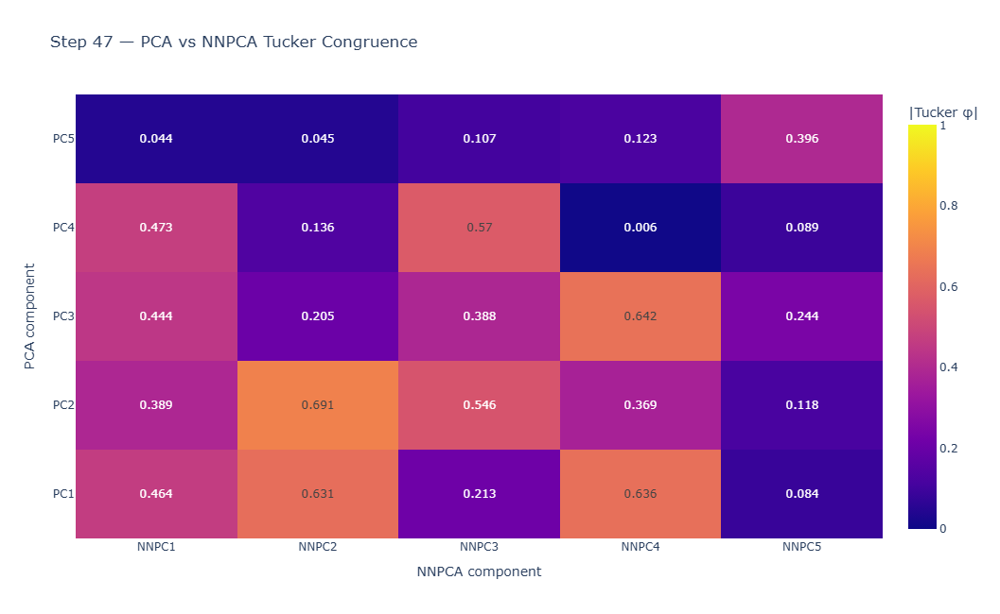

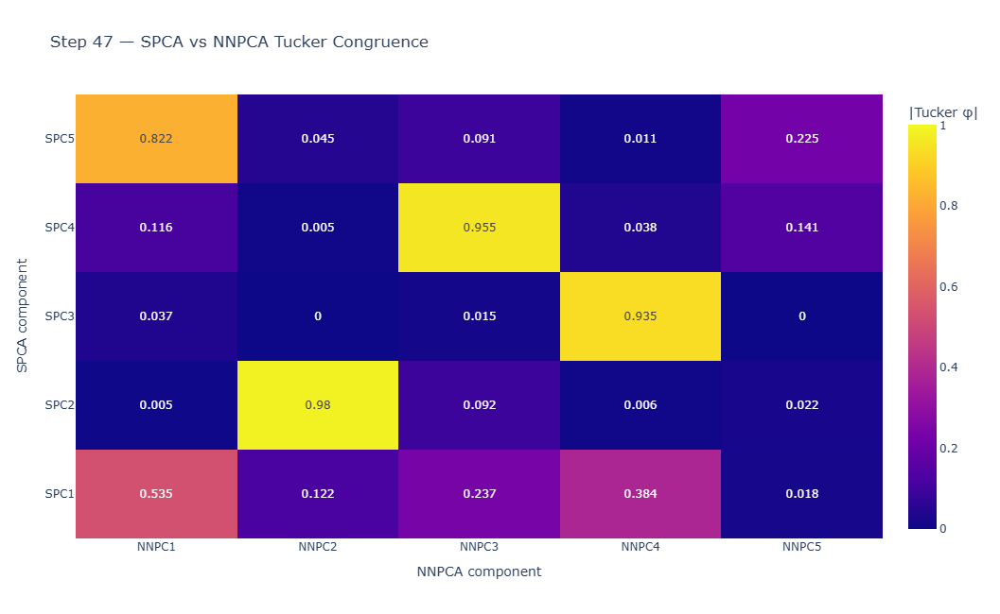


EXPLORATORY NNPC5 — BEST CROSS-METHOD CORRESPONDENCE


,comparison,component,absolute_tucker_congruence,meets_0.85_similarity_criterion
0,NNPC5 best PCA correspondence,PC5,0.3956,False
1,NNPC5 best SPCA correspondence,SPC5,0.2253,False



STEP 47 — CORRECTED CONCORDANCE CONCLUSION

Strict similarity criterion:
  |Tucker phi| >= 0.85

Accepted pairwise matches:
  PCA <-> SPCA:    0
  PCA <-> NNPCA:   0
  SPCA <-> NNPCA:  3

Strict three-method consensus families:
  0

INTERPRETATION:
  No component family has sufficiently similar COMPLETE loading vectors across all three methods to be called strictly equivalent under the .85 congruence criterion.

  This does not prevent substantive constructs from appearing across methods.

  In particular, PCA may represent the same football theme through a broader, denser or bipolar loading pattern.

The descriptive alignment table should be used to examine substantive football themes.

However, descriptive alignment below .85 must not be reported as component equivalence.

NNPC5 remains exploratory regardless of its cross-method similarity because it failed Step 44 bootstrap stability.

STEP 47 COMPLETE — CORRECTED CROSS-METHOD CONCORDANCE

Primary outputs:

  pca_spca_signed
  pca_

In [66]:
# ==================================================================================================
# STEP 47 — CROSS-METHOD COMPONENT CONCORDANCE
# CORRECTED PARTIAL / THRESHOLDED MATCHING
# ==================================================================================================
#
# PURPOSE
# -------
#
# Quantitatively compare component structures obtained independently from:
#
#       Classical PCA
#       Sparse PCA
#       Nonnegative PCA
#
# without assuming that:
#
#       PC1  = SPC1  = NNPC1
#
# or that every component MUST have a counterpart in every method.
#
#
# PRIMARY SIMILARITY STATISTIC
# ----------------------------
#
# Tucker's coefficient of congruence is calculated using the COMPLETE
# loading vector across the same 74 performance variables.
#
#
# SIGN
# ----
#
# PCA and SPCA component signs are arbitrary.
#
# Component identity therefore uses:
#
#       absolute Tucker congruence
#
# Signed congruence is retained separately for orientation diagnostics.
#
#
# CORRECTED MATCHING LOGIC
# ------------------------
#
# The previous Step 47 forced all five components into a complete
# one-to-one assignment.
#
# That creates artificial matches when the remaining components are
# actually unrelated.
#
# Example from the previous analysis:
#
#       SPC1 <-> NNPC5
#
# had:
#
#       |phi| = 0.0184
#
# but was still forced into the global five-way matching.
#
# That is NOT appropriate evidence of correspondence.
#
#
# This corrected Step 47 therefore allows:
#
#       MATCHED COMPONENT
#
# or:
#
#       UNMATCHED COMPONENT
#
#
# CONGRUENCE INTERPRETATION
# -------------------------
#
# Literature-guided interpretation:
#
#       |phi| >= .95
#           very high similarity / approximately equal loading patterns
#
#       .85 <= |phi| < .95
#           meaningful / fair loading-pattern similarity
#
#       |phi| < .85
#           insufficient evidence to claim equivalent loading patterns
#
#
# IMPORTANT:
#
# These are similarity guidelines.
# They are NOT component-retention thresholds.
#
#
# THREE-METHOD CONSENSUS
# ----------------------
#
# A strict three-method consensus family is reported ONLY when:
#
#       PCA <-> SPCA   >= .85
#       PCA <-> NNPCA  >= .85
#       SPCA <-> NNPCA >= .85
#
# simultaneously.
#
# If this condition is not met, the components are NOT forced into
# a three-method family.
#
#
# TWO-METHOD CONVERGENCE
# ----------------------
#
# Strong two-method correspondences are retained separately.
#
# This is important because two methods may recover essentially the
# same component even when the third method represents the construct
# through a broader / bipolar loading pattern.
#
#
# DESCRIPTIVE ALIGNMENT
# ---------------------
#
# A separate descriptive best-alignment table is also created.
#
# This table is useful for substantive interpretation, but entries
# below .85 are explicitly NOT called equivalent components.
#
#
# NNPC5
# -----
#
# NNPC5 remains EXPLORATORY.
#
# Step 44 did not support it as a bootstrap-stable NNPCA component.
#
# Step 47 may evaluate whether its loading pattern resembles PCA/SPCA,
# but similarity here cannot override its failed stability evidence.
#
# ==================================================================================================


# ==================================================================================================
# 1. IMPORT LIBRARIES
# ==================================================================================================

import numpy as np
import pandas as pd

from itertools import permutations, product

from scipy.optimize import linear_sum_assignment

from IPython.display import display


try:

    import plotly.graph_objects as go

except ImportError as error:

    raise RuntimeError(
        "Plotly is not installed.\n\n"
        "Run:\n\n"
        "    %pip install plotly"
    ) from error


# ==================================================================================================
# 2. SETTINGS
# ==================================================================================================

TARGET_COMPONENTS = 5


# --------------------------------------------------------------------------------------------------
# Literature-guided congruence levels
# --------------------------------------------------------------------------------------------------

CONGRUENCE_MATCH_THRESHOLD = 0.85

CONGRUENCE_VERY_HIGH = 0.95


# --------------------------------------------------------------------------------------------------
# Numerical tolerance
# --------------------------------------------------------------------------------------------------

ZERO_TOLERANCE = 1e-12


# --------------------------------------------------------------------------------------------------
# Number of strongest variables shown for substantive interpretation
# --------------------------------------------------------------------------------------------------

TOP_N = 12

TOP_SUPPORT_N = 10


# ==================================================================================================
# 3. HELPER — FIND FIRST EXISTING OBJECT
# ==================================================================================================

def first_existing_object(
    candidate_names
):

    for name in candidate_names:

        if name in globals():

            return (
                name,
                globals()[name]
            )

    return (
        None,
        None
    )


# ==================================================================================================
# 4. LOCATE PCA LOADINGS
# ==================================================================================================

pca_candidates = [

    "pca_loadings",
    "final_pca_loadings",
    "PCA_loadings",
    "pca_loading_matrix"
]


pca_object_name, pca_object = (
    first_existing_object(
        pca_candidates
    )
)


if pca_object is None:

    raise RuntimeError(
        "Could not locate the Classical PCA loading matrix.\n\n"
        "Expected one of:\n\n"
        +
        "\n".join(
            pca_candidates
        )
    )


# ==================================================================================================
# 5. LOCATE SPCA LOADINGS
# ==================================================================================================

spca_candidates = [

    "spca5_one_se_loadings",
    "spca_5_loadings",
    "spca_loadings",
    "final_spca_loadings"
]


spca_object_name, spca_object = (
    first_existing_object(
        spca_candidates
    )
)


if spca_object is None:

    raise RuntimeError(
        "Could not locate the SPCA loading matrix.\n\n"
        "Expected one of:\n\n"
        +
        "\n".join(
            spca_candidates
        )
    )


# ==================================================================================================
# 6. LOCATE NNPCA LOADINGS
# ==================================================================================================

nnpca_candidates = [

    "nnpca5_loadings"
]


nnpca_object_name, nnpca_object = (
    first_existing_object(
        nnpca_candidates
    )
)


if nnpca_object is None:

    raise RuntimeError(
        "`nnpca5_loadings` was not found.\n\n"
        "Run Step 46 first."
    )


# ==================================================================================================
# 7. IDENTIFY EXPECTED VARIABLE NAMES
# ==================================================================================================

variable_name_candidates = [

    "pca_variables",
    "nnpca_variables",
    "performance_variables"
]


expected_variable_names = None


for object_name in variable_name_candidates:

    if object_name in globals():

        candidate = list(
            globals()[
                object_name
            ]
        )


        if len(
            candidate
        ) > 0:

            expected_variable_names = candidate

            break


# ==================================================================================================
# 8. ROBUSTLY ORIENT A LOADING MATRIX
# ==================================================================================================
#
# We prefer variable names to determine orientation.
#
# This is safer than assuming:
#
#       rows > columns
#
# because loading matrices may have been stored in either direction.
#
# ==================================================================================================

def prepare_loading_matrix(
    obj,
    method_name,
    component_prefix,
    target_components,
    expected_variables=None
):

    if not isinstance(
        obj,
        pd.DataFrame
    ):

        raise RuntimeError(
            f"{method_name} loading object must be a pandas DataFrame."
        )


    df = obj.copy()


    # ----------------------------------------------------------------------------------------------
    # Determine orientation using known variable names
    # ----------------------------------------------------------------------------------------------

    orientation_found = False


    if expected_variables is not None:


        index_overlap = len(
            set(
                df.index.astype(
                    str
                )
            )
            &
            set(
                str(x)
                for x in expected_variables
            )
        )


        column_overlap = len(
            set(
                df.columns.astype(
                    str
                )
            )
            &
            set(
                str(x)
                for x in expected_variables
            )
        )


        if index_overlap > column_overlap:

            result = df.copy()

            orientation_found = True


        elif column_overlap > index_overlap:

            result = df.T.copy()

            orientation_found = True


    # ----------------------------------------------------------------------------------------------
    # Fallback based on dimensions
    # ----------------------------------------------------------------------------------------------

    if not orientation_found:


        if (
            df.shape[0]
            >
            df.shape[1]
        ):

            result = df.copy()


        elif (
            df.shape[1]
            >
            df.shape[0]
        ):

            result = df.T.copy()


        else:

            raise RuntimeError(
                f"Could not determine orientation of "
                f"{method_name} loading matrix."
            )


    # ----------------------------------------------------------------------------------------------
    # Need at least requested component count
    # ----------------------------------------------------------------------------------------------

    if result.shape[1] < target_components:

        raise RuntimeError(
            f"{method_name} contains only "
            f"{result.shape[1]} components; "
            f"{target_components} are required."
        )


    result = (
        result
        .iloc[
            :,
            :target_components
        ]
        .copy()
    )


    # ----------------------------------------------------------------------------------------------
    # Force numeric
    # ----------------------------------------------------------------------------------------------

    for column in result.columns:

        result[
            column
        ] = pd.to_numeric(
            result[
                column
            ],
            errors="coerce"
        )


    if result.isna().any().any():

        raise RuntimeError(
            f"{method_name} loading matrix contains "
            "missing or nonnumeric coefficients."
        )


    # ----------------------------------------------------------------------------------------------
    # Normalize component naming
    # ----------------------------------------------------------------------------------------------

    result.columns = [

        f"{component_prefix}{i}"

        for i in range(
            1,
            target_components + 1
        )
    ]


    result.index = (
        result.index
        .astype(
            str
        )
    )


    return result


# ==================================================================================================
# 9. PREPARE ALL THREE MATRICES
# ==================================================================================================

pca_L = prepare_loading_matrix(

    pca_object,

    method_name=
        "PCA",

    component_prefix=
        "PC",

    target_components=
        TARGET_COMPONENTS,

    expected_variables=
        expected_variable_names
)


spca_L = prepare_loading_matrix(

    spca_object,

    method_name=
        "SPCA",

    component_prefix=
        "SPC",

    target_components=
        TARGET_COMPONENTS,

    expected_variables=
        expected_variable_names
)


nnpca_L = prepare_loading_matrix(

    nnpca_object,

    method_name=
        "NNPCA",

    component_prefix=
        "NNPC",

    target_components=
        TARGET_COMPONENTS,

    expected_variables=
        expected_variable_names
)


# ==================================================================================================
# 10. ALIGN VARIABLES EXACTLY
# ==================================================================================================

common_variables = [

    variable

    for variable in pca_L.index

    if (
        variable in spca_L.index
        and
        variable in nnpca_L.index
    )
]


if len(
    common_variables
) == 0:

    raise RuntimeError(
        "No common variables were found across "
        "PCA, SPCA and NNPCA."
    )


pca_L = (
    pca_L
    .loc[
        common_variables
    ]
    .copy()
)


spca_L = (
    spca_L
    .loc[
        common_variables
    ]
    .copy()
)


nnpca_L = (
    nnpca_L
    .loc[
        common_variables
    ]
    .copy()
)


# ==================================================================================================
# 11. PRINT INPUT VALIDATION
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "STEP 47 — CORRECTED CROSS-METHOD COMPONENT CONCORDANCE"
)


print(
    "=" * 150
)


print(
    "\nLoading objects:"
)


print(
    f"  PCA:    {pca_object_name}"
)


print(
    f"  SPCA:   {spca_object_name}"
)


print(
    f"  NNPCA:  {nnpca_object_name}"
)


print(
    "\nVariables aligned across methods:"
)


print(
    f"  {len(common_variables)}"
)


if len(
    common_variables
) == 74:

    print(
        "  PASS — all 74 performance variables are aligned."
    )


else:

    print(
        "  WARNING — comparison does not use exactly 74 variables."
    )


print(
    "\nComponents:"
)


print(
    "  PCA:    PC1-PC5"
)


print(
    "  SPCA:   SPC1-SPC5"
)


print(
    "  NNPCA:  NNPC1-NNPC5"
)


print(
    "\nMatching threshold:"
)


print(
    f"  |Tucker phi| >= "
    f"{CONGRUENCE_MATCH_THRESHOLD:.2f}"
)


print(
    "\nVery-high similarity threshold:"
)


print(
    f"  |Tucker phi| >= "
    f"{CONGRUENCE_VERY_HIGH:.2f}"
)


print(
    "\nIMPORTANT:"
)


print(
    "  Components are allowed to remain UNMATCHED."
)


# ==================================================================================================
# 12. TUCKER CONGRUENCE
# ==================================================================================================

def tucker_congruence(
    x,
    y
):

    x = np.asarray(
        x,
        dtype=float
    )


    y = np.asarray(
        y,
        dtype=float
    )


    denominator = np.sqrt(

        np.sum(
            x ** 2
        )

        *

        np.sum(
            y ** 2
        )
    )


    if denominator <= ZERO_TOLERANCE:

        return np.nan


    return float(

        np.sum(
            x * y
        )

        /

        denominator
    )


# ==================================================================================================
# 13. FULL CONGRUENCE MATRIX
# ==================================================================================================

def calculate_congruence_matrix(
    loading_A,
    loading_B
):

    matrix = np.zeros(
        (
            loading_A.shape[1],
            loading_B.shape[1]
        ),
        dtype=float
    )


    for i in range(
        loading_A.shape[1]
    ):


        for j in range(
            loading_B.shape[1]
        ):


            matrix[
                i,
                j
            ] = tucker_congruence(

                loading_A.iloc[
                    :,
                    i
                ].values,

                loading_B.iloc[
                    :,
                    j
                ].values
            )


    return pd.DataFrame(

        matrix,

        index=
            loading_A.columns,

        columns=
            loading_B.columns
    )


pca_spca_signed = calculate_congruence_matrix(
    pca_L,
    spca_L
)


pca_nnpca_signed = calculate_congruence_matrix(
    pca_L,
    nnpca_L
)


spca_nnpca_signed = calculate_congruence_matrix(
    spca_L,
    nnpca_L
)


pca_spca_abs = pca_spca_signed.abs()

pca_nnpca_abs = pca_nnpca_signed.abs()

spca_nnpca_abs = spca_nnpca_signed.abs()


# ==================================================================================================
# 14. DISPLAY ALL-BY-ALL MATRICES
# ==================================================================================================

print(
    "\n"
    + "=" * 150
)


print(
    "PCA vs SPCA — ABSOLUTE TUCKER CONGRUENCE"
)


print(
    "=" * 150
)


display(
    pca_spca_abs.round(
        4
    )
)


print(
    "\n"
    + "=" * 150
)


print(
    "PCA vs NNPCA — ABSOLUTE TUCKER CONGRUENCE"
)


print(
    "=" * 150
)


display(
    pca_nnpca_abs.round(
        4
    )
)


print(
    "\n"
    + "=" * 150
)


print(
    "SPCA vs NNPCA — ABSOLUTE TUCKER CONGRUENCE"
)


print(
    "=" * 150
)


display(
    spca_nnpca_abs.round(
        4
    )
)


# ==================================================================================================
# 15. CONGRUENCE INTERPRETATION
# ==================================================================================================

def interpret_congruence(
    value
):

    if pd.isna(
        value
    ):

        return "undefined"


    value = abs(
        value
    )


    if value >= CONGRUENCE_VERY_HIGH:

        return (
            "very high / approximately equal"
        )


    elif value >= CONGRUENCE_MATCH_THRESHOLD:

        return (
            "meaningful loading-pattern similarity"
        )


    else:

        return (
            "below similarity criterion"
        )


# ==================================================================================================
# 16. CORRECTED PARTIAL HUNGARIAN MATCHING
# ==================================================================================================
#
# We augment the similarity matrix with dummy assignments.
#
# A real match contributes:
#
#       similarity - threshold
#
# A dummy / unmatched assignment contributes:
#
#       0
#
# Therefore:
#
#       similarity < threshold
#
# is never preferable to leaving the component unmatched.
#
# This prevents forced low-congruence pairings.
#
# ==================================================================================================

def thresholded_optimal_matching(
    signed_matrix,
    method_A,
    method_B,
    threshold
):

    abs_matrix = (
        signed_matrix
        .abs()
        .copy()
    )


    n_A = abs_matrix.shape[0]

    n_B = abs_matrix.shape[1]


    # ----------------------------------------------------------------------------------------------
    # Real-match utility
    # ----------------------------------------------------------------------------------------------

    real_utility = (
        abs_matrix.values
        -
        threshold
    )


    # ----------------------------------------------------------------------------------------------
    # Augmented assignment matrix
    #
    # Rows:
    #
    #       real A components
    #       dummy rows for unmatched B
    #
    # Columns:
    #
    #       real B components
    #       dummy columns for unmatched A
    #
    # ----------------------------------------------------------------------------------------------

    size = (
        n_A
        +
        n_B
    )


    utility = np.zeros(
        (
            size,
            size
        ),
        dtype=float
    )


    utility[
        :n_A,
        :n_B
    ] = real_utility


    # ----------------------------------------------------------------------------------------------
    # Hungarian minimizes cost
    # ----------------------------------------------------------------------------------------------

    cost = (
        -
        utility
    )


    row_ind, col_ind = (
        linear_sum_assignment(
            cost
        )
    )


    matched_rows = []

    matched_A_indices = set()

    matched_B_indices = set()


    for row_index, col_index in zip(
        row_ind,
        col_ind
    ):


        # ------------------------------------------------------------------------------------------
        # Real A -> Real B
        # ------------------------------------------------------------------------------------------

        if (
            row_index < n_A
            and
            col_index < n_B
        ):


            absolute_phi = float(
                abs_matrix.iloc[
                    row_index,
                    col_index
                ]
            )


            # --------------------------------------------------------------------------------------
            # Only accept if threshold actually met
            # --------------------------------------------------------------------------------------

            if absolute_phi >= threshold:


                signed_phi = float(
                    signed_matrix.iloc[
                        row_index,
                        col_index
                    ]
                )


                component_A = (
                    signed_matrix.index[
                        row_index
                    ]
                )


                component_B = (
                    signed_matrix.columns[
                        col_index
                    ]
                )


                matched_A_indices.add(
                    row_index
                )


                matched_B_indices.add(
                    col_index
                )


                matched_rows.append(
                    {
                        f"{method_A}_component":
                            component_A,

                        f"{method_B}_component":
                            component_B,

                        "status":
                            "MATCHED",

                        "signed_tucker_congruence":
                            signed_phi,

                        "absolute_tucker_congruence":
                            absolute_phi,

                        "sign_flip_needed":
                            bool(
                                signed_phi
                                <
                                0
                            ),

                        "interpretation":
                            interpret_congruence(
                                absolute_phi
                            )
                    }
                )


    # ----------------------------------------------------------------------------------------------
    # Unmatched A components
    # ----------------------------------------------------------------------------------------------

    for i in range(
        n_A
    ):


        if i not in matched_A_indices:


            component_A = (
                signed_matrix.index[
                    i
                ]
            )


            best_B_index = int(

                np.argmax(
                    abs_matrix.iloc[
                        i,
                        :
                    ]
                    .values
                )
            )


            best_B = (
                signed_matrix.columns[
                    best_B_index
                ]
            )


            best_phi = float(
                abs_matrix.iloc[
                    i,
                    best_B_index
                ]
            )


            matched_rows.append(
                {
                    f"{method_A}_component":
                        component_A,

                    f"{method_B}_component":
                        np.nan,

                    "status":
                        "UNMATCHED",

                    "signed_tucker_congruence":
                        np.nan,

                    "absolute_tucker_congruence":
                        np.nan,

                    "sign_flip_needed":
                        np.nan,

                    "interpretation":
                        (
                            f"best candidate = {best_B}, "
                            f"|phi| = {best_phi:.4f}"
                        )
                }
            )


    # ----------------------------------------------------------------------------------------------
    # Unmatched B components
    # ----------------------------------------------------------------------------------------------

    for j in range(
        n_B
    ):


        if j not in matched_B_indices:


            component_B = (
                signed_matrix.columns[
                    j
                ]
            )


            best_A_index = int(

                np.argmax(
                    abs_matrix.iloc[
                        :,
                        j
                    ]
                    .values
                )
            )


            best_A = (
                signed_matrix.index[
                    best_A_index
                ]
            )


            best_phi = float(
                abs_matrix.iloc[
                    best_A_index,
                    j
                ]
            )


            matched_rows.append(
                {
                    f"{method_A}_component":
                        np.nan,

                    f"{method_B}_component":
                        component_B,

                    "status":
                        "UNMATCHED",

                    "signed_tucker_congruence":
                        np.nan,

                    "absolute_tucker_congruence":
                        np.nan,

                    "sign_flip_needed":
                        np.nan,

                    "interpretation":
                        (
                            f"best candidate = {best_A}, "
                            f"|phi| = {best_phi:.4f}"
                        )
                }
            )


    return pd.DataFrame(
        matched_rows
    )


# ==================================================================================================
# 17. RUN CORRECTED PAIRWISE MATCHING
# ==================================================================================================

pca_spca_partial_matching = (
    thresholded_optimal_matching(

        pca_spca_signed,

        method_A=
            "PCA",

        method_B=
            "SPCA",

        threshold=
            CONGRUENCE_MATCH_THRESHOLD
    )
)


pca_nnpca_partial_matching = (
    thresholded_optimal_matching(

        pca_nnpca_signed,

        method_A=
            "PCA",

        method_B=
            "NNPCA",

        threshold=
            CONGRUENCE_MATCH_THRESHOLD
    )
)


spca_nnpca_partial_matching = (
    thresholded_optimal_matching(

        spca_nnpca_signed,

        method_A=
            "SPCA",

        method_B=
            "NNPCA",

        threshold=
            CONGRUENCE_MATCH_THRESHOLD
    )
)


# ==================================================================================================
# 18. DISPLAY CORRECTED PAIRWISE MATCHING
# ==================================================================================================

print(
    "\n"
    + "=" * 160
)


print(
    "CORRECTED PARTIAL MATCHING — PCA vs SPCA"
)


print(
    "=" * 160
)


display(
    pca_spca_partial_matching.round(
        4
    )
)


print(
    "\n"
    + "=" * 160
)


print(
    "CORRECTED PARTIAL MATCHING — PCA vs NNPCA"
)


print(
    "=" * 160
)


display(
    pca_nnpca_partial_matching.round(
        4
    )
)


print(
    "\n"
    + "=" * 160
)


print(
    "CORRECTED PARTIAL MATCHING — SPCA vs NNPCA"
)


print(
    "=" * 160
)


display(
    spca_nnpca_partial_matching.round(
        4
    )
)


# ==================================================================================================
# 19. EXTRACT ACCEPTED TWO-METHOD MATCHES
# ==================================================================================================

def accepted_matches(
    table
):

    return (
        table[
            table[
                "status"
            ]
            ==
            "MATCHED"
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )


pca_spca_accepted_matches = (
    accepted_matches(
        pca_spca_partial_matching
    )
)


pca_nnpca_accepted_matches = (
    accepted_matches(
        pca_nnpca_partial_matching
    )
)


spca_nnpca_accepted_matches = (
    accepted_matches(
        spca_nnpca_partial_matching
    )
)


# ==================================================================================================
# 20. STRICT THREE-METHOD CONSENSUS SEARCH
# ==================================================================================================
#
# We do NOT force one triplet per component.
#
# Candidate triplets are generated only when ALL THREE pairwise
# congruences meet the .85 similarity criterion.
#
# ==================================================================================================

strict_triplet_rows = []


for pc in pca_L.columns:


    for spc in spca_L.columns:


        for nnpc in nnpca_L.columns:


            phi_pca_spca = float(
                pca_spca_abs.loc[
                    pc,
                    spc
                ]
            )


            phi_pca_nnpca = float(
                pca_nnpca_abs.loc[
                    pc,
                    nnpc
                ]
            )


            phi_spca_nnpca = float(
                spca_nnpca_abs.loc[
                    spc,
                    nnpc
                ]
            )


            minimum_phi = min(

                phi_pca_spca,
                phi_pca_nnpca,
                phi_spca_nnpca
            )


            if minimum_phi >= CONGRUENCE_MATCH_THRESHOLD:


                strict_triplet_rows.append(
                    {
                        "PCA_component":
                            pc,

                        "SPCA_component":
                            spc,

                        "NNPCA_component":
                            nnpc,

                        "PCA_SPCA_phi":
                            phi_pca_spca,

                        "PCA_NNPCA_phi":
                            phi_pca_nnpca,

                        "SPCA_NNPCA_phi":
                            phi_spca_nnpca,

                        "mean_cross_method_phi":
                            float(
                                np.mean(
                                    [
                                        phi_pca_spca,
                                        phi_pca_nnpca,
                                        phi_spca_nnpca
                                    ]
                                )
                            ),

                        "minimum_cross_method_phi":
                            minimum_phi,

                        "all_pairs_at_least_0.95":
                            (
                                minimum_phi
                                >=
                                CONGRUENCE_VERY_HIGH
                            ),

                        "contains_exploratory_NNPC5":
                            (
                                nnpc
                                ==
                                "NNPC5"
                            )
                    }
                )


strict_candidate_triplets = pd.DataFrame(
    strict_triplet_rows
)


# ==================================================================================================
# 21. SELECT NON-OVERLAPPING STRICT TRIPLETS
# ==================================================================================================
#
# If multiple valid triplets exist, select the combination with:
#
#       highest total mean congruence
#
# while preventing any component from appearing in more than one family.
#
#
# With only five components per method this exhaustive subset search
# is computationally trivial.
#
# ==================================================================================================

def select_best_nonoverlapping_triplets(
    candidate_table
):

    if candidate_table.empty:

        return pd.DataFrame(
            columns=[
                "PCA_component",
                "SPCA_component",
                "NNPCA_component",
                "PCA_SPCA_phi",
                "PCA_NNPCA_phi",
                "SPCA_NNPCA_phi",
                "mean_cross_method_phi",
                "minimum_cross_method_phi",
                "all_pairs_at_least_0.95",
                "contains_exploratory_NNPC5"
            ]
        )


    rows = candidate_table.to_dict(
        "records"
    )


    best_selection = []

    best_score = -np.inf


    def recursive_search(
        index,
        selected,
        used_pca,
        used_spca,
        used_nnpca,
        score
    ):

        nonlocal best_selection
        nonlocal best_score


        if index == len(
            rows
        ):


            # --------------------------------------------------------------------------------------
            # First maximize number of strict consensus families.
            #
            # Then maximize congruence.
            # --------------------------------------------------------------------------------------

            objective = (
                len(
                    selected
                )
                *
                1000
                +
                score
            )


            best_objective = (
                len(
                    best_selection
                )
                *
                1000
                +
                best_score
            )


            if objective > best_objective:

                best_selection = list(
                    selected
                )

                best_score = score


            return


        # ------------------------------------------------------------------------------------------
        # Option 1: skip current candidate
        # ------------------------------------------------------------------------------------------

        recursive_search(
            index + 1,
            selected,
            used_pca,
            used_spca,
            used_nnpca,
            score
        )


        row = rows[
            index
        ]


        pc = row[
            "PCA_component"
        ]


        spc = row[
            "SPCA_component"
        ]


        nnpc = row[
            "NNPCA_component"
        ]


        # ------------------------------------------------------------------------------------------
        # Option 2: use current candidate if components unused
        # ------------------------------------------------------------------------------------------

        if (
            pc not in used_pca
            and
            spc not in used_spca
            and
            nnpc not in used_nnpca
        ):


            recursive_search(

                index + 1,

                selected
                +
                [
                    row
                ],

                used_pca
                |
                {
                    pc
                },

                used_spca
                |
                {
                    spc
                },

                used_nnpca
                |
                {
                    nnpc
                },

                score
                +
                row[
                    "mean_cross_method_phi"
                ]
            )


    recursive_search(

        index=
            0,

        selected=
            [],

        used_pca=
            set(),

        used_spca=
            set(),

        used_nnpca=
            set(),

        score=
            0.0
    )


    return pd.DataFrame(
        best_selection
    )


strict_three_method_consensus = (
    select_best_nonoverlapping_triplets(
        strict_candidate_triplets
    )
)


if not strict_three_method_consensus.empty:

    strict_three_method_consensus = (
        strict_three_method_consensus
        .sort_values(
            "mean_cross_method_phi",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


# ==================================================================================================
# 22. DISPLAY STRICT THREE-METHOD CONSENSUS
# ==================================================================================================

print(
    "\n"
    + "=" * 180
)


print(
    "STRICT THREE-METHOD COMPONENT CONSENSUS"
)


print(
    "=" * 180
)


print(
    f"\nRequirement:"
)


print(
    f"  ALL THREE pairwise Tucker congruences >= "
    f"{CONGRUENCE_MATCH_THRESHOLD:.2f}"
)


if strict_three_method_consensus.empty:


    print(
        "\nNo three-method component family satisfies the "
        "strict full-loading-pattern criterion."
    )


    print(
        "\nThis does NOT mean the methods have no substantive "
        "constructs in common."
    )


    print(
        "\nIt means the COMPLETE loading vectors are not sufficiently "
        "similar across all three estimators to claim component equivalence."
    )


else:


    display(
        strict_three_method_consensus.round(
            4
        )
    )


# ==================================================================================================
# 23. IDENTIFY ALL STRONG TWO-METHOD COMPONENT FAMILIES
# ==================================================================================================

two_method_rows = []


# --------------------------------------------------------------------------------------------------
# PCA / SPCA
# --------------------------------------------------------------------------------------------------

for _, row in pca_spca_accepted_matches.iterrows():


    two_method_rows.append(
        {
            "method_1":
                "PCA",

            "component_1":
                row[
                    "PCA_component"
                ],

            "method_2":
                "SPCA",

            "component_2":
                row[
                    "SPCA_component"
                ],

            "absolute_tucker_congruence":
                row[
                    "absolute_tucker_congruence"
                ],

            "interpretation":
                row[
                    "interpretation"
                ]
        }
    )


# --------------------------------------------------------------------------------------------------
# PCA / NNPCA
# --------------------------------------------------------------------------------------------------

for _, row in pca_nnpca_accepted_matches.iterrows():


    two_method_rows.append(
        {
            "method_1":
                "PCA",

            "component_1":
                row[
                    "PCA_component"
                ],

            "method_2":
                "NNPCA",

            "component_2":
                row[
                    "NNPCA_component"
                ],

            "absolute_tucker_congruence":
                row[
                    "absolute_tucker_congruence"
                ],

            "interpretation":
                row[
                    "interpretation"
                ]
        }
    )


# --------------------------------------------------------------------------------------------------
# SPCA / NNPCA
# --------------------------------------------------------------------------------------------------

for _, row in spca_nnpca_accepted_matches.iterrows():


    two_method_rows.append(
        {
            "method_1":
                "SPCA",

            "component_1":
                row[
                    "SPCA_component"
                ],

            "method_2":
                "NNPCA",

            "component_2":
                row[
                    "NNPCA_component"
                ],

            "absolute_tucker_congruence":
                row[
                    "absolute_tucker_congruence"
                ],

            "interpretation":
                row[
                    "interpretation"
                ]
        }
    )


strong_two_method_correspondence = (
    pd.DataFrame(
        two_method_rows
    )
)


if not strong_two_method_correspondence.empty:

    strong_two_method_correspondence = (
        strong_two_method_correspondence
        .sort_values(
            "absolute_tucker_congruence",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


print(
    "\n"
    + "=" * 170
)


print(
    "STRONG TWO-METHOD COMPONENT CORRESPONDENCE"
)


print(
    "=" * 170
)


if strong_two_method_correspondence.empty:


    print(
        "\nNo pairwise component matches met the "
        f"{CONGRUENCE_MATCH_THRESHOLD:.2f} criterion."
    )


else:


    display(
        strong_two_method_correspondence.round(
            4
        )
    )


# ==================================================================================================
# 24. DESCRIPTIVE THREE-METHOD ALIGNMENT
# ==================================================================================================
#
# This section deliberately DOES NOT impose the .85 criterion.
#
# Purpose:
#
#       substantive comparison only
#
# It answers:
#
#       "If we wanted to align the most similar components across all
#        three methods, what would the best descriptive arrangement be?"
#
#
# These rows must NOT be interpreted as equivalent components unless
# the strict criterion above is met.
#
# ==================================================================================================

best_total_score = -np.inf

best_spca_permutation = None

best_nnpca_permutation = None


pca_spca_values = (
    pca_spca_abs
    .values
)


pca_nnpca_values = (
    pca_nnpca_abs
    .values
)


spca_nnpca_values = (
    spca_nnpca_abs
    .values
)


for spca_perm in permutations(
    range(
        TARGET_COMPONENTS
    )
):


    for nnpca_perm in permutations(
        range(
            TARGET_COMPONENTS
        )
    ):


        total_score = 0.0


        for i in range(
            TARGET_COMPONENTS
        ):


            j = spca_perm[
                i
            ]


            k = nnpca_perm[
                i
            ]


            total_score += (

                pca_spca_values[
                    i,
                    j
                ]

                +

                pca_nnpca_values[
                    i,
                    k
                ]

                +

                spca_nnpca_values[
                    j,
                    k
                ]
            )


        if total_score > best_total_score:


            best_total_score = total_score

            best_spca_permutation = spca_perm

            best_nnpca_permutation = nnpca_perm


# ==================================================================================================
# 25. BUILD DESCRIPTIVE ALIGNMENT TABLE
# ==================================================================================================

descriptive_rows = []


for i in range(
    TARGET_COMPONENTS
):


    j = best_spca_permutation[
        i
    ]


    k = best_nnpca_permutation[
        i
    ]


    pc = pca_L.columns[
        i
    ]


    spc = spca_L.columns[
        j
    ]


    nnpc = nnpca_L.columns[
        k
    ]


    phi_pca_spca = float(
        pca_spca_abs.iloc[
            i,
            j
        ]
    )


    phi_pca_nnpca = float(
        pca_nnpca_abs.iloc[
            i,
            k
        ]
    )


    phi_spca_nnpca = float(
        spca_nnpca_abs.iloc[
            j,
            k
        ]
    )


    minimum_phi = min(

        phi_pca_spca,
        phi_pca_nnpca,
        phi_spca_nnpca
    )


    descriptive_rows.append(
        {
            "descriptive_family":
                i + 1,

            "PCA_component":
                pc,

            "SPCA_component":
                spc,

            "NNPCA_component":
                nnpc,

            "PCA_SPCA_phi":
                phi_pca_spca,

            "PCA_NNPCA_phi":
                phi_pca_nnpca,

            "SPCA_NNPCA_phi":
                phi_spca_nnpca,

            "mean_cross_method_phi":
                float(
                    np.mean(
                        [
                            phi_pca_spca,
                            phi_pca_nnpca,
                            phi_spca_nnpca
                        ]
                    )
                ),

            "minimum_cross_method_phi":
                minimum_phi,

            "strict_three_method_match":
                (
                    minimum_phi
                    >=
                    CONGRUENCE_MATCH_THRESHOLD
                ),

            "contains_exploratory_NNPC5":
                (
                    nnpc
                    ==
                    "NNPC5"
                )
        }
    )


descriptive_cross_method_alignment = (
    pd.DataFrame(
        descriptive_rows
    )
)


print(
    "\n"
    + "=" * 180
)


print(
    "DESCRIPTIVE CROSS-METHOD ALIGNMENT"
)


print(
    "=" * 180
)


print(
    "\nWARNING:"
)


print(
    "  This table is for substantive interpretation only."
)


print(
    "  Rows below the .85 criterion are NOT treated as "
    "statistically equivalent component families."
)


display(
    descriptive_cross_method_alignment.round(
        4
    )
)


# ==================================================================================================
# 26. SIGN-ALIGN DESCRIPTIVE COMPONENTS FOR INSPECTION
# ==================================================================================================
#
# Sign alignment changes presentation only.
# It does not alter any fitted model.
#
# ==================================================================================================

aligned_loading_columns = {}


for _, row in descriptive_cross_method_alignment.iterrows():


    family = int(
        row[
            "descriptive_family"
        ]
    )


    pc = row[
        "PCA_component"
    ]


    spc = row[
        "SPCA_component"
    ]


    nnpc = row[
        "NNPCA_component"
    ]


    pca_vector = (
        pca_L[
            pc
        ]
        .to_numpy(
            dtype=float
        )
    )


    spca_vector = (
        spca_L[
            spc
        ]
        .to_numpy(
            dtype=float
        )
    )


    nnpca_vector = (
        nnpca_L[
            nnpc
        ]
        .to_numpy(
            dtype=float
        )
    )


    # ----------------------------------------------------------------------------------------------
    # Orient PCA toward NNPCA
    # ----------------------------------------------------------------------------------------------

    if np.dot(
        pca_vector,
        nnpca_vector
    ) < 0:

        pca_vector = (
            -
            pca_vector
        )


    # ----------------------------------------------------------------------------------------------
    # Orient SPCA toward NNPCA
    # ----------------------------------------------------------------------------------------------

    if np.dot(
        spca_vector,
        nnpca_vector
    ) < 0:

        spca_vector = (
            -
            spca_vector
        )


    aligned_loading_columns[
        f"F{family}_{pc}"
    ] = pca_vector


    aligned_loading_columns[
        f"F{family}_{spc}"
    ] = spca_vector


    aligned_loading_columns[
        f"F{family}_{nnpc}"
    ] = nnpca_vector


cross_method_aligned_loadings = pd.DataFrame(

    aligned_loading_columns,

    index=
        common_variables
)


# ==================================================================================================
# 27. TOP VARIABLES FOR EACH DESCRIPTIVE FAMILY
# ==================================================================================================

descriptive_family_top_variables = {}


for _, row in descriptive_cross_method_alignment.iterrows():


    family = int(
        row[
            "descriptive_family"
        ]
    )


    pc = row[
        "PCA_component"
    ]


    spc = row[
        "SPCA_component"
    ]


    nnpc = row[
        "NNPCA_component"
    ]


    comparison = pd.DataFrame(
        {
            "variable":
                common_variables,

            "PCA_loading":
                cross_method_aligned_loadings[
                    f"F{family}_{pc}"
                ]
                .values,

            "SPCA_loading":
                cross_method_aligned_loadings[
                    f"F{family}_{spc}"
                ]
                .values,

            "NNPCA_loading":
                cross_method_aligned_loadings[
                    f"F{family}_{nnpc}"
                ]
                .values
        }
    )


    comparison[
        "mean_absolute_loading"
    ] = (

        comparison[
            [
                "PCA_loading",
                "SPCA_loading",
                "NNPCA_loading"
            ]
        ]
        .abs()
        .mean(
            axis=1
        )
    )


    comparison = (
        comparison
        .sort_values(
            "mean_absolute_loading",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


    descriptive_family_top_variables[
        family
    ] = comparison


# ==================================================================================================
# 28. PRINT DESCRIPTIVE FAMILY CONTENT
# ==================================================================================================

for _, row in descriptive_cross_method_alignment.iterrows():


    family = int(
        row[
            "descriptive_family"
        ]
    )


    print(
        "\n"
        + "=" * 180
    )


    print(
        f"DESCRIPTIVE FAMILY {family} — "
        f"{row['PCA_component']} / "
        f"{row['SPCA_component']} / "
        f"{row['NNPCA_component']}"
    )


    print(
        "=" * 180
    )


    print(
        f"\nPCA ↔ SPCA:"
        f"   {row['PCA_SPCA_phi']:.4f}"
    )


    print(
        f"PCA ↔ NNPCA:"
        f"  {row['PCA_NNPCA_phi']:.4f}"
    )


    print(
        f"SPCA ↔ NNPCA:"
        f" {row['SPCA_NNPCA_phi']:.4f}"
    )


    print(
        f"\nStrict three-method equivalence:"
        f"  {row['strict_three_method_match']}"
    )


    print(
        "\nTop variables:"
    )


    display(

        descriptive_family_top_variables[
            family
        ]
        .head(
            TOP_N
        )
        .round(
            4
        )
    )


# ==================================================================================================
# 29. SECONDARY TOP-10 VARIABLE OVERLAP
# ==================================================================================================

support_overlap_rows = []


for _, row in descriptive_cross_method_alignment.iterrows():


    family = int(
        row[
            "descriptive_family"
        ]
    )


    pc = row[
        "PCA_component"
    ]


    spc = row[
        "SPCA_component"
    ]


    nnpc = row[
        "NNPCA_component"
    ]


    pca_top = set(

        pca_L[
            pc
        ]
        .abs()
        .nlargest(
            TOP_SUPPORT_N
        )
        .index
    )


    spca_top = set(

        spca_L[
            spc
        ]
        .abs()
        .nlargest(
            TOP_SUPPORT_N
        )
        .index
    )


    nnpca_top = set(

        nnpca_L[
            nnpc
        ]
        .abs()
        .nlargest(
            TOP_SUPPORT_N
        )
        .index
    )


    shared_all_three = (
        pca_top
        &
        spca_top
        &
        nnpca_top
    )


    union_all_three = (
        pca_top
        |
        spca_top
        |
        nnpca_top
    )


    jaccard = (

        len(
            shared_all_three
        )

        /

        len(
            union_all_three
        )

        if len(
            union_all_three
        ) > 0

        else np.nan
    )


    support_overlap_rows.append(
        {
            "descriptive_family":
                family,

            "PCA_component":
                pc,

            "SPCA_component":
                spc,

            "NNPCA_component":
                nnpc,

            "shared_top10_variables":
                len(
                    shared_all_three
                ),

            "three_way_top10_jaccard":
                jaccard,

            "variables_shared_by_all_three":
                ", ".join(
                    sorted(
                        shared_all_three
                    )
                )
        }
    )


cross_method_support_overlap = pd.DataFrame(
    support_overlap_rows
)


print(
    "\n"
    + "=" * 180
)


print(
    "SECONDARY DIAGNOSTIC — TOP-10 VARIABLE OVERLAP"
)


print(
    "=" * 180
)


display(
    cross_method_support_overlap.round(
        4
    )
)


# ==================================================================================================
# 30. UNMATCHED COMPONENT SUMMARY
# ==================================================================================================

def get_unmatched_components(
    partial_table,
    column_name
):

    values = (

        partial_table.loc[
            (
                partial_table[
                    "status"
                ]
                ==
                "UNMATCHED"
            )
            &
            (
                partial_table[
                    column_name
                ]
                .notna()
            ),
            column_name
        ]
        .tolist()
    )


    return values


unmatched_summary = pd.DataFrame(
    {
        "comparison":
            [
                "PCA vs SPCA",
                "PCA vs NNPCA",
                "SPCA vs NNPCA"
            ],

        "method_1_unmatched":
            [
                ", ".join(
                    get_unmatched_components(
                        pca_spca_partial_matching,
                        "PCA_component"
                    )
                ),

                ", ".join(
                    get_unmatched_components(
                        pca_nnpca_partial_matching,
                        "PCA_component"
                    )
                ),

                ", ".join(
                    get_unmatched_components(
                        spca_nnpca_partial_matching,
                        "SPCA_component"
                    )
                )
            ],

        "method_2_unmatched":
            [
                ", ".join(
                    get_unmatched_components(
                        pca_spca_partial_matching,
                        "SPCA_component"
                    )
                ),

                ", ".join(
                    get_unmatched_components(
                        pca_nnpca_partial_matching,
                        "NNPCA_component"
                    )
                ),

                ", ".join(
                    get_unmatched_components(
                        spca_nnpca_partial_matching,
                        "NNPCA_component"
                    )
                )
            ]
    }
)


print(
    "\n"
    + "=" * 160
)


print(
    "UNMATCHED COMPONENT SUMMARY"
)


print(
    "=" * 160
)


display(
    unmatched_summary
)


# ==================================================================================================
# 31. HEATMAP — PCA VS SPCA
# ==================================================================================================

fig_step47_pca_spca = go.Figure(

    data=
        go.Heatmap(

            z=
                pca_spca_abs.values,

            x=
                pca_spca_abs.columns,

            y=
                pca_spca_abs.index,

            text=
                np.round(
                    pca_spca_abs.values,
                    3
                ),

            texttemplate=
                "%{text}",

            zmin=
                0,

            zmax=
                1,

            colorbar=
                dict(
                    title="|Tucker φ|"
                )
        )
)


fig_step47_pca_spca.update_layout(

    title=
        "Step 47 — PCA vs SPCA Tucker Congruence",

    xaxis_title=
        "SPCA component",

    yaxis_title=
        "PCA component",

    template=
        "plotly_white",

    width=
        750,

    height=
        650
)


fig_step47_pca_spca.show()


# ==================================================================================================
# 32. HEATMAP — PCA VS NNPCA
# ==================================================================================================

fig_step47_pca_nnpca = go.Figure(

    data=
        go.Heatmap(

            z=
                pca_nnpca_abs.values,

            x=
                pca_nnpca_abs.columns,

            y=
                pca_nnpca_abs.index,

            text=
                np.round(
                    pca_nnpca_abs.values,
                    3
                ),

            texttemplate=
                "%{text}",

            zmin=
                0,

            zmax=
                1,

            colorbar=
                dict(
                    title="|Tucker φ|"
                )
        )
)


fig_step47_pca_nnpca.update_layout(

    title=
        "Step 47 — PCA vs NNPCA Tucker Congruence",

    xaxis_title=
        "NNPCA component",

    yaxis_title=
        "PCA component",

    template=
        "plotly_white",

    width=
        750,

    height=
        650
)


fig_step47_pca_nnpca.show()


# ==================================================================================================
# 33. HEATMAP — SPCA VS NNPCA
# ==================================================================================================

fig_step47_spca_nnpca = go.Figure(

    data=
        go.Heatmap(

            z=
                spca_nnpca_abs.values,

            x=
                spca_nnpca_abs.columns,

            y=
                spca_nnpca_abs.index,

            text=
                np.round(
                    spca_nnpca_abs.values,
                    3
                ),

            texttemplate=
                "%{text}",

            zmin=
                0,

            zmax=
                1,

            colorbar=
                dict(
                    title="|Tucker φ|"
                )
        )
)


fig_step47_spca_nnpca.update_layout(

    title=
        "Step 47 — SPCA vs NNPCA Tucker Congruence",

    xaxis_title=
        "NNPCA component",

    yaxis_title=
        "SPCA component",

    template=
        "plotly_white",

    width=
        750,

    height=
        650
)


fig_step47_spca_nnpca.show()


# ==================================================================================================
# 34. EXPLORATORY NNPC5 SUMMARY
# ==================================================================================================

nnpc5_best_pca = (
    pca_nnpca_abs[
        "NNPC5"
    ]
    .idxmax()
)


nnpc5_best_pca_phi = float(

    pca_nnpca_abs.loc[
        nnpc5_best_pca,
        "NNPC5"
    ]
)


nnpc5_best_spca = (
    spca_nnpca_abs[
        "NNPC5"
    ]
    .idxmax()
)


nnpc5_best_spca_phi = float(

    spca_nnpca_abs.loc[
        nnpc5_best_spca,
        "NNPC5"
    ]
)


nnpc5_cross_method_summary = pd.DataFrame(
    {
        "comparison":
            [
                "NNPC5 best PCA correspondence",
                "NNPC5 best SPCA correspondence"
            ],

        "component":
            [
                nnpc5_best_pca,
                nnpc5_best_spca
            ],

        "absolute_tucker_congruence":
            [
                nnpc5_best_pca_phi,
                nnpc5_best_spca_phi
            ],

        "meets_0.85_similarity_criterion":
            [
                nnpc5_best_pca_phi
                >=
                CONGRUENCE_MATCH_THRESHOLD,

                nnpc5_best_spca_phi
                >=
                CONGRUENCE_MATCH_THRESHOLD
            ]
    }
)


print(
    "\n"
    + "=" * 160
)


print(
    "EXPLORATORY NNPC5 — BEST CROSS-METHOD CORRESPONDENCE"
)


print(
    "=" * 160
)


display(
    nnpc5_cross_method_summary.round(
        4
    )
)


# ==================================================================================================
# 35. STEP 47 CONCLUSION
# ==================================================================================================

n_strict_triplets = int(
    len(
        strict_three_method_consensus
    )
)


n_pca_spca_matches = int(
    len(
        pca_spca_accepted_matches
    )
)


n_pca_nnpca_matches = int(
    len(
        pca_nnpca_accepted_matches
    )
)


n_spca_nnpca_matches = int(
    len(
        spca_nnpca_accepted_matches
    )
)


print(
    "\n"
    + "=" * 160
)


print(
    "STEP 47 — CORRECTED CONCORDANCE CONCLUSION"
)


print(
    "=" * 160
)


print(
    "\nStrict similarity criterion:"
)


print(
    f"  |Tucker phi| >= "
    f"{CONGRUENCE_MATCH_THRESHOLD:.2f}"
)


print(
    "\nAccepted pairwise matches:"
)


print(
    f"  PCA <-> SPCA:    "
    f"{n_pca_spca_matches}"
)


print(
    f"  PCA <-> NNPCA:   "
    f"{n_pca_nnpca_matches}"
)


print(
    f"  SPCA <-> NNPCA:  "
    f"{n_spca_nnpca_matches}"
)


print(
    "\nStrict three-method consensus families:"
)


print(
    f"  {n_strict_triplets}"
)


if n_strict_triplets == 0:


    print(
        "\nINTERPRETATION:"
    )


    print(
        "  No component family has sufficiently similar COMPLETE "
        "loading vectors across all three methods to be called "
        "strictly equivalent under the .85 congruence criterion."
    )


    print(
        "\n  This does not prevent substantive constructs from "
        "appearing across methods."
    )


    print(
        "\n  In particular, PCA may represent the same football "
        "theme through a broader, denser or bipolar loading pattern."
    )


else:


    print(
        "\nINTERPRETATION:"
    )


    print(
        "  One or more loading-pattern families are supported "
        "across all three estimators."
    )


print(
    "\nThe descriptive alignment table should be used to examine "
    "substantive football themes."
)


print(
    "\nHowever, descriptive alignment below .85 must not be "
    "reported as component equivalence."
)


print(
    "\nNNPC5 remains exploratory regardless of its cross-method "
    "similarity because it failed Step 44 bootstrap stability."
)


# ==================================================================================================
# 36. FINAL OUTPUT SUMMARY
# ==================================================================================================

print(
    "\n"
    + "=" * 160
)


print(
    "STEP 47 COMPLETE — CORRECTED CROSS-METHOD CONCORDANCE"
)


print(
    "=" * 160
)


print(
    """
Primary outputs:

  pca_spca_signed
  pca_nnpca_signed
  spca_nnpca_signed

  pca_spca_abs
  pca_nnpca_abs
  spca_nnpca_abs


Corrected thresholded pairwise matching:

  pca_spca_partial_matching
  pca_nnpca_partial_matching
  spca_nnpca_partial_matching


Accepted pairwise correspondences:

  pca_spca_accepted_matches
  pca_nnpca_accepted_matches
  spca_nnpca_accepted_matches

  strong_two_method_correspondence


Strict three-method analysis:

  strict_candidate_triplets
  strict_three_method_consensus


Descriptive interpretation:

  descriptive_cross_method_alignment
  cross_method_aligned_loadings
  descriptive_family_top_variables
  cross_method_support_overlap


Unmatched components:

  unmatched_summary


NNPC5 exploratory evidence:

  nnpc5_cross_method_summary


Plots:

  fig_step47_pca_spca
  fig_step47_pca_nnpca
  fig_step47_spca_nnpca


IMPORTANT:

  Components are NOT forced to match.

  Tucker congruence is calculated from complete loading vectors.

  |phi| >= .85 is required for a formal similarity claim.

  |phi| >= .95 is reported as very-high similarity.

  Component numbers are irrelevant to matching.

  PCA/SPCA sign ambiguity is handled using absolute congruence.

  Descriptive football similarity is reported separately from
  statistical loading-pattern equivalence.

  NNPC5 remains exploratory.

  No PCA, SPCA or NNPCA model was re-estimated.

  Step 47 evaluates correspondence only.
  It does NOT alter component-retention decisions.
"""
)


print(
    "=" * 160
)